In [55]:
from bs4 import BeautifulSoup
import requests
import re
import json
import time
import random
import os
from collections import defaultdict
import pprint as pp
import dateutil.parser
from datetime import datetime
import pandas as pd
import pickle
import xml.etree.ElementTree as ET
from collections import defaultdict
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import urllib.parse
import numpy as np

In [155]:
def save_html(url, path='./', filename='' ,attempt=1):
    try:
        os.mkdir(path)
    except:
        pass
    
    if len(filename) == 0:
        filename = re.sub(r'[^\w\s]','_', url) + '.html'
        
    if attempt >= 5:
        print("out of luck", flush=True)
        return
    
    time.sleep(random.random())
    print(datetime.now(), "attempt", attempt, url, flush=True)
    try:
        response = requests.get(url, timeout=5)
        print(datetime.now(), response.status_code, flush=True)
        test_html = response.text
    except:
        print('The request timed out', flush=True)
        save_html(url, path=path, filename=filename, attempt=attempt + 1)
        return
    
    if response.status_code != 200:
        print(response.headers, flush=True)
        print(response.text, flush=True)
        sleep_for = random.random() + (5 * (attempt**2))
        print(f"sleeping for {sleep_for} seconds...", flush=True)
        time.sleep(sleep_for)
        save_html(save_html(url, path=path, filename=filename, attempt=attempt + 1))
        return
    
    # only write if we got a good html page
    try:
        BeautifulSoup(test_html, 'lxml') # lxml is a faster parser but more brittle
    except Exception as err:
        print("Parsing error:", err, flush=True)
        return
    with open(path + filename, 'w') as writer:
        writer.write(test_html)
        print("wrote", path + filename, flush=True)

# Baseline scrape of most project grid results for tabletop category

In [ ]:
# category_id=34 (tabletop) is ~12k projects
#
# Seems to be 12 per page and cap of 200 pages per set of search filters,
# so we can scrape 2400 per set of search filters.
#
# Splitting into easy to define search filters, but this misses roughly 2k projects
category_id=34
splits = [
    f'https://www.kickstarter.com/discover/advanced?state=successful&category_id={category_id}&pledged=0&goal=0&sort=end_date&seed=2617582&page=',
    f'https://www.kickstarter.com/discover/advanced?state=successful&category_id={category_id}&pledged=0&goal=1&sort=end_date&seed=2617582&page=',
    f'https://www.kickstarter.com/discover/advanced?state=successful&category_id={category_id}&pledged=1&goal=0&sort=end_date&seed=2617582&page=',
    # actually 3568 in $1k-$10k pledged of $1k-$10k goal
    f'https://www.kickstarter.com/discover/advanced?state=successful&category_id={category_id}&pledged=1&goal=1&sort=end_date&seed=2617582&page=',
    f'https://www.kickstarter.com/discover/advanced?state=successful&category_id={category_id}&pledged=2&goal=0&sort=end_date&seed=2617582&page=',
    # actually 3073 in $10k-$100k pledged of $1k-$10k goal
    f'https://www.kickstarter.com/discover/advanced?state=successful&category_id={category_id}&pledged=2&goal=1&sort=end_date&seed=2617582&page=',
    # actually 2635 in $10k-$100k pledged of $10k-$100k goal
    f'https://www.kickstarter.com/discover/advanced?state=successful&category_id={category_id}&pledged=2&goal=2&sort=end_date&seed=2617582&page=',
    f'https://www.kickstarter.com/discover/advanced?state=successful&category_id={category_id}&pledged=3&goal=0&sort=end_date&seed=2617582&page=',
    f'https://www.kickstarter.com/discover/advanced?state=successful&category_id={category_id}&pledged=3&goal=1&sort=end_date&seed=2617582&page=',
    f'https://www.kickstarter.com/discover/advanced?state=successful&category_id={category_id}&pledged=3&goal=2&sort=end_date&seed=2617582&page=',
    f'https://www.kickstarter.com/discover/advanced?state=successful&category_id={category_id}&pledged=3&goal=3&sort=end_date&seed=2617582&page=',
    f'https://www.kickstarter.com/discover/advanced?state=successful&category_id={category_id}&pledged=4&goal=1&sort=end_date&seed=2617582&page=',
    f'https://www.kickstarter.com/discover/advanced?state=successful&category_id={category_id}&pledged=4&goal=2&sort=end_date&seed=2617582&page=',
    f'https://www.kickstarter.com/discover/advanced?state=successful&category_id={category_id}&pledged=4&goal=3&sort=end_date&seed=2617582&page='
]

for url_frag in splits:
    # NOTE, kickstarter allows max of 200 pages
    for page in range(1, 201):
        url = url_frag + f"{page}"
        scrape_util.save_html(url, path='/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/split/') 



# Load all baseline htmls into a dataframe and pickle

In [134]:
def money_to_int(moneystring):
    if integer is None:
        return None
    moneystring = moneystring.replace('$', '').replace(',', '')
    return int(moneystring)

def runtime_to_minutes(runtimestring):
    if integer is None:
        return None
    runtime = runtimestring.split()
    try:
        minutes = int(runtime[0])*60 + int(runtime[2])
        return minutes
    except:
        return None

def to_date(datestring):
    if integer is None:
        return None
    date = dateutil.parser.parse(datestring)
    return date

def datetime_from_timestamp(integer):
    if integer is None:
        return None
    return datetime.utcfromtimestamp(integer)

def to_float(string):
    if string is None:
        return None
    return float(string)

In [137]:
headers = ['base_id', 
           'name', 
           'blurb', 
           'goal', 
           'pledged',
           'state',
           'slug',
           'country',
           'is_flagged_spotlight',
           'url_project',
           'url_rewards',
           'deadline',
           'percent_funded',
           'state_changed_at',
           'created_at',
           'launched_at',
           'staff_pick',
           'backers_count',
           'usd_pledged',
           'converted_pledged_amount',
           'fx_rate',
           'creator_id',
           'creator_url',
           'location_id',
           'location_name',
           'location_country',
           'category_id',
           'category_slug',
           'category_parent_id',
           'profile_project_id',
           'profile_state',
           'profile_state_changed_at',
           'profile_external_url'
           ]
def parse_kickstarter_page(html):
    soup = BeautifulSoup(html, 'lxml')
    project_divs = soup.find_all('div', class_='js-react-proj-card')
    projects = []
    for div in project_divs:
        project_json = json.loads(div['data-project'])
        project_dict = dict(zip(headers, [project_json.get('id', None),
                                          project_json.get('name', None),
                                          project_json.get('blurb', None),
                                          project_json.get('goal', None),
                                          project_json.get('pledged', None),
                                          project_json.get('state', None),
                                          project_json.get('slug', None),
                                          project_json.get('country', None),
                                          project_json.get('spotlight', None),
                                          project_json.get('urls', dict()).get('web', dict()).get('project', None),
                                          project_json.get('urls', dict()).get('web', dict()).get('rewards', None),
                                          datetime_from_timestamp(project_json.get('deadline', None)),
                                          project_json.get('percent_funded', None),
                                          datetime_from_timestamp(project_json.get('state_changed_at', None)),
                                          datetime_from_timestamp(project_json.get('created_at', None)),
                                          datetime_from_timestamp(project_json.get('launched_at', None)),
                                          project_json.get('staff_pick', None),
                                          project_json.get('backers_count', None),
                                          to_float(project_json.get('usd_pledged', None)),
                                          project_json.get('converted_pledged_amount', None),
                                          project_json.get('fx_rate', None),
                                          project_json.get('creator', dict()).get('id', None),
                                          project_json.get('creator', dict()).get('urls', None).get('web', None).get('user', None),
                                          project_json.get('location', dict()).get('id', None),
                                          project_json.get('location', dict()).get('short_name', None),
                                          project_json.get('location', dict()).get('expanded_country', None),
                                          project_json.get('category', dict()).get('id', None),
                                          project_json.get('category', dict()).get('slug', None),
                                          project_json.get('category', dict()).get('parent_id', None),
                                          project_json.get('profile', dict()).get('project_id', None),
                                          project_json.get('profile', dict()).get('state', None),
                                          datetime_from_timestamp(project_json.get('profile', dict()).get('state_changed_at', None)),
                                          project_json.get('profile', dict()).get('link_url', None),
                                     ]))
        projects.append(project_dict)
    return projects


kickstarter_data = []
path='/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/split/'
file_mask = 'https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_*'
for file in filter(lambda f: re.search(file_mask, f), os.listdir(path)):
    with open(path + file, 'r') as reader:
        print(path + file, flush=True)
        html = reader.read()
        page_data = parse_kickstarter_page(html)
        kickstarter_data += page_data

df = pd.DataFrame(kickstarter_data)
df.info()
df.to_pickle('/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pickles/kickstarter_cat_34.pkl')


../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_1_sort_end_date_seed_2617582_page_72.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_137.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_169.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_47.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_163.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_186.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_128.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_193.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_2.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_122.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_199.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_1_sort_end_date_seed_2617582_page_125.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_170.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_159.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_107.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_92.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_0_sort_end_date_seed_2617582_page_100.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_16.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_8.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_108.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_138.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_166.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_76.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_184.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_g

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_16.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_92.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_103.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_133.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_124.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_23.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_g

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_51.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_1_sort_end_date_seed_2617582_page_13.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_156.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_108.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_26.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_71.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_go

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_139.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_11.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_200.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_109.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_3.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_157.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_g

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_66.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_95.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_152.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_162.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_0_sort_end_date_seed_2617582_page_24.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_81.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_go

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_197.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_178.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_126.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_37.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_0_sort_end_date_seed_2617582_page_121.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_23.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_119.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_147.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_57.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_195.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_124.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_114.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_85.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_0_sort_end_date_seed_2617582_page_28.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_130.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_99.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_15.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_1_sort_end_date_seed_2617582_page_149.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_go

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_164.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_50.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_58.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_107.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_159.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_71.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_g

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_184.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_161.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_38.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_0_sort_end_date_seed_2617582_page_183.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_95.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_108.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_0_sort_end_date_seed_2617582_page_130.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_192.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_50.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_0_sort_end_date_seed_2617582_page_58.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_140.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_12.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_g

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_152.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_175.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_190.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_66.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_72.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_142.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_77.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_107.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_159.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_61.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_69.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_40.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_go

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_165.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_180.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_36.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_197.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_175.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_145.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_0_sort_end_date_seed_2617582_page_42.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_139.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_167.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_21.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_98.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_157.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_g

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_155.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_46.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_52.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_162.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_190.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_73.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_g

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_27.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_102.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_8.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_132.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_183.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_71.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_go

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_124.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_114.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_5.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_31.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_25.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_198.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_go

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_171.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_5.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_194.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_0_sort_end_date_seed_2617582_page_2.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_99.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_91.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_86.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_1_sort_end_date_seed_2617582_page_163.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_92.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_37.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_164.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_181.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_g

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_106.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_158.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_121.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_57.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_111.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_76.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_46.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_163.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_153.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_114.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_89.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_24.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_g

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_187.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_162.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_168.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_136.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_1_sort_end_date_seed_2617582_page_96.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_33.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_42.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_134.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_63.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_188.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_75.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_105.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_g

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_177.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_129.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_59.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_192.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_160.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_78.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_80.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_111.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_18.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_10.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_52.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_142.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_go

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_80.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_73.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_184.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_67.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_166.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_138.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_g

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_51.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_59.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_45.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_0_sort_end_date_seed_2617582_page_153.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_154.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_49.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_go

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_0_sort_end_date_seed_2617582_page_56.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_110.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_120.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_5.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_63.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_0_sort_end_date_seed_2617582_page_169.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_go

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_125.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_115.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_42.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_199.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_176.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_118.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_23.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_0_sort_end_date_seed_2617582_page_129.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_1_sort_end_date_seed_2617582_page_177.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_92.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_195.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_170.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_97.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_122.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_59.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_141.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_171.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_78.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_g

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_119.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_129.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_177.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_80.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_198.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_39.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_45.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_70.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_78.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_0_sort_end_date_seed_2617582_page_172.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_64.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_4.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_107.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_48.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_1_sort_end_date_seed_2617582_page_100.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_54.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_192.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_170.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_7.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_162.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_14.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_6.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_152.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_35.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_77.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_194.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_63.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_118.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_146.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_176.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_1_sort_end_date_seed_2617582_page_170.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_38.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_1_sort_end_date_seed_2617582_page_66.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_53.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_198.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_123.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_g

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_112.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_32.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_193.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_171.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_141.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_0_sort_end_date_seed_2617582_page_138.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_79.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_102.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_44.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_132.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_1_sort_end_date_seed_2617582_page_46.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_73.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_go

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_171.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_194.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_62.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_1_sort_end_date_seed_2617582_page_193.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_146.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_76.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_117.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_149.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_69.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_196.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_144.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_54.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_87.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_116.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_148.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_68.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_197.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_145.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_98.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_1_sort_end_date_seed_2617582_page_84.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_21.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_29.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_124.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_170.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_go

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_182.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_97.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_150.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_83.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_160.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_0_sort_end_date_seed_2617582_page_26.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_g

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_1_sort_end_date_seed_2617582_page_65.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_123.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_0_sort_end_date_seed_2617582_page_113.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_3_sort_end_date_seed_2617582_page_33.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_192.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_170.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_4_goal_2_sort_end_date_seed_2617582_page_176.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_80.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_0_sort_end_date_seed_2617582_page_25.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goal_1_sort_end_date_seed_2617582_page_88.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_2_sort_end_date_seed_2617582_page_94.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_3_sort_end_date_seed_2617582_page_39.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_0_goa

../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_124.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_0_sort_end_date_seed_2617582_page_34.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_1_goal_1_sort_end_date_seed_2617582_page_91.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_1_sort_end_date_seed_2617582_page_195.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_2_goal_1_sort_end_date_seed_2617582_page_76.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_goal_2_sort_end_date_seed_2617582_page_62.html
../data/split/https___www_kickstarter_com_discover_advanced_state_successful_category_id_34_pledged_3_go

# Prepare to enhance baseline by scraping project page, rewards, and creator profile 

In [138]:
df = pd.read_pickle('../data/pickles/kickstarter_cat_34.pkl')

In [158]:
for index, row in df.iterrows():
    print(index)
    if index < 2272:
        continue
        
    save_html(row['url_project'],
              path='/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/' ,
              filename=f"{row['profile_project_id']}_{row['slug']}.html",
              attempt=1)
    save_html(row['url_rewards'],
              path='/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/rewards/' ,
              filename=f"{row['profile_project_id']}_{row['slug']}.html",
              attempt=1)
    save_html(row['creator_url']+'/created',
              path='/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/creator/' ,
              filename=f"{row['profile_project_id']}_{row['slug']}.html",
              attempt=1)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

2019-10-08 20:58:38.093824 attempt 1 https://www.kickstarter.com/projects/1886721229/officinalis-card-game-with-medicinal-plants
2019-10-08 20:58:38.641320 200
wrote ../data/pages/3502259_officinalis-card-game-with-medicinal-plants.html
2019-10-08 20:58:39.435955 attempt 1 https://www.kickstarter.com/projects/1886721229/officinalis-card-game-with-medicinal-plants/rewards
2019-10-08 20:58:39.607411 200
wrote ../data/rewards/3502259_officinalis-card-game-with-medicinal-plants.html
2019-10-08 20:58:40.496172 attempt 1 https://www.kickstarter.com/profile/1886721229/created
2019-10-08 20:58:41.689765 200
wrote ../data/creator/3502259_officinalis-card-game-with-medicinal-plants.html
2273
2019-10-08 20:58:42.447891 attempt 1 https://www.kickstarter.com/projects/701587775/fantasy-facades-3d-rpg-terrain-by-bannerless-build
2019-10-08 20:58:42.856651 200
wrote ../data/pages/3499994_fantasy-facades-3d-rpg-terrain-by-bannerless-build.html
2019-10-08 20:58:43.870375 attempt 1 https://www.kickstarte

2019-10-08 20:59:21.206555 200
wrote ../data/pages/2540909_2017-gaming-calendar.html
2019-10-08 20:59:21.860669 attempt 1 https://www.kickstarter.com/projects/th3rdworld/2017-gaming-calendar/rewards
2019-10-08 20:59:22.043308 200
wrote ../data/rewards/2540909_2017-gaming-calendar.html
2019-10-08 20:59:22.905958 attempt 1 https://www.kickstarter.com/profile/th3rdworld/created
2019-10-08 20:59:23.435967 200
wrote ../data/creator/2540909_2017-gaming-calendar.html
2285
2019-10-08 20:59:23.726499 attempt 1 https://www.kickstarter.com/projects/gamingpaper/gaming-paper-megadungeon-4-rooftops-and-alleyways
2019-10-08 20:59:24.304330 200
wrote ../data/pages/2488428_gaming-paper-megadungeon-4-rooftops-and-alleyways.html
2019-10-08 20:59:25.308134 attempt 1 https://www.kickstarter.com/projects/gamingpaper/gaming-paper-megadungeon-4-rooftops-and-alleyways/rewards
2019-10-08 20:59:25.480809 200
wrote ../data/rewards/2488428_gaming-paper-megadungeon-4-rooftops-and-alleyways.html
2019-10-08 20:59:26.

2019-10-08 21:00:03.766037 200
wrote ../data/creator/2703197_neolithic-advanced-cultures.html
2297
2019-10-08 21:00:04.296870 attempt 1 https://www.kickstarter.com/projects/dancoleman/dungeons-on-demand-volume-4-5e-dnd-dungeon-adventu
2019-10-08 21:00:04.682505 200
wrote ../data/pages/2360493_dungeons-on-demand-volume-4-5e-dnd-dungeon-adventu.html
2019-10-08 21:00:05.151445 attempt 1 https://www.kickstarter.com/projects/dancoleman/dungeons-on-demand-volume-4-5e-dnd-dungeon-adventu/rewards
2019-10-08 21:00:05.290259 200
wrote ../data/rewards/2360493_dungeons-on-demand-volume-4-5e-dnd-dungeon-adventu.html
2019-10-08 21:00:05.876410 attempt 1 https://www.kickstarter.com/profile/dancoleman/created
2019-10-08 21:00:06.484786 200
wrote ../data/creator/2360493_dungeons-on-demand-volume-4-5e-dnd-dungeon-adventu.html
2298
2019-10-08 21:00:07.361979 attempt 1 https://www.kickstarter.com/projects/maydaygames/hide-hidden-identity-dice-espionage
2019-10-08 21:00:07.727383 200
wrote ../data/pages/24

2019-10-08 21:00:53.606261 200
wrote ../data/creator/3548580_monsters-and-magic.html
2309
2019-10-08 21:00:54.449956 attempt 1 https://www.kickstarter.com/projects/822163699/noresmian-nights-from-bruegelburg-to-the-ends-of-t
2019-10-08 21:00:54.794218 200
wrote ../data/pages/3549603_noresmian-nights-from-bruegelburg-to-the-ends-of-t.html
2019-10-08 21:00:55.287005 attempt 1 https://www.kickstarter.com/projects/822163699/noresmian-nights-from-bruegelburg-to-the-ends-of-t/rewards
2019-10-08 21:00:55.459059 200
wrote ../data/rewards/3549603_noresmian-nights-from-bruegelburg-to-the-ends-of-t.html
2019-10-08 21:00:56.421353 attempt 1 https://www.kickstarter.com/profile/822163699/created
2019-10-08 21:00:56.817922 200
wrote ../data/creator/3549603_noresmian-nights-from-bruegelburg-to-the-ends-of-t.html
2310
2019-10-08 21:00:57.497197 attempt 1 https://www.kickstarter.com/projects/1456271622/the-struggle-for-europe-1939-1945
2019-10-08 21:00:57.882231 200
wrote ../data/pages/3532946_the-strug

2019-10-08 21:01:34.618901 200
wrote ../data/pages/3412834_tales-of-the-old-margreve-5th-edition-forest-adven.html
2019-10-08 21:01:35.361803 attempt 1 https://www.kickstarter.com/projects/deepmagic/tales-of-the-old-margreve-5th-edition-forest-adven/rewards
2019-10-08 21:01:35.702264 200
wrote ../data/rewards/3412834_tales-of-the-old-margreve-5th-edition-forest-adven.html
2019-10-08 21:01:36.033512 attempt 1 https://www.kickstarter.com/profile/deepmagic/created
2019-10-08 21:01:44.281443 200
wrote ../data/creator/3412834_tales-of-the-old-margreve-5th-edition-forest-adven.html
2323
2019-10-08 21:01:45.177680 attempt 1 https://www.kickstarter.com/projects/troubadour/hagglethorn-hollow
2019-10-08 21:01:46.130770 200
wrote ../data/pages/3458787_hagglethorn-hollow.html
2019-10-08 21:01:46.776970 attempt 1 https://www.kickstarter.com/projects/troubadour/hagglethorn-hollow/rewards
2019-10-08 21:01:46.966552 200
wrote ../data/rewards/3458787_hagglethorn-hollow.html
2019-10-08 21:01:47.521715 a

2019-10-08 21:02:56.053194 200
wrote ../data/rewards/3779168_attribute-dice.html
2019-10-08 21:02:56.806597 attempt 1 https://www.kickstarter.com/profile/d-verse/created
2019-10-08 21:02:57.192976 200
wrote ../data/creator/3779168_attribute-dice.html
2335
2019-10-08 21:02:57.297341 attempt 1 https://www.kickstarter.com/projects/conceptmedley/break-kickstarter-capital-vices-a-micro-game-for-only-7
2019-10-08 21:02:57.759994 200
wrote ../data/pages/3738715_break-kickstarter-capital-vices-a-micro-game-for-only-7.html
2019-10-08 21:02:58.380217 attempt 1 https://www.kickstarter.com/projects/conceptmedley/break-kickstarter-capital-vices-a-micro-game-for-only-7/rewards
2019-10-08 21:02:58.557412 200
wrote ../data/rewards/3738715_break-kickstarter-capital-vices-a-micro-game-for-only-7.html
2019-10-08 21:02:59.170980 attempt 1 https://www.kickstarter.com/profile/conceptmedley/created
2019-10-08 21:02:59.486812 200
wrote ../data/creator/3738715_break-kickstarter-capital-vices-a-micro-game-for-o

2019-10-08 21:30:37.308002 attempt 1 https://www.kickstarter.com/projects/1544172954/techno-bowl-arcade-football-unplugged-0/rewards
2019-10-08 21:30:37.658933 200
wrote ../data/rewards/2665467_techno-bowl-arcade-football-unplugged-0.html
2019-10-08 21:30:38.039915 attempt 1 https://www.kickstarter.com/profile/1544172954/created
2019-10-08 21:30:39.340817 200
wrote ../data/creator/2665467_techno-bowl-arcade-football-unplugged-0.html
2347
2019-10-08 21:30:40.471327 attempt 1 https://www.kickstarter.com/projects/jordanramey/race-to-space-the-game-for-kids-who-wish-learning
2019-10-08 21:30:40.915085 200
wrote ../data/pages/2635565_race-to-space-the-game-for-kids-who-wish-learning.html
2019-10-08 21:30:41.246473 attempt 1 https://www.kickstarter.com/projects/jordanramey/race-to-space-the-game-for-kids-who-wish-learning/rewards
2019-10-08 21:30:41.424565 200
wrote ../data/rewards/2635565_race-to-space-the-game-for-kids-who-wish-learning.html
2019-10-08 21:30:42.149431 attempt 1 https://www

2019-10-08 21:31:22.626859 200
wrote ../data/pages/3688669_1824-austria-hungary.html
2019-10-08 21:31:22.759427 attempt 1 https://www.kickstarter.com/projects/22630337/1824-austria-hungary/rewards
2019-10-08 21:31:22.947447 200
wrote ../data/rewards/3688669_1824-austria-hungary.html
2019-10-08 21:31:23.192559 attempt 1 https://www.kickstarter.com/profile/22630337/created
2019-10-08 21:31:23.671449 200
wrote ../data/creator/3688669_1824-austria-hungary.html
2360
2019-10-08 21:31:24.046984 attempt 1 https://www.kickstarter.com/projects/2049637599/the-florida-man-card-game
2019-10-08 21:31:24.749508 200
wrote ../data/pages/3682771_the-florida-man-card-game.html
2019-10-08 21:31:25.679234 attempt 1 https://www.kickstarter.com/projects/2049637599/the-florida-man-card-game/rewards
2019-10-08 21:31:25.982500 200
wrote ../data/rewards/3682771_the-florida-man-card-game.html
2019-10-08 21:31:26.738938 attempt 1 https://www.kickstarter.com/profile/2049637599/created
2019-10-08 21:31:27.043430 200

2019-10-08 21:32:02.003094 200
wrote ../data/rewards/3090573_28mm-ww2-motorbike-units.html
2019-10-08 21:32:02.932572 attempt 1 https://www.kickstarter.com/profile/dogtagminiatures/created
2019-10-08 21:32:03.457159 200
wrote ../data/creator/3090573_28mm-ww2-motorbike-units.html
2373
2019-10-08 21:32:04.398086 attempt 1 https://www.kickstarter.com/projects/newgames/showdown-the-samurai-card-game
2019-10-08 21:32:04.790129 200
wrote ../data/pages/3104043_showdown-the-samurai-card-game.html
2019-10-08 21:32:04.977609 attempt 1 https://www.kickstarter.com/projects/newgames/showdown-the-samurai-card-game/rewards
2019-10-08 21:32:05.289125 200
wrote ../data/rewards/3104043_showdown-the-samurai-card-game.html
2019-10-08 21:32:06.172251 attempt 1 https://www.kickstarter.com/profile/newgames/created
2019-10-08 21:32:06.550180 200
wrote ../data/creator/3104043_showdown-the-samurai-card-game.html
2374
2019-10-08 21:32:06.861205 attempt 1 https://www.kickstarter.com/projects/1960687294/scylla-mod

wrote ../data/creator/721315_kingdom-builder-big-box-kickstarter-edition.html
2385
2019-10-08 21:33:23.855455 attempt 1 https://www.kickstarter.com/projects/agm/drake-ii-horizons
2019-10-08 21:33:24.574651 200
wrote ../data/pages/798828_drake-ii-horizons.html
2019-10-08 21:33:25.678563 attempt 1 https://www.kickstarter.com/projects/agm/drake-ii-horizons/rewards
2019-10-08 21:33:25.913181 200
wrote ../data/rewards/798828_drake-ii-horizons.html
2019-10-08 21:33:26.915178 attempt 1 https://www.kickstarter.com/profile/agm/created
2019-10-08 21:33:27.946523 200
wrote ../data/creator/798828_drake-ii-horizons.html
2386
2019-10-08 21:33:28.407840 attempt 1 https://www.kickstarter.com/projects/1619383091/lagoon-land-of-druids
2019-10-08 21:33:29.064386 200
wrote ../data/pages/827625_lagoon-land-of-druids.html
2019-10-08 21:33:29.812990 attempt 1 https://www.kickstarter.com/projects/1619383091/lagoon-land-of-druids/rewards
2019-10-08 21:33:30.007236 200
wrote ../data/rewards/827625_lagoon-land-o

2019-10-08 21:34:10.023173 200
wrote ../data/pages/3397348_polo-shirts-for-gamers-shirts-by-shurts-2nd-editio.html
2019-10-08 21:34:11.024595 attempt 1 https://www.kickstarter.com/projects/1216606966/polo-shirts-for-gamers-shirts-by-shurts-2nd-editio/rewards
2019-10-08 21:34:11.212651 200
wrote ../data/rewards/3397348_polo-shirts-for-gamers-shirts-by-shurts-2nd-editio.html
2019-10-08 21:34:12.193425 attempt 1 https://www.kickstarter.com/profile/1216606966/created
2019-10-08 21:34:12.687183 200
wrote ../data/creator/3397348_polo-shirts-for-gamers-shirts-by-shurts-2nd-editio.html
2399
2019-10-08 21:34:12.974659 attempt 1 https://www.kickstarter.com/projects/1082720051/amerigo-and-merlin
2019-10-08 21:34:13.612185 200
wrote ../data/pages/3373720_amerigo-and-merlin.html
2019-10-08 21:34:14.452101 attempt 1 https://www.kickstarter.com/projects/1082720051/amerigo-and-merlin/rewards
2019-10-08 21:34:14.705020 200
wrote ../data/rewards/3373720_amerigo-and-merlin.html
2019-10-08 21:34:14.861000

2411
2019-10-08 21:35:02.103018 attempt 1 https://www.kickstarter.com/projects/salamandergames/all-hands-on-deck-a-game-of-pirate-crewbuilding
2019-10-08 21:35:02.738332 200
wrote ../data/pages/1682506_all-hands-on-deck-a-game-of-pirate-crewbuilding.html
2019-10-08 21:35:02.898865 attempt 1 https://www.kickstarter.com/projects/salamandergames/all-hands-on-deck-a-game-of-pirate-crewbuilding/rewards
2019-10-08 21:35:03.096909 200
wrote ../data/rewards/1682506_all-hands-on-deck-a-game-of-pirate-crewbuilding.html
2019-10-08 21:35:03.619270 attempt 1 https://www.kickstarter.com/profile/salamandergames/created
2019-10-08 21:35:03.981291 200
wrote ../data/creator/1682506_all-hands-on-deck-a-game-of-pirate-crewbuilding.html
2412
2019-10-08 21:35:04.295263 attempt 1 https://www.kickstarter.com/projects/1258558654/brilliants-relaunch
2019-10-08 21:35:04.759182 200
wrote ../data/pages/2233988_brilliants-relaunch.html
2019-10-08 21:35:05.457427 attempt 1 https://www.kickstarter.com/projects/125855

2019-10-08 21:35:44.946824 200
wrote ../data/creator/3330011_rank.html
2424
2019-10-08 21:35:45.279861 attempt 1 https://www.kickstarter.com/projects/secretweapongames/rebels-of-ravenport-upgraded
2019-10-08 21:35:45.676509 200
wrote ../data/pages/3336014_rebels-of-ravenport-upgraded.html
2019-10-08 21:35:46.629456 attempt 1 https://www.kickstarter.com/projects/secretweapongames/rebels-of-ravenport-upgraded/rewards
2019-10-08 21:35:46.768105 200
wrote ../data/rewards/3336014_rebels-of-ravenport-upgraded.html
2019-10-08 21:35:46.961326 attempt 1 https://www.kickstarter.com/profile/secretweapongames/created
2019-10-08 21:35:47.380238 200
wrote ../data/creator/3336014_rebels-of-ravenport-upgraded.html
2425
2019-10-08 21:35:48.122956 attempt 1 https://www.kickstarter.com/projects/bpbgames/savage-tokusatsu-kaiju-mechs-and-heroes-for-savage
2019-10-08 21:35:48.586864 200
wrote ../data/pages/3293694_savage-tokusatsu-kaiju-mechs-and-heroes-for-savage.html
2019-10-08 21:35:49.521159 attempt 1 h

2019-10-08 21:36:21.969159 200
wrote ../data/creator/3144174_castle-dice-tray.html
2437
2019-10-08 21:36:22.617334 attempt 1 https://www.kickstarter.com/projects/770568564/chibi-paper-miniatures
2019-10-08 21:36:23.160930 200
wrote ../data/pages/3102575_chibi-paper-miniatures.html
2019-10-08 21:36:23.585723 attempt 1 https://www.kickstarter.com/projects/770568564/chibi-paper-miniatures/rewards
2019-10-08 21:36:23.728855 200
wrote ../data/rewards/3102575_chibi-paper-miniatures.html
2019-10-08 21:36:24.594329 attempt 1 https://www.kickstarter.com/profile/770568564/created
2019-10-08 21:36:26.464689 200
wrote ../data/creator/3102575_chibi-paper-miniatures.html
2438
2019-10-08 21:36:26.800696 attempt 1 https://www.kickstarter.com/projects/967366969/board-game-enamel-pins
2019-10-08 21:36:27.345080 200
wrote ../data/pages/3101712_board-game-enamel-pins.html
2019-10-08 21:36:28.193215 attempt 1 https://www.kickstarter.com/projects/967366969/board-game-enamel-pins/rewards
2019-10-08 21:36:28.

2019-10-08 21:37:03.080291 200
wrote ../data/rewards/3199731_ducks-lost-in-the-dungeons-of-doom-iv-quack-keep.html
2019-10-08 21:37:03.997761 attempt 1 https://www.kickstarter.com/profile/darcyperry/created
2019-10-08 21:37:04.617782 200
wrote ../data/creator/3199731_ducks-lost-in-the-dungeons-of-doom-iv-quack-keep.html
2450
2019-10-08 21:37:05.314718 attempt 1 https://www.kickstarter.com/projects/1785203465/trolls-and-goblins
2019-10-08 21:37:06.071147 200
wrote ../data/pages/3143133_trolls-and-goblins.html
2019-10-08 21:37:06.547757 attempt 1 https://www.kickstarter.com/projects/1785203465/trolls-and-goblins/rewards
2019-10-08 21:37:06.739077 200
wrote ../data/rewards/3143133_trolls-and-goblins.html
2019-10-08 21:37:07.449127 attempt 1 https://www.kickstarter.com/profile/1785203465/created
2019-10-08 21:37:07.795732 200
wrote ../data/creator/3143133_trolls-and-goblins.html
2451
2019-10-08 21:37:08.215231 attempt 1 https://www.kickstarter.com/projects/1978496658/rpg-tools-rpg-wargame-

2019-10-08 21:37:42.388823 200
wrote ../data/rewards/2831743_pathogen-unclassified-a-roleplaying-game-rpg.html
2019-10-08 21:37:42.814572 attempt 1 https://www.kickstarter.com/profile/529669762/created
2019-10-08 21:37:43.207998 200
wrote ../data/creator/2831743_pathogen-unclassified-a-roleplaying-game-rpg.html
2463
2019-10-08 21:37:43.333211 attempt 1 https://www.kickstarter.com/projects/1568822309/make-100-the-monster
2019-10-08 21:37:43.752447 200
wrote ../data/pages/2827993_make-100-the-monster.html
2019-10-08 21:37:44.446096 attempt 1 https://www.kickstarter.com/projects/1568822309/make-100-the-monster/rewards
2019-10-08 21:37:44.677056 200
wrote ../data/rewards/2827993_make-100-the-monster.html
2019-10-08 21:37:44.845020 attempt 1 https://www.kickstarter.com/profile/1568822309/created
2019-10-08 21:37:46.174988 200
wrote ../data/creator/2827993_make-100-the-monster.html
2464
2019-10-08 21:37:46.360977 attempt 1 https://www.kickstarter.com/projects/msgames/tera-dice-traditional-ja

2019-10-08 21:38:18.142311 attempt 1 https://www.kickstarter.com/projects/basementgameboutique/sainome-colosseum-r-english-edition/rewards
2019-10-08 21:38:18.325834 200
wrote ../data/rewards/3370662_sainome-colosseum-r-english-edition.html
2019-10-08 21:38:18.696416 attempt 1 https://www.kickstarter.com/profile/basementgameboutique/created
2019-10-08 21:38:18.975441 200
wrote ../data/creator/3370662_sainome-colosseum-r-english-edition.html
2476
2019-10-08 21:38:19.896991 attempt 1 https://www.kickstarter.com/projects/lamemage/microscope-explorer
2019-10-08 21:38:20.501114 200
wrote ../data/pages/1931490_microscope-explorer.html
2019-10-08 21:38:21.174886 attempt 1 https://www.kickstarter.com/projects/lamemage/microscope-explorer/rewards
2019-10-08 21:38:21.369221 200
wrote ../data/rewards/1931490_microscope-explorer.html
2019-10-08 21:38:22.143627 attempt 1 https://www.kickstarter.com/profile/lamemage/created
2019-10-08 21:38:22.640097 200
wrote ../data/creator/1931490_microscope-expl

2019-10-08 21:39:33.898275 200
wrote ../data/rewards/1991553_character-meeples-for-tiny-epic-kingdoms-heroes-ca.html
2019-10-08 21:39:33.982537 attempt 1 https://www.kickstarter.com/profile/meeplesource/created
2019-10-08 21:39:42.828774 200
wrote ../data/creator/1991553_character-meeples-for-tiny-epic-kingdoms-heroes-ca.html
2488
2019-10-08 21:39:43.083402 attempt 1 https://www.kickstarter.com/projects/reversogames/pichenotte-hockey-a-great-wooden-flicking-game
2019-10-08 21:39:43.649767 200
wrote ../data/pages/3179844_pichenotte-hockey-a-great-wooden-flicking-game.html
2019-10-08 21:39:44.675718 attempt 1 https://www.kickstarter.com/projects/reversogames/pichenotte-hockey-a-great-wooden-flicking-game/rewards
2019-10-08 21:39:44.884697 200
wrote ../data/rewards/3179844_pichenotte-hockey-a-great-wooden-flicking-game.html
2019-10-08 21:39:45.437629 attempt 1 https://www.kickstarter.com/profile/reversogames/created
2019-10-08 21:39:45.809560 200
wrote ../data/creator/3179844_pichenotte-h

2019-10-08 21:40:26.181469 attempt 1 https://www.kickstarter.com/projects/226674021/apocalypse-world-2nd-edition/rewards
2019-10-08 21:40:26.387689 200
wrote ../data/rewards/2336790_apocalypse-world-2nd-edition.html
2019-10-08 21:40:26.961263 attempt 1 https://www.kickstarter.com/profile/226674021/created
2019-10-08 21:40:27.469020 200
wrote ../data/creator/2336790_apocalypse-world-2nd-edition.html
2501
2019-10-08 21:40:28.113124 attempt 1 https://www.kickstarter.com/projects/leagueofinfamy/the-walking-dead-all-out-war-miniatures-game
2019-10-08 21:40:28.896848 200
wrote ../data/pages/2297739_the-walking-dead-all-out-war-miniatures-game.html
2019-10-08 21:40:29.662874 attempt 1 https://www.kickstarter.com/projects/leagueofinfamy/the-walking-dead-all-out-war-miniatures-game/rewards
2019-10-08 21:40:29.938563 200
wrote ../data/rewards/2297739_the-walking-dead-all-out-war-miniatures-game.html
2019-10-08 21:40:30.946801 attempt 1 https://www.kickstarter.com/profile/leagueofinfamy/created
T

2019-10-08 21:41:49.716695 attempt 1 https://www.kickstarter.com/projects/1456271622/band-of-brothers-wwii-board-game-series/rewards
2019-10-08 21:41:49.901985 200
wrote ../data/rewards/1627283_band-of-brothers-wwii-board-game-series.html
2019-10-08 21:41:50.786010 attempt 1 https://www.kickstarter.com/profile/1456271622/created
2019-10-08 21:41:51.996134 200
wrote ../data/creator/1627283_band-of-brothers-wwii-board-game-series.html
2514
2019-10-08 21:41:52.997422 attempt 1 https://www.kickstarter.com/projects/1293726726/exoplanets
2019-10-08 21:41:53.585439 200
wrote ../data/pages/1761022_exoplanets.html
2019-10-08 21:41:54.589539 attempt 1 https://www.kickstarter.com/projects/1293726726/exoplanets/rewards
2019-10-08 21:41:54.752315 200
wrote ../data/rewards/1761022_exoplanets.html
2019-10-08 21:41:54.926932 attempt 1 https://www.kickstarter.com/profile/1293726726/created
2019-10-08 21:41:58.397638 200
wrote ../data/creator/1761022_exoplanets.html
2515
2019-10-08 21:41:58.671301 attem

2019-10-08 21:42:54.601630 200
wrote ../data/creator/3263341_dungeon-delve-1-tower-of-the-black-sorcerers.html
2526
2019-10-08 21:42:54.986816 attempt 1 https://www.kickstarter.com/projects/1038902625/lightning-and-bolt-an-asymmetric-co-op-superhero-a
2019-10-08 21:42:55.373928 200
wrote ../data/pages/3249485_lightning-and-bolt-an-asymmetric-co-op-superhero-a.html
2019-10-08 21:42:56.034259 attempt 1 https://www.kickstarter.com/projects/1038902625/lightning-and-bolt-an-asymmetric-co-op-superhero-a/rewards
2019-10-08 21:42:56.213854 200
wrote ../data/rewards/3249485_lightning-and-bolt-an-asymmetric-co-op-superhero-a.html
2019-10-08 21:42:56.521175 attempt 1 https://www.kickstarter.com/profile/1038902625/created
2019-10-08 21:42:56.970674 200
wrote ../data/creator/3249485_lightning-and-bolt-an-asymmetric-co-op-superhero-a.html
2527
2019-10-08 21:42:57.310656 attempt 1 https://www.kickstarter.com/projects/jasony/maricopacon-2018-and-macro-con-2018
2019-10-08 21:42:57.897289 200
wrote ../d

2019-10-08 21:43:32.874363 200
wrote ../data/pages/3296683_rice-dice-a-spirits-of-the-rice-paddy-dice-game-fo.html
2019-10-08 21:43:33.342237 attempt 1 https://www.kickstarter.com/projects/apegames/rice-dice-a-spirits-of-the-rice-paddy-dice-game-fo/rewards
2019-10-08 21:43:33.511669 200
wrote ../data/rewards/3296683_rice-dice-a-spirits-of-the-rice-paddy-dice-game-fo.html
2019-10-08 21:43:33.673217 attempt 1 https://www.kickstarter.com/profile/apegames/created
2019-10-08 21:43:36.702329 200
wrote ../data/creator/3296683_rice-dice-a-spirits-of-the-rice-paddy-dice-game-fo.html
2539
2019-10-08 21:43:37.676999 attempt 1 https://www.kickstarter.com/projects/avstudio-ludibooster/tramways-engineers-workbook
2019-10-08 21:43:38.254631 200
wrote ../data/pages/3319714_tramways-engineers-workbook.html
2019-10-08 21:43:39.066681 attempt 1 https://www.kickstarter.com/projects/avstudio-ludibooster/tramways-engineers-workbook/rewards
2019-10-08 21:43:39.227061 200
wrote ../data/rewards/3319714_tramway

2019-10-08 21:44:17.050663 attempt 1 https://www.kickstarter.com/profile/david-moore/created
2019-10-08 21:44:17.561094 200
wrote ../data/creator/2685904_guards-against-insanity-1-5-a-cards-against-humani.html
2551
2019-10-08 21:44:18.339693 attempt 1 https://www.kickstarter.com/projects/962516483/fallscon-a-tabletop-gaming-convention-in-wichita-f
2019-10-08 21:44:18.793100 200
wrote ../data/pages/2733705_fallscon-a-tabletop-gaming-convention-in-wichita-f.html
2019-10-08 21:44:18.883640 attempt 1 https://www.kickstarter.com/projects/962516483/fallscon-a-tabletop-gaming-convention-in-wichita-f/rewards
2019-10-08 21:44:19.068950 200
wrote ../data/rewards/2733705_fallscon-a-tabletop-gaming-convention-in-wichita-f.html
2019-10-08 21:44:19.739787 attempt 1 https://www.kickstarter.com/profile/962516483/created
2019-10-08 21:44:20.051542 200
wrote ../data/creator/2733705_fallscon-a-tabletop-gaming-convention-in-wichita-f.html
2552
2019-10-08 21:44:20.764860 attempt 1 https://www.kickstarter.c

2019-10-08 21:45:10.906355 attempt 1 https://www.kickstarter.com/profile/1073724346/created
2019-10-08 21:45:11.937104 200
wrote ../data/creator/3151882_direwild-a-cooperative-deckbuilding-dungeon-crawl.html
2564
2019-10-08 21:45:12.003156 attempt 1 https://www.kickstarter.com/projects/1992455033/richard-borgs-the-great-war-french-army-expansion
2019-10-08 21:45:12.459613 200
wrote ../data/pages/3071985_richard-borgs-the-great-war-french-army-expansion.html
2019-10-08 21:45:12.783781 attempt 1 https://www.kickstarter.com/projects/1992455033/richard-borgs-the-great-war-french-army-expansion/rewards
2019-10-08 21:45:13.009496 200
wrote ../data/rewards/3071985_richard-borgs-the-great-war-french-army-expansion.html
2019-10-08 21:45:13.329427 attempt 1 https://www.kickstarter.com/profile/1992455033/created
2019-10-08 21:45:18.922917 200
wrote ../data/creator/3071985_richard-borgs-the-great-war-french-army-expansion.html
2565
2019-10-08 21:45:19.086001 attempt 1 https://www.kickstarter.com/p

2019-10-08 21:46:07.854463 200
wrote ../data/rewards/3678996_the-war-demons.html
2019-10-08 21:46:08.147294 attempt 1 https://www.kickstarter.com/profile/754347296/created
2019-10-08 21:46:09.009661 200
wrote ../data/creator/3678996_the-war-demons.html
2577
2019-10-08 21:46:09.290918 attempt 1 https://www.kickstarter.com/projects/kmg/pantheon-of-chaos-3-rise-of-the-beastmen
2019-10-08 21:46:09.735943 200
wrote ../data/pages/3701358_pantheon-of-chaos-3-rise-of-the-beastmen.html
2019-10-08 21:46:10.646264 attempt 1 https://www.kickstarter.com/projects/kmg/pantheon-of-chaos-3-rise-of-the-beastmen/rewards
2019-10-08 21:46:10.831716 200
wrote ../data/rewards/3701358_pantheon-of-chaos-3-rise-of-the-beastmen.html
2019-10-08 21:46:10.920917 attempt 1 https://www.kickstarter.com/profile/kmg/created
2019-10-08 21:46:11.841373 200
wrote ../data/creator/3701358_pantheon-of-chaos-3-rise-of-the-beastmen.html
2578
2019-10-08 21:46:12.178865 attempt 1 https://www.kickstarter.com/projects/legendarypant

2019-10-08 21:46:54.617806 200
wrote ../data/rewards/2819051_spheres-of-might-a-new-pathfinder-martial-system.html
2019-10-08 21:46:55.096003 attempt 1 https://www.kickstarter.com/profile/adammeyers/created
2019-10-08 21:46:57.713829 200
wrote ../data/creator/2819051_spheres-of-might-a-new-pathfinder-martial-system.html
2590
2019-10-08 21:46:58.093495 attempt 1 https://www.kickstarter.com/projects/familiargames/mageling-0
2019-10-08 21:46:58.482243 200
wrote ../data/pages/2820447_mageling-0.html
2019-10-08 21:46:59.439652 attempt 1 https://www.kickstarter.com/projects/familiargames/mageling-0/rewards
2019-10-08 21:46:59.608041 200
wrote ../data/rewards/2820447_mageling-0.html
2019-10-08 21:47:00.111324 attempt 1 https://www.kickstarter.com/profile/familiargames/created
2019-10-08 21:47:00.788932 200
wrote ../data/creator/2820447_mageling-0.html
2591
2019-10-08 21:47:01.789296 attempt 1 https://www.kickstarter.com/projects/zucati/dice-base-master-rpg-dungeon-and-tabletop-screen
2019-10-

2019-10-08 21:47:50.568488 attempt 1 https://www.kickstarter.com/projects/363836098/fear-the-con-2018-this-con-goes-to-11/rewards
2019-10-08 21:47:50.793909 200
wrote ../data/rewards/3186200_fear-the-con-2018-this-con-goes-to-11.html
2019-10-08 21:47:51.452224 attempt 1 https://www.kickstarter.com/profile/363836098/created
2019-10-08 21:47:51.847214 200
wrote ../data/creator/3186200_fear-the-con-2018-this-con-goes-to-11.html
2603
2019-10-08 21:47:52.815692 attempt 1 https://www.kickstarter.com/projects/thedustytophat/butts-in-space-the-card-game
2019-10-08 21:47:53.285220 200
wrote ../data/pages/3131890_butts-in-space-the-card-game.html
2019-10-08 21:47:53.619765 attempt 1 https://www.kickstarter.com/projects/thedustytophat/butts-in-space-the-card-game/rewards
2019-10-08 21:47:53.804936 200
wrote ../data/rewards/3131890_butts-in-space-the-card-game.html
2019-10-08 21:47:54.678098 attempt 1 https://www.kickstarter.com/profile/thedustytophat/created
2019-10-08 21:47:55.035036 200
wrote .

2019-10-08 21:48:52.696498 attempt 1 https://www.kickstarter.com/projects/2012515236/coup-reformation-kickstarter-edition/rewards
2019-10-08 21:48:52.875090 200
wrote ../data/rewards/947494_coup-reformation-kickstarter-edition.html
2019-10-08 21:48:53.624019 attempt 1 https://www.kickstarter.com/profile/2012515236/created
2019-10-08 21:48:54.387020 200
wrote ../data/creator/947494_coup-reformation-kickstarter-edition.html
2616
2019-10-08 21:48:55.313274 attempt 1 https://www.kickstarter.com/projects/472543693/pulp-city-supreme-edition
2019-10-08 21:48:55.891578 200
wrote ../data/pages/701295_pulp-city-supreme-edition.html
2019-10-08 21:48:56.587050 attempt 1 https://www.kickstarter.com/projects/472543693/pulp-city-supreme-edition/rewards
2019-10-08 21:48:56.762025 200
wrote ../data/rewards/701295_pulp-city-supreme-edition.html
2019-10-08 21:48:57.269938 attempt 1 https://www.kickstarter.com/profile/472543693/created
2019-10-08 21:48:59.427012 200
wrote ../data/creator/701295_pulp-city-

2019-10-08 21:49:36.357143 attempt 1 https://www.kickstarter.com/profile/1610277086/created
2019-10-08 21:49:36.670861 200
wrote ../data/creator/3524224_in-name-only-a-name-based-fantasy-rpg-system.html
2628
2019-10-08 21:49:37.332350 attempt 1 https://www.kickstarter.com/projects/antohammer/paper-miniatures-undersea-world
2019-10-08 21:49:37.775037 200
wrote ../data/pages/3548006_paper-miniatures-undersea-world.html
2019-10-08 21:49:38.482446 attempt 1 https://www.kickstarter.com/projects/antohammer/paper-miniatures-undersea-world/rewards
2019-10-08 21:49:38.656785 200
wrote ../data/rewards/3548006_paper-miniatures-undersea-world.html
2019-10-08 21:49:38.878073 attempt 1 https://www.kickstarter.com/profile/antohammer/created
2019-10-08 21:49:39.404351 200
wrote ../data/creator/3548006_paper-miniatures-undersea-world.html
2629
2019-10-08 21:49:40.266414 attempt 1 https://www.kickstarter.com/projects/leodisgames/gaming-mats-for-malifaux-m3e-and-the-other-side
2019-10-08 21:49:40.844610 

2019-10-08 21:50:22.117989 200
wrote ../data/pages/1054364_lanterns-the-harvest-festival.html
2019-10-08 21:50:22.363782 attempt 1 https://www.kickstarter.com/projects/foxtrotgames/lanterns-the-harvest-festival/rewards
2019-10-08 21:50:22.518109 200
wrote ../data/rewards/1054364_lanterns-the-harvest-festival.html
2019-10-08 21:50:22.917496 attempt 1 https://www.kickstarter.com/profile/foxtrotgames/created
2019-10-08 21:50:23.240957 200
wrote ../data/creator/1054364_lanterns-the-harvest-festival.html
2641
2019-10-08 21:50:23.643106 attempt 1 https://www.kickstarter.com/projects/1456271622/sea-kings
2019-10-08 21:50:24.066011 200
wrote ../data/pages/1068073_sea-kings.html
2019-10-08 21:50:25.040379 attempt 1 https://www.kickstarter.com/projects/1456271622/sea-kings/rewards
2019-10-08 21:50:25.243361 200
wrote ../data/rewards/1068073_sea-kings.html
2019-10-08 21:50:25.764077 attempt 1 https://www.kickstarter.com/profile/1456271622/created
2019-10-08 21:50:26.828817 200
wrote ../data/creat

2019-10-08 21:51:06.389361 attempt 1 https://www.kickstarter.com/profile/1446402795/created
2019-10-08 21:51:06.786196 200
wrote ../data/creator/3222670_the-ice-kingdoms-the-fires-of-mount-surtur.html
2653
2019-10-08 21:51:07.699747 attempt 1 https://www.kickstarter.com/projects/zucati/perfect-plastictm-evolved-and-reloaded
2019-10-08 21:51:08.253159 200
wrote ../data/pages/3460472_perfect-plastictm-evolved-and-reloaded.html
2019-10-08 21:51:09.430433 attempt 1 https://www.kickstarter.com/projects/zucati/perfect-plastictm-evolved-and-reloaded/rewards
2019-10-08 21:51:09.634377 200
wrote ../data/rewards/3460472_perfect-plastictm-evolved-and-reloaded.html
2019-10-08 21:51:10.190216 attempt 1 https://www.kickstarter.com/profile/zucati/created
2019-10-08 21:51:16.423336 200
wrote ../data/creator/3460472_perfect-plastictm-evolved-and-reloaded.html
2654
2019-10-08 21:51:16.565156 attempt 1 https://www.kickstarter.com/projects/cardlords/fallen-treasures
2019-10-08 21:51:16.945964 200
wrote ..

2019-10-08 21:51:59.837131 200
wrote ../data/rewards/3407752_survive-this-vigilante-city-tabletop-roleplaying-g.html
2019-10-08 21:52:00.708281 attempt 1 https://www.kickstarter.com/profile/ericfrombloatgames/created
2019-10-08 21:52:01.411430 200
wrote ../data/creator/3407752_survive-this-vigilante-city-tabletop-roleplaying-g.html
2666
2019-10-08 21:52:02.203282 attempt 1 https://www.kickstarter.com/projects/sjgames/munchkin-unicorns-and-friends
2019-10-08 21:52:02.635704 200
wrote ../data/pages/3408143_munchkin-unicorns-and-friends.html
2019-10-08 21:52:02.951889 attempt 1 https://www.kickstarter.com/projects/sjgames/munchkin-unicorns-and-friends/rewards
2019-10-08 21:52:03.126636 200
wrote ../data/rewards/3408143_munchkin-unicorns-and-friends.html
2019-10-08 21:52:03.862356 attempt 1 https://www.kickstarter.com/profile/sjgames/created
2019-10-08 21:52:05.389433 200
wrote ../data/creator/3408143_munchkin-unicorns-and-friends.html
2667
2019-10-08 21:52:05.494620 attempt 1 https://www.

wrote ../data/creator/2304330_alternate-histories-a-quartermaster-general-expans.html
2678
2019-10-08 21:52:52.868729 attempt 1 https://www.kickstarter.com/projects/greebo-games/un-renaissance-un-dead-miniatures-from-renaissance
2019-10-08 21:52:53.997345 200
wrote ../data/pages/2283735_un-renaissance-un-dead-miniatures-from-renaissance.html
2019-10-08 21:52:54.367154 attempt 1 https://www.kickstarter.com/projects/greebo-games/un-renaissance-un-dead-miniatures-from-renaissance/rewards
2019-10-08 21:52:54.576928 200
wrote ../data/rewards/2283735_un-renaissance-un-dead-miniatures-from-renaissance.html
2019-10-08 21:52:55.300257 attempt 1 https://www.kickstarter.com/profile/greebo-games/created
2019-10-08 21:52:56.224518 200
wrote ../data/creator/2283735_un-renaissance-un-dead-miniatures-from-renaissance.html
2679
2019-10-08 21:52:56.867177 attempt 1 https://www.kickstarter.com/projects/1918193924/the-supershow-set-2-the-backlash
2019-10-08 21:52:57.722207 200
wrote ../data/pages/2242143_

2019-10-08 21:53:36.779406 200
wrote ../data/pages/2234884_assault-19xx-expansion-print-and-play-version.html
2019-10-08 21:53:37.531283 attempt 1 https://www.kickstarter.com/projects/134284667/assault-19xx-expansion-print-and-play-version/rewards
2019-10-08 21:53:37.739030 200
wrote ../data/rewards/2234884_assault-19xx-expansion-print-and-play-version.html
2019-10-08 21:53:37.999191 attempt 1 https://www.kickstarter.com/profile/134284667/created
2019-10-08 21:53:38.675177 200
wrote ../data/creator/2234884_assault-19xx-expansion-print-and-play-version.html
2691
2019-10-08 21:53:39.315068 attempt 1 https://www.kickstarter.com/projects/geekpunkcom/crosswell-junction-to-adventure
2019-10-08 21:53:39.809354 200
wrote ../data/pages/2195180_crosswell-junction-to-adventure.html
2019-10-08 21:53:40.009115 attempt 1 https://www.kickstarter.com/projects/geekpunkcom/crosswell-junction-to-adventure/rewards
2019-10-08 21:53:40.167982 200
wrote ../data/rewards/2195180_crosswell-junction-to-adventure

wrote ../data/creator/3001831_renegade-2.html
2703
2019-10-08 21:54:22.038899 attempt 1 https://www.kickstarter.com/projects/gshowitt/spire-rpg
2019-10-08 21:54:22.662219 200
wrote ../data/pages/3070577_spire-rpg.html
2019-10-08 21:54:23.129690 attempt 1 https://www.kickstarter.com/projects/gshowitt/spire-rpg/rewards
2019-10-08 21:54:23.330317 200
wrote ../data/rewards/3070577_spire-rpg.html
2019-10-08 21:54:24.276023 attempt 1 https://www.kickstarter.com/profile/gshowitt/created
2019-10-08 21:54:24.731572 200
wrote ../data/creator/3070577_spire-rpg.html
2704
2019-10-08 21:54:25.406545 attempt 1 https://www.kickstarter.com/projects/nerdycity/rpg-nasty-an-rpg-zine-style-game-of-80s-vhs-horror
2019-10-08 21:54:26.042712 200
wrote ../data/pages/3643980_rpg-nasty-an-rpg-zine-style-game-of-80s-vhs-horror.html
2019-10-08 21:54:26.592192 attempt 1 https://www.kickstarter.com/projects/nerdycity/rpg-nasty-an-rpg-zine-style-game-of-80s-vhs-horror/rewards
2019-10-08 21:54:26.816985 200
wrote ../d

2019-10-08 21:54:56.114845 attempt 1 https://www.kickstarter.com/profile/1213235026/created
2019-10-08 21:54:57.567759 200
wrote ../data/creator/3656058_obachan-panic-rpg-zine.html
2716
2019-10-08 21:54:58.134551 attempt 1 https://www.kickstarter.com/projects/patpiper/crossroads-of-heroes
2019-10-08 21:55:00.156827 200
wrote ../data/pages/2790121_crossroads-of-heroes.html
2019-10-08 21:55:00.919719 attempt 1 https://www.kickstarter.com/projects/patpiper/crossroads-of-heroes/rewards
2019-10-08 21:55:01.150957 200
wrote ../data/rewards/2790121_crossroads-of-heroes.html
2019-10-08 21:55:01.755053 attempt 1 https://www.kickstarter.com/profile/patpiper/created
2019-10-08 21:55:02.174507 200
wrote ../data/creator/2790121_crossroads-of-heroes.html
2717
2019-10-08 21:55:02.921927 attempt 1 https://www.kickstarter.com/projects/1898315323/castle-dukes-medieval-fun-in-3d
2019-10-08 21:55:03.416387 200
wrote ../data/pages/2835791_castle-dukes-medieval-fun-in-3d.html
2019-10-08 21:55:03.563087 atte

wrote ../data/creator/2844154_divinity-derby-a-racing-and-betting-game-of-mythic.html
2728
2019-10-08 21:56:43.603405 attempt 1 https://www.kickstarter.com/projects/gameknight/gameknight-tokens
2019-10-08 21:56:44.371380 200
wrote ../data/pages/2073749_gameknight-tokens.html
2019-10-08 21:56:45.289857 attempt 1 https://www.kickstarter.com/projects/gameknight/gameknight-tokens/rewards
2019-10-08 21:56:45.455804 200
wrote ../data/rewards/2073749_gameknight-tokens.html
2019-10-08 21:56:46.657380 attempt 1 https://www.kickstarter.com/profile/gameknight/created
2019-10-08 21:56:48.087700 200
wrote ../data/creator/2073749_gameknight-tokens.html
2729
2019-10-08 21:56:48.806166 attempt 1 https://www.kickstarter.com/projects/235742298/swans-of-black
2019-10-08 21:56:49.593002 200
wrote ../data/pages/2260083_swans-of-black.html
2019-10-08 21:56:50.279114 attempt 1 https://www.kickstarter.com/projects/235742298/swans-of-black/rewards
2019-10-08 21:56:50.455783 200
wrote ../data/rewards/2260083_sw

2019-10-08 21:57:30.991932 200
wrote ../data/rewards/2198800_sic-titious-a-novel-word-game.html
2019-10-08 21:57:31.205640 attempt 1 https://www.kickstarter.com/profile/2047676638/created
2019-10-08 21:57:31.492160 200
wrote ../data/creator/2198800_sic-titious-a-novel-word-game.html
2741
2019-10-08 21:57:31.533515 attempt 1 https://www.kickstarter.com/projects/markhwalker/mark-h-walkers-65-squad-level-combat-in-vietnam-bo
2019-10-08 21:57:32.073468 200
wrote ../data/pages/2221712_mark-h-walkers-65-squad-level-combat-in-vietnam-bo.html
2019-10-08 21:57:32.640132 attempt 1 https://www.kickstarter.com/projects/markhwalker/mark-h-walkers-65-squad-level-combat-in-vietnam-bo/rewards
2019-10-08 21:57:32.971595 200
wrote ../data/rewards/2221712_mark-h-walkers-65-squad-level-combat-in-vietnam-bo.html
2019-10-08 21:57:33.473798 attempt 1 https://www.kickstarter.com/profile/markhwalker/created
2019-10-08 21:57:34.241099 200
wrote ../data/creator/2221712_mark-h-walkers-65-squad-level-combat-in-vie

wrote ../data/creator/1769894_werewolf-the-party-game-card-set.html
2753
2019-10-08 21:58:12.113813 attempt 1 https://www.kickstarter.com/projects/197828602/miniature-wargaming-basing-accessory-molds
2019-10-08 21:58:12.847160 200
wrote ../data/pages/1606944_miniature-wargaming-basing-accessory-molds.html
2019-10-08 21:58:13.492550 attempt 1 https://www.kickstarter.com/projects/197828602/miniature-wargaming-basing-accessory-molds/rewards
2019-10-08 21:58:13.682765 200
wrote ../data/rewards/1606944_miniature-wargaming-basing-accessory-molds.html
2019-10-08 21:58:14.200240 attempt 1 https://www.kickstarter.com/profile/197828602/created
2019-10-08 21:58:14.579315 200
wrote ../data/creator/1606944_miniature-wargaming-basing-accessory-molds.html
2754
2019-10-08 21:58:14.696254 attempt 1 https://www.kickstarter.com/projects/694080322/eclecticon
2019-10-08 21:58:15.269766 200
wrote ../data/pages/1843148_eclecticon.html
2019-10-08 21:58:15.800731 attempt 1 https://www.kickstarter.com/projects/

2019-10-08 21:58:50.620928 200
wrote ../data/creator/2113950_heap-of-creeps-and-heap-of-peeps-savage-worlds.html
2766
2019-10-08 21:58:50.674151 attempt 1 https://www.kickstarter.com/projects/1418585692/be-a-sponsor-of-the-new-orleans-chess-fest
2019-10-08 21:58:51.122146 200
wrote ../data/pages/2117497_be-a-sponsor-of-the-new-orleans-chess-fest.html
2019-10-08 21:58:51.775697 attempt 1 https://www.kickstarter.com/projects/1418585692/be-a-sponsor-of-the-new-orleans-chess-fest/rewards
2019-10-08 21:58:51.919470 200
wrote ../data/rewards/2117497_be-a-sponsor-of-the-new-orleans-chess-fest.html
2019-10-08 21:58:52.004874 attempt 1 https://www.kickstarter.com/profile/1418585692/created
2019-10-08 21:58:52.321295 200
wrote ../data/creator/2117497_be-a-sponsor-of-the-new-orleans-chess-fest.html
2767
2019-10-08 21:58:52.430145 attempt 1 https://www.kickstarter.com/projects/1287555371/the-buildings
2019-10-08 21:58:52.768020 200
wrote ../data/pages/2058501_the-buildings.html
2019-10-08 21:58:53

2779
2019-10-08 21:59:34.438358 attempt 1 https://www.kickstarter.com/projects/1328919671/out-of-the-pit-2-scarabaeus
2019-10-08 21:59:34.986819 200
wrote ../data/pages/3763232_out-of-the-pit-2-scarabaeus.html
2019-10-08 21:59:35.834107 attempt 1 https://www.kickstarter.com/projects/1328919671/out-of-the-pit-2-scarabaeus/rewards
2019-10-08 21:59:36.027958 200
wrote ../data/rewards/3763232_out-of-the-pit-2-scarabaeus.html
2019-10-08 21:59:36.349076 attempt 1 https://www.kickstarter.com/profile/1328919671/created
2019-10-08 21:59:37.124035 200
wrote ../data/creator/3763232_out-of-the-pit-2-scarabaeus.html
2780
2019-10-08 21:59:37.400931 attempt 1 https://www.kickstarter.com/projects/208119545/glow-doodle-101-educational-coding-board-game-relaunch
2019-10-08 21:59:37.825296 200
wrote ../data/pages/3746275_glow-doodle-101-educational-coding-board-game-relaunch.html
2019-10-08 21:59:38.790998 attempt 1 https://www.kickstarter.com/projects/208119545/glow-doodle-101-educational-coding-board-g

wrote ../data/creator/2908740_fantasy-football-tercios-team.html
2791
2019-10-08 22:00:15.172467 attempt 1 https://www.kickstarter.com/projects/1036178856/the-cash-blaster
2019-10-08 22:00:15.725463 200
wrote ../data/pages/2935658_the-cash-blaster.html
2019-10-08 22:00:16.248278 attempt 1 https://www.kickstarter.com/projects/1036178856/the-cash-blaster/rewards
2019-10-08 22:00:16.479889 200
wrote ../data/rewards/2935658_the-cash-blaster.html
2019-10-08 22:00:17.499202 attempt 1 https://www.kickstarter.com/profile/1036178856/created
2019-10-08 22:00:17.820639 200
wrote ../data/creator/2935658_the-cash-blaster.html
2792
2019-10-08 22:00:18.360557 attempt 1 https://www.kickstarter.com/projects/1730079604/the-greater-debate
2019-10-08 22:00:19.621203 200
wrote ../data/pages/2815239_the-greater-debate.html
2019-10-08 22:00:20.253965 attempt 1 https://www.kickstarter.com/projects/1730079604/the-greater-debate/rewards
2019-10-08 22:00:20.479571 200
wrote ../data/rewards/2815239_the-greater-de

2019-10-08 22:00:58.414133 200
wrote ../data/rewards/3257911_nightcrawl-the-film-noir-tabletop-role-playing-gam.html
2019-10-08 22:00:58.947357 attempt 1 https://www.kickstarter.com/profile/1567406726/created
2019-10-08 22:00:59.235346 200
wrote ../data/creator/3257911_nightcrawl-the-film-noir-tabletop-role-playing-gam.html
2804
2019-10-08 22:00:59.410663 attempt 1 https://www.kickstarter.com/projects/blind-beggar/peking-blinders-pulp-and-old-west-gangstersthe-ton
2019-10-08 22:00:59.863183 200
wrote ../data/pages/3223474_peking-blinders-pulp-and-old-west-gangstersthe-ton.html
2019-10-08 22:01:00.176254 attempt 1 https://www.kickstarter.com/projects/blind-beggar/peking-blinders-pulp-and-old-west-gangstersthe-ton/rewards
2019-10-08 22:01:00.329836 200
wrote ../data/rewards/3223474_peking-blinders-pulp-and-old-west-gangstersthe-ton.html
2019-10-08 22:01:01.028707 attempt 1 https://www.kickstarter.com/profile/blind-beggar/created
2019-10-08 22:01:02.222589 200
wrote ../data/creator/322347

2019-10-08 22:01:33.612935 200
wrote ../data/creator/647527_fate-core-character-journal.html
2816
2019-10-08 22:01:33.676553 attempt 1 https://www.kickstarter.com/projects/1012484705/terrain-mapping-2d-maps-for-your-rpg-and-heroclix
2019-10-08 22:01:34.102285 200
wrote ../data/pages/661840_terrain-mapping-2d-maps-for-your-rpg-and-heroclix.html
2019-10-08 22:01:34.621805 attempt 1 https://www.kickstarter.com/projects/1012484705/terrain-mapping-2d-maps-for-your-rpg-and-heroclix/rewards
2019-10-08 22:01:34.798438 200
wrote ../data/rewards/661840_terrain-mapping-2d-maps-for-your-rpg-and-heroclix.html
2019-10-08 22:01:35.426454 attempt 1 https://www.kickstarter.com/profile/1012484705/created
2019-10-08 22:01:35.863636 200
wrote ../data/creator/661840_terrain-mapping-2d-maps-for-your-rpg-and-heroclix.html
2817
2019-10-08 22:01:36.549535 attempt 1 https://www.kickstarter.com/projects/aceshigh/aces-high-of-futures-past-original-plane-miniature
2019-10-08 22:01:37.251168 200
wrote ../data/pages

2019-10-08 22:02:23.644794 200
wrote ../data/creator/2328669_small-star-empires.html
2829
2019-10-08 22:02:24.136623 attempt 1 https://www.kickstarter.com/projects/1376478938/terratiles-tundras-wastelands-and-caverns-tabletop
2019-10-08 22:02:24.748536 200
wrote ../data/pages/2346916_terratiles-tundras-wastelands-and-caverns-tabletop.html
2019-10-08 22:02:25.382856 attempt 1 https://www.kickstarter.com/projects/1376478938/terratiles-tundras-wastelands-and-caverns-tabletop/rewards
2019-10-08 22:02:25.564036 200
wrote ../data/rewards/2346916_terratiles-tundras-wastelands-and-caverns-tabletop.html
2019-10-08 22:02:26.167564 attempt 1 https://www.kickstarter.com/profile/1376478938/created
2019-10-08 22:02:26.905205 200
wrote ../data/creator/2346916_terratiles-tundras-wastelands-and-caverns-tabletop.html
2830
2019-10-08 22:02:27.598875 attempt 1 https://www.kickstarter.com/projects/fearlightgames/baker-street-casebooks-jack-the-ripper-and-mycroft
2019-10-08 22:02:28.026476 200
wrote ../data

2019-10-08 22:03:11.270097 attempt 1 https://www.kickstarter.com/projects/inexorablemedia/magimundi-bestiary-new-monsters-for-5e-or-pathfinder/rewards
2019-10-08 22:03:11.644141 200
wrote ../data/rewards/3767025_magimundi-bestiary-new-monsters-for-5e-or-pathfinder.html
2019-10-08 22:03:11.871244 attempt 1 https://www.kickstarter.com/profile/inexorablemedia/created
2019-10-08 22:03:12.172623 200
wrote ../data/creator/3767025_magimundi-bestiary-new-monsters-for-5e-or-pathfinder.html
2842
2019-10-08 22:03:12.537277 attempt 1 https://www.kickstarter.com/projects/1032467202/three-years-of-war-a-fun-game-of-misery
2019-10-08 22:03:13.095909 200
wrote ../data/pages/3691402_three-years-of-war-a-fun-game-of-misery.html
2019-10-08 22:03:13.967179 attempt 1 https://www.kickstarter.com/projects/1032467202/three-years-of-war-a-fun-game-of-misery/rewards
2019-10-08 22:03:14.161786 200
wrote ../data/rewards/3691402_three-years-of-war-a-fun-game-of-misery.html
2019-10-08 22:03:15.448746 attempt 1 http

2019-10-08 22:03:52.107432 200
wrote ../data/creator/3684522_a-town-called-malice-a-nordic-horror-story-game.html
2854
2019-10-08 22:03:52.716032 attempt 1 https://www.kickstarter.com/projects/dopeman/dopeman-the-board-game
2019-10-08 22:03:53.067615 200
wrote ../data/pages/3377500_dopeman-the-board-game.html
2019-10-08 22:03:53.380616 attempt 1 https://www.kickstarter.com/projects/dopeman/dopeman-the-board-game/rewards
2019-10-08 22:03:53.640560 200
wrote ../data/rewards/3377500_dopeman-the-board-game.html
2019-10-08 22:03:54.270232 attempt 1 https://www.kickstarter.com/profile/dopeman/created
2019-10-08 22:03:54.552616 200
wrote ../data/creator/3377500_dopeman-the-board-game.html
2855
2019-10-08 22:03:55.206532 attempt 1 https://www.kickstarter.com/projects/tabletopartisans/the-turn-keeper
2019-10-08 22:03:56.203208 200
wrote ../data/pages/3707728_the-turn-keeper.html
2019-10-08 22:03:56.769996 attempt 1 https://www.kickstarter.com/projects/tabletopartisans/the-turn-keeper/rewards
20

2019-10-08 22:04:33.618917 200
wrote ../data/rewards/2846972_the-dutch-east-indies-0.html
2019-10-08 22:04:33.738871 attempt 1 https://www.kickstarter.com/profile/martinlooij/created
2019-10-08 22:04:34.496892 200
wrote ../data/creator/2846972_the-dutch-east-indies-0.html
2867
2019-10-08 22:04:34.704632 attempt 1 https://www.kickstarter.com/projects/lazywolfgames/bearly-working
2019-10-08 22:04:35.119379 200
wrote ../data/pages/2848651_bearly-working.html
2019-10-08 22:04:35.386997 attempt 1 https://www.kickstarter.com/projects/lazywolfgames/bearly-working/rewards
2019-10-08 22:04:35.543928 200
wrote ../data/rewards/2848651_bearly-working.html
2019-10-08 22:04:35.942413 attempt 1 https://www.kickstarter.com/profile/lazywolfgames/created
2019-10-08 22:04:36.349029 200
wrote ../data/creator/2848651_bearly-working.html
2868
2019-10-08 22:04:36.450440 attempt 1 https://www.kickstarter.com/projects/dgsgames/eclipse-sisterhood-freeblades-fantasy-miniatures
2019-10-08 22:04:36.858862 200
wrot

2879
2019-10-08 22:05:50.534779 attempt 1 https://www.kickstarter.com/projects/167427101/football-highlights-2052-mike-fitzgeralds-new-card
2019-10-08 22:05:50.973779 200
wrote ../data/pages/3457464_football-highlights-2052-mike-fitzgeralds-new-card.html
2019-10-08 22:05:51.957024 attempt 1 https://www.kickstarter.com/projects/167427101/football-highlights-2052-mike-fitzgeralds-new-card/rewards
2019-10-08 22:05:52.115056 200
wrote ../data/rewards/3457464_football-highlights-2052-mike-fitzgeralds-new-card.html
2019-10-08 22:05:52.497598 attempt 1 https://www.kickstarter.com/profile/167427101/created
2019-10-08 22:05:53.633371 200
wrote ../data/creator/3457464_football-highlights-2052-mike-fitzgeralds-new-card.html
2880
2019-10-08 22:05:54.082311 attempt 1 https://www.kickstarter.com/projects/1960349413/guild-master
2019-10-08 22:05:54.493873 200
wrote ../data/pages/3452209_guild-master.html
2019-10-08 22:05:55.572736 attempt 1 https://www.kickstarter.com/projects/1960349413/guild-master

2019-10-08 22:06:35.389796 attempt 1 https://www.kickstarter.com/profile/289210196/created
2019-10-08 22:06:36.037655 200
wrote ../data/creator/2636057_bored-room-the-party-game-you-get-paid-to-play-at.html
2892
2019-10-08 22:06:37.064431 attempt 1 https://www.kickstarter.com/projects/2002202304/affordable-dice-towers-and-trays
2019-10-08 22:06:37.740167 200
wrote ../data/pages/2957083_affordable-dice-towers-and-trays.html
2019-10-08 22:06:38.258415 attempt 1 https://www.kickstarter.com/projects/2002202304/affordable-dice-towers-and-trays/rewards
2019-10-08 22:06:38.439416 200
wrote ../data/rewards/2957083_affordable-dice-towers-and-trays.html
2019-10-08 22:06:38.685507 attempt 1 https://www.kickstarter.com/profile/2002202304/created
2019-10-08 22:06:39.121082 200
wrote ../data/creator/2957083_affordable-dice-towers-and-trays.html
2893
2019-10-08 22:06:39.714790 attempt 1 https://www.kickstarter.com/projects/1898422540/the-reinforced-concrete-bunker
2019-10-08 22:06:40.193192 200
wrote

2904
2019-10-08 22:07:15.442924 attempt 1 https://www.kickstarter.com/projects/3d-print-terrain/printable-tabletop-napoleonic-soldier-units-terrai
2019-10-08 22:07:16.047248 200
wrote ../data/pages/3295733_printable-tabletop-napoleonic-soldier-units-terrai.html
2019-10-08 22:07:16.612914 attempt 1 https://www.kickstarter.com/projects/3d-print-terrain/printable-tabletop-napoleonic-soldier-units-terrai/rewards
2019-10-08 22:07:16.752747 200
wrote ../data/rewards/3295733_printable-tabletop-napoleonic-soldier-units-terrai.html
2019-10-08 22:07:17.475971 attempt 1 https://www.kickstarter.com/profile/3d-print-terrain/created
2019-10-08 22:07:18.640758 200
wrote ../data/creator/3295733_printable-tabletop-napoleonic-soldier-units-terrai.html
2905
2019-10-08 22:07:19.567769 attempt 1 https://www.kickstarter.com/projects/epicdungeontiles/epic-sci-fi-tiles-sci-fi-tiles-for-3d-printers-ope
2019-10-08 22:07:20.263716 200
wrote ../data/pages/3291495_epic-sci-fi-tiles-sci-fi-tiles-for-3d-printers-ope

2019-10-08 22:07:50.794228 200
wrote ../data/rewards/3752195_forgotten-chambers-land-of-shadows.html
2019-10-08 22:07:51.548419 attempt 1 https://www.kickstarter.com/profile/137044226/created
2019-10-08 22:07:52.450288 200
wrote ../data/creator/3752195_forgotten-chambers-land-of-shadows.html
2917
2019-10-08 22:07:53.038024 attempt 1 https://www.kickstarter.com/projects/2103068465/tenebria-remnant-of-rome
2019-10-08 22:07:53.415316 200
wrote ../data/pages/3789727_tenebria-remnant-of-rome.html
2019-10-08 22:07:53.868468 attempt 1 https://www.kickstarter.com/projects/2103068465/tenebria-remnant-of-rome/rewards
2019-10-08 22:07:54.034574 200
wrote ../data/rewards/3789727_tenebria-remnant-of-rome.html
2019-10-08 22:07:54.811983 attempt 1 https://www.kickstarter.com/profile/2103068465/created
2019-10-08 22:07:55.895655 200
wrote ../data/creator/3789727_tenebria-remnant-of-rome.html
2918
2019-10-08 22:07:56.205084 attempt 1 https://www.kickstarter.com/projects/829439484/the-path-of-chaos-meta

2019-10-08 22:09:10.129529 200
wrote ../data/creator/1032686_tempters-an-infernally-clever-board-game.html
2929
2019-10-08 22:09:10.587678 attempt 1 https://www.kickstarter.com/projects/167427101/escape-from-alcatraz-a-new-mystery-rummy-game
2019-10-08 22:09:10.974633 200
wrote ../data/pages/1003122_escape-from-alcatraz-a-new-mystery-rummy-game.html
2019-10-08 22:09:11.961237 attempt 1 https://www.kickstarter.com/projects/167427101/escape-from-alcatraz-a-new-mystery-rummy-game/rewards
2019-10-08 22:09:12.132961 200
wrote ../data/rewards/1003122_escape-from-alcatraz-a-new-mystery-rummy-game.html
2019-10-08 22:09:12.349417 attempt 1 https://www.kickstarter.com/profile/167427101/created
2019-10-08 22:09:13.774005 200
wrote ../data/creator/1003122_escape-from-alcatraz-a-new-mystery-rummy-game.html
2930
2019-10-08 22:09:14.084869 attempt 1 https://www.kickstarter.com/projects/drinkingquest/drinking-quest-trilogy-edition
2019-10-08 22:09:14.609770 200
wrote ../data/pages/790694_drinking-ques

2019-10-08 22:09:48.691397 200
wrote ../data/rewards/3504384_wave-one-of-adventure-books-for-asa.html
2019-10-08 22:09:49.326152 attempt 1 https://www.kickstarter.com/profile/700532845/created
2019-10-08 22:09:49.651545 200
wrote ../data/creator/3504384_wave-one-of-adventure-books-for-asa.html
2942
2019-10-08 22:09:50.563138 attempt 1 https://www.kickstarter.com/projects/balmer/kuzushi-hugs-and-kisses-game
2019-10-08 22:09:51.250216 200
wrote ../data/pages/3519401_kuzushi-hugs-and-kisses-game.html
2019-10-08 22:09:51.403400 attempt 1 https://www.kickstarter.com/projects/balmer/kuzushi-hugs-and-kisses-game/rewards
2019-10-08 22:09:51.577547 200
wrote ../data/rewards/3519401_kuzushi-hugs-and-kisses-game.html
2019-10-08 22:09:52.628660 attempt 1 https://www.kickstarter.com/profile/balmer/created
2019-10-08 22:09:52.974091 200
wrote ../data/creator/3519401_kuzushi-hugs-and-kisses-game.html
2943
2019-10-08 22:09:53.653745 attempt 1 https://www.kickstarter.com/projects/453840367/the-showdown

wrote ../data/creator/1523407_scenes-of-chance-miniature-edition.html
2954
2019-10-08 22:10:30.522893 attempt 1 https://www.kickstarter.com/projects/937759598/lords-of-gossamer-and-shadow-icon-deck-npcs
2019-10-08 22:10:31.057316 200
wrote ../data/pages/1436991_lords-of-gossamer-and-shadow-icon-deck-npcs.html
2019-10-08 22:10:31.959128 attempt 1 https://www.kickstarter.com/projects/937759598/lords-of-gossamer-and-shadow-icon-deck-npcs/rewards
2019-10-08 22:10:32.126496 200
wrote ../data/rewards/1436991_lords-of-gossamer-and-shadow-icon-deck-npcs.html
2019-10-08 22:10:32.859166 attempt 1 https://www.kickstarter.com/profile/937759598/created
2019-10-08 22:10:34.845166 200
wrote ../data/creator/1436991_lords-of-gossamer-and-shadow-icon-deck-npcs.html
2955
2019-10-08 22:10:35.210758 attempt 1 https://www.kickstarter.com/projects/vampires/dungeon-escape-micro-edition-the-classic-game-of-m
2019-10-08 22:10:35.662947 200
wrote ../data/pages/1104741_dungeon-escape-micro-edition-the-classic-gam

2019-10-08 22:11:18.160518 200
wrote ../data/rewards/2594647_gameterraincouk-buildings-for-tabletop-gaming.html
2019-10-08 22:11:19.260567 attempt 1 https://www.kickstarter.com/profile/gameterrain/created
2019-10-08 22:11:19.618794 200
wrote ../data/creator/2594647_gameterraincouk-buildings-for-tabletop-gaming.html
2967
2019-10-08 22:11:19.681446 attempt 1 https://www.kickstarter.com/projects/1394597776/strange-magic-2-new-magic-systems-for-pathfinder-d
2019-10-08 22:11:20.326250 200
wrote ../data/pages/2577508_strange-magic-2-new-magic-systems-for-pathfinder-d.html
2019-10-08 22:11:20.495816 attempt 1 https://www.kickstarter.com/projects/1394597776/strange-magic-2-new-magic-systems-for-pathfinder-d/rewards
2019-10-08 22:11:20.728564 200
wrote ../data/rewards/2577508_strange-magic-2-new-magic-systems-for-pathfinder-d.html
2019-10-08 22:11:21.223638 attempt 1 https://www.kickstarter.com/profile/1394597776/created
2019-10-08 22:11:22.037526 200
wrote ../data/creator/2577508_strange-magic

2019-10-08 22:12:01.803239 200
wrote ../data/pages/2236759_mana-war-0.html
2019-10-08 22:12:02.217363 attempt 1 https://www.kickstarter.com/projects/thepastelsuit/mana-war-0/rewards
2019-10-08 22:12:02.529580 200
wrote ../data/rewards/2236759_mana-war-0.html
2019-10-08 22:12:02.971004 attempt 1 https://www.kickstarter.com/profile/thepastelsuit/created
2019-10-08 22:12:03.299980 200
wrote ../data/creator/2236759_mana-war-0.html
2980
2019-10-08 22:12:04.049223 attempt 1 https://www.kickstarter.com/projects/1264832012/persist-the-game
2019-10-08 22:12:04.600587 200
wrote ../data/pages/2971862_persist-the-game.html
2019-10-08 22:12:05.035803 attempt 1 https://www.kickstarter.com/projects/1264832012/persist-the-game/rewards
2019-10-08 22:12:05.220973 200
wrote ../data/rewards/2971862_persist-the-game.html
2019-10-08 22:12:05.892170 attempt 1 https://www.kickstarter.com/profile/1264832012/created
2019-10-08 22:12:06.154938 200
wrote ../data/creator/2971862_persist-the-game.html
2981
2019-10-

2019-10-08 22:12:44.609343 200
wrote ../data/rewards/3649220_goblins.html
2019-10-08 22:12:45.038048 attempt 1 https://www.kickstarter.com/profile/656177818/created
2019-10-08 22:12:45.372840 200
wrote ../data/creator/3649220_goblins.html
2993
2019-10-08 22:12:46.124678 attempt 1 https://www.kickstarter.com/projects/heresylab2/heresylab-chrono-titan-resin-model-and-stl-files
2019-10-08 22:12:46.732011 200
wrote ../data/pages/3666749_heresylab-chrono-titan-resin-model-and-stl-files.html
2019-10-08 22:12:46.905631 attempt 1 https://www.kickstarter.com/projects/heresylab2/heresylab-chrono-titan-resin-model-and-stl-files/rewards
2019-10-08 22:12:47.078161 200
wrote ../data/rewards/3666749_heresylab-chrono-titan-resin-model-and-stl-files.html
2019-10-08 22:12:47.706581 attempt 1 https://www.kickstarter.com/profile/heresylab2/created
2019-10-08 22:12:48.490249 200
wrote ../data/creator/3666749_heresylab-chrono-titan-resin-model-and-stl-files.html
2994
2019-10-08 22:12:48.790433 attempt 1 htt

wrote ../data/rewards/525996_the-skyway-project-gaming-at-a-higher-level.html
2019-10-08 22:13:21.357092 attempt 1 https://www.kickstarter.com/profile/burnindesignsceo/created
2019-10-08 22:13:21.802119 200
wrote ../data/creator/525996_the-skyway-project-gaming-at-a-higher-level.html
3006
2019-10-08 22:13:21.885088 attempt 1 https://www.kickstarter.com/projects/elitecards/excellence-bicycle-playing-cards-deck
2019-10-08 22:13:23.003519 200
wrote ../data/pages/908699_excellence-bicycle-playing-cards-deck.html
2019-10-08 22:13:24.162251 attempt 1 https://www.kickstarter.com/projects/elitecards/excellence-bicycle-playing-cards-deck/rewards
2019-10-08 22:13:24.482690 200
wrote ../data/rewards/908699_excellence-bicycle-playing-cards-deck.html
2019-10-08 22:13:25.752529 attempt 1 https://www.kickstarter.com/profile/elitecards/created
2019-10-08 22:13:26.815738 200
wrote ../data/creator/908699_excellence-bicycle-playing-cards-deck.html
3007
2019-10-08 22:13:27.809870 attempt 1 https://www.kic

wrote ../data/pages/2547293_blank-marry-kill.html
2019-10-08 22:14:14.920436 attempt 1 https://www.kickstarter.com/projects/jackdire/blank-marry-kill/rewards
2019-10-08 22:14:15.133701 200
wrote ../data/rewards/2547293_blank-marry-kill.html
2019-10-08 22:14:15.671909 attempt 1 https://www.kickstarter.com/profile/jackdire/created
2019-10-08 22:14:18.581748 200
wrote ../data/creator/2547293_blank-marry-kill.html
3019
2019-10-08 22:14:19.519951 attempt 1 https://www.kickstarter.com/projects/oathsworn/sensible-shoes-2-female-gaming-miniatures
2019-10-08 22:14:20.250176 200
wrote ../data/pages/2570942_sensible-shoes-2-female-gaming-miniatures.html
2019-10-08 22:14:20.446828 attempt 1 https://www.kickstarter.com/projects/oathsworn/sensible-shoes-2-female-gaming-miniatures/rewards
2019-10-08 22:14:20.695187 200
wrote ../data/rewards/2570942_sensible-shoes-2-female-gaming-miniatures.html
2019-10-08 22:14:21.739919 attempt 1 https://www.kickstarter.com/profile/oathsworn/created
2019-10-08 22:14

2019-10-08 22:15:15.622784 200
wrote ../data/rewards/2727352_lisboa-vital-lacerdas-new-game-of-rebuilding-and-i.html
2019-10-08 22:15:16.396537 attempt 1 https://www.kickstarter.com/profile/eaglegryphon/created
2019-10-08 22:15:18.505441 200
wrote ../data/creator/2727352_lisboa-vital-lacerdas-new-game-of-rebuilding-and-i.html
3031
2019-10-08 22:15:19.301510 attempt 1 https://www.kickstarter.com/projects/505428038/legends-untold-as-deep-as-an-rpg-as-fast-as-a-card
2019-10-08 22:15:19.731715 200
wrote ../data/pages/2663486_legends-untold-as-deep-as-an-rpg-as-fast-as-a-card.html
2019-10-08 22:15:20.273384 attempt 1 https://www.kickstarter.com/projects/505428038/legends-untold-as-deep-as-an-rpg-as-fast-as-a-card/rewards
2019-10-08 22:15:20.425406 200
wrote ../data/rewards/2663486_legends-untold-as-deep-as-an-rpg-as-fast-as-a-card.html
2019-10-08 22:15:20.753276 attempt 1 https://www.kickstarter.com/profile/505428038/created
2019-10-08 22:15:22.913008 200
wrote ../data/creator/2663486_legen

2019-10-08 22:16:20.898604 attempt 1 https://www.kickstarter.com/profile/1542953305/created
2019-10-08 22:16:21.479329 200
wrote ../data/creator/536301_chakra-chakrathe-alive-relationship-game.html
3043
2019-10-08 22:16:22.284431 attempt 1 https://www.kickstarter.com/projects/dicehateme/vivajava-the-coffee-game-the-dice-game
2019-10-08 22:16:22.729111 200
wrote ../data/pages/606366_vivajava-the-coffee-game-the-dice-game.html
2019-10-08 22:16:23.960985 attempt 1 https://www.kickstarter.com/projects/dicehateme/vivajava-the-coffee-game-the-dice-game/rewards
2019-10-08 22:16:24.174309 200
wrote ../data/rewards/606366_vivajava-the-coffee-game-the-dice-game.html
2019-10-08 22:16:25.189655 attempt 1 https://www.kickstarter.com/profile/dicehateme/created
2019-10-08 22:16:32.191245 200
wrote ../data/creator/606366_vivajava-the-coffee-game-the-dice-game.html
3044
2019-10-08 22:16:32.513181 attempt 1 https://www.kickstarter.com/projects/savagemojo/shaintar-legends-unleashed
2019-10-08 22:16:33.88

2019-10-08 22:17:18.314802 200
wrote ../data/rewards/3494609_burrows-and-badgers-beasts-of-northymbra-anthro-mi.html
2019-10-08 22:17:18.636413 attempt 1 https://www.kickstarter.com/profile/oathsworn/created
2019-10-08 22:17:19.135254 200
wrote ../data/creator/3494609_burrows-and-badgers-beasts-of-northymbra-anthro-mi.html
3056
2019-10-08 22:17:20.098754 attempt 1 https://www.kickstarter.com/projects/1705720666/the-entrepreneur-board-game-by-eespeaks
2019-10-08 22:17:20.480717 200
wrote ../data/pages/3407259_the-entrepreneur-board-game-by-eespeaks.html
2019-10-08 22:17:21.402612 attempt 1 https://www.kickstarter.com/projects/1705720666/the-entrepreneur-board-game-by-eespeaks/rewards
2019-10-08 22:17:21.562922 200
wrote ../data/rewards/3407259_the-entrepreneur-board-game-by-eespeaks.html
2019-10-08 22:17:22.485593 attempt 1 https://www.kickstarter.com/profile/1705720666/created
2019-10-08 22:17:22.765492 200
wrote ../data/creator/3407259_the-entrepreneur-board-game-by-eespeaks.html
3057

wrote ../data/pages/3142110_status-report-0.html
2019-10-08 22:18:03.075453 attempt 1 https://www.kickstarter.com/projects/offcut/status-report-0/rewards
2019-10-08 22:18:03.261579 200
wrote ../data/rewards/3142110_status-report-0.html
2019-10-08 22:18:04.210480 attempt 1 https://www.kickstarter.com/profile/offcut/created
2019-10-08 22:18:04.492248 200
wrote ../data/creator/3142110_status-report-0.html
3069
2019-10-08 22:18:04.582897 attempt 1 https://www.kickstarter.com/projects/heavygearblitz/heavy-gear-blitz-utopia-armed-forces-plastic-minia
2019-10-08 22:18:05.124202 200
wrote ../data/pages/3276377_heavy-gear-blitz-utopia-armed-forces-plastic-minia.html
2019-10-08 22:18:06.241647 attempt 1 https://www.kickstarter.com/projects/heavygearblitz/heavy-gear-blitz-utopia-armed-forces-plastic-minia/rewards
2019-10-08 22:18:06.480061 200
wrote ../data/rewards/3276377_heavy-gear-blitz-utopia-armed-forces-plastic-minia.html
2019-10-08 22:18:07.661297 attempt 1 https://www.kickstarter.com/prof

2019-10-08 22:18:49.414635 200
wrote ../data/pages/2625569_mounted-rennaisance-knights.html
2019-10-08 22:18:49.853852 attempt 1 https://www.kickstarter.com/projects/536771983/mounted-rennaisance-knights/rewards
2019-10-08 22:18:50.022722 200
wrote ../data/rewards/2625569_mounted-rennaisance-knights.html
2019-10-08 22:18:50.693958 attempt 1 https://www.kickstarter.com/profile/536771983/created
2019-10-08 22:18:51.011975 200
wrote ../data/creator/2625569_mounted-rennaisance-knights.html
3082
2019-10-08 22:18:51.848370 attempt 1 https://www.kickstarter.com/projects/851731223/the-chronicles-of-aerthe-dark-fantasy-rpg
2019-10-08 22:18:53.259706 200
wrote ../data/pages/2603740_the-chronicles-of-aerthe-dark-fantasy-rpg.html
2019-10-08 22:18:54.096190 attempt 1 https://www.kickstarter.com/projects/851731223/the-chronicles-of-aerthe-dark-fantasy-rpg/rewards
2019-10-08 22:18:54.450322 200
wrote ../data/rewards/2603740_the-chronicles-of-aerthe-dark-fantasy-rpg.html
2019-10-08 22:18:54.916889 att

2019-10-08 22:19:55.418123 200
wrote ../data/rewards/664717_case-for-humanity.html
2019-10-08 22:19:56.054576 attempt 1 https://www.kickstarter.com/profile/gspence/created
2019-10-08 22:19:56.700392 200
wrote ../data/creator/664717_case-for-humanity.html
3094
2019-10-08 22:19:56.840992 attempt 1 https://www.kickstarter.com/projects/tishtoshtesh/tinker-dice-steampunk-metal-dice
2019-10-08 22:19:57.841344 200
wrote ../data/pages/637114_tinker-dice-steampunk-metal-dice.html
2019-10-08 22:19:58.487745 attempt 1 https://www.kickstarter.com/projects/tishtoshtesh/tinker-dice-steampunk-metal-dice/rewards
2019-10-08 22:19:58.660574 200
wrote ../data/rewards/637114_tinker-dice-steampunk-metal-dice.html
2019-10-08 22:19:59.673464 attempt 1 https://www.kickstarter.com/profile/tishtoshtesh/created
2019-10-08 22:20:02.265189 200
wrote ../data/creator/637114_tinker-dice-steampunk-metal-dice.html
3095
2019-10-08 22:20:02.992949 attempt 1 https://www.kickstarter.com/projects/1037942057/cthulhu-soundsca

wrote ../data/pages/3736819_kaiyoot-game-shield.html
2019-10-08 22:20:42.835161 attempt 1 https://www.kickstarter.com/projects/kaiyootdesigns/kaiyoot-game-shield/rewards
2019-10-08 22:20:42.971640 200
wrote ../data/rewards/3736819_kaiyoot-game-shield.html
2019-10-08 22:20:43.454051 attempt 1 https://www.kickstarter.com/profile/kaiyootdesigns/created
2019-10-08 22:20:44.171494 200
wrote ../data/creator/3736819_kaiyoot-game-shield.html
3108
2019-10-08 22:20:44.271783 attempt 1 https://www.kickstarter.com/projects/jdragsky/sleepaway-a-tabletop-rpg
2019-10-08 22:20:44.711275 200
wrote ../data/pages/3736303_sleepaway-a-tabletop-rpg.html
2019-10-08 22:20:44.862390 attempt 1 https://www.kickstarter.com/projects/jdragsky/sleepaway-a-tabletop-rpg/rewards
2019-10-08 22:20:45.005269 200
wrote ../data/rewards/3736303_sleepaway-a-tabletop-rpg.html
2019-10-08 22:20:45.412370 attempt 1 https://www.kickstarter.com/profile/jdragsky/created
2019-10-08 22:20:45.687105 200
wrote ../data/creator/3736303_sl

2019-10-08 22:21:22.916784 200
wrote ../data/rewards/2774202_mutant-crops-quick-worker-placement-tabletop-game.html
2019-10-08 22:21:24.019952 attempt 1 https://www.kickstarter.com/profile/atherisentertainment/created
2019-10-08 22:21:24.800837 200
wrote ../data/creator/2774202_mutant-crops-quick-worker-placement-tabletop-game.html
3120
2019-10-08 22:21:25.040660 attempt 1 https://www.kickstarter.com/projects/1445915536/noir-world
2019-10-08 22:21:25.529243 200
wrote ../data/pages/2842161_noir-world.html
2019-10-08 22:21:26.577900 attempt 1 https://www.kickstarter.com/projects/1445915536/noir-world/rewards
2019-10-08 22:21:26.776988 200
wrote ../data/rewards/2842161_noir-world.html
2019-10-08 22:21:27.817716 attempt 1 https://www.kickstarter.com/profile/1445915536/created
2019-10-08 22:21:28.433293 200
wrote ../data/creator/2842161_noir-world.html
3121
2019-10-08 22:21:29.087557 attempt 1 https://www.kickstarter.com/projects/545820095/the-goontm-for-savage-worlds
2019-10-08 22:21:30.02

2019-10-08 22:22:12.853131 200
wrote ../data/rewards/2763879_pioneers-of-mars.html
2019-10-08 22:22:13.417659 attempt 1 https://www.kickstarter.com/profile/1594988817/created
2019-10-08 22:22:13.752554 200
wrote ../data/creator/2763879_pioneers-of-mars.html
3133
2019-10-08 22:22:14.263162 attempt 1 https://www.kickstarter.com/projects/603343698/brace-for-impact
2019-10-08 22:22:14.855744 200
wrote ../data/pages/2607427_brace-for-impact.html
2019-10-08 22:22:15.928354 attempt 1 https://www.kickstarter.com/projects/603343698/brace-for-impact/rewards
2019-10-08 22:22:16.166571 200
wrote ../data/rewards/2607427_brace-for-impact.html
2019-10-08 22:22:16.811032 attempt 1 https://www.kickstarter.com/profile/603343698/created
2019-10-08 22:22:17.281402 200
wrote ../data/creator/2607427_brace-for-impact.html
3134
2019-10-08 22:22:18.163709 attempt 1 https://www.kickstarter.com/projects/1396553321/exuviae-relics-of-house-dragonfly
2019-10-08 22:22:18.666063 200
wrote ../data/pages/2935961_exuvia

2019-10-08 22:24:10.905322 200
wrote ../data/pages/2831571_the-world-of-smog-rise-of-moloch.html
2019-10-08 22:24:11.136774 attempt 1 https://www.kickstarter.com/projects/cmon/the-world-of-smog-rise-of-moloch/rewards
2019-10-08 22:24:11.284457 200
wrote ../data/rewards/2831571_the-world-of-smog-rise-of-moloch.html
2019-10-08 22:24:11.837475 attempt 1 https://www.kickstarter.com/profile/cmon/created
2019-10-08 22:24:12.632069 200
wrote ../data/creator/2831571_the-world-of-smog-rise-of-moloch.html
3146
2019-10-08 22:24:13.445562 attempt 1 https://www.kickstarter.com/projects/poots/kingdom-death-monster-15
2019-10-08 22:24:14.141599 200
wrote ../data/pages/2752819_kingdom-death-monster-15.html
2019-10-08 22:24:14.723859 attempt 1 https://www.kickstarter.com/projects/poots/kingdom-death-monster-15/rewards
2019-10-08 22:24:15.093529 200
wrote ../data/rewards/2752819_kingdom-death-monster-15.html
2019-10-08 22:24:16.014810 attempt 1 https://www.kickstarter.com/profile/poots/created
2019-10-0

2019-10-08 22:24:50.900280 attempt 1 https://www.kickstarter.com/profile/951895566/created
2019-10-08 22:24:51.209017 200
wrote ../data/creator/3092088_right-or-racist-hilarious-trivia-game-about-stereo.html
3158
2019-10-08 22:24:51.299045 attempt 1 https://www.kickstarter.com/projects/seaglass/thought-bubbles-the-card-game
2019-10-08 22:24:51.844434 200
wrote ../data/pages/3077243_thought-bubbles-the-card-game.html
2019-10-08 22:24:52.822636 attempt 1 https://www.kickstarter.com/projects/seaglass/thought-bubbles-the-card-game/rewards
2019-10-08 22:24:53.043542 200
wrote ../data/rewards/3077243_thought-bubbles-the-card-game.html
2019-10-08 22:24:53.575442 attempt 1 https://www.kickstarter.com/profile/seaglass/created
2019-10-08 22:24:53.878468 200
wrote ../data/creator/3077243_thought-bubbles-the-card-game.html
3159
2019-10-08 22:24:54.886609 attempt 1 https://www.kickstarter.com/projects/364110685/15mm-20mm-ww3-cold-war-urban-tabletop-wargame-terr
2019-10-08 22:24:55.550922 200
wrote 

2019-10-08 22:25:30.467328 attempt 1 https://www.kickstarter.com/projects/mightyboards/petrichor-honeybee-expansion-and-reprint/rewards
2019-10-08 22:25:30.626456 200
wrote ../data/rewards/3493024_petrichor-honeybee-expansion-and-reprint.html
2019-10-08 22:25:30.938449 attempt 1 https://www.kickstarter.com/profile/mightyboards/created
2019-10-08 22:25:34.357712 200
wrote ../data/creator/3493024_petrichor-honeybee-expansion-and-reprint.html
3171
2019-10-08 22:25:34.697975 attempt 1 https://www.kickstarter.com/projects/hexy/hard-city-the-board-game
2019-10-08 22:25:35.067660 200
wrote ../data/pages/3480249_hard-city-the-board-game.html
2019-10-08 22:25:35.623262 attempt 1 https://www.kickstarter.com/projects/hexy/hard-city-the-board-game/rewards
2019-10-08 22:25:35.778240 200
wrote ../data/rewards/3480249_hard-city-the-board-game.html
2019-10-08 22:25:36.663660 attempt 1 https://www.kickstarter.com/profile/hexy/created
2019-10-08 22:25:37.628684 200
wrote ../data/creator/3480249_hard-cit

3184
2019-10-08 22:26:26.860422 attempt 1 https://www.kickstarter.com/projects/345110877/react-the-organic-chemistry-board-game
2019-10-08 22:26:27.403616 200
wrote ../data/pages/2937933_react-the-organic-chemistry-board-game.html
2019-10-08 22:26:28.058484 attempt 1 https://www.kickstarter.com/projects/345110877/react-the-organic-chemistry-board-game/rewards
2019-10-08 22:26:28.258688 200
wrote ../data/rewards/2937933_react-the-organic-chemistry-board-game.html
2019-10-08 22:26:28.688579 attempt 1 https://www.kickstarter.com/profile/345110877/created
2019-10-08 22:26:29.007008 200
wrote ../data/creator/2937933_react-the-organic-chemistry-board-game.html
3185
2019-10-08 22:26:29.759221 attempt 1 https://www.kickstarter.com/projects/dharkerstudio/harem-wars-card-game
2019-10-08 22:26:30.564679 200
wrote ../data/pages/2923823_harem-wars-card-game.html
2019-10-08 22:26:31.657838 attempt 1 https://www.kickstarter.com/projects/dharkerstudio/harem-wars-card-game/rewards
2019-10-08 22:26:31.8

The request timed out
2019-10-08 22:27:35.537092 attempt 3 https://www.kickstarter.com/profile/eaglegryphon/created
2019-10-08 22:27:36.609702 200
wrote ../data/creator/3703269_on-mars-by-vital-lacerda-with-artwork-by-ian-otool.html
3197
2019-10-08 22:27:37.190028 attempt 1 https://www.kickstarter.com/projects/mikegnade/maximum-apocalypse-legendary-edition-with-miniatur
2019-10-08 22:27:37.575953 200
wrote ../data/pages/3681662_maximum-apocalypse-legendary-edition-with-miniatur.html
2019-10-08 22:27:38.117156 attempt 1 https://www.kickstarter.com/projects/mikegnade/maximum-apocalypse-legendary-edition-with-miniatur/rewards
2019-10-08 22:27:38.251365 200
wrote ../data/rewards/3681662_maximum-apocalypse-legendary-edition-with-miniatur.html
2019-10-08 22:27:38.518007 attempt 1 https://www.kickstarter.com/profile/mikegnade/created
2019-10-08 22:27:39.593088 200
wrote ../data/creator/3681662_maximum-apocalypse-legendary-edition-with-miniatur.html
3198
2019-10-08 22:27:40.504868 attempt 1 ht

2019-10-08 22:28:19.007009 200
wrote ../data/rewards/3546264_murders-by-mail.html
2019-10-08 22:28:19.561404 attempt 1 https://www.kickstarter.com/profile/260726771/created
2019-10-08 22:28:19.917477 200
wrote ../data/creator/3546264_murders-by-mail.html
3210
2019-10-08 22:28:20.859937 attempt 1 https://www.kickstarter.com/projects/pandasaurus/dead-mans-cabal
2019-10-08 22:28:21.373446 200
wrote ../data/pages/3551700_dead-mans-cabal.html
2019-10-08 22:28:21.937005 attempt 1 https://www.kickstarter.com/projects/pandasaurus/dead-mans-cabal/rewards
2019-10-08 22:28:22.085265 200
wrote ../data/rewards/3551700_dead-mans-cabal.html
2019-10-08 22:28:22.305672 attempt 1 https://www.kickstarter.com/profile/pandasaurus/created
2019-10-08 22:28:31.337988 200
wrote ../data/creator/3551700_dead-mans-cabal.html
3211
2019-10-08 22:28:32.220851 attempt 1 https://www.kickstarter.com/projects/dailymagicgames/chocolatiers
2019-10-08 22:28:32.592454 200
wrote ../data/pages/3588019_chocolatiers.html
2019-1

2019-10-08 22:29:08.573419 200
wrote ../data/creator/2917319_tinker-bits-steampunk-metal-fairy-meeples.html
3223
2019-10-08 22:29:09.427761 attempt 1 https://www.kickstarter.com/projects/hawvermale/print-the-legend-a-tabletop-rpg-of-the-american-so
2019-10-08 22:29:10.033369 200
wrote ../data/pages/2541302_print-the-legend-a-tabletop-rpg-of-the-american-so.html
2019-10-08 22:29:10.900177 attempt 1 https://www.kickstarter.com/projects/hawvermale/print-the-legend-a-tabletop-rpg-of-the-american-so/rewards
2019-10-08 22:29:11.076020 200
wrote ../data/rewards/2541302_print-the-legend-a-tabletop-rpg-of-the-american-so.html
2019-10-08 22:29:11.259399 attempt 1 https://www.kickstarter.com/profile/hawvermale/created
2019-10-08 22:29:11.697198 200
wrote ../data/creator/2541302_print-the-legend-a-tabletop-rpg-of-the-american-so.html
3224
2019-10-08 22:29:12.454231 attempt 1 https://www.kickstarter.com/projects/1861515217/gladiator-quest-for-the-rudis-new-decks-core-game
2019-10-08 22:29:12.945610

2019-10-08 22:29:52.532828 200
wrote ../data/rewards/2965044_broadsword-a-game-of-legendary-heroes-and-epic-adv.html
2019-10-08 22:29:53.208384 attempt 1 https://www.kickstarter.com/profile/bloodyeyegames/created
2019-10-08 22:29:53.534226 200
wrote ../data/creator/2965044_broadsword-a-game-of-legendary-heroes-and-epic-adv.html
3236
2019-10-08 22:29:53.801473 attempt 1 https://www.kickstarter.com/projects/encounterroleplay/breath-of-gorr-complete-digital-dandd5e-and-pathfi
2019-10-08 22:29:54.430799 200
wrote ../data/pages/3025376_breath-of-gorr-complete-digital-dandd5e-and-pathfi.html
2019-10-08 22:29:55.225727 attempt 1 https://www.kickstarter.com/projects/encounterroleplay/breath-of-gorr-complete-digital-dandd5e-and-pathfi/rewards
2019-10-08 22:29:55.474497 200
wrote ../data/rewards/3025376_breath-of-gorr-complete-digital-dandd5e-and-pathfi.html
2019-10-08 22:29:55.954168 attempt 1 https://www.kickstarter.com/profile/encounterroleplay/created
2019-10-08 22:29:56.295155 200
wrote ../

2019-10-08 22:30:33.871048 attempt 1 https://www.kickstarter.com/projects/660432492/pathfinder-rpg-module-path-to-jarnborg/rewards
2019-10-08 22:30:34.103980 200
wrote ../data/rewards/3447834_pathfinder-rpg-module-path-to-jarnborg.html
2019-10-08 22:30:34.286027 attempt 1 https://www.kickstarter.com/profile/660432492/created
2019-10-08 22:30:34.797622 200
wrote ../data/creator/3447834_pathfinder-rpg-module-path-to-jarnborg.html
3248
2019-10-08 22:30:34.946720 attempt 1 https://www.kickstarter.com/projects/tnjuhanellc/survival-of-the-dummies-trivia-game
2019-10-08 22:30:36.017624 200
wrote ../data/pages/3459524_survival-of-the-dummies-trivia-game.html
2019-10-08 22:30:36.523156 attempt 1 https://www.kickstarter.com/projects/tnjuhanellc/survival-of-the-dummies-trivia-game/rewards
2019-10-08 22:30:36.701387 200
wrote ../data/rewards/3459524_survival-of-the-dummies-trivia-game.html
2019-10-08 22:30:37.280560 attempt 1 https://www.kickstarter.com/profile/tnjuhanellc/created
2019-10-08 22:30

3260
2019-10-08 22:31:12.231000 attempt 1 https://www.kickstarter.com/projects/compassgames/colonialism-a-game-of-19th-century-imperialism
2019-10-08 22:31:12.614705 200
wrote ../data/pages/3339014_colonialism-a-game-of-19th-century-imperialism.html
2019-10-08 22:31:12.753123 attempt 1 https://www.kickstarter.com/projects/compassgames/colonialism-a-game-of-19th-century-imperialism/rewards
2019-10-08 22:31:13.253106 200
wrote ../data/rewards/3339014_colonialism-a-game-of-19th-century-imperialism.html
2019-10-08 22:31:13.798559 attempt 1 https://www.kickstarter.com/profile/compassgames/created
2019-10-08 22:31:14.696918 200
wrote ../data/creator/3339014_colonialism-a-game-of-19th-century-imperialism.html
3261
2019-10-08 22:31:15.731064 attempt 1 https://www.kickstarter.com/projects/sunshinefigures/girls-girls-girls-1
2019-10-08 22:31:16.482007 200
wrote ../data/pages/3431197_girls-girls-girls-1.html
2019-10-08 22:31:17.462822 attempt 1 https://www.kickstarter.com/projects/sunshinefigures

3273
2019-10-08 22:32:05.428766 attempt 1 https://www.kickstarter.com/projects/278847765/manifest-the-board-game
2019-10-08 22:32:05.990902 200
wrote ../data/pages/869991_manifest-the-board-game.html
2019-10-08 22:32:06.532165 attempt 1 https://www.kickstarter.com/projects/278847765/manifest-the-board-game/rewards
2019-10-08 22:32:06.757929 200
wrote ../data/rewards/869991_manifest-the-board-game.html
2019-10-08 22:32:07.245264 attempt 1 https://www.kickstarter.com/profile/278847765/created
2019-10-08 22:32:08.598599 200
wrote ../data/creator/869991_manifest-the-board-game.html
3274
2019-10-08 22:32:09.468927 attempt 1 https://www.kickstarter.com/projects/134284667/the-flight-deck-the-dawn-of-aviation-playing-cards
2019-10-08 22:32:10.350953 200
wrote ../data/pages/889626_the-flight-deck-the-dawn-of-aviation-playing-cards.html
2019-10-08 22:32:10.744537 attempt 1 https://www.kickstarter.com/projects/134284667/the-flight-deck-the-dawn-of-aviation-playing-cards/rewards
2019-10-08 22:32:1

2019-10-08 22:33:15.643952 attempt 1 https://www.kickstarter.com/profile/armycase/created
2019-10-08 22:33:16.088640 200
wrote ../data/creator/2868188_a-case-miniature-wargaming-carrying-display-case.html
3286
2019-10-08 22:33:16.160318 attempt 1 https://www.kickstarter.com/projects/1637269442/the-pirate-republic-0
2019-10-08 22:33:16.550682 200
wrote ../data/pages/2679739_the-pirate-republic-0.html
2019-10-08 22:33:17.300040 attempt 1 https://www.kickstarter.com/projects/1637269442/the-pirate-republic-0/rewards
2019-10-08 22:33:17.464819 200
wrote ../data/rewards/2679739_the-pirate-republic-0.html
2019-10-08 22:33:18.283739 attempt 1 https://www.kickstarter.com/profile/1637269442/created
2019-10-08 22:33:19.154596 200
wrote ../data/creator/2679739_the-pirate-republic-0.html
3287
2019-10-08 22:33:19.631598 attempt 1 https://www.kickstarter.com/projects/davidlarocca/elder-dice-lovecraftian-themed-dice-for-all-tablet
2019-10-08 22:33:20.346734 200
wrote ../data/pages/2869380_elder-dice-l

2019-10-08 22:34:06.332790 attempt 1 https://www.kickstarter.com/profile/zucati/created
2019-10-08 22:34:08.516809 200
wrote ../data/creator/2432426_dice-base-2-vault-case-rolling-surface.html
3299
2019-10-08 22:34:08.639910 attempt 1 https://www.kickstarter.com/projects/nauvoogames/stockpile-continuing-corruption
2019-10-08 22:34:09.031869 200
wrote ../data/pages/2296325_stockpile-continuing-corruption.html
2019-10-08 22:34:09.183480 attempt 1 https://www.kickstarter.com/projects/nauvoogames/stockpile-continuing-corruption/rewards
2019-10-08 22:34:09.358224 200
wrote ../data/rewards/2296325_stockpile-continuing-corruption.html
2019-10-08 22:34:09.765789 attempt 1 https://www.kickstarter.com/profile/nauvoogames/created
2019-10-08 22:34:13.533165 200
wrote ../data/creator/2296325_stockpile-continuing-corruption.html
3300
2019-10-08 22:34:13.739177 attempt 1 https://www.kickstarter.com/projects/andyhuntdesigns/necronomicards-a-lovecraftian-card-game-of-strateg
2019-10-08 22:34:14.251431 

wrote ../data/rewards/2457943_crystal-hall-board-game.html
2019-10-08 22:35:00.264901 attempt 1 https://www.kickstarter.com/profile/spellshock/created
2019-10-08 22:35:00.568146 200
wrote ../data/creator/2457943_crystal-hall-board-game.html
3312
2019-10-08 22:35:00.607677 attempt 1 https://www.kickstarter.com/projects/sculpingames/the-horrible-truth
2019-10-08 22:35:00.969409 200
wrote ../data/pages/2483316_the-horrible-truth.html
2019-10-08 22:35:01.329382 attempt 1 https://www.kickstarter.com/projects/sculpingames/the-horrible-truth/rewards
2019-10-08 22:35:01.512973 200
wrote ../data/rewards/2483316_the-horrible-truth.html
2019-10-08 22:35:02.089822 attempt 1 https://www.kickstarter.com/profile/sculpingames/created
2019-10-08 22:35:02.460923 200
wrote ../data/creator/2483316_the-horrible-truth.html
3313
2019-10-08 22:35:02.505361 attempt 1 https://www.kickstarter.com/projects/380266157/zombag-the-competitive-zombie-apocalypse-in-a-bag
2019-10-08 22:35:03.408037 200
wrote ../data/pag

2019-10-08 22:35:41.012069 attempt 1 https://www.kickstarter.com/projects/546872275/freedom-of-speechtm-the-game/rewards
2019-10-08 22:35:41.184181 200
wrote ../data/rewards/2899770_freedom-of-speechtm-the-game.html
2019-10-08 22:35:41.606151 attempt 1 https://www.kickstarter.com/profile/546872275/created
2019-10-08 22:35:41.895121 200
wrote ../data/creator/2899770_freedom-of-speechtm-the-game.html
3325
2019-10-08 22:35:42.536521 attempt 1 https://www.kickstarter.com/projects/1212939996/conflicted-survive-the-apocalypse
2019-10-08 22:35:43.154726 200
wrote ../data/pages/3085688_conflicted-survive-the-apocalypse.html
2019-10-08 22:35:43.406273 attempt 1 https://www.kickstarter.com/projects/1212939996/conflicted-survive-the-apocalypse/rewards
2019-10-08 22:35:43.617498 200
wrote ../data/rewards/3085688_conflicted-survive-the-apocalypse.html
2019-10-08 22:35:44.660431 attempt 1 https://www.kickstarter.com/profile/1212939996/created
2019-10-08 22:35:44.994644 200
wrote ../data/creator/3085

2019-10-08 22:36:27.750332 200
wrote ../data/rewards/2438455_etch-master-etched-brass-basing-and-scenic-details.html
2019-10-08 22:36:28.568702 attempt 1 https://www.kickstarter.com/profile/1752543891/created
2019-10-08 22:36:29.437447 200
wrote ../data/creator/2438455_etch-master-etched-brass-basing-and-scenic-details.html
3337
2019-10-08 22:36:30.307183 attempt 1 https://www.kickstarter.com/projects/alxhague/monikers-something-something
2019-10-08 22:36:30.827766 200
wrote ../data/pages/2356974_monikers-something-something.html
2019-10-08 22:36:31.691112 attempt 1 https://www.kickstarter.com/projects/alxhague/monikers-something-something/rewards
2019-10-08 22:36:31.878502 200
wrote ../data/rewards/2356974_monikers-something-something.html
2019-10-08 22:36:32.873682 attempt 1 https://www.kickstarter.com/profile/alxhague/created
2019-10-08 22:36:33.582027 200
wrote ../data/creator/2356974_monikers-something-something.html
3338
2019-10-08 22:36:33.696863 attempt 1 https://www.kickstarte

2019-10-08 22:37:09.534679 attempt 1 https://www.kickstarter.com/profile/robtaylor/created
2019-10-08 22:37:09.865233 200
wrote ../data/creator/3460587_one-hit-wonder-board-game.html
3350
2019-10-08 22:37:10.620264 attempt 1 https://www.kickstarter.com/projects/660432492/the-beast-of-thornbriar-hills-for-dandd-5e-and-pat
2019-10-08 22:37:11.153814 200
wrote ../data/pages/3729598_the-beast-of-thornbriar-hills-for-dandd-5e-and-pat.html
2019-10-08 22:37:12.009752 attempt 1 https://www.kickstarter.com/projects/660432492/the-beast-of-thornbriar-hills-for-dandd-5e-and-pat/rewards
2019-10-08 22:37:12.186644 200
wrote ../data/rewards/3729598_the-beast-of-thornbriar-hills-for-dandd-5e-and-pat.html
2019-10-08 22:37:12.458076 attempt 1 https://www.kickstarter.com/profile/660432492/created
2019-10-08 22:37:12.975869 200
wrote ../data/creator/3729598_the-beast-of-thornbriar-hills-for-dandd-5e-and-pat.html
3351
2019-10-08 22:37:13.444415 attempt 1 https://www.kickstarter.com/projects/pawikoff/kill-a

2019-10-08 22:37:54.846127 attempt 1 https://www.kickstarter.com/projects/ragingpandas/raging-pandas-a-panda-approved-card-game/rewards
2019-10-08 22:37:55.080213 200
wrote ../data/rewards/3660669_raging-pandas-a-panda-approved-card-game.html
2019-10-08 22:37:55.183958 attempt 1 https://www.kickstarter.com/profile/ragingpandas/created
2019-10-08 22:37:55.492164 200
wrote ../data/creator/3660669_raging-pandas-a-panda-approved-card-game.html
3363
2019-10-08 22:37:56.000373 attempt 1 https://www.kickstarter.com/projects/battlefieldpress/terry-mancours-spellmonger
2019-10-08 22:37:56.411499 200
wrote ../data/pages/3548651_terry-mancours-spellmonger.html
2019-10-08 22:37:56.677903 attempt 1 https://www.kickstarter.com/projects/battlefieldpress/terry-mancours-spellmonger/rewards
2019-10-08 22:37:56.877262 200
wrote ../data/rewards/3548651_terry-mancours-spellmonger.html
2019-10-08 22:37:56.963927 attempt 1 https://www.kickstarter.com/profile/battlefieldpress/created
2019-10-08 22:37:58.16920

3375
2019-10-08 22:38:37.164888 attempt 1 https://www.kickstarter.com/projects/peterchayward/draculas-feast-a-monstrous-game-of-secrets-and-ded
2019-10-08 22:38:37.617209 200
wrote ../data/pages/1619549_draculas-feast-a-monstrous-game-of-secrets-and-ded.html
2019-10-08 22:38:38.518168 attempt 1 https://www.kickstarter.com/projects/peterchayward/draculas-feast-a-monstrous-game-of-secrets-and-ded/rewards
2019-10-08 22:38:38.719032 200
wrote ../data/rewards/1619549_draculas-feast-a-monstrous-game-of-secrets-and-ded.html
2019-10-08 22:38:39.199253 attempt 1 https://www.kickstarter.com/profile/peterchayward/created
2019-10-08 22:38:39.798038 200
wrote ../data/creator/1619549_draculas-feast-a-monstrous-game-of-secrets-and-ded.html
3376
2019-10-08 22:38:40.438105 attempt 1 https://www.kickstarter.com/projects/223137030/company-of-heroes-board-game
2019-10-08 22:38:41.002764 200
wrote ../data/pages/3676454_company-of-heroes-board-game.html
2019-10-08 22:38:41.977444 attempt 1 https://www.kicks

2019-10-08 22:39:58.788658 200
wrote ../data/creator/3711566_bites-a-20-min-interactive-board-game.html
3388
2019-10-08 22:39:59.252351 attempt 1 https://www.kickstarter.com/projects/1588759266/dwarven-beerfest
2019-10-08 22:39:59.646784 200
wrote ../data/pages/3755298_dwarven-beerfest.html
2019-10-08 22:39:59.947532 attempt 1 https://www.kickstarter.com/projects/1588759266/dwarven-beerfest/rewards
2019-10-08 22:40:00.161818 200
wrote ../data/rewards/3755298_dwarven-beerfest.html
2019-10-08 22:40:01.129443 attempt 1 https://www.kickstarter.com/profile/1588759266/created
2019-10-08 22:40:02.166788 200
wrote ../data/creator/3755298_dwarven-beerfest.html
3389
2019-10-08 22:40:03.000956 attempt 1 https://www.kickstarter.com/projects/demforge-gadrielle/lady-gadrielle
2019-10-08 22:40:03.430868 200
wrote ../data/pages/3664320_lady-gadrielle.html
2019-10-08 22:40:04.029518 attempt 1 https://www.kickstarter.com/projects/demforge-gadrielle/lady-gadrielle/rewards
2019-10-08 22:40:04.246552 200
w

2019-10-08 22:40:39.833498 200
wrote ../data/creator/2590131_b-17-flying-fortress-leader.html
3402
2019-10-08 22:40:40.668384 attempt 1 https://www.kickstarter.com/projects/390690033/among-thieves-0
2019-10-08 22:40:41.128632 200
wrote ../data/pages/2585193_among-thieves-0.html
2019-10-08 22:40:41.377418 attempt 1 https://www.kickstarter.com/projects/390690033/among-thieves-0/rewards
2019-10-08 22:40:41.524363 200
wrote ../data/rewards/2585193_among-thieves-0.html
2019-10-08 22:40:41.925174 attempt 1 https://www.kickstarter.com/profile/390690033/created
2019-10-08 22:40:42.245238 200
wrote ../data/creator/2585193_among-thieves-0.html
3403
2019-10-08 22:40:43.257777 attempt 1 https://www.kickstarter.com/projects/timh/dear-leader
2019-10-08 22:40:43.730590 200
wrote ../data/pages/2562026_dear-leader.html
2019-10-08 22:40:44.212529 attempt 1 https://www.kickstarter.com/projects/timh/dear-leader/rewards
2019-10-08 22:40:44.391537 200
wrote ../data/rewards/2562026_dear-leader.html
2019-10-0

wrote ../data/creator/3782686_propose-a-roast-the-party-game-for-roasting-friends.html
3415
2019-10-08 22:41:22.816850 attempt 1 https://www.kickstarter.com/projects/agonarchartist/on-downtime-and-demesnes
2019-10-08 22:41:23.313842 200
wrote ../data/pages/3789193_on-downtime-and-demesnes.html
2019-10-08 22:41:24.131221 attempt 1 https://www.kickstarter.com/projects/agonarchartist/on-downtime-and-demesnes/rewards
2019-10-08 22:41:24.319562 200
wrote ../data/rewards/3789193_on-downtime-and-demesnes.html
2019-10-08 22:41:24.833121 attempt 1 https://www.kickstarter.com/profile/agonarchartist/created
2019-10-08 22:41:25.144262 200
wrote ../data/creator/3789193_on-downtime-and-demesnes.html
3416
2019-10-08 22:41:25.432523 attempt 1 https://www.kickstarter.com/projects/dougoutcrafts/divination-dice-set-re-print
2019-10-08 22:41:25.882052 200
wrote ../data/pages/3783902_divination-dice-set-re-print.html
2019-10-08 22:41:26.809230 attempt 1 https://www.kickstarter.com/projects/dougoutcrafts/di

2019-10-08 22:42:07.034470 attempt 1 https://www.kickstarter.com/projects/sinopapublishing/the-steel-road-exotic-weapons-for-5th-edition/rewards
2019-10-08 22:42:07.308443 200
wrote ../data/rewards/3298304_the-steel-road-exotic-weapons-for-5th-edition.html
2019-10-08 22:42:07.989281 attempt 1 https://www.kickstarter.com/profile/sinopapublishing/created
2019-10-08 22:42:08.485466 200
wrote ../data/creator/3298304_the-steel-road-exotic-weapons-for-5th-edition.html
3428
2019-10-08 22:42:09.292736 attempt 1 https://www.kickstarter.com/projects/mythicalstudios/dungeons-and-dragons-creature-enamel-pins
2019-10-08 22:42:10.112528 200
wrote ../data/pages/3375089_dungeons-and-dragons-creature-enamel-pins.html
2019-10-08 22:42:11.035846 attempt 1 https://www.kickstarter.com/projects/mythicalstudios/dungeons-and-dragons-creature-enamel-pins/rewards
2019-10-08 22:42:11.203637 200
wrote ../data/rewards/3375089_dungeons-and-dragons-creature-enamel-pins.html
2019-10-08 22:42:11.425274 attempt 1 https

2019-10-08 22:42:46.627581 200
wrote ../data/rewards/664352_castle-ravenstein-role-playing-game-castle-map.html
2019-10-08 22:42:47.004157 attempt 1 https://www.kickstarter.com/profile/1037942057/created
2019-10-08 22:42:47.379685 200
wrote ../data/creator/664352_castle-ravenstein-role-playing-game-castle-map.html
3440
2019-10-08 22:42:47.915146 attempt 1 https://www.kickstarter.com/projects/46521072/clash-ascension-of-the-elements
2019-10-08 22:42:48.612047 200
wrote ../data/pages/694704_clash-ascension-of-the-elements.html
2019-10-08 22:42:48.954041 attempt 1 https://www.kickstarter.com/projects/46521072/clash-ascension-of-the-elements/rewards
2019-10-08 22:42:49.139692 200
wrote ../data/rewards/694704_clash-ascension-of-the-elements.html
2019-10-08 22:42:50.240427 attempt 1 https://www.kickstarter.com/profile/46521072/created
2019-10-08 22:42:50.550322 200
wrote ../data/creator/694704_clash-ascension-of-the-elements.html
3441
2019-10-08 22:42:51.076333 attempt 1 https://www.kickstar

2019-10-08 22:43:32.894098 200
wrote ../data/rewards/1103988_one-zero-one-the-binary-card-game.html
2019-10-08 22:43:33.244217 attempt 1 https://www.kickstarter.com/profile/1986861668/created
2019-10-08 22:43:34.182046 200
wrote ../data/creator/1103988_one-zero-one-the-binary-card-game.html
3453
2019-10-08 22:43:34.518689 attempt 1 https://www.kickstarter.com/projects/674003445/chibi-pony-adventurers-miniatures
2019-10-08 22:43:35.009547 200
wrote ../data/pages/1238067_chibi-pony-adventurers-miniatures.html
2019-10-08 22:43:36.036796 attempt 1 https://www.kickstarter.com/projects/674003445/chibi-pony-adventurers-miniatures/rewards
2019-10-08 22:43:36.243967 200
wrote ../data/rewards/1238067_chibi-pony-adventurers-miniatures.html
2019-10-08 22:43:37.474625 attempt 1 https://www.kickstarter.com/profile/674003445/created
2019-10-08 22:43:41.353530 200
wrote ../data/creator/1238067_chibi-pony-adventurers-miniatures.html
3454
2019-10-08 22:43:41.646367 attempt 1 https://www.kickstarter.com/

2019-10-08 22:44:42.114533 200
wrote ../data/rewards/3373631_dragon-bites-a-dragon-slaying-card-game.html
2019-10-08 22:44:42.992972 attempt 1 https://www.kickstarter.com/profile/plg/created
2019-10-08 22:44:43.351295 200
wrote ../data/creator/3373631_dragon-bites-a-dragon-slaying-card-game.html
3466
2019-10-08 22:44:43.744234 attempt 1 https://www.kickstarter.com/projects/563681582/the-curse-of-roslof-keep-high-level-1e-and-5e-gami
2019-10-08 22:44:44.457226 200
wrote ../data/pages/3393258_the-curse-of-roslof-keep-high-level-1e-and-5e-gami.html
2019-10-08 22:44:44.860445 attempt 1 https://www.kickstarter.com/projects/563681582/the-curse-of-roslof-keep-high-level-1e-and-5e-gami/rewards
2019-10-08 22:44:45.029970 200
wrote ../data/rewards/3393258_the-curse-of-roslof-keep-high-level-1e-and-5e-gami.html
2019-10-08 22:44:45.805224 attempt 1 https://www.kickstarter.com/profile/563681582/created
2019-10-08 22:44:47.206814 200
wrote ../data/creator/3393258_the-curse-of-roslof-keep-high-level-

3479
2019-10-08 22:45:21.811556 attempt 1 https://www.kickstarter.com/projects/340631149/naturally-disastroustm-holiday-special
2019-10-08 22:45:22.407666 200
wrote ../data/pages/2764340_naturally-disastroustm-holiday-special.html
2019-10-08 22:45:22.744713 attempt 1 https://www.kickstarter.com/projects/340631149/naturally-disastroustm-holiday-special/rewards
2019-10-08 22:45:22.967957 200
wrote ../data/rewards/2764340_naturally-disastroustm-holiday-special.html
2019-10-08 22:45:23.526712 attempt 1 https://www.kickstarter.com/profile/340631149/created
2019-10-08 22:45:24.465870 200
wrote ../data/creator/2764340_naturally-disastroustm-holiday-special.html
3480
2019-10-08 22:45:24.772358 attempt 1 https://www.kickstarter.com/projects/activitymakers/clinton-vstrump-kickstarter-election-and-president
2019-10-08 22:45:25.808275 200
wrote ../data/pages/2176525_clinton-vstrump-kickstarter-election-and-president.html
2019-10-08 22:45:26.802242 attempt 1 https://www.kickstarter.com/projects/act

2019-10-08 22:46:12.365925 attempt 1 https://www.kickstarter.com/profile/1637269442/created
2019-10-08 22:46:12.897259 200
wrote ../data/creator/2862377_patriots-and-redcoats.html
3492
2019-10-08 22:46:13.502977 attempt 1 https://www.kickstarter.com/projects/1353579429/park-smarts-adventures-board-games-on-national-par
2019-10-08 22:46:13.989813 200
wrote ../data/pages/3143422_park-smarts-adventures-board-games-on-national-par.html
2019-10-08 22:46:14.807517 attempt 1 https://www.kickstarter.com/projects/1353579429/park-smarts-adventures-board-games-on-national-par/rewards
2019-10-08 22:46:14.984063 200
wrote ../data/rewards/3143422_park-smarts-adventures-board-games-on-national-par.html
2019-10-08 22:46:15.285947 attempt 1 https://www.kickstarter.com/profile/1353579429/created
2019-10-08 22:46:15.773850 200
wrote ../data/creator/3143422_park-smarts-adventures-board-games-on-national-par.html
3493
2019-10-08 22:46:16.343140 attempt 1 https://www.kickstarter.com/projects/1477128197/the-

2019-10-08 22:46:54.818480 attempt 1 https://www.kickstarter.com/projects/haylandgames/3d-printable-28mm-fantasy-scenery-openlock/rewards
2019-10-08 22:46:55.017266 200
wrote ../data/rewards/3138955_3d-printable-28mm-fantasy-scenery-openlock.html
2019-10-08 22:46:55.197981 attempt 1 https://www.kickstarter.com/profile/haylandgames/created
2019-10-08 22:46:56.020908 200
wrote ../data/creator/3138955_3d-printable-28mm-fantasy-scenery-openlock.html
3505
2019-10-08 22:46:56.074308 attempt 1 https://www.kickstarter.com/projects/1658949603/dragonhyde-leather-spellbooks
2019-10-08 22:46:56.641008 200
wrote ../data/pages/2870886_dragonhyde-leather-spellbooks.html
2019-10-08 22:46:57.564944 attempt 1 https://www.kickstarter.com/projects/1658949603/dragonhyde-leather-spellbooks/rewards
2019-10-08 22:46:57.763595 200
wrote ../data/rewards/2870886_dragonhyde-leather-spellbooks.html
2019-10-08 22:46:57.922888 attempt 1 https://www.kickstarter.com/profile/1658949603/created
2019-10-08 22:46:58.94380

2019-10-08 22:47:52.337553 200
wrote ../data/creator/161583_the-doom-that-came-to-atlantic-city.html
3518
2019-10-08 22:47:52.432347 attempt 1 https://www.kickstarter.com/projects/michaelmindes/ground-floor-a-business-building-board-game
2019-10-08 22:47:52.852208 200
wrote ../data/pages/64525_ground-floor-a-business-building-board-game.html
2019-10-08 22:47:53.119643 attempt 1 https://www.kickstarter.com/projects/michaelmindes/ground-floor-a-business-building-board-game/rewards
2019-10-08 22:47:53.289676 200
wrote ../data/rewards/64525_ground-floor-a-business-building-board-game.html
2019-10-08 22:47:53.912889 attempt 1 https://www.kickstarter.com/profile/michaelmindes/created
2019-10-08 22:47:55.553922 200
wrote ../data/creator/64525_ground-floor-a-business-building-board-game.html
3519
2019-10-08 22:47:56.219362 attempt 1 https://www.kickstarter.com/projects/gtgames/sentinels-of-the-multiverse-infernal-relics-and-en
2019-10-08 22:47:57.047659 200
wrote ../data/pages/114320_sentinels

wrote ../data/pages/1745086_foodfighters-a-battle-game-with-all-the-right-ingr.html
2019-10-08 22:48:44.434588 attempt 1 https://www.kickstarter.com/projects/kidstablebg/foodfighters-a-battle-game-with-all-the-right-ingr/rewards
2019-10-08 22:48:44.668975 200
wrote ../data/rewards/1745086_foodfighters-a-battle-game-with-all-the-right-ingr.html
2019-10-08 22:48:45.022990 attempt 1 https://www.kickstarter.com/profile/kidstablebg/created
2019-10-08 22:48:47.238696 200
wrote ../data/creator/1745086_foodfighters-a-battle-game-with-all-the-right-ingr.html
3531
2019-10-08 22:48:47.813895 attempt 1 https://www.kickstarter.com/projects/brighteyedbaby/celebrate-our-50-states-state-inspired-chunky-flas
2019-10-08 22:48:48.460260 200
wrote ../data/pages/1918968_celebrate-our-50-states-state-inspired-chunky-flas.html
2019-10-08 22:48:48.606316 attempt 1 https://www.kickstarter.com/projects/brighteyedbaby/celebrate-our-50-states-state-inspired-chunky-flas/rewards
2019-10-08 22:48:48.804301 200
wrote

2019-10-08 22:49:33.023835 200
wrote ../data/creator/1546050_stop-rampaging-dice-with-a-folding-dice-tower.html
3543
2019-10-08 22:49:33.302896 attempt 1 https://www.kickstarter.com/projects/magecompany/12-realms-ghost-town
2019-10-08 22:49:33.840690 200
wrote ../data/pages/1531869_12-realms-ghost-town.html
2019-10-08 22:49:35.082714 attempt 1 https://www.kickstarter.com/projects/magecompany/12-realms-ghost-town/rewards
2019-10-08 22:49:35.388239 200
wrote ../data/rewards/1531869_12-realms-ghost-town.html
2019-10-08 22:49:36.070144 attempt 1 https://www.kickstarter.com/profile/magecompany/created
The request timed out
2019-10-08 22:49:46.487826 attempt 2 https://www.kickstarter.com/profile/magecompany/created
2019-10-08 22:49:48.828230 200
wrote ../data/creator/1531869_12-realms-ghost-town.html
3544
2019-10-08 22:49:49.025134 attempt 1 https://www.kickstarter.com/projects/340631149/naturally-disastroustm
2019-10-08 22:49:49.818076 200
wrote ../data/pages/2656132_naturally-disastroustm.

2019-10-08 22:50:29.631097 200
wrote ../data/creator/2581868_madstone-chronicles.html
3556
2019-10-08 22:50:30.537680 attempt 1 https://www.kickstarter.com/projects/feralgamers/the-zombie-squad
2019-10-08 22:50:31.670737 200
wrote ../data/pages/2662575_the-zombie-squad.html
2019-10-08 22:50:32.458336 attempt 1 https://www.kickstarter.com/projects/feralgamers/the-zombie-squad/rewards
2019-10-08 22:50:32.670101 200
wrote ../data/rewards/2662575_the-zombie-squad.html
2019-10-08 22:50:33.225747 attempt 1 https://www.kickstarter.com/profile/feralgamers/created
2019-10-08 22:50:34.523367 200
wrote ../data/creator/2662575_the-zombie-squad.html
3557
2019-10-08 22:50:35.264605 attempt 1 https://www.kickstarter.com/projects/arcanagames/the-frost-papers-ten-games-to-play-in-the-dark
2019-10-08 22:50:35.709041 200
wrote ../data/pages/2678095_the-frost-papers-ten-games-to-play-in-the-dark.html
2019-10-08 22:50:36.608948 attempt 1 https://www.kickstarter.com/projects/arcanagames/the-frost-papers-ten

wrote ../data/rewards/3463180_whats-under-the-carpet-a-laugh-out-family-game.html
2019-10-08 22:51:10.597315 attempt 1 https://www.kickstarter.com/profile/quirkyengine/created
2019-10-08 22:51:11.515933 200
wrote ../data/creator/3463180_whats-under-the-carpet-a-laugh-out-family-game.html
3569
2019-10-08 22:51:12.313054 attempt 1 https://www.kickstarter.com/projects/870869293/dice-summoners
2019-10-08 22:51:12.687940 200
wrote ../data/pages/3444038_dice-summoners.html
2019-10-08 22:51:13.563101 attempt 1 https://www.kickstarter.com/projects/870869293/dice-summoners/rewards
2019-10-08 22:51:13.731900 200
wrote ../data/rewards/3444038_dice-summoners.html
2019-10-08 22:51:13.887429 attempt 1 https://www.kickstarter.com/profile/870869293/created
2019-10-08 22:51:14.262727 200
wrote ../data/creator/3444038_dice-summoners.html
3570
2019-10-08 22:51:14.747006 attempt 1 https://www.kickstarter.com/projects/1359478628/the-pelion-report-for-olympus-inc-a-savage-worlds
2019-10-08 22:51:15.599192 2

The request timed out
2019-10-08 22:51:57.962252 attempt 2 https://www.kickstarter.com/profile/eaglegryphon/created
The request timed out
2019-10-08 22:52:08.699029 attempt 3 https://www.kickstarter.com/profile/eaglegryphon/created
2019-10-08 22:52:17.762795 200
wrote ../data/creator/3344153_fleet-the-dice-game.html
3581
2019-10-08 22:52:18.457792 attempt 1 https://www.kickstarter.com/projects/941694206/churrascaria-a-cutthroat-game-of-gluttony-relaunch
2019-10-08 22:52:18.876273 200
wrote ../data/pages/3013157_churrascaria-a-cutthroat-game-of-gluttony-relaunch.html
2019-10-08 22:52:19.509817 attempt 1 https://www.kickstarter.com/projects/941694206/churrascaria-a-cutthroat-game-of-gluttony-relaunch/rewards
2019-10-08 22:52:19.684722 200
wrote ../data/rewards/3013157_churrascaria-a-cutthroat-game-of-gluttony-relaunch.html
2019-10-08 22:52:19.818193 attempt 1 https://www.kickstarter.com/profile/941694206/created
2019-10-08 22:52:20.241371 200
wrote ../data/creator/3013157_churrascaria-a-

2019-10-08 22:52:55.381303 attempt 1 https://www.kickstarter.com/projects/1058482509/agility-2-players-1-trophy/rewards
2019-10-08 22:52:55.573311 200
wrote ../data/rewards/2095711_agility-2-players-1-trophy.html
2019-10-08 22:52:56.577943 attempt 1 https://www.kickstarter.com/profile/1058482509/created
2019-10-08 22:52:57.281294 200
wrote ../data/creator/2095711_agility-2-players-1-trophy.html
3594
2019-10-08 22:52:57.450543 attempt 1 https://www.kickstarter.com/projects/1192053011/mutant-maskinarium
2019-10-08 22:52:58.203308 200
wrote ../data/pages/2077711_mutant-maskinarium.html
2019-10-08 22:52:58.881599 attempt 1 https://www.kickstarter.com/projects/1192053011/mutant-maskinarium/rewards
2019-10-08 22:52:59.047882 200
wrote ../data/rewards/2077711_mutant-maskinarium.html
2019-10-08 22:52:59.967647 attempt 1 https://www.kickstarter.com/profile/1192053011/created
2019-10-08 22:53:09.359185 200
wrote ../data/creator/2077711_mutant-maskinarium.html
3595
2019-10-08 22:53:09.668162 atte

2019-10-08 22:54:05.633902 200
wrote ../data/pages/1678019_odiouslists.html
2019-10-08 22:54:06.290977 attempt 1 https://www.kickstarter.com/projects/1995117053/odiouslists/rewards
2019-10-08 22:54:06.477994 200
wrote ../data/rewards/1678019_odiouslists.html
2019-10-08 22:54:07.260850 attempt 1 https://www.kickstarter.com/profile/1995117053/created
2019-10-08 22:54:07.578794 200
wrote ../data/creator/1678019_odiouslists.html
3607
2019-10-08 22:54:07.936933 attempt 1 https://www.kickstarter.com/projects/305572273/dac-dungeon-architect-cards
2019-10-08 22:54:08.447354 200
wrote ../data/pages/1726898_dac-dungeon-architect-cards.html
2019-10-08 22:54:08.535943 attempt 1 https://www.kickstarter.com/projects/305572273/dac-dungeon-architect-cards/rewards
2019-10-08 22:54:08.678537 200
wrote ../data/rewards/1726898_dac-dungeon-architect-cards.html
2019-10-08 22:54:09.158404 attempt 1 https://www.kickstarter.com/profile/305572273/created
2019-10-08 22:54:09.688380 200
wrote ../data/creator/1726

2019-10-08 22:54:55.131786 200
wrote ../data/rewards/1773492_tumblin-dice-jump-bump-and-tumble-your-way-to-vict.html
2019-10-08 22:54:55.578152 attempt 1 https://www.kickstarter.com/profile/167427101/created
2019-10-08 22:54:57.381243 200
wrote ../data/creator/1773492_tumblin-dice-jump-bump-and-tumble-your-way-to-vict.html
3620
2019-10-08 22:54:58.399424 attempt 1 https://www.kickstarter.com/projects/cheapassgames/lord-of-the-fries
2019-10-08 22:54:58.845964 200
wrote ../data/pages/1758093_lord-of-the-fries.html
2019-10-08 22:54:59.492141 attempt 1 https://www.kickstarter.com/projects/cheapassgames/lord-of-the-fries/rewards
2019-10-08 22:54:59.682182 200
wrote ../data/rewards/1758093_lord-of-the-fries.html
2019-10-08 22:55:00.423906 attempt 1 https://www.kickstarter.com/profile/cheapassgames/created
2019-10-08 22:55:07.529342 200
wrote ../data/creator/1758093_lord-of-the-fries.html
3621
2019-10-08 22:55:08.211926 attempt 1 https://www.kickstarter.com/projects/pleasantcompanygames/ancie

wrote ../data/pages/3190546_wood-elf-team-by-willy-miniatures.html
2019-10-08 22:56:06.050498 attempt 1 https://www.kickstarter.com/projects/willy-miniatures/wood-elf-team-by-willy-miniatures/rewards
2019-10-08 22:56:06.233655 200
wrote ../data/rewards/3190546_wood-elf-team-by-willy-miniatures.html
2019-10-08 22:56:07.271573 attempt 1 https://www.kickstarter.com/profile/willy-miniatures/created
2019-10-08 22:56:07.815832 200
wrote ../data/creator/3190546_wood-elf-team-by-willy-miniatures.html
3633
2019-10-08 22:56:08.566739 attempt 1 https://www.kickstarter.com/projects/2028461328/henchman-the-game
2019-10-08 22:56:09.172489 200
wrote ../data/pages/3169227_henchman-the-game.html
2019-10-08 22:56:09.571604 attempt 1 https://www.kickstarter.com/projects/2028461328/henchman-the-game/rewards
2019-10-08 22:56:09.791786 200
wrote ../data/rewards/3169227_henchman-the-game.html
2019-10-08 22:56:10.878204 attempt 1 https://www.kickstarter.com/profile/2028461328/created
2019-10-08 22:56:11.32886

2019-10-08 22:56:46.764222 attempt 1 https://www.kickstarter.com/profile/gorillagames/created
2019-10-08 22:56:47.532212 200
wrote ../data/creator/3347603_love-and-hate.html
3645
2019-10-08 22:56:47.935743 attempt 1 https://www.kickstarter.com/projects/727514904/lovecraft-cthulhu-inspired-ambient-music-vol-2-for
2019-10-08 22:56:48.533793 200
wrote ../data/pages/3326653_lovecraft-cthulhu-inspired-ambient-music-vol-2-for.html
2019-10-08 22:56:48.668849 attempt 1 https://www.kickstarter.com/projects/727514904/lovecraft-cthulhu-inspired-ambient-music-vol-2-for/rewards
2019-10-08 22:56:48.811059 200
wrote ../data/rewards/3326653_lovecraft-cthulhu-inspired-ambient-music-vol-2-for.html
2019-10-08 22:56:49.063976 attempt 1 https://www.kickstarter.com/profile/727514904/created
2019-10-08 22:56:49.628903 200
wrote ../data/creator/3326653_lovecraft-cthulhu-inspired-ambient-music-vol-2-for.html
3646
2019-10-08 22:56:50.434003 attempt 1 https://www.kickstarter.com/projects/922346066/secret-file-th

2019-10-08 22:57:27.964971 200
wrote ../data/rewards/3689970_amazons-of-see.html
2019-10-08 22:57:28.377213 attempt 1 https://www.kickstarter.com/profile/1793510285/created
2019-10-08 22:57:28.683602 200
wrote ../data/creator/3689970_amazons-of-see.html
3658
2019-10-08 22:57:29.001002 attempt 1 https://www.kickstarter.com/projects/570650480/paras
2019-10-08 22:57:29.787018 200
wrote ../data/pages/3690453_paras.html
2019-10-08 22:57:30.262357 attempt 1 https://www.kickstarter.com/projects/570650480/paras/rewards
2019-10-08 22:57:30.457577 200
wrote ../data/rewards/3690453_paras.html
2019-10-08 22:57:31.052161 attempt 1 https://www.kickstarter.com/profile/570650480/created
2019-10-08 22:57:31.417260 200
wrote ../data/creator/3690453_paras.html
3659
2019-10-08 22:57:32.233458 attempt 1 https://www.kickstarter.com/projects/pocketoptiongames/devils-and-black-sheep-microgame-3-worldwide-editi
2019-10-08 22:57:32.547180 200
wrote ../data/pages/1619758_devils-and-black-sheep-microgame-3-worldw

2019-10-08 22:58:06.386224 attempt 1 https://www.kickstarter.com/profile/blind-beggar/created
2019-10-08 22:58:07.254640 200
wrote ../data/creator/2429284_the-secret-of-innsmouth28mm-scale-white-metal-hybr.html
3670
2019-10-08 22:58:07.789928 attempt 1 https://www.kickstarter.com/projects/494568513/anthro-adventures-a-pathfinder-compatible-fantasy
2019-10-08 22:58:08.274981 200
wrote ../data/pages/2340365_anthro-adventures-a-pathfinder-compatible-fantasy.html
2019-10-08 22:58:08.518916 attempt 1 https://www.kickstarter.com/projects/494568513/anthro-adventures-a-pathfinder-compatible-fantasy/rewards
2019-10-08 22:58:08.719428 200
wrote ../data/rewards/2340365_anthro-adventures-a-pathfinder-compatible-fantasy.html
2019-10-08 22:58:09.109898 attempt 1 https://www.kickstarter.com/profile/494568513/created
2019-10-08 22:58:09.927948 200
wrote ../data/creator/2340365_anthro-adventures-a-pathfinder-compatible-fantasy.html
3671
2019-10-08 22:58:10.938468 attempt 1 https://www.kickstarter.com/p

2019-10-08 22:58:55.069032 attempt 1 https://www.kickstarter.com/projects/366914919/pirates-of-penryn-0/rewards
2019-10-08 22:58:55.253479 200
wrote ../data/rewards/3320222_pirates-of-penryn-0.html
2019-10-08 22:58:56.114039 attempt 1 https://www.kickstarter.com/profile/366914919/created
2019-10-08 22:58:56.492025 200
wrote ../data/creator/3320222_pirates-of-penryn-0.html
3683
2019-10-08 22:58:56.982568 attempt 1 https://www.kickstarter.com/projects/159466030/party-fowl-the-game-of-drunk-ducks
2019-10-08 22:58:57.459806 200
wrote ../data/pages/3372411_party-fowl-the-game-of-drunk-ducks.html
2019-10-08 22:58:57.819556 attempt 1 https://www.kickstarter.com/projects/159466030/party-fowl-the-game-of-drunk-ducks/rewards
2019-10-08 22:58:58.008131 200
wrote ../data/rewards/3372411_party-fowl-the-game-of-drunk-ducks.html
2019-10-08 22:58:58.885053 attempt 1 https://www.kickstarter.com/profile/159466030/created
2019-10-08 22:58:59.959721 200
wrote ../data/creator/3372411_party-fowl-the-game-of

2019-10-08 22:59:35.924953 200
wrote ../data/creator/3641695_fantasy-medieval-3d-printable-terrain.html
3695
2019-10-08 22:59:36.952190 attempt 1 https://www.kickstarter.com/projects/215605515/pulp-alley-tabletop-miniatures-game
2019-10-08 22:59:37.392749 200
wrote ../data/pages/3670638_pulp-alley-tabletop-miniatures-game.html
2019-10-08 22:59:38.213290 attempt 1 https://www.kickstarter.com/projects/215605515/pulp-alley-tabletop-miniatures-game/rewards
2019-10-08 22:59:38.378738 200
wrote ../data/rewards/3670638_pulp-alley-tabletop-miniatures-game.html
2019-10-08 22:59:38.479398 attempt 1 https://www.kickstarter.com/profile/215605515/created
2019-10-08 22:59:39.308745 200
wrote ../data/creator/3670638_pulp-alley-tabletop-miniatures-game.html
3696
2019-10-08 22:59:40.079305 attempt 1 https://www.kickstarter.com/projects/762366408/xboat-zinequest
2019-10-08 22:59:40.727280 200
wrote ../data/pages/3661167_xboat-zinequest.html
2019-10-08 22:59:41.090420 attempt 1 https://www.kickstarter.co

2019-10-08 23:00:14.911830 200
wrote ../data/rewards/3809276_book-how-to-create-your-first-board-game-3rd-edition.html
2019-10-08 23:00:15.903461 attempt 1 https://www.kickstarter.com/profile/createaboardgame/created
2019-10-08 23:00:16.173051 200
wrote ../data/creator/3809276_book-how-to-create-your-first-board-game-3rd-edition.html
3708
2019-10-08 23:00:17.135569 attempt 1 https://www.kickstarter.com/projects/389577852/scifi-armies-humans-vs-aliens
2019-10-08 23:00:18.018545 200
wrote ../data/pages/3779416_scifi-armies-humans-vs-aliens.html
2019-10-08 23:00:18.625355 attempt 1 https://www.kickstarter.com/projects/389577852/scifi-armies-humans-vs-aliens/rewards
2019-10-08 23:00:18.805531 200
wrote ../data/rewards/3779416_scifi-armies-humans-vs-aliens.html
2019-10-08 23:00:19.609467 attempt 1 https://www.kickstarter.com/profile/389577852/created
2019-10-08 23:00:19.927499 200
wrote ../data/creator/3779416_scifi-armies-humans-vs-aliens.html
3709
2019-10-08 23:00:20.885046 attempt 1 http

2019-10-08 23:00:54.817862 attempt 1 https://www.kickstarter.com/projects/stormcrest/master-of-wills-2nd-edition-and-edgehunter-faction/rewards
2019-10-08 23:00:54.964674 200
wrote ../data/rewards/3514916_master-of-wills-2nd-edition-and-edgehunter-faction.html
2019-10-08 23:00:55.770709 attempt 1 https://www.kickstarter.com/profile/stormcrest/created
2019-10-08 23:00:56.112800 200
wrote ../data/creator/3514916_master-of-wills-2nd-edition-and-edgehunter-faction.html
3721
2019-10-08 23:00:57.011266 attempt 1 https://www.kickstarter.com/projects/adultwitch/be-witching
2019-10-08 23:00:57.371997 200
wrote ../data/pages/3665915_be-witching.html
2019-10-08 23:00:57.988784 attempt 1 https://www.kickstarter.com/projects/adultwitch/be-witching/rewards
2019-10-08 23:00:58.184921 200
wrote ../data/rewards/3665915_be-witching.html
2019-10-08 23:00:58.720202 attempt 1 https://www.kickstarter.com/profile/adultwitch/created
2019-10-08 23:00:59.006074 200
wrote ../data/creator/3665915_be-witching.html

2019-10-08 23:02:41.077844 attempt 1 https://www.kickstarter.com/projects/privateerpress/widowers-wood-an-iron-kingdoms-adventure-board-gam/rewards
2019-10-08 23:02:41.273298 200
wrote ../data/rewards/2352093_widowers-wood-an-iron-kingdoms-adventure-board-gam.html
2019-10-08 23:02:41.675611 attempt 1 https://www.kickstarter.com/profile/privateerpress/created
2019-10-08 23:02:44.835693 200
wrote ../data/creator/2352093_widowers-wood-an-iron-kingdoms-adventure-board-gam.html
3733
2019-10-08 23:02:45.398675 attempt 1 https://www.kickstarter.com/projects/idwgames/teenage-mutant-ninja-turtles-shadows-of-the-past-b
2019-10-08 23:02:45.934027 200
wrote ../data/pages/2288891_teenage-mutant-ninja-turtles-shadows-of-the-past-b.html
2019-10-08 23:02:46.897088 attempt 1 https://www.kickstarter.com/projects/idwgames/teenage-mutant-ninja-turtles-shadows-of-the-past-b/rewards
2019-10-08 23:02:47.126090 200
wrote ../data/rewards/2288891_teenage-mutant-ninja-turtles-shadows-of-the-past-b.html
2019-10-0

2019-10-08 23:04:11.782342 200
wrote ../data/creator/2699636_tables-board-game-spot-a-las-vegas-tabletop-cafe-a.html
3744
2019-10-08 23:04:12.545984 attempt 1 https://www.kickstarter.com/projects/markhwalker/old-school-tactical-volume-i-reprint
2019-10-08 23:04:13.009025 200
wrote ../data/pages/2743613_old-school-tactical-volume-i-reprint.html
2019-10-08 23:04:14.087434 attempt 1 https://www.kickstarter.com/projects/markhwalker/old-school-tactical-volume-i-reprint/rewards
2019-10-08 23:04:14.299521 200
wrote ../data/rewards/2743613_old-school-tactical-volume-i-reprint.html
2019-10-08 23:04:14.820602 attempt 1 https://www.kickstarter.com/profile/markhwalker/created
2019-10-08 23:04:15.592168 200
wrote ../data/creator/2743613_old-school-tactical-volume-i-reprint.html
3745
2019-10-08 23:04:16.576332 attempt 1 https://www.kickstarter.com/projects/679793394/man-vs-meeple
2019-10-08 23:04:18.604524 200
wrote ../data/pages/1318771_man-vs-meeple.html
2019-10-08 23:04:19.448687 attempt 1 https:

2019-10-08 23:04:55.625340 200
wrote ../data/rewards/3500413_the-original-cognitive-collective.html
2019-10-08 23:04:56.204430 attempt 1 https://www.kickstarter.com/profile/blind-beggar/created
2019-10-08 23:04:57.134026 200
wrote ../data/creator/3500413_the-original-cognitive-collective.html
3757
2019-10-08 23:04:57.285191 attempt 1 https://www.kickstarter.com/projects/rwgdesign/compact-wooden-dice-tower-and-storage-combo-hardwo
2019-10-08 23:04:57.893143 200
wrote ../data/pages/3497590_compact-wooden-dice-tower-and-storage-combo-hardwo.html
2019-10-08 23:04:58.650180 attempt 1 https://www.kickstarter.com/projects/rwgdesign/compact-wooden-dice-tower-and-storage-combo-hardwo/rewards
2019-10-08 23:04:58.814696 200
wrote ../data/rewards/3497590_compact-wooden-dice-tower-and-storage-combo-hardwo.html
2019-10-08 23:04:59.274591 attempt 1 https://www.kickstarter.com/profile/rwgdesign/created
2019-10-08 23:04:59.786231 200
wrote ../data/creator/3497590_compact-wooden-dice-tower-and-storage-c

2019-10-08 23:05:41.962040 attempt 1 https://www.kickstarter.com/projects/rightafterthen/how-to-human-a-global-game-jam-game/rewards
2019-10-08 23:05:42.168538 200
wrote ../data/rewards/860142_how-to-human-a-global-game-jam-game.html
2019-10-08 23:05:42.392967 attempt 1 https://www.kickstarter.com/profile/rightafterthen/created
2019-10-08 23:05:42.795351 200
wrote ../data/creator/860142_how-to-human-a-global-game-jam-game.html
3770
2019-10-08 23:05:42.892414 attempt 1 https://www.kickstarter.com/projects/baconery/porker-chips
2019-10-08 23:05:43.664447 200
wrote ../data/pages/853746_porker-chips.html
2019-10-08 23:05:44.416329 attempt 1 https://www.kickstarter.com/projects/baconery/porker-chips/rewards
2019-10-08 23:05:44.590990 200
wrote ../data/rewards/853746_porker-chips.html
2019-10-08 23:05:44.952859 attempt 1 https://www.kickstarter.com/profile/baconery/created
2019-10-08 23:05:45.705709 200
wrote ../data/creator/853746_porker-chips.html
3771
2019-10-08 23:05:46.031481 attempt 1 

3782
2019-10-08 23:06:20.589523 attempt 1 https://www.kickstarter.com/projects/1296045252/spellbound-kingdoms-arcana
2019-10-08 23:06:21.092034 200
wrote ../data/pages/3068966_spellbound-kingdoms-arcana.html
2019-10-08 23:06:22.550107 attempt 1 https://www.kickstarter.com/projects/1296045252/spellbound-kingdoms-arcana/rewards
2019-10-08 23:06:22.778916 200
wrote ../data/rewards/3068966_spellbound-kingdoms-arcana.html
2019-10-08 23:06:23.401817 attempt 1 https://www.kickstarter.com/profile/1296045252/created
2019-10-08 23:06:23.651726 200
wrote ../data/creator/3068966_spellbound-kingdoms-arcana.html
3783
2019-10-08 23:06:23.851453 attempt 1 https://www.kickstarter.com/projects/164869117/halfling-skeleton-army-miniatures
2019-10-08 23:06:24.723717 200
wrote ../data/pages/3082992_halfling-skeleton-army-miniatures.html
2019-10-08 23:06:25.660130 attempt 1 https://www.kickstarter.com/projects/164869117/halfling-skeleton-army-miniatures/rewards
2019-10-08 23:06:25.859029 200
wrote ../data/re

2019-10-08 23:07:06.287176 200
wrote ../data/rewards/1736495_short-order-heroes-theme-packs.html
2019-10-08 23:07:06.589821 attempt 1 https://www.kickstarter.com/profile/calicogames/created
2019-10-08 23:07:07.427802 200
wrote ../data/creator/1736495_short-order-heroes-theme-packs.html
3796
2019-10-08 23:07:08.565810 attempt 1 https://www.kickstarter.com/projects/clubfantasci/dawn-of-peacemakers
2019-10-08 23:07:08.928849 200
wrote ../data/pages/3094616_dawn-of-peacemakers.html
2019-10-08 23:07:09.057010 attempt 1 https://www.kickstarter.com/projects/clubfantasci/dawn-of-peacemakers/rewards
2019-10-08 23:07:09.201071 200
wrote ../data/rewards/3094616_dawn-of-peacemakers.html
2019-10-08 23:07:10.112875 attempt 1 https://www.kickstarter.com/profile/clubfantasci/created
2019-10-08 23:07:11.517224 200
wrote ../data/creator/3094616_dawn-of-peacemakers.html
3797
2019-10-08 23:07:12.101204 attempt 1 https://www.kickstarter.com/projects/1744360571/pando
2019-10-08 23:07:12.609513 200
wrote ../

2019-10-08 23:07:53.376414 200
wrote ../data/rewards/2953364_tiny-swords-smaaash.html
2019-10-08 23:07:54.242748 attempt 1 https://www.kickstarter.com/profile/637771097/created
2019-10-08 23:07:54.584755 200
wrote ../data/creator/2953364_tiny-swords-smaaash.html
3810
2019-10-08 23:07:55.211136 attempt 1 https://www.kickstarter.com/projects/2083757038/dreamkeepers-skirmish-shadow-wars-of-anduruna
2019-10-08 23:07:55.767835 200
wrote ../data/pages/2981404_dreamkeepers-skirmish-shadow-wars-of-anduruna.html
2019-10-08 23:07:56.873459 attempt 1 https://www.kickstarter.com/projects/2083757038/dreamkeepers-skirmish-shadow-wars-of-anduruna/rewards
2019-10-08 23:07:57.126335 200
wrote ../data/rewards/2981404_dreamkeepers-skirmish-shadow-wars-of-anduruna.html
2019-10-08 23:07:58.029433 attempt 1 https://www.kickstarter.com/profile/2083757038/created
2019-10-08 23:07:58.397899 200
wrote ../data/creator/2981404_dreamkeepers-skirmish-shadow-wars-of-anduruna.html
3811
2019-10-08 23:07:58.960672 atte

2019-10-08 23:09:05.717454 200
wrote ../data/rewards/3547009_reversible-neoprene-space-terrain-battle-mats-quic.html
2019-10-08 23:09:05.943509 attempt 1 https://www.kickstarter.com/profile/gamingbooks/created
2019-10-08 23:09:10.306722 200
wrote ../data/creator/3547009_reversible-neoprene-space-terrain-battle-mats-quic.html
3822
2019-10-08 23:09:10.447005 attempt 1 https://www.kickstarter.com/projects/922346066/ultimate-secret-file
2019-10-08 23:09:10.828483 200
wrote ../data/pages/3390542_ultimate-secret-file.html
2019-10-08 23:09:11.113882 attempt 1 https://www.kickstarter.com/projects/922346066/ultimate-secret-file/rewards
2019-10-08 23:09:11.294863 200
wrote ../data/rewards/3390542_ultimate-secret-file.html
2019-10-08 23:09:11.704903 attempt 1 https://www.kickstarter.com/profile/922346066/created
2019-10-08 23:09:12.645582 200
wrote ../data/creator/3390542_ultimate-secret-file.html
3823
2019-10-08 23:09:12.769237 attempt 1 https://www.kickstarter.com/projects/1615843621/28mm-frenc

2019-10-08 23:09:56.603334 200
wrote ../data/creator/2390373_battle-for-sularia-blood-profit-and-glory.html
3834
2019-10-08 23:09:57.192051 attempt 1 https://www.kickstarter.com/projects/1287555371/kings-valley-board-game
2019-10-08 23:09:58.343676 200
wrote ../data/pages/2413889_kings-valley-board-game.html
2019-10-08 23:09:58.738277 attempt 1 https://www.kickstarter.com/projects/1287555371/kings-valley-board-game/rewards
2019-10-08 23:09:59.052943 200
wrote ../data/rewards/2413889_kings-valley-board-game.html
2019-10-08 23:09:59.829565 attempt 1 https://www.kickstarter.com/profile/1287555371/created
2019-10-08 23:10:00.311051 200
wrote ../data/creator/2413889_kings-valley-board-game.html
3835
2019-10-08 23:10:00.642233 attempt 1 https://www.kickstarter.com/projects/wildeastgamecompany/pie-rats-of-the-carob-bean-farm
2019-10-08 23:10:01.136864 200
wrote ../data/pages/2309238_pie-rats-of-the-carob-bean-farm.html
2019-10-08 23:10:01.600184 attempt 1 https://www.kickstarter.com/projects/

2019-10-08 23:10:38.011684 200
wrote ../data/rewards/993113_code-monkey-island-making-programming-childs-play.html
2019-10-08 23:10:39.160424 attempt 1 https://www.kickstarter.com/profile/rajsidhu/created
2019-10-08 23:10:39.430777 200
wrote ../data/creator/993113_code-monkey-island-making-programming-childs-play.html
3847
2019-10-08 23:10:40.063418 attempt 1 https://www.kickstarter.com/projects/eastsidegames/pot-farm-the-board-game
2019-10-08 23:10:40.706610 200
wrote ../data/pages/978585_pot-farm-the-board-game.html
2019-10-08 23:10:41.601001 attempt 1 https://www.kickstarter.com/projects/eastsidegames/pot-farm-the-board-game/rewards
2019-10-08 23:10:41.834215 200
wrote ../data/rewards/978585_pot-farm-the-board-game.html
2019-10-08 23:10:42.827197 attempt 1 https://www.kickstarter.com/profile/eastsidegames/created
2019-10-08 23:10:43.143176 200
wrote ../data/creator/978585_pot-farm-the-board-game.html
3848
2019-10-08 23:10:43.852641 attempt 1 https://www.kickstarter.com/projects/9100

3860
2019-10-08 23:11:46.483812 attempt 1 https://www.kickstarter.com/projects/936710587/mnstr-monsters-neer-do-wells-and-silk-trade-routes
2019-10-08 23:11:46.859874 200
wrote ../data/pages/3549737_mnstr-monsters-neer-do-wells-and-silk-trade-routes.html
2019-10-08 23:11:47.396072 attempt 1 https://www.kickstarter.com/projects/936710587/mnstr-monsters-neer-do-wells-and-silk-trade-routes/rewards
2019-10-08 23:11:47.586866 200
wrote ../data/rewards/3549737_mnstr-monsters-neer-do-wells-and-silk-trade-routes.html
2019-10-08 23:11:48.311275 attempt 1 https://www.kickstarter.com/profile/936710587/created
2019-10-08 23:11:48.623283 200
wrote ../data/creator/3549737_mnstr-monsters-neer-do-wells-and-silk-trade-routes.html
3861
2019-10-08 23:11:48.861699 attempt 1 https://www.kickstarter.com/projects/1591846918/zinequest-the-playmakers
2019-10-08 23:11:49.264053 200
wrote ../data/pages/3646840_zinequest-the-playmakers.html
2019-10-08 23:11:50.279858 attempt 1 https://www.kickstarter.com/projects

2019-10-08 23:12:30.075831 attempt 1 https://www.kickstarter.com/profile/939296767/created
2019-10-08 23:12:30.368612 200
wrote ../data/creator/3418603_4tec-a-new-3d-connect-4-game.html
3873
2019-10-08 23:12:31.029320 attempt 1 https://www.kickstarter.com/projects/zerofuckscoin/new-zero-fucks-coins-have-a-nice-day-asshole-and-2
2019-10-08 23:12:31.733941 200
wrote ../data/pages/3444636_new-zero-fucks-coins-have-a-nice-day-asshole-and-2.html
2019-10-08 23:12:32.108714 attempt 1 https://www.kickstarter.com/projects/zerofuckscoin/new-zero-fucks-coins-have-a-nice-day-asshole-and-2/rewards
2019-10-08 23:12:32.309938 200
wrote ../data/rewards/3444636_new-zero-fucks-coins-have-a-nice-day-asshole-and-2.html
2019-10-08 23:12:33.551262 attempt 1 https://www.kickstarter.com/profile/zerofuckscoin/created
2019-10-08 23:12:34.287488 200
wrote ../data/creator/3444636_new-zero-fucks-coins-have-a-nice-day-asshole-and-2.html
3874
2019-10-08 23:12:34.365412 attempt 1 https://www.kickstarter.com/projects/

2019-10-08 23:13:13.927607 200
wrote ../data/pages/2489042_the-folio-9-the-lost-apprentice.html
2019-10-08 23:13:14.470492 attempt 1 https://www.kickstarter.com/projects/563681582/the-folio-9-the-lost-apprentice/rewards
2019-10-08 23:13:14.677214 200
wrote ../data/rewards/2489042_the-folio-9-the-lost-apprentice.html
2019-10-08 23:13:15.479362 attempt 1 https://www.kickstarter.com/profile/563681582/created
2019-10-08 23:13:16.565205 200
wrote ../data/creator/2489042_the-folio-9-the-lost-apprentice.html
3886
2019-10-08 23:13:16.842308 attempt 1 https://www.kickstarter.com/projects/hannahshaffer/noirlandia
2019-10-08 23:13:17.847330 200
wrote ../data/pages/2464590_noirlandia.html
2019-10-08 23:13:18.089268 attempt 1 https://www.kickstarter.com/projects/hannahshaffer/noirlandia/rewards
2019-10-08 23:13:18.292473 200
wrote ../data/rewards/2464590_noirlandia.html
2019-10-08 23:13:18.529471 attempt 1 https://www.kickstarter.com/profile/hannahshaffer/created
2019-10-08 23:13:19.964858 200
wrot

2019-10-08 23:13:58.982815 200
wrote ../data/rewards/2171825_spellslingers-the-fastest-game-of-wit-and-wizardry.html
2019-10-08 23:13:59.618770 attempt 1 https://www.kickstarter.com/profile/vindicated/created
2019-10-08 23:14:00.111003 200
wrote ../data/creator/2171825_spellslingers-the-fastest-game-of-wit-and-wizardry.html
3898
2019-10-08 23:14:00.603142 attempt 1 https://www.kickstarter.com/projects/1104864524/toucan-play-that-game-season-2
2019-10-08 23:14:01.532778 200
wrote ../data/pages/2852338_toucan-play-that-game-season-2.html
2019-10-08 23:14:01.778763 attempt 1 https://www.kickstarter.com/projects/1104864524/toucan-play-that-game-season-2/rewards
2019-10-08 23:14:01.997692 200
wrote ../data/rewards/2852338_toucan-play-that-game-season-2.html
2019-10-08 23:14:02.963197 attempt 1 https://www.kickstarter.com/profile/1104864524/created
2019-10-08 23:14:03.346924 200
wrote ../data/creator/2852338_toucan-play-that-game-season-2.html
3899
2019-10-08 23:14:03.787869 attempt 1 https:

2019-10-08 23:14:42.667132 attempt 1 https://www.kickstarter.com/profile/wadedyer/created
2019-10-08 23:14:43.489785 200
wrote ../data/creator/3657496_fragged-rpg-regions.html
3910
2019-10-08 23:14:43.828126 attempt 1 https://www.kickstarter.com/projects/1809025272/faza-join-the-fight-save-the-world
2019-10-08 23:14:44.150796 200
wrote ../data/pages/3158356_faza-join-the-fight-save-the-world.html
2019-10-08 23:14:44.985446 attempt 1 https://www.kickstarter.com/projects/1809025272/faza-join-the-fight-save-the-world/rewards
2019-10-08 23:14:45.131485 200
wrote ../data/rewards/3158356_faza-join-the-fight-save-the-world.html
2019-10-08 23:14:45.398574 attempt 1 https://www.kickstarter.com/profile/1809025272/created
2019-10-08 23:14:45.875329 200
wrote ../data/creator/3158356_faza-join-the-fight-save-the-world.html
3911
2019-10-08 23:14:46.277494 attempt 1 https://www.kickstarter.com/projects/redgeniegames/the-damsels-tale
2019-10-08 23:14:46.899229 200
wrote ../data/pages/3516691_the-damse

2019-10-08 23:15:50.045816 attempt 3 https://www.kickstarter.com/profile/ludicreations/created
2019-10-08 23:15:51.154412 200
wrote ../data/creator/3325956_crisis-the-new-economy.html
3923
2019-10-08 23:15:51.468949 attempt 1 https://www.kickstarter.com/projects/greebo-games/fantasy-football-alastoran-demons-and-chaos
2019-10-08 23:15:52.178531 200
wrote ../data/pages/3234060_fantasy-football-alastoran-demons-and-chaos.html
2019-10-08 23:15:52.869925 attempt 1 https://www.kickstarter.com/projects/greebo-games/fantasy-football-alastoran-demons-and-chaos/rewards
2019-10-08 23:15:53.080460 200
wrote ../data/rewards/3234060_fantasy-football-alastoran-demons-and-chaos.html
2019-10-08 23:15:54.478453 attempt 1 https://www.kickstarter.com/profile/greebo-games/created
2019-10-08 23:15:55.179594 200
wrote ../data/creator/3234060_fantasy-football-alastoran-demons-and-chaos.html
3924
2019-10-08 23:15:55.519680 attempt 1 https://www.kickstarter.com/projects/sylex/dreamscape-1
2019-10-08 23:15:56.1

2019-10-08 23:16:49.576776 200
wrote ../data/pages/3347828_dungeons-and-dragons-5e-module-the-dwarven-smiths.html
2019-10-08 23:16:50.501365 attempt 1 https://www.kickstarter.com/projects/660432492/dungeons-and-dragons-5e-module-the-dwarven-smiths/rewards
2019-10-08 23:16:50.658412 200
wrote ../data/rewards/3347828_dungeons-and-dragons-5e-module-the-dwarven-smiths.html
2019-10-08 23:16:51.614685 attempt 1 https://www.kickstarter.com/profile/660432492/created
2019-10-08 23:16:52.140902 200
wrote ../data/creator/3347828_dungeons-and-dragons-5e-module-the-dwarven-smiths.html
3936
2019-10-08 23:16:53.052595 attempt 1 https://www.kickstarter.com/projects/1615843621/28mm-metal-warrior-monks
2019-10-08 23:16:53.833717 200
wrote ../data/pages/3362500_28mm-metal-warrior-monks.html
2019-10-08 23:16:54.111220 attempt 1 https://www.kickstarter.com/projects/1615843621/28mm-metal-warrior-monks/rewards
2019-10-08 23:16:54.307109 200
wrote ../data/rewards/3362500_28mm-metal-warrior-monks.html
2019-10-

2019-10-08 23:17:28.022875 200
wrote ../data/rewards/476894_broadcast-the-ohio-state-backgammon-championships.html
2019-10-08 23:17:28.863435 attempt 1 https://www.kickstarter.com/profile/1891875871/created
2019-10-08 23:17:29.169588 200
wrote ../data/creator/476894_broadcast-the-ohio-state-backgammon-championships.html
3949
2019-10-08 23:17:30.198238 attempt 1 https://www.kickstarter.com/projects/1730454032/advanced-rpg-character-sheet-pad
2019-10-08 23:17:30.763846 200
wrote ../data/pages/441515_advanced-rpg-character-sheet-pad.html
2019-10-08 23:17:31.070342 attempt 1 https://www.kickstarter.com/projects/1730454032/advanced-rpg-character-sheet-pad/rewards
2019-10-08 23:17:31.345093 200
wrote ../data/rewards/441515_advanced-rpg-character-sheet-pad.html
2019-10-08 23:17:32.313985 attempt 1 https://www.kickstarter.com/profile/1730454032/created
2019-10-08 23:17:33.246456 200
wrote ../data/creator/441515_advanced-rpg-character-sheet-pad.html
3950
2019-10-08 23:17:33.597200 attempt 1 htt

2019-10-08 23:18:19.816453 200
wrote ../data/pages/2473870_web-and-starship-greg-costikyans-classic-sf-game.html
2019-10-08 23:18:20.834827 attempt 1 https://www.kickstarter.com/projects/1861515217/web-and-starship-greg-costikyans-classic-sf-game/rewards
2019-10-08 23:18:21.048467 200
wrote ../data/rewards/2473870_web-and-starship-greg-costikyans-classic-sf-game.html
2019-10-08 23:18:21.550145 attempt 1 https://www.kickstarter.com/profile/1861515217/created
2019-10-08 23:18:22.711572 200
wrote ../data/creator/2473870_web-and-starship-greg-costikyans-classic-sf-game.html
3962
2019-10-08 23:18:23.429076 attempt 1 https://www.kickstarter.com/projects/31839895/clash-of-the-battle-goats
2019-10-08 23:18:23.830346 200
wrote ../data/pages/2407459_clash-of-the-battle-goats.html
2019-10-08 23:18:24.431105 attempt 1 https://www.kickstarter.com/projects/31839895/clash-of-the-battle-goats/rewards
2019-10-08 23:18:24.642138 200
wrote ../data/rewards/2407459_clash-of-the-battle-goats.html
2019-10-08

wrote ../data/creator/3440887_holmes-horror-hotel.html
3975
2019-10-08 23:19:22.668883 attempt 1 https://www.kickstarter.com/projects/txarlifactory/the-ancient-guard
2019-10-08 23:19:23.285243 200
wrote ../data/pages/3742212_the-ancient-guard.html
2019-10-08 23:19:24.000959 attempt 1 https://www.kickstarter.com/projects/txarlifactory/the-ancient-guard/rewards
2019-10-08 23:19:24.299175 200
wrote ../data/rewards/3742212_the-ancient-guard.html
2019-10-08 23:19:24.906829 attempt 1 https://www.kickstarter.com/profile/txarlifactory/created
2019-10-08 23:19:25.779995 200
wrote ../data/creator/3742212_the-ancient-guard.html
3976
2019-10-08 23:19:26.143331 attempt 1 https://www.kickstarter.com/projects/1140566395/iris-a-cooperative-micro-game
2019-10-08 23:19:26.548476 200
wrote ../data/pages/2783130_iris-a-cooperative-micro-game.html
2019-10-08 23:19:27.377758 attempt 1 https://www.kickstarter.com/projects/1140566395/iris-a-cooperative-micro-game/rewards
2019-10-08 23:19:27.645275 200
wrote .

2019-10-08 23:19:59.414554 200
wrote ../data/rewards/2805525_the-gods-have-spoken-5th-edition-rpg-supplement.html
2019-10-08 23:20:00.293644 attempt 1 https://www.kickstarter.com/profile/1295100784/created
2019-10-08 23:20:00.967325 200
wrote ../data/creator/2805525_the-gods-have-spoken-5th-edition-rpg-supplement.html
3988
2019-10-08 23:20:01.442322 attempt 1 https://www.kickstarter.com/projects/1482445823/cult-of-the-nameless-miniatures-28mm
2019-10-08 23:20:01.783405 200
wrote ../data/pages/3777443_cult-of-the-nameless-miniatures-28mm.html
2019-10-08 23:20:02.315998 attempt 1 https://www.kickstarter.com/projects/1482445823/cult-of-the-nameless-miniatures-28mm/rewards
2019-10-08 23:20:02.503151 200
wrote ../data/rewards/3777443_cult-of-the-nameless-miniatures-28mm.html
2019-10-08 23:20:02.642804 attempt 1 https://www.kickstarter.com/profile/1482445823/created
2019-10-08 23:20:03.127131 200
wrote ../data/creator/3777443_cult-of-the-nameless-miniatures-28mm.html
3989
2019-10-08 23:20:03

2019-10-08 23:20:31.277507 200
wrote ../data/creator/3740466_dungeon-heroes-rpg-enamel-pins.html
4000
2019-10-08 23:20:32.268043 attempt 1 https://www.kickstarter.com/projects/gamesalute/kings-forge-masterworks
2019-10-08 23:20:33.130390 200
wrote ../data/pages/3494741_kings-forge-masterworks.html
2019-10-08 23:20:33.374558 attempt 1 https://www.kickstarter.com/projects/gamesalute/kings-forge-masterworks/rewards
2019-10-08 23:20:33.522560 200
wrote ../data/rewards/3494741_kings-forge-masterworks.html
2019-10-08 23:20:34.224009 attempt 1 https://www.kickstarter.com/profile/gamesalute/created
2019-10-08 23:20:40.808075 200
wrote ../data/creator/3494741_kings-forge-masterworks.html
4001
2019-10-08 23:20:41.316379 attempt 1 https://www.kickstarter.com/projects/1280624810/big-city-20th-anniversary-jumbo-edition
2019-10-08 23:20:41.812941 200
wrote ../data/pages/3508155_big-city-20th-anniversary-jumbo-edition.html
2019-10-08 23:20:42.218894 attempt 1 https://www.kickstarter.com/projects/1280

2019-10-08 23:21:16.443019 200
wrote ../data/pages/3177308_the-ravaged-wasteland-of-crifoth.html
2019-10-08 23:21:17.515547 attempt 1 https://www.kickstarter.com/projects/762806432/the-ravaged-wasteland-of-crifoth/rewards
2019-10-08 23:21:17.730571 200
wrote ../data/rewards/3177308_the-ravaged-wasteland-of-crifoth.html
2019-10-08 23:21:18.212096 attempt 1 https://www.kickstarter.com/profile/762806432/created
2019-10-08 23:21:18.541303 200
wrote ../data/creator/3177308_the-ravaged-wasteland-of-crifoth.html
4013
2019-10-08 23:21:19.515586 attempt 1 https://www.kickstarter.com/projects/blind-beggar/juggenfloot-the-band-alien-mutant-white-metal-mini
2019-10-08 23:21:20.098374 200
wrote ../data/pages/3136940_juggenfloot-the-band-alien-mutant-white-metal-mini.html
2019-10-08 23:21:20.200557 attempt 1 https://www.kickstarter.com/projects/blind-beggar/juggenfloot-the-band-alien-mutant-white-metal-mini/rewards
2019-10-08 23:21:20.375221 200
wrote ../data/rewards/3136940_juggenfloot-the-band-ali

wrote ../data/creator/2188241_victory-and-glory-napoleon.html
4025
2019-10-08 23:21:57.126610 attempt 1 https://www.kickstarter.com/projects/nskn-ludibooster/simurgh
2019-10-08 23:21:57.752471 200
wrote ../data/pages/1970630_simurgh.html
2019-10-08 23:21:58.827485 attempt 1 https://www.kickstarter.com/projects/nskn-ludibooster/simurgh/rewards
2019-10-08 23:21:59.028638 200
wrote ../data/rewards/1970630_simurgh.html
2019-10-08 23:21:59.590141 attempt 1 https://www.kickstarter.com/profile/nskn-ludibooster/created
2019-10-08 23:22:03.235480 200
wrote ../data/creator/1970630_simurgh.html
4026
2019-10-08 23:22:04.058979 attempt 1 https://www.kickstarter.com/projects/monkeyshinegames/deer-lord
2019-10-08 23:22:05.243521 200
wrote ../data/pages/2123238_deer-lord.html
2019-10-08 23:22:05.646450 attempt 1 https://www.kickstarter.com/projects/monkeyshinegames/deer-lord/rewards
2019-10-08 23:22:05.830392 200
wrote ../data/rewards/2123238_deer-lord.html
2019-10-08 23:22:06.068242 attempt 1 https:/

wrote ../data/pages/2171981_catacombs-heroes.html
2019-10-08 23:22:46.090404 attempt 1 https://www.kickstarter.com/projects/1136069734/catacombs-heroes/rewards
2019-10-08 23:22:46.290133 200
wrote ../data/rewards/2171981_catacombs-heroes.html
2019-10-08 23:22:46.685153 attempt 1 https://www.kickstarter.com/profile/1136069734/created
2019-10-08 23:22:47.184062 200
wrote ../data/creator/2171981_catacombs-heroes.html
4039
2019-10-08 23:22:47.549472 attempt 1 https://www.kickstarter.com/projects/406772853/the-milers
2019-10-08 23:22:47.903187 200
wrote ../data/pages/2191939_the-milers.html
2019-10-08 23:22:48.132131 attempt 1 https://www.kickstarter.com/projects/406772853/the-milers/rewards
2019-10-08 23:22:48.273937 200
wrote ../data/rewards/2191939_the-milers.html
2019-10-08 23:22:48.772488 attempt 1 https://www.kickstarter.com/profile/406772853/created
2019-10-08 23:22:49.036979 200
wrote ../data/creator/2191939_the-milers.html
4040
2019-10-08 23:22:49.569001 attempt 1 https://www.kicks

2019-10-08 23:23:25.569887 200
wrote ../data/creator/2789012_konja.html
4052
2019-10-08 23:23:26.336947 attempt 1 https://www.kickstarter.com/projects/stephaniemcalea/the-book-of-contemporary-magical-things
2019-10-08 23:23:26.997350 200
wrote ../data/pages/2972654_the-book-of-contemporary-magical-things.html
2019-10-08 23:23:27.382100 attempt 1 https://www.kickstarter.com/projects/stephaniemcalea/the-book-of-contemporary-magical-things/rewards
2019-10-08 23:23:27.575766 200
wrote ../data/rewards/2972654_the-book-of-contemporary-magical-things.html
2019-10-08 23:23:28.507564 attempt 1 https://www.kickstarter.com/profile/stephaniemcalea/created
2019-10-08 23:23:32.026571 200
wrote ../data/creator/2972654_the-book-of-contemporary-magical-things.html
4053
2019-10-08 23:23:32.835531 attempt 1 https://www.kickstarter.com/projects/loresmyth/remarkable-inns-and-their-drinks-the-ultimate-gms
2019-10-08 23:23:33.677668 200
wrote ../data/pages/2937454_remarkable-inns-and-their-drinks-the-ultimat

2019-10-08 23:24:09.047788 200
wrote ../data/rewards/1977162_wardens-of-the-wild-a-lorebook-of-elves-rpg-supple.html
2019-10-08 23:24:10.031965 attempt 1 https://www.kickstarter.com/profile/brianberg/created
2019-10-08 23:24:10.576023 200
wrote ../data/creator/1977162_wardens-of-the-wild-a-lorebook-of-elves-rpg-supple.html
4065
2019-10-08 23:24:11.639835 attempt 1 https://www.kickstarter.com/projects/442231682/dungeons-and-dragons-5e-the-city-under-the-mountai
2019-10-08 23:24:12.256224 200
wrote ../data/pages/2009236_dungeons-and-dragons-5e-the-city-under-the-mountai.html
2019-10-08 23:24:12.893769 attempt 1 https://www.kickstarter.com/projects/442231682/dungeons-and-dragons-5e-the-city-under-the-mountai/rewards
2019-10-08 23:24:13.067563 200
wrote ../data/rewards/2009236_dungeons-and-dragons-5e-the-city-under-the-mountai.html
2019-10-08 23:24:13.951830 attempt 1 https://www.kickstarter.com/profile/442231682/created
2019-10-08 23:24:14.307532 200
wrote ../data/creator/2009236_dungeons

2019-10-08 23:24:54.440277 200
wrote ../data/pages/2471642_picnic-panic-the-game-of-ant-warfare-and-candy-pil-1.html
2019-10-08 23:24:54.643955 attempt 1 https://www.kickstarter.com/projects/1508069849/picnic-panic-the-game-of-ant-warfare-and-candy-pil-1/rewards
2019-10-08 23:24:54.811954 200
wrote ../data/rewards/2471642_picnic-panic-the-game-of-ant-warfare-and-candy-pil-1.html
2019-10-08 23:24:55.152386 attempt 1 https://www.kickstarter.com/profile/1508069849/created
2019-10-08 23:24:55.532928 200
wrote ../data/creator/2471642_picnic-panic-the-game-of-ant-warfare-and-candy-pil-1.html
4078
2019-10-08 23:24:56.189318 attempt 1 https://www.kickstarter.com/projects/wyvrengaming/onami-a-card-game-of-strategic-manuevers
2019-10-08 23:24:56.693191 200
wrote ../data/pages/2460817_onami-a-card-game-of-strategic-manuevers.html
2019-10-08 23:24:57.417643 attempt 1 https://www.kickstarter.com/projects/wyvrengaming/onami-a-card-game-of-strategic-manuevers/rewards
2019-10-08 23:24:57.559860 200
wr

2019-10-08 23:25:36.847799 200
wrote ../data/pages/2145362_ghost-hunter-witches.html
2019-10-08 23:25:37.619610 attempt 1 https://www.kickstarter.com/projects/ghastlygames/ghost-hunter-witches/rewards
2019-10-08 23:25:37.831916 200
wrote ../data/rewards/2145362_ghost-hunter-witches.html
2019-10-08 23:25:38.889854 attempt 1 https://www.kickstarter.com/profile/ghastlygames/created
2019-10-08 23:25:39.715833 200
wrote ../data/creator/2145362_ghost-hunter-witches.html
4091
2019-10-08 23:25:39.973913 attempt 1 https://www.kickstarter.com/projects/563681582/roslof-keep-campaign-digital-bonus-content
2019-10-08 23:25:40.638835 200
wrote ../data/pages/2210009_roslof-keep-campaign-digital-bonus-content.html
2019-10-08 23:25:41.516626 attempt 1 https://www.kickstarter.com/projects/563681582/roslof-keep-campaign-digital-bonus-content/rewards
2019-10-08 23:25:41.670977 200
wrote ../data/rewards/2210009_roslof-keep-campaign-digital-bonus-content.html
2019-10-08 23:25:42.534090 attempt 1 https://www

2019-10-08 23:26:16.944388 attempt 1 https://www.kickstarter.com/projects/305572273/dac-dungeon-architect-cards/rewards
2019-10-08 23:26:17.112515 200
wrote ../data/rewards/1726898_dac-dungeon-architect-cards.html
2019-10-08 23:26:17.797723 attempt 1 https://www.kickstarter.com/profile/305572273/created
2019-10-08 23:26:19.237564 200
wrote ../data/creator/1726898_dac-dungeon-architect-cards.html
4103
2019-10-08 23:26:19.699043 attempt 1 https://www.kickstarter.com/projects/firesquadron/braiiiins-it-will-not-die
2019-10-08 23:26:20.739231 200
wrote ../data/pages/1657263_braiiiins-it-will-not-die.html
2019-10-08 23:26:21.694087 attempt 1 https://www.kickstarter.com/projects/firesquadron/braiiiins-it-will-not-die/rewards
2019-10-08 23:26:21.887571 200
wrote ../data/rewards/1657263_braiiiins-it-will-not-die.html
2019-10-08 23:26:22.912366 attempt 1 https://www.kickstarter.com/profile/firesquadron/created
2019-10-08 23:26:23.535923 200
wrote ../data/creator/1657263_braiiiins-it-will-not-die

4115
2019-10-08 23:27:01.392806 attempt 1 https://www.kickstarter.com/projects/1635382860/from-the-ashes
2019-10-08 23:27:02.027414 200
wrote ../data/pages/3683278_from-the-ashes.html
2019-10-08 23:27:02.977582 attempt 1 https://www.kickstarter.com/projects/1635382860/from-the-ashes/rewards
2019-10-08 23:27:03.123871 200
wrote ../data/rewards/3683278_from-the-ashes.html
2019-10-08 23:27:03.669519 attempt 1 https://www.kickstarter.com/profile/1635382860/created
2019-10-08 23:27:04.092267 200
wrote ../data/creator/3683278_from-the-ashes.html
4116
2019-10-08 23:27:04.140590 attempt 1 https://www.kickstarter.com/projects/capergames/vertium-signed-edition
2019-10-08 23:27:04.801213 200
wrote ../data/pages/3703175_vertium-signed-edition.html
2019-10-08 23:27:05.851317 attempt 1 https://www.kickstarter.com/projects/capergames/vertium-signed-edition/rewards
2019-10-08 23:27:06.052302 200
wrote ../data/rewards/3703175_vertium-signed-edition.html
2019-10-08 23:27:06.352441 attempt 1 https://www.

2019-10-08 23:27:42.736420 200
wrote ../data/pages/2889526_the-swordfish-islands-hot-springs-island-an-rpg-he.html
2019-10-08 23:27:42.932130 attempt 1 https://www.kickstarter.com/projects/pandesmos/the-swordfish-islands-hot-springs-island-an-rpg-he/rewards
2019-10-08 23:27:43.130415 200
wrote ../data/rewards/2889526_the-swordfish-islands-hot-springs-island-an-rpg-he.html
2019-10-08 23:27:43.560627 attempt 1 https://www.kickstarter.com/profile/pandesmos/created
2019-10-08 23:27:44.006989 200
wrote ../data/creator/2889526_the-swordfish-islands-hot-springs-island-an-rpg-he.html
4129
2019-10-08 23:27:45.033458 attempt 1 https://www.kickstarter.com/projects/2cgaming/tyrants-and-hellions-a-book-of-villains-for-5th-ed
2019-10-08 23:27:45.454264 200
wrote ../data/pages/2873329_tyrants-and-hellions-a-book-of-villains-for-5th-ed.html
2019-10-08 23:27:45.827887 attempt 1 https://www.kickstarter.com/projects/2cgaming/tyrants-and-hellions-a-book-of-villains-for-5th-ed/rewards
2019-10-08 23:27:46.0

2019-10-08 23:28:20.971387 200
wrote ../data/rewards/3519300_book-of-elves.html
2019-10-08 23:28:21.923135 attempt 1 https://www.kickstarter.com/profile/highergrounds/created
2019-10-08 23:28:22.508277 200
wrote ../data/creator/3519300_book-of-elves.html
4141
2019-10-08 23:28:23.527489 attempt 1 https://www.kickstarter.com/projects/eternalverse/eternalverse-dungeons-and-dragons-maps
2019-10-08 23:28:24.457557 200
wrote ../data/pages/3468900_eternalverse-dungeons-and-dragons-maps.html
2019-10-08 23:28:25.503004 attempt 1 https://www.kickstarter.com/projects/eternalverse/eternalverse-dungeons-and-dragons-maps/rewards
2019-10-08 23:28:25.706260 200
wrote ../data/rewards/3468900_eternalverse-dungeons-and-dragons-maps.html
2019-10-08 23:28:26.544079 attempt 1 https://www.kickstarter.com/profile/eternalverse/created
2019-10-08 23:28:27.008423 200
wrote ../data/creator/3468900_eternalverse-dungeons-and-dragons-maps.html
4142
2019-10-08 23:28:27.358914 attempt 1 https://www.kickstarter.com/pro

2019-10-08 23:29:08.048635 200
wrote ../data/pages/1370614_space-movers-board-game-and-comic-adventure-relaun.html
2019-10-08 23:29:08.423168 attempt 1 https://www.kickstarter.com/projects/1570349344/space-movers-board-game-and-comic-adventure-relaun/rewards
2019-10-08 23:29:08.619995 200
wrote ../data/rewards/1370614_space-movers-board-game-and-comic-adventure-relaun.html
2019-10-08 23:29:08.850437 attempt 1 https://www.kickstarter.com/profile/1570349344/created
2019-10-08 23:29:09.311248 200
wrote ../data/creator/1370614_space-movers-board-game-and-comic-adventure-relaun.html
4154
2019-10-08 23:29:10.446464 attempt 1 https://www.kickstarter.com/projects/314653974/maelorum-volume-two
2019-10-08 23:29:11.365599 200
wrote ../data/pages/860531_maelorum-volume-two.html
2019-10-08 23:29:11.726420 attempt 1 https://www.kickstarter.com/projects/314653974/maelorum-volume-two/rewards
2019-10-08 23:29:11.975806 200
wrote ../data/rewards/860531_maelorum-volume-two.html
2019-10-08 23:29:12.400399

wrote ../data/creator/3479561_la-triche-bar-a-jeux.html
4166
2019-10-08 23:29:50.022914 attempt 1 https://www.kickstarter.com/projects/carlschenkenberger/dice-tower-180
2019-10-08 23:29:50.542419 200
wrote ../data/pages/3442926_dice-tower-180.html
2019-10-08 23:29:51.713262 attempt 1 https://www.kickstarter.com/projects/carlschenkenberger/dice-tower-180/rewards
2019-10-08 23:29:51.963115 200
wrote ../data/rewards/3442926_dice-tower-180.html
2019-10-08 23:29:53.006139 attempt 1 https://www.kickstarter.com/profile/carlschenkenberger/created
2019-10-08 23:29:53.340222 200
wrote ../data/creator/3442926_dice-tower-180.html
4167
2019-10-08 23:29:53.632854 attempt 1 https://www.kickstarter.com/projects/tigerghost/quester-party-a-hybrid-cooperative-game-of-adventu
2019-10-08 23:29:54.060735 200
wrote ../data/pages/3450283_quester-party-a-hybrid-cooperative-game-of-adventu.html
2019-10-08 23:29:55.116194 attempt 1 https://www.kickstarter.com/projects/tigerghost/quester-party-a-hybrid-cooperativ

2019-10-08 23:31:22.504574 200
wrote ../data/creator/2693009_dialect-a-game-about-language-and-how-it-dies.html
4178
2019-10-08 23:31:22.788011 attempt 1 https://www.kickstarter.com/projects/1921129910/bluebeards-bride
2019-10-08 23:31:23.401178 200
wrote ../data/pages/2686451_bluebeards-bride.html
2019-10-08 23:31:23.698980 attempt 1 https://www.kickstarter.com/projects/1921129910/bluebeards-bride/rewards
2019-10-08 23:31:23.924275 200
wrote ../data/rewards/2686451_bluebeards-bride.html
2019-10-08 23:31:25.129495 attempt 1 https://www.kickstarter.com/profile/1921129910/created
2019-10-08 23:31:25.557704 200
wrote ../data/creator/2686451_bluebeards-bride.html
4179
2019-10-08 23:31:26.104712 attempt 1 https://www.kickstarter.com/projects/626049486/open-legend-open-source-rpg-and-amaureas-dawn-sett
2019-10-08 23:31:27.144228 200
wrote ../data/pages/2617303_open-legend-open-source-rpg-and-amaureas-dawn-sett.html
2019-10-08 23:31:27.613198 attempt 1 https://www.kickstarter.com/projects/626

2019-10-08 23:32:06.351554 attempt 1 https://www.kickstarter.com/profile/1837993232/created
2019-10-08 23:32:06.641652 200
wrote ../data/creator/3204319_solaris-scifi-solar-system-rpg-audio-package.html
4191
2019-10-08 23:32:07.245490 attempt 1 https://www.kickstarter.com/projects/pookin/tabletop-talisman-a-victory-point-for-fashion
2019-10-08 23:32:08.113916 200
wrote ../data/pages/3153060_tabletop-talisman-a-victory-point-for-fashion.html
2019-10-08 23:32:08.745851 attempt 1 https://www.kickstarter.com/projects/pookin/tabletop-talisman-a-victory-point-for-fashion/rewards
2019-10-08 23:32:08.959818 200
wrote ../data/rewards/3153060_tabletop-talisman-a-victory-point-for-fashion.html
2019-10-08 23:32:09.147488 attempt 1 https://www.kickstarter.com/profile/pookin/created
2019-10-08 23:32:09.640282 200
wrote ../data/creator/3153060_tabletop-talisman-a-victory-point-for-fashion.html
4192
2019-10-08 23:32:10.012586 attempt 1 https://www.kickstarter.com/projects/oathsworn/burrows-and-badgers

2019-10-08 23:32:52.475592 200
wrote ../data/creator/2760087_tricksters-the-first-game-with-the-mischievous-ann.html
4203
2019-10-08 23:32:53.128563 attempt 1 https://www.kickstarter.com/projects/1936240156/glory-gears-the-ultimate-cycling-strategy-game
2019-10-08 23:32:53.588295 200
wrote ../data/pages/2705999_glory-gears-the-ultimate-cycling-strategy-game.html
2019-10-08 23:32:54.576728 attempt 1 https://www.kickstarter.com/projects/1936240156/glory-gears-the-ultimate-cycling-strategy-game/rewards
2019-10-08 23:32:54.801257 200
wrote ../data/rewards/2705999_glory-gears-the-ultimate-cycling-strategy-game.html
2019-10-08 23:32:55.153011 attempt 1 https://www.kickstarter.com/profile/1936240156/created
2019-10-08 23:32:55.519240 200
wrote ../data/creator/2705999_glory-gears-the-ultimate-cycling-strategy-game.html
4204
2019-10-08 23:32:56.214925 attempt 1 https://www.kickstarter.com/projects/87981545/court-of-the-dead-mourners-call-board-game
2019-10-08 23:32:56.552937 200
wrote ../data/p

wrote ../data/creator/3143159_torg-eternity-the-living-land.html
4215
2019-10-08 23:33:49.352761 attempt 1 https://www.kickstarter.com/projects/vanrydergames/graphic-novel-adventures
2019-10-08 23:33:49.765081 200
wrote ../data/pages/3310427_graphic-novel-adventures.html
2019-10-08 23:33:50.435556 attempt 1 https://www.kickstarter.com/projects/vanrydergames/graphic-novel-adventures/rewards
2019-10-08 23:33:50.631957 200
wrote ../data/rewards/3310427_graphic-novel-adventures.html
2019-10-08 23:33:51.638374 attempt 1 https://www.kickstarter.com/profile/vanrydergames/created
2019-10-08 23:33:52.345187 200
wrote ../data/creator/3310427_graphic-novel-adventures.html
4216
2019-10-08 23:33:52.535903 attempt 1 https://www.kickstarter.com/projects/heresylab2/heresylab-heresy-girls-20-resin-scifi-miniatures-a
2019-10-08 23:33:53.122775 200
wrote ../data/pages/3670403_heresylab-heresy-girls-20-resin-scifi-miniatures-a.html
2019-10-08 23:33:53.953120 attempt 1 https://www.kickstarter.com/projects/

wrote ../data/rewards/3682586_three-mini-expansions-for-munchkin.html
2019-10-08 23:34:40.532551 attempt 1 https://www.kickstarter.com/profile/sjgames/created
2019-10-08 23:34:41.302442 200
wrote ../data/creator/3682586_three-mini-expansions-for-munchkin.html
4228
2019-10-08 23:34:42.283897 attempt 1 https://www.kickstarter.com/projects/psychiatristthegame/psychiatrist-the-ultimate-party-game
2019-10-08 23:34:42.652648 200
wrote ../data/pages/2526445_psychiatrist-the-ultimate-party-game.html
2019-10-08 23:34:43.252074 attempt 1 https://www.kickstarter.com/projects/psychiatristthegame/psychiatrist-the-ultimate-party-game/rewards
2019-10-08 23:34:43.416944 200
wrote ../data/rewards/2526445_psychiatrist-the-ultimate-party-game.html
2019-10-08 23:34:43.854030 attempt 1 https://www.kickstarter.com/profile/psychiatristthegame/created
2019-10-08 23:34:44.156295 200
wrote ../data/creator/2526445_psychiatrist-the-ultimate-party-game.html
4229
2019-10-08 23:34:45.151211 attempt 1 https://www.kic

2019-10-08 23:35:30.346964 200
wrote ../data/rewards/2635762_witch-slapped.html
2019-10-08 23:35:30.630504 attempt 1 https://www.kickstarter.com/profile/804370134/created
2019-10-08 23:35:31.166998 200
wrote ../data/creator/2635762_witch-slapped.html
4241
2019-10-08 23:35:32.034541 attempt 1 https://www.kickstarter.com/projects/1158788560/chupacabracon-4
2019-10-08 23:35:32.805265 200
wrote ../data/pages/2664315_chupacabracon-4.html
2019-10-08 23:35:33.043252 attempt 1 https://www.kickstarter.com/projects/1158788560/chupacabracon-4/rewards
2019-10-08 23:35:33.233573 200
wrote ../data/rewards/2664315_chupacabracon-4.html
2019-10-08 23:35:33.326622 attempt 1 https://www.kickstarter.com/profile/1158788560/created
2019-10-08 23:35:33.615841 200
wrote ../data/creator/2664315_chupacabracon-4.html
4242
2019-10-08 23:35:33.953377 attempt 1 https://www.kickstarter.com/projects/1628416772/gimme-5
2019-10-08 23:35:34.295605 200
wrote ../data/pages/2707422_gimme-5.html
2019-10-08 23:35:35.298111 a

2019-10-08 23:36:13.972637 attempt 1 https://www.kickstarter.com/profile/heavygearblitz/created
2019-10-08 23:36:14.667960 200
wrote ../data/creator/3365123_heavy-gear-blitz-peace-river-and-nucoal-plastic-mi.html
4254
2019-10-08 23:36:15.532418 attempt 1 https://www.kickstarter.com/projects/sjgames/ogre-miniatures-second-edition-rulebook
2019-10-08 23:36:16.025038 200
wrote ../data/pages/3371753_ogre-miniatures-second-edition-rulebook.html
2019-10-08 23:36:17.107265 attempt 1 https://www.kickstarter.com/projects/sjgames/ogre-miniatures-second-edition-rulebook/rewards
2019-10-08 23:36:17.323757 200
wrote ../data/rewards/3371753_ogre-miniatures-second-edition-rulebook.html
2019-10-08 23:36:17.446810 attempt 1 https://www.kickstarter.com/profile/sjgames/created
2019-10-08 23:36:18.272011 200
wrote ../data/creator/3371753_ogre-miniatures-second-edition-rulebook.html
4255
2019-10-08 23:36:19.230917 attempt 1 https://www.kickstarter.com/projects/1992455033/martin-wallaces-lincoln-acw-board-g

2019-10-08 23:37:10.535567 200
wrote ../data/rewards/3285066_yakronyms-a-party-game-for-all-ages.html
2019-10-08 23:37:11.269816 attempt 1 https://www.kickstarter.com/profile/yakronyms/created
2019-10-08 23:37:11.665279 200
wrote ../data/creator/3285066_yakronyms-a-party-game-for-all-ages.html
4267
2019-10-08 23:37:12.190750 attempt 1 https://www.kickstarter.com/projects/taylorhayward/darkness-a-strategy-card-game-of-ancient-mysticism
2019-10-08 23:37:12.552185 200
wrote ../data/pages/3064027_darkness-a-strategy-card-game-of-ancient-mysticism.html
2019-10-08 23:37:12.797017 attempt 1 https://www.kickstarter.com/projects/taylorhayward/darkness-a-strategy-card-game-of-ancient-mysticism/rewards
2019-10-08 23:37:12.944593 200
wrote ../data/rewards/3064027_darkness-a-strategy-card-game-of-ancient-mysticism.html
2019-10-08 23:37:13.519871 attempt 1 https://www.kickstarter.com/profile/taylorhayward/created
2019-10-08 23:37:13.825934 200
wrote ../data/creator/3064027_darkness-a-strategy-card-g

2019-10-08 23:38:01.683202 200
wrote ../data/rewards/1512563_ninja-all-stars.html
2019-10-08 23:38:02.570837 attempt 1 https://www.kickstarter.com/profile/sodapopminiatures/created
The request timed out
2019-10-08 23:38:13.508047 attempt 2 https://www.kickstarter.com/profile/sodapopminiatures/created
2019-10-08 23:38:14.809146 200
wrote ../data/creator/1512563_ninja-all-stars.html
4280
2019-10-08 23:38:15.394920 attempt 1 https://www.kickstarter.com/projects/432417423/shadow-of-the-demon-lord
2019-10-08 23:38:15.878995 200
wrote ../data/pages/1702167_shadow-of-the-demon-lord.html
2019-10-08 23:38:16.279027 attempt 1 https://www.kickstarter.com/projects/432417423/shadow-of-the-demon-lord/rewards
2019-10-08 23:38:16.482570 200
wrote ../data/rewards/1702167_shadow-of-the-demon-lord.html
2019-10-08 23:38:17.437324 attempt 1 https://www.kickstarter.com/profile/432417423/created
2019-10-08 23:38:17.985046 200
wrote ../data/creator/1702167_shadow-of-the-demon-lord.html
4281
2019-10-08 23:38:1

2019-10-08 23:39:33.048121 200
wrote ../data/creator/1866893_ponyfinder-forgotten-past.html
4292
2019-10-08 23:39:33.609743 attempt 1 https://www.kickstarter.com/projects/stephaniemcalea/the-things-we-leave-behind-for-call-of-cthulhu
2019-10-08 23:39:34.604857 200
wrote ../data/pages/2012022_the-things-we-leave-behind-for-call-of-cthulhu.html
2019-10-08 23:39:34.795160 attempt 1 https://www.kickstarter.com/projects/stephaniemcalea/the-things-we-leave-behind-for-call-of-cthulhu/rewards
2019-10-08 23:39:34.954228 200
wrote ../data/rewards/2012022_the-things-we-leave-behind-for-call-of-cthulhu.html
2019-10-08 23:39:35.130352 attempt 1 https://www.kickstarter.com/profile/stephaniemcalea/created
2019-10-08 23:39:38.893783 200
wrote ../data/creator/2012022_the-things-we-leave-behind-for-call-of-cthulhu.html
4293
2019-10-08 23:39:39.947568 attempt 1 https://www.kickstarter.com/projects/epicscalegames/d6-shooter-a-fast-paced-press-your-luck-western-di
2019-10-08 23:39:40.537012 200
wrote ../da

2019-10-08 23:40:35.192503 200
wrote ../data/rewards/2870280_32mm-fantasy-miniatures.html
2019-10-08 23:40:36.010684 attempt 1 https://www.kickstarter.com/profile/1209763618/created
2019-10-08 23:40:37.657975 200
wrote ../data/creator/2870280_32mm-fantasy-miniatures.html
4305
2019-10-08 23:40:38.573841 attempt 1 https://www.kickstarter.com/projects/aus30k/28mm-unarmoured-marine-squads
2019-10-08 23:40:38.991270 200
wrote ../data/pages/3206269_28mm-unarmoured-marine-squads.html
2019-10-08 23:40:39.200549 attempt 1 https://www.kickstarter.com/projects/aus30k/28mm-unarmoured-marine-squads/rewards
2019-10-08 23:40:39.398638 200
wrote ../data/rewards/3206269_28mm-unarmoured-marine-squads.html
2019-10-08 23:40:39.923851 attempt 1 https://www.kickstarter.com/profile/aus30k/created
2019-10-08 23:40:40.475909 200
wrote ../data/creator/3206269_28mm-unarmoured-marine-squads.html
4306
2019-10-08 23:40:41.051035 attempt 1 https://www.kickstarter.com/projects/vengersatanis/battle-star-trilogy-trek-w

wrote ../data/creator/2484988_website-for-various-tabletop-solo-ai-and-other-gam.html
4317
2019-10-08 23:41:15.037135 attempt 1 https://www.kickstarter.com/projects/501938537/thunder-hunters-20-level-pathfinder-adventure-path
2019-10-08 23:41:15.612903 200
wrote ../data/pages/2537967_thunder-hunters-20-level-pathfinder-adventure-path.html
2019-10-08 23:41:15.712461 attempt 1 https://www.kickstarter.com/projects/501938537/thunder-hunters-20-level-pathfinder-adventure-path/rewards
2019-10-08 23:41:15.909210 200
wrote ../data/rewards/2537967_thunder-hunters-20-level-pathfinder-adventure-path.html
2019-10-08 23:41:16.800204 attempt 1 https://www.kickstarter.com/profile/501938537/created
2019-10-08 23:41:17.162628 200
wrote ../data/creator/2537967_thunder-hunters-20-level-pathfinder-adventure-path.html
4318
2019-10-08 23:41:18.136755 attempt 1 https://www.kickstarter.com/projects/tylermannart/fandom-mashup-the-party-game
2019-10-08 23:41:18.827859 200
wrote ../data/pages/2457582_fandom-mash

2019-10-08 23:41:52.675565 attempt 1 https://www.kickstarter.com/projects/hugeminis/scenic-grass-tufts-and-flowers/rewards
2019-10-08 23:41:52.851312 200
wrote ../data/rewards/3370598_scenic-grass-tufts-and-flowers.html
2019-10-08 23:41:53.570258 attempt 1 https://www.kickstarter.com/profile/hugeminis/created
2019-10-08 23:41:54.332342 200
wrote ../data/creator/3370598_scenic-grass-tufts-and-flowers.html
4330
2019-10-08 23:41:54.812216 attempt 1 https://www.kickstarter.com/projects/alphamecha/dungeonrunner-solitaire-fantasy-card-game
2019-10-08 23:41:55.260831 200
wrote ../data/pages/3281110_dungeonrunner-solitaire-fantasy-card-game.html
2019-10-08 23:41:55.787639 attempt 1 https://www.kickstarter.com/projects/alphamecha/dungeonrunner-solitaire-fantasy-card-game/rewards
2019-10-08 23:41:55.974163 200
wrote ../data/rewards/3281110_dungeonrunner-solitaire-fantasy-card-game.html
2019-10-08 23:41:57.017767 attempt 1 https://www.kickstarter.com/profile/alphamecha/created
2019-10-08 23:41:57

4342
2019-10-08 23:42:33.399854 attempt 1 https://www.kickstarter.com/projects/walrusventures/manipulate-board-game-are-you-playing-or-being-pla
2019-10-08 23:42:33.783767 200
wrote ../data/pages/3077991_manipulate-board-game-are-you-playing-or-being-pla.html
2019-10-08 23:42:33.987238 attempt 1 https://www.kickstarter.com/projects/walrusventures/manipulate-board-game-are-you-playing-or-being-pla/rewards
2019-10-08 23:42:34.170669 200
wrote ../data/rewards/3077991_manipulate-board-game-are-you-playing-or-being-pla.html
2019-10-08 23:42:34.315172 attempt 1 https://www.kickstarter.com/profile/walrusventures/created
2019-10-08 23:42:34.596476 200
wrote ../data/creator/3077991_manipulate-board-game-are-you-playing-or-being-pla.html
4343
2019-10-08 23:42:34.915167 attempt 1 https://www.kickstarter.com/projects/575games/horrible-haikus-everyones-favorite-offensive-poetr
2019-10-08 23:42:35.528730 200
wrote ../data/pages/3282408_horrible-haikus-everyones-favorite-offensive-poetr.html
2019-10-

2019-10-08 23:43:09.733672 attempt 1 https://www.kickstarter.com/projects/gydran/the-elsor-varo-28mm-sci-fi-space-dwarf-miniatures/rewards
2019-10-08 23:43:09.908300 200
wrote ../data/rewards/2658509_the-elsor-varo-28mm-sci-fi-space-dwarf-miniatures.html
2019-10-08 23:43:10.187113 attempt 1 https://www.kickstarter.com/profile/gydran/created
2019-10-08 23:43:10.850452 200
wrote ../data/creator/2658509_the-elsor-varo-28mm-sci-fi-space-dwarf-miniatures.html
4355
2019-10-08 23:43:11.706998 attempt 1 https://www.kickstarter.com/projects/9thlevel/bearicades
2019-10-08 23:43:12.616297 200
wrote ../data/pages/2817510_bearicades.html
2019-10-08 23:43:13.336653 attempt 1 https://www.kickstarter.com/projects/9thlevel/bearicades/rewards
2019-10-08 23:43:13.511944 200
wrote ../data/rewards/2817510_bearicades.html
2019-10-08 23:43:13.559014 attempt 1 https://www.kickstarter.com/profile/9thlevel/created
2019-10-08 23:43:15.025319 200
wrote ../data/creator/2817510_bearicades.html
4356
2019-10-08 23:43

2019-10-08 23:43:57.026726 attempt 1 https://www.kickstarter.com/profile/894915348/created
2019-10-08 23:43:57.944188 200
wrote ../data/creator/2182388_kraken-mat-a-gaming-mat-for-tabletop-wargames.html
4368
2019-10-08 23:43:58.219574 attempt 1 https://www.kickstarter.com/projects/1882712236/dark-mages
2019-10-08 23:43:58.642215 200
wrote ../data/pages/2198805_dark-mages.html
2019-10-08 23:43:58.927614 attempt 1 https://www.kickstarter.com/projects/1882712236/dark-mages/rewards
2019-10-08 23:43:59.141813 200
wrote ../data/rewards/2198805_dark-mages.html
2019-10-08 23:43:59.277509 attempt 1 https://www.kickstarter.com/profile/1882712236/created
2019-10-08 23:44:00.305999 200
wrote ../data/creator/2198805_dark-mages.html
4369
2019-10-08 23:44:01.405956 attempt 1 https://www.kickstarter.com/projects/56924169/mini-duels-tournament-trays-and-28mm-terrain
2019-10-08 23:44:02.202016 200
wrote ../data/pages/2187879_mini-duels-tournament-trays-and-28mm-terrain.html
2019-10-08 23:44:02.340406 at

2019-10-08 23:44:53.769202 attempt 1 https://www.kickstarter.com/projects/416625372/13th-age-in-glorantha/rewards
2019-10-08 23:44:54.025596 200
wrote ../data/rewards/1335260_13th-age-in-glorantha.html
2019-10-08 23:44:54.605738 attempt 1 https://www.kickstarter.com/profile/416625372/created
2019-10-08 23:44:54.988020 200
wrote ../data/creator/1335260_13th-age-in-glorantha.html
4381
2019-10-08 23:44:55.087034 attempt 1 https://www.kickstarter.com/projects/mierceminiatures/darklands-new-kindreds
2019-10-08 23:44:55.566370 200
wrote ../data/pages/1314825_darklands-new-kindreds.html
2019-10-08 23:44:56.267638 attempt 1 https://www.kickstarter.com/projects/mierceminiatures/darklands-new-kindreds/rewards
2019-10-08 23:44:56.455182 200
wrote ../data/rewards/1314825_darklands-new-kindreds.html
2019-10-08 23:44:57.312593 attempt 1 https://www.kickstarter.com/profile/mierceminiatures/created
The request timed out
2019-10-08 23:45:08.126819 attempt 2 https://www.kickstarter.com/profile/miercemin

2019-10-08 23:45:58.450473 200
wrote ../data/pages/3376534_ortus-regni-parchment-playmat.html
2019-10-08 23:45:58.890696 attempt 1 https://www.kickstarter.com/projects/ortusregni/ortus-regni-parchment-playmat/rewards
2019-10-08 23:45:59.036760 200
wrote ../data/rewards/3376534_ortus-regni-parchment-playmat.html
2019-10-08 23:45:59.695159 attempt 1 https://www.kickstarter.com/profile/ortusregni/created
2019-10-08 23:45:59.933401 200
wrote ../data/creator/3376534_ortus-regni-parchment-playmat.html
4394
2019-10-08 23:46:00.279339 attempt 1 https://www.kickstarter.com/projects/stephaniemcalea/new-tales-of-the-miskatonic-valley-2ed-for-call-of
2019-10-08 23:46:00.732624 200
wrote ../data/pages/3359327_new-tales-of-the-miskatonic-valley-2ed-for-call-of.html
2019-10-08 23:46:01.526803 attempt 1 https://www.kickstarter.com/projects/stephaniemcalea/new-tales-of-the-miskatonic-valley-2ed-for-call-of/rewards
2019-10-08 23:46:01.696478 200
wrote ../data/rewards/3359327_new-tales-of-the-miskatonic-

2019-10-08 23:46:38.148417 attempt 1 https://www.kickstarter.com/profile/1552039961/created
2019-10-08 23:46:38.433305 200
wrote ../data/creator/3329890_subdue-a-card-game-of-capture-and-control.html
4406
2019-10-08 23:46:38.591019 attempt 1 https://www.kickstarter.com/projects/115420877/savage-bestiary-reforged
2019-10-08 23:46:39.103591 200
wrote ../data/pages/3349228_savage-bestiary-reforged.html
2019-10-08 23:46:39.673325 attempt 1 https://www.kickstarter.com/projects/115420877/savage-bestiary-reforged/rewards
2019-10-08 23:46:39.940447 200
wrote ../data/rewards/3349228_savage-bestiary-reforged.html
2019-10-08 23:46:40.991535 attempt 1 https://www.kickstarter.com/profile/115420877/created
2019-10-08 23:46:41.380754 200
wrote ../data/creator/3349228_savage-bestiary-reforged.html
4407
2019-10-08 23:46:41.561654 attempt 1 https://www.kickstarter.com/projects/gamerstoolkit/quick-plots-rpg-cards
2019-10-08 23:46:41.921781 200
wrote ../data/pages/3349473_quick-plots-rpg-cards.html
2019-1

2019-10-08 23:47:24.529719 200
wrote ../data/rewards/1568157_battlehex-a-modular-hexagon-terrain-system.html
2019-10-08 23:47:24.819050 attempt 1 https://www.kickstarter.com/profile/1376478938/created
2019-10-08 23:47:26.759435 200
wrote ../data/creator/1568157_battlehex-a-modular-hexagon-terrain-system.html
4419
2019-10-08 23:47:27.374716 attempt 1 https://www.kickstarter.com/projects/queengames/wallenstein-the-30-years-war
2019-10-08 23:47:27.989271 200
wrote ../data/pages/1470482_wallenstein-the-30-years-war.html
2019-10-08 23:47:29.204322 attempt 1 https://www.kickstarter.com/projects/queengames/wallenstein-the-30-years-war/rewards
2019-10-08 23:47:29.443600 200
wrote ../data/rewards/1470482_wallenstein-the-30-years-war.html
2019-10-08 23:47:29.646484 attempt 1 https://www.kickstarter.com/profile/queengames/created
The request timed out
2019-10-08 23:47:39.871349 attempt 2 https://www.kickstarter.com/profile/queengames/created
2019-10-08 23:47:49.876202 200
wrote ../data/creator/14

wrote ../data/creator/3093740_rumpus-a-delightfully-simple-card-game.html
4431
2019-10-08 23:48:22.842855 attempt 1 https://www.kickstarter.com/projects/688370530/adventure-game-mats
2019-10-08 23:48:23.629942 200
wrote ../data/pages/3006234_adventure-game-mats.html
2019-10-08 23:48:24.176454 attempt 1 https://www.kickstarter.com/projects/688370530/adventure-game-mats/rewards
2019-10-08 23:48:24.360055 200
wrote ../data/rewards/3006234_adventure-game-mats.html
2019-10-08 23:48:24.940859 attempt 1 https://www.kickstarter.com/profile/688370530/created
2019-10-08 23:48:25.355843 200
wrote ../data/creator/3006234_adventure-game-mats.html
4432
2019-10-08 23:48:25.845395 attempt 1 https://www.kickstarter.com/projects/galladoria/rise-of-the-mimics-2
2019-10-08 23:48:26.252240 200
wrote ../data/pages/3719147_rise-of-the-mimics-2.html
2019-10-08 23:48:26.754722 attempt 1 https://www.kickstarter.com/projects/galladoria/rise-of-the-mimics-2/rewards
2019-10-08 23:48:27.059811 200
wrote ../data/rew

2019-10-08 23:49:14.257200 200
wrote ../data/pages/3650915_battle-of-the-bards-0.html
2019-10-08 23:49:15.338445 attempt 1 https://www.kickstarter.com/projects/99575233/battle-of-the-bards-0/rewards
2019-10-08 23:49:15.564901 200
wrote ../data/rewards/3650915_battle-of-the-bards-0.html
2019-10-08 23:49:16.526966 attempt 1 https://www.kickstarter.com/profile/99575233/created
2019-10-08 23:49:17.240273 200
wrote ../data/creator/3650915_battle-of-the-bards-0.html
4445
2019-10-08 23:49:17.783859 attempt 1 https://www.kickstarter.com/projects/alcyon-ludibooster/xerxes
2019-10-08 23:49:18.263223 200
wrote ../data/pages/3246917_xerxes.html
2019-10-08 23:49:18.457882 attempt 1 https://www.kickstarter.com/projects/alcyon-ludibooster/xerxes/rewards
2019-10-08 23:49:18.634875 200
wrote ../data/rewards/3246917_xerxes.html
2019-10-08 23:49:18.709114 attempt 1 https://www.kickstarter.com/profile/alcyon-ludibooster/created
2019-10-08 23:49:20.963821 200
wrote ../data/creator/3246917_xerxes.html
4446


4457
2019-10-08 23:49:55.470127 attempt 1 https://www.kickstarter.com/projects/200664283/geist-the-sin-eaters-2nd-edition
2019-10-08 23:49:55.980695 200
wrote ../data/pages/3412013_geist-the-sin-eaters-2nd-edition.html
2019-10-08 23:49:56.737811 attempt 1 https://www.kickstarter.com/projects/200664283/geist-the-sin-eaters-2nd-edition/rewards
2019-10-08 23:49:57.005668 200
wrote ../data/rewards/3412013_geist-the-sin-eaters-2nd-edition.html
2019-10-08 23:49:57.312285 attempt 1 https://www.kickstarter.com/profile/200664283/created
2019-10-08 23:49:57.939037 200
wrote ../data/creator/3412013_geist-the-sin-eaters-2nd-edition.html
4458
2019-10-08 23:49:58.125229 attempt 1 https://www.kickstarter.com/projects/archonstudio/vanguard-of-war-tower-defense-boardgame-with-zombi
2019-10-08 23:49:58.578266 200
wrote ../data/pages/3393058_vanguard-of-war-tower-defense-boardgame-with-zombi.html
2019-10-08 23:49:59.353657 attempt 1 https://www.kickstarter.com/projects/archonstudio/vanguard-of-war-tower-

2019-10-08 23:50:39.693970 200
wrote ../data/creator/3488089_thousand-year-old-vampire-a-roleplaying-game.html
4470
2019-10-08 23:50:40.056538 attempt 1 https://www.kickstarter.com/projects/juegorama/the-adventurers-high-quality-fantasy-resin-miniatu
2019-10-08 23:50:40.602932 200
wrote ../data/pages/3232895_the-adventurers-high-quality-fantasy-resin-miniatu.html
2019-10-08 23:50:41.824231 attempt 1 https://www.kickstarter.com/projects/juegorama/the-adventurers-high-quality-fantasy-resin-miniatu/rewards
2019-10-08 23:50:42.026786 200
wrote ../data/rewards/3232895_the-adventurers-high-quality-fantasy-resin-miniatu.html
2019-10-08 23:50:42.737524 attempt 1 https://www.kickstarter.com/profile/juegorama/created
2019-10-08 23:50:43.114498 200
wrote ../data/creator/3232895_the-adventurers-high-quality-fantasy-resin-miniatu.html
4471
2019-10-08 23:50:43.776764 attempt 1 https://www.kickstarter.com/projects/infiniumgamestudio/flextale-solo-adventuring-toolkit-pathfinder-5e-un
2019-10-08 23:50:

2019-10-08 23:51:25.308627 200
wrote ../data/pages/2679336_barrowmaze-complete-for-5e.html
2019-10-08 23:51:25.813470 attempt 1 https://www.kickstarter.com/projects/stanshinn/barrowmaze-complete-for-5e/rewards
2019-10-08 23:51:25.975484 200
wrote ../data/rewards/2679336_barrowmaze-complete-for-5e.html
2019-10-08 23:51:26.773314 attempt 1 https://www.kickstarter.com/profile/stanshinn/created
2019-10-08 23:51:28.011794 200
wrote ../data/creator/2679336_barrowmaze-complete-for-5e.html
4483
2019-10-08 23:51:28.769112 attempt 1 https://www.kickstarter.com/projects/thegamecrafter/the-captain-is-dead-episode-3
2019-10-08 23:51:29.343308 200
wrote ../data/pages/2642372_the-captain-is-dead-episode-3.html
2019-10-08 23:51:29.429456 attempt 1 https://www.kickstarter.com/projects/thegamecrafter/the-captain-is-dead-episode-3/rewards
2019-10-08 23:51:29.586086 200
wrote ../data/rewards/2642372_the-captain-is-dead-episode-3.html
2019-10-08 23:51:30.535703 attempt 1 https://www.kickstarter.com/profile

2019-10-08 23:52:33.281927 attempt 1 https://www.kickstarter.com/profile/1898315323/created
2019-10-08 23:52:33.982154 200
wrote ../data/creator/3517278_shake-up-the-reverse-deck-building-office-card-gam.html
4495
2019-10-08 23:52:34.888039 attempt 1 https://www.kickstarter.com/projects/thomasjelpel/wildlife-web
2019-10-08 23:52:35.321929 200
wrote ../data/pages/3548261_wildlife-web.html
2019-10-08 23:52:35.957649 attempt 1 https://www.kickstarter.com/projects/thomasjelpel/wildlife-web/rewards
2019-10-08 23:52:36.194261 200
wrote ../data/rewards/3548261_wildlife-web.html
2019-10-08 23:52:36.609433 attempt 1 https://www.kickstarter.com/profile/thomasjelpel/created
2019-10-08 23:52:37.048516 200
wrote ../data/creator/3548261_wildlife-web.html
4496
2019-10-08 23:52:37.986506 attempt 1 https://www.kickstarter.com/projects/meromorphgames/the-shipwreck-arcana-stars-below
2019-10-08 23:52:38.366491 200
wrote ../data/pages/3547905_the-shipwreck-arcana-stars-below.html
2019-10-08 23:52:39.03365

2019-10-08 23:53:20.438394 attempt 1 https://www.kickstarter.com/projects/themeborne/escape-the-dark-castle-the-legend-grows/rewards
2019-10-08 23:53:20.609776 200
wrote ../data/rewards/3370553_escape-the-dark-castle-the-legend-grows.html
2019-10-08 23:53:21.268210 attempt 1 https://www.kickstarter.com/profile/themeborne/created
2019-10-08 23:53:25.673547 200
wrote ../data/creator/3370553_escape-the-dark-castle-the-legend-grows.html
4508
2019-10-08 23:53:26.398249 attempt 1 https://www.kickstarter.com/projects/tc3/quest-the-roleplaying-adventure-game-for-everyone
2019-10-08 23:53:27.154917 200
wrote ../data/pages/3348507_quest-the-roleplaying-adventure-game-for-everyone.html
2019-10-08 23:53:27.441275 attempt 1 https://www.kickstarter.com/projects/tc3/quest-the-roleplaying-adventure-game-for-everyone/rewards
2019-10-08 23:53:27.682691 200
wrote ../data/rewards/3348507_quest-the-roleplaying-adventure-game-for-everyone.html
2019-10-08 23:53:28.025897 attempt 1 https://www.kickstarter.com

2019-10-08 23:54:27.178448 200
wrote ../data/rewards/3519834_the-world-at-war-part-iii-printable-terrain.html
2019-10-08 23:54:28.033997 attempt 1 https://www.kickstarter.com/profile/3d-print-terrain/created
2019-10-08 23:54:28.821156 200
wrote ../data/creator/3519834_the-world-at-war-part-iii-printable-terrain.html
4520
2019-10-08 23:54:29.418467 attempt 1 https://www.kickstarter.com/projects/limitless-adventures/quickstarter-5e-pirate-bundle-ship-town-and-20-enc
2019-10-08 23:54:29.794762 200
wrote ../data/pages/3525357_quickstarter-5e-pirate-bundle-ship-town-and-20-enc.html
2019-10-08 23:54:30.526894 attempt 1 https://www.kickstarter.com/projects/limitless-adventures/quickstarter-5e-pirate-bundle-ship-town-and-20-enc/rewards
2019-10-08 23:54:30.694355 200
wrote ../data/rewards/3525357_quickstarter-5e-pirate-bundle-ship-town-and-20-enc.html
2019-10-08 23:54:31.087090 attempt 1 https://www.kickstarter.com/profile/limitless-adventures/created
2019-10-08 23:54:34.369817 200
wrote ../dat

2019-10-08 23:55:14.798065 attempt 1 https://www.kickstarter.com/projects/infiniumgamestudio/dark-obelisk-2-the-mondarian-elective-pathfinderrp/rewards
2019-10-08 23:55:14.996467 200
wrote ../data/rewards/2512149_dark-obelisk-2-the-mondarian-elective-pathfinderrp.html
2019-10-08 23:55:16.007491 attempt 1 https://www.kickstarter.com/profile/infiniumgamestudio/created
2019-10-08 23:55:18.292931 200
wrote ../data/creator/2512149_dark-obelisk-2-the-mondarian-elective-pathfinderrp.html
4532
2019-10-08 23:55:19.188982 attempt 1 https://www.kickstarter.com/projects/jmperkins/salt-in-wounds-tabletop-setting-for-5th-edition-an
2019-10-08 23:55:19.704050 200
wrote ../data/pages/2635523_salt-in-wounds-tabletop-setting-for-5th-edition-an.html
2019-10-08 23:55:20.742833 attempt 1 https://www.kickstarter.com/projects/jmperkins/salt-in-wounds-tabletop-setting-for-5th-edition-an/rewards
2019-10-08 23:55:20.933103 200
wrote ../data/rewards/2635523_salt-in-wounds-tabletop-setting-for-5th-edition-an.html

2019-10-08 23:55:59.694677 attempt 1 https://www.kickstarter.com/profile/chuckstover/created
2019-10-08 23:56:00.019832 200
wrote ../data/creator/3118519_vasty-wilds-the-card-based-board-game.html
4544
2019-10-08 23:56:00.996392 attempt 1 https://www.kickstarter.com/projects/curiouslux/salt-administrator-in-song-dynasty
2019-10-08 23:56:01.612769 200
wrote ../data/pages/3086276_salt-administrator-in-song-dynasty.html
2019-10-08 23:56:01.854637 attempt 1 https://www.kickstarter.com/projects/curiouslux/salt-administrator-in-song-dynasty/rewards
2019-10-08 23:56:02.044202 200
wrote ../data/rewards/3086276_salt-administrator-in-song-dynasty.html
2019-10-08 23:56:02.559814 attempt 1 https://www.kickstarter.com/profile/curiouslux/created
2019-10-08 23:56:03.105647 200
wrote ../data/creator/3086276_salt-administrator-in-song-dynasty.html
4545
2019-10-08 23:56:03.217171 attempt 1 https://www.kickstarter.com/projects/373660261/fatcats-a-fun-family-card-game-with-a-sinister-twi
2019-10-08 23:56:

2019-10-08 23:56:43.792467 200
wrote ../data/rewards/3705811_kopparhavets-hjaltar.html
2019-10-08 23:56:44.120011 attempt 1 https://www.kickstarter.com/profile/helmgast/created
2019-10-08 23:56:44.534450 200
wrote ../data/creator/3705811_kopparhavets-hjaltar.html
4557
2019-10-08 23:56:45.405869 attempt 1 https://www.kickstarter.com/projects/th3rdworldstudios/charmed-and-dangerous-a-princess-adventure-game
2019-10-08 23:56:45.993158 200
wrote ../data/pages/3704513_charmed-and-dangerous-a-princess-adventure-game.html
2019-10-08 23:56:46.662577 attempt 1 https://www.kickstarter.com/projects/th3rdworldstudios/charmed-and-dangerous-a-princess-adventure-game/rewards
2019-10-08 23:56:46.870219 200
wrote ../data/rewards/3704513_charmed-and-dangerous-a-princess-adventure-game.html
2019-10-08 23:56:47.233121 attempt 1 https://www.kickstarter.com/profile/th3rdworldstudios/created
2019-10-08 23:56:47.584358 200
wrote ../data/creator/3704513_charmed-and-dangerous-a-princess-adventure-game.html
4558

2019-10-08 23:57:30.672940 200
wrote ../data/pages/2198498_dont-die-the-relaunch.html
2019-10-08 23:57:31.063381 attempt 1 https://www.kickstarter.com/projects/RandomAxe/dont-die-the-relaunch/rewards
2019-10-08 23:57:31.276128 200
wrote ../data/rewards/2198498_dont-die-the-relaunch.html
2019-10-08 23:57:32.310603 attempt 1 https://www.kickstarter.com/profile/RandomAxe/created
2019-10-08 23:57:33.080455 200
wrote ../data/creator/2198498_dont-die-the-relaunch.html
4570
2019-10-08 23:57:33.762506 attempt 1 https://www.kickstarter.com/projects/downwardviral/z-year-one-the-roguelike-zombie-card-game
2019-10-08 23:57:34.219465 200
wrote ../data/pages/2171772_z-year-one-the-roguelike-zombie-card-game.html
2019-10-08 23:57:34.809267 attempt 1 https://www.kickstarter.com/projects/downwardviral/z-year-one-the-roguelike-zombie-card-game/rewards
2019-10-08 23:57:35.145145 200
wrote ../data/rewards/2171772_z-year-one-the-roguelike-zombie-card-game.html
2019-10-08 23:57:35.698444 attempt 1 https://w

2019-10-08 23:58:49.548443 200
wrote ../data/creator/1518925_cthulhu-wars-vf.html
4582
2019-10-08 23:58:50.071020 attempt 1 https://www.kickstarter.com/projects/701653685/fireteam-zero-0
2019-10-08 23:58:50.661931 200
wrote ../data/pages/1432091_fireteam-zero-0.html
2019-10-08 23:58:51.138809 attempt 1 https://www.kickstarter.com/projects/701653685/fireteam-zero-0/rewards
2019-10-08 23:58:51.347149 200
wrote ../data/rewards/1432091_fireteam-zero-0.html
2019-10-08 23:58:52.283076 attempt 1 https://www.kickstarter.com/profile/701653685/created
2019-10-08 23:58:54.395902 200
wrote ../data/creator/1432091_fireteam-zero-0.html
4583
2019-10-08 23:58:55.264680 attempt 1 https://www.kickstarter.com/projects/montecookgames/exclusive-numenera-boxed-set-edition
2019-10-08 23:58:55.912019 200
wrote ../data/pages/1510587_exclusive-numenera-boxed-set-edition.html
2019-10-08 23:58:56.112957 attempt 1 https://www.kickstarter.com/projects/montecookgames/exclusive-numenera-boxed-set-edition/rewards
2019

2019-10-09 00:00:26.601963 200
wrote ../data/rewards/3131856_part-time-gods-second-edition-tabletop-rpg.html
2019-10-09 00:00:27.762776 attempt 1 https://www.kickstarter.com/profile/eloylasanta/created
2019-10-09 00:00:28.386083 200
wrote ../data/creator/3131856_part-time-gods-second-edition-tabletop-rpg.html
4595
2019-10-09 00:00:28.721255 attempt 1 https://www.kickstarter.com/projects/silvergamingcompany/goblin-grapple
2019-10-09 00:00:29.095437 200
wrote ../data/pages/3316779_goblin-grapple.html
2019-10-09 00:00:29.593071 attempt 1 https://www.kickstarter.com/projects/silvergamingcompany/goblin-grapple/rewards
2019-10-09 00:00:29.881104 200
wrote ../data/rewards/3316779_goblin-grapple.html
2019-10-09 00:00:30.571824 attempt 1 https://www.kickstarter.com/profile/silvergamingcompany/created
2019-10-09 00:00:30.898219 200
wrote ../data/creator/3316779_goblin-grapple.html
4596
2019-10-09 00:00:31.225024 attempt 1 https://www.kickstarter.com/projects/goblinguild/grim-butchers-chaos-dwarf

2019-10-09 00:01:04.810335 attempt 1 https://www.kickstarter.com/projects/2103068465/wild-skies-liberating-strife-a-table-top-rpg-expan/rewards
2019-10-09 00:01:04.984374 200
wrote ../data/rewards/3328782_wild-skies-liberating-strife-a-table-top-rpg-expan.html
2019-10-09 00:01:05.218569 attempt 1 https://www.kickstarter.com/profile/2103068465/created
2019-10-09 00:01:06.129319 200
wrote ../data/creator/3328782_wild-skies-liberating-strife-a-table-top-rpg-expan.html
4608
2019-10-09 00:01:06.585132 attempt 1 https://www.kickstarter.com/projects/shadesofvengeance/battlecruiser-alamo-rpg-an-era-d10-game
2019-10-09 00:01:07.210278 200
wrote ../data/pages/3325372_battlecruiser-alamo-rpg-an-era-d10-game.html
2019-10-09 00:01:08.225243 attempt 1 https://www.kickstarter.com/projects/shadesofvengeance/battlecruiser-alamo-rpg-an-era-d10-game/rewards
2019-10-09 00:01:08.400286 200
wrote ../data/rewards/3325372_battlecruiser-alamo-rpg-an-era-d10-game.html
2019-10-09 00:01:08.810526 attempt 1 https:

2019-10-09 00:01:54.439892 200
wrote ../data/pages/973034_good-cop-bad-cop-bombers-and-traitors.html
2019-10-09 00:01:54.794913 attempt 1 https://www.kickstarter.com/projects/overworldgames/good-cop-bad-cop-bombers-and-traitors/rewards
2019-10-09 00:01:55.011382 200
wrote ../data/rewards/973034_good-cop-bad-cop-bombers-and-traitors.html
2019-10-09 00:01:55.306756 attempt 1 https://www.kickstarter.com/profile/overworldgames/created
2019-10-09 00:01:56.557013 200
wrote ../data/creator/973034_good-cop-bad-cop-bombers-and-traitors.html
4621
2019-10-09 00:01:57.341325 attempt 1 https://www.kickstarter.com/projects/1491087042/island-dice-a-strategy-game-of-dice-selection
2019-10-09 00:01:58.093800 200
wrote ../data/pages/1513257_island-dice-a-strategy-game-of-dice-selection.html
2019-10-09 00:01:58.850287 attempt 1 https://www.kickstarter.com/projects/1491087042/island-dice-a-strategy-game-of-dice-selection/rewards
2019-10-09 00:01:59.046052 200
wrote ../data/rewards/1513257_island-dice-a-st

2019-10-09 00:02:36.695985 200
wrote ../data/pages/3317463_a-bridge-too-wow-3d-stl-bridges-buildings-terrain.html
2019-10-09 00:02:37.523483 attempt 1 https://www.kickstarter.com/projects/wowbuildings/a-bridge-too-wow-3d-stl-bridges-buildings-terrain/rewards
2019-10-09 00:02:37.722281 200
wrote ../data/rewards/3317463_a-bridge-too-wow-3d-stl-bridges-buildings-terrain.html
2019-10-09 00:02:38.151201 attempt 1 https://www.kickstarter.com/profile/wowbuildings/created
2019-10-09 00:02:40.283543 200
wrote ../data/creator/3317463_a-bridge-too-wow-3d-stl-bridges-buildings-terrain.html
4634
2019-10-09 00:02:40.483195 attempt 1 https://www.kickstarter.com/projects/dailymagicgames/songbirds
2019-10-09 00:02:40.835924 200
wrote ../data/pages/3321570_songbirds.html
2019-10-09 00:02:41.447526 attempt 1 https://www.kickstarter.com/projects/dailymagicgames/songbirds/rewards
2019-10-09 00:02:41.597196 200
wrote ../data/rewards/3321570_songbirds.html
2019-10-09 00:02:41.698562 attempt 1 https://www.kic

2019-10-09 00:04:08.293535 200
wrote ../data/creator/3377569_combo-fighter.html
4646
2019-10-09 00:04:08.397392 attempt 1 https://www.kickstarter.com/projects/modiphius/modiphius-entertainment-the-kung-fu-panda-board-ga
2019-10-09 00:04:08.788045 200
wrote ../data/pages/2849212_modiphius-entertainment-the-kung-fu-panda-board-ga.html
2019-10-09 00:04:08.961001 attempt 1 https://www.kickstarter.com/projects/modiphius/modiphius-entertainment-the-kung-fu-panda-board-ga/rewards
2019-10-09 00:04:09.121479 200
wrote ../data/rewards/2849212_modiphius-entertainment-the-kung-fu-panda-board-ga.html
2019-10-09 00:04:09.262338 attempt 1 https://www.kickstarter.com/profile/modiphius/created
2019-10-09 00:04:17.318744 200
wrote ../data/creator/2849212_modiphius-entertainment-the-kung-fu-panda-board-ga.html
4647
2019-10-09 00:04:17.487475 attempt 1 https://www.kickstarter.com/projects/txarlifactory/rising-for-the-throne-the-boardgame
2019-10-09 00:04:17.901766 200
wrote ../data/pages/3373082_rising-fo

2019-10-09 00:04:53.829015 200
wrote ../data/rewards/2829547_z-land-extreme-survival-horror.html
2019-10-09 00:04:54.600365 attempt 1 https://www.kickstarter.com/profile/ryconroleplays/created
2019-10-09 00:04:54.897428 200
wrote ../data/creator/2829547_z-land-extreme-survival-horror.html
4659
2019-10-09 00:04:55.223743 attempt 1 https://www.kickstarter.com/projects/fearlightgames/hood-swashbuckling-adventures-in-sherwood
2019-10-09 00:04:55.595339 200
wrote ../data/pages/2838646_hood-swashbuckling-adventures-in-sherwood.html
2019-10-09 00:04:56.254699 attempt 1 https://www.kickstarter.com/projects/fearlightgames/hood-swashbuckling-adventures-in-sherwood/rewards
2019-10-09 00:04:56.444713 200
wrote ../data/rewards/2838646_hood-swashbuckling-adventures-in-sherwood.html
2019-10-09 00:04:57.027993 attempt 1 https://www.kickstarter.com/profile/fearlightgames/created
2019-10-09 00:04:57.501131 200
wrote ../data/creator/2838646_hood-swashbuckling-adventures-in-sherwood.html
4660
2019-10-09 0

wrote ../data/pages/3307929_5-color-combo-collector-gaming-playmats.html
2019-10-09 00:05:33.760855 attempt 1 https://www.kickstarter.com/projects/5colorcombo/5-color-combo-collector-gaming-playmats/rewards
2019-10-09 00:05:33.911958 200
wrote ../data/rewards/3307929_5-color-combo-collector-gaming-playmats.html
2019-10-09 00:05:34.672739 attempt 1 https://www.kickstarter.com/profile/5colorcombo/created
2019-10-09 00:05:35.076605 200
wrote ../data/creator/3307929_5-color-combo-collector-gaming-playmats.html
4672
2019-10-09 00:05:35.666070 attempt 1 https://www.kickstarter.com/projects/1803723298/human-interface-nakamura-tower
2019-10-09 00:05:36.216415 200
wrote ../data/pages/1844314_human-interface-nakamura-tower.html
2019-10-09 00:05:36.864352 attempt 1 https://www.kickstarter.com/projects/1803723298/human-interface-nakamura-tower/rewards
2019-10-09 00:05:37.108808 200
wrote ../data/rewards/1844314_human-interface-nakamura-tower.html
2019-10-09 00:05:37.973995 attempt 1 https://www.ki

2019-10-09 00:06:39.427492 200
wrote ../data/pages/2005034_button-shy-wallet-game-series-3-micro-games.html
2019-10-09 00:06:39.624774 attempt 1 https://www.kickstarter.com/projects/239309591/button-shy-wallet-game-series-3-micro-games/rewards
2019-10-09 00:06:39.790175 200
wrote ../data/rewards/2005034_button-shy-wallet-game-series-3-micro-games.html
2019-10-09 00:06:40.299815 attempt 1 https://www.kickstarter.com/profile/239309591/created
2019-10-09 00:06:47.219160 200
wrote ../data/creator/2005034_button-shy-wallet-game-series-3-micro-games.html
4685
2019-10-09 00:06:48.208504 attempt 1 https://www.kickstarter.com/projects/zodiacempires/zodiacempires-a-pathfinder-and-dandd-5e-rpg-fantas
2019-10-09 00:06:48.944431 200
wrote ../data/pages/1681216_zodiacempires-a-pathfinder-and-dandd-5e-rpg-fantas.html
2019-10-09 00:06:49.388790 attempt 1 https://www.kickstarter.com/projects/zodiacempires/zodiacempires-a-pathfinder-and-dandd-5e-rpg-fantas/rewards
2019-10-09 00:06:49.821061 200
wrote ..

2019-10-09 00:07:31.712587 attempt 1 https://www.kickstarter.com/projects/brwgames/castle-of-the-mad-archmage-musicland/rewards
2019-10-09 00:07:31.863145 200
wrote ../data/rewards/3257472_castle-of-the-mad-archmage-musicland.html
2019-10-09 00:07:32.723983 attempt 1 https://www.kickstarter.com/profile/brwgames/created
2019-10-09 00:07:33.550293 200
wrote ../data/creator/3257472_castle-of-the-mad-archmage-musicland.html
4698
2019-10-09 00:07:34.431394 attempt 1 https://www.kickstarter.com/projects/1567406726/nightcrawl-the-film-noir-tabletop-role-playing-gam
2019-10-09 00:07:34.755249 200
wrote ../data/pages/3257911_nightcrawl-the-film-noir-tabletop-role-playing-gam.html
2019-10-09 00:07:35.661465 attempt 1 https://www.kickstarter.com/projects/1567406726/nightcrawl-the-film-noir-tabletop-role-playing-gam/rewards
2019-10-09 00:07:35.824538 200
wrote ../data/rewards/3257911_nightcrawl-the-film-noir-tabletop-role-playing-gam.html
2019-10-09 00:07:36.726823 attempt 1 https://www.kickstarte

2019-10-09 00:08:06.758322 200
wrote ../data/rewards/2579890_fangcon-season-1.html
2019-10-09 00:08:07.132297 attempt 1 https://www.kickstarter.com/profile/791132778/created
2019-10-09 00:08:07.646747 200
wrote ../data/creator/2579890_fangcon-season-1.html
4710
2019-10-09 00:08:07.837090 attempt 1 https://www.kickstarter.com/projects/812889067/boardom-busters-4-games-of-skill
2019-10-09 00:08:08.266379 200
wrote ../data/pages/2593919_boardom-busters-4-games-of-skill.html
2019-10-09 00:08:08.472016 attempt 1 https://www.kickstarter.com/projects/812889067/boardom-busters-4-games-of-skill/rewards
2019-10-09 00:08:08.627637 200
wrote ../data/rewards/2593919_boardom-busters-4-games-of-skill.html
2019-10-09 00:08:09.472193 attempt 1 https://www.kickstarter.com/profile/812889067/created
2019-10-09 00:08:09.776090 200
wrote ../data/creator/2593919_boardom-busters-4-games-of-skill.html
4711
2019-10-09 00:08:10.304719 attempt 1 https://www.kickstarter.com/projects/629605933/extra-things-bear-vs-

4722
2019-10-09 00:08:45.518875 attempt 1 https://www.kickstarter.com/projects/45166364/8-bit-werewolf-and-mafia
2019-10-09 00:08:46.261064 200
wrote ../data/pages/2728268_8-bit-werewolf-and-mafia.html
2019-10-09 00:08:46.761557 attempt 1 https://www.kickstarter.com/projects/45166364/8-bit-werewolf-and-mafia/rewards
2019-10-09 00:08:46.952735 200
wrote ../data/rewards/2728268_8-bit-werewolf-and-mafia.html
2019-10-09 00:08:47.295628 attempt 1 https://www.kickstarter.com/profile/45166364/created
2019-10-09 00:08:48.041403 200
wrote ../data/creator/2728268_8-bit-werewolf-and-mafia.html
4723
2019-10-09 00:08:48.994345 attempt 1 https://www.kickstarter.com/projects/1013086270/mushimen-attack
2019-10-09 00:08:49.632213 200
wrote ../data/pages/2734605_mushimen-attack.html
2019-10-09 00:08:49.808685 attempt 1 https://www.kickstarter.com/projects/1013086270/mushimen-attack/rewards
2019-10-09 00:08:49.984956 200
wrote ../data/rewards/2734605_mushimen-attack.html
2019-10-09 00:08:50.517518 attemp

2019-10-09 00:09:26.212881 attempt 1 https://www.kickstarter.com/profile/1530427739/created
2019-10-09 00:09:26.518684 200
wrote ../data/creator/3334557_big-monster-an-innovative-game-with-colorful-monst.html
4735
2019-10-09 00:09:26.619063 attempt 1 https://www.kickstarter.com/projects/165626423/overlight-rpg-a-roleplaying-game-of-kaleidoscopic
2019-10-09 00:09:27.119645 200
wrote ../data/pages/3297512_overlight-rpg-a-roleplaying-game-of-kaleidoscopic.html
2019-10-09 00:09:28.203318 attempt 1 https://www.kickstarter.com/projects/165626423/overlight-rpg-a-roleplaying-game-of-kaleidoscopic/rewards
2019-10-09 00:09:28.438217 200
wrote ../data/rewards/3297512_overlight-rpg-a-roleplaying-game-of-kaleidoscopic.html
2019-10-09 00:09:28.763984 attempt 1 https://www.kickstarter.com/profile/165626423/created
2019-10-09 00:09:29.568467 200
wrote ../data/creator/3297512_overlight-rpg-a-roleplaying-game-of-kaleidoscopic.html
4736
2019-10-09 00:09:29.797516 attempt 1 https://www.kickstarter.com/pro

2019-10-09 00:10:05.894758 attempt 1 https://www.kickstarter.com/projects/300900705/dont-poop-on-my-lawn-the-card-game/rewards
2019-10-09 00:10:06.088645 200
wrote ../data/rewards/2796911_dont-poop-on-my-lawn-the-card-game.html
2019-10-09 00:10:06.332485 attempt 1 https://www.kickstarter.com/profile/300900705/created
2019-10-09 00:10:06.685540 200
wrote ../data/creator/2796911_dont-poop-on-my-lawn-the-card-game.html
4748
2019-10-09 00:10:07.078752 attempt 1 https://www.kickstarter.com/projects/563681582/the-folio-12-and-13-taux-trilogy-completion
2019-10-09 00:10:07.664764 200
wrote ../data/pages/2816797_the-folio-12-and-13-taux-trilogy-completion.html
2019-10-09 00:10:08.464057 attempt 1 https://www.kickstarter.com/projects/563681582/the-folio-12-and-13-taux-trilogy-completion/rewards
2019-10-09 00:10:08.708931 200
wrote ../data/rewards/2816797_the-folio-12-and-13-taux-trilogy-completion.html
2019-10-09 00:10:09.344623 attempt 1 https://www.kickstarter.com/profile/563681582/created
20

4760
2019-10-09 00:10:55.226575 attempt 1 https://www.kickstarter.com/projects/bigkidgames/sweet-mess
2019-10-09 00:10:55.696203 200
wrote ../data/pages/3336073_sweet-mess.html
2019-10-09 00:10:55.983319 attempt 1 https://www.kickstarter.com/projects/bigkidgames/sweet-mess/rewards
2019-10-09 00:10:56.178301 200
wrote ../data/rewards/3336073_sweet-mess.html
2019-10-09 00:10:57.344883 attempt 1 https://www.kickstarter.com/profile/bigkidgames/created
2019-10-09 00:10:58.150242 200
wrote ../data/creator/3336073_sweet-mess.html
4761
2019-10-09 00:10:58.929648 attempt 1 https://www.kickstarter.com/projects/370924922/heart-of-crown-fairy-garden
2019-10-09 00:10:59.478068 200
wrote ../data/pages/3335448_heart-of-crown-fairy-garden.html
2019-10-09 00:10:59.700708 attempt 1 https://www.kickstarter.com/projects/370924922/heart-of-crown-fairy-garden/rewards
2019-10-09 00:10:59.821784 200
wrote ../data/rewards/3335448_heart-of-crown-fairy-garden.html
2019-10-09 00:11:00.233483 attempt 1 https://www

2019-10-09 00:11:55.429598 attempt 1 https://www.kickstarter.com/profile/1209005612/created
2019-10-09 00:11:55.755480 200
wrote ../data/creator/3476565_trailblazer-game-stamps.html
4773
2019-10-09 00:11:56.228582 attempt 1 https://www.kickstarter.com/projects/2012515236/potemkin-empire
2019-10-09 00:11:56.556453 200
wrote ../data/pages/3684956_potemkin-empire.html
2019-10-09 00:11:57.457555 attempt 1 https://www.kickstarter.com/projects/2012515236/potemkin-empire/rewards
2019-10-09 00:11:57.610849 200
wrote ../data/rewards/3684956_potemkin-empire.html
2019-10-09 00:11:58.428777 attempt 1 https://www.kickstarter.com/profile/2012515236/created
2019-10-09 00:11:59.076204 200
wrote ../data/creator/3684956_potemkin-empire.html
4774
2019-10-09 00:12:00.092495 attempt 1 https://www.kickstarter.com/projects/cephalopodstudios/cuttlefish-colors-a-hobby-paint-line
2019-10-09 00:12:00.671044 200
wrote ../data/pages/3661709_cuttlefish-colors-a-hobby-paint-line.html
2019-10-09 00:12:01.473460 attem

4786
2019-10-09 00:12:45.646102 attempt 1 https://www.kickstarter.com/projects/danicia/orcacon-2017-games-convention
2019-10-09 00:12:46.333433 200
wrote ../data/pages/2418439_orcacon-2017-games-convention.html
2019-10-09 00:12:47.138953 attempt 1 https://www.kickstarter.com/projects/danicia/orcacon-2017-games-convention/rewards
2019-10-09 00:12:47.382279 200
wrote ../data/rewards/2418439_orcacon-2017-games-convention.html
2019-10-09 00:12:47.441025 attempt 1 https://www.kickstarter.com/profile/danicia/created
2019-10-09 00:12:47.837915 200
wrote ../data/creator/2418439_orcacon-2017-games-convention.html
4787
2019-10-09 00:12:48.468698 attempt 1 https://www.kickstarter.com/projects/333308942/socialism-the-game
2019-10-09 00:12:49.081848 200
wrote ../data/pages/2518156_socialism-the-game.html
2019-10-09 00:12:49.499181 attempt 1 https://www.kickstarter.com/projects/333308942/socialism-the-game/rewards
2019-10-09 00:12:49.712515 200
wrote ../data/rewards/2518156_socialism-the-game.html
2

4799
2019-10-09 00:13:43.039728 attempt 1 https://www.kickstarter.com/projects/archonstudio/re-load-by-archon-studio
2019-10-09 00:13:43.526489 200
wrote ../data/pages/2914115_re-load-by-archon-studio.html
2019-10-09 00:13:44.454186 attempt 1 https://www.kickstarter.com/projects/archonstudio/re-load-by-archon-studio/rewards
2019-10-09 00:13:44.747030 200
wrote ../data/rewards/2914115_re-load-by-archon-studio.html
2019-10-09 00:13:45.211410 attempt 1 https://www.kickstarter.com/profile/archonstudio/created
2019-10-09 00:13:46.204357 200
wrote ../data/creator/2914115_re-load-by-archon-studio.html
4800
2019-10-09 00:13:46.533435 attempt 1 https://www.kickstarter.com/projects/293287047/dungeon-dice
2019-10-09 00:13:47.039071 200
wrote ../data/pages/2900154_dungeon-dice.html
2019-10-09 00:13:47.676161 attempt 1 https://www.kickstarter.com/projects/293287047/dungeon-dice/rewards
2019-10-09 00:13:47.894247 200
wrote ../data/rewards/2900154_dungeon-dice.html
2019-10-09 00:13:48.432461 attempt 

2019-10-09 00:14:28.418019 attempt 1 https://www.kickstarter.com/projects/wattsalpoag/echidna-shuffle-relaunch/rewards
2019-10-09 00:14:28.578349 200
wrote ../data/rewards/3195494_echidna-shuffle-relaunch.html
2019-10-09 00:14:29.551563 attempt 1 https://www.kickstarter.com/profile/wattsalpoag/created
2019-10-09 00:14:30.125093 200
wrote ../data/creator/3195494_echidna-shuffle-relaunch.html
4812
2019-10-09 00:14:30.541161 attempt 1 https://www.kickstarter.com/projects/darkravengames/halls-of-balthorg-awesome-goblin-dungeon-audio
2019-10-09 00:14:31.347100 200
wrote ../data/pages/3213640_halls-of-balthorg-awesome-goblin-dungeon-audio.html
2019-10-09 00:14:32.408542 attempt 1 https://www.kickstarter.com/projects/darkravengames/halls-of-balthorg-awesome-goblin-dungeon-audio/rewards
2019-10-09 00:14:32.607970 200
wrote ../data/rewards/3213640_halls-of-balthorg-awesome-goblin-dungeon-audio.html
2019-10-09 00:14:33.627294 attempt 1 https://www.kickstarter.com/profile/darkravengames/created
2

wrote ../data/rewards/3529300_the-dumannios-mummers-gaming-miniatures-with-chara.html
2019-10-09 00:15:04.701567 attempt 1 https://www.kickstarter.com/profile/threehedgepigs/created
2019-10-09 00:15:05.244600 200
wrote ../data/creator/3529300_the-dumannios-mummers-gaming-miniatures-with-chara.html
4824
2019-10-09 00:15:05.518114 attempt 1 https://www.kickstarter.com/projects/1878268957/wor-epic-encounters
2019-10-09 00:15:06.257127 200
wrote ../data/pages/3525062_wor-epic-encounters.html
2019-10-09 00:15:07.245991 attempt 1 https://www.kickstarter.com/projects/1878268957/wor-epic-encounters/rewards
2019-10-09 00:15:07.409400 200
wrote ../data/rewards/3525062_wor-epic-encounters.html
2019-10-09 00:15:07.830014 attempt 1 https://www.kickstarter.com/profile/1878268957/created
2019-10-09 00:15:11.706042 200
wrote ../data/creator/3525062_wor-epic-encounters.html
4825
2019-10-09 00:15:12.704541 attempt 1 https://www.kickstarter.com/projects/1221180374/tribe-meat-a-necromunda-weekender-from-y

2019-10-09 00:15:51.451792 200
wrote ../data/rewards/1359753_dungeonmorphs-2-cities-and-villages-map-generator.html
2019-10-09 00:15:52.108035 attempt 1 https://www.kickstarter.com/profile/inkwellideas/created
2019-10-09 00:15:53.388228 200
wrote ../data/creator/1359753_dungeonmorphs-2-cities-and-villages-map-generator.html
4837
2019-10-09 00:15:54.273028 attempt 1 https://www.kickstarter.com/projects/gorillagames/desert-island-0
2019-10-09 00:15:54.704305 200
wrote ../data/pages/1376928_desert-island-0.html
2019-10-09 00:15:55.443197 attempt 1 https://www.kickstarter.com/projects/gorillagames/desert-island-0/rewards
2019-10-09 00:15:55.635559 200
wrote ../data/rewards/1376928_desert-island-0.html
2019-10-09 00:15:56.697498 attempt 1 https://www.kickstarter.com/profile/gorillagames/created
2019-10-09 00:15:57.379894 200
wrote ../data/creator/1376928_desert-island-0.html
4838
2019-10-09 00:15:58.281249 attempt 1 https://www.kickstarter.com/projects/gamesalute/kings-forge-2nd-edition-and

2019-10-09 00:16:33.311953 200
wrote ../data/creator/3416864_house-of-possession-0.html
4849
2019-10-09 00:16:33.770522 attempt 1 https://www.kickstarter.com/projects/vengersatanis/the-last-alpha-blue-supplement
2019-10-09 00:16:34.176620 200
wrote ../data/pages/3492172_the-last-alpha-blue-supplement.html
2019-10-09 00:16:34.471800 attempt 1 https://www.kickstarter.com/projects/vengersatanis/the-last-alpha-blue-supplement/rewards
2019-10-09 00:16:34.625847 200
wrote ../data/rewards/3492172_the-last-alpha-blue-supplement.html
2019-10-09 00:16:34.661478 attempt 1 https://www.kickstarter.com/profile/vengersatanis/created
2019-10-09 00:16:35.354904 200
wrote ../data/creator/3492172_the-last-alpha-blue-supplement.html
4850
2019-10-09 00:16:35.936200 attempt 1 https://www.kickstarter.com/projects/290648320/human-team-for-fantasy-football-lions-of-fire
2019-10-09 00:16:36.796133 200
wrote ../data/pages/3476434_human-team-for-fantasy-football-lions-of-fire.html
2019-10-09 00:16:37.790517 attem

wrote ../data/rewards/1999965_codebots-the-game-for-little-programmers-0.html
2019-10-09 00:17:12.313822 attempt 1 https://www.kickstarter.com/profile/1990899556/created
2019-10-09 00:17:12.759352 200
wrote ../data/creator/1999965_codebots-the-game-for-little-programmers-0.html
4862
2019-10-09 00:17:13.110329 attempt 1 https://www.kickstarter.com/projects/zucati/the-pale-blue-die
2019-10-09 00:17:13.948853 200
wrote ../data/pages/1988567_the-pale-blue-die.html
2019-10-09 00:17:14.558604 attempt 1 https://www.kickstarter.com/projects/zucati/the-pale-blue-die/rewards
2019-10-09 00:17:14.764384 200
wrote ../data/rewards/1988567_the-pale-blue-die.html
2019-10-09 00:17:15.223021 attempt 1 https://www.kickstarter.com/profile/zucati/created
2019-10-09 00:17:20.003826 200
wrote ../data/creator/1988567_the-pale-blue-die.html
4863
2019-10-09 00:17:20.779747 attempt 1 https://www.kickstarter.com/projects/2144071917/ayame-battle-suit-mecha-miniature
2019-10-09 00:17:21.461414 200
wrote ../data/pag

wrote ../data/pages/2231667_astral-peace-by-tom-sudall.html
2019-10-09 00:17:58.035563 attempt 1 https://www.kickstarter.com/projects/357750704/astral-peace-by-tom-sudall/rewards
2019-10-09 00:17:58.209947 200
wrote ../data/rewards/2231667_astral-peace-by-tom-sudall.html
2019-10-09 00:17:58.995029 attempt 1 https://www.kickstarter.com/profile/357750704/created
2019-10-09 00:17:59.296364 200
wrote ../data/creator/2231667_astral-peace-by-tom-sudall.html
4875
2019-10-09 00:17:59.779442 attempt 1 https://www.kickstarter.com/projects/1033967745/bizaza-guard-ancient-frog-people-from-the-future-i
2019-10-09 00:18:00.374257 200
wrote ../data/pages/2405426_bizaza-guard-ancient-frog-people-from-the-future-i.html
2019-10-09 00:18:01.340009 attempt 1 https://www.kickstarter.com/projects/1033967745/bizaza-guard-ancient-frog-people-from-the-future-i/rewards
2019-10-09 00:18:01.506478 200
wrote ../data/rewards/2405426_bizaza-guard-ancient-frog-people-from-the-future-i.html
2019-10-09 00:18:01.891942 

2019-10-09 00:18:40.137344 attempt 1 https://www.kickstarter.com/projects/445943286/sutures-monster-building-card-game/rewards
2019-10-09 00:18:40.319511 200
wrote ../data/rewards/2151381_sutures-monster-building-card-game.html
2019-10-09 00:18:40.860185 attempt 1 https://www.kickstarter.com/profile/445943286/created
2019-10-09 00:18:41.325685 200
wrote ../data/creator/2151381_sutures-monster-building-card-game.html
4888
2019-10-09 00:18:41.637371 attempt 1 https://www.kickstarter.com/projects/critsuccess/worlds-toughest-chainmail-dice-bag
2019-10-09 00:18:42.388098 200
wrote ../data/pages/1315769_worlds-toughest-chainmail-dice-bag.html
2019-10-09 00:18:43.064310 attempt 1 https://www.kickstarter.com/projects/critsuccess/worlds-toughest-chainmail-dice-bag/rewards
2019-10-09 00:18:43.324288 200
wrote ../data/rewards/1315769_worlds-toughest-chainmail-dice-bag.html
2019-10-09 00:18:44.518171 attempt 1 https://www.kickstarter.com/profile/critsuccess/created
2019-10-09 00:18:46.099401 200
w

2019-10-09 00:19:28.669044 200
wrote ../data/rewards/3687526_fantasy-artifacts-deck.html
2019-10-09 00:19:29.569793 attempt 1 https://www.kickstarter.com/profile/2029996743/created
2019-10-09 00:19:30.093422 200
wrote ../data/creator/3687526_fantasy-artifacts-deck.html
4901
2019-10-09 00:19:30.712097 attempt 1 https://www.kickstarter.com/projects/150522358/5x7-dungeon-card-set
2019-10-09 00:19:31.301877 200
wrote ../data/pages/3699143_5x7-dungeon-card-set.html
2019-10-09 00:19:32.063165 attempt 1 https://www.kickstarter.com/projects/150522358/5x7-dungeon-card-set/rewards
2019-10-09 00:19:32.306471 200
wrote ../data/rewards/3699143_5x7-dungeon-card-set.html
2019-10-09 00:19:32.993429 attempt 1 https://www.kickstarter.com/profile/150522358/created
2019-10-09 00:19:34.891998 200
wrote ../data/creator/3699143_5x7-dungeon-card-set.html
4902
2019-10-09 00:19:35.049718 attempt 1 https://www.kickstarter.com/projects/152909942/scifi-desert-town-28-32-mm-modular-3d-printing-sci
2019-10-09 00:19:

2019-10-09 00:20:08.568368 200
wrote ../data/pages/2641655_card-castle-the-fun-and-fast-paced-slap-card-game.html
2019-10-09 00:20:09.429704 attempt 1 https://www.kickstarter.com/projects/1066809583/card-castle-the-fun-and-fast-paced-slap-card-game/rewards
2019-10-09 00:20:09.670142 200
wrote ../data/rewards/2641655_card-castle-the-fun-and-fast-paced-slap-card-game.html
2019-10-09 00:20:09.910449 attempt 1 https://www.kickstarter.com/profile/1066809583/created
2019-10-09 00:20:10.191109 200
wrote ../data/creator/2641655_card-castle-the-fun-and-fast-paced-slap-card-game.html
4914
2019-10-09 00:20:11.023751 attempt 1 https://www.kickstarter.com/projects/devastatorpress/wet-hot-american-summer-fantasy-camp-roleplaying-g
2019-10-09 00:20:11.435549 200
wrote ../data/pages/2912302_wet-hot-american-summer-fantasy-camp-roleplaying-g.html
2019-10-09 00:20:11.959140 attempt 1 https://www.kickstarter.com/projects/devastatorpress/wet-hot-american-summer-fantasy-camp-roleplaying-g/rewards
2019-10-0

2019-10-09 00:20:50.392648 200
wrote ../data/creator/1998150_the-great-dinosaur-rush-board-game.html
4926
2019-10-09 00:20:50.967485 attempt 1 https://www.kickstarter.com/projects/tytogames/elementos
2019-10-09 00:20:51.375465 200
wrote ../data/pages/2032034_elementos.html
2019-10-09 00:20:52.302017 attempt 1 https://www.kickstarter.com/projects/tytogames/elementos/rewards
2019-10-09 00:20:52.516675 200
wrote ../data/rewards/2032034_elementos.html
2019-10-09 00:20:52.729798 attempt 1 https://www.kickstarter.com/profile/tytogames/created
2019-10-09 00:20:53.305950 200
wrote ../data/creator/2032034_elementos.html
4927
2019-10-09 00:20:53.861496 attempt 1 https://www.kickstarter.com/projects/89095698/aethera-campaign-setting
2019-10-09 00:20:54.447394 200
wrote ../data/pages/2180820_aethera-campaign-setting.html
2019-10-09 00:20:55.015013 attempt 1 https://www.kickstarter.com/projects/89095698/aethera-campaign-setting/rewards
2019-10-09 00:20:56.577127 200
wrote ../data/rewards/2180820_ae

2019-10-09 00:21:41.263775 200
wrote ../data/rewards/2078777_minister-most-sinister-the-race-to-oust-the-incumb.html
2019-10-09 00:21:41.866024 attempt 1 https://www.kickstarter.com/profile/1010742626/created
2019-10-09 00:21:42.331414 200
wrote ../data/creator/2078777_minister-most-sinister-the-race-to-oust-the-incumb.html
4939
2019-10-09 00:21:42.908297 attempt 1 https://www.kickstarter.com/projects/697365205/help-fund-a-digital-version-of-sky-dynasty-on-tabl
2019-10-09 00:21:43.593711 200
wrote ../data/pages/2100135_help-fund-a-digital-version-of-sky-dynasty-on-tabl.html
2019-10-09 00:21:44.361829 attempt 1 https://www.kickstarter.com/projects/697365205/help-fund-a-digital-version-of-sky-dynasty-on-tabl/rewards
2019-10-09 00:21:44.510681 200
wrote ../data/rewards/2100135_help-fund-a-digital-version-of-sky-dynasty-on-tabl.html
2019-10-09 00:21:44.646512 attempt 1 https://www.kickstarter.com/profile/697365205/created
2019-10-09 00:21:44.975051 200
wrote ../data/creator/2100135_help-fu

wrote ../data/pages/2966629_zombie-tsunami-the-board-game.html
2019-10-09 00:22:27.556327 attempt 1 https://www.kickstarter.com/projects/destinies/zombie-tsunami-the-board-game/rewards
2019-10-09 00:22:27.698562 200
wrote ../data/rewards/2966629_zombie-tsunami-the-board-game.html
2019-10-09 00:22:28.384295 attempt 1 https://www.kickstarter.com/profile/destinies/created
2019-10-09 00:22:29.868013 200
wrote ../data/creator/2966629_zombie-tsunami-the-board-game.html
4952
2019-10-09 00:22:29.988046 attempt 1 https://www.kickstarter.com/projects/quirkyengine/children-the-board-game
2019-10-09 00:22:30.605448 200
wrote ../data/pages/2980340_children-the-board-game.html
2019-10-09 00:22:31.745975 attempt 1 https://www.kickstarter.com/projects/quirkyengine/children-the-board-game/rewards
2019-10-09 00:22:31.923922 200
wrote ../data/rewards/2980340_children-the-board-game.html
2019-10-09 00:22:32.207626 attempt 1 https://www.kickstarter.com/profile/quirkyengine/created
2019-10-09 00:22:32.72295

2019-10-09 00:23:10.729631 200
wrote ../data/creator/3740881_sic-creations-inc-terrain-and-table-top-accessories-m3.html
4964
2019-10-09 00:23:10.973867 attempt 1 https://www.kickstarter.com/projects/mhpress/the-mirror-tells-her-lies
2019-10-09 00:23:11.704545 200
wrote ../data/pages/3781636_the-mirror-tells-her-lies.html
2019-10-09 00:23:12.381876 attempt 1 https://www.kickstarter.com/projects/mhpress/the-mirror-tells-her-lies/rewards
2019-10-09 00:23:12.551838 200
wrote ../data/rewards/3781636_the-mirror-tells-her-lies.html
2019-10-09 00:23:12.927564 attempt 1 https://www.kickstarter.com/profile/mhpress/created
2019-10-09 00:23:13.251401 200
wrote ../data/creator/3781636_the-mirror-tells-her-lies.html
4965
2019-10-09 00:23:13.288289 attempt 1 https://www.kickstarter.com/projects/just99/hanging-kittens-the-party-game
2019-10-09 00:23:13.911959 200
wrote ../data/pages/3782187_hanging-kittens-the-party-game.html
2019-10-09 00:23:14.092834 attempt 1 https://www.kickstarter.com/projects/j

4977
2019-10-09 00:23:49.897616 attempt 1 https://www.kickstarter.com/projects/495511964/valley-of-kildar-for-5th-edition-and-other-rpg-gam
2019-10-09 00:23:50.560110 200
wrote ../data/pages/2790423_valley-of-kildar-for-5th-edition-and-other-rpg-gam.html
2019-10-09 00:23:50.921788 attempt 1 https://www.kickstarter.com/projects/495511964/valley-of-kildar-for-5th-edition-and-other-rpg-gam/rewards
2019-10-09 00:23:51.096310 200
wrote ../data/rewards/2790423_valley-of-kildar-for-5th-edition-and-other-rpg-gam.html
2019-10-09 00:23:51.709114 attempt 1 https://www.kickstarter.com/profile/495511964/created
2019-10-09 00:23:52.023676 200
wrote ../data/creator/2790423_valley-of-kildar-for-5th-edition-and-other-rpg-gam.html
4978
2019-10-09 00:23:52.583568 attempt 1 https://www.kickstarter.com/projects/2076383099/goblin-hood-28mm-fantasy-goblin-miniatures
2019-10-09 00:23:52.942494 200
wrote ../data/pages/2831453_goblin-hood-28mm-fantasy-goblin-miniatures.html
2019-10-09 00:23:53.548750 attempt 1 

wrote ../data/pages/3173518_fliptales-a-party-game-for-creative-people.html
2019-10-09 00:24:40.546859 attempt 1 https://www.kickstarter.com/projects/flomerboy/fliptales-a-party-game-for-creative-people/rewards
2019-10-09 00:24:40.708322 200
wrote ../data/rewards/3173518_fliptales-a-party-game-for-creative-people.html
2019-10-09 00:24:41.241480 attempt 1 https://www.kickstarter.com/profile/flomerboy/created
2019-10-09 00:24:41.517158 200
wrote ../data/creator/3173518_fliptales-a-party-game-for-creative-people.html
4990
2019-10-09 00:24:42.035061 attempt 1 https://www.kickstarter.com/projects/nomnivoregames/emberwind-a-new-breed-of-tabletop-role-playing-gam
2019-10-09 00:24:42.701919 200
wrote ../data/pages/3451213_emberwind-a-new-breed-of-tabletop-role-playing-gam.html
2019-10-09 00:24:43.410161 attempt 1 https://www.kickstarter.com/projects/nomnivoregames/emberwind-a-new-breed-of-tabletop-role-playing-gam/rewards
2019-10-09 00:24:43.644408 200
wrote ../data/rewards/3451213_emberwind-a

2019-10-09 00:25:24.053068 200
wrote ../data/rewards/3188885_kolony-3d-printable-28mm-sci-fi-miniatures-terrain.html
2019-10-09 00:25:24.248089 attempt 1 https://www.kickstarter.com/profile/rocketshipgames/created
2019-10-09 00:25:24.517364 200
wrote ../data/creator/3188885_kolony-3d-printable-28mm-sci-fi-miniatures-terrain.html
5002
2019-10-09 00:25:25.187001 attempt 1 https://www.kickstarter.com/projects/791794541/printn-fog-printable-fog-machine-for-tabletop-game
2019-10-09 00:25:26.321400 200
wrote ../data/pages/3140734_printn-fog-printable-fog-machine-for-tabletop-game.html
2019-10-09 00:25:26.790623 attempt 1 https://www.kickstarter.com/projects/791794541/printn-fog-printable-fog-machine-for-tabletop-game/rewards
2019-10-09 00:25:26.929002 200
wrote ../data/rewards/3140734_printn-fog-printable-fog-machine-for-tabletop-game.html
2019-10-09 00:25:27.238726 attempt 1 https://www.kickstarter.com/profile/791794541/created
2019-10-09 00:25:27.621429 200
wrote ../data/creator/3140734_pr

wrote ../data/rewards/332689_vortex-twisting-card-game-with-downloadable-print.html
2019-10-09 00:26:02.964513 attempt 1 https://www.kickstarter.com/profile/1539717798/created
2019-10-09 00:26:03.282813 200
wrote ../data/creator/332689_vortex-twisting-card-game-with-downloadable-print.html
5015
2019-10-09 00:26:04.245358 attempt 1 https://www.kickstarter.com/projects/2084402277/battle-for-endemia
2019-10-09 00:26:04.818608 200
wrote ../data/pages/280819_battle-for-endemia.html
2019-10-09 00:26:05.312712 attempt 1 https://www.kickstarter.com/projects/2084402277/battle-for-endemia/rewards
2019-10-09 00:26:05.441079 200
wrote ../data/rewards/280819_battle-for-endemia.html
2019-10-09 00:26:06.031104 attempt 1 https://www.kickstarter.com/profile/2084402277/created
2019-10-09 00:26:06.365928 200
wrote ../data/creator/280819_battle-for-endemia.html
5016
2019-10-09 00:26:07.372908 attempt 1 https://www.kickstarter.com/projects/2065849562/tier-the-enhanced-roleplaying-game
2019-10-09 00:26:07.8

2019-10-09 00:26:46.447555 attempt 1 https://www.kickstarter.com/profile/gettingin/created
2019-10-09 00:26:46.729822 200
wrote ../data/creator/1610397_getting-in-a-college-admissions-card-game.html
5028
2019-10-09 00:26:47.429440 attempt 1 https://www.kickstarter.com/projects/ryanmacklin/katanas-and-trenchcoats-retromodern-roleplaying
2019-10-09 00:26:47.841261 200
wrote ../data/pages/2393833_katanas-and-trenchcoats-retromodern-roleplaying.html
2019-10-09 00:26:48.226498 attempt 1 https://www.kickstarter.com/projects/ryanmacklin/katanas-and-trenchcoats-retromodern-roleplaying/rewards
2019-10-09 00:26:48.385382 200
wrote ../data/rewards/2393833_katanas-and-trenchcoats-retromodern-roleplaying.html
2019-10-09 00:26:49.404357 attempt 1 https://www.kickstarter.com/profile/ryanmacklin/created
2019-10-09 00:26:50.186971 200
wrote ../data/creator/2393833_katanas-and-trenchcoats-retromodern-roleplaying.html
5029
2019-10-09 00:26:50.993811 attempt 1 https://www.kickstarter.com/projects/12257379

wrote ../data/pages/3305376_ascension-of-the-galaxy-spaceship-combat-boardgame.html
2019-10-09 00:27:29.810570 attempt 1 https://www.kickstarter.com/projects/alphamecha/ascension-of-the-galaxy-spaceship-combat-boardgame/rewards
2019-10-09 00:27:29.954227 200
wrote ../data/rewards/3305376_ascension-of-the-galaxy-spaceship-combat-boardgame.html
2019-10-09 00:27:30.692698 attempt 1 https://www.kickstarter.com/profile/alphamecha/created
2019-10-09 00:27:31.067684 200
wrote ../data/creator/3305376_ascension-of-the-galaxy-spaceship-combat-boardgame.html
5041
2019-10-09 00:27:31.834329 attempt 1 https://www.kickstarter.com/projects/tdeangelis/cyber-siege-may-the-best-hacker-win
2019-10-09 00:27:32.486048 200
wrote ../data/pages/3695044_cyber-siege-may-the-best-hacker-win.html
2019-10-09 00:27:32.826814 attempt 1 https://www.kickstarter.com/projects/tdeangelis/cyber-siege-may-the-best-hacker-win/rewards
2019-10-09 00:27:33.027382 200
wrote ../data/rewards/3695044_cyber-siege-may-the-best-hacke

2019-10-09 00:28:02.101818 200
wrote ../data/rewards/2850752_color-quest-season-1.html
2019-10-09 00:28:02.386807 attempt 1 https://www.kickstarter.com/profile/1741591101/created
2019-10-09 00:28:02.931015 200
wrote ../data/creator/2850752_color-quest-season-1.html
5053
2019-10-09 00:28:03.555433 attempt 1 https://www.kickstarter.com/projects/1459282182/destination-neptune-second-edition
2019-10-09 00:28:03.944251 200
wrote ../data/pages/2880455_destination-neptune-second-edition.html
2019-10-09 00:28:04.787588 attempt 1 https://www.kickstarter.com/projects/1459282182/destination-neptune-second-edition/rewards
2019-10-09 00:28:04.947951 200
wrote ../data/rewards/2880455_destination-neptune-second-edition.html
2019-10-09 00:28:05.418324 attempt 1 https://www.kickstarter.com/profile/1459282182/created
2019-10-09 00:28:05.810414 200
wrote ../data/creator/2880455_destination-neptune-second-edition.html
5054
2019-10-09 00:28:06.469537 attempt 1 https://www.kickstarter.com/projects/thecopper

2019-10-09 00:28:40.758338 200
wrote ../data/rewards/3701699_legends-of-novus.html
2019-10-09 00:28:41.632225 attempt 1 https://www.kickstarter.com/profile/fundamentalgames/created
2019-10-09 00:28:42.422805 200
wrote ../data/creator/3701699_legends-of-novus.html
5066
2019-10-09 00:28:43.308166 attempt 1 https://www.kickstarter.com/projects/room17games/mighty-lords-miniatures
2019-10-09 00:28:43.703684 200
wrote ../data/pages/3729291_mighty-lords-miniatures.html
2019-10-09 00:28:44.086904 attempt 1 https://www.kickstarter.com/projects/room17games/mighty-lords-miniatures/rewards
2019-10-09 00:28:44.273954 200
wrote ../data/rewards/3729291_mighty-lords-miniatures.html
2019-10-09 00:28:44.378462 attempt 1 https://www.kickstarter.com/profile/room17games/created
2019-10-09 00:28:45.181670 200
wrote ../data/creator/3729291_mighty-lords-miniatures.html
5067
2019-10-09 00:28:45.958190 attempt 1 https://www.kickstarter.com/projects/sessionzero/the-decks-of-adventurers-allurement-5e-class-magic-

2019-10-09 00:29:49.423948 200
wrote ../data/pages/3378782_getaway-driver.html
2019-10-09 00:29:49.579691 attempt 1 https://www.kickstarter.com/projects/uproarious/getaway-driver/rewards
2019-10-09 00:29:49.748608 200
wrote ../data/rewards/3378782_getaway-driver.html
2019-10-09 00:29:50.102902 attempt 1 https://www.kickstarter.com/profile/uproarious/created
2019-10-09 00:29:50.723252 200
wrote ../data/creator/3378782_getaway-driver.html
5079
2019-10-09 00:29:51.623453 attempt 1 https://www.kickstarter.com/projects/nordgames/spectacular-settlements-for-5th-edition
2019-10-09 00:29:52.090559 200
wrote ../data/pages/3354019_spectacular-settlements-for-5th-edition.html
2019-10-09 00:29:52.970451 attempt 1 https://www.kickstarter.com/projects/nordgames/spectacular-settlements-for-5th-edition/rewards
2019-10-09 00:29:53.245286 200
wrote ../data/rewards/3354019_spectacular-settlements-for-5th-edition.html
2019-10-09 00:29:53.986719 attempt 1 https://www.kickstarter.com/profile/nordgames/creat

5091
2019-10-09 00:30:40.167718 attempt 1 https://www.kickstarter.com/projects/dragonphoenixgames/games-for-friends-and-lovers
2019-10-09 00:30:40.863889 200
wrote ../data/pages/3343341_games-for-friends-and-lovers.html
2019-10-09 00:30:41.961305 attempt 1 https://www.kickstarter.com/projects/dragonphoenixgames/games-for-friends-and-lovers/rewards
2019-10-09 00:30:42.122430 200
wrote ../data/rewards/3343341_games-for-friends-and-lovers.html
2019-10-09 00:30:42.305514 attempt 1 https://www.kickstarter.com/profile/dragonphoenixgames/created
2019-10-09 00:30:42.745690 200
wrote ../data/creator/3343341_games-for-friends-and-lovers.html
5092
2019-10-09 00:30:43.297415 attempt 1 https://www.kickstarter.com/projects/1163341869/travellerconusa-2018-05-07-october-2018
2019-10-09 00:30:44.195883 200
wrote ../data/pages/3355766_travellerconusa-2018-05-07-october-2018.html
2019-10-09 00:30:45.120047 attempt 1 https://www.kickstarter.com/projects/1163341869/travellerconusa-2018-05-07-october-2018/r

2019-10-09 00:31:28.423816 200
wrote ../data/pages/853786_i-say-holmes-the-case-solving-card-game.html
2019-10-09 00:31:29.634191 attempt 1 https://www.kickstarter.com/projects/vpg/i-say-holmes-the-case-solving-card-game/rewards
2019-10-09 00:31:29.880162 200
wrote ../data/rewards/853786_i-say-holmes-the-case-solving-card-game.html
2019-10-09 00:31:30.940974 attempt 1 https://www.kickstarter.com/profile/vpg/created
2019-10-09 00:31:32.118319 200
wrote ../data/creator/853786_i-say-holmes-the-case-solving-card-game.html
5105
2019-10-09 00:31:32.479677 attempt 1 https://www.kickstarter.com/projects/258813455/frankensteins-bodies-body-building-the-barons-way
2019-10-09 00:31:33.394301 200
wrote ../data/pages/963611_frankensteins-bodies-body-building-the-barons-way.html
2019-10-09 00:31:34.398149 attempt 1 https://www.kickstarter.com/projects/258813455/frankensteins-bodies-body-building-the-barons-way/rewards
2019-10-09 00:31:34.711233 200
wrote ../data/rewards/963611_frankensteins-bodies-b

2019-10-09 00:32:08.781825 200
wrote ../data/creator/3658152_the-demon-collective-vol-1.html
5117
2019-10-09 00:32:09.592218 attempt 1 https://www.kickstarter.com/projects/656177818/goblins
2019-10-09 00:32:09.943440 200
wrote ../data/pages/3649220_goblins.html
2019-10-09 00:32:10.383165 attempt 1 https://www.kickstarter.com/projects/656177818/goblins/rewards
2019-10-09 00:32:10.550168 200
wrote ../data/rewards/3649220_goblins.html
2019-10-09 00:32:11.137053 attempt 1 https://www.kickstarter.com/profile/656177818/created
2019-10-09 00:32:11.576364 200
wrote ../data/creator/3649220_goblins.html
5118
2019-10-09 00:32:12.528158 attempt 1 https://www.kickstarter.com/projects/matthewjhanson/the-runewild-a-dark-fairy-tale-setting-for-5e
2019-10-09 00:32:13.068520 200
wrote ../data/pages/3451307_the-runewild-a-dark-fairy-tale-setting-for-5e.html
2019-10-09 00:32:13.604149 attempt 1 https://www.kickstarter.com/projects/matthewjhanson/the-runewild-a-dark-fairy-tale-setting-for-5e/rewards
2019-1

2019-10-09 00:33:02.659610 200
wrote ../data/creator/3482885_twin-stars-adventure-series-ii-a-solo-game-system.html
5129
2019-10-09 00:33:03.059746 attempt 1 https://www.kickstarter.com/projects/1173368461/continent-race-a-game-created-by-a-kid-for-kids
2019-10-09 00:33:03.564749 200
wrote ../data/pages/3433574_continent-race-a-game-created-by-a-kid-for-kids.html
2019-10-09 00:33:04.486698 attempt 1 https://www.kickstarter.com/projects/1173368461/continent-race-a-game-created-by-a-kid-for-kids/rewards
2019-10-09 00:33:04.626977 200
wrote ../data/rewards/3433574_continent-race-a-game-created-by-a-kid-for-kids.html
2019-10-09 00:33:04.929654 attempt 1 https://www.kickstarter.com/profile/1173368461/created
2019-10-09 00:33:05.309319 200
wrote ../data/creator/3433574_continent-race-a-game-created-by-a-kid-for-kids.html
5130
2019-10-09 00:33:06.005909 attempt 1 https://www.kickstarter.com/projects/make-believegames/toxicity-i-am-zombie-rpg
2019-10-09 00:33:06.509917 200
wrote ../data/pages/

2019-10-09 00:33:50.194308 attempt 1 https://www.kickstarter.com/projects/tabletopgamecafe/tabletop-game-cafe-columbus-oh/rewards
2019-10-09 00:33:50.391372 200
wrote ../data/rewards/2283722_tabletop-game-cafe-columbus-oh.html
2019-10-09 00:33:50.574261 attempt 1 https://www.kickstarter.com/profile/tabletopgamecafe/created
2019-10-09 00:33:50.846642 200
wrote ../data/creator/2283722_tabletop-game-cafe-columbus-oh.html
5142
2019-10-09 00:33:51.208063 attempt 1 https://www.kickstarter.com/projects/1238697612/ninja-bowling
2019-10-09 00:33:52.418444 200
wrote ../data/pages/1792419_ninja-bowling.html
2019-10-09 00:33:53.018404 attempt 1 https://www.kickstarter.com/projects/1238697612/ninja-bowling/rewards
2019-10-09 00:33:53.279832 200
wrote ../data/rewards/1792419_ninja-bowling.html
2019-10-09 00:33:53.778242 attempt 1 https://www.kickstarter.com/profile/1238697612/created
2019-10-09 00:33:54.555170 200
wrote ../data/creator/1792419_ninja-bowling.html
5143
2019-10-09 00:33:55.402752 attem

5154
2019-10-09 00:34:27.441699 attempt 1 https://www.kickstarter.com/projects/nskngames/chronicles-of-frost
2019-10-09 00:34:27.856687 200
wrote ../data/pages/3061526_chronicles-of-frost.html
2019-10-09 00:34:28.900235 attempt 1 https://www.kickstarter.com/projects/nskngames/chronicles-of-frost/rewards
2019-10-09 00:34:29.050971 200
wrote ../data/rewards/3061526_chronicles-of-frost.html
2019-10-09 00:34:29.531496 attempt 1 https://www.kickstarter.com/profile/nskngames/created
2019-10-09 00:34:30.906035 200
wrote ../data/creator/3061526_chronicles-of-frost.html
5155
2019-10-09 00:34:31.818957 attempt 1 https://www.kickstarter.com/projects/265550568/folded-space-board-game-inserts-and-organisers
2019-10-09 00:34:32.234097 200
wrote ../data/pages/3146931_folded-space-board-game-inserts-and-organisers.html
2019-10-09 00:34:32.709329 attempt 1 https://www.kickstarter.com/projects/265550568/folded-space-board-game-inserts-and-organisers/rewards
2019-10-09 00:34:32.934941 200
wrote ../data/r

5167
2019-10-09 00:35:14.215019 attempt 1 https://www.kickstarter.com/projects/1661420780/halloween
2019-10-09 00:35:14.739517 200
wrote ../data/pages/2984298_halloween.html
2019-10-09 00:35:15.421870 attempt 1 https://www.kickstarter.com/projects/1661420780/halloween/rewards
2019-10-09 00:35:15.630075 200
wrote ../data/rewards/2984298_halloween.html
2019-10-09 00:35:16.411810 attempt 1 https://www.kickstarter.com/profile/1661420780/created
2019-10-09 00:35:18.265772 200
wrote ../data/creator/2984298_halloween.html
5168
2019-10-09 00:35:19.188259 attempt 1 https://www.kickstarter.com/projects/1633288420/chessplus-an-amazing-board-game-the-evolution-of-c
2019-10-09 00:35:19.652516 200
wrote ../data/pages/2938991_chessplus-an-amazing-board-game-the-evolution-of-c.html
2019-10-09 00:35:20.534102 attempt 1 https://www.kickstarter.com/projects/1633288420/chessplus-an-amazing-board-game-the-evolution-of-c/rewards
2019-10-09 00:35:20.883686 200
wrote ../data/rewards/2938991_chessplus-an-amazi

wrote ../data/rewards/3536990_28mm-modular-buildings-and-scenery-openlock-3d-pri.html
2019-10-09 00:35:56.053026 attempt 1 https://www.kickstarter.com/profile/haylandgames/created
2019-10-09 00:35:56.765050 200
wrote ../data/creator/3536990_28mm-modular-buildings-and-scenery-openlock-3d-pri.html
5180
2019-10-09 00:35:57.422995 attempt 1 https://www.kickstarter.com/projects/2076383099/ancient-grudges-goulblin-28mm-fantasy-goblin-minia
2019-10-09 00:35:58.049128 200
wrote ../data/pages/3545036_ancient-grudges-goulblin-28mm-fantasy-goblin-minia.html
2019-10-09 00:35:58.267254 attempt 1 https://www.kickstarter.com/projects/2076383099/ancient-grudges-goulblin-28mm-fantasy-goblin-minia/rewards
2019-10-09 00:35:58.552298 200
wrote ../data/rewards/3545036_ancient-grudges-goulblin-28mm-fantasy-goblin-minia.html
2019-10-09 00:35:59.321272 attempt 1 https://www.kickstarter.com/profile/2076383099/created
2019-10-09 00:35:59.961411 200
wrote ../data/creator/3545036_ancient-grudges-goulblin-28mm-fan

2019-10-09 00:36:36.379855 200
wrote ../data/pages/2427242_gloaming-forge-metal-gaming-dice.html
2019-10-09 00:36:37.456599 attempt 1 https://www.kickstarter.com/projects/856276912/gloaming-forge-metal-gaming-dice/rewards
2019-10-09 00:36:37.716489 200
wrote ../data/rewards/2427242_gloaming-forge-metal-gaming-dice.html
2019-10-09 00:36:39.008985 attempt 1 https://www.kickstarter.com/profile/856276912/created
2019-10-09 00:36:39.396903 200
wrote ../data/creator/2427242_gloaming-forge-metal-gaming-dice.html
5193
2019-10-09 00:36:40.195051 attempt 1 https://www.kickstarter.com/projects/shadesofvengeance/era-survival
2019-10-09 00:36:40.860985 200
wrote ../data/pages/2363468_era-survival.html
2019-10-09 00:36:41.380715 attempt 1 https://www.kickstarter.com/projects/shadesofvengeance/era-survival/rewards
2019-10-09 00:36:41.616570 200
wrote ../data/rewards/2363468_era-survival.html
2019-10-09 00:36:42.754379 attempt 1 https://www.kickstarter.com/profile/shadesofvengeance/created
2019-10-09 

wrote ../data/pages/3505300_forged-iron-protection-runes-a-tabletop-rpg-token.html
2019-10-09 00:37:21.225662 attempt 1 https://www.kickstarter.com/projects/ravenstead/forged-iron-protection-runes-a-tabletop-rpg-token/rewards
2019-10-09 00:37:21.408378 200
wrote ../data/rewards/3505300_forged-iron-protection-runes-a-tabletop-rpg-token.html
2019-10-09 00:37:21.992476 attempt 1 https://www.kickstarter.com/profile/ravenstead/created
2019-10-09 00:37:22.745049 200
wrote ../data/creator/3505300_forged-iron-protection-runes-a-tabletop-rpg-token.html
5206
2019-10-09 00:37:23.225727 attempt 1 https://www.kickstarter.com/projects/zucati/perfect-plastictm-evolved-and-reloaded
2019-10-09 00:37:23.795305 200
wrote ../data/pages/3460472_perfect-plastictm-evolved-and-reloaded.html
2019-10-09 00:37:24.956469 attempt 1 https://www.kickstarter.com/projects/zucati/perfect-plastictm-evolved-and-reloaded/rewards
2019-10-09 00:37:25.177683 200
wrote ../data/rewards/3460472_perfect-plastictm-evolved-and-rel

5218
2019-10-09 00:38:07.800996 attempt 1 https://www.kickstarter.com/projects/103600696/on-a-roll-level-up-your-rpg
2019-10-09 00:38:08.608874 200
wrote ../data/pages/824844_on-a-roll-level-up-your-rpg.html
2019-10-09 00:38:08.905612 attempt 1 https://www.kickstarter.com/projects/103600696/on-a-roll-level-up-your-rpg/rewards
2019-10-09 00:38:09.123130 200
wrote ../data/rewards/824844_on-a-roll-level-up-your-rpg.html
2019-10-09 00:38:10.350983 attempt 1 https://www.kickstarter.com/profile/103600696/created
2019-10-09 00:38:10.872148 200
wrote ../data/creator/824844_on-a-roll-level-up-your-rpg.html
5219
2019-10-09 00:38:11.390045 attempt 1 https://www.kickstarter.com/projects/gamesalute/countdown-special-ops
2019-10-09 00:38:11.886993 200
wrote ../data/pages/792252_countdown-special-ops.html
2019-10-09 00:38:12.071004 attempt 1 https://www.kickstarter.com/projects/gamesalute/countdown-special-ops/rewards
2019-10-09 00:38:12.231795 200
wrote ../data/rewards/792252_countdown-special-ops.h

2019-10-09 00:39:00.252183 attempt 1 https://www.kickstarter.com/profile/simplepolytrix/created
2019-10-09 00:39:00.522404 200
wrote ../data/creator/3077249_the-wargaming-terrain-collection-stl-files-for-3d.html
5231
2019-10-09 00:39:00.603721 attempt 1 https://www.kickstarter.com/projects/shadesofvengeance/champion-of-earth-robots
2019-10-09 00:39:01.408526 200
wrote ../data/pages/3059340_champion-of-earth-robots.html
2019-10-09 00:39:01.778195 attempt 1 https://www.kickstarter.com/projects/shadesofvengeance/champion-of-earth-robots/rewards
2019-10-09 00:39:01.972163 200
wrote ../data/rewards/3059340_champion-of-earth-robots.html
2019-10-09 00:39:02.553406 attempt 1 https://www.kickstarter.com/profile/shadesofvengeance/created
2019-10-09 00:39:03.213693 200
wrote ../data/creator/3059340_champion-of-earth-robots.html
5232
2019-10-09 00:39:03.485702 attempt 1 https://www.kickstarter.com/projects/1085518016/sixty-mile-sky
2019-10-09 00:39:04.219774 200
wrote ../data/pages/3083957_sixty-m

2019-10-09 00:39:45.725689 attempt 1 https://www.kickstarter.com/profile/klingbeil/created
2019-10-09 00:39:46.198570 200
wrote ../data/creator/3692036_dungeonworks-monstrous-encounters-undead-rising.html
5244
2019-10-09 00:39:46.419802 attempt 1 https://www.kickstarter.com/projects/3d-print-terrain/medieval-3d-printable-terrain-for-tabletop-and-mod
2019-10-09 00:39:47.269045 200
wrote ../data/pages/3691642_medieval-3d-printable-terrain-for-tabletop-and-mod.html
2019-10-09 00:39:48.125704 attempt 1 https://www.kickstarter.com/projects/3d-print-terrain/medieval-3d-printable-terrain-for-tabletop-and-mod/rewards
2019-10-09 00:39:48.280293 200
wrote ../data/rewards/3691642_medieval-3d-printable-terrain-for-tabletop-and-mod.html
2019-10-09 00:39:48.503172 attempt 1 https://www.kickstarter.com/profile/3d-print-terrain/created
2019-10-09 00:39:49.371501 200
wrote ../data/creator/3691642_medieval-3d-printable-terrain-for-tabletop-and-mod.html
5245
2019-10-09 00:39:50.316518 attempt 1 https://w

2019-10-09 00:40:39.222397 200
wrote ../data/rewards/3798699_28mm-french-and-indian-war-winter-campaign-french-regulars.html
2019-10-09 00:40:39.798247 attempt 1 https://www.kickstarter.com/profile/1615843621/created
2019-10-09 00:40:40.532562 200
wrote ../data/creator/3798699_28mm-french-and-indian-war-winter-campaign-french-regulars.html
5257
2019-10-09 00:40:40.894062 attempt 1 https://www.kickstarter.com/projects/darkravengames/halls-of-balthorg-directors-cut-goblin-dungeon
2019-10-09 00:40:41.390927 200
wrote ../data/pages/3805950_halls-of-balthorg-directors-cut-goblin-dungeon.html
2019-10-09 00:40:42.459519 attempt 1 https://www.kickstarter.com/projects/darkravengames/halls-of-balthorg-directors-cut-goblin-dungeon/rewards
2019-10-09 00:40:42.612314 200
wrote ../data/rewards/3805950_halls-of-balthorg-directors-cut-goblin-dungeon.html
2019-10-09 00:40:43.164461 attempt 1 https://www.kickstarter.com/profile/darkravengames/created
2019-10-09 00:40:43.802224 200
wrote ../data/creator/

2019-10-09 00:41:46.706685 200
wrote ../data/pages/3643980_rpg-nasty-an-rpg-zine-style-game-of-80s-vhs-horror.html
2019-10-09 00:41:47.665132 attempt 1 https://www.kickstarter.com/projects/nerdycity/rpg-nasty-an-rpg-zine-style-game-of-80s-vhs-horror/rewards
2019-10-09 00:41:48.038477 200
wrote ../data/rewards/3643980_rpg-nasty-an-rpg-zine-style-game-of-80s-vhs-horror.html
2019-10-09 00:41:48.914173 attempt 1 https://www.kickstarter.com/profile/nerdycity/created
2019-10-09 00:41:49.909648 200
wrote ../data/creator/3643980_rpg-nasty-an-rpg-zine-style-game-of-80s-vhs-horror.html
5270
2019-10-09 00:41:50.005202 attempt 1 https://www.kickstarter.com/projects/hugeminis/ultimate-dropper-bottle-transfer-kit
2019-10-09 00:41:50.502704 200
wrote ../data/pages/3669734_ultimate-dropper-bottle-transfer-kit.html
2019-10-09 00:41:51.099100 attempt 1 https://www.kickstarter.com/projects/hugeminis/ultimate-dropper-bottle-transfer-kit/rewards
2019-10-09 00:41:51.273335 200
wrote ../data/rewards/3669734_

2019-10-09 00:42:27.671559 200
wrote ../data/pages/2586781_lacorsa-grand-prix-game-relaunch.html
2019-10-09 00:42:27.868329 attempt 1 https://www.kickstarter.com/projects/1074108816/lacorsa-grand-prix-game-relaunch/rewards
2019-10-09 00:42:28.095117 200
wrote ../data/rewards/2586781_lacorsa-grand-prix-game-relaunch.html
2019-10-09 00:42:28.575810 attempt 1 https://www.kickstarter.com/profile/1074108816/created
2019-10-09 00:42:28.936623 200
wrote ../data/creator/2586781_lacorsa-grand-prix-game-relaunch.html
5283
2019-10-09 00:42:28.998110 attempt 1 https://www.kickstarter.com/projects/averyalder/monsterhearts-2
2019-10-09 00:42:29.755846 200
wrote ../data/pages/2700038_monsterhearts-2.html
2019-10-09 00:42:30.077846 attempt 1 https://www.kickstarter.com/projects/averyalder/monsterhearts-2/rewards
2019-10-09 00:42:30.283242 200
wrote ../data/rewards/2700038_monsterhearts-2.html
2019-10-09 00:42:31.001423 attempt 1 https://www.kickstarter.com/profile/averyalder/created
2019-10-09 00:42:3

2019-10-09 00:43:04.124966 200
wrote ../data/creator/3730817_witness-protection-a-dandd-5e-side-trek.html
5295
2019-10-09 00:43:04.421672 attempt 1 https://www.kickstarter.com/projects/firerubydesigns/golgotha-tabletop-roleplaying-game
2019-10-09 00:43:04.945795 200
wrote ../data/pages/3727519_golgotha-tabletop-roleplaying-game.html
2019-10-09 00:43:05.166154 attempt 1 https://www.kickstarter.com/projects/firerubydesigns/golgotha-tabletop-roleplaying-game/rewards
2019-10-09 00:43:05.333560 200
wrote ../data/rewards/3727519_golgotha-tabletop-roleplaying-game.html
2019-10-09 00:43:05.511103 attempt 1 https://www.kickstarter.com/profile/firerubydesigns/created
2019-10-09 00:43:06.484753 200
wrote ../data/creator/3727519_golgotha-tabletop-roleplaying-game.html
5296
2019-10-09 00:43:06.694861 attempt 1 https://www.kickstarter.com/projects/logygames/kachit-knight-pure-abstract-and-strategy-game
2019-10-09 00:43:07.087210 200
wrote ../data/pages/3725777_kachit-knight-pure-abstract-and-strateg

2019-10-09 00:43:41.665625 200
wrote ../data/rewards/2570127_modz-modular-mutant-miniatures-a-wasteman-figure-r.html
2019-10-09 00:43:41.748395 attempt 1 https://www.kickstarter.com/profile/2032267828/created
2019-10-09 00:43:42.921888 200
wrote ../data/creator/2570127_modz-modular-mutant-miniatures-a-wasteman-figure-r.html
5308
2019-10-09 00:43:42.984435 attempt 1 https://www.kickstarter.com/projects/t3kk3y/relaunch-whispers-of-starfall-a-5e-adventure-modul
2019-10-09 00:43:43.590112 200
wrote ../data/pages/2512616_relaunch-whispers-of-starfall-a-5e-adventure-modul.html
2019-10-09 00:43:44.470138 attempt 1 https://www.kickstarter.com/projects/t3kk3y/relaunch-whispers-of-starfall-a-5e-adventure-modul/rewards
2019-10-09 00:43:44.790138 200
wrote ../data/rewards/2512616_relaunch-whispers-of-starfall-a-5e-adventure-modul.html
2019-10-09 00:43:45.666857 attempt 1 https://www.kickstarter.com/profile/t3kk3y/created
2019-10-09 00:43:46.033002 200
wrote ../data/creator/2512616_relaunch-whisper

2019-10-09 00:44:23.592936 200
wrote ../data/creator/3362297_slumbering-oblivion-cthulhu-inspired-game-miniatur.html
5320
2019-10-09 00:44:24.479260 attempt 1 https://www.kickstarter.com/projects/727578181/heroes-and-treasure-rpg-board-game
2019-10-09 00:44:25.111663 200
wrote ../data/pages/3285947_heroes-and-treasure-rpg-board-game.html
2019-10-09 00:44:26.247797 attempt 1 https://www.kickstarter.com/projects/727578181/heroes-and-treasure-rpg-board-game/rewards
2019-10-09 00:44:26.477106 200
wrote ../data/rewards/3285947_heroes-and-treasure-rpg-board-game.html
2019-10-09 00:44:27.499297 attempt 1 https://www.kickstarter.com/profile/727578181/created
2019-10-09 00:44:27.877842 200
wrote ../data/creator/3285947_heroes-and-treasure-rpg-board-game.html
5321
2019-10-09 00:44:28.779485 attempt 1 https://www.kickstarter.com/projects/stormbunny/world-of-alessia-campaign-primer-for-5e-dandd-and
2019-10-09 00:44:29.402798 200
wrote ../data/pages/3364711_world-of-alessia-campaign-primer-for-5e-d

2019-10-09 00:45:07.446198 200
wrote ../data/creator/3446414_corporate-times.html
5333
2019-10-09 00:45:07.609864 attempt 1 https://www.kickstarter.com/projects/trumpcardz/trump-cardz-an-obscene-game-for-an-obscene-time
2019-10-09 00:45:08.322343 200
wrote ../data/pages/3459520_trump-cardz-an-obscene-game-for-an-obscene-time.html
2019-10-09 00:45:08.894409 attempt 1 https://www.kickstarter.com/projects/trumpcardz/trump-cardz-an-obscene-game-for-an-obscene-time/rewards
2019-10-09 00:45:09.064119 200
wrote ../data/rewards/3459520_trump-cardz-an-obscene-game-for-an-obscene-time.html
2019-10-09 00:45:09.815021 attempt 1 https://www.kickstarter.com/profile/trumpcardz/created
2019-10-09 00:45:10.134870 200
wrote ../data/creator/3459520_trump-cardz-an-obscene-game-for-an-obscene-time.html
5334
2019-10-09 00:45:10.781823 attempt 1 https://www.kickstarter.com/projects/622356891/the-epic-of-dreams-unbound-fantasy-roleplay
2019-10-09 00:45:11.661792 200
wrote ../data/pages/3470718_the-epic-of-dre

2019-10-09 00:45:52.663963 200
wrote ../data/pages/3322432_gem-rush-second-edition.html
2019-10-09 00:45:53.601272 attempt 1 https://www.kickstarter.com/projects/vpg/gem-rush-second-edition/rewards
2019-10-09 00:45:53.781054 200
wrote ../data/rewards/3322432_gem-rush-second-edition.html
2019-10-09 00:45:54.674946 attempt 1 https://www.kickstarter.com/profile/vpg/created
2019-10-09 00:45:55.424883 200
wrote ../data/creator/3322432_gem-rush-second-edition.html
5346
2019-10-09 00:45:56.328807 attempt 1 https://www.kickstarter.com/projects/bullypulpitgames/star-crossed-the-two-player-game-of-forbidden-love
2019-10-09 00:45:56.799351 200
wrote ../data/pages/3333599_star-crossed-the-two-player-game-of-forbidden-love.html
2019-10-09 00:45:57.906287 attempt 1 https://www.kickstarter.com/projects/bullypulpitgames/star-crossed-the-two-player-game-of-forbidden-love/rewards
2019-10-09 00:45:58.135432 200
wrote ../data/rewards/3333599_star-crossed-the-two-player-game-of-forbidden-love.html
2019-10-

wrote ../data/pages/2041764_fellowship-a-tabletop-adventure-game.html
2019-10-09 00:46:46.533545 attempt 1 https://www.kickstarter.com/projects/1552912590/fellowship-a-tabletop-adventure-game/rewards
2019-10-09 00:46:46.728631 200
wrote ../data/rewards/2041764_fellowship-a-tabletop-adventure-game.html
2019-10-09 00:46:47.791165 attempt 1 https://www.kickstarter.com/profile/1552912590/created
2019-10-09 00:46:48.685862 200
wrote ../data/creator/2041764_fellowship-a-tabletop-adventure-game.html
5359
2019-10-09 00:46:49.028894 attempt 1 https://www.kickstarter.com/projects/1546849251/warmachine-and-hordes-terrain-and-zone-kits
2019-10-09 00:46:49.803615 200
wrote ../data/pages/1956476_warmachine-and-hordes-terrain-and-zone-kits.html
2019-10-09 00:46:50.067676 attempt 1 https://www.kickstarter.com/projects/1546849251/warmachine-and-hordes-terrain-and-zone-kits/rewards
2019-10-09 00:46:50.245487 200
wrote ../data/rewards/1956476_warmachine-and-hordes-terrain-and-zone-kits.html
2019-10-09 00

2019-10-09 00:47:36.007160 attempt 1 https://www.kickstarter.com/projects/laywastegames/dragoon-the-action-strategy-game-of-dragons/rewards
2019-10-09 00:47:36.230242 200
wrote ../data/rewards/457902_dragoon-the-action-strategy-game-of-dragons.html
2019-10-09 00:47:37.003498 attempt 1 https://www.kickstarter.com/profile/laywastegames/created
2019-10-09 00:47:37.380498 200
wrote ../data/creator/457902_dragoon-the-action-strategy-game-of-dragons.html
5372
2019-10-09 00:47:37.825919 attempt 1 https://www.kickstarter.com/projects/1568822309/witch-a-dark-modern-fantasy-role-play-game
2019-10-09 00:47:38.282506 200
wrote ../data/pages/1712631_witch-a-dark-modern-fantasy-role-play-game.html
2019-10-09 00:47:39.356462 attempt 1 https://www.kickstarter.com/projects/1568822309/witch-a-dark-modern-fantasy-role-play-game/rewards
2019-10-09 00:47:39.581547 200
wrote ../data/rewards/1712631_witch-a-dark-modern-fantasy-role-play-game.html
2019-10-09 00:47:39.916260 attempt 1 https://www.kickstarter.c

5384
2019-10-09 00:48:19.349283 attempt 1 https://www.kickstarter.com/projects/amongmeeples/among-nobles-a-bloodline-building-board-game
2019-10-09 00:48:20.214316 200
wrote ../data/pages/1361152_among-nobles-a-bloodline-building-board-game.html
2019-10-09 00:48:21.210755 attempt 1 https://www.kickstarter.com/projects/amongmeeples/among-nobles-a-bloodline-building-board-game/rewards
2019-10-09 00:48:21.481959 200
wrote ../data/rewards/1361152_among-nobles-a-bloodline-building-board-game.html
2019-10-09 00:48:22.423765 attempt 1 https://www.kickstarter.com/profile/amongmeeples/created
2019-10-09 00:48:22.722546 200
wrote ../data/creator/1361152_among-nobles-a-bloodline-building-board-game.html
5385
2019-10-09 00:48:23.327308 attempt 1 https://www.kickstarter.com/projects/1780594604/mahou-shojo-fight-like-a-girl
2019-10-09 00:48:23.839928 200
wrote ../data/pages/1466125_mahou-shojo-fight-like-a-girl.html
2019-10-09 00:48:24.744061 attempt 1 https://www.kickstarter.com/projects/1780594604

5396
2019-10-09 00:48:59.302510 attempt 1 https://www.kickstarter.com/projects/wendigopublishing/red-lines-a-syrian-shell-game-of-assads-sarin
2019-10-09 00:48:59.792844 200
wrote ../data/pages/3363730_red-lines-a-syrian-shell-game-of-assads-sarin.html
2019-10-09 00:49:00.650463 attempt 1 https://www.kickstarter.com/projects/wendigopublishing/red-lines-a-syrian-shell-game-of-assads-sarin/rewards
2019-10-09 00:49:00.805872 200
wrote ../data/rewards/3363730_red-lines-a-syrian-shell-game-of-assads-sarin.html
2019-10-09 00:49:01.009623 attempt 1 https://www.kickstarter.com/profile/wendigopublishing/created
2019-10-09 00:49:01.367794 200
wrote ../data/creator/3363730_red-lines-a-syrian-shell-game-of-assads-sarin.html
5397
2019-10-09 00:49:02.082124 attempt 1 https://www.kickstarter.com/projects/joshuamason/4-letter-words
2019-10-09 00:49:02.480361 200
wrote ../data/pages/3381564_4-letter-words.html
2019-10-09 00:49:02.937768 attempt 1 https://www.kickstarter.com/projects/joshuamason/4-lette

2019-10-09 00:49:38.632292 200
wrote ../data/rewards/3140868_the-ruins-of-glendale-village-tabletop-gaming-terr.html
2019-10-09 00:49:38.934728 attempt 1 https://www.kickstarter.com/profile/nordgames/created
2019-10-09 00:49:39.951730 200
wrote ../data/creator/3140868_the-ruins-of-glendale-village-tabletop-gaming-terr.html
5409
2019-10-09 00:49:40.680392 attempt 1 https://www.kickstarter.com/projects/escapevelocitygames/holmes-and-moriarty
2019-10-09 00:49:41.057527 200
wrote ../data/pages/3203838_holmes-and-moriarty.html
2019-10-09 00:49:41.749623 attempt 1 https://www.kickstarter.com/projects/escapevelocitygames/holmes-and-moriarty/rewards
2019-10-09 00:49:41.916584 200
wrote ../data/rewards/3203838_holmes-and-moriarty.html
2019-10-09 00:49:42.347501 attempt 1 https://www.kickstarter.com/profile/escapevelocitygames/created
2019-10-09 00:49:42.864832 200
wrote ../data/creator/3203838_holmes-and-moriarty.html
5410
2019-10-09 00:49:43.443834 attempt 1 https://www.kickstarter.com/project

2019-10-09 00:50:18.356894 200
wrote ../data/creator/2638715_halfling-skeletons.html
5421
2019-10-09 00:50:19.124487 attempt 1 https://www.kickstarter.com/projects/1117146348/the-dark-hold-goblin-adventures-rpg-for-savage-wor
2019-10-09 00:50:19.470474 200
wrote ../data/pages/2547021_the-dark-hold-goblin-adventures-rpg-for-savage-wor.html
2019-10-09 00:50:20.387368 attempt 1 https://www.kickstarter.com/projects/1117146348/the-dark-hold-goblin-adventures-rpg-for-savage-wor/rewards
2019-10-09 00:50:20.643720 200
wrote ../data/rewards/2547021_the-dark-hold-goblin-adventures-rpg-for-savage-wor.html
2019-10-09 00:50:21.179747 attempt 1 https://www.kickstarter.com/profile/1117146348/created
2019-10-09 00:50:21.602545 200
wrote ../data/creator/2547021_the-dark-hold-goblin-adventures-rpg-for-savage-wor.html
5422
2019-10-09 00:50:21.924533 attempt 1 https://www.kickstarter.com/projects/1455764286/mini-d20-earrings-available-in-glow-in-the-dark
2019-10-09 00:50:22.306969 200
wrote ../data/pages/

2019-10-09 00:50:58.155660 200
wrote ../data/pages/2691689_the-adventurers-guide-to-dungeons.html
2019-10-09 00:50:58.422713 attempt 1 https://www.kickstarter.com/projects/adorabletohorrible/the-adventurers-guide-to-dungeons/rewards
2019-10-09 00:50:58.584712 200
wrote ../data/rewards/2691689_the-adventurers-guide-to-dungeons.html
2019-10-09 00:50:59.251715 attempt 1 https://www.kickstarter.com/profile/adorabletohorrible/created
2019-10-09 00:50:59.593318 200
wrote ../data/creator/2691689_the-adventurers-guide-to-dungeons.html
5434
2019-10-09 00:51:00.038381 attempt 1 https://www.kickstarter.com/projects/lexicon-cincitycon/lexicon-2017-tabletop-boardgaming-convention
2019-10-09 00:51:00.666948 200
wrote ../data/pages/2586697_lexicon-2017-tabletop-boardgaming-convention.html
2019-10-09 00:51:01.675417 attempt 1 https://www.kickstarter.com/projects/lexicon-cincitycon/lexicon-2017-tabletop-boardgaming-convention/rewards
2019-10-09 00:51:01.869144 200
wrote ../data/rewards/2586697_lexicon-

wrote ../data/pages/3298304_the-steel-road-exotic-weapons-for-5th-edition.html
2019-10-09 00:52:05.191308 attempt 1 https://www.kickstarter.com/projects/sinopapublishing/the-steel-road-exotic-weapons-for-5th-edition/rewards
2019-10-09 00:52:05.483572 200
wrote ../data/rewards/3298304_the-steel-road-exotic-weapons-for-5th-edition.html
2019-10-09 00:52:05.731884 attempt 1 https://www.kickstarter.com/profile/sinopapublishing/created
2019-10-09 00:52:06.132844 200
wrote ../data/creator/3298304_the-steel-road-exotic-weapons-for-5th-edition.html
5447
2019-10-09 00:52:07.161600 attempt 1 https://www.kickstarter.com/projects/diehardminiatures/diehard-miniatures-undead-rising
2019-10-09 00:52:07.748643 200
wrote ../data/pages/2907316_diehard-miniatures-undead-rising.html
2019-10-09 00:52:08.909344 attempt 1 https://www.kickstarter.com/projects/diehardminiatures/diehard-miniatures-undead-rising/rewards
2019-10-09 00:52:09.125661 200
wrote ../data/rewards/2907316_diehard-miniatures-undead-rising.

wrote ../data/creator/3112383_dice-of-pirates.html
5459
2019-10-09 00:52:43.278537 attempt 1 https://www.kickstarter.com/projects/unknowndepths/styles-and-effects-card-frames-for-prototypes-mont
2019-10-09 00:52:43.910645 200
wrote ../data/pages/2824532_styles-and-effects-card-frames-for-prototypes-mont.html
2019-10-09 00:52:44.268193 attempt 1 https://www.kickstarter.com/projects/unknowndepths/styles-and-effects-card-frames-for-prototypes-mont/rewards
2019-10-09 00:52:44.419245 200
wrote ../data/rewards/2824532_styles-and-effects-card-frames-for-prototypes-mont.html
2019-10-09 00:52:45.349756 attempt 1 https://www.kickstarter.com/profile/unknowndepths/created
2019-10-09 00:52:45.650003 200
wrote ../data/creator/2824532_styles-and-effects-card-frames-for-prototypes-mont.html
5460
2019-10-09 00:52:46.357009 attempt 1 https://www.kickstarter.com/projects/steincastle/the-annals-of-game-night-catalog-your-game-night
2019-10-09 00:52:46.713923 200
wrote ../data/pages/2872798_the-annals-of-g

5471
2019-10-09 00:53:22.825863 attempt 1 https://www.kickstarter.com/projects/lastsword/elven-lords
2019-10-09 00:53:23.452172 200
wrote ../data/pages/3226314_elven-lords.html
2019-10-09 00:53:24.389225 attempt 1 https://www.kickstarter.com/projects/lastsword/elven-lords/rewards
2019-10-09 00:53:24.615470 200
wrote ../data/rewards/3226314_elven-lords.html
2019-10-09 00:53:24.918560 attempt 1 https://www.kickstarter.com/profile/lastsword/created
2019-10-09 00:53:25.387285 200
wrote ../data/creator/3226314_elven-lords.html
5472
2019-10-09 00:53:25.552813 attempt 1 https://www.kickstarter.com/projects/411100957/just1morecat
2019-10-09 00:53:26.243529 200
wrote ../data/pages/3216625_just1morecat.html
2019-10-09 00:53:27.030444 attempt 1 https://www.kickstarter.com/projects/411100957/just1morecat/rewards
2019-10-09 00:53:27.194282 200
wrote ../data/rewards/3216625_just1morecat.html
2019-10-09 00:53:28.065336 attempt 1 https://www.kickstarter.com/profile/411100957/created
2019-10-09 00:53:2

2019-10-09 00:54:05.124872 200
wrote ../data/pages/121756_ogre-designers-edition.html
2019-10-09 00:54:05.854444 attempt 1 https://www.kickstarter.com/projects/sjgames/ogre-designers-edition/rewards
2019-10-09 00:54:06.073419 200
wrote ../data/rewards/121756_ogre-designers-edition.html
2019-10-09 00:54:06.183325 attempt 1 https://www.kickstarter.com/profile/sjgames/created
2019-10-09 00:54:07.686271 200
wrote ../data/creator/121756_ogre-designers-edition.html
5485
2019-10-09 00:54:08.194961 attempt 1 https://www.kickstarter.com/projects/cmon/zombicide
2019-10-09 00:54:08.625390 200
wrote ../data/pages/124633_zombicide.html
2019-10-09 00:54:09.017972 attempt 1 https://www.kickstarter.com/projects/cmon/zombicide/rewards
2019-10-09 00:54:09.211393 200
wrote ../data/rewards/124633_zombicide.html
2019-10-09 00:54:09.476560 attempt 1 https://www.kickstarter.com/profile/cmon/created
2019-10-09 00:54:10.395200 200
wrote ../data/creator/124633_zombicide.html
5486
2019-10-09 00:54:11.150061 atte

wrote ../data/pages/1986302_shadowfist-year-of-the-goat.html
2019-10-09 00:55:08.688424 attempt 1 https://www.kickstarter.com/projects/2113976333/shadowfist-year-of-the-goat/rewards
2019-10-09 00:55:08.904235 200
wrote ../data/rewards/1986302_shadowfist-year-of-the-goat.html
2019-10-09 00:55:09.205623 attempt 1 https://www.kickstarter.com/profile/2113976333/created
2019-10-09 00:55:09.651848 200
wrote ../data/creator/1986302_shadowfist-year-of-the-goat.html
5498
2019-10-09 00:55:10.305789 attempt 1 https://www.kickstarter.com/projects/soccercity/soccer-city-the-strategy-board-game-for-football-l
2019-10-09 00:55:10.823627 200
wrote ../data/pages/1927749_soccer-city-the-strategy-board-game-for-football-l.html
2019-10-09 00:55:11.501220 attempt 1 https://www.kickstarter.com/projects/soccercity/soccer-city-the-strategy-board-game-for-football-l/rewards
2019-10-09 00:55:11.837220 200
wrote ../data/rewards/1927749_soccer-city-the-strategy-board-game-for-football-l.html
2019-10-09 00:55:12.5

2019-10-09 00:55:56.641813 attempt 1 https://www.kickstarter.com/profile/magecompany/created
2019-10-09 00:55:59.426693 200
wrote ../data/creator/1609641_hoyuk-anatolia.html
5510
2019-10-09 00:55:59.870044 attempt 1 https://www.kickstarter.com/projects/436647892/the-witchborn
2019-10-09 00:56:00.327110 200
wrote ../data/pages/1611897_the-witchborn.html
2019-10-09 00:56:01.554164 attempt 1 https://www.kickstarter.com/projects/436647892/the-witchborn/rewards
2019-10-09 00:56:01.772271 200
wrote ../data/rewards/1611897_the-witchborn.html
2019-10-09 00:56:02.130238 attempt 1 https://www.kickstarter.com/profile/436647892/created
2019-10-09 00:56:02.746930 200
wrote ../data/creator/1611897_the-witchborn.html
5511
2019-10-09 00:56:02.842315 attempt 1 https://www.kickstarter.com/projects/mierceminiatures/banebeasts-mighty-monsters
2019-10-09 00:56:03.608585 200
wrote ../data/pages/1582105_banebeasts-mighty-monsters.html
2019-10-09 00:56:04.375985 attempt 1 https://www.kickstarter.com/projects/

5522
2019-10-09 00:56:39.167904 attempt 1 https://www.kickstarter.com/projects/mapalchemists/game-masters-fantasy-art-kits-top-down-objects
2019-10-09 00:56:39.952847 200
wrote ../data/pages/3392733_game-masters-fantasy-art-kits-top-down-objects.html
2019-10-09 00:56:40.549420 attempt 1 https://www.kickstarter.com/projects/mapalchemists/game-masters-fantasy-art-kits-top-down-objects/rewards
2019-10-09 00:56:40.753017 200
wrote ../data/rewards/3392733_game-masters-fantasy-art-kits-top-down-objects.html
2019-10-09 00:56:41.636853 attempt 1 https://www.kickstarter.com/profile/mapalchemists/created
2019-10-09 00:56:42.919131 200
wrote ../data/creator/3392733_game-masters-fantasy-art-kits-top-down-objects.html
5523
2019-10-09 00:56:43.107780 attempt 1 https://www.kickstarter.com/projects/117402901/camping-shop-supply-with-early-bird
2019-10-09 00:56:43.638720 200
wrote ../data/pages/3405968_camping-shop-supply-with-early-bird.html
2019-10-09 00:56:44.716376 attempt 1 https://www.kickstarter

wrote ../data/rewards/595356_all-jokers-transformation-decks.html
2019-10-09 00:57:17.745729 attempt 1 https://www.kickstarter.com/profile/341867453/created
2019-10-09 00:57:18.117620 200
wrote ../data/creator/595356_all-jokers-transformation-decks.html
5535
2019-10-09 00:57:18.506104 attempt 1 https://www.kickstarter.com/projects/josephleebush/nakaryons-hand-a-mystical-font-for-all-your-magica
2019-10-09 00:57:19.043444 200
wrote ../data/pages/671656_nakaryons-hand-a-mystical-font-for-all-your-magica.html
2019-10-09 00:57:19.141852 attempt 1 https://www.kickstarter.com/projects/josephleebush/nakaryons-hand-a-mystical-font-for-all-your-magica/rewards
2019-10-09 00:57:19.292567 200
wrote ../data/rewards/671656_nakaryons-hand-a-mystical-font-for-all-your-magica.html
2019-10-09 00:57:19.897159 attempt 1 https://www.kickstarter.com/profile/josephleebush/created
2019-10-09 00:57:20.493182 200
wrote ../data/creator/671656_nakaryons-hand-a-mystical-font-for-all-your-magica.html
5536
2019-10-0

2019-10-09 00:57:55.922588 attempt 1 https://www.kickstarter.com/projects/0-hr/l7-bar-and-grill-sci-fi-miniature-scale-map/rewards
2019-10-09 00:57:56.064161 200
wrote ../data/rewards/3736807_l7-bar-and-grill-sci-fi-miniature-scale-map.html
2019-10-09 00:57:56.610616 attempt 1 https://www.kickstarter.com/profile/0-hr/created
2019-10-09 00:57:57.274043 200
wrote ../data/creator/3736807_l7-bar-and-grill-sci-fi-miniature-scale-map.html
5548
2019-10-09 00:57:57.959213 attempt 1 https://www.kickstarter.com/projects/machinationstudio/t19a-iron-cavalry
2019-10-09 00:57:58.392592 200
wrote ../data/pages/3731765_t19a-iron-cavalry.html
2019-10-09 00:57:58.971993 attempt 1 https://www.kickstarter.com/projects/machinationstudio/t19a-iron-cavalry/rewards
2019-10-09 00:57:59.176142 200
wrote ../data/rewards/3731765_t19a-iron-cavalry.html
2019-10-09 00:57:59.969401 attempt 1 https://www.kickstarter.com/profile/machinationstudio/created
2019-10-09 00:58:00.438509 200
wrote ../data/creator/3731765_t19a

wrote ../data/creator/3546130_crit-hit-4-summer-of-summoning.html
5560
2019-10-09 00:58:39.003623 attempt 1 https://www.kickstarter.com/projects/enigmaemporium/blowback-wish-you-were-here-part-ii
2019-10-09 00:58:39.373360 200
wrote ../data/pages/3534989_blowback-wish-you-were-here-part-ii.html
2019-10-09 00:58:40.031149 attempt 1 https://www.kickstarter.com/projects/enigmaemporium/blowback-wish-you-were-here-part-ii/rewards
2019-10-09 00:58:40.228767 200
wrote ../data/rewards/3534989_blowback-wish-you-were-here-part-ii.html
2019-10-09 00:58:40.537196 attempt 1 https://www.kickstarter.com/profile/enigmaemporium/created
2019-10-09 00:58:40.821856 200
wrote ../data/creator/3534989_blowback-wish-you-were-here-part-ii.html
5561
2019-10-09 00:58:41.291804 attempt 1 https://www.kickstarter.com/projects/sanguine/farflung-sci-fi-role-play-after-dark
2019-10-09 00:58:41.806397 200
wrote ../data/pages/2740692_farflung-sci-fi-role-play-after-dark.html
2019-10-09 00:58:42.831613 attempt 1 https://

2019-10-09 00:59:25.149594 200
wrote ../data/rewards/2700619_portable-paint-station-take-paints-minis-and-tools.html
2019-10-09 00:59:26.216203 attempt 1 https://www.kickstarter.com/profile/695455704/created
2019-10-09 00:59:27.097975 200
wrote ../data/creator/2700619_portable-paint-station-take-paints-minis-and-tools.html
5573
2019-10-09 00:59:27.820202 attempt 1 https://www.kickstarter.com/projects/indiegamestudios/die-macher-limited-edition
2019-10-09 00:59:28.410828 200
wrote ../data/pages/3746593_die-macher-limited-edition.html
2019-10-09 00:59:28.595602 attempt 1 https://www.kickstarter.com/projects/indiegamestudios/die-macher-limited-edition/rewards
2019-10-09 00:59:28.754588 200
wrote ../data/rewards/3746593_die-macher-limited-edition.html
2019-10-09 00:59:29.104380 attempt 1 https://www.kickstarter.com/profile/indiegamestudios/created
2019-10-09 00:59:29.417582 200
wrote ../data/creator/3746593_die-macher-limited-edition.html
5574
2019-10-09 00:59:30.007366 attempt 1 https://w

wrote ../data/rewards/2568402_coldwater-crown-a-strategic-fishing-game.html
2019-10-09 01:00:24.573861 attempt 1 https://www.kickstarter.com/profile/1839615594/created
2019-10-09 01:00:25.637559 200
wrote ../data/creator/2568402_coldwater-crown-a-strategic-fishing-game.html
5586
2019-10-09 01:00:26.200826 attempt 1 https://www.kickstarter.com/projects/menthadesigns/cantankerous-cats
2019-10-09 01:00:27.083773 200
wrote ../data/pages/1021328_cantankerous-cats.html
2019-10-09 01:00:28.167413 attempt 1 https://www.kickstarter.com/projects/menthadesigns/cantankerous-cats/rewards
2019-10-09 01:00:28.379300 200
wrote ../data/rewards/1021328_cantankerous-cats.html
2019-10-09 01:00:29.002992 attempt 1 https://www.kickstarter.com/profile/menthadesigns/created
2019-10-09 01:00:29.371211 200
wrote ../data/creator/1021328_cantankerous-cats.html
5587
2019-10-09 01:00:29.904999 attempt 1 https://www.kickstarter.com/projects/stratusgames/casual-game-insider-tabletop-gaming-magazine-5th-y
2019-10-09 0

5598
2019-10-09 01:01:09.365868 attempt 1 https://www.kickstarter.com/projects/simplyunlucky/the-simplyunlucky-game-shop
2019-10-09 01:01:09.894861 200
wrote ../data/pages/3741790_the-simplyunlucky-game-shop.html
2019-10-09 01:01:10.617571 attempt 1 https://www.kickstarter.com/projects/simplyunlucky/the-simplyunlucky-game-shop/rewards
2019-10-09 01:01:10.821811 200
wrote ../data/rewards/3741790_the-simplyunlucky-game-shop.html
2019-10-09 01:01:11.413391 attempt 1 https://www.kickstarter.com/profile/simplyunlucky/created
2019-10-09 01:01:11.728689 200
wrote ../data/creator/3741790_the-simplyunlucky-game-shop.html
5599
2019-10-09 01:01:11.847130 attempt 1 https://www.kickstarter.com/projects/gmdk/magical-industrial-revolution
2019-10-09 01:01:12.300458 200
wrote ../data/pages/3790287_magical-industrial-revolution.html
2019-10-09 01:01:12.620330 attempt 1 https://www.kickstarter.com/projects/gmdk/magical-industrial-revolution/rewards
2019-10-09 01:01:12.758543 200
wrote ../data/rewards/37

2019-10-09 01:01:53.752307 200
wrote ../data/pages/2522693_slush-fund-2.html
2019-10-09 01:01:54.221340 attempt 1 https://www.kickstarter.com/projects/337407318/slush-fund-2/rewards
2019-10-09 01:01:54.412771 200
wrote ../data/rewards/2522693_slush-fund-2.html
2019-10-09 01:01:54.957065 attempt 1 https://www.kickstarter.com/profile/337407318/created
2019-10-09 01:01:55.865730 200
wrote ../data/creator/2522693_slush-fund-2.html
5612
2019-10-09 01:01:56.750182 attempt 1 https://www.kickstarter.com/projects/0-hr/scarab-starship-map-and-miniature
2019-10-09 01:01:57.208647 200
wrote ../data/pages/2532185_scarab-starship-map-and-miniature.html
2019-10-09 01:01:57.755867 attempt 1 https://www.kickstarter.com/projects/0-hr/scarab-starship-map-and-miniature/rewards
2019-10-09 01:01:57.917797 200
wrote ../data/rewards/2532185_scarab-starship-map-and-miniature.html
2019-10-09 01:01:58.841037 attempt 1 https://www.kickstarter.com/profile/0-hr/created
2019-10-09 01:02:00.024669 200
wrote ../data/c

2019-10-09 01:02:32.517119 attempt 1 https://www.kickstarter.com/projects/funforge/tokaido-collector-limited-hidden-copies/rewards
2019-10-09 01:02:32.664410 200
wrote ../data/rewards/3170188_tokaido-collector-limited-hidden-copies.html
2019-10-09 01:02:32.998007 attempt 1 https://www.kickstarter.com/profile/funforge/created
2019-10-09 01:02:36.482142 200
wrote ../data/creator/3170188_tokaido-collector-limited-hidden-copies.html
5625
2019-10-09 01:02:36.534989 attempt 1 https://www.kickstarter.com/projects/mrlovenstein/snollygoster
2019-10-09 01:02:36.963505 200
wrote ../data/pages/3081671_snollygoster.html
2019-10-09 01:02:37.950542 attempt 1 https://www.kickstarter.com/projects/mrlovenstein/snollygoster/rewards
2019-10-09 01:02:38.172738 200
wrote ../data/rewards/3081671_snollygoster.html
2019-10-09 01:02:38.487404 attempt 1 https://www.kickstarter.com/profile/mrlovenstein/created
2019-10-09 01:02:39.275063 200
wrote ../data/creator/3081671_snollygoster.html
5626
2019-10-09 01:02:40.

wrote ../data/pages/2327257_gossamer-worlds-compendium-diceless.html
2019-10-09 01:03:21.425673 attempt 1 https://www.kickstarter.com/projects/937759598/gossamer-worlds-compendium-diceless/rewards
2019-10-09 01:03:21.614808 200
wrote ../data/rewards/2327257_gossamer-worlds-compendium-diceless.html
2019-10-09 01:03:21.956866 attempt 1 https://www.kickstarter.com/profile/937759598/created
2019-10-09 01:03:23.416498 200
wrote ../data/creator/2327257_gossamer-worlds-compendium-diceless.html
5638
2019-10-09 01:03:24.123284 attempt 1 https://www.kickstarter.com/projects/vialudibunda/real-3d-fantasy-scenery-to-print-for-rpg-and-warga
2019-10-09 01:03:24.655337 200
wrote ../data/pages/2317565_real-3d-fantasy-scenery-to-print-for-rpg-and-warga.html
2019-10-09 01:03:25.376259 attempt 1 https://www.kickstarter.com/projects/vialudibunda/real-3d-fantasy-scenery-to-print-for-rpg-and-warga/rewards
2019-10-09 01:03:25.600592 200
wrote ../data/rewards/2317565_real-3d-fantasy-scenery-to-print-for-rpg-an

2019-10-09 01:03:56.549919 200
wrote ../data/pages/3480517_stargrind-outpost-9-new-28mm-sci-fi-miniatures-in.html
2019-10-09 01:03:56.938486 attempt 1 https://www.kickstarter.com/projects/1328919671/stargrind-outpost-9-new-28mm-sci-fi-miniatures-in/rewards
2019-10-09 01:03:57.087646 200
wrote ../data/rewards/3480517_stargrind-outpost-9-new-28mm-sci-fi-miniatures-in.html
2019-10-09 01:03:57.725982 attempt 1 https://www.kickstarter.com/profile/1328919671/created
2019-10-09 01:03:58.539456 200
wrote ../data/creator/3480517_stargrind-outpost-9-new-28mm-sci-fi-miniatures-in.html
5650
2019-10-09 01:03:58.836234 attempt 1 https://www.kickstarter.com/projects/1438234520/shark-hunt-a-printable-prototype-solo-game
2019-10-09 01:03:59.227608 200
wrote ../data/pages/3443778_shark-hunt-a-printable-prototype-solo-game.html
2019-10-09 01:03:59.950511 attempt 1 https://www.kickstarter.com/projects/1438234520/shark-hunt-a-printable-prototype-solo-game/rewards
2019-10-09 01:04:00.121837 200
wrote ../dat

2019-10-09 01:04:34.137545 attempt 1 https://www.kickstarter.com/profile/arcanagames/created
2019-10-09 01:04:35.690798 200
wrote ../data/creator/3422505_arkadia-the-mythic-greek-setting-for-5e.html
5662
2019-10-09 01:04:36.064397 attempt 1 https://www.kickstarter.com/projects/1267315341/the-return-of-cleopatra-28mm-egyptian-miniatures
2019-10-09 01:04:36.535253 200
wrote ../data/pages/3420038_the-return-of-cleopatra-28mm-egyptian-miniatures.html
2019-10-09 01:04:37.450792 attempt 1 https://www.kickstarter.com/projects/1267315341/the-return-of-cleopatra-28mm-egyptian-miniatures/rewards
2019-10-09 01:04:37.630631 200
wrote ../data/rewards/3420038_the-return-of-cleopatra-28mm-egyptian-miniatures.html
2019-10-09 01:04:38.136446 attempt 1 https://www.kickstarter.com/profile/1267315341/created
2019-10-09 01:04:38.487037 200
wrote ../data/creator/3420038_the-return-of-cleopatra-28mm-egyptian-miniatures.html
5663
2019-10-09 01:04:39.359257 attempt 1 https://www.kickstarter.com/projects/studio

5674
2019-10-09 01:05:16.757727 attempt 1 https://www.kickstarter.com/projects/cosmicwombatgames/stones-of-fate-easy-to-learn-card-game-30-min-play
2019-10-09 01:05:17.533849 200
wrote ../data/pages/688450_stones-of-fate-easy-to-learn-card-game-30-min-play.html
2019-10-09 01:05:18.565858 attempt 1 https://www.kickstarter.com/projects/cosmicwombatgames/stones-of-fate-easy-to-learn-card-game-30-min-play/rewards
2019-10-09 01:05:18.755075 200
wrote ../data/rewards/688450_stones-of-fate-easy-to-learn-card-game-30-min-play.html
2019-10-09 01:05:19.308706 attempt 1 https://www.kickstarter.com/profile/cosmicwombatgames/created
2019-10-09 01:05:21.204978 200
wrote ../data/creator/688450_stones-of-fate-easy-to-learn-card-game-30-min-play.html
5675
2019-10-09 01:05:21.703361 attempt 1 https://www.kickstarter.com/projects/1376478938/war-of-kings
2019-10-09 01:05:22.611596 200
wrote ../data/pages/830743_war-of-kings.html
2019-10-09 01:05:23.056492 attempt 1 https://www.kickstarter.com/projects/137

2019-10-09 01:06:37.180146 attempt 1 https://www.kickstarter.com/projects/2012515236/aeons-end-war-eternal/rewards
2019-10-09 01:06:37.331233 200
wrote ../data/rewards/2919634_aeons-end-war-eternal.html
2019-10-09 01:06:38.506450 attempt 1 https://www.kickstarter.com/profile/2012515236/created
2019-10-09 01:06:39.496859 200
wrote ../data/creator/2919634_aeons-end-war-eternal.html
5688
2019-10-09 01:06:40.318446 attempt 1 https://www.kickstarter.com/projects/academygames/878-vikings-invasions-of-england
2019-10-09 01:06:40.742621 200
wrote ../data/pages/2799787_878-vikings-invasions-of-england.html
2019-10-09 01:06:41.078204 attempt 1 https://www.kickstarter.com/projects/academygames/878-vikings-invasions-of-england/rewards
2019-10-09 01:06:41.227025 200
wrote ../data/rewards/2799787_878-vikings-invasions-of-england.html
2019-10-09 01:06:42.210901 attempt 1 https://www.kickstarter.com/profile/academygames/created
2019-10-09 01:06:43.136018 200
wrote ../data/creator/2799787_878-vikings-i

2019-10-09 01:07:26.400686 200
wrote ../data/creator/2401213_deepwars-blood-reef.html
5700
2019-10-09 01:07:26.772822 attempt 1 https://www.kickstarter.com/projects/narrowshill/card-caddy-double-decker
2019-10-09 01:07:27.338912 200
wrote ../data/pages/2425829_card-caddy-double-decker.html
2019-10-09 01:07:28.411198 attempt 1 https://www.kickstarter.com/projects/narrowshill/card-caddy-double-decker/rewards
2019-10-09 01:07:28.692763 200
wrote ../data/rewards/2425829_card-caddy-double-decker.html
2019-10-09 01:07:29.260686 attempt 1 https://www.kickstarter.com/profile/narrowshill/created
2019-10-09 01:07:29.692752 200
wrote ../data/creator/2425829_card-caddy-double-decker.html
5701
2019-10-09 01:07:30.234078 attempt 1 https://www.kickstarter.com/projects/vorpaliagames/dice-drivin-boardgame-play-like-old-times
2019-10-09 01:07:32.738671 200
wrote ../data/pages/2320477_dice-drivin-boardgame-play-like-old-times.html
2019-10-09 01:07:33.183900 attempt 1 https://www.kickstarter.com/projects/

2019-10-09 01:08:19.481505 attempt 1 https://www.kickstarter.com/profile/sessionzero/created
2019-10-09 01:08:20.072496 200
wrote ../data/creator/3548665_the-tome-of-magical-mystery-5e-compatible.html
5713
2019-10-09 01:08:20.519969 attempt 1 https://www.kickstarter.com/projects/capstonegames/race-for-the-chinese-zodiac
2019-10-09 01:08:20.880254 200
wrote ../data/pages/3515733_race-for-the-chinese-zodiac.html
2019-10-09 01:08:21.360759 attempt 1 https://www.kickstarter.com/projects/capstonegames/race-for-the-chinese-zodiac/rewards
2019-10-09 01:08:21.509948 200
wrote ../data/rewards/3515733_race-for-the-chinese-zodiac.html
2019-10-09 01:08:22.114606 attempt 1 https://www.kickstarter.com/profile/capstonegames/created
2019-10-09 01:08:24.413727 200
wrote ../data/creator/3515733_race-for-the-chinese-zodiac.html
5714
2019-10-09 01:08:24.750615 attempt 1 https://www.kickstarter.com/projects/thomasjelpel/wildlife-web
2019-10-09 01:08:25.148254 200
wrote ../data/pages/3548261_wildlife-web.ht

2019-10-09 01:09:08.246565 200
wrote ../data/rewards/2862627_airship-for-victorian-science-fiction-and-pulp-gam.html
2019-10-09 01:09:09.068079 attempt 1 https://www.kickstarter.com/profile/211492152/created
2019-10-09 01:09:09.842792 200
wrote ../data/creator/2862627_airship-for-victorian-science-fiction-and-pulp-gam.html
5726
2019-10-09 01:09:10.555455 attempt 1 https://www.kickstarter.com/projects/857773416/classical-greeks-28mm-greek-macedonian-figures
2019-10-09 01:09:11.149693 200
wrote ../data/pages/2867589_classical-greeks-28mm-greek-macedonian-figures.html
2019-10-09 01:09:12.032059 attempt 1 https://www.kickstarter.com/projects/857773416/classical-greeks-28mm-greek-macedonian-figures/rewards
2019-10-09 01:09:12.331739 200
wrote ../data/rewards/2867589_classical-greeks-28mm-greek-macedonian-figures.html
2019-10-09 01:09:12.960322 attempt 1 https://www.kickstarter.com/profile/857773416/created
2019-10-09 01:09:13.297072 200
wrote ../data/creator/2867589_classical-greeks-28mm-gr

2019-10-09 01:09:48.410339 200
wrote ../data/rewards/3005107_green-box-of-games-game-system-in-a-box.html
2019-10-09 01:09:48.686910 attempt 1 https://www.kickstarter.com/profile/787460250/created
2019-10-09 01:09:48.982670 200
wrote ../data/creator/3005107_green-box-of-games-game-system-in-a-box.html
5739
2019-10-09 01:09:49.718481 attempt 1 https://www.kickstarter.com/projects/elder-forge/trio-the-legend-from-ancient-world
2019-10-09 01:09:50.549622 200
wrote ../data/pages/2825960_trio-the-legend-from-ancient-world.html
2019-10-09 01:09:50.851061 attempt 1 https://www.kickstarter.com/projects/elder-forge/trio-the-legend-from-ancient-world/rewards
2019-10-09 01:09:51.072286 200
wrote ../data/rewards/2825960_trio-the-legend-from-ancient-world.html
2019-10-09 01:09:52.018546 attempt 1 https://www.kickstarter.com/profile/elder-forge/created
2019-10-09 01:09:52.442493 200
wrote ../data/creator/2825960_trio-the-legend-from-ancient-world.html
5740
2019-10-09 01:09:52.524627 attempt 1 https:

2019-10-09 01:10:31.466247 attempt 1 https://www.kickstarter.com/projects/1546849251/warmachine-and-hordes-terrain-and-zone-kits/rewards
2019-10-09 01:10:31.669025 200
wrote ../data/rewards/1956476_warmachine-and-hordes-terrain-and-zone-kits.html
2019-10-09 01:10:32.239897 attempt 1 https://www.kickstarter.com/profile/1546849251/created
2019-10-09 01:10:32.683914 200
wrote ../data/creator/1956476_warmachine-and-hordes-terrain-and-zone-kits.html
5752
2019-10-09 01:10:33.492602 attempt 1 https://www.kickstarter.com/projects/littlecluus/littlecluus-custom-dice
2019-10-09 01:10:34.102919 200
wrote ../data/pages/2102071_littlecluus-custom-dice.html
2019-10-09 01:10:35.019975 attempt 1 https://www.kickstarter.com/projects/littlecluus/littlecluus-custom-dice/rewards
2019-10-09 01:10:35.301185 200
wrote ../data/rewards/2102071_littlecluus-custom-dice.html
2019-10-09 01:10:35.594829 attempt 1 https://www.kickstarter.com/profile/littlecluus/created
2019-10-09 01:10:36.520951 200
wrote ../data/cr

2019-10-09 01:11:22.302644 attempt 1 https://www.kickstarter.com/projects/53443653/texas-holdem-with-zombies/rewards
2019-10-09 01:11:22.507461 200
wrote ../data/rewards/3002708_texas-holdem-with-zombies.html
2019-10-09 01:11:23.175118 attempt 1 https://www.kickstarter.com/profile/53443653/created
2019-10-09 01:11:23.489848 200
wrote ../data/creator/3002708_texas-holdem-with-zombies.html
5765
2019-10-09 01:11:23.864662 attempt 1 https://www.kickstarter.com/projects/armycase/a-case-hybrid
2019-10-09 01:11:24.291233 200
wrote ../data/pages/3683966_a-case-hybrid.html
2019-10-09 01:11:24.726221 attempt 1 https://www.kickstarter.com/projects/armycase/a-case-hybrid/rewards
2019-10-09 01:11:24.895146 200
wrote ../data/rewards/3683966_a-case-hybrid.html
2019-10-09 01:11:25.634301 attempt 1 https://www.kickstarter.com/profile/armycase/created
2019-10-09 01:11:26.244827 200
wrote ../data/creator/3683966_a-case-hybrid.html
5766
2019-10-09 01:11:26.839735 attempt 1 https://www.kickstarter.com/proj

2019-10-09 01:13:11.611531 200
wrote ../data/pages/2715424_shadows-of-brimstone-forbidden-fortress.html
2019-10-09 01:13:11.928749 attempt 1 https://www.kickstarter.com/projects/1034852783/shadows-of-brimstone-forbidden-fortress/rewards
2019-10-09 01:13:12.175463 200
wrote ../data/rewards/2715424_shadows-of-brimstone-forbidden-fortress.html
2019-10-09 01:13:12.882042 attempt 1 https://www.kickstarter.com/profile/1034852783/created
2019-10-09 01:13:22.136683 200
wrote ../data/creator/2715424_shadows-of-brimstone-forbidden-fortress.html
5778
2019-10-09 01:13:22.988980 attempt 1 https://www.kickstarter.com/projects/elanlee/bears-vs-babies-a-card-game
2019-10-09 01:13:23.784448 200
wrote ../data/pages/2712207_bears-vs-babies-a-card-game.html
2019-10-09 01:13:24.131570 attempt 1 https://www.kickstarter.com/projects/elanlee/bears-vs-babies-a-card-game/rewards
2019-10-09 01:13:24.294893 200
wrote ../data/rewards/2712207_bears-vs-babies-a-card-game.html
2019-10-09 01:13:24.377578 attempt 1 htt

5790
2019-10-09 01:14:32.799815 attempt 1 https://www.kickstarter.com/projects/0-hr/kintaro-starship-map-poster-and-miniature
2019-10-09 01:14:33.237206 200
wrote ../data/pages/2955694_kintaro-starship-map-poster-and-miniature.html
2019-10-09 01:14:34.020489 attempt 1 https://www.kickstarter.com/projects/0-hr/kintaro-starship-map-poster-and-miniature/rewards
2019-10-09 01:14:34.187363 200
wrote ../data/rewards/2955694_kintaro-starship-map-poster-and-miniature.html
2019-10-09 01:14:35.124492 attempt 1 https://www.kickstarter.com/profile/0-hr/created
2019-10-09 01:14:36.034687 200
wrote ../data/creator/2955694_kintaro-starship-map-poster-and-miniature.html
5791
2019-10-09 01:14:37.088092 attempt 1 https://www.kickstarter.com/projects/cheerup/cheer-up-its-the-ultimate-party-game
2019-10-09 01:14:37.480218 200
wrote ../data/pages/2908798_cheer-up-its-the-ultimate-party-game.html
2019-10-09 01:14:38.494455 attempt 1 https://www.kickstarter.com/projects/cheerup/cheer-up-its-the-ultimate-part

5803
2019-10-09 01:15:19.611605 attempt 1 https://www.kickstarter.com/projects/766265301/printable-tabletop-terrain-alsace-timbered-buildin
2019-10-09 01:15:20.030522 200
wrote ../data/pages/3006532_printable-tabletop-terrain-alsace-timbered-buildin.html
2019-10-09 01:15:21.104814 attempt 1 https://www.kickstarter.com/projects/766265301/printable-tabletop-terrain-alsace-timbered-buildin/rewards
2019-10-09 01:15:21.239977 200
wrote ../data/rewards/3006532_printable-tabletop-terrain-alsace-timbered-buildin.html
2019-10-09 01:15:21.528056 attempt 1 https://www.kickstarter.com/profile/766265301/created
2019-10-09 01:15:21.968224 200
wrote ../data/creator/3006532_printable-tabletop-terrain-alsace-timbered-buildin.html
5804
2019-10-09 01:15:22.501321 attempt 1 https://www.kickstarter.com/projects/vengersatanis/battle-for-the-purple-islands
2019-10-09 01:15:22.824166 200
wrote ../data/pages/3078978_battle-for-the-purple-islands.html
2019-10-09 01:15:23.556134 attempt 1 https://www.kickstarter

2019-10-09 01:15:58.633467 attempt 1 https://www.kickstarter.com/projects/asmithgames/sheeple-the-best-game-in-the-ewe-niverse/rewards
2019-10-09 01:15:58.926935 200
wrote ../data/rewards/3330498_sheeple-the-best-game-in-the-ewe-niverse.html
2019-10-09 01:15:59.430335 attempt 1 https://www.kickstarter.com/profile/asmithgames/created
2019-10-09 01:15:59.786142 200
wrote ../data/creator/3330498_sheeple-the-best-game-in-the-ewe-niverse.html
5816
2019-10-09 01:15:59.902790 attempt 1 https://www.kickstarter.com/projects/1418216834/the-ssethregoran-empire-5th-edition
2019-10-09 01:16:00.555347 200
wrote ../data/pages/3477357_the-ssethregoran-empire-5th-edition.html
2019-10-09 01:16:01.111787 attempt 1 https://www.kickstarter.com/projects/1418216834/the-ssethregoran-empire-5th-edition/rewards
2019-10-09 01:16:01.337433 200
wrote ../data/rewards/3477357_the-ssethregoran-empire-5th-edition.html
2019-10-09 01:16:01.934761 attempt 1 https://www.kickstarter.com/profile/1418216834/created
2019-10-0

2019-10-09 01:16:38.853186 200
wrote ../data/pages/3732271_amazing-adventures-5e-rpg.html
2019-10-09 01:16:39.193599 attempt 1 https://www.kickstarter.com/projects/676918054/amazing-adventures-5e-rpg/rewards
2019-10-09 01:16:39.413067 200
wrote ../data/rewards/3732271_amazing-adventures-5e-rpg.html
2019-10-09 01:16:39.890693 attempt 1 https://www.kickstarter.com/profile/676918054/created
2019-10-09 01:16:44.856474 200
wrote ../data/creator/3732271_amazing-adventures-5e-rpg.html
5829
2019-10-09 01:16:45.049959 attempt 1 https://www.kickstarter.com/projects/745028198/eclipse-dice-magical-girl-inspired-polydice
2019-10-09 01:16:45.428440 200
wrote ../data/pages/3740084_eclipse-dice-magical-girl-inspired-polydice.html
2019-10-09 01:16:46.103763 attempt 1 https://www.kickstarter.com/projects/745028198/eclipse-dice-magical-girl-inspired-polydice/rewards
2019-10-09 01:16:46.333446 200
wrote ../data/rewards/3740084_eclipse-dice-magical-girl-inspired-polydice.html
2019-10-09 01:16:46.987212 att

2019-10-09 01:17:17.916723 attempt 1 https://www.kickstarter.com/profile/coreywright/created
2019-10-09 01:17:18.620821 200
wrote ../data/creator/2582573_massif-displays-portable-stands-for-games-books-an.html
5841
2019-10-09 01:17:18.733722 attempt 1 https://www.kickstarter.com/projects/limitless-adventures/100-5e-npcs-limitless-adventures
2019-10-09 01:17:19.118616 200
wrote ../data/pages/2915215_100-5e-npcs-limitless-adventures.html
2019-10-09 01:17:20.025396 attempt 1 https://www.kickstarter.com/projects/limitless-adventures/100-5e-npcs-limitless-adventures/rewards
2019-10-09 01:17:20.209362 200
wrote ../data/rewards/2915215_100-5e-npcs-limitless-adventures.html
2019-10-09 01:17:20.530587 attempt 1 https://www.kickstarter.com/profile/limitless-adventures/created
2019-10-09 01:17:21.265591 200
wrote ../data/creator/2915215_100-5e-npcs-limitless-adventures.html
5842
2019-10-09 01:17:22.241061 attempt 1 https://www.kickstarter.com/projects/1861515217/talislanta-the-savage-land
2019-10

2019-10-09 01:18:04.753851 200
wrote ../data/creator/3196554_dice-wars-co-op-tactics-board-game-with-28-jumbo-u.html
5853
2019-10-09 01:18:04.909209 attempt 1 https://www.kickstarter.com/projects/m41/stalingrad-inferno-on-the-volga-ww2-solo-2-3-playe
2019-10-09 01:18:05.511709 200
wrote ../data/pages/3219489_stalingrad-inferno-on-the-volga-ww2-solo-2-3-playe.html
2019-10-09 01:18:06.190155 attempt 1 https://www.kickstarter.com/projects/m41/stalingrad-inferno-on-the-volga-ww2-solo-2-3-playe/rewards
2019-10-09 01:18:06.402758 200
wrote ../data/rewards/3219489_stalingrad-inferno-on-the-volga-ww2-solo-2-3-playe.html
2019-10-09 01:18:07.210044 attempt 1 https://www.kickstarter.com/profile/m41/created
2019-10-09 01:18:07.720705 200
wrote ../data/creator/3219489_stalingrad-inferno-on-the-volga-ww2-solo-2-3-playe.html
5854
2019-10-09 01:18:07.758513 attempt 1 https://www.kickstarter.com/projects/tony-go/mythic-arcana-roll-dice-summon-gods-rule-the-heave
2019-10-09 01:18:08.275189 200
wrote ../

2019-10-09 01:18:51.688145 attempt 1 https://www.kickstarter.com/projects/1898315323/sweet-spot-the-tennis-card-game/rewards
2019-10-09 01:18:51.919680 200
wrote ../data/rewards/2662549_sweet-spot-the-tennis-card-game.html
2019-10-09 01:18:52.146001 attempt 1 https://www.kickstarter.com/profile/1898315323/created
2019-10-09 01:18:52.718571 200
wrote ../data/creator/2662549_sweet-spot-the-tennis-card-game.html
5866
2019-10-09 01:18:53.307136 attempt 1 https://www.kickstarter.com/projects/thisandthatgames/sea-turtle-scurry-0
2019-10-09 01:18:53.742132 200
wrote ../data/pages/2638544_sea-turtle-scurry-0.html
2019-10-09 01:18:53.931169 attempt 1 https://www.kickstarter.com/projects/thisandthatgames/sea-turtle-scurry-0/rewards
2019-10-09 01:18:54.072416 200
wrote ../data/rewards/2638544_sea-turtle-scurry-0.html
2019-10-09 01:18:54.936117 attempt 1 https://www.kickstarter.com/profile/thisandthatgames/created
2019-10-09 01:18:55.462597 200
wrote ../data/creator/2638544_sea-turtle-scurry-0.htm

5878
2019-10-09 01:19:32.237788 attempt 1 https://www.kickstarter.com/projects/218255739/toolcards-fantasy-gm-cards
2019-10-09 01:19:32.761463 200
wrote ../data/pages/518539_toolcards-fantasy-gm-cards.html
2019-10-09 01:19:33.068461 attempt 1 https://www.kickstarter.com/projects/218255739/toolcards-fantasy-gm-cards/rewards
2019-10-09 01:19:33.321504 200
wrote ../data/rewards/518539_toolcards-fantasy-gm-cards.html
2019-10-09 01:19:34.601924 attempt 1 https://www.kickstarter.com/profile/218255739/created
2019-10-09 01:19:35.648777 200
wrote ../data/creator/518539_toolcards-fantasy-gm-cards.html
5879
2019-10-09 01:19:35.858663 attempt 1 https://www.kickstarter.com/projects/649754189/28mm-steampunk-inspired-heavy-weapons-and-carriage
2019-10-09 01:19:36.377421 200
wrote ../data/pages/465529_28mm-steampunk-inspired-heavy-weapons-and-carriage.html
2019-10-09 01:19:36.748008 attempt 1 https://www.kickstarter.com/projects/649754189/28mm-steampunk-inspired-heavy-weapons-and-carriage/rewards
201

2019-10-09 01:20:25.198500 200
wrote ../data/pages/934589_mobile-frame-zero-002-alpha-bandit.html
2019-10-09 01:20:26.047598 attempt 1 https://www.kickstarter.com/projects/168734274/mobile-frame-zero-002-alpha-bandit/rewards
2019-10-09 01:20:26.375699 200
wrote ../data/rewards/934589_mobile-frame-zero-002-alpha-bandit.html
2019-10-09 01:20:27.587148 attempt 1 https://www.kickstarter.com/profile/168734274/created
2019-10-09 01:20:28.050853 200
wrote ../data/creator/934589_mobile-frame-zero-002-alpha-bandit.html
5892
2019-10-09 01:20:28.821238 attempt 1 https://www.kickstarter.com/projects/239309591/storyteller-cards-fantasy
2019-10-09 01:20:29.512602 200
wrote ../data/pages/889410_storyteller-cards-fantasy.html
2019-10-09 01:20:29.813305 attempt 1 https://www.kickstarter.com/projects/239309591/storyteller-cards-fantasy/rewards
2019-10-09 01:20:30.005886 200
wrote ../data/rewards/889410_storyteller-cards-fantasy.html
2019-10-09 01:20:31.055372 attempt 1 https://www.kickstarter.com/profil

2019-10-09 01:21:09.062017 200
wrote ../data/rewards/2522599_mechanical-dice-towers.html
2019-10-09 01:21:10.001675 attempt 1 https://www.kickstarter.com/profile/1957487380/created
2019-10-09 01:21:11.760274 200
wrote ../data/creator/2522599_mechanical-dice-towers.html
5905
2019-10-09 01:21:11.983696 attempt 1 https://www.kickstarter.com/projects/9thlevel/knuckle-sammich-kobolds-ate-my-card-game
2019-10-09 01:21:12.348364 200
wrote ../data/pages/2320396_knuckle-sammich-kobolds-ate-my-card-game.html
2019-10-09 01:21:12.515262 attempt 1 https://www.kickstarter.com/projects/9thlevel/knuckle-sammich-kobolds-ate-my-card-game/rewards
2019-10-09 01:21:12.700762 200
wrote ../data/rewards/2320396_knuckle-sammich-kobolds-ate-my-card-game.html
2019-10-09 01:21:13.683979 attempt 1 https://www.kickstarter.com/profile/9thlevel/created
2019-10-09 01:21:15.413009 200
wrote ../data/creator/2320396_knuckle-sammich-kobolds-ate-my-card-game.html
5906
2019-10-09 01:21:15.712726 attempt 1 https://www.kickst

2019-10-09 01:22:42.641688 200
wrote ../data/rewards/2785736_sherman-leader.html
2019-10-09 01:22:42.878863 attempt 1 https://www.kickstarter.com/profile/danverssengames/created
2019-10-09 01:22:46.466920 200
wrote ../data/creator/2785736_sherman-leader.html
5918
2019-10-09 01:22:47.485239 attempt 1 https://www.kickstarter.com/projects/magecompany/mcg-premium-sleeves-and-accessories
2019-10-09 01:22:48.031005 200
wrote ../data/pages/2802145_mcg-premium-sleeves-and-accessories.html
2019-10-09 01:22:48.963623 attempt 1 https://www.kickstarter.com/projects/magecompany/mcg-premium-sleeves-and-accessories/rewards
2019-10-09 01:22:49.143425 200
wrote ../data/rewards/2802145_mcg-premium-sleeves-and-accessories.html
2019-10-09 01:22:49.833969 attempt 1 https://www.kickstarter.com/profile/magecompany/created
2019-10-09 01:22:52.459400 200
wrote ../data/creator/2802145_mcg-premium-sleeves-and-accessories.html
5919
2019-10-09 01:22:52.645403 attempt 1 https://www.kickstarter.com/projects/92188697

2019-10-09 01:23:35.660915 200
wrote ../data/rewards/573625_the-big-fix-a-noir-card-game.html
2019-10-09 01:23:36.636448 attempt 1 https://www.kickstarter.com/profile/lexor/created
2019-10-09 01:23:37.067761 200
wrote ../data/creator/573625_the-big-fix-a-noir-card-game.html
5931
2019-10-09 01:23:37.682302 attempt 1 https://www.kickstarter.com/projects/2134501481/eclipse-playing-card-deck
2019-10-09 01:23:38.179659 200
wrote ../data/pages/538116_eclipse-playing-card-deck.html
2019-10-09 01:23:38.638808 attempt 1 https://www.kickstarter.com/projects/2134501481/eclipse-playing-card-deck/rewards
2019-10-09 01:23:38.839284 200
wrote ../data/rewards/538116_eclipse-playing-card-deck.html
2019-10-09 01:23:39.061268 attempt 1 https://www.kickstarter.com/profile/2134501481/created
2019-10-09 01:23:39.518312 200
wrote ../data/creator/538116_eclipse-playing-card-deck.html
5932
2019-10-09 01:23:39.699061 attempt 1 https://www.kickstarter.com/projects/alyssagarver/tsunami-an-apocalyptic-strategy-boa

wrote ../data/rewards/3412198_diehard-miniatures-law-and-disorder.html
2019-10-09 01:24:15.323239 attempt 1 https://www.kickstarter.com/profile/diehardminiatures/created
2019-10-09 01:24:16.235206 200
wrote ../data/creator/3412198_diehard-miniatures-law-and-disorder.html
5944
2019-10-09 01:24:16.426441 attempt 1 https://www.kickstarter.com/projects/helmgast/eon-modul-strid-kalla-sinnen-and-hardat-stal
2019-10-09 01:24:17.098437 200
wrote ../data/pages/3476483_eon-modul-strid-kalla-sinnen-and-hardat-stal.html
2019-10-09 01:24:18.024383 attempt 1 https://www.kickstarter.com/projects/helmgast/eon-modul-strid-kalla-sinnen-and-hardat-stal/rewards
2019-10-09 01:24:18.192724 200
wrote ../data/rewards/3476483_eon-modul-strid-kalla-sinnen-and-hardat-stal.html
2019-10-09 01:24:18.630555 attempt 1 https://www.kickstarter.com/profile/helmgast/created
2019-10-09 01:24:19.077928 200
wrote ../data/creator/3476483_eon-modul-strid-kalla-sinnen-and-hardat-stal.html
5945
2019-10-09 01:24:19.407677 attemp

2019-10-09 01:24:56.652672 attempt 1 https://www.kickstarter.com/profile/1006691271/created
2019-10-09 01:24:57.438994 200
wrote ../data/creator/932771_foam-brain-jewelry-twenty-sided-dice-collection.html
5957
2019-10-09 01:24:57.817200 attempt 1 https://www.kickstarter.com/projects/1867564967/wyrmkeep-dungeons-tz1-raiders-of-the-cloud-castle
2019-10-09 01:24:58.752280 200
wrote ../data/pages/3464260_wyrmkeep-dungeons-tz1-raiders-of-the-cloud-castle.html
2019-10-09 01:24:59.482404 attempt 1 https://www.kickstarter.com/projects/1867564967/wyrmkeep-dungeons-tz1-raiders-of-the-cloud-castle/rewards
2019-10-09 01:24:59.666184 200
wrote ../data/rewards/3464260_wyrmkeep-dungeons-tz1-raiders-of-the-cloud-castle.html
2019-10-09 01:25:00.086780 attempt 1 https://www.kickstarter.com/profile/1867564967/created
2019-10-09 01:25:00.527614 200
wrote ../data/creator/3464260_wyrmkeep-dungeons-tz1-raiders-of-the-cloud-castle.html
5958
2019-10-09 01:25:01.536931 attempt 1 https://www.kickstarter.com/proj

2019-10-09 01:25:32.379624 attempt 1 https://www.kickstarter.com/profile/1564988876/created
2019-10-09 01:25:33.700453 200
wrote ../data/creator/3475314_panzer-orders-tank-battles.html
5969
2019-10-09 01:25:34.695524 attempt 1 https://www.kickstarter.com/projects/actionphasegames/trickster
2019-10-09 01:25:35.069964 200
wrote ../data/pages/2724162_trickster.html
2019-10-09 01:25:35.463513 attempt 1 https://www.kickstarter.com/projects/actionphasegames/trickster/rewards
2019-10-09 01:25:35.606105 200
wrote ../data/rewards/2724162_trickster.html
2019-10-09 01:25:36.015174 attempt 1 https://www.kickstarter.com/profile/actionphasegames/created
2019-10-09 01:25:36.750622 200
wrote ../data/creator/2724162_trickster.html
5970
2019-10-09 01:25:37.381977 attempt 1 https://www.kickstarter.com/projects/fred/pitch-deck
2019-10-09 01:25:37.738928 200
wrote ../data/pages/2520087_pitch-deck.html
2019-10-09 01:25:38.698057 attempt 1 https://www.kickstarter.com/projects/fred/pitch-deck/rewards
2019-10-

2019-10-09 01:26:23.415252 attempt 1 https://www.kickstarter.com/projects/blackoak/knot-dice-squared-more-celtic-knot-art-puzzles-and/rewards
2019-10-09 01:26:23.581801 200
wrote ../data/rewards/3374133_knot-dice-squared-more-celtic-knot-art-puzzles-and.html
2019-10-09 01:26:24.030235 attempt 1 https://www.kickstarter.com/profile/blackoak/created
2019-10-09 01:26:25.602249 200
wrote ../data/creator/3374133_knot-dice-squared-more-celtic-knot-art-puzzles-and.html
5983
2019-10-09 01:26:26.350363 attempt 1 https://www.kickstarter.com/projects/450703636/shadowrun-sprawl-ops-boardgame
2019-10-09 01:26:26.846523 200
wrote ../data/pages/3007009_shadowrun-sprawl-ops-boardgame.html
2019-10-09 01:26:27.169833 attempt 1 https://www.kickstarter.com/projects/450703636/shadowrun-sprawl-ops-boardgame/rewards
2019-10-09 01:26:27.377702 200
wrote ../data/rewards/3007009_shadowrun-sprawl-ops-boardgame.html
2019-10-09 01:26:27.831933 attempt 1 https://www.kickstarter.com/profile/450703636/created
The requ

2019-10-09 01:27:59.626120 200
wrote ../data/creator/3679353_vampires-and-werewolves-of-myth-for-pathfinder-and.html
5995
2019-10-09 01:28:00.593101 attempt 1 https://www.kickstarter.com/projects/988969276/night-life-tabletop-game
2019-10-09 01:28:01.278046 200
wrote ../data/pages/3662435_night-life-tabletop-game.html
2019-10-09 01:28:02.099699 attempt 1 https://www.kickstarter.com/projects/988969276/night-life-tabletop-game/rewards
2019-10-09 01:28:02.260165 200
wrote ../data/rewards/3662435_night-life-tabletop-game.html
2019-10-09 01:28:02.384327 attempt 1 https://www.kickstarter.com/profile/988969276/created
2019-10-09 01:28:02.654317 200
wrote ../data/creator/3662435_night-life-tabletop-game.html
5996
2019-10-09 01:28:03.506768 attempt 1 https://www.kickstarter.com/projects/1588759266/leagues-of-gothic-horror-rpg-expansions
2019-10-09 01:28:03.903299 200
wrote ../data/pages/3681556_leagues-of-gothic-horror-rpg-expansions.html
2019-10-09 01:28:04.269764 attempt 1 https://www.kicksta

2019-10-09 01:28:37.141887 200
wrote ../data/pages/3544759_mini-dungeon-monthly-rpg-zine-for-dandd-5th-editio.html
2019-10-09 01:28:37.741670 attempt 1 https://www.kickstarter.com/projects/adventureaweek/mini-dungeon-monthly-rpg-zine-for-dandd-5th-editio/rewards
2019-10-09 01:28:37.873364 200
wrote ../data/rewards/3544759_mini-dungeon-monthly-rpg-zine-for-dandd-5th-editio.html
2019-10-09 01:28:38.094836 attempt 1 https://www.kickstarter.com/profile/adventureaweek/created
2019-10-09 01:28:38.637467 200
wrote ../data/creator/3544759_mini-dungeon-monthly-rpg-zine-for-dandd-5th-editio.html
6008
2019-10-09 01:28:39.182619 attempt 1 https://www.kickstarter.com/projects/2nddynasty/starship-iii-fully-3d-printable-28mm-spaceships
2019-10-09 01:28:39.661000 200
wrote ../data/pages/3512191_starship-iii-fully-3d-printable-28mm-spaceships.html
2019-10-09 01:28:39.947654 attempt 1 https://www.kickstarter.com/projects/2nddynasty/starship-iii-fully-3d-printable-28mm-spaceships/rewards
2019-10-09 01:28

2019-10-09 01:29:23.764349 200
wrote ../data/creator/2489308_super-pocket-league-extreme-wrestling-superplex.html
6020
2019-10-09 01:29:24.725248 attempt 1 https://www.kickstarter.com/projects/1842125736/dinomania-the-card-game
2019-10-09 01:29:25.375212 200
wrote ../data/pages/2411612_dinomania-the-card-game.html
2019-10-09 01:29:26.530087 attempt 1 https://www.kickstarter.com/projects/1842125736/dinomania-the-card-game/rewards
2019-10-09 01:29:26.762464 200
wrote ../data/rewards/2411612_dinomania-the-card-game.html
2019-10-09 01:29:27.229251 attempt 1 https://www.kickstarter.com/profile/1842125736/created
2019-10-09 01:29:27.643537 200
wrote ../data/creator/2411612_dinomania-the-card-game.html
6021
2019-10-09 01:29:28.603049 attempt 1 https://www.kickstarter.com/projects/627746006/trump-this
2019-10-09 01:29:29.121236 200
wrote ../data/pages/2460958_trump-this.html
2019-10-09 01:29:29.525340 attempt 1 https://www.kickstarter.com/projects/627746006/trump-this/rewards
2019-10-09 01:29:

2019-10-09 01:30:00.431148 200
wrote ../data/rewards/3739137_ghaulareths-vengeance-reloaded.html
2019-10-09 01:30:00.567283 attempt 1 https://www.kickstarter.com/profile/2029996743/created
2019-10-09 01:30:01.115493 200
wrote ../data/creator/3739137_ghaulareths-vengeance-reloaded.html
6033
2019-10-09 01:30:01.876881 attempt 1 https://www.kickstarter.com/projects/medusaminiatures/eight-3d-printable-fantasy-heroes-for-tabletop-gaming
2019-10-09 01:30:02.435678 200
wrote ../data/pages/3737179_eight-3d-printable-fantasy-heroes-for-tabletop-gaming.html
2019-10-09 01:30:02.539624 attempt 1 https://www.kickstarter.com/projects/medusaminiatures/eight-3d-printable-fantasy-heroes-for-tabletop-gaming/rewards
2019-10-09 01:30:02.723186 200
wrote ../data/rewards/3737179_eight-3d-printable-fantasy-heroes-for-tabletop-gaming.html
2019-10-09 01:30:03.400477 attempt 1 https://www.kickstarter.com/profile/medusaminiatures/created
2019-10-09 01:30:03.863729 200
wrote ../data/creator/3737179_eight-3d-print

6045
2019-10-09 01:30:43.888287 attempt 1 https://www.kickstarter.com/projects/burninggames/faith-the-sci-fi-rpg
2019-10-09 01:30:45.173216 200
wrote ../data/pages/1572474_faith-the-sci-fi-rpg.html
2019-10-09 01:30:46.086203 attempt 1 https://www.kickstarter.com/projects/burninggames/faith-the-sci-fi-rpg/rewards
2019-10-09 01:30:46.318769 200
wrote ../data/rewards/1572474_faith-the-sci-fi-rpg.html
2019-10-09 01:30:47.501153 attempt 1 https://www.kickstarter.com/profile/burninggames/created
2019-10-09 01:30:48.082789 200
wrote ../data/creator/1572474_faith-the-sci-fi-rpg.html
6046
2019-10-09 01:30:48.441823 attempt 1 https://www.kickstarter.com/projects/1898315323/hitman-holiday-a-game-of-sunshine-and-death
2019-10-09 01:30:48.906094 200
wrote ../data/pages/1366741_hitman-holiday-a-game-of-sunshine-and-death.html
2019-10-09 01:30:49.139755 attempt 1 https://www.kickstarter.com/projects/1898315323/hitman-holiday-a-game-of-sunshine-and-death/rewards
2019-10-09 01:30:49.328466 200
wrote ..

wrote ../data/pages/3404749_quickstarter-warmonger-usa-limited-edition-for-1-4.html
2019-10-09 01:31:43.631682 attempt 1 https://www.kickstarter.com/projects/ericshefferman/quickstarter-warmonger-usa-limited-edition-for-1-4/rewards
2019-10-09 01:31:43.790792 200
wrote ../data/rewards/3404749_quickstarter-warmonger-usa-limited-edition-for-1-4.html
2019-10-09 01:31:44.745335 attempt 1 https://www.kickstarter.com/profile/ericshefferman/created
2019-10-09 01:31:45.216320 200
wrote ../data/creator/3404749_quickstarter-warmonger-usa-limited-edition-for-1-4.html
6058
2019-10-09 01:31:45.643358 attempt 1 https://www.kickstarter.com/projects/1518918889/the-mighty-dragon-bag
2019-10-09 01:31:46.249245 200
wrote ../data/pages/3356808_the-mighty-dragon-bag.html
2019-10-09 01:31:46.983312 attempt 1 https://www.kickstarter.com/projects/1518918889/the-mighty-dragon-bag/rewards
2019-10-09 01:31:47.282385 200
wrote ../data/rewards/3356808_the-mighty-dragon-bag.html
2019-10-09 01:31:48.361620 attempt 1 

2019-10-09 01:32:25.879524 200
wrote ../data/pages/3139474_tavern-trouble-the-smashing-fantasy-card-game-for.html
2019-10-09 01:32:26.841693 attempt 1 https://www.kickstarter.com/projects/eclosiongames/tavern-trouble-the-smashing-fantasy-card-game-for/rewards
2019-10-09 01:32:27.012890 200
wrote ../data/rewards/3139474_tavern-trouble-the-smashing-fantasy-card-game-for.html
2019-10-09 01:32:27.600027 attempt 1 https://www.kickstarter.com/profile/eclosiongames/created
2019-10-09 01:32:27.902830 200
wrote ../data/creator/3139474_tavern-trouble-the-smashing-fantasy-card-game-for.html
6070
2019-10-09 01:32:28.499064 attempt 1 https://www.kickstarter.com/projects/152730994/bushido
2019-10-09 01:32:28.874453 200
wrote ../data/pages/3218733_bushido.html
2019-10-09 01:32:29.531621 attempt 1 https://www.kickstarter.com/projects/152730994/bushido/rewards
2019-10-09 01:32:29.701571 200
wrote ../data/rewards/3218733_bushido.html
2019-10-09 01:32:30.069995 attempt 1 https://www.kickstarter.com/profi

6082
2019-10-09 01:33:13.792888 attempt 1 https://www.kickstarter.com/projects/renaissanceminiature/castles-and-siege-engines-for-28mm-gamers
2019-10-09 01:33:14.313362 200
wrote ../data/pages/1641916_castles-and-siege-engines-for-28mm-gamers.html
2019-10-09 01:33:15.362778 attempt 1 https://www.kickstarter.com/projects/renaissanceminiature/castles-and-siege-engines-for-28mm-gamers/rewards
2019-10-09 01:33:15.573593 200
wrote ../data/rewards/1641916_castles-and-siege-engines-for-28mm-gamers.html
2019-10-09 01:33:15.937669 attempt 1 https://www.kickstarter.com/profile/renaissanceminiature/created
2019-10-09 01:33:17.896107 200
wrote ../data/creator/1641916_castles-and-siege-engines-for-28mm-gamers.html
6083
2019-10-09 01:33:18.666007 attempt 1 https://www.kickstarter.com/projects/560598467/the-ultimate-card-game
2019-10-09 01:33:19.117261 200
wrote ../data/pages/1708024_the-ultimate-card-game.html
2019-10-09 01:33:19.791916 attempt 1 https://www.kickstarter.com/projects/560598467/the-ul

2019-10-09 01:33:58.351024 200
wrote ../data/rewards/3447339_welterweights-a-card-programming-boxing-game-for-2.html
2019-10-09 01:33:58.987765 attempt 1 https://www.kickstarter.com/profile/scgames/created
2019-10-09 01:33:59.326943 200
wrote ../data/creator/3447339_welterweights-a-card-programming-boxing-game-for-2.html
6095
2019-10-09 01:33:59.375159 attempt 1 https://www.kickstarter.com/projects/333921191/dragon-egg-gift-candles-w-metal-d20s-inside
2019-10-09 01:34:00.170918 200
wrote ../data/pages/3451254_dragon-egg-gift-candles-w-metal-d20s-inside.html
2019-10-09 01:34:00.537139 attempt 1 https://www.kickstarter.com/projects/333921191/dragon-egg-gift-candles-w-metal-d20s-inside/rewards
2019-10-09 01:34:00.775289 200
wrote ../data/rewards/3451254_dragon-egg-gift-candles-w-metal-d20s-inside.html
2019-10-09 01:34:01.725592 attempt 1 https://www.kickstarter.com/profile/333921191/created
2019-10-09 01:34:02.435450 200
wrote ../data/creator/3451254_dragon-egg-gift-candles-w-metal-d20s-i

2019-10-09 01:34:38.260504 200
wrote ../data/creator/2665402_br-5-isle-of-the-ancients-a-5e-fantasy-adventure-m.html
6107
2019-10-09 01:34:38.925297 attempt 1 https://www.kickstarter.com/projects/242681928/30mm-female-pirates
2019-10-09 01:34:39.502612 200
wrote ../data/pages/2651153_30mm-female-pirates.html
2019-10-09 01:34:40.516691 attempt 1 https://www.kickstarter.com/projects/242681928/30mm-female-pirates/rewards
2019-10-09 01:34:40.691083 200
wrote ../data/rewards/2651153_30mm-female-pirates.html
2019-10-09 01:34:40.860825 attempt 1 https://www.kickstarter.com/profile/242681928/created
2019-10-09 01:34:41.237852 200
wrote ../data/creator/2651153_30mm-female-pirates.html
6108
2019-10-09 01:34:41.845955 attempt 1 https://www.kickstarter.com/projects/vengersatanis/trinity-of-awesome
2019-10-09 01:34:42.447184 200
wrote ../data/pages/2676043_trinity-of-awesome.html
2019-10-09 01:34:42.695479 attempt 1 https://www.kickstarter.com/projects/vengersatanis/trinity-of-awesome/rewards
2019-

2019-10-09 01:35:33.110108 200
wrote ../data/rewards/1324817_drive-thru-review-season-5.html
2019-10-09 01:35:33.776391 attempt 1 https://www.kickstarter.com/profile/54802504/created
2019-10-09 01:35:34.187488 200
wrote ../data/creator/1324817_drive-thru-review-season-5.html
6121
2019-10-09 01:35:34.382159 attempt 1 https://www.kickstarter.com/projects/johnwickpresents/play-dirty-2-even-dirtier
2019-10-09 01:35:34.797132 200
wrote ../data/pages/1415798_play-dirty-2-even-dirtier.html
2019-10-09 01:35:35.051161 attempt 1 https://www.kickstarter.com/projects/johnwickpresents/play-dirty-2-even-dirtier/rewards
2019-10-09 01:35:35.299750 200
wrote ../data/rewards/1415798_play-dirty-2-even-dirtier.html
2019-10-09 01:35:36.207342 attempt 1 https://www.kickstarter.com/profile/johnwickpresents/created
2019-10-09 01:35:40.618241 200
wrote ../data/creator/1415798_play-dirty-2-even-dirtier.html
6122
2019-10-09 01:35:41.173864 attempt 1 https://www.kickstarter.com/projects/1456271622/wilderness-empi

2019-10-09 01:36:22.531577 200
wrote ../data/rewards/2908878_forest-of-fate-a-storytelling-survival-adventure.html
2019-10-09 01:36:22.943108 attempt 1 https://www.kickstarter.com/profile/cards-of-fate/created
2019-10-09 01:36:23.332532 200
wrote ../data/creator/2908878_forest-of-fate-a-storytelling-survival-adventure.html
6134
2019-10-09 01:36:24.150343 attempt 1 https://www.kickstarter.com/projects/1343974054/dwarven-smithy-0
2019-10-09 01:36:24.444375 200
wrote ../data/pages/3103861_dwarven-smithy-0.html
2019-10-09 01:36:25.294918 attempt 1 https://www.kickstarter.com/projects/1343974054/dwarven-smithy-0/rewards
2019-10-09 01:36:25.454158 200
wrote ../data/rewards/3103861_dwarven-smithy-0.html
2019-10-09 01:36:25.603184 attempt 1 https://www.kickstarter.com/profile/1343974054/created
2019-10-09 01:36:26.616639 200
wrote ../data/creator/3103861_dwarven-smithy-0.html
6135
2019-10-09 01:36:27.337557 attempt 1 https://www.kickstarter.com/projects/ebaraf/sunset-over-water
2019-10-09 01:3

2019-10-09 01:37:16.607359 200
wrote ../data/pages/2625321_pine-tar-baseball-1915-dice-simulation-featuring-b.html
2019-10-09 01:37:17.104737 attempt 1 https://www.kickstarter.com/projects/634952920/pine-tar-baseball-1915-dice-simulation-featuring-b/rewards
2019-10-09 01:37:17.311285 200
wrote ../data/rewards/2625321_pine-tar-baseball-1915-dice-simulation-featuring-b.html
2019-10-09 01:37:17.675813 attempt 1 https://www.kickstarter.com/profile/634952920/created
2019-10-09 01:37:18.128690 200
wrote ../data/creator/2625321_pine-tar-baseball-1915-dice-simulation-featuring-b.html
6147
2019-10-09 01:37:18.928642 attempt 1 https://www.kickstarter.com/projects/366963818/prototype-the-tora-board-game
2019-10-09 01:37:19.563217 200
wrote ../data/pages/2556975_prototype-the-tora-board-game.html
2019-10-09 01:37:19.986206 attempt 1 https://www.kickstarter.com/projects/366963818/prototype-the-tora-board-game/rewards
2019-10-09 01:37:20.205945 200
wrote ../data/rewards/2556975_prototype-the-tora-bo

2019-10-09 01:38:00.427265 200
wrote ../data/pages/1907383_cultists-of-cthulhu.html
2019-10-09 01:38:01.294048 attempt 1 https://www.kickstarter.com/projects/sixpencegames/cultists-of-cthulhu/rewards
2019-10-09 01:38:01.540059 200
wrote ../data/rewards/1907383_cultists-of-cthulhu.html
2019-10-09 01:38:02.161535 attempt 1 https://www.kickstarter.com/profile/sixpencegames/created
2019-10-09 01:38:02.620693 200
wrote ../data/creator/1907383_cultists-of-cthulhu.html
6160
2019-10-09 01:38:02.932585 attempt 1 https://www.kickstarter.com/projects/imphouse/chaos-of-cthulhu-0
2019-10-09 01:38:03.438619 200
wrote ../data/pages/1944671_chaos-of-cthulhu-0.html
2019-10-09 01:38:03.588780 attempt 1 https://www.kickstarter.com/projects/imphouse/chaos-of-cthulhu-0/rewards
2019-10-09 01:38:03.760906 200
wrote ../data/rewards/1944671_chaos-of-cthulhu-0.html
2019-10-09 01:38:04.336671 attempt 1 https://www.kickstarter.com/profile/imphouse/created
2019-10-09 01:38:06.928985 200
wrote ../data/creator/19446

wrote ../data/pages/1549159_pixel-tactics-deluxe.html
2019-10-09 01:39:08.877007 attempt 1 https://www.kickstarter.com/projects/level99games/pixel-tactics-deluxe/rewards
2019-10-09 01:39:09.051001 200
wrote ../data/rewards/1549159_pixel-tactics-deluxe.html
2019-10-09 01:39:09.267019 attempt 1 https://www.kickstarter.com/profile/level99games/created
2019-10-09 01:39:11.298236 200
wrote ../data/creator/1549159_pixel-tactics-deluxe.html
6173
2019-10-09 01:39:12.099663 attempt 1 https://www.kickstarter.com/projects/396027520/castquest-a-new-strategic-party-game-with-a-touch
2019-10-09 01:39:15.382870 200
wrote ../data/pages/3292198_castquest-a-new-strategic-party-game-with-a-touch.html
2019-10-09 01:39:16.140564 attempt 1 https://www.kickstarter.com/projects/396027520/castquest-a-new-strategic-party-game-with-a-touch/rewards
2019-10-09 01:39:16.366732 200
wrote ../data/rewards/3292198_castquest-a-new-strategic-party-game-with-a-touch.html
2019-10-09 01:39:17.046407 attempt 1 https://www.ki

The request timed out
2019-10-09 01:39:59.392495 attempt 2 https://www.kickstarter.com/profile/maydaygames/created
2019-10-09 01:40:01.711319 200
wrote ../data/creator/2918666_yummy-yummy-pancake-2-4-player-15-minute-dexterity.html
6185
2019-10-09 01:40:02.362664 attempt 1 https://www.kickstarter.com/projects/lestersmith/clashing-blades-two-player-sword-fighting-poker-de
2019-10-09 01:40:03.423793 200
wrote ../data/pages/624865_clashing-blades-two-player-sword-fighting-poker-de.html
2019-10-09 01:40:04.019878 attempt 1 https://www.kickstarter.com/projects/lestersmith/clashing-blades-two-player-sword-fighting-poker-de/rewards
2019-10-09 01:40:04.330891 200
wrote ../data/rewards/624865_clashing-blades-two-player-sword-fighting-poker-de.html
2019-10-09 01:40:05.447775 attempt 1 https://www.kickstarter.com/profile/lestersmith/created
2019-10-09 01:40:06.687266 200
wrote ../data/creator/624865_clashing-blades-two-player-sword-fighting-poker-de.html
6186
2019-10-09 01:40:07.220891 attempt 1 

6197
2019-10-09 01:40:46.156424 attempt 1 https://www.kickstarter.com/projects/sumtastic/sumtastic
2019-10-09 01:40:46.627072 200
wrote ../data/pages/3372424_sumtastic.html
2019-10-09 01:40:46.904445 attempt 1 https://www.kickstarter.com/projects/sumtastic/sumtastic/rewards
2019-10-09 01:40:47.132300 200
wrote ../data/rewards/3372424_sumtastic.html
2019-10-09 01:40:48.154291 attempt 1 https://www.kickstarter.com/profile/sumtastic/created
2019-10-09 01:40:48.495357 200
wrote ../data/creator/3372424_sumtastic.html
6198
2019-10-09 01:40:49.332251 attempt 1 https://www.kickstarter.com/projects/1043156996/monthly-monster-bound-horror-28mm-fantasy-roleplay
2019-10-09 01:40:49.688701 200
wrote ../data/pages/3414648_monthly-monster-bound-horror-28mm-fantasy-roleplay.html
2019-10-09 01:40:49.805020 attempt 1 https://www.kickstarter.com/projects/1043156996/monthly-monster-bound-horror-28mm-fantasy-roleplay/rewards
2019-10-09 01:40:49.972286 200
wrote ../data/rewards/3414648_monthly-monster-bound

wrote ../data/pages/2554568_rocky-road-a-la-mode-from-green-couch-games.html
2019-10-09 01:41:26.807031 attempt 1 https://www.kickstarter.com/projects/jasonkotarski/rocky-road-a-la-mode-from-green-couch-games/rewards
2019-10-09 01:41:26.949356 200
wrote ../data/rewards/2554568_rocky-road-a-la-mode-from-green-couch-games.html
2019-10-09 01:41:27.462021 attempt 1 https://www.kickstarter.com/profile/jasonkotarski/created
2019-10-09 01:41:28.394590 200
wrote ../data/creator/2554568_rocky-road-a-la-mode-from-green-couch-games.html
6211
2019-10-09 01:41:28.647392 attempt 1 https://www.kickstarter.com/projects/1410499285/dragonstone-mine-a-family-friendly-board-game
2019-10-09 01:41:29.122365 200
wrote ../data/pages/2304731_dragonstone-mine-a-family-friendly-board-game.html
2019-10-09 01:41:29.540515 attempt 1 https://www.kickstarter.com/projects/1410499285/dragonstone-mine-a-family-friendly-board-game/rewards
2019-10-09 01:41:29.745755 200
wrote ../data/rewards/2304731_dragonstone-mine-a-fam

2019-10-09 01:42:15.362846 200
wrote ../data/pages/3684276_hitherto-coffee-and-gaming-parlour.html
2019-10-09 01:42:16.606194 attempt 1 https://www.kickstarter.com/projects/1879228981/hitherto-coffee-and-gaming-parlour/rewards
2019-10-09 01:42:16.812661 200
wrote ../data/rewards/3684276_hitherto-coffee-and-gaming-parlour.html
2019-10-09 01:42:17.498868 attempt 1 https://www.kickstarter.com/profile/1879228981/created
2019-10-09 01:42:17.795847 200
wrote ../data/creator/3684276_hitherto-coffee-and-gaming-parlour.html
6224
2019-10-09 01:42:18.680455 attempt 1 https://www.kickstarter.com/projects/1040417273/shiloh-1862
2019-10-09 01:42:19.200449 200
wrote ../data/pages/3786196_shiloh-1862.html
2019-10-09 01:42:19.370770 attempt 1 https://www.kickstarter.com/projects/1040417273/shiloh-1862/rewards
2019-10-09 01:42:19.533181 200
wrote ../data/rewards/3786196_shiloh-1862.html
2019-10-09 01:42:20.083326 attempt 1 https://www.kickstarter.com/profile/1040417273/created
2019-10-09 01:42:20.411036

wrote ../data/pages/3752376_pret-a-porter.html
2019-10-09 01:43:05.527568 attempt 1 https://www.kickstarter.com/projects/portalgames/pret-a-porter/rewards
2019-10-09 01:43:05.686526 200
wrote ../data/rewards/3752376_pret-a-porter.html
2019-10-09 01:43:06.274070 attempt 1 https://www.kickstarter.com/profile/portalgames/created
2019-10-09 01:43:06.667584 200
wrote ../data/creator/3752376_pret-a-porter.html
6237
2019-10-09 01:43:07.337751 attempt 1 https://www.kickstarter.com/projects/1621774283/fantasy-wargames-terrain-from-battle-systemstm
2019-10-09 01:43:07.838138 200
wrote ../data/pages/3734217_fantasy-wargames-terrain-from-battle-systemstm.html
2019-10-09 01:43:08.700873 attempt 1 https://www.kickstarter.com/projects/1621774283/fantasy-wargames-terrain-from-battle-systemstm/rewards
2019-10-09 01:43:08.853925 200
wrote ../data/rewards/3734217_fantasy-wargames-terrain-from-battle-systemstm.html
2019-10-09 01:43:09.988558 attempt 1 https://www.kickstarter.com/profile/1621774283/created

2019-10-09 01:43:52.113369 attempt 1 https://www.kickstarter.com/profile/chaseexlibris/created
2019-10-09 01:43:52.403983 200
wrote ../data/creator/3803145_d20nn-a-news-network-for-tabletop-game-enthusiasts.html
6249
2019-10-09 01:43:53.151906 attempt 1 https://www.kickstarter.com/projects/clicker-spiele/battle-of-the-nations-1813-volkerschlacht-1813
2019-10-09 01:43:53.602739 200
wrote ../data/pages/3803880_battle-of-the-nations-1813-volkerschlacht-1813.html
2019-10-09 01:43:53.989693 attempt 1 https://www.kickstarter.com/projects/clicker-spiele/battle-of-the-nations-1813-volkerschlacht-1813/rewards
2019-10-09 01:43:54.184512 200
wrote ../data/rewards/3803880_battle-of-the-nations-1813-volkerschlacht-1813.html
2019-10-09 01:43:55.021044 attempt 1 https://www.kickstarter.com/profile/clicker-spiele/created
2019-10-09 01:43:55.298703 200
wrote ../data/creator/3803880_battle-of-the-nations-1813-volkerschlacht-1813.html
6250
2019-10-09 01:43:56.263934 attempt 1 https://www.kickstarter.com/

2019-10-09 01:44:29.763433 200
wrote ../data/pages/3710066_engraved-leather-d20-dice-cases.html
2019-10-09 01:44:30.652655 attempt 1 https://www.kickstarter.com/projects/dragonsclawtabletop/engraved-leather-d20-dice-cases/rewards
2019-10-09 01:44:30.865324 200
wrote ../data/rewards/3710066_engraved-leather-d20-dice-cases.html
2019-10-09 01:44:31.070569 attempt 1 https://www.kickstarter.com/profile/dragonsclawtabletop/created
2019-10-09 01:44:31.377637 200
wrote ../data/creator/3710066_engraved-leather-d20-dice-cases.html
6262
2019-10-09 01:44:31.921359 attempt 1 https://www.kickstarter.com/projects/zencala/terror-at-weihnachten-tck1
2019-10-09 01:44:32.413428 200
wrote ../data/pages/3705594_terror-at-weihnachten-tck1.html
2019-10-09 01:44:32.626889 attempt 1 https://www.kickstarter.com/projects/zencala/terror-at-weihnachten-tck1/rewards
2019-10-09 01:44:32.814627 200
wrote ../data/rewards/3705594_terror-at-weihnachten-tck1.html
2019-10-09 01:44:33.471170 attempt 1 https://www.kickstart

6275
2019-10-09 01:45:09.672268 attempt 1 https://www.kickstarter.com/projects/junglecrews/jungle-rummy-a-gnu-take-on-a-classic-card-game
2019-10-09 01:45:10.198578 200
wrote ../data/pages/2115858_jungle-rummy-a-gnu-take-on-a-classic-card-game.html
2019-10-09 01:45:11.015609 attempt 1 https://www.kickstarter.com/projects/junglecrews/jungle-rummy-a-gnu-take-on-a-classic-card-game/rewards
2019-10-09 01:45:11.222610 200
wrote ../data/rewards/2115858_jungle-rummy-a-gnu-take-on-a-classic-card-game.html
2019-10-09 01:45:12.167470 attempt 1 https://www.kickstarter.com/profile/junglecrews/created
2019-10-09 01:45:12.575652 200
wrote ../data/creator/2115858_jungle-rummy-a-gnu-take-on-a-classic-card-game.html
6276
2019-10-09 01:45:12.692675 attempt 1 https://www.kickstarter.com/projects/Jagash/sig-the-city-between
2019-10-09 01:45:13.186040 200
wrote ../data/pages/1631807_sig-the-city-between.html
2019-10-09 01:45:14.345271 attempt 1 https://www.kickstarter.com/projects/Jagash/sig-the-city-betwe

2019-10-09 01:45:48.595825 200
wrote ../data/creator/2022284_wargaming-terrain-modular-defence-line-and-trench.html
6288
2019-10-09 01:45:49.465195 attempt 1 https://www.kickstarter.com/projects/pocketoptiongames/star-patrol-carrier-commander-3-sci-fi-strategy-na
2019-10-09 01:45:49.914974 200
wrote ../data/pages/2071251_star-patrol-carrier-commander-3-sci-fi-strategy-na.html
2019-10-09 01:45:50.658794 attempt 1 https://www.kickstarter.com/projects/pocketoptiongames/star-patrol-carrier-commander-3-sci-fi-strategy-na/rewards
2019-10-09 01:45:50.937683 200
wrote ../data/rewards/2071251_star-patrol-carrier-commander-3-sci-fi-strategy-na.html
2019-10-09 01:45:51.939805 attempt 1 https://www.kickstarter.com/profile/pocketoptiongames/created
2019-10-09 01:45:53.106615 200
wrote ../data/creator/2071251_star-patrol-carrier-commander-3-sci-fi-strategy-na.html
6289
2019-10-09 01:45:53.227110 attempt 1 https://www.kickstarter.com/projects/zucati/death-by-dietm-dice-of-treasure-and-loot
2019-10-09

2019-10-09 01:46:59.566368 200
wrote ../data/creator/3170790_punkapocalyptic-v-reich-faction.html
6300
2019-10-09 01:46:59.725146 attempt 1 https://www.kickstarter.com/projects/2007660791/cataclysm-the-rpg-of-feline-proportions
2019-10-09 01:47:00.385352 200
wrote ../data/pages/3091603_cataclysm-the-rpg-of-feline-proportions.html
2019-10-09 01:47:01.017869 attempt 1 https://www.kickstarter.com/projects/2007660791/cataclysm-the-rpg-of-feline-proportions/rewards
2019-10-09 01:47:01.289442 200
wrote ../data/rewards/3091603_cataclysm-the-rpg-of-feline-proportions.html
2019-10-09 01:47:01.890570 attempt 1 https://www.kickstarter.com/profile/2007660791/created
2019-10-09 01:47:02.227088 200
wrote ../data/creator/3091603_cataclysm-the-rpg-of-feline-proportions.html
6301
2019-10-09 01:47:02.414023 attempt 1 https://www.kickstarter.com/projects/huntersbooks/outbreak-undead-2e-the-survival-horror-simulation
2019-10-09 01:47:03.021214 200
wrote ../data/pages/3124393_outbreak-undead-2e-the-surviva

2019-10-09 01:47:41.904439 200
wrote ../data/creator/2089538_ave-a-game-of-deceit-and-glory-in-ancient-rome.html
6313
2019-10-09 01:47:42.115368 attempt 1 https://www.kickstarter.com/projects/bybez/wibbell-a-game-system-letters-language-and-laughte
2019-10-09 01:47:42.672419 200
wrote ../data/pages/1782447_wibbell-a-game-system-letters-language-and-laughte.html
2019-10-09 01:47:43.516641 attempt 1 https://www.kickstarter.com/projects/bybez/wibbell-a-game-system-letters-language-and-laughte/rewards
2019-10-09 01:47:43.683198 200
wrote ../data/rewards/1782447_wibbell-a-game-system-letters-language-and-laughte.html
2019-10-09 01:47:43.871292 attempt 1 https://www.kickstarter.com/profile/bybez/created
2019-10-09 01:47:44.321338 200
wrote ../data/creator/1782447_wibbell-a-game-system-letters-language-and-laughte.html
6314
2019-10-09 01:47:44.923317 attempt 1 https://www.kickstarter.com/projects/56924169/table-top-terrain-and-trays
2019-10-09 01:47:45.353720 200
wrote ../data/pages/2402356_t

2019-10-09 01:48:22.300997 200
wrote ../data/rewards/1725515_the-nebula-from-hell.html
2019-10-09 01:48:23.389747 attempt 1 https://www.kickstarter.com/profile/702309500/created
2019-10-09 01:48:23.700119 200
wrote ../data/creator/1725515_the-nebula-from-hell.html
6326
2019-10-09 01:48:24.731865 attempt 1 https://www.kickstarter.com/projects/239309591/cunning-folk-a-witch-hunting-game-by-jay-treat
2019-10-09 01:48:25.695867 200
wrote ../data/pages/1822672_cunning-folk-a-witch-hunting-game-by-jay-treat.html
2019-10-09 01:48:26.376254 attempt 1 https://www.kickstarter.com/projects/239309591/cunning-folk-a-witch-hunting-game-by-jay-treat/rewards
2019-10-09 01:48:26.552544 200
wrote ../data/rewards/1822672_cunning-folk-a-witch-hunting-game-by-jay-treat.html
2019-10-09 01:48:27.123869 attempt 1 https://www.kickstarter.com/profile/239309591/created
2019-10-09 01:48:31.121261 200
wrote ../data/creator/1822672_cunning-folk-a-witch-hunting-game-by-jay-treat.html
6327
2019-10-09 01:48:31.340705 

2019-10-09 01:49:14.548992 200
wrote ../data/creator/2435012_cat-box.html
6339
2019-10-09 01:49:15.280073 attempt 1 https://www.kickstarter.com/projects/wattsalpoag/jumbo-jets-jet-set-expansion-set-2
2019-10-09 01:49:15.979701 200
wrote ../data/pages/2256725_jumbo-jets-jet-set-expansion-set-2.html
2019-10-09 01:49:16.331647 attempt 1 https://www.kickstarter.com/projects/wattsalpoag/jumbo-jets-jet-set-expansion-set-2/rewards
2019-10-09 01:49:16.533266 200
wrote ../data/rewards/2256725_jumbo-jets-jet-set-expansion-set-2.html
2019-10-09 01:49:17.011873 attempt 1 https://www.kickstarter.com/profile/wattsalpoag/created
2019-10-09 01:49:17.793526 200
wrote ../data/creator/2256725_jumbo-jets-jet-set-expansion-set-2.html
6340
2019-10-09 01:49:18.548685 attempt 1 https://www.kickstarter.com/projects/dungeoncrawler/dungeon-crawlertm-the-thorn
2019-10-09 01:49:18.952470 200
wrote ../data/pages/2428584_dungeon-crawlertm-the-thorn.html
2019-10-09 01:49:19.511833 attempt 1 https://www.kickstarter.co

2019-10-09 01:49:51.338977 200
wrote ../data/rewards/3475045_warbands-of-wrath-and-ruin-0.html
2019-10-09 01:49:51.599363 attempt 1 https://www.kickstarter.com/profile/1103158358/created
2019-10-09 01:49:55.630885 200
wrote ../data/creator/3475045_warbands-of-wrath-and-ruin-0.html
6352
2019-10-09 01:49:55.753824 attempt 1 https://www.kickstarter.com/projects/dammi/itras-by-deutsche-ausgabe
2019-10-09 01:49:56.526875 200
wrote ../data/pages/3465239_itras-by-deutsche-ausgabe.html
2019-10-09 01:49:57.010660 attempt 1 https://www.kickstarter.com/projects/dammi/itras-by-deutsche-ausgabe/rewards
2019-10-09 01:49:57.172291 200
wrote ../data/rewards/3465239_itras-by-deutsche-ausgabe.html
2019-10-09 01:49:58.177367 attempt 1 https://www.kickstarter.com/profile/dammi/created
2019-10-09 01:49:58.431706 200
wrote ../data/creator/3465239_itras-by-deutsche-ausgabe.html
6353
2019-10-09 01:49:59.013460 attempt 1 https://www.kickstarter.com/projects/stephaniemcalea/occams-razor-a-collection-of-scenario

2019-10-09 01:50:41.071721 200
wrote ../data/pages/3454152_deck-of-magical-mystery-tier-4-5e-compatible.html
2019-10-09 01:50:42.153161 attempt 1 https://www.kickstarter.com/projects/sessionzero/deck-of-magical-mystery-tier-4-5e-compatible/rewards
2019-10-09 01:50:42.355896 200
wrote ../data/rewards/3454152_deck-of-magical-mystery-tier-4-5e-compatible.html
2019-10-09 01:50:42.653517 attempt 1 https://www.kickstarter.com/profile/sessionzero/created
2019-10-09 01:50:43.525209 200
wrote ../data/creator/3454152_deck-of-magical-mystery-tier-4-5e-compatible.html
6365
2019-10-09 01:50:43.690741 attempt 1 https://www.kickstarter.com/projects/idwgames/kill-shakespeare
2019-10-09 01:50:44.352000 200
wrote ../data/pages/804432_kill-shakespeare.html
2019-10-09 01:50:45.687399 attempt 1 https://www.kickstarter.com/projects/idwgames/kill-shakespeare/rewards
2019-10-09 01:50:45.979072 200
wrote ../data/rewards/804432_kill-shakespeare.html
2019-10-09 01:50:46.916659 attempt 1 https://www.kickstarter.c

2019-10-09 01:51:36.532503 200
wrote ../data/rewards/472889_alchemy-the-card-game-make-potions-unleash-chaos.html
2019-10-09 01:51:37.522868 attempt 1 https://www.kickstarter.com/profile/1612117073/created
2019-10-09 01:51:39.329474 200
wrote ../data/creator/472889_alchemy-the-card-game-make-potions-unleash-chaos.html
6377
2019-10-09 01:51:39.504996 attempt 1 https://www.kickstarter.com/projects/tabulagames/barbarians-the-invasion
2019-10-09 01:51:40.049396 200
wrote ../data/pages/2939139_barbarians-the-invasion.html
2019-10-09 01:51:40.652745 attempt 1 https://www.kickstarter.com/projects/tabulagames/barbarians-the-invasion/rewards
2019-10-09 01:51:40.811450 200
wrote ../data/rewards/2939139_barbarians-the-invasion.html
2019-10-09 01:51:41.665577 attempt 1 https://www.kickstarter.com/profile/tabulagames/created
2019-10-09 01:51:42.803593 200
wrote ../data/creator/2939139_barbarians-the-invasion.html
6378
2019-10-09 01:51:43.675740 attempt 1 https://www.kickstarter.com/projects/scale75

2019-10-09 01:53:11.762994 200
wrote ../data/rewards/3011025_plank-and-rank.html
2019-10-09 01:53:11.970248 attempt 1 https://www.kickstarter.com/profile/287606634/created
2019-10-09 01:53:12.413633 200
wrote ../data/creator/3011025_plank-and-rank.html
6390
2019-10-09 01:53:13.231113 attempt 1 https://www.kickstarter.com/projects/292543184/zod-3d-printable-terrain-tiles
2019-10-09 01:53:13.569414 200
wrote ../data/pages/3137254_zod-3d-printable-terrain-tiles.html
2019-10-09 01:53:14.269569 attempt 1 https://www.kickstarter.com/projects/292543184/zod-3d-printable-terrain-tiles/rewards
2019-10-09 01:53:14.436053 200
wrote ../data/rewards/3137254_zod-3d-printable-terrain-tiles.html
2019-10-09 01:53:14.607953 attempt 1 https://www.kickstarter.com/profile/292543184/created
2019-10-09 01:53:15.195361 200
wrote ../data/creator/3137254_zod-3d-printable-terrain-tiles.html
6391
2019-10-09 01:53:15.276907 attempt 1 https://www.kickstarter.com/projects/ericfrombloatgames/survive-this-dark-places-a

2019-10-09 01:53:51.837792 200
wrote ../data/rewards/2862250_obscenity-a-shameless-adult-party-game.html
2019-10-09 01:53:52.512900 attempt 1 https://www.kickstarter.com/profile/david-moore/created
2019-10-09 01:53:53.176200 200
wrote ../data/creator/2862250_obscenity-a-shameless-adult-party-game.html
6403
2019-10-09 01:53:53.232374 attempt 1 https://www.kickstarter.com/projects/vengersatanis/battle-for-the-purple-islands
2019-10-09 01:53:53.575676 200
wrote ../data/pages/3078978_battle-for-the-purple-islands.html
2019-10-09 01:53:54.349969 attempt 1 https://www.kickstarter.com/projects/vengersatanis/battle-for-the-purple-islands/rewards
2019-10-09 01:53:54.546835 200
wrote ../data/rewards/3078978_battle-for-the-purple-islands.html
2019-10-09 01:53:54.679043 attempt 1 https://www.kickstarter.com/profile/vengersatanis/created
2019-10-09 01:53:55.425226 200
wrote ../data/creator/3078978_battle-for-the-purple-islands.html
6404
2019-10-09 01:53:55.726968 attempt 1 https://www.kickstarter.c

2019-10-09 01:54:29.903785 200
wrote ../data/creator/3485207_metal-dice-of-ancient-dragons-series.html
6415
2019-10-09 01:54:30.526860 attempt 1 https://www.kickstarter.com/projects/eaglegryphon/vital-lacerdas-railways-of-portugal-an-rotw-expans
2019-10-09 01:54:30.840414 200
wrote ../data/pages/3533579_vital-lacerdas-railways-of-portugal-an-rotw-expans.html
2019-10-09 01:54:31.128179 attempt 1 https://www.kickstarter.com/projects/eaglegryphon/vital-lacerdas-railways-of-portugal-an-rotw-expans/rewards
2019-10-09 01:54:31.269247 200
wrote ../data/rewards/3533579_vital-lacerdas-railways-of-portugal-an-rotw-expans.html
2019-10-09 01:54:31.738477 attempt 1 https://www.kickstarter.com/profile/eaglegryphon/created
The request timed out
2019-10-09 01:54:42.333600 attempt 2 https://www.kickstarter.com/profile/eaglegryphon/created
2019-10-09 01:54:50.919538 200
wrote ../data/creator/3533579_vital-lacerdas-railways-of-portugal-an-rotw-expans.html
6416
2019-10-09 01:54:51.464445 attempt 1 https:/

2019-10-09 01:55:26.867755 attempt 1 https://www.kickstarter.com/projects/1119755251/biblioteka-a-game-of-books-and-robbers/rewards
2019-10-09 01:55:27.052809 200
wrote ../data/rewards/2859548_biblioteka-a-game-of-books-and-robbers.html
2019-10-09 01:55:27.455419 attempt 1 https://www.kickstarter.com/profile/1119755251/created
2019-10-09 01:55:27.893336 200
wrote ../data/creator/2859548_biblioteka-a-game-of-books-and-robbers.html
6428
2019-10-09 01:55:27.947737 attempt 1 https://www.kickstarter.com/projects/loresmyth/the-claws-of-madness-a-pathfinder-adventure-module
2019-10-09 01:55:28.504884 200
wrote ../data/pages/2857358_the-claws-of-madness-a-pathfinder-adventure-module.html
2019-10-09 01:55:29.722897 attempt 1 https://www.kickstarter.com/projects/loresmyth/the-claws-of-madness-a-pathfinder-adventure-module/rewards
2019-10-09 01:55:29.886908 200
wrote ../data/rewards/2857358_the-claws-of-madness-a-pathfinder-adventure-module.html
2019-10-09 01:55:30.677136 attempt 1 https://www.ki

6440
2019-10-09 01:56:04.313282 attempt 1 https://www.kickstarter.com/projects/breese/key-market-ii
2019-10-09 01:56:04.760046 200
wrote ../data/pages/3684964_key-market-ii.html
2019-10-09 01:56:05.419266 attempt 1 https://www.kickstarter.com/projects/breese/key-market-ii/rewards
2019-10-09 01:56:05.636332 200
wrote ../data/rewards/3684964_key-market-ii.html
2019-10-09 01:56:05.759494 attempt 1 https://www.kickstarter.com/profile/breese/created
2019-10-09 01:56:07.560165 200
wrote ../data/creator/3684964_key-market-ii.html
6441
2019-10-09 01:56:07.948889 attempt 1 https://www.kickstarter.com/projects/tristanhall/shadows-of-kilforth-a-fantasy-quest-game-for-1-4-h
2019-10-09 01:56:08.432027 200
wrote ../data/pages/3387946_shadows-of-kilforth-a-fantasy-quest-game-for-1-4-h.html
2019-10-09 01:56:09.092895 attempt 1 https://www.kickstarter.com/projects/tristanhall/shadows-of-kilforth-a-fantasy-quest-game-for-1-4-h/rewards
2019-10-09 01:56:09.280565 200
wrote ../data/rewards/3387946_shadows-

6453
2019-10-09 01:56:52.315059 attempt 1 https://www.kickstarter.com/projects/skullandcrown/renaissance-skeleton-army-28mm-miniatures-for-game
2019-10-09 01:56:52.809721 200
wrote ../data/pages/2949688_renaissance-skeleton-army-28mm-miniatures-for-game.html
2019-10-09 01:56:53.393814 attempt 1 https://www.kickstarter.com/projects/skullandcrown/renaissance-skeleton-army-28mm-miniatures-for-game/rewards
2019-10-09 01:56:53.615774 200
wrote ../data/rewards/2949688_renaissance-skeleton-army-28mm-miniatures-for-game.html
2019-10-09 01:56:54.679162 attempt 1 https://www.kickstarter.com/profile/skullandcrown/created
2019-10-09 01:56:55.041152 200
wrote ../data/creator/2949688_renaissance-skeleton-army-28mm-miniatures-for-game.html
6454
2019-10-09 01:56:55.138895 attempt 1 https://www.kickstarter.com/projects/1294034747/kokoro-avenue-of-the-kodama
2019-10-09 01:56:55.625996 200
wrote ../data/pages/3002799_kokoro-avenue-of-the-kodama.html
2019-10-09 01:56:56.370854 attempt 1 https://www.kickst

2019-10-09 01:57:39.938718 attempt 1 https://www.kickstarter.com/projects/badcomet/shaolia-warring-states/rewards
2019-10-09 01:57:40.102933 200
wrote ../data/rewards/3740769_shaolia-warring-states.html
2019-10-09 01:57:41.068871 attempt 1 https://www.kickstarter.com/profile/badcomet/created
2019-10-09 01:57:43.374770 200
wrote ../data/creator/3740769_shaolia-warring-states.html
6467
2019-10-09 01:57:44.355089 attempt 1 https://www.kickstarter.com/projects/borderline/dig-your-way-out
2019-10-09 01:57:44.684588 200
wrote ../data/pages/3740596_dig-your-way-out.html
2019-10-09 01:57:45.469830 attempt 1 https://www.kickstarter.com/projects/borderline/dig-your-way-out/rewards
2019-10-09 01:57:45.642826 200
wrote ../data/rewards/3740596_dig-your-way-out.html
2019-10-09 01:57:46.609220 attempt 1 https://www.kickstarter.com/profile/borderline/created
2019-10-09 01:57:47.160864 200
wrote ../data/creator/3740596_dig-your-way-out.html
6468
2019-10-09 01:57:47.221778 attempt 1 https://www.kickstar

2019-10-09 01:58:32.446940 200
wrote ../data/rewards/3081056_stars-without-number-revised-edition.html
2019-10-09 01:58:33.260056 attempt 1 https://www.kickstarter.com/profile/1637945166/created
2019-10-09 01:58:33.756863 200
wrote ../data/creator/3081056_stars-without-number-revised-edition.html
6480
2019-10-09 01:58:34.325026 attempt 1 https://www.kickstarter.com/projects/malachi-rempen/itchy-feet-the-travel-game
2019-10-09 01:58:34.827972 200
wrote ../data/pages/2943540_itchy-feet-the-travel-game.html
2019-10-09 01:58:35.858384 attempt 1 https://www.kickstarter.com/projects/malachi-rempen/itchy-feet-the-travel-game/rewards
2019-10-09 01:58:36.072820 200
wrote ../data/rewards/2943540_itchy-feet-the-travel-game.html
2019-10-09 01:58:36.991284 attempt 1 https://www.kickstarter.com/profile/malachi-rempen/created
2019-10-09 01:58:37.337236 200
wrote ../data/creator/2943540_itchy-feet-the-travel-game.html
6481
2019-10-09 01:58:38.093084 attempt 1 https://www.kickstarter.com/projects/peter

6492
2019-10-09 01:59:13.263310 attempt 1 https://www.kickstarter.com/projects/anyaral/world-of-twilight-the-twilight-traveller
2019-10-09 01:59:13.789988 200
wrote ../data/pages/2765072_world-of-twilight-the-twilight-traveller.html
2019-10-09 01:59:14.280210 attempt 1 https://www.kickstarter.com/projects/anyaral/world-of-twilight-the-twilight-traveller/rewards
2019-10-09 01:59:14.439854 200
wrote ../data/rewards/2765072_world-of-twilight-the-twilight-traveller.html
2019-10-09 01:59:14.674506 attempt 1 https://www.kickstarter.com/profile/anyaral/created
2019-10-09 01:59:15.534082 200
wrote ../data/creator/2765072_world-of-twilight-the-twilight-traveller.html
6493
2019-10-09 01:59:16.347695 attempt 1 https://www.kickstarter.com/projects/2124836706/egyptian-architects
2019-10-09 01:59:16.739190 200
wrote ../data/pages/3039890_egyptian-architects.html
2019-10-09 01:59:17.375201 attempt 1 https://www.kickstarter.com/projects/2124836706/egyptian-architects/rewards
2019-10-09 01:59:17.536466

2019-10-09 01:59:59.852824 200
wrote ../data/creator/3465369_welcome-to-dino-world-a-dinosaur-themed-roll-and-w.html
6505
2019-10-09 02:00:00.830676 attempt 1 https://www.kickstarter.com/projects/ultracombat/ultracombat-28mm-modern-miniatures-and-skirmish-ru
2019-10-09 02:00:01.388409 200
wrote ../data/pages/3452158_ultracombat-28mm-modern-miniatures-and-skirmish-ru.html
2019-10-09 02:00:01.964729 attempt 1 https://www.kickstarter.com/projects/ultracombat/ultracombat-28mm-modern-miniatures-and-skirmish-ru/rewards
2019-10-09 02:00:02.146792 200
wrote ../data/rewards/3452158_ultracombat-28mm-modern-miniatures-and-skirmish-ru.html
2019-10-09 02:00:02.514669 attempt 1 https://www.kickstarter.com/profile/ultracombat/created
2019-10-09 02:00:02.837523 200
wrote ../data/creator/3452158_ultracombat-28mm-modern-miniatures-and-skirmish-ru.html
6506
2019-10-09 02:00:02.997421 attempt 1 https://www.kickstarter.com/projects/278128858/zero-gravity-3d-magnetic-miniatures-game
2019-10-09 02:00:03.4364

6517
2019-10-09 02:01:45.934313 attempt 1 https://www.kickstarter.com/projects/dwarvenforge/dwarven-forges-city-builder-system
2019-10-09 02:01:46.552696 200
wrote ../data/pages/1697384_dwarven-forges-city-builder-system.html
2019-10-09 02:01:47.205886 attempt 1 https://www.kickstarter.com/projects/dwarvenforge/dwarven-forges-city-builder-system/rewards
2019-10-09 02:01:47.487376 200
wrote ../data/rewards/1697384_dwarven-forges-city-builder-system.html
2019-10-09 02:01:48.115590 attempt 1 https://www.kickstarter.com/profile/dwarvenforge/created
2019-10-09 02:01:48.789526 200
wrote ../data/creator/1697384_dwarven-forges-city-builder-system.html
6518
2019-10-09 02:01:49.308786 attempt 1 https://www.kickstarter.com/projects/elanlee/exploding-kittens
2019-10-09 02:01:49.646900 200
wrote ../data/pages/1577596_exploding-kittens.html
2019-10-09 02:01:49.992525 attempt 1 https://www.kickstarter.com/projects/elanlee/exploding-kittens/rewards
2019-10-09 02:01:50.155342 200
wrote ../data/rewards/

2019-10-09 02:02:33.810830 200
wrote ../data/pages/2807693_hexbay-x-wing-miniatures-storage-solution.html
2019-10-09 02:02:34.889449 attempt 1 https://www.kickstarter.com/projects/2007719549/hexbay-x-wing-miniatures-storage-solution/rewards
2019-10-09 02:02:35.119188 200
wrote ../data/rewards/2807693_hexbay-x-wing-miniatures-storage-solution.html
2019-10-09 02:02:35.830243 attempt 1 https://www.kickstarter.com/profile/2007719549/created
2019-10-09 02:02:36.124643 200
wrote ../data/creator/2807693_hexbay-x-wing-miniatures-storage-solution.html
6531
2019-10-09 02:02:36.416659 attempt 1 https://www.kickstarter.com/projects/justinschaffer/matryoshka
2019-10-09 02:02:36.837308 200
wrote ../data/pages/2908603_matryoshka.html
2019-10-09 02:02:36.979912 attempt 1 https://www.kickstarter.com/projects/justinschaffer/matryoshka/rewards
2019-10-09 02:02:37.157993 200
wrote ../data/rewards/2908603_matryoshka.html
2019-10-09 02:02:37.391969 attempt 1 https://www.kickstarter.com/profile/justinschaffe

6543
2019-10-09 02:03:17.639874 attempt 1 https://www.kickstarter.com/projects/ashmaczko/squarriors-the-card-game
2019-10-09 02:03:18.211362 200
wrote ../data/pages/2842372_squarriors-the-card-game.html
2019-10-09 02:03:19.157600 attempt 1 https://www.kickstarter.com/projects/ashmaczko/squarriors-the-card-game/rewards
2019-10-09 02:03:19.394841 200
wrote ../data/rewards/2842372_squarriors-the-card-game.html
2019-10-09 02:03:20.531308 attempt 1 https://www.kickstarter.com/profile/ashmaczko/created
2019-10-09 02:03:20.859056 200
wrote ../data/creator/2842372_squarriors-the-card-game.html
6544
2019-10-09 02:03:21.302103 attempt 1 https://www.kickstarter.com/projects/tingletouch/luck-and-love-a-sinfully-sexy-game-for-daring-coup
2019-10-09 02:03:21.712610 200
wrote ../data/pages/2850757_luck-and-love-a-sinfully-sexy-game-for-daring-coup.html
2019-10-09 02:03:22.542523 attempt 1 https://www.kickstarter.com/projects/tingletouch/luck-and-love-a-sinfully-sexy-game-for-daring-coup/rewards
2019-

2019-10-09 02:03:54.955012 200
wrote ../data/creator/3721737_rust-hulks.html
6556
2019-10-09 02:03:55.277171 attempt 1 https://www.kickstarter.com/projects/1931093517/legend-of-zelda-life-hearts-dice
2019-10-09 02:03:55.649189 200
wrote ../data/pages/3711172_legend-of-zelda-life-hearts-dice.html
2019-10-09 02:03:55.868783 attempt 1 https://www.kickstarter.com/projects/1931093517/legend-of-zelda-life-hearts-dice/rewards
2019-10-09 02:03:56.078157 200
wrote ../data/rewards/3711172_legend-of-zelda-life-hearts-dice.html
2019-10-09 02:03:56.376159 attempt 1 https://www.kickstarter.com/profile/1931093517/created
2019-10-09 02:03:56.720911 200
wrote ../data/creator/3711172_legend-of-zelda-life-hearts-dice.html
6557
2019-10-09 02:03:57.288048 attempt 1 https://www.kickstarter.com/projects/1809025272/faza-join-the-fight-save-the-world
2019-10-09 02:03:57.616936 200
wrote ../data/pages/3158356_faza-join-the-fight-save-the-world.html
2019-10-09 02:03:58.494674 attempt 1 https://www.kickstarter.co

wrote ../data/pages/3761467_seasons-of-rice.html
2019-10-09 02:04:31.763569 attempt 1 https://www.kickstarter.com/projects/239309591/seasons-of-rice/rewards
2019-10-09 02:04:31.979620 200
wrote ../data/rewards/3761467_seasons-of-rice.html
2019-10-09 02:04:32.643131 attempt 1 https://www.kickstarter.com/profile/239309591/created
The request timed out
2019-10-09 02:04:43.028731 attempt 2 https://www.kickstarter.com/profile/239309591/created
2019-10-09 02:04:44.742391 200
wrote ../data/creator/3761467_seasons-of-rice.html
6569
2019-10-09 02:04:45.441327 attempt 1 https://www.kickstarter.com/projects/14060795/scenes-of-chance-roleplaying-adventure-companion
2019-10-09 02:04:46.069747 200
wrote ../data/pages/1219723_scenes-of-chance-roleplaying-adventure-companion.html
2019-10-09 02:04:46.562963 attempt 1 https://www.kickstarter.com/projects/14060795/scenes-of-chance-roleplaying-adventure-companion/rewards
2019-10-09 02:04:46.736691 200
wrote ../data/rewards/1219723_scenes-of-chance-rolepla

2019-10-09 02:05:23.190759 200
wrote ../data/rewards/787282_dragon-bones-metal-designer-gaming-dice.html
2019-10-09 02:05:23.937116 attempt 1 https://www.kickstarter.com/profile/ulfsarkgames/created
2019-10-09 02:05:24.876946 200
wrote ../data/creator/787282_dragon-bones-metal-designer-gaming-dice.html
6581
2019-10-09 02:05:25.728382 attempt 1 https://www.kickstarter.com/projects/676985183/don-and-hillary-hit-the-apocalypse-28mm-zombie-min
2019-10-09 02:05:26.213777 200
wrote ../data/pages/3502549_don-and-hillary-hit-the-apocalypse-28mm-zombie-min.html
2019-10-09 02:05:26.652373 attempt 1 https://www.kickstarter.com/projects/676985183/don-and-hillary-hit-the-apocalypse-28mm-zombie-min/rewards
2019-10-09 02:05:26.792444 200
wrote ../data/rewards/3502549_don-and-hillary-hit-the-apocalypse-28mm-zombie-min.html
2019-10-09 02:05:27.352458 attempt 1 https://www.kickstarter.com/profile/676985183/created
2019-10-09 02:05:27.659402 200
wrote ../data/creator/3502549_don-and-hillary-hit-the-apoca

wrote ../data/creator/3521980_4-huge-dungeon-map-for-5th-edition-and-pathfinder.html
6593
2019-10-09 02:06:01.499389 attempt 1 https://www.kickstarter.com/projects/nealmurthy/sedis-make-your-own-rules
2019-10-09 02:06:01.958920 200
wrote ../data/pages/2916580_sedis-make-your-own-rules.html
2019-10-09 02:06:02.472741 attempt 1 https://www.kickstarter.com/projects/nealmurthy/sedis-make-your-own-rules/rewards
2019-10-09 02:06:02.686718 200
wrote ../data/rewards/2916580_sedis-make-your-own-rules.html
2019-10-09 02:06:03.492630 attempt 1 https://www.kickstarter.com/profile/nealmurthy/created
2019-10-09 02:06:03.768979 200
wrote ../data/creator/2916580_sedis-make-your-own-rules.html
6594
2019-10-09 02:06:03.857645 attempt 1 https://www.kickstarter.com/projects/cheapassgames/button-men-beat-people-up
2019-10-09 02:06:04.410797 200
wrote ../data/pages/2967213_button-men-beat-people-up.html
2019-10-09 02:06:04.654794 attempt 1 https://www.kickstarter.com/projects/cheapassgames/button-men-beat-p

6606
2019-10-09 02:06:52.640911 attempt 1 https://www.kickstarter.com/projects/1624660446/partybosstm-the-festival-card-game
2019-10-09 02:06:53.225547 200
wrote ../data/pages/2499149_partybosstm-the-festival-card-game.html
2019-10-09 02:06:54.308960 attempt 1 https://www.kickstarter.com/projects/1624660446/partybosstm-the-festival-card-game/rewards
2019-10-09 02:06:54.502453 200
wrote ../data/rewards/2499149_partybosstm-the-festival-card-game.html
2019-10-09 02:06:55.557100 attempt 1 https://www.kickstarter.com/profile/1624660446/created
2019-10-09 02:06:55.843276 200
wrote ../data/creator/2499149_partybosstm-the-festival-card-game.html
6607
2019-10-09 02:06:56.223638 attempt 1 https://www.kickstarter.com/projects/junglecrews/king-of-the-skippers-a-card-game-with-character-re
2019-10-09 02:06:56.629044 200
wrote ../data/pages/2687626_king-of-the-skippers-a-card-game-with-character-re.html
2019-10-09 02:06:57.577689 attempt 1 https://www.kickstarter.com/projects/junglecrews/king-of-the

2019-10-09 02:07:33.358114 200
wrote ../data/rewards/3214377_aeon-trespass-nymphs.html
2019-10-09 02:07:33.630834 attempt 1 https://www.kickstarter.com/profile/1492106834/created
2019-10-09 02:07:35.338494 200
wrote ../data/creator/3214377_aeon-trespass-nymphs.html
6619
2019-10-09 02:07:35.607588 attempt 1 https://www.kickstarter.com/projects/152730994/bushido
2019-10-09 02:07:35.981935 200
wrote ../data/pages/3218733_bushido.html
2019-10-09 02:07:36.781592 attempt 1 https://www.kickstarter.com/projects/152730994/bushido/rewards
2019-10-09 02:07:36.968119 200
wrote ../data/rewards/3218733_bushido.html
2019-10-09 02:07:37.241394 attempt 1 https://www.kickstarter.com/profile/152730994/created
2019-10-09 02:07:41.475931 200
wrote ../data/creator/3218733_bushido.html
6620
2019-10-09 02:07:41.642138 attempt 1 https://www.kickstarter.com/projects/22092473/cartooner-a-comic-drawing-game
2019-10-09 02:07:42.113936 200
wrote ../data/pages/3193137_cartooner-a-comic-drawing-game.html
2019-10-09 0

6632
2019-10-09 02:08:34.813140 attempt 1 https://www.kickstarter.com/projects/loneshark/thornwatch
2019-10-09 02:08:35.247287 200
wrote ../data/pages/2651716_thornwatch.html
2019-10-09 02:08:35.665427 attempt 1 https://www.kickstarter.com/projects/loneshark/thornwatch/rewards
2019-10-09 02:08:35.892738 200
wrote ../data/rewards/2651716_thornwatch.html
2019-10-09 02:08:36.536666 attempt 1 https://www.kickstarter.com/profile/loneshark/created
2019-10-09 02:08:37.302290 200
wrote ../data/creator/2651716_thornwatch.html
6633
2019-10-09 02:08:37.377459 attempt 1 https://www.kickstarter.com/projects/mightyboards/vengeance-2
2019-10-09 02:08:37.811685 200
wrote ../data/pages/2645831_vengeance-2.html
2019-10-09 02:08:38.682993 attempt 1 https://www.kickstarter.com/projects/mightyboards/vengeance-2/rewards
2019-10-09 02:08:38.882117 200
wrote ../data/rewards/2645831_vengeance-2.html
2019-10-09 02:08:39.514370 attempt 1 https://www.kickstarter.com/profile/mightyboards/created
2019-10-09 02:08:4

2019-10-09 02:09:57.451393 attempt 1 https://www.kickstarter.com/projects/1545517208/agents-of-smersh-swagmans-hope/rewards
2019-10-09 02:09:57.683251 200
wrote ../data/rewards/577524_agents-of-smersh-swagmans-hope.html
2019-10-09 02:09:58.484659 attempt 1 https://www.kickstarter.com/profile/1545517208/created
2019-10-09 02:10:01.722548 200
wrote ../data/creator/577524_agents-of-smersh-swagmans-hope.html
6646
2019-10-09 02:10:02.650502 attempt 1 https://www.kickstarter.com/projects/rasalvatore/demonwars-reformation-0
2019-10-09 02:10:03.543944 200
wrote ../data/pages/635539_demonwars-reformation-0.html
2019-10-09 02:10:04.772726 attempt 1 https://www.kickstarter.com/projects/rasalvatore/demonwars-reformation-0/rewards
2019-10-09 02:10:05.029551 200
wrote ../data/rewards/635539_demonwars-reformation-0.html
2019-10-09 02:10:06.123043 attempt 1 https://www.kickstarter.com/profile/rasalvatore/created
2019-10-09 02:10:06.501368 200
wrote ../data/creator/635539_demonwars-reformation-0.html
6

2019-10-09 02:11:05.925989 200
wrote ../data/pages/3469420_dragon-boats-of-the-four-seas.html
2019-10-09 02:11:06.475132 attempt 1 https://www.kickstarter.com/projects/389480684/dragon-boats-of-the-four-seas/rewards
2019-10-09 02:11:06.632731 200
wrote ../data/rewards/3469420_dragon-boats-of-the-four-seas.html
2019-10-09 02:11:06.916705 attempt 1 https://www.kickstarter.com/profile/389480684/created
2019-10-09 02:11:07.274255 200
wrote ../data/creator/3469420_dragon-boats-of-the-four-seas.html
6659
2019-10-09 02:11:08.014636 attempt 1 https://www.kickstarter.com/projects/1743441977/gettysburg-shall-i-advance-limited-edition
2019-10-09 02:11:08.643859 200
wrote ../data/pages/3411576_gettysburg-shall-i-advance-limited-edition.html
2019-10-09 02:11:09.046181 attempt 1 https://www.kickstarter.com/projects/1743441977/gettysburg-shall-i-advance-limited-edition/rewards
2019-10-09 02:11:09.184915 200
wrote ../data/rewards/3411576_gettysburg-shall-i-advance-limited-edition.html
2019-10-09 02:11

2019-10-09 02:11:49.460525 200
wrote ../data/rewards/2518156_socialism-the-game.html
2019-10-09 02:11:50.043811 attempt 1 https://www.kickstarter.com/profile/333308942/created
2019-10-09 02:11:50.340793 200
wrote ../data/creator/2518156_socialism-the-game.html
6672
2019-10-09 02:11:50.591196 attempt 1 https://www.kickstarter.com/projects/tikitiki/tiki-tiki-board-games-in-woodbury-v40
2019-10-09 02:11:51.557550 200
wrote ../data/pages/2476366_tiki-tiki-board-games-in-woodbury-v40.html
2019-10-09 02:11:51.887724 attempt 1 https://www.kickstarter.com/projects/tikitiki/tiki-tiki-board-games-in-woodbury-v40/rewards
2019-10-09 02:11:52.088627 200
wrote ../data/rewards/2476366_tiki-tiki-board-games-in-woodbury-v40.html
2019-10-09 02:11:52.720107 attempt 1 https://www.kickstarter.com/profile/tikitiki/created
2019-10-09 02:11:53.176385 200
wrote ../data/creator/2476366_tiki-tiki-board-games-in-woodbury-v40.html
6673
2019-10-09 02:11:53.664512 attempt 1 https://www.kickstarter.com/projects/minio

2019-10-09 02:12:32.520916 200
wrote ../data/pages/2209574_collision-the-game.html
2019-10-09 02:12:33.015443 attempt 1 https://www.kickstarter.com/projects/1018294402/collision-the-game/rewards
2019-10-09 02:12:33.198548 200
wrote ../data/rewards/2209574_collision-the-game.html
2019-10-09 02:12:34.228928 attempt 1 https://www.kickstarter.com/profile/1018294402/created
2019-10-09 02:12:34.863894 200
wrote ../data/creator/2209574_collision-the-game.html
6685
2019-10-09 02:12:34.995946 attempt 1 https://www.kickstarter.com/projects/deepmagic/demon-cults-and-secret-societies-5th-edition-and-p
2019-10-09 02:12:35.591521 200
wrote ../data/pages/2580132_demon-cults-and-secret-societies-5th-edition-and-p.html
2019-10-09 02:12:36.028477 attempt 1 https://www.kickstarter.com/projects/deepmagic/demon-cults-and-secret-societies-5th-edition-and-p/rewards
2019-10-09 02:12:36.300545 200
wrote ../data/rewards/2580132_demon-cults-and-secret-societies-5th-edition-and-p.html
2019-10-09 02:12:36.984757 a

2019-10-09 02:13:21.324181 attempt 1 https://www.kickstarter.com/projects/noreastergames/runewords/rewards
2019-10-09 02:13:21.527921 200
wrote ../data/rewards/3522826_runewords.html
2019-10-09 02:13:22.130055 attempt 1 https://www.kickstarter.com/profile/noreastergames/created
2019-10-09 02:13:22.441100 200
wrote ../data/creator/3522826_runewords.html
6698
2019-10-09 02:13:23.386392 attempt 1 https://www.kickstarter.com/projects/2130984830/imperial-games-restaurant-launch
2019-10-09 02:13:24.254436 200
wrote ../data/pages/3664977_imperial-games-restaurant-launch.html
2019-10-09 02:13:24.870387 attempt 1 https://www.kickstarter.com/projects/2130984830/imperial-games-restaurant-launch/rewards
2019-10-09 02:13:25.100922 200
wrote ../data/rewards/3664977_imperial-games-restaurant-launch.html
2019-10-09 02:13:25.722210 attempt 1 https://www.kickstarter.com/profile/2130984830/created
2019-10-09 02:13:26.028006 200
wrote ../data/creator/3664977_imperial-games-restaurant-launch.html
6699
2019

2019-10-09 02:14:00.222803 200
wrote ../data/pages/3512961_medieval-realms.html
2019-10-09 02:14:00.879360 attempt 1 https://www.kickstarter.com/projects/470979024/medieval-realms/rewards
2019-10-09 02:14:01.060828 200
wrote ../data/rewards/3512961_medieval-realms.html
2019-10-09 02:14:02.052843 attempt 1 https://www.kickstarter.com/profile/470979024/created
2019-10-09 02:14:02.585244 200
wrote ../data/creator/3512961_medieval-realms.html
6711
2019-10-09 02:14:03.227614 attempt 1 https://www.kickstarter.com/projects/petersengames/cthulhu-the-harbinger
2019-10-09 02:14:03.651041 200
wrote ../data/pages/3672118_cthulhu-the-harbinger.html
2019-10-09 02:14:04.012140 attempt 1 https://www.kickstarter.com/projects/petersengames/cthulhu-the-harbinger/rewards
2019-10-09 02:14:04.196481 200
wrote ../data/rewards/3672118_cthulhu-the-harbinger.html
2019-10-09 02:14:05.205680 attempt 1 https://www.kickstarter.com/profile/petersengames/created
2019-10-09 02:14:07.646759 200
wrote ../data/creator/36

2019-10-09 02:15:04.953506 attempt 1 https://www.kickstarter.com/profile/1780208966/created
2019-10-09 02:15:08.284455 200
wrote ../data/creator/3411313_the-expanse-roleplaying-game.html
6723
2019-10-09 02:15:08.655150 attempt 1 https://www.kickstarter.com/projects/152730994/run-fight-or-die-reloaded
2019-10-09 02:15:09.081420 200
wrote ../data/pages/3432043_run-fight-or-die-reloaded.html
2019-10-09 02:15:09.991467 attempt 1 https://www.kickstarter.com/projects/152730994/run-fight-or-die-reloaded/rewards
2019-10-09 02:15:10.132951 200
wrote ../data/rewards/3432043_run-fight-or-die-reloaded.html
2019-10-09 02:15:11.016510 attempt 1 https://www.kickstarter.com/profile/152730994/created
2019-10-09 02:15:12.359955 200
wrote ../data/creator/3432043_run-fight-or-die-reloaded.html
6724
2019-10-09 02:15:13.143281 attempt 1 https://www.kickstarter.com/projects/kolossalmikro/terrors-of-london
2019-10-09 02:15:13.500774 200
wrote ../data/pages/3418711_terrors-of-london.html
2019-10-09 02:15:14.29

2019-10-09 02:15:49.864020 attempt 1 https://www.kickstarter.com/projects/shapenanigans/shapenanigans-sketch-for-the-win/rewards
2019-10-09 02:15:50.015312 200
wrote ../data/rewards/3667967_shapenanigans-sketch-for-the-win.html
2019-10-09 02:15:50.100744 attempt 1 https://www.kickstarter.com/profile/shapenanigans/created
2019-10-09 02:15:50.362455 200
wrote ../data/creator/3667967_shapenanigans-sketch-for-the-win.html
6736
2019-10-09 02:15:51.101830 attempt 1 https://www.kickstarter.com/projects/q-workshop/dice-charger-by-q-workshop
2019-10-09 02:15:51.604082 200
wrote ../data/pages/3698955_dice-charger-by-q-workshop.html
2019-10-09 02:15:51.890379 attempt 1 https://www.kickstarter.com/projects/q-workshop/dice-charger-by-q-workshop/rewards
2019-10-09 02:15:52.104634 200
wrote ../data/rewards/3698955_dice-charger-by-q-workshop.html
2019-10-09 02:15:53.274105 attempt 1 https://www.kickstarter.com/profile/q-workshop/created
2019-10-09 02:15:56.082907 200
wrote ../data/creator/3698955_dice

2019-10-09 02:16:29.319364 200
wrote ../data/creator/3098177_dark-masts-a-dead-seas-card-game.html
6748
2019-10-09 02:16:29.770175 attempt 1 https://www.kickstarter.com/projects/roakana/rpg-wilderness-maps-5e-pathfinder-cthulhu-savage-e
2019-10-09 02:16:30.343840 200
wrote ../data/pages/3043286_rpg-wilderness-maps-5e-pathfinder-cthulhu-savage-e.html
2019-10-09 02:16:31.083472 attempt 1 https://www.kickstarter.com/projects/roakana/rpg-wilderness-maps-5e-pathfinder-cthulhu-savage-e/rewards
2019-10-09 02:16:31.291721 200
wrote ../data/rewards/3043286_rpg-wilderness-maps-5e-pathfinder-cthulhu-savage-e.html
2019-10-09 02:16:31.942237 attempt 1 https://www.kickstarter.com/profile/roakana/created
2019-10-09 02:16:32.372153 200
wrote ../data/creator/3043286_rpg-wilderness-maps-5e-pathfinder-cthulhu-savage-e.html
6749
2019-10-09 02:16:32.428641 attempt 1 https://www.kickstarter.com/projects/1730454032/a4-numbered-hex-pad
2019-10-09 02:16:33.324265 200
wrote ../data/pages/797280_a4-numbered-hex-

2019-10-09 02:17:14.632134 200
wrote ../data/pages/1657951_going-native-new-world-monsters.html
2019-10-09 02:17:15.119350 attempt 1 https://www.kickstarter.com/projects/2139148164/going-native-new-world-monsters/rewards
2019-10-09 02:17:15.310411 200
wrote ../data/rewards/1657951_going-native-new-world-monsters.html
2019-10-09 02:17:16.421160 attempt 1 https://www.kickstarter.com/profile/2139148164/created
2019-10-09 02:17:16.976901 200
wrote ../data/creator/1657951_going-native-new-world-monsters.html
6762
2019-10-09 02:17:17.744451 attempt 1 https://www.kickstarter.com/projects/586885235/dynamic-colored-x-wing-attack-wing-template-sets
2019-10-09 02:17:18.325319 200
wrote ../data/pages/1513855_dynamic-colored-x-wing-attack-wing-template-sets.html
2019-10-09 02:17:18.908609 attempt 1 https://www.kickstarter.com/projects/586885235/dynamic-colored-x-wing-attack-wing-template-sets/rewards
2019-10-09 02:17:19.115719 200
wrote ../data/rewards/1513855_dynamic-colored-x-wing-attack-wing-tem

2019-10-09 02:18:02.037097 200
wrote ../data/creator/3163291_spitfyre-aerial-combat-in-the-skies-of-panzerfaust.html
6774
2019-10-09 02:18:02.183189 attempt 1 https://www.kickstarter.com/projects/1896378744/noggin-the-nog-the-miniatures
2019-10-09 02:18:02.550012 200
wrote ../data/pages/2915605_noggin-the-nog-the-miniatures.html
2019-10-09 02:18:03.033662 attempt 1 https://www.kickstarter.com/projects/1896378744/noggin-the-nog-the-miniatures/rewards
2019-10-09 02:18:03.173916 200
wrote ../data/rewards/2915605_noggin-the-nog-the-miniatures.html
2019-10-09 02:18:03.453401 attempt 1 https://www.kickstarter.com/profile/1896378744/created
2019-10-09 02:18:03.877487 200
wrote ../data/creator/2915605_noggin-the-nog-the-miniatures.html
6775
2019-10-09 02:18:04.467481 attempt 1 https://www.kickstarter.com/projects/queengames/queen-games-mini-expansions-and-upgrades
2019-10-09 02:18:05.016885 200
wrote ../data/pages/2457225_queen-games-mini-expansions-and-upgrades.html
2019-10-09 02:18:05.925177

6786
2019-10-09 02:19:17.179413 attempt 1 https://www.kickstarter.com/projects/chrisdoelle/friday-night-legends-high-school-football-board-ga
2019-10-09 02:19:17.618003 200
wrote ../data/pages/3366838_friday-night-legends-high-school-football-board-ga.html
2019-10-09 02:19:18.396747 attempt 1 https://www.kickstarter.com/projects/chrisdoelle/friday-night-legends-high-school-football-board-ga/rewards
2019-10-09 02:19:18.574936 200
wrote ../data/rewards/3366838_friday-night-legends-high-school-football-board-ga.html
2019-10-09 02:19:18.746764 attempt 1 https://www.kickstarter.com/profile/chrisdoelle/created
2019-10-09 02:19:19.068380 200
wrote ../data/creator/3366838_friday-night-legends-high-school-football-board-ga.html
6787
2019-10-09 02:19:19.457530 attempt 1 https://www.kickstarter.com/projects/1195407653/tabletop-tales
2019-10-09 02:19:19.915647 200
wrote ../data/pages/3359428_tabletop-tales.html
2019-10-09 02:19:20.366884 attempt 1 https://www.kickstarter.com/projects/1195407653/ta

2019-10-09 02:19:58.281951 200
wrote ../data/pages/1075461_dungeon-lords-anniversary-edition.html
2019-10-09 02:19:59.264079 attempt 1 https://www.kickstarter.com/projects/stackedovertime/dungeon-lords-anniversary-edition/rewards
2019-10-09 02:19:59.539608 200
wrote ../data/rewards/1075461_dungeon-lords-anniversary-edition.html
2019-10-09 02:20:00.104611 attempt 1 https://www.kickstarter.com/profile/stackedovertime/created
2019-10-09 02:20:05.547205 200
wrote ../data/creator/1075461_dungeon-lords-anniversary-edition.html
6800
2019-10-09 02:20:05.922851 attempt 1 https://www.kickstarter.com/projects/1008762441/wolsung-steampunk-skirmish-game-expansion
2019-10-09 02:20:07.593630 200
wrote ../data/pages/1060771_wolsung-steampunk-skirmish-game-expansion.html
2019-10-09 02:20:08.213714 attempt 1 https://www.kickstarter.com/projects/1008762441/wolsung-steampunk-skirmish-game-expansion/rewards
2019-10-09 02:20:08.477343 200
wrote ../data/rewards/1060771_wolsung-steampunk-skirmish-game-expansi

6812
2019-10-09 02:21:00.336489 attempt 1 https://www.kickstarter.com/projects/545820095/lankhmar-savage-seas-of-nehwon-a-fantasy-rpg
2019-10-09 02:21:00.936278 200
wrote ../data/pages/3344949_lankhmar-savage-seas-of-nehwon-a-fantasy-rpg.html
2019-10-09 02:21:01.828553 attempt 1 https://www.kickstarter.com/projects/545820095/lankhmar-savage-seas-of-nehwon-a-fantasy-rpg/rewards
2019-10-09 02:21:02.019331 200
wrote ../data/rewards/3344949_lankhmar-savage-seas-of-nehwon-a-fantasy-rpg.html
2019-10-09 02:21:02.349119 attempt 1 https://www.kickstarter.com/profile/545820095/created
2019-10-09 02:21:03.597607 200
wrote ../data/creator/3344949_lankhmar-savage-seas-of-nehwon-a-fantasy-rpg.html
6813
2019-10-09 02:21:04.382001 attempt 1 https://www.kickstarter.com/projects/thecauldronwarband/fenris-games-rubble-city
2019-10-09 02:21:05.040727 200
wrote ../data/pages/377467_fenris-games-rubble-city.html
2019-10-09 02:21:05.651458 attempt 1 https://www.kickstarter.com/projects/thecauldronwarband/fen

2019-10-09 02:21:46.871043 200
wrote ../data/rewards/2202271_keep.html
2019-10-09 02:21:47.733008 attempt 1 https://www.kickstarter.com/profile/smallboxgames/created
2019-10-09 02:21:48.555433 200
wrote ../data/creator/2202271_keep.html
6825
2019-10-09 02:21:49.031409 attempt 1 https://www.kickstarter.com/projects/toystorian/crimson-creek
2019-10-09 02:21:49.372777 200
wrote ../data/pages/2055722_crimson-creek.html
2019-10-09 02:21:49.979107 attempt 1 https://www.kickstarter.com/projects/toystorian/crimson-creek/rewards
2019-10-09 02:21:50.123055 200
wrote ../data/rewards/2055722_crimson-creek.html
2019-10-09 02:21:51.063826 attempt 1 https://www.kickstarter.com/profile/toystorian/created
2019-10-09 02:21:52.027165 200
wrote ../data/creator/2055722_crimson-creek.html
6826
2019-10-09 02:21:52.580964 attempt 1 https://www.kickstarter.com/projects/renaissanceminiature/victorian-steampunk-terrain-and-road-river-tiles-i
2019-10-09 02:21:53.971894 200
wrote ../data/pages/2103850_victorian-st

6837
2019-10-09 02:22:42.723688 attempt 1 https://www.kickstarter.com/projects/fpe/claim-the-search-for-the-gold-nugget
2019-10-09 02:22:43.444790 200
wrote ../data/pages/2770514_claim-the-search-for-the-gold-nugget.html
2019-10-09 02:22:44.314779 attempt 1 https://www.kickstarter.com/projects/fpe/claim-the-search-for-the-gold-nugget/rewards
2019-10-09 02:22:44.486902 200
wrote ../data/rewards/2770514_claim-the-search-for-the-gold-nugget.html
2019-10-09 02:22:45.099846 attempt 1 https://www.kickstarter.com/profile/fpe/created
2019-10-09 02:22:45.451108 200
wrote ../data/creator/2770514_claim-the-search-for-the-gold-nugget.html
6838
2019-10-09 02:22:45.550506 attempt 1 https://www.kickstarter.com/projects/1707132801/ore-some-a-wild-west-strategy-game-for-families-an
2019-10-09 02:22:46.208590 200
wrote ../data/pages/2821855_ore-some-a-wild-west-strategy-game-for-families-an.html
2019-10-09 02:22:47.055701 attempt 1 https://www.kickstarter.com/projects/1707132801/ore-some-a-wild-west-str

2019-10-09 02:23:25.678381 200
wrote ../data/pages/2697115_planecrafters-a-fantasy-plane-building-card-game.html
2019-10-09 02:23:26.773135 attempt 1 https://www.kickstarter.com/projects/paisleyboardgames/planecrafters-a-fantasy-plane-building-card-game/rewards
2019-10-09 02:23:26.914864 200
wrote ../data/rewards/2697115_planecrafters-a-fantasy-plane-building-card-game.html
2019-10-09 02:23:27.912975 attempt 1 https://www.kickstarter.com/profile/paisleyboardgames/created
2019-10-09 02:23:28.318838 200
wrote ../data/creator/2697115_planecrafters-a-fantasy-plane-building-card-game.html
6850
2019-10-09 02:23:29.138584 attempt 1 https://www.kickstarter.com/projects/xig-games/velvet-generation
2019-10-09 02:23:29.699108 200
wrote ../data/pages/2641238_velvet-generation.html
2019-10-09 02:23:30.489456 attempt 1 https://www.kickstarter.com/projects/xig-games/velvet-generation/rewards
2019-10-09 02:23:30.660845 200
wrote ../data/rewards/2641238_velvet-generation.html
2019-10-09 02:23:31.533050

wrote ../data/creator/3469396_impact-miniatures-presents-the-lost-ks-mini-projec.html
6862
2019-10-09 02:24:05.808162 attempt 1 https://www.kickstarter.com/projects/218255739/bloodwraith-a-fantasy-world-of-survival-and-tormen
2019-10-09 02:24:06.290278 200
wrote ../data/pages/3455973_bloodwraith-a-fantasy-world-of-survival-and-tormen.html
2019-10-09 02:24:07.339983 attempt 1 https://www.kickstarter.com/projects/218255739/bloodwraith-a-fantasy-world-of-survival-and-tormen/rewards
2019-10-09 02:24:07.513120 200
wrote ../data/rewards/3455973_bloodwraith-a-fantasy-world-of-survival-and-tormen.html
2019-10-09 02:24:08.269594 attempt 1 https://www.kickstarter.com/profile/218255739/created
2019-10-09 02:24:10.797325 200
wrote ../data/creator/3455973_bloodwraith-a-fantasy-world-of-survival-and-tormen.html
6863
2019-10-09 02:24:11.409231 attempt 1 https://www.kickstarter.com/projects/epixhaven/epix-haven-medieval-rpg-terrain-for-3d-printers
2019-10-09 02:24:11.810723 200
wrote ../data/pages/336

2019-10-09 02:24:50.857267 attempt 1 https://www.kickstarter.com/profile/lmetcalf/created
2019-10-09 02:24:51.500430 200
wrote ../data/creator/3733920_annihilation-rising-5e.html
6875
2019-10-09 02:24:52.298102 attempt 1 https://www.kickstarter.com/projects/infiniumgamestudio/flexai-dynamic-monster-and-npc-rules-for-tabletop
2019-10-09 02:24:52.983939 200
wrote ../data/pages/3720637_flexai-dynamic-monster-and-npc-rules-for-tabletop.html
2019-10-09 02:24:53.934883 attempt 1 https://www.kickstarter.com/projects/infiniumgamestudio/flexai-dynamic-monster-and-npc-rules-for-tabletop/rewards
2019-10-09 02:24:54.079509 200
wrote ../data/rewards/3720637_flexai-dynamic-monster-and-npc-rules-for-tabletop.html
2019-10-09 02:24:54.787682 attempt 1 https://www.kickstarter.com/profile/infiniumgamestudio/created
2019-10-09 02:24:57.035219 200
wrote ../data/creator/3720637_flexai-dynamic-monster-and-npc-rules-for-tabletop.html
6876
2019-10-09 02:24:57.924904 attempt 1 https://www.kickstarter.com/projec

6887
2019-10-09 02:25:31.727513 attempt 1 https://www.kickstarter.com/projects/1953336682/fantasy-football-bretons-norbaminiatures
2019-10-09 02:25:32.102658 200
wrote ../data/pages/3207028_fantasy-football-bretons-norbaminiatures.html
2019-10-09 02:25:32.415188 attempt 1 https://www.kickstarter.com/projects/1953336682/fantasy-football-bretons-norbaminiatures/rewards
2019-10-09 02:25:32.609537 200
wrote ../data/rewards/3207028_fantasy-football-bretons-norbaminiatures.html
2019-10-09 02:25:33.331392 attempt 1 https://www.kickstarter.com/profile/1953336682/created
2019-10-09 02:25:33.734688 200
wrote ../data/creator/3207028_fantasy-football-bretons-norbaminiatures.html
6888
2019-10-09 02:25:33.941083 attempt 1 https://www.kickstarter.com/projects/hobohammocks/squatch-the-board-game-time-to-catch-that-sneaky-d
2019-10-09 02:25:34.409780 200
wrote ../data/pages/3073409_squatch-the-board-game-time-to-catch-that-sneaky-d.html
2019-10-09 02:25:35.176845 attempt 1 https://www.kickstarter.com/p

2019-10-09 02:26:12.132600 200
wrote ../data/creator/1795290_counter-magnets-for-the-21st-century.html
6900
2019-10-09 02:26:12.605152 attempt 1 https://www.kickstarter.com/projects/maydaygames/garbage-day-2-5-player-20-minute-dexterity-card-ga
2019-10-09 02:26:13.269043 200
wrote ../data/pages/2026399_garbage-day-2-5-player-20-minute-dexterity-card-ga.html
2019-10-09 02:26:13.451677 attempt 1 https://www.kickstarter.com/projects/maydaygames/garbage-day-2-5-player-20-minute-dexterity-card-ga/rewards
2019-10-09 02:26:13.641819 200
wrote ../data/rewards/2026399_garbage-day-2-5-player-20-minute-dexterity-card-ga.html
2019-10-09 02:26:14.579257 attempt 1 https://www.kickstarter.com/profile/maydaygames/created
2019-10-09 02:26:15.916850 200
wrote ../data/creator/2026399_garbage-day-2-5-player-20-minute-dexterity-card-ga.html
6901
2019-10-09 02:26:16.802970 attempt 1 https://www.kickstarter.com/projects/greygnome/virgin-seas
2019-10-09 02:26:17.364007 200
wrote ../data/pages/2071813_virgin-s

2019-10-09 02:26:54.828350 attempt 1 https://www.kickstarter.com/profile/1267315341/created
2019-10-09 02:26:55.177953 200
wrote ../data/creator/3368659_orc-warband-minions-of-evil.html
6913
2019-10-09 02:26:56.092742 attempt 1 https://www.kickstarter.com/projects/arcanagames/daggers-a-tarot-inspired-tavern-game
2019-10-09 02:26:56.477705 200
wrote ../data/pages/3242051_daggers-a-tarot-inspired-tavern-game.html
2019-10-09 02:26:56.634508 attempt 1 https://www.kickstarter.com/projects/arcanagames/daggers-a-tarot-inspired-tavern-game/rewards
2019-10-09 02:26:56.766198 200
wrote ../data/rewards/3242051_daggers-a-tarot-inspired-tavern-game.html
2019-10-09 02:26:57.751636 attempt 1 https://www.kickstarter.com/profile/arcanagames/created
2019-10-09 02:26:58.331032 200
wrote ../data/creator/3242051_daggers-a-tarot-inspired-tavern-game.html
6914
2019-10-09 02:26:58.752719 attempt 1 https://www.kickstarter.com/projects/1295100784/the-overworld-and-beyond-13th-age-rpg-planar-adven
2019-10-09 02:

2019-10-09 02:27:40.558498 attempt 1 https://www.kickstarter.com/projects/marktruman/cartel-a-mexican-narcofiction-tabletop-roleplaying/rewards
2019-10-09 02:27:40.774043 200
wrote ../data/rewards/3172309_cartel-a-mexican-narcofiction-tabletop-roleplaying.html
2019-10-09 02:27:41.748886 attempt 1 https://www.kickstarter.com/profile/marktruman/created
2019-10-09 02:27:42.790867 200
wrote ../data/creator/3172309_cartel-a-mexican-narcofiction-tabletop-roleplaying.html
6926
2019-10-09 02:27:43.224542 attempt 1 https://www.kickstarter.com/projects/kolossalgames/imperius
2019-10-09 02:27:43.793340 200
wrote ../data/pages/3336584_imperius.html
2019-10-09 02:27:44.491897 attempt 1 https://www.kickstarter.com/projects/kolossalgames/imperius/rewards
2019-10-09 02:27:44.682633 200
wrote ../data/rewards/3336584_imperius.html
2019-10-09 02:27:45.703974 attempt 1 https://www.kickstarter.com/profile/kolossalgames/created
2019-10-09 02:27:46.772779 200
wrote ../data/creator/3336584_imperius.html
6927


2019-10-09 02:29:07.379168 200
wrote ../data/pages/1743424_project-elite.html
2019-10-09 02:29:07.655350 attempt 1 https://www.kickstarter.com/projects/241478362/project-elite/rewards
2019-10-09 02:29:07.787129 200
wrote ../data/rewards/1743424_project-elite.html
2019-10-09 02:29:08.525765 attempt 1 https://www.kickstarter.com/profile/241478362/created
2019-10-09 02:29:09.734551 200
wrote ../data/creator/1743424_project-elite.html
6939
2019-10-09 02:29:10.524027 attempt 1 https://www.kickstarter.com/projects/northstargames/the-evolution-game-system
2019-10-09 02:29:11.134492 200
wrote ../data/pages/887693_the-evolution-game-system.html
2019-10-09 02:29:11.791172 attempt 1 https://www.kickstarter.com/projects/northstargames/the-evolution-game-system/rewards
2019-10-09 02:29:11.977649 200
wrote ../data/rewards/887693_the-evolution-game-system.html
2019-10-09 02:29:12.436185 attempt 1 https://www.kickstarter.com/profile/northstargames/created
2019-10-09 02:29:18.770390 200
wrote ../data/c

2019-10-09 02:30:02.660253 attempt 1 https://www.kickstarter.com/profile/907708531/created
2019-10-09 02:30:02.908229 200
wrote ../data/creator/3320698_jail-or-bail-the-board-game.html
6952
2019-10-09 02:30:03.788360 attempt 1 https://www.kickstarter.com/projects/487429857/spin-matcher-mesmerizing-marine-life
2019-10-09 02:30:04.289271 200
wrote ../data/pages/3368839_spin-matcher-mesmerizing-marine-life.html
2019-10-09 02:30:05.205293 attempt 1 https://www.kickstarter.com/projects/487429857/spin-matcher-mesmerizing-marine-life/rewards
2019-10-09 02:30:05.382013 200
wrote ../data/rewards/3368839_spin-matcher-mesmerizing-marine-life.html
2019-10-09 02:30:05.649631 attempt 1 https://www.kickstarter.com/profile/487429857/created
2019-10-09 02:30:05.956249 200
wrote ../data/creator/3368839_spin-matcher-mesmerizing-marine-life.html
6953
2019-10-09 02:30:06.203010 attempt 1 https://www.kickstarter.com/projects/1869540351/the-game-room-a-puzzle-adventure-you-host-at-home
2019-10-09 02:30:06.75

2019-10-09 02:30:39.372735 200
wrote ../data/rewards/2693967_dead-wasteland-zombie-survival-card-game.html
2019-10-09 02:30:39.953281 attempt 1 https://www.kickstarter.com/profile/388563595/created
2019-10-09 02:30:40.409727 200
wrote ../data/creator/2693967_dead-wasteland-zombie-survival-card-game.html
6965
2019-10-09 02:30:40.978406 attempt 1 https://www.kickstarter.com/projects/1370892486/modular-sci-fi-dungeon
2019-10-09 02:30:41.451034 200
wrote ../data/pages/2576997_modular-sci-fi-dungeon.html
2019-10-09 02:30:41.555057 attempt 1 https://www.kickstarter.com/projects/1370892486/modular-sci-fi-dungeon/rewards
2019-10-09 02:30:41.704643 200
wrote ../data/rewards/2576997_modular-sci-fi-dungeon.html
2019-10-09 02:30:42.465484 attempt 1 https://www.kickstarter.com/profile/1370892486/created
2019-10-09 02:30:42.748571 200
wrote ../data/creator/2576997_modular-sci-fi-dungeon.html
6966
2019-10-09 02:30:42.913017 attempt 1 https://www.kickstarter.com/projects/verantheacodex/veranthea-codex

2019-10-09 02:31:19.807144 200
wrote ../data/pages/3708175_18chesapeake.html
2019-10-09 02:31:20.085934 attempt 1 https://www.kickstarter.com/projects/all-aboardgames/18chesapeake/rewards
2019-10-09 02:31:20.228699 200
wrote ../data/rewards/3708175_18chesapeake.html
2019-10-09 02:31:20.986726 attempt 1 https://www.kickstarter.com/profile/all-aboardgames/created
2019-10-09 02:31:21.350213 200
wrote ../data/creator/3708175_18chesapeake.html
6978
2019-10-09 02:31:21.854913 attempt 1 https://www.kickstarter.com/projects/vanrydergames/hostage-negotiator-career
2019-10-09 02:31:22.322714 200
wrote ../data/pages/3698548_hostage-negotiator-career.html
2019-10-09 02:31:22.889804 attempt 1 https://www.kickstarter.com/projects/vanrydergames/hostage-negotiator-career/rewards
2019-10-09 02:31:23.110125 200
wrote ../data/rewards/3698548_hostage-negotiator-career.html
2019-10-09 02:31:24.139655 attempt 1 https://www.kickstarter.com/profile/vanrydergames/created
2019-10-09 02:31:25.795809 200
wrote ..

6990
2019-10-09 02:32:04.603970 attempt 1 https://www.kickstarter.com/projects/llg-ludibooster/freezing-death-finnish-winter-war
2019-10-09 02:32:05.084468 200
wrote ../data/pages/3756946_freezing-death-finnish-winter-war.html
2019-10-09 02:32:05.155443 attempt 1 https://www.kickstarter.com/projects/llg-ludibooster/freezing-death-finnish-winter-war/rewards
2019-10-09 02:32:05.287390 200
wrote ../data/rewards/3756946_freezing-death-finnish-winter-war.html
2019-10-09 02:32:05.620375 attempt 1 https://www.kickstarter.com/profile/llg-ludibooster/created
2019-10-09 02:32:05.982668 200
wrote ../data/creator/3756946_freezing-death-finnish-winter-war.html
6991
2019-10-09 02:32:06.607752 attempt 1 https://www.kickstarter.com/projects/peterchayward/meow-a-party-game-for-3-12-players
2019-10-09 02:32:07.101658 200
wrote ../data/pages/3773934_meow-a-party-game-for-3-12-players.html
2019-10-09 02:32:07.459592 attempt 1 https://www.kickstarter.com/projects/peterchayward/meow-a-party-game-for-3-12-pl

2019-10-09 02:32:42.121922 200
wrote ../data/rewards/3320003_warfighter-wwii-wave-2-pacific.html
2019-10-09 02:32:42.333191 attempt 1 https://www.kickstarter.com/profile/danverssengames/created
2019-10-09 02:32:46.789935 200
wrote ../data/creator/3320003_warfighter-wwii-wave-2-pacific.html
7003
2019-10-09 02:32:47.646002 attempt 1 https://www.kickstarter.com/projects/1428582690/pacific-rim-extinction
2019-10-09 02:32:48.099142 200
wrote ../data/pages/3302553_pacific-rim-extinction.html
2019-10-09 02:32:48.700943 attempt 1 https://www.kickstarter.com/projects/1428582690/pacific-rim-extinction/rewards
2019-10-09 02:32:48.866156 200
wrote ../data/rewards/3302553_pacific-rim-extinction.html
2019-10-09 02:32:49.457711 attempt 1 https://www.kickstarter.com/profile/1428582690/created
2019-10-09 02:32:50.059982 200
wrote ../data/creator/3302553_pacific-rim-extinction.html
7004
2019-10-09 02:32:51.022154 attempt 1 https://www.kickstarter.com/projects/1523186582/vietnam-war-miniatures-axis-and-a

2019-10-09 02:33:59.394684 200
wrote ../data/pages/3641851_dunkeldorf-28mm-fantasy-rpg-townsfolk-miniatures.html
2019-10-09 02:33:59.640956 attempt 1 https://www.kickstarter.com/projects/kinggames/dunkeldorf-28mm-fantasy-rpg-townsfolk-miniatures/rewards
2019-10-09 02:33:59.795448 200
wrote ../data/rewards/3641851_dunkeldorf-28mm-fantasy-rpg-townsfolk-miniatures.html
2019-10-09 02:34:00.697411 attempt 1 https://www.kickstarter.com/profile/kinggames/created
2019-10-09 02:34:00.998776 200
wrote ../data/creator/3641851_dunkeldorf-28mm-fantasy-rpg-townsfolk-miniatures.html
7016
2019-10-09 02:34:01.272888 attempt 1 https://www.kickstarter.com/projects/thminiatures/miniature-scenery-terrain-for-tabletop-gaming-and-2
2019-10-09 02:34:01.769539 200
wrote ../data/pages/3548587_miniature-scenery-terrain-for-tabletop-gaming-and-2.html
2019-10-09 02:34:02.161293 attempt 1 https://www.kickstarter.com/projects/thminiatures/miniature-scenery-terrain-for-tabletop-gaming-and-2/rewards
2019-10-09 02:34:0

wrote ../data/pages/2554069_orcpubcom-level-up.html
2019-10-09 02:34:40.209336 attempt 1 https://www.kickstarter.com/projects/971226433/orcpubcom-level-up/rewards
2019-10-09 02:34:40.341692 200
wrote ../data/rewards/2554069_orcpubcom-level-up.html
2019-10-09 02:34:41.186196 attempt 1 https://www.kickstarter.com/profile/971226433/created
2019-10-09 02:34:41.893874 200
wrote ../data/creator/2554069_orcpubcom-level-up.html
7028
2019-10-09 02:34:42.577667 attempt 1 https://www.kickstarter.com/projects/1409961192/dungeon-crawl-classics-scratch-off-holiday-module
2019-10-09 02:34:43.305820 200
wrote ../data/pages/2758450_dungeon-crawl-classics-scratch-off-holiday-module.html
2019-10-09 02:34:43.947278 attempt 1 https://www.kickstarter.com/projects/1409961192/dungeon-crawl-classics-scratch-off-holiday-module/rewards
2019-10-09 02:34:44.160558 200
wrote ../data/rewards/2758450_dungeon-crawl-classics-scratch-off-holiday-module.html
2019-10-09 02:34:44.567227 attempt 1 https://www.kickstarter.co

wrote ../data/pages/3190805_sectre-0.html
2019-10-09 02:35:28.072828 attempt 1 https://www.kickstarter.com/projects/87707751/sectre-0/rewards
2019-10-09 02:35:28.240537 200
wrote ../data/rewards/3190805_sectre-0.html
2019-10-09 02:35:28.620650 attempt 1 https://www.kickstarter.com/profile/87707751/created
2019-10-09 02:35:28.952467 200
wrote ../data/creator/3190805_sectre-0.html
7041
2019-10-09 02:35:29.786417 attempt 1 https://www.kickstarter.com/projects/hugeminis/scenic-flock-and-basing-materials
2019-10-09 02:35:30.562828 200
wrote ../data/pages/3111327_scenic-flock-and-basing-materials.html
2019-10-09 02:35:31.609423 attempt 1 https://www.kickstarter.com/projects/hugeminis/scenic-flock-and-basing-materials/rewards
2019-10-09 02:35:31.767285 200
wrote ../data/rewards/3111327_scenic-flock-and-basing-materials.html
2019-10-09 02:35:32.459214 attempt 1 https://www.kickstarter.com/profile/hugeminis/created
2019-10-09 02:35:33.066102 200
wrote ../data/creator/3111327_scenic-flock-and-ba

2019-10-09 02:36:11.779200 200
wrote ../data/pages/2414009_tesla-vs-edison-powering-up.html
2019-10-09 02:36:12.433242 attempt 1 https://www.kickstarter.com/projects/artana/tesla-vs-edison-powering-up/rewards
2019-10-09 02:36:12.613709 200
wrote ../data/rewards/2414009_tesla-vs-edison-powering-up.html
2019-10-09 02:36:12.763224 attempt 1 https://www.kickstarter.com/profile/artana/created
2019-10-09 02:36:16.587635 200
wrote ../data/creator/2414009_tesla-vs-edison-powering-up.html
7054
2019-10-09 02:36:16.792349 attempt 1 https://www.kickstarter.com/projects/level3b/the-game-canopytm
2019-10-09 02:36:17.651389 200
wrote ../data/pages/2445049_the-game-canopytm.html
2019-10-09 02:36:18.402568 attempt 1 https://www.kickstarter.com/projects/level3b/the-game-canopytm/rewards
2019-10-09 02:36:18.657376 200
wrote ../data/rewards/2445049_the-game-canopytm.html
2019-10-09 02:36:19.399468 attempt 1 https://www.kickstarter.com/profile/level3b/created
2019-10-09 02:36:21.223398 200
wrote ../data/cr

2019-10-09 02:37:05.113981 attempt 1 https://www.kickstarter.com/projects/299128882/eflixs-plague-demon-prince/rewards
2019-10-09 02:37:05.262628 200
wrote ../data/rewards/3153693_eflixs-plague-demon-prince.html
2019-10-09 02:37:05.307348 attempt 1 https://www.kickstarter.com/profile/299128882/created
2019-10-09 02:37:05.584392 200
wrote ../data/creator/3153693_eflixs-plague-demon-prince.html
7067
2019-10-09 02:37:06.581298 attempt 1 https://www.kickstarter.com/projects/1620164718/drones-and-robots
2019-10-09 02:37:07.197297 200
wrote ../data/pages/3368709_drones-and-robots.html
2019-10-09 02:37:07.385760 attempt 1 https://www.kickstarter.com/projects/1620164718/drones-and-robots/rewards
2019-10-09 02:37:07.523966 200
wrote ../data/rewards/3368709_drones-and-robots.html
2019-10-09 02:37:08.293850 attempt 1 https://www.kickstarter.com/profile/1620164718/created
2019-10-09 02:37:08.793763 200
wrote ../data/creator/3368709_drones-and-robots.html
7068
2019-10-09 02:37:09.313771 attempt 1 h

wrote ../data/pages/2805079_the-wyrmwood-magnetic-game-master-screen.html
2019-10-09 02:37:46.828050 attempt 1 https://www.kickstarter.com/projects/wyrmwood/the-wyrmwood-magnetic-game-master-screen/rewards
2019-10-09 02:37:47.017299 200
wrote ../data/rewards/2805079_the-wyrmwood-magnetic-game-master-screen.html
2019-10-09 02:37:47.299915 attempt 1 https://www.kickstarter.com/profile/wyrmwood/created
2019-10-09 02:37:47.820571 200
wrote ../data/creator/2805079_the-wyrmwood-magnetic-game-master-screen.html
7080
2019-10-09 02:37:48.112577 attempt 1 https://www.kickstarter.com/projects/travishancock/tortuga-1667-a-pirate-game-of-mutiny-plunder-and-d
2019-10-09 02:37:48.663497 200
wrote ../data/pages/2779624_tortuga-1667-a-pirate-game-of-mutiny-plunder-and-d.html
2019-10-09 02:37:49.776078 attempt 1 https://www.kickstarter.com/projects/travishancock/tortuga-1667-a-pirate-game-of-mutiny-plunder-and-d/rewards
2019-10-09 02:37:49.962538 200
wrote ../data/rewards/2779624_tortuga-1667-a-pirate-g

7092
2019-10-09 02:38:29.448920 attempt 1 https://www.kickstarter.com/projects/2032267828/goregasm-arena
2019-10-09 02:38:30.137907 200
wrote ../data/pages/3484071_goregasm-arena.html
2019-10-09 02:38:30.340229 attempt 1 https://www.kickstarter.com/projects/2032267828/goregasm-arena/rewards
2019-10-09 02:38:30.478458 200
wrote ../data/rewards/3484071_goregasm-arena.html
2019-10-09 02:38:31.451884 attempt 1 https://www.kickstarter.com/profile/2032267828/created
2019-10-09 02:38:32.452440 200
wrote ../data/creator/3484071_goregasm-arena.html
7093
2019-10-09 02:38:33.294542 attempt 1 https://www.kickstarter.com/projects/lodusgames/weapon-wars
2019-10-09 02:38:33.823802 200
wrote ../data/pages/3391769_weapon-wars.html
2019-10-09 02:38:34.229144 attempt 1 https://www.kickstarter.com/projects/lodusgames/weapon-wars/rewards
2019-10-09 02:38:34.436043 200
wrote ../data/rewards/3391769_weapon-wars.html
2019-10-09 02:38:34.754701 attempt 1 https://www.kickstarter.com/profile/lodusgames/created
2

2019-10-09 02:39:06.447831 attempt 1 https://www.kickstarter.com/projects/152909942/3d-printable-tombstone-models-tabletop-gaming-28-3/rewards
2019-10-09 02:39:06.604453 200
wrote ../data/rewards/3475958_3d-printable-tombstone-models-tabletop-gaming-28-3.html
2019-10-09 02:39:07.008935 attempt 1 https://www.kickstarter.com/profile/152909942/created
2019-10-09 02:39:07.324948 200
wrote ../data/creator/3475958_3d-printable-tombstone-models-tabletop-gaming-28-3.html
7105
2019-10-09 02:39:07.606420 attempt 1 https://www.kickstarter.com/projects/hangryblobfish/hangry-blobfish-from-mars-print-and-play
2019-10-09 02:39:08.122926 200
wrote ../data/pages/3450399_hangry-blobfish-from-mars-print-and-play.html
2019-10-09 02:39:09.083348 attempt 1 https://www.kickstarter.com/projects/hangryblobfish/hangry-blobfish-from-mars-print-and-play/rewards
2019-10-09 02:39:09.237903 200
wrote ../data/rewards/3450399_hangry-blobfish-from-mars-print-and-play.html
2019-10-09 02:39:09.869128 attempt 1 https://ww

2019-10-09 02:39:45.712044 attempt 1 https://www.kickstarter.com/profile/241478362/created
2019-10-09 02:39:46.929823 200
wrote ../data/creator/1471683_lap-dance.html
7118
2019-10-09 02:39:47.814208 attempt 1 https://www.kickstarter.com/projects/lloydashpyne/oddball-aeronauts-2-double-the-trouble
2019-10-09 02:39:48.376155 200
wrote ../data/pages/1317179_oddball-aeronauts-2-double-the-trouble.html
2019-10-09 02:39:49.498933 attempt 1 https://www.kickstarter.com/projects/lloydashpyne/oddball-aeronauts-2-double-the-trouble/rewards
2019-10-09 02:39:49.754526 200
wrote ../data/rewards/1317179_oddball-aeronauts-2-double-the-trouble.html
2019-10-09 02:39:50.447764 attempt 1 https://www.kickstarter.com/profile/lloydashpyne/created
2019-10-09 02:39:51.229758 200
wrote ../data/creator/1317179_oddball-aeronauts-2-double-the-trouble.html
7119
2019-10-09 02:39:51.706980 attempt 1 https://www.kickstarter.com/projects/1615043334/lone-wolf-the-board-game
2019-10-09 02:39:52.263110 200
wrote ../data/p

wrote ../data/rewards/3690086_interdimensional-creatures-vol-3-resin-miniatures.html
2019-10-09 02:40:26.929454 attempt 1 https://www.kickstarter.com/profile/472864431/created
2019-10-09 02:40:27.483458 200
wrote ../data/creator/3690086_interdimensional-creatures-vol-3-resin-miniatures.html
7131
2019-10-09 02:40:27.591957 attempt 1 https://www.kickstarter.com/projects/1582756696/capers-noir-rpg
2019-10-09 02:40:28.210511 200
wrote ../data/pages/3658191_capers-noir-rpg.html
2019-10-09 02:40:28.529206 attempt 1 https://www.kickstarter.com/projects/1582756696/capers-noir-rpg/rewards
2019-10-09 02:40:28.723929 200
wrote ../data/rewards/3658191_capers-noir-rpg.html
2019-10-09 02:40:29.469143 attempt 1 https://www.kickstarter.com/profile/1582756696/created
2019-10-09 02:40:29.866886 200
wrote ../data/creator/3658191_capers-noir-rpg.html
7132
2019-10-09 02:40:29.917896 attempt 1 https://www.kickstarter.com/projects/norlund/throne-of-chickens
2019-10-09 02:40:30.308339 200
wrote ../data/pages/

2019-10-09 02:41:13.668265 200
wrote ../data/rewards/2775240_faith-the-sci-fi-rpg-core-book-miniatures.html
2019-10-09 02:41:14.400119 attempt 1 https://www.kickstarter.com/profile/burninggames/created
2019-10-09 02:41:15.099820 200
wrote ../data/creator/2775240_faith-the-sci-fi-rpg-core-book-miniatures.html
7144
2019-10-09 02:41:15.219929 attempt 1 https://www.kickstarter.com/projects/atherisentertainment/mutant-crops-quick-worker-placement-tabletop-game
2019-10-09 02:41:15.649139 200
wrote ../data/pages/2774202_mutant-crops-quick-worker-placement-tabletop-game.html
2019-10-09 02:41:16.745830 attempt 1 https://www.kickstarter.com/projects/atherisentertainment/mutant-crops-quick-worker-placement-tabletop-game/rewards
2019-10-09 02:41:16.930047 200
wrote ../data/rewards/2774202_mutant-crops-quick-worker-placement-tabletop-game.html
2019-10-09 02:41:18.023674 attempt 1 https://www.kickstarter.com/profile/atherisentertainment/created
2019-10-09 02:41:18.788304 200
wrote ../data/creator/27

wrote ../data/rewards/2205148_what-lies-beyond-reason-an-adventure-path-for-path.html
2019-10-09 02:42:04.651851 attempt 1 https://www.kickstarter.com/profile/1750650021/created
2019-10-09 02:42:05.156441 200
wrote ../data/creator/2205148_what-lies-beyond-reason-an-adventure-path-for-path.html
7157
2019-10-09 02:42:05.675076 attempt 1 https://www.kickstarter.com/projects/1839381666/the-last-prayer-of-the-dying-a-dandd-5e-adventure
2019-10-09 02:42:06.302103 200
wrote ../data/pages/2027730_the-last-prayer-of-the-dying-a-dandd-5e-adventure.html
2019-10-09 02:42:06.809556 attempt 1 https://www.kickstarter.com/projects/1839381666/the-last-prayer-of-the-dying-a-dandd-5e-adventure/rewards
2019-10-09 02:42:07.027203 200
wrote ../data/rewards/2027730_the-last-prayer-of-the-dying-a-dandd-5e-adventure.html
2019-10-09 02:42:07.392249 attempt 1 https://www.kickstarter.com/profile/1839381666/created
2019-10-09 02:42:07.802992 200
wrote ../data/creator/2027730_the-last-prayer-of-the-dying-a-dandd-5e

2019-10-09 02:42:57.281746 attempt 1 https://www.kickstarter.com/profile/froggodgames/created
2019-10-09 02:43:04.121025 200
wrote ../data/creator/1949103_the-lost-lands-borderland-provinces.html
7170
2019-10-09 02:43:04.699878 attempt 1 https://www.kickstarter.com/projects/dracoideas/onus-rome-vs-carthage-and-expansions
2019-10-09 02:43:05.409361 200
wrote ../data/pages/1657930_onus-rome-vs-carthage-and-expansions.html
2019-10-09 02:43:06.223252 attempt 1 https://www.kickstarter.com/projects/dracoideas/onus-rome-vs-carthage-and-expansions/rewards
2019-10-09 02:43:06.454342 200
wrote ../data/rewards/1657930_onus-rome-vs-carthage-and-expansions.html
2019-10-09 02:43:06.683347 attempt 1 https://www.kickstarter.com/profile/dracoideas/created
2019-10-09 02:43:07.433742 200
wrote ../data/creator/1657930_onus-rome-vs-carthage-and-expansions.html
7171
2019-10-09 02:43:07.669906 attempt 1 https://www.kickstarter.com/projects/atherisentertainment/cul-de-sac-conquest-card-game
2019-10-09 02:43:0

2019-10-09 02:43:57.615908 200
wrote ../data/rewards/2469475_8hrs-of-epic-rpg-playing-music-full-immersion-gami.html
2019-10-09 02:43:57.973220 attempt 1 https://www.kickstarter.com/profile/1086262879/created
2019-10-09 02:43:58.271216 200
wrote ../data/creator/2469475_8hrs-of-epic-rpg-playing-music-full-immersion-gami.html
7183
2019-10-09 02:43:58.864656 attempt 1 https://www.kickstarter.com/projects/240962318/askrias-cube-game-aid-dice-3rd
2019-10-09 02:43:59.262565 200
wrote ../data/pages/2438068_askrias-cube-game-aid-dice-3rd.html
2019-10-09 02:44:00.003032 attempt 1 https://www.kickstarter.com/projects/240962318/askrias-cube-game-aid-dice-3rd/rewards
2019-10-09 02:44:00.167772 200
wrote ../data/rewards/2438068_askrias-cube-game-aid-dice-3rd.html
2019-10-09 02:44:01.123367 attempt 1 https://www.kickstarter.com/profile/240962318/created
2019-10-09 02:44:01.798489 200
wrote ../data/creator/2438068_askrias-cube-game-aid-dice-3rd.html
7184
2019-10-09 02:44:02.717422 attempt 1 https://w

wrote ../data/pages/2972445_carreau-50-beautiful-unique-hand-made-wooden-games.html
2019-10-09 02:44:40.155353 attempt 1 https://www.kickstarter.com/projects/570650480/carreau-50-beautiful-unique-hand-made-wooden-games/rewards
2019-10-09 02:44:40.330772 200
wrote ../data/rewards/2972445_carreau-50-beautiful-unique-hand-made-wooden-games.html
2019-10-09 02:44:40.777168 attempt 1 https://www.kickstarter.com/profile/570650480/created
2019-10-09 02:44:41.590287 200
wrote ../data/creator/2972445_carreau-50-beautiful-unique-hand-made-wooden-games.html
7196
2019-10-09 02:44:42.218217 attempt 1 https://www.kickstarter.com/projects/doublevision/double-play-app
2019-10-09 02:44:42.877000 200
wrote ../data/pages/3206910_double-play-app.html
2019-10-09 02:44:43.455404 attempt 1 https://www.kickstarter.com/projects/doublevision/double-play-app/rewards
2019-10-09 02:44:43.745901 200
wrote ../data/rewards/3206910_double-play-app.html
2019-10-09 02:44:43.861916 attempt 1 https://www.kickstarter.com/pr

2019-10-09 02:45:36.279507 200
wrote ../data/rewards/3775160_15mm-tjubgob-infantry.html
2019-10-09 02:45:36.926738 attempt 1 https://www.kickstarter.com/profile/admiraltyminiatures/created
2019-10-09 02:45:37.174862 200
wrote ../data/creator/3775160_15mm-tjubgob-infantry.html
7208
2019-10-09 02:45:38.079473 attempt 1 https://www.kickstarter.com/projects/griffingames/the-realm-of-the-gateway
2019-10-09 02:45:38.584380 200
wrote ../data/pages/3805038_the-realm-of-the-gateway.html
2019-10-09 02:45:39.222171 attempt 1 https://www.kickstarter.com/projects/griffingames/the-realm-of-the-gateway/rewards
2019-10-09 02:45:39.411003 200
wrote ../data/rewards/3805038_the-realm-of-the-gateway.html
2019-10-09 02:45:40.273287 attempt 1 https://www.kickstarter.com/profile/griffingames/created
2019-10-09 02:45:40.721208 200
wrote ../data/creator/3805038_the-realm-of-the-gateway.html
7209
2019-10-09 02:45:41.768117 attempt 1 https://www.kickstarter.com/projects/727514904/ambient-music-for-baldurs-gate-d

2019-10-09 02:46:11.585421 attempt 1 https://www.kickstarter.com/profile/621752072/created
2019-10-09 02:46:11.935217 200
wrote ../data/creator/3207231_citizens-play-the-game-see-the-world.html
7221
2019-10-09 02:46:12.965020 attempt 1 https://www.kickstarter.com/projects/johndpayne/micronomicon-a-compendium-of-magic-for-tiny-dungeon-2e
2019-10-09 02:46:13.389334 200
wrote ../data/pages/3673569_micronomicon-a-compendium-of-magic-for-tiny-dungeon-2e.html
2019-10-09 02:46:13.796726 attempt 1 https://www.kickstarter.com/projects/johndpayne/micronomicon-a-compendium-of-magic-for-tiny-dungeon-2e/rewards
2019-10-09 02:46:14.154091 200
wrote ../data/rewards/3673569_micronomicon-a-compendium-of-magic-for-tiny-dungeon-2e.html
2019-10-09 02:46:15.005685 attempt 1 https://www.kickstarter.com/profile/johndpayne/created
2019-10-09 02:46:15.267264 200
wrote ../data/creator/3673569_micronomicon-a-compendium-of-magic-for-tiny-dungeon-2e.html
7222
2019-10-09 02:46:15.552096 attempt 1 https://www.kickst

2019-10-09 02:46:54.351954 200
wrote ../data/creator/53518_encounters-plots-places.html
7234
2019-10-09 02:46:54.392869 attempt 1 https://www.kickstarter.com/projects/90998762/a-play-on-words
2019-10-09 02:46:54.865102 200
wrote ../data/pages/47844_a-play-on-words.html
2019-10-09 02:46:54.998747 attempt 1 https://www.kickstarter.com/projects/90998762/a-play-on-words/rewards
2019-10-09 02:46:55.159353 200
wrote ../data/rewards/47844_a-play-on-words.html
2019-10-09 02:46:55.459338 attempt 1 https://www.kickstarter.com/profile/90998762/created
2019-10-09 02:46:55.760049 200
wrote ../data/creator/47844_a-play-on-words.html
7235
2019-10-09 02:46:56.138438 attempt 1 https://www.kickstarter.com/projects/paradicegames/artwork-piece-43-for-sin-upcoming-card-game
2019-10-09 02:46:56.610616 200
wrote ../data/pages/18253_artwork-piece-43-for-sin-upcoming-card-game.html
2019-10-09 02:46:57.518329 attempt 1 https://www.kickstarter.com/projects/paradicegames/artwork-piece-43-for-sin-upcoming-card-gam

wrote ../data/creator/2459436_vanuatu-second-edition.html
7247
2019-10-09 02:47:35.199452 attempt 1 https://www.kickstarter.com/projects/584498067/ether-rpg-where-worlds-collide
2019-10-09 02:47:36.120844 200
wrote ../data/pages/2322276_ether-rpg-where-worlds-collide.html
2019-10-09 02:47:37.499783 attempt 1 https://www.kickstarter.com/projects/584498067/ether-rpg-where-worlds-collide/rewards
2019-10-09 02:47:37.839337 200
wrote ../data/rewards/2322276_ether-rpg-where-worlds-collide.html
2019-10-09 02:47:39.023186 attempt 1 https://www.kickstarter.com/profile/584498067/created
2019-10-09 02:47:39.356225 200
wrote ../data/creator/2322276_ether-rpg-where-worlds-collide.html
7248
2019-10-09 02:47:39.713868 attempt 1 https://www.kickstarter.com/projects/audraquinn/brew-ha-ha-the-crafty-game-for-beer-lovers
2019-10-09 02:47:40.689899 200
wrote ../data/pages/2443337_brew-ha-ha-the-crafty-game-for-beer-lovers.html
2019-10-09 02:47:41.036003 attempt 1 https://www.kickstarter.com/projects/audra

2019-10-09 02:48:32.239539 attempt 1 https://www.kickstarter.com/projects/enworld/judge-dredd-and-the-worlds-of-2000-ad-roleplaying/rewards
2019-10-09 02:48:32.535077 200
wrote ../data/rewards/2855400_judge-dredd-and-the-worlds-of-2000-ad-roleplaying.html
2019-10-09 02:48:33.631996 attempt 1 https://www.kickstarter.com/profile/enworld/created
2019-10-09 02:48:34.301349 200
wrote ../data/creator/2855400_judge-dredd-and-the-worlds-of-2000-ad-roleplaying.html
7260
2019-10-09 02:48:35.006454 attempt 1 https://www.kickstarter.com/projects/petersengames/sandy-petersens-cthulhu-mythos-for-5e
2019-10-09 02:48:35.457823 200
wrote ../data/pages/3448380_sandy-petersens-cthulhu-mythos-for-5e.html
2019-10-09 02:48:35.930464 attempt 1 https://www.kickstarter.com/projects/petersengames/sandy-petersens-cthulhu-mythos-for-5e/rewards
2019-10-09 02:48:36.169814 200
wrote ../data/rewards/3448380_sandy-petersens-cthulhu-mythos-for-5e.html
2019-10-09 02:48:36.788261 attempt 1 https://www.kickstarter.com/pro

7272
2019-10-09 02:49:27.888983 attempt 1 https://www.kickstarter.com/projects/mapalchemists/art-pack-and-map-for-your-favorite-rpg
2019-10-09 02:49:28.271019 200
wrote ../data/pages/3337613_art-pack-and-map-for-your-favorite-rpg.html
2019-10-09 02:49:29.269943 attempt 1 https://www.kickstarter.com/projects/mapalchemists/art-pack-and-map-for-your-favorite-rpg/rewards
2019-10-09 02:49:29.432578 200
wrote ../data/rewards/3337613_art-pack-and-map-for-your-favorite-rpg.html
2019-10-09 02:49:29.667644 attempt 1 https://www.kickstarter.com/profile/mapalchemists/created
2019-10-09 02:49:31.038617 200
wrote ../data/creator/3337613_art-pack-and-map-for-your-favorite-rpg.html
7273
2019-10-09 02:49:31.468587 attempt 1 https://www.kickstarter.com/projects/eslo/3d-printable-snow-scenery
2019-10-09 02:49:31.947697 200
wrote ../data/pages/3321910_3d-printable-snow-scenery.html
2019-10-09 02:49:32.322968 attempt 1 https://www.kickstarter.com/projects/eslo/3d-printable-snow-scenery/rewards
2019-10-09 0

2019-10-09 02:50:03.439977 200
wrote ../data/rewards/3716772_tabletop-worlds-altburg-stable-32mm-resin-cast-terrain.html
2019-10-09 02:50:03.635915 attempt 1 https://www.kickstarter.com/profile/ttw-altburg-stable/created
2019-10-09 02:50:04.070883 200
wrote ../data/creator/3716772_tabletop-worlds-altburg-stable-32mm-resin-cast-terrain.html
7285
2019-10-09 02:50:04.892873 attempt 1 https://www.kickstarter.com/projects/footballfortunes/football-fortunes-2019-classic-board-and-computer-game-reboot
2019-10-09 02:50:05.283072 200
wrote ../data/pages/3420621_football-fortunes-2019-classic-board-and-computer-game-reboot.html
2019-10-09 02:50:06.181305 attempt 1 https://www.kickstarter.com/projects/footballfortunes/football-fortunes-2019-classic-board-and-computer-game-reboot/rewards
2019-10-09 02:50:06.365389 200
wrote ../data/rewards/3420621_football-fortunes-2019-classic-board-and-computer-game-reboot.html
2019-10-09 02:50:06.568635 attempt 1 https://www.kickstarter.com/profile/footballfort

wrote ../data/creator/3533256_hp-lovecraft-themed-gaming-loot.html
7297
2019-10-09 02:50:36.198742 attempt 1 https://www.kickstarter.com/projects/oneshotpodcast/a-woman-with-hollow-eyes-season-2
2019-10-09 02:50:36.666618 200
wrote ../data/pages/3542854_a-woman-with-hollow-eyes-season-2.html
2019-10-09 02:50:37.191750 attempt 1 https://www.kickstarter.com/projects/oneshotpodcast/a-woman-with-hollow-eyes-season-2/rewards
2019-10-09 02:50:37.355849 200
wrote ../data/rewards/3542854_a-woman-with-hollow-eyes-season-2.html
2019-10-09 02:50:38.052707 attempt 1 https://www.kickstarter.com/profile/oneshotpodcast/created
2019-10-09 02:50:38.438714 200
wrote ../data/creator/3542854_a-woman-with-hollow-eyes-season-2.html
7298
2019-10-09 02:50:39.252482 attempt 1 https://www.kickstarter.com/projects/ericfrombloatgames/dark-places-and-demogorgons-the-cryptid-manual-tab
2019-10-09 02:50:39.642629 200
wrote ../data/pages/3541442_dark-places-and-demogorgons-the-cryptid-manual-tab.html
2019-10-09 02:50

2019-10-09 02:51:19.686466 200
wrote ../data/pages/351456_maki-games-high-quality-modular-wargaming-terrain.html
2019-10-09 02:51:20.673536 attempt 1 https://www.kickstarter.com/projects/rolljordan/maki-games-high-quality-modular-wargaming-terrain/rewards
2019-10-09 02:51:20.907796 200
wrote ../data/rewards/351456_maki-games-high-quality-modular-wargaming-terrain.html
2019-10-09 02:51:21.300515 attempt 1 https://www.kickstarter.com/profile/rolljordan/created
2019-10-09 02:51:22.937561 200
wrote ../data/creator/351456_maki-games-high-quality-modular-wargaming-terrain.html
7311
2019-10-09 02:51:23.297730 attempt 1 https://www.kickstarter.com/projects/survivalboardgame/doom-and-bloomtms-survival
2019-10-09 02:51:23.933472 200
wrote ../data/pages/632446_doom-and-bloomtms-survival.html
2019-10-09 02:51:24.809607 attempt 1 https://www.kickstarter.com/projects/survivalboardgame/doom-and-bloomtms-survival/rewards
2019-10-09 02:51:25.056860 200
wrote ../data/rewards/632446_doom-and-bloomtms-sur

wrote ../data/creator/765374_bullfrogs-a-strategy-card-game-of-amphibian-combat.html
7323
2019-10-09 02:52:14.818594 attempt 1 https://www.kickstarter.com/projects/1269000670/atlantis-the-second-age-free-rpg-day-2016
2019-10-09 02:52:15.281862 200
wrote ../data/pages/2417651_atlantis-the-second-age-free-rpg-day-2016.html
2019-10-09 02:52:16.118768 attempt 1 https://www.kickstarter.com/projects/1269000670/atlantis-the-second-age-free-rpg-day-2016/rewards
2019-10-09 02:52:16.308536 200
wrote ../data/rewards/2417651_atlantis-the-second-age-free-rpg-day-2016.html
2019-10-09 02:52:17.018870 attempt 1 https://www.kickstarter.com/profile/1269000670/created
2019-10-09 02:52:17.585906 200
wrote ../data/creator/2417651_atlantis-the-second-age-free-rpg-day-2016.html
7324
2019-10-09 02:52:17.717796 attempt 1 https://www.kickstarter.com/projects/1238697612/glass-face
2019-10-09 02:52:18.152792 200
wrote ../data/pages/2374145_glass-face.html
2019-10-09 02:52:18.937611 attempt 1 https://www.kickstart

2019-10-09 02:52:55.378242 200
wrote ../data/pages/2967267_dreadbound.html
2019-10-09 02:52:56.317935 attempt 1 https://www.kickstarter.com/projects/677060997/dreadbound/rewards
2019-10-09 02:52:56.495125 200
wrote ../data/rewards/2967267_dreadbound.html
2019-10-09 02:52:57.054411 attempt 1 https://www.kickstarter.com/profile/677060997/created
2019-10-09 02:52:57.312772 200
wrote ../data/creator/2967267_dreadbound.html
7337
2019-10-09 02:52:57.958464 attempt 1 https://www.kickstarter.com/projects/31839895/gruff-rage-of-the-trolls
2019-10-09 02:52:58.400351 200
wrote ../data/pages/2971734_gruff-rage-of-the-trolls.html
2019-10-09 02:52:59.625820 attempt 1 https://www.kickstarter.com/projects/31839895/gruff-rage-of-the-trolls/rewards
2019-10-09 02:52:59.820361 200
wrote ../data/rewards/2971734_gruff-rage-of-the-trolls.html
2019-10-09 02:53:00.842870 attempt 1 https://www.kickstarter.com/profile/31839895/created
2019-10-09 02:53:03.623831 200
wrote ../data/creator/2971734_gruff-rage-of-the

2019-10-09 02:53:45.671965 200
wrote ../data/rewards/3551641_scenic-resin-bases-for-tabletop-wargames-miniature.html
2019-10-09 02:53:46.550012 attempt 1 https://www.kickstarter.com/profile/splendidscenery/created
2019-10-09 02:53:46.833593 200
wrote ../data/creator/3551641_scenic-resin-bases-for-tabletop-wargames-miniature.html
7350
2019-10-09 02:53:47.019011 attempt 1 https://www.kickstarter.com/projects/1518834811/edgeelite-six-sides-unleashed
2019-10-09 02:53:48.521638 200
wrote ../data/pages/3524034_edgeelite-six-sides-unleashed.html
2019-10-09 02:53:49.176533 attempt 1 https://www.kickstarter.com/projects/1518834811/edgeelite-six-sides-unleashed/rewards
2019-10-09 02:53:49.425447 200
wrote ../data/rewards/3524034_edgeelite-six-sides-unleashed.html
2019-10-09 02:53:50.545478 attempt 1 https://www.kickstarter.com/profile/1518834811/created
2019-10-09 02:53:50.844774 200
wrote ../data/creator/3524034_edgeelite-six-sides-unleashed.html
7351
2019-10-09 02:53:51.403039 attempt 1 https:

2019-10-09 02:54:28.812397 200
wrote ../data/pages/1647630_fakespeare.html
2019-10-09 02:54:29.156726 attempt 1 https://www.kickstarter.com/projects/1632157316/fakespeare/rewards
2019-10-09 02:54:29.350246 200
wrote ../data/rewards/1647630_fakespeare.html
2019-10-09 02:54:29.562108 attempt 1 https://www.kickstarter.com/profile/1632157316/created
2019-10-09 02:54:29.854286 200
wrote ../data/creator/1647630_fakespeare.html
7363
2019-10-09 02:54:30.356750 attempt 1 https://www.kickstarter.com/projects/1730454032/dungeon-desk-pad
2019-10-09 02:54:30.866325 200
wrote ../data/pages/1641788_dungeon-desk-pad.html
2019-10-09 02:54:31.398476 attempt 1 https://www.kickstarter.com/projects/1730454032/dungeon-desk-pad/rewards
2019-10-09 02:54:31.583899 200
wrote ../data/rewards/1641788_dungeon-desk-pad.html
2019-10-09 02:54:32.172062 attempt 1 https://www.kickstarter.com/profile/1730454032/created
2019-10-09 02:54:33.094888 200
wrote ../data/creator/1641788_dungeon-desk-pad.html
7364
2019-10-09 02:

2019-10-09 02:55:13.087750 200
wrote ../data/pages/2239794_triumph-a-card-arranging-strategy-game.html
2019-10-09 02:55:13.957514 attempt 1 https://www.kickstarter.com/projects/alexwilliams/triumph-a-card-arranging-strategy-game/rewards
2019-10-09 02:55:14.153316 200
wrote ../data/rewards/2239794_triumph-a-card-arranging-strategy-game.html
2019-10-09 02:55:14.928361 attempt 1 https://www.kickstarter.com/profile/alexwilliams/created
2019-10-09 02:55:15.316494 200
wrote ../data/creator/2239794_triumph-a-card-arranging-strategy-game.html
7376
2019-10-09 02:55:15.487676 attempt 1 https://www.kickstarter.com/projects/886095069/jobstacles-the-hilarious-hiring-game
2019-10-09 02:55:16.128216 200
wrote ../data/pages/2325504_jobstacles-the-hilarious-hiring-game.html
2019-10-09 02:55:16.681022 attempt 1 https://www.kickstarter.com/projects/886095069/jobstacles-the-hilarious-hiring-game/rewards
2019-10-09 02:55:16.903981 200
wrote ../data/rewards/2325504_jobstacles-the-hilarious-hiring-game.html


2019-10-09 02:55:52.760794 attempt 1 https://www.kickstarter.com/profile/wadedyer/created
2019-10-09 02:55:53.609462 200
wrote ../data/creator/2958898_fragged-empire-rpg-expanded.html
7388
2019-10-09 02:55:53.964953 attempt 1 https://www.kickstarter.com/projects/openroadgames/the-open-road-0
2019-10-09 02:55:54.426974 200
wrote ../data/pages/2980481_the-open-road-0.html
2019-10-09 02:55:55.387996 attempt 1 https://www.kickstarter.com/projects/openroadgames/the-open-road-0/rewards
2019-10-09 02:55:55.577741 200
wrote ../data/rewards/2980481_the-open-road-0.html
2019-10-09 02:55:56.476914 attempt 1 https://www.kickstarter.com/profile/openroadgames/created
2019-10-09 02:55:56.819543 200
wrote ../data/creator/2980481_the-open-road-0.html
7389
2019-10-09 02:55:57.808503 attempt 1 https://www.kickstarter.com/projects/vesuviusmedia/covil-the-dark-overlords
2019-10-09 02:55:58.372688 200
wrote ../data/pages/3015535_covil-the-dark-overlords.html
2019-10-09 02:55:58.845087 attempt 1 https://www.

wrote ../data/rewards/3647579_sci-fi-tank-sponson-turrets.html
2019-10-09 02:56:33.389628 attempt 1 https://www.kickstarter.com/profile/reddogminis/created
2019-10-09 02:56:33.689472 200
wrote ../data/creator/3647579_sci-fi-tank-sponson-turrets.html
7401
2019-10-09 02:56:34.058789 attempt 1 https://www.kickstarter.com/projects/aus30k/28mm-sci-fi-knight-house-engineer-aus30k-2019-even
2019-10-09 02:56:34.506309 200
wrote ../data/pages/3498601_28mm-sci-fi-knight-house-engineer-aus30k-2019-even.html
2019-10-09 02:56:35.595769 attempt 1 https://www.kickstarter.com/projects/aus30k/28mm-sci-fi-knight-house-engineer-aus30k-2019-even/rewards
2019-10-09 02:56:35.870697 200
wrote ../data/rewards/3498601_28mm-sci-fi-knight-house-engineer-aus30k-2019-even.html
2019-10-09 02:56:36.356709 attempt 1 https://www.kickstarter.com/profile/aus30k/created
2019-10-09 02:56:36.918596 200
wrote ../data/creator/3498601_28mm-sci-fi-knight-house-engineer-aus30k-2019-even.html
7402
2019-10-09 02:56:37.750035 atte

7413
2019-10-09 02:57:10.129442 attempt 1 https://www.kickstarter.com/projects/1861515217/deck100-100-cards-to-replace-dice-and-enhance-your
2019-10-09 02:57:11.020466 200
wrote ../data/pages/1517225_deck100-100-cards-to-replace-dice-and-enhance-your.html
2019-10-09 02:57:12.010449 attempt 1 https://www.kickstarter.com/projects/1861515217/deck100-100-cards-to-replace-dice-and-enhance-your/rewards
2019-10-09 02:57:12.231198 200
wrote ../data/rewards/1517225_deck100-100-cards-to-replace-dice-and-enhance-your.html
2019-10-09 02:57:12.690503 attempt 1 https://www.kickstarter.com/profile/1861515217/created
2019-10-09 02:57:13.712721 200
wrote ../data/creator/1517225_deck100-100-cards-to-replace-dice-and-enhance-your.html
7414
2019-10-09 02:57:14.078992 attempt 1 https://www.kickstarter.com/projects/loneknightgames/character-quest-heroes-tavern-edition
2019-10-09 02:57:14.609749 200
wrote ../data/pages/1548531_character-quest-heroes-tavern-edition.html
2019-10-09 02:57:15.501552 attempt 1 ht

2019-10-09 02:57:50.963918 attempt 1 https://www.kickstarter.com/profile/985839600/created
2019-10-09 02:57:51.254702 200
wrote ../data/creator/3455572_murder-on-the-cosmic-express.html
7426
2019-10-09 02:57:51.626301 attempt 1 https://www.kickstarter.com/projects/462640246/head-chef-the-tabletop-card-game-of-food-fame-and-0
2019-10-09 02:57:51.982123 200
wrote ../data/pages/3396678_head-chef-the-tabletop-card-game-of-food-fame-and-0.html
2019-10-09 02:57:52.721264 attempt 1 https://www.kickstarter.com/projects/462640246/head-chef-the-tabletop-card-game-of-food-fame-and-0/rewards
2019-10-09 02:57:52.866374 200
wrote ../data/rewards/3396678_head-chef-the-tabletop-card-game-of-food-fame-and-0.html
2019-10-09 02:57:53.526007 attempt 1 https://www.kickstarter.com/profile/462640246/created
2019-10-09 02:57:53.812735 200
wrote ../data/creator/3396678_head-chef-the-tabletop-card-game-of-food-fame-and-0.html
7427
2019-10-09 02:57:53.985123 attempt 1 https://www.kickstarter.com/projects/0-hr/ta

2019-10-09 02:58:36.363604 200
wrote ../data/pages/561781_snowdonia-2nd-edition-and-expansion.html
2019-10-09 02:58:36.997345 attempt 1 https://www.kickstarter.com/projects/2012515236/snowdonia-2nd-edition-and-expansion/rewards
2019-10-09 02:58:37.279264 200
wrote ../data/rewards/561781_snowdonia-2nd-edition-and-expansion.html
2019-10-09 02:58:37.552557 attempt 1 https://www.kickstarter.com/profile/2012515236/created
2019-10-09 02:58:38.571956 200
wrote ../data/creator/561781_snowdonia-2nd-edition-and-expansion.html
7439
2019-10-09 02:58:39.377530 attempt 1 https://www.kickstarter.com/projects/magecompany/archon-glory-and-machination
2019-10-09 02:58:40.326620 200
wrote ../data/pages/554455_archon-glory-and-machination.html
2019-10-09 02:58:40.578855 attempt 1 https://www.kickstarter.com/projects/magecompany/archon-glory-and-machination/rewards
2019-10-09 02:58:40.771569 200
wrote ../data/rewards/554455_archon-glory-and-machination.html
2019-10-09 02:58:40.862773 attempt 1 https://www.

2019-10-09 02:59:25.731371 200
wrote ../data/pages/891818_unknown-1-6-player-cooperative-boardgame.html
2019-10-09 02:59:26.164489 attempt 1 https://www.kickstarter.com/projects/1299225771/unknown-1-6-player-cooperative-boardgame/rewards
2019-10-09 02:59:26.370932 200
wrote ../data/rewards/891818_unknown-1-6-player-cooperative-boardgame.html
2019-10-09 02:59:26.499108 attempt 1 https://www.kickstarter.com/profile/1299225771/created
2019-10-09 02:59:26.933940 200
wrote ../data/creator/891818_unknown-1-6-player-cooperative-boardgame.html
7452
2019-10-09 02:59:27.084126 attempt 1 https://www.kickstarter.com/projects/2111184745/the-family-treasure-game
2019-10-09 02:59:27.683678 200
wrote ../data/pages/828798_the-family-treasure-game.html
2019-10-09 02:59:28.256351 attempt 1 https://www.kickstarter.com/projects/2111184745/the-family-treasure-game/rewards
2019-10-09 02:59:28.415767 200
wrote ../data/rewards/828798_the-family-treasure-game.html
2019-10-09 02:59:29.131586 attempt 1 https://ww

2019-10-09 03:00:15.957001 200
wrote ../data/creator/3544241_too-many-poops-a-game-about-cats.html
7464
2019-10-09 03:00:16.693501 attempt 1 https://www.kickstarter.com/projects/781219801/tsuro-phoenix-rising
2019-10-09 03:00:17.184772 200
wrote ../data/pages/3537604_tsuro-phoenix-rising.html
2019-10-09 03:00:17.464146 attempt 1 https://www.kickstarter.com/projects/781219801/tsuro-phoenix-rising/rewards
2019-10-09 03:00:17.631422 200
wrote ../data/rewards/3537604_tsuro-phoenix-rising.html
2019-10-09 03:00:17.709825 attempt 1 https://www.kickstarter.com/profile/781219801/created
2019-10-09 03:00:18.820906 200
wrote ../data/creator/3537604_tsuro-phoenix-rising.html
7465
2019-10-09 03:00:19.365111 attempt 1 https://www.kickstarter.com/projects/1192053011/mutant-hindenburg
2019-10-09 03:00:19.841883 200
wrote ../data/pages/3645181_mutant-hindenburg.html
2019-10-09 03:00:20.746828 attempt 1 https://www.kickstarter.com/projects/1192053011/mutant-hindenburg/rewards
2019-10-09 03:00:20.929763 

2019-10-09 03:01:22.659841 attempt 1 https://www.kickstarter.com/projects/darkart/devils-dungeon-ii-the-resin-casts/rewards
2019-10-09 03:01:22.903009 200
wrote ../data/rewards/3303404_devils-dungeon-ii-the-resin-casts.html
2019-10-09 03:01:23.593495 attempt 1 https://www.kickstarter.com/profile/darkart/created
2019-10-09 03:01:24.005288 200
wrote ../data/creator/3303404_devils-dungeon-ii-the-resin-casts.html
7477
2019-10-09 03:01:24.676085 attempt 1 https://www.kickstarter.com/projects/1466412008/chicharra-scifi-hopper-for-3d-printing
2019-10-09 03:01:25.177761 200
wrote ../data/pages/3335804_chicharra-scifi-hopper-for-3d-printing.html
2019-10-09 03:01:26.208559 attempt 1 https://www.kickstarter.com/projects/1466412008/chicharra-scifi-hopper-for-3d-printing/rewards
2019-10-09 03:01:26.354350 200
wrote ../data/rewards/3335804_chicharra-scifi-hopper-for-3d-printing.html
2019-10-09 03:01:26.449089 attempt 1 https://www.kickstarter.com/profile/1466412008/created
2019-10-09 03:01:26.701054

2019-10-09 03:02:05.194058 200
wrote ../data/pages/3648759_smallscale-plastic-terrain-kits-2.html
2019-10-09 03:02:06.241712 attempt 1 https://www.kickstarter.com/projects/smallscaleterrain2/smallscale-plastic-terrain-kits-2/rewards
2019-10-09 03:02:06.456169 200
wrote ../data/rewards/3648759_smallscale-plastic-terrain-kits-2.html
2019-10-09 03:02:07.413097 attempt 1 https://www.kickstarter.com/profile/smallscaleterrain2/created
2019-10-09 03:02:07.904076 200
wrote ../data/creator/3648759_smallscale-plastic-terrain-kits-2.html
7490
2019-10-09 03:02:08.307842 attempt 1 https://www.kickstarter.com/projects/froggodgames/the-lost-lands-grand-duchy-of-reme
2019-10-09 03:02:08.836758 200
wrote ../data/pages/3729460_the-lost-lands-grand-duchy-of-reme.html
2019-10-09 03:02:09.798738 attempt 1 https://www.kickstarter.com/projects/froggodgames/the-lost-lands-grand-duchy-of-reme/rewards
2019-10-09 03:02:10.000646 200
wrote ../data/rewards/3729460_the-lost-lands-grand-duchy-of-reme.html
2019-10-09

2019-10-09 03:02:49.907181 200
wrote ../data/creator/3744728_cardmogrifier-hextiles.html
7502
2019-10-09 03:02:50.459928 attempt 1 https://www.kickstarter.com/projects/katana/katana
2019-10-09 03:02:50.918569 200
wrote ../data/pages/3731641_katana.html
2019-10-09 03:02:51.413613 attempt 1 https://www.kickstarter.com/projects/katana/katana/rewards
2019-10-09 03:02:51.592621 200
wrote ../data/rewards/3731641_katana.html
2019-10-09 03:02:52.507503 attempt 1 https://www.kickstarter.com/profile/katana/created
2019-10-09 03:02:52.805559 200
wrote ../data/creator/3731641_katana.html
7503
2019-10-09 03:02:53.625224 attempt 1 https://www.kickstarter.com/projects/clubfantasci/dale-of-merchants-2
2019-10-09 03:02:54.003347 200
wrote ../data/pages/2370096_dale-of-merchants-2.html
2019-10-09 03:02:54.319723 attempt 1 https://www.kickstarter.com/projects/clubfantasci/dale-of-merchants-2/rewards
2019-10-09 03:02:54.505780 200
wrote ../data/rewards/2370096_dale-of-merchants-2.html
2019-10-09 03:02:54.

2019-10-09 03:03:34.651605 200
wrote ../data/rewards/2413450_noisy-person-cards.html
2019-10-09 03:03:35.199873 attempt 1 https://www.kickstarter.com/profile/oneshotpodcast/created
2019-10-09 03:03:35.565587 200
wrote ../data/creator/2413450_noisy-person-cards.html
7515
2019-10-09 03:03:35.991826 attempt 1 https://www.kickstarter.com/projects/1000694697/dimgaard-vol-xxiii-5e-dnd-adventures
2019-10-09 03:03:36.333364 200
wrote ../data/pages/3220139_dimgaard-vol-xxiii-5e-dnd-adventures.html
2019-10-09 03:03:36.913852 attempt 1 https://www.kickstarter.com/projects/1000694697/dimgaard-vol-xxiii-5e-dnd-adventures/rewards
2019-10-09 03:03:37.081096 200
wrote ../data/rewards/3220139_dimgaard-vol-xxiii-5e-dnd-adventures.html
2019-10-09 03:03:37.260490 attempt 1 https://www.kickstarter.com/profile/1000694697/created
2019-10-09 03:03:37.998076 200
wrote ../data/creator/3220139_dimgaard-vol-xxiii-5e-dnd-adventures.html
7516
2019-10-09 03:03:38.786776 attempt 1 https://www.kickstarter.com/projects

2019-10-09 03:04:09.758437 200
wrote ../data/pages/2145067_raid-and-trade-war-on-the-streets.html
2019-10-09 03:04:10.249092 attempt 1 https://www.kickstarter.com/projects/magecompany/raid-and-trade-war-on-the-streets/rewards
2019-10-09 03:04:10.537903 200
wrote ../data/rewards/2145067_raid-and-trade-war-on-the-streets.html
2019-10-09 03:04:10.998087 attempt 1 https://www.kickstarter.com/profile/magecompany/created
2019-10-09 03:04:13.838085 200
wrote ../data/creator/2145067_raid-and-trade-war-on-the-streets.html
7528
2019-10-09 03:04:14.857628 attempt 1 https://www.kickstarter.com/projects/srccard/src-card-card-game-write-code-defeat-the-robots
2019-10-09 03:04:15.376032 200
wrote ../data/pages/1977853_src-card-card-game-write-code-defeat-the-robots.html
2019-10-09 03:04:16.269911 attempt 1 https://www.kickstarter.com/projects/srccard/src-card-card-game-write-code-defeat-the-robots/rewards
2019-10-09 03:04:16.500144 200
wrote ../data/rewards/1977853_src-card-card-game-write-code-defea

2019-10-09 03:05:04.676875 200
wrote ../data/rewards/2286877_sostieni-lassociazione-la-civetta.html
2019-10-09 03:05:05.238969 attempt 1 https://www.kickstarter.com/profile/1817885702/created
2019-10-09 03:05:05.529726 200
wrote ../data/creator/2286877_sostieni-lassociazione-la-civetta.html
7541
2019-10-09 03:05:05.755396 attempt 1 https://www.kickstarter.com/projects/rhyeen/card-and-board-games-for-a-buck
2019-10-09 03:05:06.193906 200
wrote ../data/pages/2087915_card-and-board-games-for-a-buck.html
2019-10-09 03:05:06.914695 attempt 1 https://www.kickstarter.com/projects/rhyeen/card-and-board-games-for-a-buck/rewards
2019-10-09 03:05:07.049894 200
wrote ../data/rewards/2087915_card-and-board-games-for-a-buck.html
2019-10-09 03:05:07.709339 attempt 1 https://www.kickstarter.com/profile/rhyeen/created
2019-10-09 03:05:08.103269 200
wrote ../data/creator/2087915_card-and-board-games-for-a-buck.html
7542
2019-10-09 03:05:08.474338 attempt 1 https://www.kickstarter.com/projects/52024810/s

2019-10-09 03:05:43.541097 200
wrote ../data/pages/3700854_biomech-overlord-miniature.html
2019-10-09 03:05:44.682924 attempt 1 https://www.kickstarter.com/projects/2004599158/biomech-overlord-miniature/rewards
2019-10-09 03:05:44.870018 200
wrote ../data/rewards/3700854_biomech-overlord-miniature.html
2019-10-09 03:05:45.583830 attempt 1 https://www.kickstarter.com/profile/2004599158/created
2019-10-09 03:05:46.506479 200
wrote ../data/creator/3700854_biomech-overlord-miniature.html
7555
2019-10-09 03:05:47.351212 attempt 1 https://www.kickstarter.com/projects/292543184/townsfolke-2-the-free-folke
2019-10-09 03:05:47.734520 200
wrote ../data/pages/3680053_townsfolke-2-the-free-folke.html
2019-10-09 03:05:48.056431 attempt 1 https://www.kickstarter.com/projects/292543184/townsfolke-2-the-free-folke/rewards
2019-10-09 03:05:48.199050 200
wrote ../data/rewards/3680053_townsfolke-2-the-free-folke.html
2019-10-09 03:05:49.053033 attempt 1 https://www.kickstarter.com/profile/292543184/creat

2019-10-09 03:06:31.712259 attempt 1 https://www.kickstarter.com/projects/693352677/kings-champion/rewards
2019-10-09 03:06:31.898931 200
wrote ../data/rewards/2864895_kings-champion.html
2019-10-09 03:06:32.949635 attempt 1 https://www.kickstarter.com/profile/693352677/created
2019-10-09 03:06:33.466498 200
wrote ../data/creator/2864895_kings-champion.html
7568
2019-10-09 03:06:33.823494 attempt 1 https://www.kickstarter.com/projects/293686724/vampires-vs-unicorns-floor-war-game
2019-10-09 03:06:34.441176 200
wrote ../data/pages/2580970_vampires-vs-unicorns-floor-war-game.html
2019-10-09 03:06:35.362942 attempt 1 https://www.kickstarter.com/projects/293686724/vampires-vs-unicorns-floor-war-game/rewards
2019-10-09 03:06:35.602772 200
wrote ../data/rewards/2580970_vampires-vs-unicorns-floor-war-game.html
2019-10-09 03:06:35.871921 attempt 1 https://www.kickstarter.com/profile/293686724/created
2019-10-09 03:06:36.380572 200
wrote ../data/creator/2580970_vampires-vs-unicorns-floor-war-ga

wrote ../data/creator/2086409_escape-from-sunset-island-revival-edition.html
7580
2019-10-09 03:07:13.929886 attempt 1 https://www.kickstarter.com/projects/674003445/fantasy-football-chaos-team-and-human-team
2019-10-09 03:07:14.428788 200
wrote ../data/pages/2211116_fantasy-football-chaos-team-and-human-team.html
2019-10-09 03:07:14.612631 attempt 1 https://www.kickstarter.com/projects/674003445/fantasy-football-chaos-team-and-human-team/rewards
2019-10-09 03:07:14.781506 200
wrote ../data/rewards/2211116_fantasy-football-chaos-team-and-human-team.html
2019-10-09 03:07:15.327394 attempt 1 https://www.kickstarter.com/profile/674003445/created
2019-10-09 03:07:16.839906 200
wrote ../data/creator/2211116_fantasy-football-chaos-team-and-human-team.html
7581
2019-10-09 03:07:17.803058 attempt 1 https://www.kickstarter.com/projects/64ouncegames/braille-rpg-dice-from-64-oz-games
2019-10-09 03:07:18.239157 200
wrote ../data/pages/2175392_braille-rpg-dice-from-64-oz-games.html
2019-10-09 03:07

2019-10-09 03:07:52.358444 200
wrote ../data/creator/2086358_the-maze-fast-paced-tabletop-game-for-everyone.html
7593
2019-10-09 03:07:52.966974 attempt 1 https://www.kickstarter.com/projects/292543184/wayfarer-tactics
2019-10-09 03:07:53.391302 200
wrote ../data/pages/2080410_wayfarer-tactics.html
2019-10-09 03:07:54.433732 attempt 1 https://www.kickstarter.com/projects/292543184/wayfarer-tactics/rewards
2019-10-09 03:07:54.662368 200
wrote ../data/rewards/2080410_wayfarer-tactics.html
2019-10-09 03:07:55.736265 attempt 1 https://www.kickstarter.com/profile/292543184/created
2019-10-09 03:07:56.148258 200
wrote ../data/creator/2080410_wayfarer-tactics.html
7594
2019-10-09 03:07:56.694007 attempt 1 https://www.kickstarter.com/projects/1000694697/dnd-5th-edition-8th-level-adventure-pack
2019-10-09 03:07:57.191279 200
wrote ../data/pages/2104588_dnd-5th-edition-8th-level-adventure-pack.html
2019-10-09 03:07:57.652503 attempt 1 https://www.kickstarter.com/projects/1000694697/dnd-5th-editi

2019-10-09 03:08:49.167910 attempt 1 https://www.kickstarter.com/profile/152730994/created
2019-10-09 03:08:50.500299 200
wrote ../data/creator/2874566_champions-of-midgard-the-expansions.html
7606
2019-10-09 03:08:51.111701 attempt 1 https://www.kickstarter.com/projects/sodapopminiatures/relic-knights-2nd-edition
2019-10-09 03:08:51.653963 200
wrote ../data/pages/2808518_relic-knights-2nd-edition.html
2019-10-09 03:08:52.605412 attempt 1 https://www.kickstarter.com/projects/sodapopminiatures/relic-knights-2nd-edition/rewards
2019-10-09 03:08:52.761715 200
wrote ../data/rewards/2808518_relic-knights-2nd-edition.html
2019-10-09 03:08:53.713563 attempt 1 https://www.kickstarter.com/profile/sodapopminiatures/created
2019-10-09 03:09:03.608576 200
wrote ../data/creator/2808518_relic-knights-2nd-edition.html
7607
2019-10-09 03:09:04.366345 attempt 1 https://www.kickstarter.com/projects/sjgames/munchkin-shakespeare
2019-10-09 03:09:04.738960 200
wrote ../data/pages/2867792_munchkin-shakespea

7619
2019-10-09 03:09:43.875585 attempt 1 https://www.kickstarter.com/projects/stormcrest/master-of-wills-limited-1st-edition-cloudecho-fact
2019-10-09 03:09:44.239142 200
wrote ../data/pages/3475010_master-of-wills-limited-1st-edition-cloudecho-fact.html
2019-10-09 03:09:44.590128 attempt 1 https://www.kickstarter.com/projects/stormcrest/master-of-wills-limited-1st-edition-cloudecho-fact/rewards
2019-10-09 03:09:44.767549 200
wrote ../data/rewards/3475010_master-of-wills-limited-1st-edition-cloudecho-fact.html
2019-10-09 03:09:45.435830 attempt 1 https://www.kickstarter.com/profile/stormcrest/created
2019-10-09 03:09:45.706424 200
wrote ../data/creator/3475010_master-of-wills-limited-1st-edition-cloudecho-fact.html
7620
2019-10-09 03:09:46.573726 attempt 1 https://www.kickstarter.com/projects/364110685/28mm-wargaming-water-mill-building-for-fantasy-or
2019-10-09 03:09:47.151325 200
wrote ../data/pages/3479264_28mm-wargaming-water-mill-building-for-fantasy-or.html
2019-10-09 03:09:48.0

2019-10-09 03:10:19.311768 200
wrote ../data/pages/3005386_woodland-critters-memory-game.html
2019-10-09 03:10:20.359316 attempt 1 https://www.kickstarter.com/projects/941261814/woodland-critters-memory-game/rewards
2019-10-09 03:10:20.536041 200
wrote ../data/rewards/3005386_woodland-critters-memory-game.html
2019-10-09 03:10:21.452258 attempt 1 https://www.kickstarter.com/profile/941261814/created
2019-10-09 03:10:21.760556 200
wrote ../data/creator/3005386_woodland-critters-memory-game.html
7632
2019-10-09 03:10:22.709937 attempt 1 https://www.kickstarter.com/projects/1438234520/shark-hunt-the-manufactured-solo-game
2019-10-09 03:10:23.562960 200
wrote ../data/pages/3469230_shark-hunt-the-manufactured-solo-game.html
2019-10-09 03:10:24.345557 attempt 1 https://www.kickstarter.com/projects/1438234520/shark-hunt-the-manufactured-solo-game/rewards
2019-10-09 03:10:24.546472 200
wrote ../data/rewards/3469230_shark-hunt-the-manufactured-solo-game.html
2019-10-09 03:10:24.808263 attempt 1

2019-10-09 03:11:08.802135 attempt 1 https://www.kickstarter.com/profile/130643118/created
2019-10-09 03:11:09.370855 200
wrote ../data/creator/1372879_emergents-genesisa-superhero-deckbuilding-game.html
7645
2019-10-09 03:11:10.144318 attempt 1 https://www.kickstarter.com/projects/2125111845/funemployed-second-edition
2019-10-09 03:11:10.806078 200
wrote ../data/pages/1365433_funemployed-second-edition.html
2019-10-09 03:11:11.506749 attempt 1 https://www.kickstarter.com/projects/2125111845/funemployed-second-edition/rewards
2019-10-09 03:11:11.701617 200
wrote ../data/rewards/1365433_funemployed-second-edition.html
2019-10-09 03:11:12.790158 attempt 1 https://www.kickstarter.com/profile/2125111845/created
2019-10-09 03:11:13.131279 200
wrote ../data/creator/1365433_funemployed-second-edition.html
7646
2019-10-09 03:11:13.190184 attempt 1 https://www.kickstarter.com/projects/danverssengames/warfighter-wave-2
2019-10-09 03:11:14.096672 200
wrote ../data/pages/1513878_warfighter-wave-2.

2019-10-09 03:11:51.342814 attempt 1 https://www.kickstarter.com/projects/249675593/5th-annual-chess-and-science-festival-and-all-girl/rewards
2019-10-09 03:11:51.563887 200
wrote ../data/rewards/3187248_5th-annual-chess-and-science-festival-and-all-girl.html
2019-10-09 03:11:51.872486 attempt 1 https://www.kickstarter.com/profile/249675593/created
2019-10-09 03:11:52.252915 200
wrote ../data/creator/3187248_5th-annual-chess-and-science-festival-and-all-girl.html
7658
2019-10-09 03:11:52.398512 attempt 1 https://www.kickstarter.com/projects/d351/foreplay-an-erotic-storytelling-game
2019-10-09 03:11:52.890031 200
wrote ../data/pages/3158426_foreplay-an-erotic-storytelling-game.html
2019-10-09 03:11:53.215753 attempt 1 https://www.kickstarter.com/projects/d351/foreplay-an-erotic-storytelling-game/rewards
2019-10-09 03:11:53.461775 200
wrote ../data/rewards/3158426_foreplay-an-erotic-storytelling-game.html
2019-10-09 03:11:54.550909 attempt 1 https://www.kickstarter.com/profile/d351/creat

2019-10-09 03:12:51.768823 200
wrote ../data/creator/2488574_what-do-you-memetm.html
7670
2019-10-09 03:12:52.807096 attempt 1 https://www.kickstarter.com/projects/fowers/fugitive
2019-10-09 03:12:53.301002 200
wrote ../data/pages/2554248_fugitive.html
2019-10-09 03:12:53.364979 attempt 1 https://www.kickstarter.com/projects/fowers/fugitive/rewards
2019-10-09 03:12:53.500189 200
wrote ../data/rewards/2554248_fugitive.html
2019-10-09 03:12:54.419006 attempt 1 https://www.kickstarter.com/profile/fowers/created
2019-10-09 03:12:55.450939 200
wrote ../data/creator/2554248_fugitive.html
7671
2019-10-09 03:12:55.693166 attempt 1 https://www.kickstarter.com/projects/901436411/galactical-dice
2019-10-09 03:12:56.090505 200
wrote ../data/pages/2910019_galactical-dice.html
2019-10-09 03:12:56.712750 attempt 1 https://www.kickstarter.com/projects/901436411/galactical-dice/rewards
2019-10-09 03:12:56.883883 200
wrote ../data/rewards/2910019_galactical-dice.html
2019-10-09 03:12:56.988484 attempt 1

2019-10-09 03:13:31.807187 attempt 1 https://www.kickstarter.com/projects/labmasu/camo-flag-dice-by-riot-dice-the-us-fa-flag-on-a-di/rewards
2019-10-09 03:13:32.033190 200
wrote ../data/rewards/3374998_camo-flag-dice-by-riot-dice-the-us-fa-flag-on-a-di.html
2019-10-09 03:13:32.793525 attempt 1 https://www.kickstarter.com/profile/labmasu/created
2019-10-09 03:13:33.325232 200
wrote ../data/creator/3374998_camo-flag-dice-by-riot-dice-the-us-fa-flag-on-a-di.html
7683
2019-10-09 03:13:33.779560 attempt 1 https://www.kickstarter.com/projects/pvpgeeks/skytear-0
2019-10-09 03:13:34.247181 200
wrote ../data/pages/3667930_skytear-0.html
2019-10-09 03:13:34.592463 attempt 1 https://www.kickstarter.com/projects/pvpgeeks/skytear-0/rewards
2019-10-09 03:13:34.729219 200
wrote ../data/rewards/3667930_skytear-0.html
2019-10-09 03:13:35.352285 attempt 1 https://www.kickstarter.com/profile/pvpgeeks/created
2019-10-09 03:13:35.721579 200
wrote ../data/creator/3667930_skytear-0.html
7684
2019-10-09 03:13

2019-10-09 03:14:20.164368 attempt 1 https://www.kickstarter.com/profile/theriverdwellers/created
2019-10-09 03:14:20.524983 200
wrote ../data/creator/3752708_extinction-dinosaur-survival-card-game.html
7696
2019-10-09 03:14:21.492882 attempt 1 https://www.kickstarter.com/projects/demigods/demigods
2019-10-09 03:14:22.011834 200
wrote ../data/pages/3741782_demigods.html
2019-10-09 03:14:22.554908 attempt 1 https://www.kickstarter.com/projects/demigods/demigods/rewards
2019-10-09 03:14:22.771835 200
wrote ../data/rewards/3741782_demigods.html
2019-10-09 03:14:23.176468 attempt 1 https://www.kickstarter.com/profile/demigods/created
2019-10-09 03:14:23.448450 200
wrote ../data/creator/3741782_demigods.html
7697
2019-10-09 03:14:24.473051 attempt 1 https://www.kickstarter.com/projects/lonelylemming/pass-a-fist
2019-10-09 03:14:24.971428 200
wrote ../data/pages/2776354_pass-a-fist.html
2019-10-09 03:14:25.825538 attempt 1 https://www.kickstarter.com/projects/lonelylemming/pass-a-fist/reward

2019-10-09 03:15:11.668205 200
wrote ../data/creator/3269073_chronicles-of-crime.html
7709
2019-10-09 03:15:12.220733 attempt 1 https://www.kickstarter.com/projects/riotminds/trudvang-chronicles-stormlands
2019-10-09 03:15:12.895181 200
wrote ../data/pages/3153634_trudvang-chronicles-stormlands.html
2019-10-09 03:15:13.875637 attempt 1 https://www.kickstarter.com/projects/riotminds/trudvang-chronicles-stormlands/rewards
2019-10-09 03:15:14.024787 200
wrote ../data/rewards/3153634_trudvang-chronicles-stormlands.html
2019-10-09 03:15:14.967710 attempt 1 https://www.kickstarter.com/profile/riotminds/created
2019-10-09 03:15:17.668661 200
wrote ../data/creator/3153634_trudvang-chronicles-stormlands.html
7710
2019-10-09 03:15:18.672409 attempt 1 https://www.kickstarter.com/projects/2012515236/aeons-end-legacy
2019-10-09 03:15:19.057672 200
wrote ../data/pages/3278815_aeons-end-legacy.html
2019-10-09 03:15:19.919757 attempt 1 https://www.kickstarter.com/projects/2012515236/aeons-end-legacy/r

2019-10-09 03:16:30.378185 attempt 1 https://www.kickstarter.com/profile/lastsword/created
2019-10-09 03:16:30.916299 200
wrote ../data/creator/3680902_the-jungles-awakening.html
7722
2019-10-09 03:16:31.563250 attempt 1 https://www.kickstarter.com/projects/gameknights/game-knights-limited-edition-tokens
2019-10-09 03:16:31.914242 200
wrote ../data/pages/3674540_game-knights-limited-edition-tokens.html
2019-10-09 03:16:32.861765 attempt 1 https://www.kickstarter.com/projects/gameknights/game-knights-limited-edition-tokens/rewards
2019-10-09 03:16:33.043682 200
wrote ../data/rewards/3674540_game-knights-limited-edition-tokens.html
2019-10-09 03:16:33.502717 attempt 1 https://www.kickstarter.com/profile/gameknights/created
2019-10-09 03:16:33.853315 200
wrote ../data/creator/3674540_game-knights-limited-edition-tokens.html
7723
2019-10-09 03:16:34.270966 attempt 1 https://www.kickstarter.com/projects/9gateminiatures/the-day-and-night-at-tortuga-island-75mm-resin-fig
2019-10-09 03:16:34.8

2019-10-09 03:17:08.421248 200
wrote ../data/rewards/2733680_isaribi-fishing-market-play-and-outwitting-your-op.html
2019-10-09 03:17:09.024537 attempt 1 https://www.kickstarter.com/profile/167427101/created
2019-10-09 03:17:10.628954 200
wrote ../data/creator/2733680_isaribi-fishing-market-play-and-outwitting-your-op.html
7735
2019-10-09 03:17:11.427040 attempt 1 https://www.kickstarter.com/projects/tablesbgs/tables-board-game-spot-a-las-vegas-tabletop-cafe-a
2019-10-09 03:17:11.845296 200
wrote ../data/pages/2699636_tables-board-game-spot-a-las-vegas-tabletop-cafe-a.html
2019-10-09 03:17:12.858612 attempt 1 https://www.kickstarter.com/projects/tablesbgs/tables-board-game-spot-a-las-vegas-tabletop-cafe-a/rewards
2019-10-09 03:17:13.091031 200
wrote ../data/rewards/2699636_tables-board-game-spot-a-las-vegas-tabletop-cafe-a.html
2019-10-09 03:17:13.289140 attempt 1 https://www.kickstarter.com/profile/tablesbgs/created
2019-10-09 03:17:13.582278 200
wrote ../data/creator/2699636_tables-b

2019-10-09 03:17:53.566416 200
wrote ../data/pages/3350761_ice-cream-empire-a-fun-strategic-family-tabletop-b.html
2019-10-09 03:17:54.042121 attempt 1 https://www.kickstarter.com/projects/uncorkedgame/ice-cream-empire-a-fun-strategic-family-tabletop-b/rewards
2019-10-09 03:17:54.285250 200
wrote ../data/rewards/3350761_ice-cream-empire-a-fun-strategic-family-tabletop-b.html
2019-10-09 03:17:54.637974 attempt 1 https://www.kickstarter.com/profile/uncorkedgame/created
2019-10-09 03:17:55.227404 200
wrote ../data/creator/3350761_ice-cream-empire-a-fun-strategic-family-tabletop-b.html
7748
2019-10-09 03:17:55.443533 attempt 1 https://www.kickstarter.com/projects/2012515236/kodama-duo-kindred-spirits
2019-10-09 03:17:55.760626 200
wrote ../data/pages/3362381_kodama-duo-kindred-spirits.html
2019-10-09 03:17:56.167284 attempt 1 https://www.kickstarter.com/projects/2012515236/kodama-duo-kindred-spirits/rewards
2019-10-09 03:17:56.310069 200
wrote ../data/rewards/3362381_kodama-duo-kindred-spi

2019-10-09 03:18:30.378980 200
wrote ../data/creator/2704496_adventurers-revised-print-edition.html
7760
2019-10-09 03:18:31.276576 attempt 1 https://www.kickstarter.com/projects/gh0st/limitless-levels-modular-3d-printed-tabletop-tower
2019-10-09 03:18:31.614982 200
wrote ../data/pages/2712598_limitless-levels-modular-3d-printed-tabletop-tower.html
2019-10-09 03:18:32.159730 attempt 1 https://www.kickstarter.com/projects/gh0st/limitless-levels-modular-3d-printed-tabletop-tower/rewards
2019-10-09 03:18:32.302905 200
wrote ../data/rewards/2712598_limitless-levels-modular-3d-printed-tabletop-tower.html
2019-10-09 03:18:32.665011 attempt 1 https://www.kickstarter.com/profile/gh0st/created
2019-10-09 03:18:32.940633 200
wrote ../data/creator/2712598_limitless-levels-modular-3d-printed-tabletop-tower.html
7761
2019-10-09 03:18:33.552775 attempt 1 https://www.kickstarter.com/projects/stackedovertime/alien-uprising-zothren-invasion-overtime
2019-10-09 03:18:34.280903 200
wrote ../data/pages/27

wrote ../data/creator/2602839_chaos-dwarf-female-wargames-miniatures.html
7772
2019-10-09 03:19:12.879252 attempt 1 https://www.kickstarter.com/projects/tinravenpress/fantasy-rpg-maps-the-wilderness-of-the-lost-realms
2019-10-09 03:19:13.421860 200
wrote ../data/pages/2507861_fantasy-rpg-maps-the-wilderness-of-the-lost-realms.html
2019-10-09 03:19:13.917926 attempt 1 https://www.kickstarter.com/projects/tinravenpress/fantasy-rpg-maps-the-wilderness-of-the-lost-realms/rewards
2019-10-09 03:19:14.091427 200
wrote ../data/rewards/2507861_fantasy-rpg-maps-the-wilderness-of-the-lost-realms.html
2019-10-09 03:19:14.660288 attempt 1 https://www.kickstarter.com/profile/tinravenpress/created
2019-10-09 03:19:15.254351 200
wrote ../data/creator/2507861_fantasy-rpg-maps-the-wilderness-of-the-lost-realms.html
7773
2019-10-09 03:19:15.669585 attempt 1 https://www.kickstarter.com/projects/244627251/heavy-metal
2019-10-09 03:19:19.171137 200
wrote ../data/pages/2521257_heavy-metal.html
2019-10-09 03:

wrote ../data/creator/3221787_lil-musa-miniature-and-minicomic.html
7785
2019-10-09 03:19:55.885898 attempt 1 https://www.kickstarter.com/projects/encounterroleplay/the-blood-plague-dandd5e-dark-fantasy-adventure
2019-10-09 03:19:56.436323 200
wrote ../data/pages/3227176_the-blood-plague-dandd5e-dark-fantasy-adventure.html
2019-10-09 03:19:57.376990 attempt 1 https://www.kickstarter.com/projects/encounterroleplay/the-blood-plague-dandd5e-dark-fantasy-adventure/rewards
2019-10-09 03:19:57.595881 200
wrote ../data/rewards/3227176_the-blood-plague-dandd5e-dark-fantasy-adventure.html
2019-10-09 03:19:57.689934 attempt 1 https://www.kickstarter.com/profile/encounterroleplay/created
2019-10-09 03:19:58.077564 200
wrote ../data/creator/3227176_the-blood-plague-dandd5e-dark-fantasy-adventure.html
7786
2019-10-09 03:19:58.429671 attempt 1 https://www.kickstarter.com/projects/1221882583/seat-wars-a-family-board-game-with-a-funny-sense-o
2019-10-09 03:19:59.231172 200
wrote ../data/pages/3238320_

2019-10-09 03:20:30.662858 200
wrote ../data/creator/2050929_rise-of-cthulhu-second-print-run.html
7797
2019-10-09 03:20:31.465107 attempt 1 https://www.kickstarter.com/projects/505467503/all-fathomed-out-a-board-game-of-oceanic-explorati
2019-10-09 03:20:32.169363 200
wrote ../data/pages/1973413_all-fathomed-out-a-board-game-of-oceanic-explorati.html
2019-10-09 03:20:33.080729 attempt 1 https://www.kickstarter.com/projects/505467503/all-fathomed-out-a-board-game-of-oceanic-explorati/rewards
2019-10-09 03:20:33.245347 200
wrote ../data/rewards/1973413_all-fathomed-out-a-board-game-of-oceanic-explorati.html
2019-10-09 03:20:33.769329 attempt 1 https://www.kickstarter.com/profile/505467503/created
2019-10-09 03:20:34.063704 200
wrote ../data/creator/1973413_all-fathomed-out-a-board-game-of-oceanic-explorati.html
7798
2019-10-09 03:20:34.107539 attempt 1 https://www.kickstarter.com/projects/scandalous/scandalous-the-naughty-drawing-game
2019-10-09 03:20:34.545586 200
wrote ../data/pages/2

2019-10-09 03:21:11.898614 200
wrote ../data/pages/3370278_is-it-a-plane-comic-book-rpg-that-replaces-dice-wi.html
2019-10-09 03:21:12.363954 attempt 1 https://www.kickstarter.com/projects/222832406/is-it-a-plane-comic-book-rpg-that-replaces-dice-wi/rewards
2019-10-09 03:21:12.660189 200
wrote ../data/rewards/3370278_is-it-a-plane-comic-book-rpg-that-replaces-dice-wi.html
2019-10-09 03:21:13.613518 attempt 1 https://www.kickstarter.com/profile/222832406/created
2019-10-09 03:21:13.943061 200
wrote ../data/creator/3370278_is-it-a-plane-comic-book-rpg-that-replaces-dice-wi.html
7810
2019-10-09 03:21:14.630960 attempt 1 https://www.kickstarter.com/projects/bravelytold/cult-following-the-expansions
2019-10-09 03:21:15.488141 200
wrote ../data/pages/3325031_cult-following-the-expansions.html
2019-10-09 03:21:16.014323 attempt 1 https://www.kickstarter.com/projects/bravelytold/cult-following-the-expansions/rewards
2019-10-09 03:21:16.341322 200
wrote ../data/rewards/3325031_cult-following-th

2019-10-09 03:22:00.245703 attempt 1 https://www.kickstarter.com/profile/absolutetabletop/created
2019-10-09 03:22:00.647237 200
wrote ../data/creator/3335680_a-dead-mans-guide-to-dragongrin-campaign-setting-g.html
7822
2019-10-09 03:22:01.031374 attempt 1 https://www.kickstarter.com/projects/ctp/blitzkrieg-in-the-west-the-campaign-for-western-eu
2019-10-09 03:22:01.534568 200
wrote ../data/pages/3323935_blitzkrieg-in-the-west-the-campaign-for-western-eu.html
2019-10-09 03:22:01.973943 attempt 1 https://www.kickstarter.com/projects/ctp/blitzkrieg-in-the-west-the-campaign-for-western-eu/rewards
2019-10-09 03:22:02.164574 200
wrote ../data/rewards/3323935_blitzkrieg-in-the-west-the-campaign-for-western-eu.html
2019-10-09 03:22:02.574064 attempt 1 https://www.kickstarter.com/profile/ctp/created
2019-10-09 03:22:02.965955 200
wrote ../data/creator/3323935_blitzkrieg-in-the-west-the-campaign-for-western-eu.html
7823
2019-10-09 03:22:04.101891 attempt 1 https://www.kickstarter.com/projects/1

wrote ../data/creator/1948198_battalia-the-creation.html
7834
2019-10-09 03:22:45.496775 attempt 1 https://www.kickstarter.com/projects/1661420780/carson-city-big-box-edition
2019-10-09 03:22:46.121810 200
wrote ../data/pages/1687463_carson-city-big-box-edition.html
2019-10-09 03:22:47.267341 attempt 1 https://www.kickstarter.com/projects/1661420780/carson-city-big-box-edition/rewards
2019-10-09 03:22:47.480089 200
wrote ../data/rewards/1687463_carson-city-big-box-edition.html
2019-10-09 03:22:48.437167 attempt 1 https://www.kickstarter.com/profile/1661420780/created
2019-10-09 03:22:48.883089 200
wrote ../data/creator/1687463_carson-city-big-box-edition.html
7835
2019-10-09 03:22:49.733658 attempt 1 https://www.kickstarter.com/projects/coe/tiny-epic-kingdoms-heroes-call-and-tek-2nd-edition
2019-10-09 03:22:50.221351 200
wrote ../data/pages/1850661_tiny-epic-kingdoms-heroes-call-and-tek-2nd-edition.html
2019-10-09 03:22:51.148830 attempt 1 https://www.kickstarter.com/projects/coe/tiny-

2019-10-09 03:23:32.771085 200
wrote ../data/rewards/2849667_28mm-miniature-civil-war-union-soldiers-wearing-gr.html
2019-10-09 03:23:33.338897 attempt 1 https://www.kickstarter.com/profile/1773971808/created
2019-10-09 03:23:33.690716 200
wrote ../data/creator/2849667_28mm-miniature-civil-war-union-soldiers-wearing-gr.html
7847
2019-10-09 03:23:34.566826 attempt 1 https://www.kickstarter.com/projects/psychocat/out-last-westbrooke-1
2019-10-09 03:23:35.794890 200
wrote ../data/pages/2843150_out-last-westbrooke-1.html
2019-10-09 03:23:36.600545 attempt 1 https://www.kickstarter.com/projects/psychocat/out-last-westbrooke-1/rewards
2019-10-09 03:23:36.838811 200
wrote ../data/rewards/2843150_out-last-westbrooke-1.html
2019-10-09 03:23:37.741924 attempt 1 https://www.kickstarter.com/profile/psychocat/created
2019-10-09 03:23:38.340767 200
wrote ../data/creator/2843150_out-last-westbrooke-1.html
7848
2019-10-09 03:23:39.346873 attempt 1 https://www.kickstarter.com/projects/lynnvander/the-le

2019-10-09 03:24:12.166724 attempt 1 https://www.kickstarter.com/projects/alxhague/monikers-more-monikers/rewards
2019-10-09 03:24:12.326295 200
wrote ../data/rewards/2535765_monikers-more-monikers.html
2019-10-09 03:24:13.087478 attempt 1 https://www.kickstarter.com/profile/alxhague/created
2019-10-09 03:24:13.493445 200
wrote ../data/creator/2535765_monikers-more-monikers.html
7860
2019-10-09 03:24:14.518590 attempt 1 https://www.kickstarter.com/projects/seltzerdrippin/the-king-of-a-party-card-game-for-everyone
2019-10-09 03:24:15.009156 200
wrote ../data/pages/3384046_the-king-of-a-party-card-game-for-everyone.html
2019-10-09 03:24:15.639190 attempt 1 https://www.kickstarter.com/projects/seltzerdrippin/the-king-of-a-party-card-game-for-everyone/rewards
2019-10-09 03:24:15.824952 200
wrote ../data/rewards/3384046_the-king-of-a-party-card-game-for-everyone.html
2019-10-09 03:24:17.013053 attempt 1 https://www.kickstarter.com/profile/seltzerdrippin/created
2019-10-09 03:24:17.304181 20

wrote ../data/rewards/3407752_survive-this-vigilante-city-tabletop-roleplaying-g.html
2019-10-09 03:24:49.659104 attempt 1 https://www.kickstarter.com/profile/ericfrombloatgames/created
2019-10-09 03:24:50.126946 200
wrote ../data/creator/3407752_survive-this-vigilante-city-tabletop-roleplaying-g.html
7872
2019-10-09 03:24:51.257926 attempt 1 https://www.kickstarter.com/projects/3d-print-terrain/arabic-printable-tabletop-terrain
2019-10-09 03:24:51.599015 200
wrote ../data/pages/3389848_arabic-printable-tabletop-terrain.html
2019-10-09 03:24:52.009898 attempt 1 https://www.kickstarter.com/projects/3d-print-terrain/arabic-printable-tabletop-terrain/rewards
2019-10-09 03:24:52.150270 200
wrote ../data/rewards/3389848_arabic-printable-tabletop-terrain.html
2019-10-09 03:24:53.092665 attempt 1 https://www.kickstarter.com/profile/3d-print-terrain/created
2019-10-09 03:24:53.631668 200
wrote ../data/creator/3389848_arabic-printable-tabletop-terrain.html
7873
2019-10-09 03:24:54.475522 attemp

2019-10-09 03:25:28.034157 200
wrote ../data/pages/3710796_descent-into-mirefen-a-dandd-5e-adventure.html
2019-10-09 03:25:29.057847 attempt 1 https://www.kickstarter.com/projects/temple-of-misfortune/descent-into-mirefen-a-dandd-5e-adventure/rewards
2019-10-09 03:25:29.223168 200
wrote ../data/rewards/3710796_descent-into-mirefen-a-dandd-5e-adventure.html
2019-10-09 03:25:30.159605 attempt 1 https://www.kickstarter.com/profile/temple-of-misfortune/created
2019-10-09 03:25:30.505177 200
wrote ../data/creator/3710796_descent-into-mirefen-a-dandd-5e-adventure.html
7885
2019-10-09 03:25:30.671384 attempt 1 https://www.kickstarter.com/projects/rwgdesign/hellraiser-inspired-puzzle-boxes-and-deck-boxes-fo
2019-10-09 03:25:31.018844 200
wrote ../data/pages/3692974_hellraiser-inspired-puzzle-boxes-and-deck-boxes-fo.html
2019-10-09 03:25:31.433180 attempt 1 https://www.kickstarter.com/projects/rwgdesign/hellraiser-inspired-puzzle-boxes-and-deck-boxes-fo/rewards
2019-10-09 03:25:31.608755 200
wr

2019-10-09 03:26:12.748043 attempt 1 https://www.kickstarter.com/profile/1064706197/created
2019-10-09 03:26:13.207549 200
wrote ../data/creator/1572797_packs-a-fluffy-horror-rpg-for-savage-worlds.html
7897
2019-10-09 03:26:14.062714 attempt 1 https://www.kickstarter.com/projects/sandandsteam/dead-scare-an-rpg-of-blood-splattered-white-picket
2019-10-09 03:26:14.505594 200
wrote ../data/pages/1640118_dead-scare-an-rpg-of-blood-splattered-white-picket.html
2019-10-09 03:26:14.803291 attempt 1 https://www.kickstarter.com/projects/sandandsteam/dead-scare-an-rpg-of-blood-splattered-white-picket/rewards
2019-10-09 03:26:14.980564 200
wrote ../data/rewards/1640118_dead-scare-an-rpg-of-blood-splattered-white-picket.html
2019-10-09 03:26:15.502313 attempt 1 https://www.kickstarter.com/profile/sandandsteam/created
2019-10-09 03:26:16.214053 200
wrote ../data/creator/1640118_dead-scare-an-rpg-of-blood-splattered-white-picket.html
7898
2019-10-09 03:26:16.260275 attempt 1 https://www.kickstarter.

2019-10-09 03:26:51.571859 attempt 1 https://www.kickstarter.com/profile/821140079/created
2019-10-09 03:26:51.839477 200
wrote ../data/creator/3105163_conversate-0.html
7909
2019-10-09 03:26:52.172778 attempt 1 https://www.kickstarter.com/projects/froggodgames/100-rappan-athuk-color-maps-jpeg-psd-for-pfrpg-swa
2019-10-09 03:26:52.696885 200
wrote ../data/pages/3129033_100-rappan-athuk-color-maps-jpeg-psd-for-pfrpg-swa.html
2019-10-09 03:26:53.540102 attempt 1 https://www.kickstarter.com/projects/froggodgames/100-rappan-athuk-color-maps-jpeg-psd-for-pfrpg-swa/rewards
2019-10-09 03:26:53.701947 200
wrote ../data/rewards/3129033_100-rappan-athuk-color-maps-jpeg-psd-for-pfrpg-swa.html
2019-10-09 03:26:54.334056 attempt 1 https://www.kickstarter.com/profile/froggodgames/created
2019-10-09 03:27:01.454257 200
wrote ../data/creator/3129033_100-rappan-athuk-color-maps-jpeg-psd-for-pfrpg-swa.html
7910
2019-10-09 03:27:02.310598 attempt 1 https://www.kickstarter.com/projects/1585372093/globe-ch

2019-10-09 03:27:37.254291 200
wrote ../data/pages/3354927_town-and-cityscapes-fantasy-civilization-series-fo.html
2019-10-09 03:27:37.776719 attempt 1 https://www.kickstarter.com/projects/englishrosellc/town-and-cityscapes-fantasy-civilization-series-fo/rewards
2019-10-09 03:27:38.072459 200
wrote ../data/rewards/3354927_town-and-cityscapes-fantasy-civilization-series-fo.html
2019-10-09 03:27:38.839503 attempt 1 https://www.kickstarter.com/profile/englishrosellc/created
2019-10-09 03:27:39.124971 200
wrote ../data/creator/3354927_town-and-cityscapes-fantasy-civilization-series-fo.html
7922
2019-10-09 03:27:39.703435 attempt 1 https://www.kickstarter.com/projects/563681582/roslof-keep-dm-screen-reprint-campaign
2019-10-09 03:27:40.089218 200
wrote ../data/pages/3378287_roslof-keep-dm-screen-reprint-campaign.html
2019-10-09 03:27:41.036149 attempt 1 https://www.kickstarter.com/projects/563681582/roslof-keep-dm-screen-reprint-campaign/rewards
2019-10-09 03:27:41.193058 200
wrote ../data/

2019-10-09 03:28:42.647711 200
wrote ../data/rewards/1166930_the-resistance-hostile-intent-and-hidden-agenda.html
2019-10-09 03:28:43.380432 attempt 1 https://www.kickstarter.com/profile/1294034747/created
2019-10-09 03:28:43.671553 200
wrote ../data/creator/1166930_the-resistance-hostile-intent-and-hidden-agenda.html
7934
2019-10-09 03:28:43.950329 attempt 1 https://www.kickstarter.com/projects/queengames/everything-alhambra-big-box-special-edition-and-mo
2019-10-09 03:28:44.459619 200
wrote ../data/pages/1080399_everything-alhambra-big-box-special-edition-and-mo.html
2019-10-09 03:28:45.500112 attempt 1 https://www.kickstarter.com/projects/queengames/everything-alhambra-big-box-special-edition-and-mo/rewards
2019-10-09 03:28:45.730014 200
wrote ../data/rewards/1080399_everything-alhambra-big-box-special-edition-and-mo.html
2019-10-09 03:28:46.927131 attempt 1 https://www.kickstarter.com/profile/queengames/created
The request timed out
2019-10-09 03:28:57.784702 attempt 2 https://www.

2019-10-09 03:29:54.729763 200
wrote ../data/creator/789609_barrowmaze-highfell-the-drifting-dungeon.html
7946
2019-10-09 03:29:54.950183 attempt 1 https://www.kickstarter.com/projects/436647892/daughters-of-twilight
2019-10-09 03:29:55.370011 200
wrote ../data/pages/3359986_daughters-of-twilight.html
2019-10-09 03:29:55.777613 attempt 1 https://www.kickstarter.com/projects/436647892/daughters-of-twilight/rewards
2019-10-09 03:29:55.939627 200
wrote ../data/rewards/3359986_daughters-of-twilight.html
2019-10-09 03:29:56.274310 attempt 1 https://www.kickstarter.com/profile/436647892/created
2019-10-09 03:29:56.629383 200
wrote ../data/creator/3359986_daughters-of-twilight.html
7947
2019-10-09 03:29:56.858392 attempt 1 https://www.kickstarter.com/projects/geniusgames/covalence-a-molecule-building-game
2019-10-09 03:29:57.279318 200
wrote ../data/pages/1888720_covalence-a-molecule-building-game.html
2019-10-09 03:29:57.886131 attempt 1 https://www.kickstarter.com/projects/geniusgames/coval

2019-10-09 03:30:33.810447 200
wrote ../data/rewards/2034833_pass-the-buck-a-game-of-corporate-responsibility-m.html
2019-10-09 03:30:34.081165 attempt 1 https://www.kickstarter.com/profile/carolmertz/created
2019-10-09 03:30:34.521138 200
wrote ../data/creator/2034833_pass-the-buck-a-game-of-corporate-responsibility-m.html
7959
2019-10-09 03:30:35.395628 attempt 1 https://www.kickstarter.com/projects/vesuviusmedia/monstrocity-rampage
2019-10-09 03:30:35.836351 200
wrote ../data/pages/3677004_monstrocity-rampage.html
2019-10-09 03:30:36.913227 attempt 1 https://www.kickstarter.com/projects/vesuviusmedia/monstrocity-rampage/rewards
2019-10-09 03:30:37.075944 200
wrote ../data/rewards/3677004_monstrocity-rampage.html
2019-10-09 03:30:37.246735 attempt 1 https://www.kickstarter.com/profile/vesuviusmedia/created
2019-10-09 03:30:37.668158 200
wrote ../data/creator/3677004_monstrocity-rampage.html
7960
2019-10-09 03:30:38.623217 attempt 1 https://www.kickstarter.com/projects/2059365241/dark

2019-10-09 03:31:11.314462 attempt 1 https://www.kickstarter.com/profile/1750650021/created
2019-10-09 03:31:11.663630 200
wrote ../data/creator/3088814_what-lies-beyond-reason-part-2-adventures-for-path.html
7972
2019-10-09 03:31:11.969847 attempt 1 https://www.kickstarter.com/projects/627692947/gnarlwood-28mm-fantasy-minions-and-familiars
2019-10-09 03:31:12.383236 200
wrote ../data/pages/2917020_gnarlwood-28mm-fantasy-minions-and-familiars.html
2019-10-09 03:31:13.102842 attempt 1 https://www.kickstarter.com/projects/627692947/gnarlwood-28mm-fantasy-minions-and-familiars/rewards
2019-10-09 03:31:13.278497 200
wrote ../data/rewards/2917020_gnarlwood-28mm-fantasy-minions-and-familiars.html
2019-10-09 03:31:13.980711 attempt 1 https://www.kickstarter.com/profile/627692947/created
2019-10-09 03:31:14.434661 200
wrote ../data/creator/2917020_gnarlwood-28mm-fantasy-minions-and-familiars.html
7973
2019-10-09 03:31:15.264746 attempt 1 https://www.kickstarter.com/projects/1398817948/swords-i

2019-10-09 03:31:54.889151 200
wrote ../data/rewards/738605_tattletale.html
2019-10-09 03:31:55.108746 attempt 1 https://www.kickstarter.com/profile/gamesalute/created
2019-10-09 03:31:58.985223 200
wrote ../data/creator/738605_tattletale.html
7985
2019-10-09 03:31:59.134031 attempt 1 https://www.kickstarter.com/projects/gamesalute/sos-titanic
2019-10-09 03:31:59.452096 200
wrote ../data/pages/774859_sos-titanic.html
2019-10-09 03:31:59.804261 attempt 1 https://www.kickstarter.com/projects/gamesalute/sos-titanic/rewards
2019-10-09 03:32:00.017850 200
wrote ../data/rewards/774859_sos-titanic.html
2019-10-09 03:32:00.774929 attempt 1 https://www.kickstarter.com/profile/gamesalute/created
2019-10-09 03:32:01.642075 200
wrote ../data/creator/774859_sos-titanic.html
7986
2019-10-09 03:32:02.145953 attempt 1 https://www.kickstarter.com/projects/0-hr/gryphon-starship-map-and-miniature
2019-10-09 03:32:02.439527 200
wrote ../data/pages/751416_gryphon-starship-map-and-miniature.html
2019-10-09 

2019-10-09 03:32:35.901620 200
wrote ../data/rewards/2712300_mutant-elysium-rollspel-om-mansklighetens-sista-da.html
2019-10-09 03:32:36.386429 attempt 1 https://www.kickstarter.com/profile/1192053011/created
2019-10-09 03:32:45.678559 200
wrote ../data/creator/2712300_mutant-elysium-rollspel-om-mansklighetens-sista-da.html
7998
2019-10-09 03:32:46.631291 attempt 1 https://www.kickstarter.com/projects/804120043/operation-unfathomable
2019-10-09 03:32:47.219400 200
wrote ../data/pages/2704687_operation-unfathomable.html
2019-10-09 03:32:47.499525 attempt 1 https://www.kickstarter.com/projects/804120043/operation-unfathomable/rewards
2019-10-09 03:32:47.809207 200
wrote ../data/rewards/2704687_operation-unfathomable.html
2019-10-09 03:32:48.709109 attempt 1 https://www.kickstarter.com/profile/804120043/created
2019-10-09 03:32:49.029101 200
wrote ../data/creator/2704687_operation-unfathomable.html
7999
2019-10-09 03:32:49.120960 attempt 1 https://www.kickstarter.com/projects/veldigames/q

2019-10-09 03:33:28.378017 200
wrote ../data/pages/3543646_board-game-of-kaaba.html
2019-10-09 03:33:28.591960 attempt 1 https://www.kickstarter.com/projects/1572144146/board-game-of-kaaba/rewards
2019-10-09 03:33:28.754046 200
wrote ../data/rewards/3543646_board-game-of-kaaba.html
2019-10-09 03:33:29.782629 attempt 1 https://www.kickstarter.com/profile/1572144146/created
2019-10-09 03:33:30.089235 200
wrote ../data/creator/3543646_board-game-of-kaaba.html
8011
2019-10-09 03:33:30.671010 attempt 1 https://www.kickstarter.com/projects/1045951247/the-mongol-conquest-28mm-wargames-figures
2019-10-09 03:33:31.249361 200
wrote ../data/pages/3504381_the-mongol-conquest-28mm-wargames-figures.html
2019-10-09 03:33:31.465916 attempt 1 https://www.kickstarter.com/projects/1045951247/the-mongol-conquest-28mm-wargames-figures/rewards
2019-10-09 03:33:31.683724 200
wrote ../data/rewards/3504381_the-mongol-conquest-28mm-wargames-figures.html
2019-10-09 03:33:32.547329 attempt 1 https://www.kickstart

2019-10-09 03:34:04.477564 attempt 1 https://www.kickstarter.com/projects/legendarypants/ordinary-towns-small-settlements-for-any-campaign/rewards
2019-10-09 03:34:04.667310 200
wrote ../data/rewards/3657959_ordinary-towns-small-settlements-for-any-campaign.html
2019-10-09 03:34:04.710847 attempt 1 https://www.kickstarter.com/profile/legendarypants/created
2019-10-09 03:34:05.123289 200
wrote ../data/creator/3657959_ordinary-towns-small-settlements-for-any-campaign.html
8023
2019-10-09 03:34:05.926637 attempt 1 https://www.kickstarter.com/projects/promeworks/9-lives
2019-10-09 03:34:06.474226 200
wrote ../data/pages/3658579_9-lives.html
2019-10-09 03:34:07.026072 attempt 1 https://www.kickstarter.com/projects/promeworks/9-lives/rewards
2019-10-09 03:34:07.258700 200
wrote ../data/rewards/3658579_9-lives.html
2019-10-09 03:34:07.988824 attempt 1 https://www.kickstarter.com/profile/promeworks/created
2019-10-09 03:34:08.291141 200
wrote ../data/creator/3658579_9-lives.html
8024
2019-10-0

2019-10-09 03:34:58.630521 200
wrote ../data/rewards/3263574_call-to-adventure-featuring-name-of-the-wind.html
2019-10-09 03:34:58.824890 attempt 1 https://www.kickstarter.com/profile/brotherwise/created
2019-10-09 03:35:02.064886 200
wrote ../data/creator/3263574_call-to-adventure-featuring-name-of-the-wind.html
8036
2019-10-09 03:35:02.208098 attempt 1 https://www.kickstarter.com/projects/eaglegryphon/escape-plan-by-vital-lacerda-with-artwork-by-ian-o
2019-10-09 03:35:02.869108 200
wrote ../data/pages/3367927_escape-plan-by-vital-lacerda-with-artwork-by-ian-o.html
2019-10-09 03:35:03.372365 attempt 1 https://www.kickstarter.com/projects/eaglegryphon/escape-plan-by-vital-lacerda-with-artwork-by-ian-o/rewards
2019-10-09 03:35:03.623835 200
wrote ../data/rewards/3367927_escape-plan-by-vital-lacerda-with-artwork-by-ian-o.html
2019-10-09 03:35:04.371075 attempt 1 https://www.kickstarter.com/profile/eaglegryphon/created
2019-10-09 03:35:05.757808 200
wrote ../data/creator/3367927_escape-pl

wrote ../data/pages/2678084_illimat.html
2019-10-09 03:35:58.925603 attempt 1 https://www.kickstarter.com/projects/twogetherstudios/illimat/rewards
2019-10-09 03:35:59.127888 200
wrote ../data/rewards/2678084_illimat.html
2019-10-09 03:35:59.840224 attempt 1 https://www.kickstarter.com/profile/twogetherstudios/created
2019-10-09 03:36:00.408036 200
wrote ../data/creator/2678084_illimat.html
8049
2019-10-09 03:36:01.267256 attempt 1 https://www.kickstarter.com/projects/200664283/scion-2nd-edition-tabletop-rpg
2019-10-09 03:36:01.777940 200
wrote ../data/pages/2681131_scion-2nd-edition-tabletop-rpg.html
2019-10-09 03:36:02.577952 attempt 1 https://www.kickstarter.com/projects/200664283/scion-2nd-edition-tabletop-rpg/rewards
2019-10-09 03:36:02.827609 200
wrote ../data/rewards/2681131_scion-2nd-edition-tabletop-rpg.html
2019-10-09 03:36:03.625616 attempt 1 https://www.kickstarter.com/profile/200664283/created
2019-10-09 03:36:04.748339 200
wrote ../data/creator/2681131_scion-2nd-edition-t

2019-10-09 03:37:25.031242 200
wrote ../data/creator/570698_incredibrawl.html
8061
2019-10-09 03:37:25.628813 attempt 1 https://www.kickstarter.com/projects/actionmill/my-gift-of-grace
2019-10-09 03:37:26.159933 200
wrote ../data/pages/608785_my-gift-of-grace.html
2019-10-09 03:37:27.132876 attempt 1 https://www.kickstarter.com/projects/actionmill/my-gift-of-grace/rewards
2019-10-09 03:37:27.312357 200
wrote ../data/rewards/608785_my-gift-of-grace.html
2019-10-09 03:37:27.989911 attempt 1 https://www.kickstarter.com/profile/actionmill/created
2019-10-09 03:37:28.279232 200
wrote ../data/creator/608785_my-gift-of-grace.html
8062
2019-10-09 03:37:29.121409 attempt 1 https://www.kickstarter.com/projects/stratusgames/casual-game-insider-magazine-year-2
2019-10-09 03:37:29.677465 200
wrote ../data/pages/609825_casual-game-insider-magazine-year-2.html
2019-10-09 03:37:30.056433 attempt 1 https://www.kickstarter.com/projects/stratusgames/casual-game-insider-magazine-year-2/rewards
2019-10-09 

2019-10-09 03:38:05.757054 200
wrote ../data/rewards/3431852_board-of-mapping-the-peasant-priced-mapping-soluti.html
2019-10-09 03:38:05.935182 attempt 1 https://www.kickstarter.com/profile/1090348750/created
2019-10-09 03:38:06.225683 200
wrote ../data/creator/3431852_board-of-mapping-the-peasant-priced-mapping-soluti.html
8074
2019-10-09 03:38:07.137458 attempt 1 https://www.kickstarter.com/projects/gauntlet/codex-rpg-zine-volume-1-hardcover
2019-10-09 03:38:07.941237 200
wrote ../data/pages/3474789_codex-rpg-zine-volume-1-hardcover.html
2019-10-09 03:38:09.247356 attempt 1 https://www.kickstarter.com/projects/gauntlet/codex-rpg-zine-volume-1-hardcover/rewards
2019-10-09 03:38:09.558584 200
wrote ../data/rewards/3474789_codex-rpg-zine-volume-1-hardcover.html
2019-10-09 03:38:09.957489 attempt 1 https://www.kickstarter.com/profile/gauntlet/created
2019-10-09 03:38:10.279594 200
wrote ../data/creator/3474789_codex-rpg-zine-volume-1-hardcover.html
8075
2019-10-09 03:38:10.728451 attempt

2019-10-09 03:39:12.950165 200
wrote ../data/rewards/2322276_ether-rpg-where-worlds-collide.html
2019-10-09 03:39:13.961797 attempt 1 https://www.kickstarter.com/profile/584498067/created
2019-10-09 03:39:14.329403 200
wrote ../data/creator/2322276_ether-rpg-where-worlds-collide.html
8087
2019-10-09 03:39:14.377277 attempt 1 https://www.kickstarter.com/projects/1460958499/thin-ice-survival-has-never-been-so-much-fun
2019-10-09 03:39:14.889752 200
wrote ../data/pages/2446185_thin-ice-survival-has-never-been-so-much-fun.html
2019-10-09 03:39:15.691929 attempt 1 https://www.kickstarter.com/projects/1460958499/thin-ice-survival-has-never-been-so-much-fun/rewards
2019-10-09 03:39:15.866110 200
wrote ../data/rewards/2446185_thin-ice-survival-has-never-been-so-much-fun.html
2019-10-09 03:39:16.596995 attempt 1 https://www.kickstarter.com/profile/1460958499/created
2019-10-09 03:39:17.116569 200
wrote ../data/creator/2446185_thin-ice-survival-has-never-been-so-much-fun.html
8088
2019-10-09 03:

2019-10-09 03:39:55.561657 200
wrote ../data/pages/758820_pixel-lincoln-re-election-expansion.html
2019-10-09 03:39:56.704818 attempt 1 https://www.kickstarter.com/projects/gamesalute/pixel-lincoln-re-election-expansion/rewards
2019-10-09 03:39:56.900760 200
wrote ../data/rewards/758820_pixel-lincoln-re-election-expansion.html
2019-10-09 03:39:57.830104 attempt 1 https://www.kickstarter.com/profile/gamesalute/created
2019-10-09 03:40:00.240435 200
wrote ../data/creator/758820_pixel-lincoln-re-election-expansion.html
8100
2019-10-09 03:40:00.625883 attempt 1 https://www.kickstarter.com/projects/732415737/star-trek-attack-wing-compatible-movement-template
2019-10-09 03:40:01.604441 200
wrote ../data/pages/767050_star-trek-attack-wing-compatible-movement-template.html
2019-10-09 03:40:02.043221 attempt 1 https://www.kickstarter.com/projects/732415737/star-trek-attack-wing-compatible-movement-template/rewards
2019-10-09 03:40:02.294345 200
wrote ../data/rewards/767050_star-trek-attack-wing

2019-10-09 03:40:48.495892 200
wrote ../data/creator/3509164_the-quirky-17-only-15-per-game.html
8112
2019-10-09 03:40:49.483683 attempt 1 https://www.kickstarter.com/projects/628734072/arch-villain-a-push-your-luck-strategy-board-game
2019-10-09 03:40:49.935087 200
wrote ../data/pages/3458422_arch-villain-a-push-your-luck-strategy-board-game.html
2019-10-09 03:40:50.348336 attempt 1 https://www.kickstarter.com/projects/628734072/arch-villain-a-push-your-luck-strategy-board-game/rewards
2019-10-09 03:40:50.553909 200
wrote ../data/rewards/3458422_arch-villain-a-push-your-luck-strategy-board-game.html
2019-10-09 03:40:51.075948 attempt 1 https://www.kickstarter.com/profile/628734072/created
2019-10-09 03:40:51.566866 200
wrote ../data/creator/3458422_arch-villain-a-push-your-luck-strategy-board-game.html
8113
2019-10-09 03:40:51.923905 attempt 1 https://www.kickstarter.com/projects/kwarnbergspel/gudasaga-ett-asbehandigt-rollspel
2019-10-09 03:40:52.351555 200
wrote ../data/pages/3497979

2019-10-09 03:41:35.249317 attempt 1 https://www.kickstarter.com/projects/outerlimitgames/tradewars-homeworld-exterra-edition/rewards
2019-10-09 03:41:35.389743 200
wrote ../data/rewards/2751962_tradewars-homeworld-exterra-edition.html
2019-10-09 03:41:35.476202 attempt 1 https://www.kickstarter.com/profile/outerlimitgames/created
2019-10-09 03:41:38.440637 200
wrote ../data/creator/2751962_tradewars-homeworld-exterra-edition.html
8125
2019-10-09 03:41:39.145349 attempt 1 https://www.kickstarter.com/projects/530352392/cortex-prime-a-multi-genre-modular-roleplaying-gam
2019-10-09 03:41:39.601097 200
wrote ../data/pages/2971957_cortex-prime-a-multi-genre-modular-roleplaying-gam.html
2019-10-09 03:41:39.933839 attempt 1 https://www.kickstarter.com/projects/530352392/cortex-prime-a-multi-genre-modular-roleplaying-gam/rewards
2019-10-09 03:41:40.133312 200
wrote ../data/rewards/2971957_cortex-prime-a-multi-genre-modular-roleplaying-gam.html
2019-10-09 03:41:41.054776 attempt 1 https://www.k

2019-10-09 03:42:26.393548 200
wrote ../data/pages/2314990_super-hack-override-pocket-sized-strategic-card-ga.html
2019-10-09 03:42:27.221964 attempt 1 https://www.kickstarter.com/projects/weirdgiraffegames/super-hack-override-pocket-sized-strategic-card-ga/rewards
2019-10-09 03:42:27.423706 200
wrote ../data/rewards/2314990_super-hack-override-pocket-sized-strategic-card-ga.html
2019-10-09 03:42:28.292841 attempt 1 https://www.kickstarter.com/profile/weirdgiraffegames/created
2019-10-09 03:42:28.952002 200
wrote ../data/creator/2314990_super-hack-override-pocket-sized-strategic-card-ga.html
8138
2019-10-09 03:42:29.153044 attempt 1 https://www.kickstarter.com/projects/miniongames/saga-of-the-northmen-board-game
2019-10-09 03:42:29.522267 200
wrote ../data/pages/2684699_saga-of-the-northmen-board-game.html
2019-10-09 03:42:29.976346 attempt 1 https://www.kickstarter.com/projects/miniongames/saga-of-the-northmen-board-game/rewards
2019-10-09 03:42:30.248832 200
wrote ../data/rewards/268

wrote ../data/pages/3131911_epic-legacy-core-rulebook-5th-edition-beyond-20th.html
2019-10-09 03:43:11.758517 attempt 1 https://www.kickstarter.com/projects/2cgaming/epic-legacy-core-rulebook-5th-edition-beyond-20th/rewards
2019-10-09 03:43:11.914202 200
wrote ../data/rewards/3131911_epic-legacy-core-rulebook-5th-edition-beyond-20th.html
2019-10-09 03:43:12.188512 attempt 1 https://www.kickstarter.com/profile/2cgaming/created
2019-10-09 03:43:12.782930 200
wrote ../data/creator/3131911_epic-legacy-core-rulebook-5th-edition-beyond-20th.html
8151
2019-10-09 03:43:13.613602 attempt 1 https://www.kickstarter.com/projects/loneknightgames/forged-realms-core-set
2019-10-09 03:43:14.207865 200
wrote ../data/pages/2942727_forged-realms-core-set.html
2019-10-09 03:43:15.195075 attempt 1 https://www.kickstarter.com/projects/loneknightgames/forged-realms-core-set/rewards
2019-10-09 03:43:15.429735 200
wrote ../data/rewards/2942727_forged-realms-core-set.html
2019-10-09 03:43:15.691882 attempt 1 ht

2019-10-09 03:43:56.999224 attempt 1 https://www.kickstarter.com/profile/kmg/created
2019-10-09 03:43:57.832443 200
wrote ../data/creator/3747490_space-raiders-the-space-goblins.html
8164
2019-10-09 03:43:58.134148 attempt 1 https://www.kickstarter.com/projects/newcometgames/brutal-games-a-5e-adventure-in-the-world-of-darknoth
2019-10-09 03:43:58.658140 200
wrote ../data/pages/3732233_brutal-games-a-5e-adventure-in-the-world-of-darknoth.html
2019-10-09 03:43:59.597519 attempt 1 https://www.kickstarter.com/projects/newcometgames/brutal-games-a-5e-adventure-in-the-world-of-darknoth/rewards
2019-10-09 03:43:59.795119 200
wrote ../data/rewards/3732233_brutal-games-a-5e-adventure-in-the-world-of-darknoth.html
2019-10-09 03:44:00.852583 attempt 1 https://www.kickstarter.com/profile/newcometgames/created
2019-10-09 03:44:01.724672 200
wrote ../data/creator/3732233_brutal-games-a-5e-adventure-in-the-world-of-darknoth.html
8165
2019-10-09 03:44:02.464839 attempt 1 https://www.kickstarter.com/pr

wrote ../data/pages/3681033_tome-of-delving.html
2019-10-09 03:44:34.325635 attempt 1 https://www.kickstarter.com/projects/dungeonnotebook/tome-of-delving/rewards
2019-10-09 03:44:34.476652 200
wrote ../data/rewards/3681033_tome-of-delving.html
2019-10-09 03:44:34.788724 attempt 1 https://www.kickstarter.com/profile/dungeonnotebook/created
2019-10-09 03:44:35.108438 200
wrote ../data/creator/3681033_tome-of-delving.html
8177
2019-10-09 03:44:35.369647 attempt 1 https://www.kickstarter.com/projects/2012515236/kodama-3d-0
2019-10-09 03:44:35.907687 200
wrote ../data/pages/3756411_kodama-3d-0.html
2019-10-09 03:44:36.030549 attempt 1 https://www.kickstarter.com/projects/2012515236/kodama-3d-0/rewards
2019-10-09 03:44:36.179089 200
wrote ../data/rewards/3756411_kodama-3d-0.html
2019-10-09 03:44:36.693736 attempt 1 https://www.kickstarter.com/profile/2012515236/created
2019-10-09 03:44:37.580821 200
wrote ../data/creator/3756411_kodama-3d-0.html
8178
2019-10-09 03:44:38.281782 attempt 1 htt

2019-10-09 03:45:10.772764 attempt 1 https://www.kickstarter.com/projects/1904826165/nocturna-models-n-paint-acrylic-colors-and-fantasy-figures/rewards
2019-10-09 03:45:11.002894 200
wrote ../data/rewards/3742174_nocturna-models-n-paint-acrylic-colors-and-fantasy-figures.html
2019-10-09 03:45:11.811218 attempt 1 https://www.kickstarter.com/profile/1904826165/created
2019-10-09 03:45:13.120420 200
wrote ../data/creator/3742174_nocturna-models-n-paint-acrylic-colors-and-fantasy-figures.html
8190
2019-10-09 03:45:14.100570 attempt 1 https://www.kickstarter.com/projects/175522302/adventures-in-austerion
2019-10-09 03:45:14.672254 200
wrote ../data/pages/3712269_adventures-in-austerion.html
2019-10-09 03:45:15.537444 attempt 1 https://www.kickstarter.com/projects/175522302/adventures-in-austerion/rewards
2019-10-09 03:45:16.041490 200
wrote ../data/rewards/3712269_adventures-in-austerion.html
2019-10-09 03:45:16.153410 attempt 1 https://www.kickstarter.com/profile/175522302/created
2019-10-

2019-10-09 03:46:07.051565 200
wrote ../data/rewards/3294939_hex-chest-mini-dice-boxes-and-pebble-dice.html
2019-10-09 03:46:07.227144 attempt 1 https://www.kickstarter.com/profile/1584169644/created
2019-10-09 03:46:09.017181 200
wrote ../data/creator/3294939_hex-chest-mini-dice-boxes-and-pebble-dice.html
8202
2019-10-09 03:46:09.611858 attempt 1 https://www.kickstarter.com/projects/wyrmwood/the-wyrmwood-adventurers-arsenal
2019-10-09 03:46:10.264712 200
wrote ../data/pages/2974062_the-wyrmwood-adventurers-arsenal.html
2019-10-09 03:46:11.316628 attempt 1 https://www.kickstarter.com/projects/wyrmwood/the-wyrmwood-adventurers-arsenal/rewards
2019-10-09 03:46:11.607789 200
wrote ../data/rewards/2974062_the-wyrmwood-adventurers-arsenal.html
2019-10-09 03:46:11.978032 attempt 1 https://www.kickstarter.com/profile/wyrmwood/created
2019-10-09 03:46:12.796046 200
wrote ../data/creator/2974062_the-wyrmwood-adventurers-arsenal.html
8203
2019-10-09 03:46:13.274332 attempt 1 https://www.kickstar

2019-10-09 03:47:00.302773 200
wrote ../data/rewards/3110113_digital-dungeon-rooms.html
2019-10-09 03:47:00.425859 attempt 1 https://www.kickstarter.com/profile/gametilewarehouse/created
2019-10-09 03:47:01.658281 200
wrote ../data/creator/3110113_digital-dungeon-rooms.html
8215
2019-10-09 03:47:02.114295 attempt 1 https://www.kickstarter.com/projects/fairystail/epic-fail-also-known-as-you-suck-dice
2019-10-09 03:47:02.564275 200
wrote ../data/pages/3100475_epic-fail-also-known-as-you-suck-dice.html
2019-10-09 03:47:03.329620 attempt 1 https://www.kickstarter.com/projects/fairystail/epic-fail-also-known-as-you-suck-dice/rewards
2019-10-09 03:47:03.486274 200
wrote ../data/rewards/3100475_epic-fail-also-known-as-you-suck-dice.html
2019-10-09 03:47:03.754673 attempt 1 https://www.kickstarter.com/profile/fairystail/created
2019-10-09 03:47:04.042641 200
wrote ../data/creator/3100475_epic-fail-also-known-as-you-suck-dice.html
8216
2019-10-09 03:47:04.345805 attempt 1 https://www.kickstarte

2019-10-09 03:47:40.979763 200
wrote ../data/creator/3504272_gametee-our-finest-mechanical-dice-pencil-for-game.html
8227
2019-10-09 03:47:42.023847 attempt 1 https://www.kickstarter.com/projects/everythingepicgames/grind-house
2019-10-09 03:47:42.377409 200
wrote ../data/pages/3503283_grind-house.html
2019-10-09 03:47:42.685995 attempt 1 https://www.kickstarter.com/projects/everythingepicgames/grind-house/rewards
2019-10-09 03:47:42.843216 200
wrote ../data/rewards/3503283_grind-house.html
2019-10-09 03:47:43.604275 attempt 1 https://www.kickstarter.com/profile/everythingepicgames/created
2019-10-09 03:47:45.519374 200
wrote ../data/creator/3503283_grind-house.html
8228
2019-10-09 03:47:45.646256 attempt 1 https://www.kickstarter.com/projects/452951513/la-mancha-the-card-game
2019-10-09 03:47:46.154968 200
wrote ../data/pages/3421509_la-mancha-the-card-game.html
2019-10-09 03:47:46.786891 attempt 1 https://www.kickstarter.com/projects/452951513/la-mancha-the-card-game/rewards
2019-10-

wrote ../data/pages/2925214_exilium-a-science-fiction-roleplaying-game.html
2019-10-09 03:48:21.437180 attempt 1 https://www.kickstarter.com/projects/firerubydesigns/exilium-a-science-fiction-roleplaying-game/rewards
2019-10-09 03:48:21.621205 200
wrote ../data/rewards/2925214_exilium-a-science-fiction-roleplaying-game.html
2019-10-09 03:48:22.461441 attempt 1 https://www.kickstarter.com/profile/firerubydesigns/created
2019-10-09 03:48:23.361025 200
wrote ../data/creator/2925214_exilium-a-science-fiction-roleplaying-game.html
8240
2019-10-09 03:48:23.869526 attempt 1 https://www.kickstarter.com/projects/1682486439/lion-duchy-and-black-lotus-fantasy-football-team
2019-10-09 03:48:24.395077 200
wrote ../data/pages/2842796_lion-duchy-and-black-lotus-fantasy-football-team.html
2019-10-09 03:48:25.153914 attempt 1 https://www.kickstarter.com/projects/1682486439/lion-duchy-and-black-lotus-fantasy-football-team/rewards
2019-10-09 03:48:25.350696 200
wrote ../data/rewards/2842796_lion-duchy-an

2019-10-09 03:49:20.327701 attempt 1 https://www.kickstarter.com/projects/reaperbones5/reaper-miniatures-bones-ii-the-return-of-mr-bones/rewards
2019-10-09 03:49:20.581653 200
wrote ../data/rewards/696992_reaper-miniatures-bones-ii-the-return-of-mr-bones.html
2019-10-09 03:49:21.527770 attempt 1 https://www.kickstarter.com/profile/reaperbones5/created
2019-10-09 03:49:22.860140 200
wrote ../data/creator/696992_reaper-miniatures-bones-ii-the-return-of-mr-bones.html
8252
2019-10-09 03:49:23.401694 attempt 1 https://www.kickstarter.com/projects/petersengames/cthulhu-wars
2019-10-09 03:49:24.120291 200
wrote ../data/pages/589788_cthulhu-wars.html
2019-10-09 03:49:25.301769 attempt 1 https://www.kickstarter.com/projects/petersengames/cthulhu-wars/rewards
2019-10-09 03:49:25.603030 200
wrote ../data/rewards/589788_cthulhu-wars.html
2019-10-09 03:49:26.473265 attempt 1 https://www.kickstarter.com/profile/petersengames/created
The request timed out
2019-10-09 03:49:37.396081 attempt 2 https://

2019-10-09 03:50:54.029073 200
wrote ../data/pages/3662984_the-pursuit-of-happiness-experiences.html
2019-10-09 03:50:54.627970 attempt 1 https://www.kickstarter.com/projects/241478362/the-pursuit-of-happiness-experiences/rewards
2019-10-09 03:50:54.794421 200
wrote ../data/rewards/3662984_the-pursuit-of-happiness-experiences.html
2019-10-09 03:50:55.034504 attempt 1 https://www.kickstarter.com/profile/241478362/created
2019-10-09 03:50:56.014871 200
wrote ../data/creator/3662984_the-pursuit-of-happiness-experiences.html
8265
2019-10-09 03:50:57.042802 attempt 1 https://www.kickstarter.com/projects/200664283/lunars-fangs-at-the-gate-for-exalted-3rd-ed
2019-10-09 03:50:57.686876 200
wrote ../data/pages/3538611_lunars-fangs-at-the-gate-for-exalted-3rd-ed.html
2019-10-09 03:50:58.263563 attempt 1 https://www.kickstarter.com/projects/200664283/lunars-fangs-at-the-gate-for-exalted-3rd-ed/rewards
2019-10-09 03:50:58.494120 200
wrote ../data/rewards/3538611_lunars-fangs-at-the-gate-for-exalte

2019-10-09 03:51:39.356899 200
wrote ../data/creator/1843592_drinkagon-strategic-drinking-game.html
8277
2019-10-09 03:51:39.942520 attempt 1 https://www.kickstarter.com/projects/knightsofvasteel/npc-for-hire-fantasy-races
2019-10-09 03:51:40.490042 200
wrote ../data/pages/2975688_npc-for-hire-fantasy-races.html
2019-10-09 03:51:41.101266 attempt 1 https://www.kickstarter.com/projects/knightsofvasteel/npc-for-hire-fantasy-races/rewards
2019-10-09 03:51:41.317918 200
wrote ../data/rewards/2975688_npc-for-hire-fantasy-races.html
2019-10-09 03:51:42.480757 attempt 1 https://www.kickstarter.com/profile/knightsofvasteel/created
2019-10-09 03:51:42.944992 200
wrote ../data/creator/2975688_npc-for-hire-fantasy-races.html
8278
2019-10-09 03:51:43.340392 attempt 1 https://www.kickstarter.com/projects/239851010/drunken-goats-card-game
2019-10-09 03:51:43.867126 200
wrote ../data/pages/2995140_drunken-goats-card-game.html
2019-10-09 03:51:44.528792 attempt 1 https://www.kickstarter.com/projects/2

2019-10-09 03:52:13.162343 200
wrote ../data/creator/3114033_tales-of-the-unknown-adventures-for-5e-dungeons-an.html
8289
2019-10-09 03:52:13.923922 attempt 1 https://www.kickstarter.com/projects/1455764286/55mm-d20-monster-mega-countdown-dice
2019-10-09 03:52:14.275145 200
wrote ../data/pages/3151883_55mm-d20-monster-mega-countdown-dice.html
2019-10-09 03:52:14.632300 attempt 1 https://www.kickstarter.com/projects/1455764286/55mm-d20-monster-mega-countdown-dice/rewards
2019-10-09 03:52:14.793404 200
wrote ../data/rewards/3151883_55mm-d20-monster-mega-countdown-dice.html
2019-10-09 03:52:15.348757 attempt 1 https://www.kickstarter.com/profile/1455764286/created
2019-10-09 03:52:15.707080 200
wrote ../data/creator/3151883_55mm-d20-monster-mega-countdown-dice.html
8290
2019-10-09 03:52:15.980589 attempt 1 https://www.kickstarter.com/projects/1981829556/pizzeria-boss-a-tasty-card-game-about-pizza
2019-10-09 03:52:16.427762 200
wrote ../data/pages/3131876_pizzeria-boss-a-tasty-card-game-ab

2019-10-09 03:52:48.036124 200
wrote ../data/rewards/3039191_vivat-imperium-the-ultimate-imperial-city-soundsca.html
2019-10-09 03:52:48.469960 attempt 1 https://www.kickstarter.com/profile/darkravengames/created
2019-10-09 03:52:48.992163 200
wrote ../data/creator/3039191_vivat-imperium-the-ultimate-imperial-city-soundsca.html
8302
2019-10-09 03:52:49.360211 attempt 1 https://www.kickstarter.com/projects/1680464271/woundwang
2019-10-09 03:52:50.016444 200
wrote ../data/pages/3051777_woundwang.html
2019-10-09 03:52:50.169975 attempt 1 https://www.kickstarter.com/projects/1680464271/woundwang/rewards
2019-10-09 03:52:50.346853 200
wrote ../data/rewards/3051777_woundwang.html
2019-10-09 03:52:51.311724 attempt 1 https://www.kickstarter.com/profile/1680464271/created
2019-10-09 03:52:51.624789 200
wrote ../data/creator/3051777_woundwang.html
8303
2019-10-09 03:52:52.121047 attempt 1 https://www.kickstarter.com/projects/959757170/fly-my-hawkmen
2019-10-09 03:52:52.984411 200
wrote ../data/

2019-10-09 03:53:25.522197 200
wrote ../data/rewards/3474556_drinkilltm-a-drinking-game-for-true-party-people.html
2019-10-09 03:53:25.994029 attempt 1 https://www.kickstarter.com/profile/drinkill/created
2019-10-09 03:53:26.295138 200
wrote ../data/creator/3474556_drinkilltm-a-drinking-game-for-true-party-people.html
8316
2019-10-09 03:53:27.138785 attempt 1 https://www.kickstarter.com/projects/privateerpress/the-art-of-privateer-press
2019-10-09 03:53:27.511058 200
wrote ../data/pages/3503450_the-art-of-privateer-press.html
2019-10-09 03:53:27.915362 attempt 1 https://www.kickstarter.com/projects/privateerpress/the-art-of-privateer-press/rewards
2019-10-09 03:53:28.116129 200
wrote ../data/rewards/3503450_the-art-of-privateer-press.html
2019-10-09 03:53:28.740678 attempt 1 https://www.kickstarter.com/profile/privateerpress/created
2019-10-09 03:53:30.104311 200
wrote ../data/creator/3503450_the-art-of-privateer-press.html
8317
2019-10-09 03:53:30.737576 attempt 1 https://www.kickstar

2019-10-09 03:54:04.435399 200
wrote ../data/rewards/2718611_hero-aluminum-dice-inspired-by-super-heroes.html
2019-10-09 03:54:05.398548 attempt 1 https://www.kickstarter.com/profile/1970376953/created
2019-10-09 03:54:05.740825 200
wrote ../data/creator/2718611_hero-aluminum-dice-inspired-by-super-heroes.html
8329
2019-10-09 03:54:06.790330 attempt 1 https://www.kickstarter.com/projects/563681582/the-folio-digital-quarterly-2
2019-10-09 03:54:07.403675 200
wrote ../data/pages/2859577_the-folio-digital-quarterly-2.html
2019-10-09 03:54:07.549473 attempt 1 https://www.kickstarter.com/projects/563681582/the-folio-digital-quarterly-2/rewards
2019-10-09 03:54:07.690790 200
wrote ../data/rewards/2859577_the-folio-digital-quarterly-2.html
2019-10-09 03:54:08.107488 attempt 1 https://www.kickstarter.com/profile/563681582/created
2019-10-09 03:54:09.152808 200
wrote ../data/creator/2859577_the-folio-digital-quarterly-2.html
8330
2019-10-09 03:54:10.173677 attempt 1 https://www.kickstarter.com/

8341
2019-10-09 03:54:48.939369 attempt 1 https://www.kickstarter.com/projects/peterchayward/scuttle-the-pirate-card-game-for-all-ages
2019-10-09 03:54:49.421555 200
wrote ../data/pages/2424696_scuttle-the-pirate-card-game-for-all-ages.html
2019-10-09 03:54:49.632147 attempt 1 https://www.kickstarter.com/projects/peterchayward/scuttle-the-pirate-card-game-for-all-ages/rewards
2019-10-09 03:54:49.834835 200
wrote ../data/rewards/2424696_scuttle-the-pirate-card-game-for-all-ages.html
2019-10-09 03:54:50.793638 attempt 1 https://www.kickstarter.com/profile/peterchayward/created
2019-10-09 03:54:51.262402 200
wrote ../data/creator/2424696_scuttle-the-pirate-card-game-for-all-ages.html
8342
2019-10-09 03:54:51.992060 attempt 1 https://www.kickstarter.com/projects/lowsodiumgames/penguin-slap
2019-10-09 03:54:52.590554 200
wrote ../data/pages/3442692_penguin-slap.html
2019-10-09 03:54:52.736681 attempt 1 https://www.kickstarter.com/projects/lowsodiumgames/penguin-slap/rewards
2019-10-09 03:54

2019-10-09 03:55:27.109421 200
wrote ../data/creator/3435191_oer-the-hills-early-peninsula-war-scenarios-1808-1.html
8354
2019-10-09 03:55:27.518656 attempt 1 https://www.kickstarter.com/projects/greebo-games/cone-killer-legacy-vault-limited-edition-miniature
2019-10-09 03:55:28.013032 200
wrote ../data/pages/3459109_cone-killer-legacy-vault-limited-edition-miniature.html
2019-10-09 03:55:28.411986 attempt 1 https://www.kickstarter.com/projects/greebo-games/cone-killer-legacy-vault-limited-edition-miniature/rewards
2019-10-09 03:55:28.592183 200
wrote ../data/rewards/3459109_cone-killer-legacy-vault-limited-edition-miniature.html
2019-10-09 03:55:29.387122 attempt 1 https://www.kickstarter.com/profile/greebo-games/created
2019-10-09 03:55:30.144593 200
wrote ../data/creator/3459109_cone-killer-legacy-vault-limited-edition-miniature.html
8355
2019-10-09 03:55:30.932232 attempt 1 https://www.kickstarter.com/projects/218255739/bloodwraith-a-fantasy-world-of-survival-and-tormen
2019-10-09 

wrote ../data/pages/831778_cthulhu-the-great-old-one-card-game-and-bicycle-de.html
2019-10-09 03:56:05.198079 attempt 1 https://www.kickstarter.com/projects/dannkrissgames/cthulhu-the-great-old-one-card-game-and-bicycle-de/rewards
2019-10-09 03:56:05.508052 200
wrote ../data/rewards/831778_cthulhu-the-great-old-one-card-game-and-bicycle-de.html
2019-10-09 03:56:06.180828 attempt 1 https://www.kickstarter.com/profile/dannkrissgames/created
2019-10-09 03:56:06.661672 200
wrote ../data/creator/831778_cthulhu-the-great-old-one-card-game-and-bicycle-de.html
8367
2019-10-09 03:56:07.239961 attempt 1 https://www.kickstarter.com/projects/956725513/ryan-smiths-city
2019-10-09 03:56:07.712645 200
wrote ../data/pages/842188_ryan-smiths-city.html
2019-10-09 03:56:07.925726 attempt 1 https://www.kickstarter.com/projects/956725513/ryan-smiths-city/rewards
2019-10-09 03:56:08.237093 200
wrote ../data/rewards/842188_ryan-smiths-city.html
2019-10-09 03:56:09.250455 attempt 1 https://www.kickstarter.com

wrote ../data/pages/2618499_roll-player-monsters-and-minions-expansion-reprint.html
2019-10-09 03:56:48.215746 attempt 1 https://www.kickstarter.com/projects/1152516291/roll-player-monsters-and-minions-expansion-reprint/rewards
2019-10-09 03:56:48.437030 200
wrote ../data/rewards/2618499_roll-player-monsters-and-minions-expansion-reprint.html
2019-10-09 03:56:48.554058 attempt 1 https://www.kickstarter.com/profile/1152516291/created
2019-10-09 03:56:49.373284 200
wrote ../data/creator/2618499_roll-player-monsters-and-minions-expansion-reprint.html
8380
2019-10-09 03:56:49.608903 attempt 1 https://www.kickstarter.com/projects/200664283/monarchies-of-mau-fantasy-tabletop-rpg
2019-10-09 03:56:50.102995 200
wrote ../data/pages/2989356_monarchies-of-mau-fantasy-tabletop-rpg.html
2019-10-09 03:56:51.242980 attempt 1 https://www.kickstarter.com/projects/200664283/monarchies-of-mau-fantasy-tabletop-rpg/rewards
2019-10-09 03:56:51.522143 200
wrote ../data/rewards/2989356_monarchies-of-mau-fanta

2019-10-09 03:57:34.845259 attempt 1 https://www.kickstarter.com/projects/marchforth/four-1/rewards
2019-10-09 03:57:35.047237 200
wrote ../data/rewards/1682956_four-1.html
2019-10-09 03:57:35.635632 attempt 1 https://www.kickstarter.com/profile/marchforth/created
2019-10-09 03:57:35.990503 200
wrote ../data/creator/1682956_four-1.html
8393
2019-10-09 03:57:36.415992 attempt 1 https://www.kickstarter.com/projects/249675593/3rd-annual-chess-and-science-festival-and-all-girl
2019-10-09 03:57:37.044190 200
wrote ../data/pages/2141006_3rd-annual-chess-and-science-festival-and-all-girl.html
2019-10-09 03:57:37.172499 attempt 1 https://www.kickstarter.com/projects/249675593/3rd-annual-chess-and-science-festival-and-all-girl/rewards
2019-10-09 03:57:37.452806 200
wrote ../data/rewards/2141006_3rd-annual-chess-and-science-festival-and-all-girl.html
2019-10-09 03:57:38.182131 attempt 1 https://www.kickstarter.com/profile/249675593/created
2019-10-09 03:57:38.680791 200
wrote ../data/creator/214

2019-10-09 03:58:16.881173 200
wrote ../data/creator/1828017_neoexodus-campaign-setting-update-for-pathfinder-r.html
8406
2019-10-09 03:58:17.242003 attempt 1 https://www.kickstarter.com/projects/saiqlo/saiqlo-dice
2019-10-09 03:58:17.871889 200
wrote ../data/pages/996068_saiqlo-dice.html
2019-10-09 03:58:19.108411 attempt 1 https://www.kickstarter.com/projects/saiqlo/saiqlo-dice/rewards
2019-10-09 03:58:19.547691 200
wrote ../data/rewards/996068_saiqlo-dice.html
2019-10-09 03:58:20.305788 attempt 1 https://www.kickstarter.com/profile/saiqlo/created
2019-10-09 03:58:21.602458 200
wrote ../data/creator/996068_saiqlo-dice.html
8407
2019-10-09 03:58:22.168114 attempt 1 https://www.kickstarter.com/projects/ludicreations/town-center-beaune-turku
2019-10-09 03:58:22.510899 200
wrote ../data/pages/1955963_town-center-beaune-turku.html
2019-10-09 03:58:23.476158 attempt 1 https://www.kickstarter.com/projects/ludicreations/town-center-beaune-turku/rewards
2019-10-09 03:58:23.661172 200
wrote ..

2019-10-09 03:59:06.584085 200
wrote ../data/rewards/3135018_neon-knights-the-board-game.html
2019-10-09 03:59:06.638042 attempt 1 https://www.kickstarter.com/profile/boardtodeath/created
2019-10-09 03:59:07.137218 200
wrote ../data/creator/3135018_neon-knights-the-board-game.html
8419
2019-10-09 03:59:07.261463 attempt 1 https://www.kickstarter.com/projects/198953943/gangs-of-britannia
2019-10-09 03:59:07.823584 200
wrote ../data/pages/3114507_gangs-of-britannia.html
2019-10-09 03:59:08.485828 attempt 1 https://www.kickstarter.com/projects/198953943/gangs-of-britannia/rewards
2019-10-09 03:59:08.639677 200
wrote ../data/rewards/3114507_gangs-of-britannia.html
2019-10-09 03:59:09.639916 attempt 1 https://www.kickstarter.com/profile/198953943/created
2019-10-09 03:59:09.925193 200
wrote ../data/creator/3114507_gangs-of-britannia.html
8420
2019-10-09 03:59:10.000158 attempt 1 https://www.kickstarter.com/projects/eclipseeditorial/ratland-conquest-of-the-sewers
2019-10-09 03:59:10.444832 2

2019-10-09 03:59:43.374968 200
wrote ../data/rewards/2447805_know-your-humans-party-card-game.html
2019-10-09 03:59:44.211812 attempt 1 https://www.kickstarter.com/profile/1404002828/created
2019-10-09 03:59:44.566119 200
wrote ../data/creator/2447805_know-your-humans-party-card-game.html
8432
2019-10-09 03:59:45.344419 attempt 1 https://www.kickstarter.com/projects/577591872/the-warriors-of-zurn-roleplay-game
2019-10-09 03:59:45.963973 200
wrote ../data/pages/1895373_the-warriors-of-zurn-roleplay-game.html
2019-10-09 03:59:46.695174 attempt 1 https://www.kickstarter.com/projects/577591872/the-warriors-of-zurn-roleplay-game/rewards
2019-10-09 03:59:46.909520 200
wrote ../data/rewards/1895373_the-warriors-of-zurn-roleplay-game.html
2019-10-09 03:59:47.251776 attempt 1 https://www.kickstarter.com/profile/577591872/created
2019-10-09 03:59:47.711707 200
wrote ../data/creator/1895373_the-warriors-of-zurn-roleplay-game.html
8433
2019-10-09 03:59:48.670293 attempt 1 https://www.kickstarter.c

2019-10-09 04:00:22.301442 200
wrote ../data/rewards/1927551_clear-map-grids.html
2019-10-09 04:00:22.524478 attempt 1 https://www.kickstarter.com/profile/arcknight/created
2019-10-09 04:00:23.445482 200
wrote ../data/creator/1927551_clear-map-grids.html
8445
2019-10-09 04:00:24.303700 attempt 1 https://www.kickstarter.com/projects/viciouscrucible/get-naked-a-card-game-about-divestment
2019-10-09 04:00:24.937795 200
wrote ../data/pages/1814773_get-naked-a-card-game-about-divestment.html
2019-10-09 04:00:26.020420 attempt 1 https://www.kickstarter.com/projects/viciouscrucible/get-naked-a-card-game-about-divestment/rewards
2019-10-09 04:00:26.483055 200
wrote ../data/rewards/1814773_get-naked-a-card-game-about-divestment.html
2019-10-09 04:00:26.786709 attempt 1 https://www.kickstarter.com/profile/viciouscrucible/created
2019-10-09 04:00:27.202231 200
wrote ../data/creator/1814773_get-naked-a-card-game-about-divestment.html
8446
2019-10-09 04:00:27.564331 attempt 1 https://www.kickstarte

wrote ../data/creator/2546033_nova-cry-a-30-minute-sci-fi-card-game-2nd-printing.html
8457
2019-10-09 04:01:32.647516 attempt 1 https://www.kickstarter.com/projects/sketchygames/death-wish
2019-10-09 04:01:33.031494 200
wrote ../data/pages/1829787_death-wish.html
2019-10-09 04:01:34.190604 attempt 1 https://www.kickstarter.com/projects/sketchygames/death-wish/rewards
2019-10-09 04:01:34.499673 200
wrote ../data/rewards/1829787_death-wish.html
2019-10-09 04:01:35.458529 attempt 1 https://www.kickstarter.com/profile/sketchygames/created
2019-10-09 04:01:36.324808 200
wrote ../data/creator/1829787_death-wish.html
8458
2019-10-09 04:01:36.769845 attempt 1 https://www.kickstarter.com/projects/lynnvander/neverlands-legacy
2019-10-09 04:01:37.297189 200
wrote ../data/pages/2545471_neverlands-legacy.html
2019-10-09 04:01:38.199920 attempt 1 https://www.kickstarter.com/projects/lynnvander/neverlands-legacy/rewards
2019-10-09 04:01:38.594372 200
wrote ../data/rewards/2545471_neverlands-legacy.ht

2019-10-09 04:02:20.699292 200
wrote ../data/pages/3795818_wolves-of-mercia-social-deduction-everyone-has-a-secret.html
2019-10-09 04:02:21.048179 attempt 1 https://www.kickstarter.com/projects/brybelly/wolves-of-mercia-social-deduction-everyone-has-a-secret/rewards
2019-10-09 04:02:21.220273 200
wrote ../data/rewards/3795818_wolves-of-mercia-social-deduction-everyone-has-a-secret.html
2019-10-09 04:02:22.123231 attempt 1 https://www.kickstarter.com/profile/brybelly/created
2019-10-09 04:02:23.615996 200
wrote ../data/creator/3795818_wolves-of-mercia-social-deduction-everyone-has-a-secret.html
8471
2019-10-09 04:02:24.256888 attempt 1 https://www.kickstarter.com/projects/skirmisherpublishing/city-builder-platinum-edition
2019-10-09 04:02:24.694737 200
wrote ../data/pages/3786589_city-builder-platinum-edition.html
2019-10-09 04:02:24.852083 attempt 1 https://www.kickstarter.com/projects/skirmisherpublishing/city-builder-platinum-edition/rewards
2019-10-09 04:02:25.025342 200
wrote ../da

2019-10-09 04:03:02.273842 200
wrote ../data/pages/3755572_trinity-continuum-aberrant.html
2019-10-09 04:03:02.581132 attempt 1 https://www.kickstarter.com/projects/200664283/trinity-continuum-aberrant/rewards
2019-10-09 04:03:02.915765 200
wrote ../data/rewards/3755572_trinity-continuum-aberrant.html
2019-10-09 04:03:03.239563 attempt 1 https://www.kickstarter.com/profile/200664283/created
2019-10-09 04:03:04.836233 200
wrote ../data/creator/3755572_trinity-continuum-aberrant.html
8483
2019-10-09 04:03:05.665207 attempt 1 https://www.kickstarter.com/projects/470222694/enchanters-odyssey-reprint
2019-10-09 04:03:06.057736 200
wrote ../data/pages/3761286_enchanters-odyssey-reprint.html
2019-10-09 04:03:06.236495 attempt 1 https://www.kickstarter.com/projects/470222694/enchanters-odyssey-reprint/rewards
2019-10-09 04:03:06.386300 200
wrote ../data/rewards/3761286_enchanters-odyssey-reprint.html
2019-10-09 04:03:06.838779 attempt 1 https://www.kickstarter.com/profile/470222694/created
201

2019-10-09 04:03:45.412435 200
wrote ../data/creator/3789606_game-shell-modular-storage-solution.html
8495
2019-10-09 04:03:46.070335 attempt 1 https://www.kickstarter.com/projects/battlebits/battle-bits-ratmen-conversion-parts
2019-10-09 04:03:46.384627 200
wrote ../data/pages/3792392_battle-bits-ratmen-conversion-parts.html
2019-10-09 04:03:46.865915 attempt 1 https://www.kickstarter.com/projects/battlebits/battle-bits-ratmen-conversion-parts/rewards
2019-10-09 04:03:47.030190 200
wrote ../data/rewards/3792392_battle-bits-ratmen-conversion-parts.html
2019-10-09 04:03:47.898298 attempt 1 https://www.kickstarter.com/profile/battlebits/created
2019-10-09 04:03:48.175195 200
wrote ../data/creator/3792392_battle-bits-ratmen-conversion-parts.html
8496
2019-10-09 04:03:48.285995 attempt 1 https://www.kickstarter.com/projects/peternewland/flapjack-flipout-0
2019-10-09 04:03:48.756040 200
wrote ../data/pages/3796008_flapjack-flipout-0.html
2019-10-09 04:03:49.036232 attempt 1 https://www.kick

2019-10-09 04:04:23.808696 200
wrote ../data/creator/3712188_dandd-dragon-dice-relaunch.html
8508
2019-10-09 04:04:24.354632 attempt 1 https://www.kickstarter.com/projects/783548120/demonworld-minis-3rd-ed-isthak-army-book
2019-10-09 04:04:24.811094 200
wrote ../data/pages/3511304_demonworld-minis-3rd-ed-isthak-army-book.html
2019-10-09 04:04:24.979168 attempt 1 https://www.kickstarter.com/projects/783548120/demonworld-minis-3rd-ed-isthak-army-book/rewards
2019-10-09 04:04:25.175110 200
wrote ../data/rewards/3511304_demonworld-minis-3rd-ed-isthak-army-book.html
2019-10-09 04:04:26.051351 attempt 1 https://www.kickstarter.com/profile/783548120/created
2019-10-09 04:04:26.646110 200
wrote ../data/creator/3511304_demonworld-minis-3rd-ed-isthak-army-book.html
8509
2019-10-09 04:04:27.207524 attempt 1 https://www.kickstarter.com/projects/lonely-courage/a-cool-and-lonely-courage
2019-10-09 04:04:27.671749 200
wrote ../data/pages/3693001_a-cool-and-lonely-courage.html
2019-10-09 04:04:27.9387

2019-10-09 04:05:01.204586 200
wrote ../data/rewards/533917_weird-war-ii-themed-unique-dice-towers.html
2019-10-09 04:05:01.733158 attempt 1 https://www.kickstarter.com/profile/617806523/created
2019-10-09 04:05:02.309428 200
wrote ../data/creator/533917_weird-war-ii-themed-unique-dice-towers.html
8521
2019-10-09 04:05:02.410004 attempt 1 https://www.kickstarter.com/projects/696177164/romans-go-home
2019-10-09 04:05:03.185446 200
wrote ../data/pages/508524_romans-go-home.html
2019-10-09 04:05:03.792971 attempt 1 https://www.kickstarter.com/projects/696177164/romans-go-home/rewards
2019-10-09 04:05:03.963539 200
wrote ../data/rewards/508524_romans-go-home.html
2019-10-09 04:05:04.936377 attempt 1 https://www.kickstarter.com/profile/696177164/created
2019-10-09 04:05:05.335762 200
wrote ../data/creator/508524_romans-go-home.html
8522
2019-10-09 04:05:05.791205 attempt 1 https://www.kickstarter.com/projects/1739757572/alice-in-shroomland-spore-cultivation-0
2019-10-09 04:05:06.140647 200


2019-10-09 04:05:39.627698 attempt 1 https://www.kickstarter.com/projects/legendphotography/cthulhu-hell-pack-over-24-hours-of-epic-horror-sou/rewards
2019-10-09 04:05:39.760792 200
wrote ../data/rewards/3402777_cthulhu-hell-pack-over-24-hours-of-epic-horror-sou.html
2019-10-09 04:05:40.635399 attempt 1 https://www.kickstarter.com/profile/legendphotography/created
2019-10-09 04:05:41.384229 200
wrote ../data/creator/3402777_cthulhu-hell-pack-over-24-hours-of-epic-horror-sou.html
8534
2019-10-09 04:05:41.648678 attempt 1 https://www.kickstarter.com/projects/shiftyginger/ten-candles-a-tragic-horror-storytelling-game
2019-10-09 04:05:42.434539 200
wrote ../data/pages/1382630_ten-candles-a-tragic-horror-storytelling-game.html
2019-10-09 04:05:43.064076 attempt 1 https://www.kickstarter.com/projects/shiftyginger/ten-candles-a-tragic-horror-storytelling-game/rewards
2019-10-09 04:05:43.289228 200
wrote ../data/rewards/1382630_ten-candles-a-tragic-horror-storytelling-game.html
2019-10-09 04:0

2019-10-09 04:06:24.170400 attempt 1 https://www.kickstarter.com/profile/16120292/created
2019-10-09 04:06:24.914171 200
wrote ../data/creator/1458328_masks-of-nyarlathotep-prop-set.html
8546
2019-10-09 04:06:25.402798 attempt 1 https://www.kickstarter.com/projects/blind-beggar/blind-beggar-miniatures-presents-101-holiday-deals
2019-10-09 04:06:26.322054 200
wrote ../data/pages/2758746_blind-beggar-miniatures-presents-101-holiday-deals.html
2019-10-09 04:06:26.775730 attempt 1 https://www.kickstarter.com/projects/blind-beggar/blind-beggar-miniatures-presents-101-holiday-deals/rewards
2019-10-09 04:06:27.268365 200
wrote ../data/rewards/2758746_blind-beggar-miniatures-presents-101-holiday-deals.html
2019-10-09 04:06:28.189385 attempt 1 https://www.kickstarter.com/profile/blind-beggar/created
2019-10-09 04:06:29.092509 200
wrote ../data/creator/2758746_blind-beggar-miniatures-presents-101-holiday-deals.html
8547
2019-10-09 04:06:29.310908 attempt 1 https://www.kickstarter.com/projects/so

2019-10-09 04:06:57.489484 200
wrote ../data/pages/3113054_ghostel-weird-guests-and-more-ghosts.html
2019-10-09 04:06:58.306969 attempt 1 https://www.kickstarter.com/projects/catlab/ghostel-weird-guests-and-more-ghosts/rewards
2019-10-09 04:06:58.488228 200
wrote ../data/rewards/3113054_ghostel-weird-guests-and-more-ghosts.html
2019-10-09 04:06:58.965503 attempt 1 https://www.kickstarter.com/profile/catlab/created
2019-10-09 04:06:59.661181 200
wrote ../data/creator/3113054_ghostel-weird-guests-and-more-ghosts.html
8559
2019-10-09 04:07:00.614430 attempt 1 https://www.kickstarter.com/projects/euphoriaminiatures/euphoria-ghost
2019-10-09 04:07:01.168709 200
wrote ../data/pages/3132713_euphoria-ghost.html
2019-10-09 04:07:01.286126 attempt 1 https://www.kickstarter.com/projects/euphoriaminiatures/euphoria-ghost/rewards
2019-10-09 04:07:01.438493 200
wrote ../data/rewards/3132713_euphoria-ghost.html
2019-10-09 04:07:01.942894 attempt 1 https://www.kickstarter.com/profile/euphoriaminiature

wrote ../data/rewards/2063196_total-party-kill-handbook-5th-edition-encounters-a.html
2019-10-09 04:07:37.556217 attempt 1 https://www.kickstarter.com/profile/2cgaming/created
2019-10-09 04:07:37.996323 200
wrote ../data/creator/2063196_total-party-kill-handbook-5th-edition-encounters-a.html
8571
2019-10-09 04:07:38.489189 attempt 1 https://www.kickstarter.com/projects/fantasycoinhq/fantasy-treasure-chest
2019-10-09 04:07:38.958961 200
wrote ../data/pages/2014198_fantasy-treasure-chest.html
2019-10-09 04:07:39.856662 attempt 1 https://www.kickstarter.com/projects/fantasycoinhq/fantasy-treasure-chest/rewards
2019-10-09 04:07:40.045946 200
wrote ../data/rewards/2014198_fantasy-treasure-chest.html
2019-10-09 04:07:40.637182 attempt 1 https://www.kickstarter.com/profile/fantasycoinhq/created
2019-10-09 04:07:44.977523 200
wrote ../data/creator/2014198_fantasy-treasure-chest.html
8572
2019-10-09 04:07:45.920401 attempt 1 https://www.kickstarter.com/projects/cwali/factory-funner-crowdfund-ed

2019-10-09 04:08:28.222654 200
wrote ../data/pages/1711393_myth-journeyman.html
2019-10-09 04:08:28.493131 attempt 1 https://www.kickstarter.com/projects/megacongames/myth-journeyman/rewards
2019-10-09 04:08:28.643812 200
wrote ../data/rewards/1711393_myth-journeyman.html
2019-10-09 04:08:29.627597 attempt 1 https://www.kickstarter.com/profile/megacongames/created
2019-10-09 04:08:37.836119 200
wrote ../data/creator/1711393_myth-journeyman.html
8584
2019-10-09 04:08:38.049364 attempt 1 https://www.kickstarter.com/projects/gamesalute/alien-frontiers-big-box-reloaded
2019-10-09 04:08:38.576049 200
wrote ../data/pages/1761847_alien-frontiers-big-box-reloaded.html
2019-10-09 04:08:39.340808 attempt 1 https://www.kickstarter.com/projects/gamesalute/alien-frontiers-big-box-reloaded/rewards
2019-10-09 04:08:39.513460 200
wrote ../data/rewards/1761847_alien-frontiers-big-box-reloaded.html
2019-10-09 04:08:39.914823 attempt 1 https://www.kickstarter.com/profile/gamesalute/created
2019-10-09 04:

wrote ../data/creator/3389284_starship-infernum-a-tabletop-rpg-of-interstellar-s.html
8596
2019-10-09 04:10:03.454104 attempt 1 https://www.kickstarter.com/projects/aryo/royal-cup-icebreaker-and-firemaker
2019-10-09 04:10:04.682867 200
wrote ../data/pages/3309882_royal-cup-icebreaker-and-firemaker.html
2019-10-09 04:10:05.147107 attempt 1 https://www.kickstarter.com/projects/aryo/royal-cup-icebreaker-and-firemaker/rewards
2019-10-09 04:10:05.363723 200
wrote ../data/rewards/3309882_royal-cup-icebreaker-and-firemaker.html
2019-10-09 04:10:06.108605 attempt 1 https://www.kickstarter.com/profile/aryo/created
2019-10-09 04:10:06.456736 200
wrote ../data/creator/3309882_royal-cup-icebreaker-and-firemaker.html
8597
2019-10-09 04:10:07.339753 attempt 1 https://www.kickstarter.com/projects/164869117/undead-orc-skeleton-warriors-and-cavalry
2019-10-09 04:10:07.851884 200
wrote ../data/pages/3385397_undead-orc-skeleton-warriors-and-cavalry.html
2019-10-09 04:10:08.904475 attempt 1 https://www.ki

2019-10-09 04:10:44.157999 200
wrote ../data/rewards/2615811_pirate-plunder-the-card-game-0.html
2019-10-09 04:10:45.240218 attempt 1 https://www.kickstarter.com/profile/2053911494/created
2019-10-09 04:10:45.543856 200
wrote ../data/creator/2615811_pirate-plunder-the-card-game-0.html
8609
2019-10-09 04:10:45.894868 attempt 1 https://www.kickstarter.com/projects/quirkyengine/eyeball-boxing-the-card-game
2019-10-09 04:10:46.320708 200
wrote ../data/pages/2649877_eyeball-boxing-the-card-game.html
2019-10-09 04:10:47.185414 attempt 1 https://www.kickstarter.com/projects/quirkyengine/eyeball-boxing-the-card-game/rewards
2019-10-09 04:10:47.364067 200
wrote ../data/rewards/2649877_eyeball-boxing-the-card-game.html
2019-10-09 04:10:48.318718 attempt 1 https://www.kickstarter.com/profile/quirkyengine/created
2019-10-09 04:10:49.425845 200
wrote ../data/creator/2649877_eyeball-boxing-the-card-game.html
8610
2019-10-09 04:10:49.926363 attempt 1 https://www.kickstarter.com/projects/976565434/hun

2019-10-09 04:11:33.074052 200
wrote ../data/rewards/1748398_queens-architect.html
2019-10-09 04:11:33.602278 attempt 1 https://www.kickstarter.com/profile/queengames/created
2019-10-09 04:11:34.935933 200
wrote ../data/creator/1748398_queens-architect.html
8622
2019-10-09 04:11:35.040239 attempt 1 https://www.kickstarter.com/projects/knightworks/hands-in-the-sea-a-two-player-card-driven-wargame
2019-10-09 04:11:35.505150 200
wrote ../data/pages/1719908_hands-in-the-sea-a-two-player-card-driven-wargame.html
2019-10-09 04:11:36.744051 attempt 1 https://www.kickstarter.com/projects/knightworks/hands-in-the-sea-a-two-player-card-driven-wargame/rewards
2019-10-09 04:11:36.894004 200
wrote ../data/rewards/1719908_hands-in-the-sea-a-two-player-card-driven-wargame.html
2019-10-09 04:11:37.132129 attempt 1 https://www.kickstarter.com/profile/knightworks/created
2019-10-09 04:11:38.061176 200
wrote ../data/creator/1719908_hands-in-the-sea-a-two-player-card-driven-wargame.html
8623
2019-10-09 04

8635
2019-10-09 04:12:14.783521 attempt 1 https://www.kickstarter.com/projects/ulissesspiele/aventuria-compendium-the-dark-eye-rpg
2019-10-09 04:12:15.241040 200
wrote ../data/pages/3190950_aventuria-compendium-the-dark-eye-rpg.html
2019-10-09 04:12:16.057287 attempt 1 https://www.kickstarter.com/projects/ulissesspiele/aventuria-compendium-the-dark-eye-rpg/rewards
2019-10-09 04:12:16.201746 200
wrote ../data/rewards/3190950_aventuria-compendium-the-dark-eye-rpg.html
2019-10-09 04:12:17.200361 attempt 1 https://www.kickstarter.com/profile/ulissesspiele/created
2019-10-09 04:12:18.207431 200
wrote ../data/creator/3190950_aventuria-compendium-the-dark-eye-rpg.html
8636
2019-10-09 04:12:19.239685 attempt 1 https://www.kickstarter.com/projects/1952955886/rpg-tablecloth-ii-an-innovative-battleground
2019-10-09 04:12:19.849497 200
wrote ../data/pages/3098527_rpg-tablecloth-ii-an-innovative-battleground.html
2019-10-09 04:12:20.095978 attempt 1 https://www.kickstarter.com/projects/1952955886/r

wrote ../data/rewards/2123757_hail-the-king-fr-evil-shall-cometh.html
2019-10-09 04:12:59.373749 attempt 1 https://www.kickstarter.com/profile/569899936/created
2019-10-09 04:12:59.928417 200
wrote ../data/creator/2123757_hail-the-king-fr-evil-shall-cometh.html
8648
2019-10-09 04:13:00.903609 attempt 1 https://www.kickstarter.com/projects/627692947/imperial-gobbos
2019-10-09 04:13:01.384273 200
wrote ../data/pages/1642579_imperial-gobbos.html
2019-10-09 04:13:01.619526 attempt 1 https://www.kickstarter.com/projects/627692947/imperial-gobbos/rewards
2019-10-09 04:13:01.867280 200
wrote ../data/rewards/1642579_imperial-gobbos.html
2019-10-09 04:13:02.646309 attempt 1 https://www.kickstarter.com/profile/627692947/created
2019-10-09 04:13:03.003180 200
wrote ../data/creator/1642579_imperial-gobbos.html
8649
2019-10-09 04:13:03.982806 attempt 1 https://www.kickstarter.com/projects/arcanagames/the-rpg-coloring-book
2019-10-09 04:13:04.562895 200
wrote ../data/pages/3409664_the-rpg-coloring-b

2019-10-09 04:13:45.833426 200
wrote ../data/rewards/1823873_banebeasts-mighty-monsters-part-deux.html
2019-10-09 04:13:46.869495 attempt 1 https://www.kickstarter.com/profile/mierceminiatures/created
The request timed out
2019-10-09 04:13:57.624149 attempt 2 https://www.kickstarter.com/profile/mierceminiatures/created
2019-10-09 04:14:04.905082 200
wrote ../data/creator/1823873_banebeasts-mighty-monsters-part-deux.html
8661
2019-10-09 04:14:05.866100 attempt 1 https://www.kickstarter.com/projects/jackdire/red-flags-the-new-party-game-from-the-creator-of-s
2019-10-09 04:14:06.443632 200
wrote ../data/pages/1763781_red-flags-the-new-party-game-from-the-creator-of-s.html
2019-10-09 04:14:06.559326 attempt 1 https://www.kickstarter.com/projects/jackdire/red-flags-the-new-party-game-from-the-creator-of-s/rewards
2019-10-09 04:14:06.725701 200
wrote ../data/rewards/1763781_red-flags-the-new-party-game-from-the-creator-of-s.html
2019-10-09 04:14:06.873183 attempt 1 https://www.kickstarter.co

wrote ../data/creator/3467228_fey-the-good-the-bad-and-the-ugly.html
8673
2019-10-09 04:14:46.841746 attempt 1 https://www.kickstarter.com/projects/659741797/whats-for-dinner-palate-cleanser-card-game-bacon-i
2019-10-09 04:14:47.304618 200
wrote ../data/pages/3426878_whats-for-dinner-palate-cleanser-card-game-bacon-i.html
2019-10-09 04:14:48.395621 attempt 1 https://www.kickstarter.com/projects/659741797/whats-for-dinner-palate-cleanser-card-game-bacon-i/rewards
2019-10-09 04:14:48.573041 200
wrote ../data/rewards/3426878_whats-for-dinner-palate-cleanser-card-game-bacon-i.html
2019-10-09 04:14:49.428451 attempt 1 https://www.kickstarter.com/profile/659741797/created
2019-10-09 04:14:49.694705 200
wrote ../data/creator/3426878_whats-for-dinner-palate-cleanser-card-game-bacon-i.html
8674
2019-10-09 04:14:50.000280 attempt 1 https://www.kickstarter.com/projects/1165033900/adventurers-atlas-sci-fi-tiles-1-desert-outpost
2019-10-09 04:14:50.581518 200
wrote ../data/pages/3435192_adventurers

2019-10-09 04:15:25.007266 attempt 1 https://www.kickstarter.com/profile/1173384431/created
2019-10-09 04:15:25.485606 200
wrote ../data/creator/2235567_dungeon-map-creator-sets-5x5-fantasy-and-rpg-map-t.html
8686
2019-10-09 04:15:26.494951 attempt 1 https://www.kickstarter.com/projects/2005126418/jindur-pirates-gold
2019-10-09 04:15:27.078920 200
wrote ../data/pages/2477413_jindur-pirates-gold.html
2019-10-09 04:15:28.055296 attempt 1 https://www.kickstarter.com/projects/2005126418/jindur-pirates-gold/rewards
2019-10-09 04:15:28.243809 200
wrote ../data/rewards/2477413_jindur-pirates-gold.html
2019-10-09 04:15:28.880374 attempt 1 https://www.kickstarter.com/profile/2005126418/created
2019-10-09 04:15:29.694503 200
wrote ../data/creator/2477413_jindur-pirates-gold.html
8687
2019-10-09 04:15:30.730162 attempt 1 https://www.kickstarter.com/projects/thunderchrome/thunder-chrome-3d-printable-post-apocalyptic-scene
2019-10-09 04:15:31.124907 200
wrote ../data/pages/2459503_thunder-chrome-3d

2019-10-09 04:16:03.175569 200
wrote ../data/creator/3738838_heavy-firepower-upgrades.html
8698
2019-10-09 04:16:03.343794 attempt 1 https://www.kickstarter.com/projects/sidequests/sidequests-queen-of-the-evernight-an-adventure-for
2019-10-09 04:16:03.857182 200
wrote ../data/pages/3718180_sidequests-queen-of-the-evernight-an-adventure-for.html
2019-10-09 04:16:04.153673 attempt 1 https://www.kickstarter.com/projects/sidequests/sidequests-queen-of-the-evernight-an-adventure-for/rewards
2019-10-09 04:16:04.332289 200
wrote ../data/rewards/3718180_sidequests-queen-of-the-evernight-an-adventure-for.html
2019-10-09 04:16:05.382991 attempt 1 https://www.kickstarter.com/profile/sidequests/created
2019-10-09 04:16:05.778077 200
wrote ../data/creator/3718180_sidequests-queen-of-the-evernight-an-adventure-for.html
8699
2019-10-09 04:16:06.446174 attempt 1 https://www.kickstarter.com/projects/haylandgames/3d-printable-28mm-fantasy-scenery-3
2019-10-09 04:16:06.819777 200
wrote ../data/pages/3744

2019-10-09 04:17:24.316276 200
wrote ../data/rewards/2816797_the-folio-12-and-13-taux-trilogy-completion.html
2019-10-09 04:17:24.923299 attempt 1 https://www.kickstarter.com/profile/563681582/created
2019-10-09 04:17:25.919494 200
wrote ../data/creator/2816797_the-folio-12-and-13-taux-trilogy-completion.html
8710
2019-10-09 04:17:26.447838 attempt 1 https://www.kickstarter.com/projects/ideajab/idea-jab-the-first-card-game-for-generating-busine
2019-10-09 04:17:27.469302 200
wrote ../data/pages/2676855_idea-jab-the-first-card-game-for-generating-busine.html
2019-10-09 04:17:27.836248 attempt 1 https://www.kickstarter.com/projects/ideajab/idea-jab-the-first-card-game-for-generating-busine/rewards
2019-10-09 04:17:28.040587 200
wrote ../data/rewards/2676855_idea-jab-the-first-card-game-for-generating-busine.html
2019-10-09 04:17:28.762381 attempt 1 https://www.kickstarter.com/profile/ideajab/created
2019-10-09 04:17:29.033709 200
wrote ../data/creator/2676855_idea-jab-the-first-card-game

2019-10-09 04:18:33.028891 200
wrote ../data/pages/3314014_alhambra-designers-edition.html
2019-10-09 04:18:33.781741 attempt 1 https://www.kickstarter.com/projects/1082720051/alhambra-designers-edition/rewards
2019-10-09 04:18:34.218249 200
wrote ../data/rewards/3314014_alhambra-designers-edition.html
2019-10-09 04:18:35.224938 attempt 1 https://www.kickstarter.com/profile/1082720051/created
2019-10-09 04:18:39.645498 200
wrote ../data/creator/3314014_alhambra-designers-edition.html
8723
2019-10-09 04:18:39.881963 attempt 1 https://www.kickstarter.com/projects/materialcomponents/herobook-the-5e-player-character-notebook
2019-10-09 04:18:40.381417 200
wrote ../data/pages/3236315_herobook-the-5e-player-character-notebook.html
2019-10-09 04:18:41.241237 attempt 1 https://www.kickstarter.com/projects/materialcomponents/herobook-the-5e-player-character-notebook/rewards
2019-10-09 04:18:41.463052 200
wrote ../data/rewards/3236315_herobook-the-5e-player-character-notebook.html
2019-10-09 04:

2019-10-09 04:19:21.048491 attempt 1 https://www.kickstarter.com/projects/1617482578/tribes-garax-the-goblin-set-3d-printable-miniatures/rewards
2019-10-09 04:19:21.215656 200
wrote ../data/rewards/3775644_tribes-garax-the-goblin-set-3d-printable-miniatures.html
2019-10-09 04:19:21.900909 attempt 1 https://www.kickstarter.com/profile/1617482578/created
2019-10-09 04:19:22.218517 200
wrote ../data/creator/3775644_tribes-garax-the-goblin-set-3d-printable-miniatures.html
8736
2019-10-09 04:19:22.585081 attempt 1 https://www.kickstarter.com/projects/305572273/far-away-land-rpg-nuzoz
2019-10-09 04:19:22.963166 200
wrote ../data/pages/3791410_far-away-land-rpg-nuzoz.html
2019-10-09 04:19:23.296289 attempt 1 https://www.kickstarter.com/projects/305572273/far-away-land-rpg-nuzoz/rewards
2019-10-09 04:19:23.434289 200
wrote ../data/rewards/3791410_far-away-land-rpg-nuzoz.html
2019-10-09 04:19:23.638294 attempt 1 https://www.kickstarter.com/profile/305572273/created
2019-10-09 04:19:25.222265 20

2019-10-09 04:19:54.714993 200
wrote ../data/rewards/3670217_metal-gods-of-ur-hadad-zine-returns.html
2019-10-09 04:19:55.809551 attempt 1 https://www.kickstarter.com/profile/400735011/created
2019-10-09 04:19:56.345713 200
wrote ../data/creator/3670217_metal-gods-of-ur-hadad-zine-returns.html
8748
2019-10-09 04:19:57.183990 attempt 1 https://www.kickstarter.com/projects/568025447/elven-miniatures-for-rpg-gamers-and-collectors
2019-10-09 04:19:57.880745 200
wrote ../data/pages/3546622_elven-miniatures-for-rpg-gamers-and-collectors.html
2019-10-09 04:19:58.139875 attempt 1 https://www.kickstarter.com/projects/568025447/elven-miniatures-for-rpg-gamers-and-collectors/rewards
2019-10-09 04:19:58.315233 200
wrote ../data/rewards/3546622_elven-miniatures-for-rpg-gamers-and-collectors.html
2019-10-09 04:19:59.096607 attempt 1 https://www.kickstarter.com/profile/568025447/created
2019-10-09 04:19:59.423158 200
wrote ../data/creator/3546622_elven-miniatures-for-rpg-gamers-and-collectors.html
87

2019-10-09 04:20:45.041567 attempt 1 https://www.kickstarter.com/profile/terryherc/created
2019-10-09 04:20:45.506632 200
wrote ../data/creator/3540123_professor-humbert-drumsley-5e-rpg-adventure-codex.html
8760
2019-10-09 04:20:46.064183 attempt 1 https://www.kickstarter.com/projects/michaeldunnoconnor/goblinville-gazette
2019-10-09 04:20:46.482173 200
wrote ../data/pages/3553256_goblinville-gazette.html
2019-10-09 04:20:47.094193 attempt 1 https://www.kickstarter.com/projects/michaeldunnoconnor/goblinville-gazette/rewards
2019-10-09 04:20:47.272216 200
wrote ../data/rewards/3553256_goblinville-gazette.html
2019-10-09 04:20:48.030751 attempt 1 https://www.kickstarter.com/profile/michaeldunnoconnor/created
2019-10-09 04:20:48.357716 200
wrote ../data/creator/3553256_goblinville-gazette.html
8761
2019-10-09 04:20:48.912543 attempt 1 https://www.kickstarter.com/projects/frank-zafty/pixel-glory-pets-expansion-pay-what-you-want-0
2019-10-09 04:20:49.357493 200
wrote ../data/pages/3657671_p

2019-10-09 04:21:22.481275 attempt 1 https://www.kickstarter.com/profile/969783709/created
2019-10-09 04:21:22.877112 200
wrote ../data/creator/813601_the-goose-egg-game-lets-hatch-some-fun.html
8773
2019-10-09 04:21:23.834860 attempt 1 https://www.kickstarter.com/projects/353202886/borscht-card-game
2019-10-09 04:21:24.315721 200
wrote ../data/pages/865703_borscht-card-game.html
2019-10-09 04:21:24.580878 attempt 1 https://www.kickstarter.com/projects/353202886/borscht-card-game/rewards
2019-10-09 04:21:24.725280 200
wrote ../data/rewards/865703_borscht-card-game.html
2019-10-09 04:21:24.922328 attempt 1 https://www.kickstarter.com/profile/353202886/created
2019-10-09 04:21:25.211000 200
wrote ../data/creator/865703_borscht-card-game.html
8774
2019-10-09 04:21:25.966331 attempt 1 https://www.kickstarter.com/projects/882426675/osm-presents-the-chaos-dwarf-baggage-train
2019-10-09 04:21:26.472084 200
wrote ../data/pages/3477457_osm-presents-the-chaos-dwarf-baggage-train.html
2019-10-09 

8785
2019-10-09 04:22:00.713921 attempt 1 https://www.kickstarter.com/projects/david-moore/guards-against-insanity-asylum-pack-adult-party-ga
2019-10-09 04:22:01.372413 200
wrote ../data/pages/3494561_guards-against-insanity-asylum-pack-adult-party-ga.html
2019-10-09 04:22:01.696571 attempt 1 https://www.kickstarter.com/projects/david-moore/guards-against-insanity-asylum-pack-adult-party-ga/rewards
2019-10-09 04:22:01.882261 200
wrote ../data/rewards/3494561_guards-against-insanity-asylum-pack-adult-party-ga.html
2019-10-09 04:22:02.537050 attempt 1 https://www.kickstarter.com/profile/david-moore/created
2019-10-09 04:22:03.041463 200
wrote ../data/creator/3494561_guards-against-insanity-asylum-pack-adult-party-ga.html
8786
2019-10-09 04:22:03.181883 attempt 1 https://www.kickstarter.com/projects/ecaroth/the-skyless-realms-3d-printable-tabletop-models
2019-10-09 04:22:03.677805 200
wrote ../data/pages/3538050_the-skyless-realms-3d-printable-tabletop-models.html
2019-10-09 04:22:04.1574

2019-10-09 04:22:44.979390 200
wrote ../data/rewards/3539922_custers-last-stand-the-little-big-horn-campaign.html
2019-10-09 04:22:45.890015 attempt 1 https://www.kickstarter.com/profile/1040417273/created
2019-10-09 04:22:46.439467 200
wrote ../data/creator/3539922_custers-last-stand-the-little-big-horn-campaign.html
8798
2019-10-09 04:22:46.871989 attempt 1 https://www.kickstarter.com/projects/apegames/the-stygian-society-a-kevin-wilson-cube-tower-adve
2019-10-09 04:22:47.469583 200
wrote ../data/pages/3436594_the-stygian-society-a-kevin-wilson-cube-tower-adve.html
2019-10-09 04:22:47.941359 attempt 1 https://www.kickstarter.com/projects/apegames/the-stygian-society-a-kevin-wilson-cube-tower-adve/rewards
2019-10-09 04:22:48.147172 200
wrote ../data/rewards/3436594_the-stygian-society-a-kevin-wilson-cube-tower-adve.html
2019-10-09 04:22:48.729848 attempt 1 https://www.kickstarter.com/profile/apegames/created
2019-10-09 04:22:52.082829 200
wrote ../data/creator/3436594_the-stygian-soci

2019-10-09 04:24:12.057043 attempt 1 https://www.kickstarter.com/projects/1519152481/z-war-one-exodus/rewards
2019-10-09 04:24:12.293870 200
wrote ../data/rewards/3130694_z-war-one-exodus.html
2019-10-09 04:24:13.269191 attempt 1 https://www.kickstarter.com/profile/1519152481/created
2019-10-09 04:24:14.393658 200
wrote ../data/creator/3130694_z-war-one-exodus.html
8810
2019-10-09 04:24:14.669752 attempt 1 https://www.kickstarter.com/projects/garagesofagames/deck-quest-an-open-ended-rpg-card-game
2019-10-09 04:24:15.026119 200
wrote ../data/pages/2580684_deck-quest-an-open-ended-rpg-card-game.html
2019-10-09 04:24:15.940627 attempt 1 https://www.kickstarter.com/projects/garagesofagames/deck-quest-an-open-ended-rpg-card-game/rewards
2019-10-09 04:24:16.182249 200
wrote ../data/rewards/2580684_deck-quest-an-open-ended-rpg-card-game.html
2019-10-09 04:24:17.207383 attempt 1 https://www.kickstarter.com/profile/garagesofagames/created
2019-10-09 04:24:17.671273 200
wrote ../data/creator/258

2019-10-09 04:24:51.874666 attempt 1 https://www.kickstarter.com/profile/674003445/created
2019-10-09 04:24:55.056317 200
wrote ../data/creator/2645053_13-and-15-sided-dice-d13-and-d15-w-dcc-and-other-s.html
8822
2019-10-09 04:24:55.402086 attempt 1 https://www.kickstarter.com/projects/92215404/shocktatotm-the-shocking-potatotm-game
2019-10-09 04:24:55.969415 200
wrote ../data/pages/3129709_shocktatotm-the-shocking-potatotm-game.html
2019-10-09 04:24:56.729257 attempt 1 https://www.kickstarter.com/projects/92215404/shocktatotm-the-shocking-potatotm-game/rewards
2019-10-09 04:24:56.912344 200
wrote ../data/rewards/3129709_shocktatotm-the-shocking-potatotm-game.html
2019-10-09 04:24:57.815207 attempt 1 https://www.kickstarter.com/profile/92215404/created
2019-10-09 04:24:58.126332 200
wrote ../data/creator/3129709_shocktatotm-the-shocking-potatotm-game.html
8823
2019-10-09 04:24:58.641835 attempt 1 https://www.kickstarter.com/projects/immortalfiguresllc/immortal-figures-gods-of-olympus
2

2019-10-09 04:25:31.129967 200
wrote ../data/rewards/3673841_the-grande-temple-of-jing-5th-edition-and-other-ed.html
2019-10-09 04:25:31.175721 attempt 1 https://www.kickstarter.com/profile/hammerdog/created
2019-10-09 04:25:31.712403 200
wrote ../data/creator/3673841_the-grande-temple-of-jing-5th-edition-and-other-ed.html
8835
2019-10-09 04:25:32.726240 attempt 1 https://www.kickstarter.com/projects/697528475/endangered-0
2019-10-09 04:25:33.139126 200
wrote ../data/pages/3676980_endangered-0.html
2019-10-09 04:25:33.242513 attempt 1 https://www.kickstarter.com/projects/697528475/endangered-0/rewards
2019-10-09 04:25:33.376688 200
wrote ../data/rewards/3676980_endangered-0.html
2019-10-09 04:25:33.514141 attempt 1 https://www.kickstarter.com/profile/697528475/created
2019-10-09 04:25:34.096556 200
wrote ../data/creator/3676980_endangered-0.html
8836
2019-10-09 04:25:34.483307 attempt 1 https://www.kickstarter.com/projects/twilightcreations/zombies-sin-city-tentative-name
2019-10-09 04

2019-10-09 04:26:10.271386 attempt 1 https://www.kickstarter.com/projects/488790820/soul-puzzler-turbo-edition-the-2-player-puzzle-boa/rewards
2019-10-09 04:26:10.421869 200
wrote ../data/rewards/3340230_soul-puzzler-turbo-edition-the-2-player-puzzle-boa.html
2019-10-09 04:26:10.817547 attempt 1 https://www.kickstarter.com/profile/488790820/created
2019-10-09 04:26:11.237838 200
wrote ../data/creator/3340230_soul-puzzler-turbo-edition-the-2-player-puzzle-boa.html
8848
2019-10-09 04:26:11.796111 attempt 1 https://www.kickstarter.com/projects/1588759266/ghost-writer-a-gothic-horror-adventure
2019-10-09 04:26:12.325454 200
wrote ../data/pages/3458109_ghost-writer-a-gothic-horror-adventure.html
2019-10-09 04:26:13.193421 attempt 1 https://www.kickstarter.com/projects/1588759266/ghost-writer-a-gothic-horror-adventure/rewards
2019-10-09 04:26:13.370862 200
wrote ../data/rewards/3458109_ghost-writer-a-gothic-horror-adventure.html
2019-10-09 04:26:14.278641 attempt 1 https://www.kickstarter.co

wrote ../data/rewards/3324037_asking-for-a-friend-the-party-game-that-might-get.html
2019-10-09 04:26:50.177599 attempt 1 https://www.kickstarter.com/profile/1437141164/created
2019-10-09 04:26:50.455554 200
wrote ../data/creator/3324037_asking-for-a-friend-the-party-game-that-might-get.html
8860
2019-10-09 04:26:50.575370 attempt 1 https://www.kickstarter.com/projects/gameonfamily/feelings-and-dealings-an-empathy-game-for-young-ki
2019-10-09 04:26:50.940468 200
wrote ../data/pages/3146578_feelings-and-dealings-an-empathy-game-for-young-ki.html
2019-10-09 04:26:51.285210 attempt 1 https://www.kickstarter.com/projects/gameonfamily/feelings-and-dealings-an-empathy-game-for-young-ki/rewards
2019-10-09 04:26:51.485691 200
wrote ../data/rewards/3146578_feelings-and-dealings-an-empathy-game-for-young-ki.html
2019-10-09 04:26:51.939315 attempt 1 https://www.kickstarter.com/profile/gameonfamily/created
2019-10-09 04:26:52.278179 200
wrote ../data/creator/3146578_feelings-and-dealings-an-empath

2019-10-09 04:27:31.764214 attempt 1 https://www.kickstarter.com/profile/willy-miniatures/created
2019-10-09 04:27:33.366607 200
wrote ../data/creator/2317631_willy-miniatures-lords-of-corruption-fantasy-footb.html
8872
2019-10-09 04:27:33.949998 attempt 1 https://www.kickstarter.com/projects/friendlyrabbit/disturbed-friends-mini-game-and-expansion
2019-10-09 04:27:34.489112 200
wrote ../data/pages/2294295_disturbed-friends-mini-game-and-expansion.html
2019-10-09 04:27:34.713679 attempt 1 https://www.kickstarter.com/projects/friendlyrabbit/disturbed-friends-mini-game-and-expansion/rewards
2019-10-09 04:27:34.885888 200
wrote ../data/rewards/2294295_disturbed-friends-mini-game-and-expansion.html
2019-10-09 04:27:35.529385 attempt 1 https://www.kickstarter.com/profile/friendlyrabbit/created
2019-10-09 04:27:35.974901 200
wrote ../data/creator/2294295_disturbed-friends-mini-game-and-expansion.html
8873
2019-10-09 04:27:36.759296 attempt 1 https://www.kickstarter.com/projects/davywagnarok/

2019-10-09 04:28:34.374209 200
wrote ../data/creator/897487_mercs-recon.html
8884
2019-10-09 04:28:34.490601 attempt 1 https://www.kickstarter.com/projects/elzra/catacombs-0
2019-10-09 04:28:35.003837 200
wrote ../data/pages/863398_catacombs-0.html
2019-10-09 04:28:35.811005 attempt 1 https://www.kickstarter.com/projects/elzra/catacombs-0/rewards
2019-10-09 04:28:35.997590 200
wrote ../data/rewards/863398_catacombs-0.html
2019-10-09 04:28:36.403554 attempt 1 https://www.kickstarter.com/profile/elzra/created
2019-10-09 04:28:38.076754 200
wrote ../data/creator/863398_catacombs-0.html
8885
2019-10-09 04:28:38.578207 attempt 1 https://www.kickstarter.com/projects/2012515236/coup-reformation-kickstarter-edition
2019-10-09 04:28:39.410192 200
wrote ../data/pages/947494_coup-reformation-kickstarter-edition.html
2019-10-09 04:28:40.354582 attempt 1 https://www.kickstarter.com/projects/2012515236/coup-reformation-kickstarter-edition/rewards
2019-10-09 04:28:40.563873 200
wrote ../data/rewards/

2019-10-09 04:29:37.885894 200
wrote ../data/rewards/3422844_dragon-realms.html
2019-10-09 04:29:38.212024 attempt 1 https://www.kickstarter.com/profile/147900702/created
2019-10-09 04:29:40.338464 200
wrote ../data/creator/3422844_dragon-realms.html
8897
2019-10-09 04:29:40.960359 attempt 1 https://www.kickstarter.com/projects/109831711/the-tarot-sized-cardmogrifier-and-4up-blanks
2019-10-09 04:29:41.670526 200
wrote ../data/pages/3417025_the-tarot-sized-cardmogrifier-and-4up-blanks.html
2019-10-09 04:29:41.825444 attempt 1 https://www.kickstarter.com/projects/109831711/the-tarot-sized-cardmogrifier-and-4up-blanks/rewards
2019-10-09 04:29:41.983263 200
wrote ../data/rewards/3417025_the-tarot-sized-cardmogrifier-and-4up-blanks.html
2019-10-09 04:29:42.806927 attempt 1 https://www.kickstarter.com/profile/109831711/created
2019-10-09 04:29:43.207350 200
wrote ../data/creator/3417025_the-tarot-sized-cardmogrifier-and-4up-blanks.html
8898
2019-10-09 04:29:43.417623 attempt 1 https://www.ki

2019-10-09 04:30:24.619863 attempt 1 https://www.kickstarter.com/projects/digisprite/doomsday-bots/rewards
2019-10-09 04:30:24.796013 200
wrote ../data/rewards/3370382_doomsday-bots.html
2019-10-09 04:30:25.383369 attempt 1 https://www.kickstarter.com/profile/digisprite/created
2019-10-09 04:30:25.852986 200
wrote ../data/creator/3370382_doomsday-bots.html
8910
2019-10-09 04:30:26.635033 attempt 1 https://www.kickstarter.com/projects/forsakengames/forsaken-forest-revival-a-social-deduction-strateg
2019-10-09 04:30:27.032137 200
wrote ../data/pages/3389870_forsaken-forest-revival-a-social-deduction-strateg.html
2019-10-09 04:30:27.564978 attempt 1 https://www.kickstarter.com/projects/forsakengames/forsaken-forest-revival-a-social-deduction-strateg/rewards
2019-10-09 04:30:27.751014 200
wrote ../data/rewards/3389870_forsaken-forest-revival-a-social-deduction-strateg.html
2019-10-09 04:30:28.036834 attempt 1 https://www.kickstarter.com/profile/forsakengames/created
2019-10-09 04:30:29.494

wrote ../data/pages/3409465_simulation-theory-boardgame.html
2019-10-09 04:31:19.465869 attempt 1 https://www.kickstarter.com/projects/megacorp/simulation-theory-boardgame/rewards
2019-10-09 04:31:19.705816 200
wrote ../data/rewards/3409465_simulation-theory-boardgame.html
2019-10-09 04:31:20.036147 attempt 1 https://www.kickstarter.com/profile/megacorp/created
2019-10-09 04:31:20.355476 200
wrote ../data/creator/3409465_simulation-theory-boardgame.html
8923
2019-10-09 04:31:21.326923 attempt 1 https://www.kickstarter.com/projects/uncorkedgame/whiskey-business-a-fun-strategic-tabletop-party-di
2019-10-09 04:31:21.988328 200
wrote ../data/pages/3433375_whiskey-business-a-fun-strategic-tabletop-party-di.html
2019-10-09 04:31:22.325096 attempt 1 https://www.kickstarter.com/projects/uncorkedgame/whiskey-business-a-fun-strategic-tabletop-party-di/rewards
2019-10-09 04:31:22.549905 200
wrote ../data/rewards/3433375_whiskey-business-a-fun-strategic-tabletop-party-di.html
2019-10-09 04:31:23.0

2019-10-09 04:31:54.379433 200
wrote ../data/rewards/2807920_gorogo-a-variation-on-the-classic-game-of-go.html
2019-10-09 04:31:55.120992 attempt 1 https://www.kickstarter.com/profile/1287555371/created
2019-10-09 04:31:55.581512 200
wrote ../data/creator/2807920_gorogo-a-variation-on-the-classic-game-of-go.html
8935
2019-10-09 04:31:56.222823 attempt 1 https://www.kickstarter.com/projects/1476755745/the-sailors-game-sails-again
2019-10-09 04:31:56.648360 200
wrote ../data/pages/2811317_the-sailors-game-sails-again.html
2019-10-09 04:31:57.033545 attempt 1 https://www.kickstarter.com/projects/1476755745/the-sailors-game-sails-again/rewards
2019-10-09 04:31:57.194743 200
wrote ../data/rewards/2811317_the-sailors-game-sails-again.html
2019-10-09 04:31:58.150842 attempt 1 https://www.kickstarter.com/profile/1476755745/created
2019-10-09 04:31:58.597732 200
wrote ../data/creator/2811317_the-sailors-game-sails-again.html
8936
2019-10-09 04:31:58.744087 attempt 1 https://www.kickstarter.com/

2019-10-09 04:32:32.733194 200
wrote ../data/rewards/2309958_gossip-a-social-deduction-card-game-about-office-g.html
2019-10-09 04:32:33.385887 attempt 1 https://www.kickstarter.com/profile/1486838180/created
2019-10-09 04:32:33.712096 200
wrote ../data/creator/2309958_gossip-a-social-deduction-card-game-about-office-g.html
8948
2019-10-09 04:32:34.235310 attempt 1 https://www.kickstarter.com/projects/618425218/orion-scifi-battles-and-bots-by-darkraven-europe
2019-10-09 04:32:34.726501 200
wrote ../data/pages/2256511_orion-scifi-battles-and-bots-by-darkraven-europe.html
2019-10-09 04:32:35.677397 attempt 1 https://www.kickstarter.com/projects/618425218/orion-scifi-battles-and-bots-by-darkraven-europe/rewards
2019-10-09 04:32:35.841289 200
wrote ../data/rewards/2256511_orion-scifi-battles-and-bots-by-darkraven-europe.html
2019-10-09 04:32:36.196659 attempt 1 https://www.kickstarter.com/profile/618425218/created
2019-10-09 04:32:36.983364 200
wrote ../data/creator/2256511_orion-scifi-bat

8960
2019-10-09 04:33:13.714781 attempt 1 https://www.kickstarter.com/projects/1926633625/modular-dungeon
2019-10-09 04:33:14.270520 200
wrote ../data/pages/3141860_modular-dungeon.html
2019-10-09 04:33:15.494756 attempt 1 https://www.kickstarter.com/projects/1926633625/modular-dungeon/rewards
2019-10-09 04:33:15.760218 200
wrote ../data/rewards/3141860_modular-dungeon.html
2019-10-09 04:33:16.101500 attempt 1 https://www.kickstarter.com/profile/1926633625/created
2019-10-09 04:33:16.449679 200
wrote ../data/creator/3141860_modular-dungeon.html
8961
2019-10-09 04:33:16.601004 attempt 1 https://www.kickstarter.com/projects/1118172895/ember-ultimate-collection-limited-edition-wood-dec
2019-10-09 04:33:17.028289 200
wrote ../data/pages/3175859_ember-ultimate-collection-limited-edition-wood-dec.html
2019-10-09 04:33:18.092802 attempt 1 https://www.kickstarter.com/projects/1118172895/ember-ultimate-collection-limited-edition-wood-dec/rewards
2019-10-09 04:33:18.288099 200
wrote ../data/rewa

wrote ../data/rewards/1289724_olleys-armies-dwarven-prussian-army-scrunt-miniatu.html
2019-10-09 04:33:58.426289 attempt 1 https://www.kickstarter.com/profile/433105762/created
2019-10-09 04:33:58.834042 200
wrote ../data/creator/1289724_olleys-armies-dwarven-prussian-army-scrunt-miniatu.html
8973
2019-10-09 04:33:58.974764 attempt 1 https://www.kickstarter.com/projects/524168246/rise-of-the-draconids
2019-10-09 04:33:59.432527 200
wrote ../data/pages/1239072_rise-of-the-draconids.html
2019-10-09 04:33:59.586960 attempt 1 https://www.kickstarter.com/projects/524168246/rise-of-the-draconids/rewards
2019-10-09 04:33:59.777497 200
wrote ../data/rewards/1239072_rise-of-the-draconids.html
2019-10-09 04:33:59.851040 attempt 1 https://www.kickstarter.com/profile/524168246/created
2019-10-09 04:34:02.544751 200
wrote ../data/creator/1239072_rise-of-the-draconids.html
8974
2019-10-09 04:34:03.330380 attempt 1 https://www.kickstarter.com/projects/347848038/hrothgars-hoard-dice-towers
2019-10-09 

2019-10-09 04:34:47.344645 200
wrote ../data/creator/3078000_container-10th-anniversary-jumbo-edition.html
8986
2019-10-09 04:34:47.918347 attempt 1 https://www.kickstarter.com/projects/sjgames/ogrezine-the-ogre-magazine
2019-10-09 04:34:48.337888 200
wrote ../data/pages/3087319_ogrezine-the-ogre-magazine.html
2019-10-09 04:34:49.157077 attempt 1 https://www.kickstarter.com/projects/sjgames/ogrezine-the-ogre-magazine/rewards
2019-10-09 04:34:49.300430 200
wrote ../data/rewards/3087319_ogrezine-the-ogre-magazine.html
2019-10-09 04:34:50.329123 attempt 1 https://www.kickstarter.com/profile/sjgames/created
2019-10-09 04:34:51.352522 200
wrote ../data/creator/3087319_ogrezine-the-ogre-magazine.html
8987
2019-10-09 04:34:51.611532 attempt 1 https://www.kickstarter.com/projects/662752419/gameception-the-game-within-a-game
2019-10-09 04:34:52.058083 200
wrote ../data/pages/3049724_gameception-the-game-within-a-game.html
2019-10-09 04:34:52.998961 attempt 1 https://www.kickstarter.com/projects

8999
2019-10-09 04:35:26.938051 attempt 1 https://www.kickstarter.com/projects/1328225086/ladder-ball-jr-table-top-fun-for-everyone
2019-10-09 04:35:27.395108 200
wrote ../data/pages/3247544_ladder-ball-jr-table-top-fun-for-everyone.html
2019-10-09 04:35:28.399197 attempt 1 https://www.kickstarter.com/projects/1328225086/ladder-ball-jr-table-top-fun-for-everyone/rewards
2019-10-09 04:35:28.596731 200
wrote ../data/rewards/3247544_ladder-ball-jr-table-top-fun-for-everyone.html
2019-10-09 04:35:29.254968 attempt 1 https://www.kickstarter.com/profile/1328225086/created
2019-10-09 04:35:29.651272 200
wrote ../data/creator/3247544_ladder-ball-jr-table-top-fun-for-everyone.html
9000
2019-10-09 04:35:30.527920 attempt 1 https://www.kickstarter.com/projects/1136361037/rep-your-city-board-game-detroit
2019-10-09 04:35:31.028076 200
wrote ../data/pages/3253852_rep-your-city-board-game-detroit.html
2019-10-09 04:35:31.168457 attempt 1 https://www.kickstarter.com/projects/1136361037/rep-your-city-

2019-10-09 04:36:09.202410 attempt 1 https://www.kickstarter.com/projects/1864668304/anklebiters-pixies-vs-gremlins-0/rewards
2019-10-09 04:36:09.397352 200
wrote ../data/rewards/3291802_anklebiters-pixies-vs-gremlins-0.html
2019-10-09 04:36:09.703074 attempt 1 https://www.kickstarter.com/profile/1864668304/created
2019-10-09 04:36:10.032533 200
wrote ../data/creator/3291802_anklebiters-pixies-vs-gremlins-0.html
9012
2019-10-09 04:36:10.106156 attempt 1 https://www.kickstarter.com/projects/1221882583/cooks-and-crooks-experience-the-satisfaction-of-ru
2019-10-09 04:36:10.718762 200
wrote ../data/pages/3298844_cooks-and-crooks-experience-the-satisfaction-of-ru.html
2019-10-09 04:36:11.269864 attempt 1 https://www.kickstarter.com/projects/1221882583/cooks-and-crooks-experience-the-satisfaction-of-ru/rewards
2019-10-09 04:36:11.476490 200
wrote ../data/rewards/3298844_cooks-and-crooks-experience-the-satisfaction-of-ru.html
2019-10-09 04:36:11.617449 attempt 1 https://www.kickstarter.com/pr

2019-10-09 04:37:36.922789 200
wrote ../data/pages/2018373_lobotomy-board-game.html
2019-10-09 04:37:37.787459 attempt 1 https://www.kickstarter.com/projects/1084608523/lobotomy-board-game/rewards
2019-10-09 04:37:37.938428 200
wrote ../data/rewards/2018373_lobotomy-board-game.html
2019-10-09 04:37:38.805669 attempt 1 https://www.kickstarter.com/profile/1084608523/created
2019-10-09 04:37:41.869956 200
wrote ../data/creator/2018373_lobotomy-board-game.html
9024
2019-10-09 04:37:42.348984 attempt 1 https://www.kickstarter.com/projects/contender/the-contender-the-game-of-political-debate
2019-10-09 04:37:42.784283 200
wrote ../data/pages/1930228_the-contender-the-game-of-political-debate.html
2019-10-09 04:37:43.336542 attempt 1 https://www.kickstarter.com/projects/contender/the-contender-the-game-of-political-debate/rewards
2019-10-09 04:37:43.515329 200
wrote ../data/rewards/1930228_the-contender-the-game-of-political-debate.html
2019-10-09 04:37:44.459127 attempt 1 https://www.kicksta

wrote ../data/creator/1852070_the-thin-blue-line-a-detroit-police-story.html
9036
2019-10-09 04:38:27.612869 attempt 1 https://www.kickstarter.com/projects/slykly/inverse-dice
2019-10-09 04:38:28.164434 200
wrote ../data/pages/1833331_inverse-dice.html
2019-10-09 04:38:28.962485 attempt 1 https://www.kickstarter.com/projects/slykly/inverse-dice/rewards
2019-10-09 04:38:29.167573 200
wrote ../data/rewards/1833331_inverse-dice.html
2019-10-09 04:38:29.382422 attempt 1 https://www.kickstarter.com/profile/slykly/created
2019-10-09 04:38:30.014416 200
wrote ../data/creator/1833331_inverse-dice.html
9037
2019-10-09 04:38:30.350538 attempt 1 https://www.kickstarter.com/projects/allofthed/tavern-fame
2019-10-09 04:38:30.720169 200
wrote ../data/pages/1965552_tavern-fame.html
2019-10-09 04:38:31.622456 attempt 1 https://www.kickstarter.com/projects/allofthed/tavern-fame/rewards
2019-10-09 04:38:31.805732 200
wrote ../data/rewards/1965552_tavern-fame.html
2019-10-09 04:38:32.880110 attempt 1 htt

2019-10-09 04:39:07.850306 200
wrote ../data/pages/2256093_fusion-bases.html
2019-10-09 04:39:08.004364 attempt 1 https://www.kickstarter.com/projects/wamp/fusion-bases/rewards
2019-10-09 04:39:08.204847 200
wrote ../data/rewards/2256093_fusion-bases.html
2019-10-09 04:39:09.104730 attempt 1 https://www.kickstarter.com/profile/wamp/created
2019-10-09 04:39:09.487879 200
wrote ../data/creator/2256093_fusion-bases.html
9050
2019-10-09 04:39:09.587330 attempt 1 https://www.kickstarter.com/projects/1110048279/wunderkammer-the-card-game-of-curating-curious-col
2019-10-09 04:39:10.110326 200
wrote ../data/pages/3320279_wunderkammer-the-card-game-of-curating-curious-col.html
2019-10-09 04:39:10.356582 attempt 1 https://www.kickstarter.com/projects/1110048279/wunderkammer-the-card-game-of-curating-curious-col/rewards
2019-10-09 04:39:10.553315 200
wrote ../data/rewards/3320279_wunderkammer-the-card-game-of-curating-curious-col.html
2019-10-09 04:39:10.731480 attempt 1 https://www.kickstarter.c

9062
2019-10-09 04:39:51.825687 attempt 1 https://www.kickstarter.com/projects/gigamechgames/aydolon-age-of-heroes-0
2019-10-09 04:39:52.499898 200
wrote ../data/pages/3776186_aydolon-age-of-heroes-0.html
2019-10-09 04:39:53.178626 attempt 1 https://www.kickstarter.com/projects/gigamechgames/aydolon-age-of-heroes-0/rewards
2019-10-09 04:39:53.329627 200
wrote ../data/rewards/3776186_aydolon-age-of-heroes-0.html
2019-10-09 04:39:53.881066 attempt 1 https://www.kickstarter.com/profile/gigamechgames/created
2019-10-09 04:39:54.167971 200
wrote ../data/creator/3776186_aydolon-age-of-heroes-0.html
9063
2019-10-09 04:39:54.386526 attempt 1 https://www.kickstarter.com/projects/jameson-proctor/forts-and-frontiers-the-feast-of-the-dead-deluxe
2019-10-09 04:39:54.856273 200
wrote ../data/pages/3449749_forts-and-frontiers-the-feast-of-the-dead-deluxe.html
2019-10-09 04:39:56.060042 attempt 1 https://www.kickstarter.com/projects/jameson-proctor/forts-and-frontiers-the-feast-of-the-dead-deluxe/rewa

2019-10-09 04:40:28.917316 200
wrote ../data/rewards/2851203_alternative-facts-a-hilarious-card-game-by-frog-go.html
2019-10-09 04:40:29.865860 attempt 1 https://www.kickstarter.com/profile/froggodgames/created
2019-10-09 04:40:35.677242 200
wrote ../data/creator/2851203_alternative-facts-a-hilarious-card-game-by-frog-go.html
9076
2019-10-09 04:40:36.318923 attempt 1 https://www.kickstarter.com/projects/784815878/one-hundred-dungeons-a-make-100-dungeons-project
2019-10-09 04:40:36.747018 200
wrote ../data/pages/2851747_one-hundred-dungeons-a-make-100-dungeons-project.html
2019-10-09 04:40:37.683044 attempt 1 https://www.kickstarter.com/projects/784815878/one-hundred-dungeons-a-make-100-dungeons-project/rewards
2019-10-09 04:40:37.841739 200
wrote ../data/rewards/2851747_one-hundred-dungeons-a-make-100-dungeons-project.html
2019-10-09 04:40:38.700741 attempt 1 https://www.kickstarter.com/profile/784815878/created
2019-10-09 04:40:39.304789 200
wrote ../data/creator/2851747_one-hundred-d

2019-10-09 04:41:22.560040 200
wrote ../data/rewards/3253538_planet-apocalypse.html
2019-10-09 04:41:23.553286 attempt 1 https://www.kickstarter.com/profile/petersengames/created
2019-10-09 04:41:26.610179 200
wrote ../data/creator/3253538_planet-apocalypse.html
9089
2019-10-09 04:41:27.006468 attempt 1 https://www.kickstarter.com/projects/dasharez0ne/da-share-z0ne-the-devils-level-card-game
2019-10-09 04:41:27.522135 200
wrote ../data/pages/3265043_da-share-z0ne-the-devils-level-card-game.html
2019-10-09 04:41:28.259400 attempt 1 https://www.kickstarter.com/projects/dasharez0ne/da-share-z0ne-the-devils-level-card-game/rewards
2019-10-09 04:41:28.469060 200
wrote ../data/rewards/3265043_da-share-z0ne-the-devils-level-card-game.html
2019-10-09 04:41:28.993147 attempt 1 https://www.kickstarter.com/profile/dasharez0ne/created
2019-10-09 04:41:29.296731 200
wrote ../data/creator/3265043_da-share-z0ne-the-devils-level-card-game.html
9090
2019-10-09 04:41:30.302074 attempt 1 https://www.kick

wrote ../data/pages/3711019_the-squeaky-blinders-ratman-fantasy-football-team.html
2019-10-09 04:42:21.548880 attempt 1 https://www.kickstarter.com/projects/warploqueminiatures/the-squeaky-blinders-ratman-fantasy-football-team/rewards
2019-10-09 04:42:21.995072 200
wrote ../data/rewards/3711019_the-squeaky-blinders-ratman-fantasy-football-team.html
2019-10-09 04:42:22.690022 attempt 1 https://www.kickstarter.com/profile/warploqueminiatures/created
2019-10-09 04:42:23.247341 200
wrote ../data/creator/3711019_the-squeaky-blinders-ratman-fantasy-football-team.html
9102
2019-10-09 04:42:24.102686 attempt 1 https://www.kickstarter.com/projects/453324569/board-game-neck-ties-by-tactical-meeple-depot
2019-10-09 04:42:24.675134 200
wrote ../data/pages/3353882_board-game-neck-ties-by-tactical-meeple-depot.html
2019-10-09 04:42:25.193523 attempt 1 https://www.kickstarter.com/projects/453324569/board-game-neck-ties-by-tactical-meeple-depot/rewards
2019-10-09 04:42:25.422096 200
wrote ../data/rewa

2019-10-09 04:43:05.576644 attempt 1 https://www.kickstarter.com/projects/hammerlot/undead-graveyard-iii-scenery-for-rpg-and-wargames/rewards
2019-10-09 04:43:05.756435 200
wrote ../data/rewards/3514015_undead-graveyard-iii-scenery-for-rpg-and-wargames.html
2019-10-09 04:43:06.355237 attempt 1 https://www.kickstarter.com/profile/hammerlot/created
2019-10-09 04:43:07.295343 200
wrote ../data/creator/3514015_undead-graveyard-iii-scenery-for-rpg-and-wargames.html
9115
2019-10-09 04:43:08.338899 attempt 1 https://www.kickstarter.com/projects/436647892/war-mage-diary
2019-10-09 04:43:09.321697 200
wrote ../data/pages/3706854_war-mage-diary.html
2019-10-09 04:43:09.978257 attempt 1 https://www.kickstarter.com/projects/436647892/war-mage-diary/rewards
2019-10-09 04:43:10.149949 200
wrote ../data/rewards/3706854_war-mage-diary.html
2019-10-09 04:43:10.372900 attempt 1 https://www.kickstarter.com/profile/436647892/created
2019-10-09 04:43:10.780061 200
wrote ../data/creator/3706854_war-mage-dia

2019-10-09 04:44:23.832469 200
wrote ../data/rewards/1541598_viceroy-fantasy-pyramid-card-board-game-1-4-player.html
2019-10-09 04:44:24.542576 attempt 1 https://www.kickstarter.com/profile/maydaygames/created
The request timed out
2019-10-09 04:44:35.493319 attempt 2 https://www.kickstarter.com/profile/maydaygames/created
The request timed out
2019-10-09 04:44:45.858996 attempt 3 https://www.kickstarter.com/profile/maydaygames/created
The request timed out
2019-10-09 04:44:56.168084 attempt 4 https://www.kickstarter.com/profile/maydaygames/created
2019-10-09 04:44:58.375942 200
wrote ../data/creator/1541598_viceroy-fantasy-pyramid-card-board-game-1-4-player.html
9128
2019-10-09 04:44:58.714148 attempt 1 https://www.kickstarter.com/projects/2097161002/forward-base-sci-fi-scenery-for-infinity-wargamers
2019-10-09 04:44:59.518486 200
wrote ../data/pages/1195670_forward-base-sci-fi-scenery-for-infinity-wargamers.html
2019-10-09 04:45:00.701851 attempt 1 https://www.kickstarter.com/project

2019-10-09 04:45:45.615981 200
wrote ../data/rewards/3126985_aliens-and-asteroids-sci-fi-horror-roleplaying.html
2019-10-09 04:45:46.173456 attempt 1 https://www.kickstarter.com/profile/260999461/created
2019-10-09 04:45:46.807154 200
wrote ../data/creator/3126985_aliens-and-asteroids-sci-fi-horror-roleplaying.html
9140
2019-10-09 04:45:47.317844 attempt 1 https://www.kickstarter.com/projects/angelblood/the-tabletop-rpg-we-have-all-been-waiting-for-has
2019-10-09 04:45:47.928676 200
wrote ../data/pages/2887404_the-tabletop-rpg-we-have-all-been-waiting-for-has.html
2019-10-09 04:45:48.439514 attempt 1 https://www.kickstarter.com/projects/angelblood/the-tabletop-rpg-we-have-all-been-waiting-for-has/rewards
2019-10-09 04:45:48.708468 200
wrote ../data/rewards/2887404_the-tabletop-rpg-we-have-all-been-waiting-for-has.html
2019-10-09 04:45:49.283639 attempt 1 https://www.kickstarter.com/profile/angelblood/created
2019-10-09 04:45:49.604359 200
wrote ../data/creator/2887404_the-tabletop-rpg-

2019-10-09 04:46:25.410992 200
wrote ../data/creator/53692_crow-and-the-pitcher-an-aesop-card-game.html
9152
2019-10-09 04:46:25.782748 attempt 1 https://www.kickstarter.com/projects/jsorensen/z-ward-a-survival-horror-parsely-game
2019-10-09 04:46:26.347420 200
wrote ../data/pages/54143_z-ward-a-survival-horror-parsely-game.html
2019-10-09 04:46:26.954596 attempt 1 https://www.kickstarter.com/projects/jsorensen/z-ward-a-survival-horror-parsely-game/rewards
2019-10-09 04:46:27.182452 200
wrote ../data/rewards/54143_z-ward-a-survival-horror-parsely-game.html
2019-10-09 04:46:27.742986 attempt 1 https://www.kickstarter.com/profile/jsorensen/created
2019-10-09 04:46:28.178694 200
wrote ../data/creator/54143_z-ward-a-survival-horror-parsely-game.html
9153
2019-10-09 04:46:29.041511 attempt 1 https://www.kickstarter.com/projects/viciouscrucible/void-vultures
2019-10-09 04:46:29.413762 200
wrote ../data/pages/53870_void-vultures.html
2019-10-09 04:46:30.197662 attempt 1 https://www.kickstarte

2019-10-09 04:47:14.384401 200
wrote ../data/pages/526476_kingdoms-of-a-new-world-playing-cards-printed-by-b.html
2019-10-09 04:47:15.610948 attempt 1 https://www.kickstarter.com/projects/1657065264/kingdoms-of-a-new-world-playing-cards-printed-by-b/rewards
2019-10-09 04:47:15.856359 200
wrote ../data/rewards/526476_kingdoms-of-a-new-world-playing-cards-printed-by-b.html
2019-10-09 04:47:16.470835 attempt 1 https://www.kickstarter.com/profile/1657065264/created
2019-10-09 04:47:17.089892 200
wrote ../data/creator/526476_kingdoms-of-a-new-world-playing-cards-printed-by-b.html
9165
2019-10-09 04:47:17.290240 attempt 1 https://www.kickstarter.com/projects/elitecards/gold-bicycle-playing-cards-deck
2019-10-09 04:47:17.826736 200
wrote ../data/pages/734432_gold-bicycle-playing-cards-deck.html
2019-10-09 04:47:18.145137 attempt 1 https://www.kickstarter.com/projects/elitecards/gold-bicycle-playing-cards-deck/rewards
2019-10-09 04:47:18.422699 200
wrote ../data/rewards/734432_gold-bicycle-pla

2019-10-09 04:47:58.011682 200
wrote ../data/creator/3503963_the-bane-of-roslof-keep-high-level-1e-and-5e-gamin.html
9177
2019-10-09 04:47:58.321606 attempt 1 https://www.kickstarter.com/projects/dazboggames/overtime-the-card-game-of-no-work-and-all-play
2019-10-09 04:47:58.909506 200
wrote ../data/pages/3475331_overtime-the-card-game-of-no-work-and-all-play.html
2019-10-09 04:47:59.106953 attempt 1 https://www.kickstarter.com/projects/dazboggames/overtime-the-card-game-of-no-work-and-all-play/rewards
2019-10-09 04:47:59.292030 200
wrote ../data/rewards/3475331_overtime-the-card-game-of-no-work-and-all-play.html
2019-10-09 04:47:59.389551 attempt 1 https://www.kickstarter.com/profile/dazboggames/created
2019-10-09 04:47:59.707571 200
wrote ../data/creator/3475331_overtime-the-card-game-of-no-work-and-all-play.html
9178
2019-10-09 04:48:00.307821 attempt 1 https://www.kickstarter.com/projects/paulmalchow/union-city-heroes-a-comic-book-rpg-and-setting-cor
2019-10-09 04:48:00.858942 200
w

9189
2019-10-09 04:48:34.504377 attempt 1 https://www.kickstarter.com/projects/redwellgames/six-gun-showdown-single-shot
2019-10-09 04:48:34.885413 200
wrote ../data/pages/3649944_six-gun-showdown-single-shot.html
2019-10-09 04:48:35.919360 attempt 1 https://www.kickstarter.com/projects/redwellgames/six-gun-showdown-single-shot/rewards
2019-10-09 04:48:36.082118 200
wrote ../data/rewards/3649944_six-gun-showdown-single-shot.html
2019-10-09 04:48:36.228419 attempt 1 https://www.kickstarter.com/profile/redwellgames/created
2019-10-09 04:48:36.690428 200
wrote ../data/creator/3649944_six-gun-showdown-single-shot.html
9190
2019-10-09 04:48:37.185912 attempt 1 https://www.kickstarter.com/projects/397372697/creature-feature-quarterly-vol-1-for-the-osr
2019-10-09 04:48:37.617631 200
wrote ../data/pages/3437810_creature-feature-quarterly-vol-1-for-the-osr.html
2019-10-09 04:48:37.756510 attempt 1 https://www.kickstarter.com/projects/397372697/creature-feature-quarterly-vol-1-for-the-osr/reward

2019-10-09 04:49:22.378137 200
wrote ../data/pages/1082795_orcs-orcs-orcs.html
2019-10-09 04:49:23.405537 attempt 1 https://www.kickstarter.com/projects/queengames/orcs-orcs-orcs/rewards
2019-10-09 04:49:23.743798 200
wrote ../data/rewards/1082795_orcs-orcs-orcs.html
2019-10-09 04:49:24.387927 attempt 1 https://www.kickstarter.com/profile/queengames/created
2019-10-09 04:49:25.440580 200
wrote ../data/creator/1082795_orcs-orcs-orcs.html
9203
2019-10-09 04:49:26.194442 attempt 1 https://www.kickstarter.com/projects/overworldgames/new-salem
2019-10-09 04:49:26.670007 200
wrote ../data/pages/1084845_new-salem.html
2019-10-09 04:49:27.622298 attempt 1 https://www.kickstarter.com/projects/overworldgames/new-salem/rewards
2019-10-09 04:49:27.829605 200
wrote ../data/rewards/1084845_new-salem.html
2019-10-09 04:49:28.368923 attempt 1 https://www.kickstarter.com/profile/overworldgames/created
2019-10-09 04:49:29.536893 200
wrote ../data/creator/1084845_new-salem.html
9204
2019-10-09 04:49:30.4

wrote ../data/creator/2137306_normandy-photo-realistic-28mm-terrain.html
9215
2019-10-09 04:50:03.106583 attempt 1 https://www.kickstarter.com/projects/1110051555/flip-dice-family-game-night-reimagined
2019-10-09 04:50:05.694717 200
wrote ../data/pages/2171532_flip-dice-family-game-night-reimagined.html
2019-10-09 04:50:06.251478 attempt 1 https://www.kickstarter.com/projects/1110051555/flip-dice-family-game-night-reimagined/rewards
2019-10-09 04:50:06.473291 200
wrote ../data/rewards/2171532_flip-dice-family-game-night-reimagined.html
2019-10-09 04:50:06.957404 attempt 1 https://www.kickstarter.com/profile/1110051555/created
2019-10-09 04:50:07.301234 200
wrote ../data/creator/2171532_flip-dice-family-game-night-reimagined.html
9216
2019-10-09 04:50:08.023188 attempt 1 https://www.kickstarter.com/projects/cherrypickedgames/drink-a-house-party-drinking-game
2019-10-09 04:50:08.451815 200
wrote ../data/pages/2114497_drink-a-house-party-drinking-game.html
2019-10-09 04:50:09.401725 attem

2019-10-09 04:50:43.113089 attempt 1 https://www.kickstarter.com/projects/1328919671/creatures-underground-birog-and-boggelfolk/rewards
2019-10-09 04:50:43.256705 200
wrote ../data/rewards/3679427_creatures-underground-birog-and-boggelfolk.html
2019-10-09 04:50:43.425534 attempt 1 https://www.kickstarter.com/profile/1328919671/created
2019-10-09 04:50:44.171367 200
wrote ../data/creator/3679427_creatures-underground-birog-and-boggelfolk.html
9228
2019-10-09 04:50:44.945316 attempt 1 https://www.kickstarter.com/projects/1455510827/black-dragon-osr-zine
2019-10-09 04:50:45.588844 200
wrote ../data/pages/3665142_black-dragon-osr-zine.html
2019-10-09 04:50:46.649675 attempt 1 https://www.kickstarter.com/projects/1455510827/black-dragon-osr-zine/rewards
2019-10-09 04:50:46.805026 200
wrote ../data/rewards/3665142_black-dragon-osr-zine.html
2019-10-09 04:50:47.494399 attempt 1 https://www.kickstarter.com/profile/1455510827/created
2019-10-09 04:50:47.823662 200
wrote ../data/creator/3665142_

2019-10-09 04:51:23.822460 200
wrote ../data/creator/2864298_robot-monster-hologram.html
9240
2019-10-09 04:51:24.363799 attempt 1 https://www.kickstarter.com/projects/thinkfun/roller-coaster-challenge-half-logic-game-half-buil
2019-10-09 04:51:24.724211 200
wrote ../data/pages/2848094_roller-coaster-challenge-half-logic-game-half-buil.html
2019-10-09 04:51:25.298094 attempt 1 https://www.kickstarter.com/projects/thinkfun/roller-coaster-challenge-half-logic-game-half-buil/rewards
2019-10-09 04:51:25.476704 200
wrote ../data/rewards/2848094_roller-coaster-challenge-half-logic-game-half-buil.html
2019-10-09 04:51:25.648542 attempt 1 https://www.kickstarter.com/profile/thinkfun/created
2019-10-09 04:51:25.954868 200
wrote ../data/creator/2848094_roller-coaster-challenge-half-logic-game-half-buil.html
9241
2019-10-09 04:51:26.642471 attempt 1 https://www.kickstarter.com/projects/352864612/tiki
2019-10-09 04:51:27.093638 200
wrote ../data/pages/2789397_tiki.html
2019-10-09 04:51:28.303161 a

2019-10-09 04:52:03.432252 attempt 1 https://www.kickstarter.com/profile/1730454032/created
2019-10-09 04:52:04.466867 200
wrote ../data/creator/2088235_b-x-monster-reference-index.html
9253
2019-10-09 04:52:05.121330 attempt 1 https://www.kickstarter.com/projects/1098774296/bitcrates-component-boxes-for-board-game-play
2019-10-09 04:52:05.480696 200
wrote ../data/pages/2073742_bitcrates-component-boxes-for-board-game-play.html
2019-10-09 04:52:06.227350 attempt 1 https://www.kickstarter.com/projects/1098774296/bitcrates-component-boxes-for-board-game-play/rewards
2019-10-09 04:52:06.396953 200
wrote ../data/rewards/2073742_bitcrates-component-boxes-for-board-game-play.html
2019-10-09 04:52:06.727904 attempt 1 https://www.kickstarter.com/profile/1098774296/created
2019-10-09 04:52:07.059042 200
wrote ../data/creator/2073742_bitcrates-component-boxes-for-board-game-play.html
9254
2019-10-09 04:52:07.790418 attempt 1 https://www.kickstarter.com/projects/holygrailgames/rallyman-gt
2019-10

2019-10-09 04:52:48.877977 attempt 1 https://www.kickstarter.com/projects/ankamaboardgames/krosmaster-blast-a-2-4-player-tactical-skirmish-ga/rewards
2019-10-09 04:52:49.028943 200
wrote ../data/rewards/3509427_krosmaster-blast-a-2-4-player-tactical-skirmish-ga.html
2019-10-09 04:52:49.677751 attempt 1 https://www.kickstarter.com/profile/ankamaboardgames/created
2019-10-09 04:52:50.425830 200
wrote ../data/creator/3509427_krosmaster-blast-a-2-4-player-tactical-skirmish-ga.html
9266
2019-10-09 04:52:50.660691 attempt 1 https://www.kickstarter.com/projects/johnwrot/adapt-the-card-and-dice-game-0
2019-10-09 04:52:51.111899 200
wrote ../data/pages/2240333_adapt-the-card-and-dice-game-0.html
2019-10-09 04:52:51.708952 attempt 1 https://www.kickstarter.com/projects/johnwrot/adapt-the-card-and-dice-game-0/rewards
2019-10-09 04:52:51.908659 200
wrote ../data/rewards/2240333_adapt-the-card-and-dice-game-0.html
2019-10-09 04:52:52.438704 attempt 1 https://www.kickstarter.com/profile/johnwrot/cre

wrote ../data/rewards/1525213_first-play-series-2.html
2019-10-09 04:53:37.696631 attempt 1 https://www.kickstarter.com/profile/gamerati/created
2019-10-09 04:53:38.127844 200
wrote ../data/creator/1525213_first-play-series-2.html
9279
2019-10-09 04:53:38.823468 attempt 1 https://www.kickstarter.com/projects/1000694697/dungeons-and-dragons-5th-ed-3rd-and-4th-level-pack
2019-10-09 04:53:39.179819 200
wrote ../data/pages/1732735_dungeons-and-dragons-5th-ed-3rd-and-4th-level-pack.html
2019-10-09 04:53:39.325874 attempt 1 https://www.kickstarter.com/projects/1000694697/dungeons-and-dragons-5th-ed-3rd-and-4th-level-pack/rewards
2019-10-09 04:53:39.467253 200
wrote ../data/rewards/1732735_dungeons-and-dragons-5th-ed-3rd-and-4th-level-pack.html
2019-10-09 04:53:39.894088 attempt 1 https://www.kickstarter.com/profile/1000694697/created
2019-10-09 04:53:40.452037 200
wrote ../data/creator/1732735_dungeons-and-dragons-5th-ed-3rd-and-4th-level-pack.html
9280
2019-10-09 04:53:40.746007 attempt 1 h

2019-10-09 04:54:11.056247 attempt 1 https://www.kickstarter.com/projects/1985653609/wooden-d6-dice
2019-10-09 04:54:11.552404 200
wrote ../data/pages/3192036_wooden-d6-dice.html
2019-10-09 04:54:11.913753 attempt 1 https://www.kickstarter.com/projects/1985653609/wooden-d6-dice/rewards
2019-10-09 04:54:12.199739 200
wrote ../data/rewards/3192036_wooden-d6-dice.html
2019-10-09 04:54:12.564981 attempt 1 https://www.kickstarter.com/profile/1985653609/created
2019-10-09 04:54:12.872192 200
wrote ../data/creator/3192036_wooden-d6-dice.html
9292
2019-10-09 04:54:13.643192 attempt 1 https://www.kickstarter.com/projects/studiodaviuss/ez-3d-printable-custom-base-files
2019-10-09 04:54:13.996657 200
wrote ../data/pages/3217799_ez-3d-printable-custom-base-files.html
2019-10-09 04:54:14.311856 attempt 1 https://www.kickstarter.com/projects/studiodaviuss/ez-3d-printable-custom-base-files/rewards
2019-10-09 04:54:14.466187 200
wrote ../data/rewards/3217799_ez-3d-printable-custom-base-files.html
2019

2019-10-09 04:54:47.587187 200
wrote ../data/creator/3703539_gold-quest-the-pnp-version-of-a-race-to-retrieve-g.html
9304
2019-10-09 04:54:47.972215 attempt 1 https://www.kickstarter.com/projects/152909942/basic-nature-3d-printing-files-for-wargaming
2019-10-09 04:54:48.374131 200
wrote ../data/pages/3716769_basic-nature-3d-printing-files-for-wargaming.html
2019-10-09 04:54:49.072463 attempt 1 https://www.kickstarter.com/projects/152909942/basic-nature-3d-printing-files-for-wargaming/rewards
2019-10-09 04:54:49.215477 200
wrote ../data/rewards/3716769_basic-nature-3d-printing-files-for-wargaming.html
2019-10-09 04:54:49.947185 attempt 1 https://www.kickstarter.com/profile/152909942/created
2019-10-09 04:54:50.271672 200
wrote ../data/creator/3716769_basic-nature-3d-printing-files-for-wargaming.html
9305
2019-10-09 04:54:50.564052 attempt 1 https://www.kickstarter.com/projects/reigndragon/armzine
2019-10-09 04:54:51.009922 200
wrote ../data/pages/3671241_armzine.html
2019-10-09 04:54:51

2019-10-09 04:55:22.300610 200
wrote ../data/rewards/3769940_dwarves-kings-and-legends.html
2019-10-09 04:55:23.199821 attempt 1 https://www.kickstarter.com/profile/raffaelestumpoart/created
2019-10-09 04:55:23.554971 200
wrote ../data/creator/3769940_dwarves-kings-and-legends.html
9317
2019-10-09 04:55:23.727698 attempt 1 https://www.kickstarter.com/projects/explorersterrain/explorersterrain
2019-10-09 04:55:24.122271 200
wrote ../data/pages/3385761_explorersterrain.html
2019-10-09 04:55:24.835505 attempt 1 https://www.kickstarter.com/projects/explorersterrain/explorersterrain/rewards
2019-10-09 04:55:25.030753 200
wrote ../data/rewards/3385761_explorersterrain.html
2019-10-09 04:55:25.151093 attempt 1 https://www.kickstarter.com/profile/explorersterrain/created
2019-10-09 04:55:25.448541 200
wrote ../data/creator/3385761_explorersterrain.html
9318
2019-10-09 04:55:25.648486 attempt 1 https://www.kickstarter.com/projects/hopwoodgames/daring-dustbunnies-the-board-game
2019-10-09 04:55:

2019-10-09 04:55:57.469018 200
wrote ../data/creator/1072493_im3d-computer-algorithm-generated-and-3d-printed-m.html
9330
2019-10-09 04:55:57.527777 attempt 1 https://www.kickstarter.com/projects/bacaforrestgames/bowers-game-corner-presents-gen-con-video-bonanza
2019-10-09 04:55:58.000147 200
wrote ../data/pages/901334_bowers-game-corner-presents-gen-con-video-bonanza.html
2019-10-09 04:55:58.231828 attempt 1 https://www.kickstarter.com/projects/bacaforrestgames/bowers-game-corner-presents-gen-con-video-bonanza/rewards
2019-10-09 04:55:58.569549 200
wrote ../data/rewards/901334_bowers-game-corner-presents-gen-con-video-bonanza.html
2019-10-09 04:55:58.755314 attempt 1 https://www.kickstarter.com/profile/bacaforrestgames/created
2019-10-09 04:55:59.406028 200
wrote ../data/creator/901334_bowers-game-corner-presents-gen-con-video-bonanza.html
9331
2019-10-09 04:56:00.386983 attempt 1 https://www.kickstarter.com/projects/mario-carrizales/rpg-led-dice-keychain
2019-10-09 04:56:01.056171 20

2019-10-09 04:56:36.241865 200
wrote ../data/pages/2362517_star-traders.html
2019-10-09 04:56:37.192860 attempt 1 https://www.kickstarter.com/projects/239709734/star-traders/rewards
2019-10-09 04:56:37.401369 200
wrote ../data/rewards/2362517_star-traders.html
2019-10-09 04:56:38.488777 attempt 1 https://www.kickstarter.com/profile/239709734/created
2019-10-09 04:56:39.109433 200
wrote ../data/creator/2362517_star-traders.html
9343
2019-10-09 04:56:40.025712 attempt 1 https://www.kickstarter.com/projects/1672216902/valhalla-in-the-fall-2016
2019-10-09 04:56:40.387046 200
wrote ../data/pages/2406090_valhalla-in-the-fall-2016.html
2019-10-09 04:56:41.324978 attempt 1 https://www.kickstarter.com/projects/1672216902/valhalla-in-the-fall-2016/rewards
2019-10-09 04:56:41.477143 200
wrote ../data/rewards/2406090_valhalla-in-the-fall-2016.html
2019-10-09 04:56:41.574343 attempt 1 https://www.kickstarter.com/profile/1672216902/created
2019-10-09 04:56:41.905158 200
wrote ../data/creator/2406090

wrote ../data/pages/3684276_hitherto-coffee-and-gaming-parlour.html
2019-10-09 04:57:18.303122 attempt 1 https://www.kickstarter.com/projects/1879228981/hitherto-coffee-and-gaming-parlour/rewards
2019-10-09 04:57:18.539095 200
wrote ../data/rewards/3684276_hitherto-coffee-and-gaming-parlour.html
2019-10-09 04:57:19.662545 attempt 1 https://www.kickstarter.com/profile/1879228981/created
2019-10-09 04:57:19.950996 200
wrote ../data/creator/3684276_hitherto-coffee-and-gaming-parlour.html
9356
2019-10-09 04:57:20.205307 attempt 1 https://www.kickstarter.com/projects/warandpeacegame/mark-mclaughlins-war-and-peace
2019-10-09 04:57:20.545186 200
wrote ../data/pages/3763702_mark-mclaughlins-war-and-peace.html
2019-10-09 04:57:21.227054 attempt 1 https://www.kickstarter.com/projects/warandpeacegame/mark-mclaughlins-war-and-peace/rewards
2019-10-09 04:57:21.413075 200
wrote ../data/rewards/3763702_mark-mclaughlins-war-and-peace.html
2019-10-09 04:57:22.369035 attempt 1 https://www.kickstarter.co

9368
2019-10-09 04:57:57.246498 attempt 1 https://www.kickstarter.com/projects/studio9games/dcc-rpg-compatible-adventure-greenwood-of-the-fey
2019-10-09 04:57:57.605433 200
wrote ../data/pages/3280172_dcc-rpg-compatible-adventure-greenwood-of-the-fey.html
2019-10-09 04:57:58.098975 attempt 1 https://www.kickstarter.com/projects/studio9games/dcc-rpg-compatible-adventure-greenwood-of-the-fey/rewards
2019-10-09 04:57:58.275189 200
wrote ../data/rewards/3280172_dcc-rpg-compatible-adventure-greenwood-of-the-fey.html
2019-10-09 04:57:58.674228 attempt 1 https://www.kickstarter.com/profile/studio9games/created
2019-10-09 04:57:59.379677 200
wrote ../data/creator/3280172_dcc-rpg-compatible-adventure-greenwood-of-the-fey.html
9369
2019-10-09 04:57:59.441298 attempt 1 https://www.kickstarter.com/projects/1322708413/climax-or-bust-a-party-card-game-for-dirty-group-f-0
2019-10-09 04:57:59.875628 200
wrote ../data/pages/3099634_climax-or-bust-a-party-card-game-for-dirty-group-f-0.html
2019-10-09 04

2019-10-09 04:58:47.426181 200
wrote ../data/pages/3663168_truth-or-drink-the-card-game.html
2019-10-09 04:58:48.329355 attempt 1 https://www.kickstarter.com/projects/cut/truth-or-drink-the-card-game/rewards
2019-10-09 04:58:48.527744 200
wrote ../data/rewards/3663168_truth-or-drink-the-card-game.html
2019-10-09 04:58:49.046475 attempt 1 https://www.kickstarter.com/profile/cut/created
2019-10-09 04:58:49.336729 200
wrote ../data/creator/3663168_truth-or-drink-the-card-game.html
9381
2019-10-09 04:58:49.803052 attempt 1 https://www.kickstarter.com/projects/36768726/age-of-civilization-the-pocket-sized-civ-game
2019-10-09 04:58:50.279425 200
wrote ../data/pages/3659414_age-of-civilization-the-pocket-sized-civ-game.html
2019-10-09 04:58:50.516409 attempt 1 https://www.kickstarter.com/projects/36768726/age-of-civilization-the-pocket-sized-civ-game/rewards
2019-10-09 04:58:50.670868 200
wrote ../data/rewards/3659414_age-of-civilization-the-pocket-sized-civ-game.html
2019-10-09 04:58:51.1180

2019-10-09 04:59:39.751820 200
wrote ../data/pages/3468007_house-rules-an-absurd-party-game.html
2019-10-09 04:59:40.765694 attempt 1 https://www.kickstarter.com/projects/houserulescards/house-rules-an-absurd-party-game/rewards
2019-10-09 04:59:40.933793 200
wrote ../data/rewards/3468007_house-rules-an-absurd-party-game.html
2019-10-09 04:59:41.865532 attempt 1 https://www.kickstarter.com/profile/houserulescards/created
2019-10-09 04:59:42.185312 200
wrote ../data/creator/3468007_house-rules-an-absurd-party-game.html
9394
2019-10-09 04:59:43.088509 attempt 1 https://www.kickstarter.com/projects/morgueminiatures/80s-kids-28mm-miniatures-by-morgue-miniatures
2019-10-09 04:59:43.579085 200
wrote ../data/pages/3531996_80s-kids-28mm-miniatures-by-morgue-miniatures.html
2019-10-09 04:59:43.692578 attempt 1 https://www.kickstarter.com/projects/morgueminiatures/80s-kids-28mm-miniatures-by-morgue-miniatures/rewards
2019-10-09 04:59:43.863882 200
wrote ../data/rewards/3531996_80s-kids-28mm-minia

2019-10-09 05:00:36.503268 attempt 1 https://www.kickstarter.com/projects/370924922/heart-of-crown-deck-building-card-game/rewards
2019-10-09 05:00:36.716469 200
wrote ../data/rewards/2319146_heart-of-crown-deck-building-card-game.html
2019-10-09 05:00:37.340610 attempt 1 https://www.kickstarter.com/profile/370924922/created
2019-10-09 05:00:38.678095 200
wrote ../data/creator/2319146_heart-of-crown-deck-building-card-game.html
9406
2019-10-09 05:00:39.368339 attempt 1 https://www.kickstarter.com/projects/200664283/pugmire-fantasy-tabletop-rpg
2019-10-09 05:00:39.936878 200
wrote ../data/pages/2336505_pugmire-fantasy-tabletop-rpg.html
2019-10-09 05:00:40.367977 attempt 1 https://www.kickstarter.com/projects/200664283/pugmire-fantasy-tabletop-rpg/rewards
2019-10-09 05:00:40.636781 200
wrote ../data/rewards/2336505_pugmire-fantasy-tabletop-rpg.html
2019-10-09 05:00:40.868494 attempt 1 https://www.kickstarter.com/profile/200664283/created
2019-10-09 05:00:41.766104 200
wrote ../data/creat

2019-10-09 05:01:17.449383 200
wrote ../data/pages/1072900_athlas-duel-for-divinity-0.html
2019-10-09 05:01:18.341268 attempt 1 https://www.kickstarter.com/projects/451575426/athlas-duel-for-divinity-0/rewards
2019-10-09 05:01:18.519271 200
wrote ../data/rewards/1072900_athlas-duel-for-divinity-0.html
2019-10-09 05:01:18.814493 attempt 1 https://www.kickstarter.com/profile/451575426/created
2019-10-09 05:01:19.780060 200
wrote ../data/creator/1072900_athlas-duel-for-divinity-0.html
9419
2019-10-09 05:01:19.897721 attempt 1 https://www.kickstarter.com/projects/crashgames/yardmaster-express
2019-10-09 05:01:20.507611 200
wrote ../data/pages/1050647_yardmaster-express.html
2019-10-09 05:01:20.947283 attempt 1 https://www.kickstarter.com/projects/crashgames/yardmaster-express/rewards
2019-10-09 05:01:21.149641 200
wrote ../data/rewards/1050647_yardmaster-express.html
2019-10-09 05:01:21.349121 attempt 1 https://www.kickstarter.com/profile/crashgames/created
2019-10-09 05:01:24.604083 200
w

2019-10-09 05:02:04.315535 200
wrote ../data/pages/3030576_schleyscapes-an-rpg-adventure-series.html
2019-10-09 05:02:04.816903 attempt 1 https://www.kickstarter.com/projects/854158822/schleyscapes-an-rpg-adventure-series/rewards
2019-10-09 05:02:05.074701 200
wrote ../data/rewards/3030576_schleyscapes-an-rpg-adventure-series.html
2019-10-09 05:02:05.812494 attempt 1 https://www.kickstarter.com/profile/854158822/created
2019-10-09 05:02:06.127617 200
wrote ../data/creator/3030576_schleyscapes-an-rpg-adventure-series.html
9432
2019-10-09 05:02:06.382742 attempt 1 https://www.kickstarter.com/projects/benpalladino/f-life-a-card-game-about-adulthood-1
2019-10-09 05:02:06.893015 200
wrote ../data/pages/3031980_f-life-a-card-game-about-adulthood-1.html
2019-10-09 05:02:07.728794 attempt 1 https://www.kickstarter.com/projects/benpalladino/f-life-a-card-game-about-adulthood-1/rewards
2019-10-09 05:02:07.927500 200
wrote ../data/rewards/3031980_f-life-a-card-game-about-adulthood-1.html
2019-10-

2019-10-09 05:02:47.977109 200
wrote ../data/rewards/3268136_medieval-marginalia-presented-by-oldschool-miniatu.html
2019-10-09 05:02:48.772173 attempt 1 https://www.kickstarter.com/profile/882426675/created
2019-10-09 05:02:49.288896 200
wrote ../data/creator/3268136_medieval-marginalia-presented-by-oldschool-miniatu.html
9445
2019-10-09 05:02:50.114830 attempt 1 https://www.kickstarter.com/projects/oldroydgames/overlap-the-game-of-spatial-reasoning
2019-10-09 05:02:50.526777 200
wrote ../data/pages/3649059_overlap-the-game-of-spatial-reasoning.html
2019-10-09 05:02:51.288310 attempt 1 https://www.kickstarter.com/projects/oldroydgames/overlap-the-game-of-spatial-reasoning/rewards
2019-10-09 05:02:51.450534 200
wrote ../data/rewards/3649059_overlap-the-game-of-spatial-reasoning.html
2019-10-09 05:02:52.221046 attempt 1 https://www.kickstarter.com/profile/oldroydgames/created
2019-10-09 05:02:52.567759 200
wrote ../data/creator/3649059_overlap-the-game-of-spatial-reasoning.html
9446
201

2019-10-09 05:03:32.392004 200
wrote ../data/rewards/2387858_americas-team-championship.html
2019-10-09 05:03:32.553829 attempt 1 https://www.kickstarter.com/profile/1444688192/created
2019-10-09 05:03:32.874055 200
wrote ../data/creator/2387858_americas-team-championship.html
9458
2019-10-09 05:03:33.504588 attempt 1 https://www.kickstarter.com/projects/strangelette/sci-fi-soundtracks-tabletop-gaming-soundscapes
2019-10-09 05:03:34.453243 200
wrote ../data/pages/1007503_sci-fi-soundtracks-tabletop-gaming-soundscapes.html
2019-10-09 05:03:35.257000 attempt 1 https://www.kickstarter.com/projects/strangelette/sci-fi-soundtracks-tabletop-gaming-soundscapes/rewards
2019-10-09 05:03:35.419482 200
wrote ../data/rewards/1007503_sci-fi-soundtracks-tabletop-gaming-soundscapes.html
2019-10-09 05:03:36.416231 attempt 1 https://www.kickstarter.com/profile/strangelette/created
2019-10-09 05:03:36.775642 200
wrote ../data/creator/1007503_sci-fi-soundtracks-tabletop-gaming-soundscapes.html
9459
2019-

2019-10-09 05:04:14.515518 200
wrote ../data/rewards/1005289_the-ferryport-adventures-a-pathfinder-rpg-adventur.html
2019-10-09 05:04:15.336926 attempt 1 https://www.kickstarter.com/profile/michaelbielaczyc/created
2019-10-09 05:04:15.921989 200
wrote ../data/creator/1005289_the-ferryport-adventures-a-pathfinder-rpg-adventur.html
9471
2019-10-09 05:04:16.837924 attempt 1 https://www.kickstarter.com/projects/229805465/rock-paper-scissors-war
2019-10-09 05:04:17.232498 200
wrote ../data/pages/1016288_rock-paper-scissors-war.html
2019-10-09 05:04:17.867465 attempt 1 https://www.kickstarter.com/projects/229805465/rock-paper-scissors-war/rewards
2019-10-09 05:04:18.056855 200
wrote ../data/rewards/1016288_rock-paper-scissors-war.html
2019-10-09 05:04:19.254140 attempt 1 https://www.kickstarter.com/profile/229805465/created
2019-10-09 05:04:19.614506 200
wrote ../data/creator/1016288_rock-paper-scissors-war.html
9472
2019-10-09 05:04:19.975676 attempt 1 https://www.kickstarter.com/projects/2

2019-10-09 05:04:59.452109 200
wrote ../data/rewards/3487871_dreeples-20-and-dreeple-wars-the-game.html
2019-10-09 05:04:59.981399 attempt 1 https://www.kickstarter.com/profile/340631149/created
2019-10-09 05:05:00.910313 200
wrote ../data/creator/3487871_dreeples-20-and-dreeple-wars-the-game.html
9484
2019-10-09 05:05:01.236273 attempt 1 https://www.kickstarter.com/projects/lorazam/sci-fi-scenery-3d-printable-sci-fi-props-and-vehic
2019-10-09 05:05:01.578836 200
wrote ../data/pages/3404870_sci-fi-scenery-3d-printable-sci-fi-props-and-vehic.html
2019-10-09 05:05:02.013069 attempt 1 https://www.kickstarter.com/projects/lorazam/sci-fi-scenery-3d-printable-sci-fi-props-and-vehic/rewards
2019-10-09 05:05:02.166561 200
wrote ../data/rewards/3404870_sci-fi-scenery-3d-printable-sci-fi-props-and-vehic.html
2019-10-09 05:05:02.815328 attempt 1 https://www.kickstarter.com/profile/lorazam/created
2019-10-09 05:05:03.337785 200
wrote ../data/creator/3404870_sci-fi-scenery-3d-printable-sci-fi-props

2019-10-09 05:05:38.297641 attempt 1 https://www.kickstarter.com/projects/1306503490/purgatory/rewards
2019-10-09 05:05:38.518542 200
wrote ../data/rewards/2597644_purgatory.html
2019-10-09 05:05:39.174571 attempt 1 https://www.kickstarter.com/profile/1306503490/created
2019-10-09 05:05:40.091809 200
wrote ../data/creator/2597644_purgatory.html
9497
2019-10-09 05:05:41.125751 attempt 1 https://www.kickstarter.com/projects/froggodgames/swords-and-wizardry-complete-rulebook-3rd-printing
2019-10-09 05:05:41.477985 200
wrote ../data/pages/2391690_swords-and-wizardry-complete-rulebook-3rd-printing.html
2019-10-09 05:05:42.415204 attempt 1 https://www.kickstarter.com/projects/froggodgames/swords-and-wizardry-complete-rulebook-3rd-printing/rewards
2019-10-09 05:05:42.591473 200
wrote ../data/rewards/2391690_swords-and-wizardry-complete-rulebook-3rd-printing.html
2019-10-09 05:05:42.895560 attempt 1 https://www.kickstarter.com/profile/froggodgames/created
2019-10-09 05:05:51.459983 200
wrote .

2019-10-09 05:06:28.113119 attempt 1 https://www.kickstarter.com/profile/wargame-model-mods/created
2019-10-09 05:06:28.640000 200
wrote ../data/creator/3773094_dynamic-wargame-buildings.html
9509
2019-10-09 05:06:28.871501 attempt 1 https://www.kickstarter.com/projects/3d-print-terrain/medieval-3-3d-printable-terrain-for-tabletop-and-modeling
2019-10-09 05:06:29.320076 200
wrote ../data/pages/3804136_medieval-3-3d-printable-terrain-for-tabletop-and-modeling.html
2019-10-09 05:06:29.481438 attempt 1 https://www.kickstarter.com/projects/3d-print-terrain/medieval-3-3d-printable-terrain-for-tabletop-and-modeling/rewards
2019-10-09 05:06:29.646598 200
wrote ../data/rewards/3804136_medieval-3-3d-printable-terrain-for-tabletop-and-modeling.html
2019-10-09 05:06:29.791594 attempt 1 https://www.kickstarter.com/profile/3d-print-terrain/created
2019-10-09 05:06:30.531567 200
wrote ../data/creator/3804136_medieval-3-3d-printable-terrain-for-tabletop-and-modeling.html
9510
2019-10-09 05:06:31.1614

wrote ../data/creator/3772032_living-on-stolen-time.html
9521
2019-10-09 05:07:20.647401 attempt 1 https://www.kickstarter.com/projects/1730454032/a5-gamers-notebook-grid-and-hex-version
2019-10-09 05:07:21.040714 200
wrote ../data/pages/3791096_a5-gamers-notebook-grid-and-hex-version.html
2019-10-09 05:07:22.019161 attempt 1 https://www.kickstarter.com/projects/1730454032/a5-gamers-notebook-grid-and-hex-version/rewards
2019-10-09 05:07:22.219898 200
wrote ../data/rewards/3791096_a5-gamers-notebook-grid-and-hex-version.html
2019-10-09 05:07:22.995587 attempt 1 https://www.kickstarter.com/profile/1730454032/created
2019-10-09 05:07:23.978304 200
wrote ../data/creator/3791096_a5-gamers-notebook-grid-and-hex-version.html
9522
2019-10-09 05:07:24.255393 attempt 1 https://www.kickstarter.com/projects/645319106/tales-from-the-sorcerer-under-the-mountain
2019-10-09 05:07:24.845519 200
wrote ../data/pages/3784036_tales-from-the-sorcerer-under-the-mountain.html
2019-10-09 05:07:25.719636 attemp

2019-10-09 05:07:59.361787 200
wrote ../data/pages/3293789_wayfarer-terrain-a-3d-canvas-for-your-dungeon.html
2019-10-09 05:07:59.985554 attempt 1 https://www.kickstarter.com/projects/wayfarerterrain/wayfarer-terrain-a-3d-canvas-for-your-dungeon/rewards
2019-10-09 05:08:00.189141 200
wrote ../data/rewards/3293789_wayfarer-terrain-a-3d-canvas-for-your-dungeon.html
2019-10-09 05:08:00.941435 attempt 1 https://www.kickstarter.com/profile/wayfarerterrain/created
2019-10-09 05:08:01.255042 200
wrote ../data/creator/3293789_wayfarer-terrain-a-3d-canvas-for-your-dungeon.html
9534
2019-10-09 05:08:01.434879 attempt 1 https://www.kickstarter.com/projects/kaizokupress/mutants-and-masterminds-guida-del-gamemaster
2019-10-09 05:08:02.638465 200
wrote ../data/pages/3671700_mutants-and-masterminds-guida-del-gamemaster.html
2019-10-09 05:08:03.575379 attempt 1 https://www.kickstarter.com/projects/kaizokupress/mutants-and-masterminds-guida-del-gamemaster/rewards
2019-10-09 05:08:03.852044 200
wrote ..

wrote ../data/creator/2393143_get-adler-whispers.html
9546
2019-10-09 05:08:39.987949 attempt 1 https://www.kickstarter.com/projects/shanenopolis/pixel-loot-dungeon-maker
2019-10-09 05:08:40.503691 200
wrote ../data/pages/2412590_pixel-loot-dungeon-maker.html
2019-10-09 05:08:41.394504 attempt 1 https://www.kickstarter.com/projects/shanenopolis/pixel-loot-dungeon-maker/rewards
2019-10-09 05:08:41.652146 200
wrote ../data/rewards/2412590_pixel-loot-dungeon-maker.html
2019-10-09 05:08:42.035009 attempt 1 https://www.kickstarter.com/profile/shanenopolis/created
2019-10-09 05:08:42.658458 200
wrote ../data/creator/2412590_pixel-loot-dungeon-maker.html
9547
2019-10-09 05:08:43.258120 attempt 1 https://www.kickstarter.com/projects/1524081988/hero-havoc-a-russian-roulette-style-party-card-gam
2019-10-09 05:08:43.920135 200
wrote ../data/pages/2372699_hero-havoc-a-russian-roulette-style-party-card-gam.html
2019-10-09 05:08:44.862606 attempt 1 https://www.kickstarter.com/projects/1524081988/her

2019-10-09 05:09:19.581866 attempt 1 https://www.kickstarter.com/projects/109831711/cardmogrifier-hextiles/rewards
2019-10-09 05:09:19.788103 200
wrote ../data/rewards/3744728_cardmogrifier-hextiles.html
2019-10-09 05:09:20.360627 attempt 1 https://www.kickstarter.com/profile/109831711/created
2019-10-09 05:09:20.693670 200
wrote ../data/creator/3744728_cardmogrifier-hextiles.html
9559
2019-10-09 05:09:21.110951 attempt 1 https://www.kickstarter.com/projects/micahdraws/the-strapping-lads-a-dandd-5e-supplement
2019-10-09 05:09:21.592871 200
wrote ../data/pages/3749020_the-strapping-lads-a-dandd-5e-supplement.html
2019-10-09 05:09:22.578104 attempt 1 https://www.kickstarter.com/projects/micahdraws/the-strapping-lads-a-dandd-5e-supplement/rewards
2019-10-09 05:09:22.766883 200
wrote ../data/rewards/3749020_the-strapping-lads-a-dandd-5e-supplement.html
2019-10-09 05:09:23.181830 attempt 1 https://www.kickstarter.com/profile/micahdraws/created
2019-10-09 05:09:23.509223 200
wrote ../data/cr

2019-10-09 05:09:58.885194 attempt 1 https://www.kickstarter.com/projects/bombshellminis/counterblast-heavy-support/rewards
2019-10-09 05:09:59.026958 200
wrote ../data/rewards/1803258_counterblast-heavy-support.html
2019-10-09 05:09:59.640866 attempt 1 https://www.kickstarter.com/profile/bombshellminis/created
2019-10-09 05:10:01.927474 200
wrote ../data/creator/1803258_counterblast-heavy-support.html
9572
2019-10-09 05:10:02.553602 attempt 1 https://www.kickstarter.com/projects/167427101/xenon-profiteer
2019-10-09 05:10:02.902985 200
wrote ../data/pages/1833420_xenon-profiteer.html
2019-10-09 05:10:03.876234 attempt 1 https://www.kickstarter.com/projects/167427101/xenon-profiteer/rewards
2019-10-09 05:10:04.130107 200
wrote ../data/rewards/1833420_xenon-profiteer.html
2019-10-09 05:10:04.927448 attempt 1 https://www.kickstarter.com/profile/167427101/created
2019-10-09 05:10:06.550176 200
wrote ../data/creator/1833420_xenon-profiteer.html
9573
2019-10-09 05:10:07.253485 attempt 1 http

2019-10-09 05:10:51.322538 attempt 1 https://www.kickstarter.com/profile/841230607/created
2019-10-09 05:10:51.879310 200
wrote ../data/creator/1711552_the-kings-abbey-a-stategic-abbey-building-game.html
9584
2019-10-09 05:10:52.882115 attempt 1 https://www.kickstarter.com/projects/167427101/xenon-profiteer
2019-10-09 05:10:53.342075 200
wrote ../data/pages/1833420_xenon-profiteer.html
2019-10-09 05:10:53.799998 attempt 1 https://www.kickstarter.com/projects/167427101/xenon-profiteer/rewards
2019-10-09 05:10:53.988409 200
wrote ../data/rewards/1833420_xenon-profiteer.html
2019-10-09 05:10:54.839203 attempt 1 https://www.kickstarter.com/profile/167427101/created
2019-10-09 05:10:55.464899 200
wrote ../data/creator/1833420_xenon-profiteer.html
9585
2019-10-09 05:10:55.661022 attempt 1 https://www.kickstarter.com/projects/ruddygames/skulldug
2019-10-09 05:10:56.212815 200
wrote ../data/pages/1776752_skulldug.html
2019-10-09 05:10:56.687951 attempt 1 https://www.kickstarter.com/projects/ru

2019-10-09 05:11:37.480057 200
wrote ../data/pages/2179072_hand-crafted-ceramic-pipped-dice.html
2019-10-09 05:11:38.455478 attempt 1 https://www.kickstarter.com/projects/461892798/hand-crafted-ceramic-pipped-dice/rewards
2019-10-09 05:11:38.653507 200
wrote ../data/rewards/2179072_hand-crafted-ceramic-pipped-dice.html
2019-10-09 05:11:39.716173 attempt 1 https://www.kickstarter.com/profile/461892798/created
2019-10-09 05:11:40.130777 200
wrote ../data/creator/2179072_hand-crafted-ceramic-pipped-dice.html
9598
2019-10-09 05:11:40.769015 attempt 1 https://www.kickstarter.com/projects/joshuamason/goodbye-ghosts-0
2019-10-09 05:11:41.362194 200
wrote ../data/pages/3217936_goodbye-ghosts-0.html
2019-10-09 05:11:41.865985 attempt 1 https://www.kickstarter.com/projects/joshuamason/goodbye-ghosts-0/rewards
2019-10-09 05:11:42.040987 200
wrote ../data/rewards/3217936_goodbye-ghosts-0.html
2019-10-09 05:11:42.290677 attempt 1 https://www.kickstarter.com/profile/joshuamason/created
2019-10-09 05

2019-10-09 05:12:25.402865 200
wrote ../data/pages/3242892_countdown-action-edition.html
2019-10-09 05:12:26.274086 attempt 1 https://www.kickstarter.com/projects/dogmight/countdown-action-edition/rewards
2019-10-09 05:12:26.495411 200
wrote ../data/rewards/3242892_countdown-action-edition.html
2019-10-09 05:12:27.019005 attempt 1 https://www.kickstarter.com/profile/dogmight/created
2019-10-09 05:12:28.347407 200
wrote ../data/creator/3242892_countdown-action-edition.html
9611
2019-10-09 05:12:28.872990 attempt 1 https://www.kickstarter.com/projects/821979583/the-widows-tear-cosmic-horror-for-starfinder-revis
2019-10-09 05:12:29.388679 200
wrote ../data/pages/3260273_the-widows-tear-cosmic-horror-for-starfinder-revis.html
2019-10-09 05:12:29.889246 attempt 1 https://www.kickstarter.com/projects/821979583/the-widows-tear-cosmic-horror-for-starfinder-revis/rewards
2019-10-09 05:12:30.066705 200
wrote ../data/rewards/3260273_the-widows-tear-cosmic-horror-for-starfinder-revis.html
2019-10-

2019-10-09 05:13:07.286867 attempt 1 https://www.kickstarter.com/profile/balmer/created
2019-10-09 05:13:07.631416 200
wrote ../data/creator/3347507_kuzushi-seasons-strategy-game.html
9623
2019-10-09 05:13:08.652767 attempt 1 https://www.kickstarter.com/projects/5colorcombo/hangry-thief-card-game
2019-10-09 05:13:09.128196 200
wrote ../data/pages/3437070_hangry-thief-card-game.html
2019-10-09 05:13:09.951625 attempt 1 https://www.kickstarter.com/projects/5colorcombo/hangry-thief-card-game/rewards
2019-10-09 05:13:10.120435 200
wrote ../data/rewards/3437070_hangry-thief-card-game.html
2019-10-09 05:13:10.287237 attempt 1 https://www.kickstarter.com/profile/5colorcombo/created
2019-10-09 05:13:10.790688 200
wrote ../data/creator/3437070_hangry-thief-card-game.html
9624
2019-10-09 05:13:11.577803 attempt 1 https://www.kickstarter.com/projects/1113411001/the-caravan
2019-10-09 05:13:11.954055 200
wrote ../data/pages/3427445_the-caravan.html
2019-10-09 05:13:12.574537 attempt 1 https://www.

9636
2019-10-09 05:14:45.303698 attempt 1 https://www.kickstarter.com/projects/queengames/dark-darker-darkest
2019-10-09 05:14:45.788628 200
wrote ../data/pages/533632_dark-darker-darkest.html
2019-10-09 05:14:46.492959 attempt 1 https://www.kickstarter.com/projects/queengames/dark-darker-darkest/rewards
2019-10-09 05:14:46.657817 200
wrote ../data/rewards/533632_dark-darker-darkest.html
2019-10-09 05:14:47.485431 attempt 1 https://www.kickstarter.com/profile/queengames/created
2019-10-09 05:14:55.320005 200
wrote ../data/creator/533632_dark-darker-darkest.html
9637
2019-10-09 05:14:55.913039 attempt 1 https://www.kickstarter.com/projects/deepmagic/deep-magic-a-tome-of-new-spells-for-pathfinder-rpg
2019-10-09 05:14:56.696494 200
wrote ../data/pages/499851_deep-magic-a-tome-of-new-spells-for-pathfinder-rpg.html
2019-10-09 05:14:57.771343 attempt 1 https://www.kickstarter.com/projects/deepmagic/deep-magic-a-tome-of-new-spells-for-pathfinder-rpg/rewards
2019-10-09 05:14:58.151625 200
wrot

2019-10-09 05:15:38.579073 200
wrote ../data/rewards/2670295_engraved-dice-towers-by-crowscratches.html
2019-10-09 05:15:39.099616 attempt 1 https://www.kickstarter.com/profile/1363199103/created
2019-10-09 05:15:39.469478 200
wrote ../data/creator/2670295_engraved-dice-towers-by-crowscratches.html
9649
2019-10-09 05:15:40.086052 attempt 1 https://www.kickstarter.com/projects/621743078/kung-fu-miniatures
2019-10-09 05:15:40.726295 200
wrote ../data/pages/2581012_kung-fu-miniatures.html
2019-10-09 05:15:41.778243 attempt 1 https://www.kickstarter.com/projects/621743078/kung-fu-miniatures/rewards
2019-10-09 05:15:41.932281 200
wrote ../data/rewards/2581012_kung-fu-miniatures.html
2019-10-09 05:15:42.874598 attempt 1 https://www.kickstarter.com/profile/621743078/created
2019-10-09 05:15:43.443872 200
wrote ../data/creator/2581012_kung-fu-miniatures.html
9650
2019-10-09 05:15:43.801244 attempt 1 https://www.kickstarter.com/projects/1216606966/shirts-by-shurts-polo-shirts-for-gamers
2019-10

wrote ../data/creator/3077152_the-deck-of-many-dnd-5e-reference-cards.html
9661
2019-10-09 05:16:19.929015 attempt 1 https://www.kickstarter.com/projects/nordgames/artifices-of-quartztoil-tower-5e-adventure-only-10
2019-10-09 05:16:20.386209 200
wrote ../data/pages/2840211_artifices-of-quartztoil-tower-5e-adventure-only-10.html
2019-10-09 05:16:21.210121 attempt 1 https://www.kickstarter.com/projects/nordgames/artifices-of-quartztoil-tower-5e-adventure-only-10/rewards
2019-10-09 05:16:21.388819 200
wrote ../data/rewards/2840211_artifices-of-quartztoil-tower-5e-adventure-only-10.html
2019-10-09 05:16:22.146797 attempt 1 https://www.kickstarter.com/profile/nordgames/created
2019-10-09 05:16:23.281340 200
wrote ../data/creator/2840211_artifices-of-quartztoil-tower-5e-adventure-only-10.html
9662
2019-10-09 05:16:23.595888 attempt 1 https://www.kickstarter.com/projects/highergrounds/super-retro-sourcebook-volume-2-by-higher-grounds
2019-10-09 05:16:24.224294 200
wrote ../data/pages/3002605_

2019-10-09 05:16:56.446621 200
wrote ../data/rewards/2922602_the-app-of-holding.html
2019-10-09 05:16:56.478551 attempt 1 https://www.kickstarter.com/profile/2145116452/created
2019-10-09 05:16:56.808333 200
wrote ../data/creator/2922602_the-app-of-holding.html
9674
2019-10-09 05:16:57.669600 attempt 1 https://www.kickstarter.com/projects/236741791/spheres-of-influence-struggle-for-global-supremacy
2019-10-09 05:16:58.102523 200
wrote ../data/pages/1872582_spheres-of-influence-struggle-for-global-supremacy.html
2019-10-09 05:16:58.790333 attempt 1 https://www.kickstarter.com/projects/236741791/spheres-of-influence-struggle-for-global-supremacy/rewards
2019-10-09 05:16:58.967658 200
wrote ../data/rewards/1872582_spheres-of-influence-struggle-for-global-supremacy.html
2019-10-09 05:16:59.138194 attempt 1 https://www.kickstarter.com/profile/236741791/created
2019-10-09 05:16:59.725876 200
wrote ../data/creator/1872582_spheres-of-influence-struggle-for-global-supremacy.html
9675
2019-10-09

2019-10-09 05:17:44.547044 attempt 1 https://www.kickstarter.com/profile/loudnraging/created
2019-10-09 05:17:45.067556 200
wrote ../data/creator/502738_raging-heroes-the-toughest-girls-of-the-galaxy.html
9687
2019-10-09 05:17:45.340104 attempt 1 https://www.kickstarter.com/projects/682539325/fairytale-games-the-battle-royale
2019-10-09 05:17:45.924252 200
wrote ../data/pages/563225_fairytale-games-the-battle-royale.html
2019-10-09 05:17:47.111114 attempt 1 https://www.kickstarter.com/projects/682539325/fairytale-games-the-battle-royale/rewards
2019-10-09 05:17:47.341070 200
wrote ../data/rewards/563225_fairytale-games-the-battle-royale.html
2019-10-09 05:17:48.303993 attempt 1 https://www.kickstarter.com/profile/682539325/created
2019-10-09 05:17:52.139326 200
wrote ../data/creator/563225_fairytale-games-the-battle-royale.html
9688
2019-10-09 05:17:52.807008 attempt 1 https://www.kickstarter.com/projects/453409401/escape-a-boardgame-in-the-eden-universe
2019-10-09 05:17:53.369057 200


2019-10-09 05:18:56.301041 attempt 1 https://www.kickstarter.com/profile/bullypulpitgames/created
2019-10-09 05:18:56.778424 200
wrote ../data/creator/1375168_night-witches.html
9700
2019-10-09 05:18:57.719774 attempt 1 https://www.kickstarter.com/projects/smallboxgames/omen-a-reign-of-war-omega-edition-and-omega-editio
2019-10-09 05:18:58.527402 200
wrote ../data/pages/1447882_omen-a-reign-of-war-omega-edition-and-omega-editio.html
2019-10-09 05:18:58.800103 attempt 1 https://www.kickstarter.com/projects/smallboxgames/omen-a-reign-of-war-omega-edition-and-omega-editio/rewards
2019-10-09 05:18:58.994549 200
wrote ../data/rewards/1447882_omen-a-reign-of-war-omega-edition-and-omega-editio.html
2019-10-09 05:18:59.209038 attempt 1 https://www.kickstarter.com/profile/smallboxgames/created
2019-10-09 05:18:59.950257 200
wrote ../data/creator/1447882_omen-a-reign-of-war-omega-edition-and-omega-editio.html
9701
2019-10-09 05:19:01.009018 attempt 1 https://www.kickstarter.com/projects/82396285

2019-10-09 05:19:37.619440 200
wrote ../data/pages/3392589_fates-of-madness-an-rpg-card-game.html
2019-10-09 05:19:38.401710 attempt 1 https://www.kickstarter.com/projects/legendarygames/fates-of-madness-an-rpg-card-game/rewards
2019-10-09 05:19:38.577037 200
wrote ../data/rewards/3392589_fates-of-madness-an-rpg-card-game.html
2019-10-09 05:19:38.866601 attempt 1 https://www.kickstarter.com/profile/legendarygames/created
2019-10-09 05:19:39.779954 200
wrote ../data/creator/3392589_fates-of-madness-an-rpg-card-game.html
9713
2019-10-09 05:19:40.277104 attempt 1 https://www.kickstarter.com/projects/geneva/dragonscales-fantasy-rpg-by-james-m-ward-and-steph
2019-10-09 05:19:41.178547 200
wrote ../data/pages/2802900_dragonscales-fantasy-rpg-by-james-m-ward-and-steph.html
2019-10-09 05:19:41.685409 attempt 1 https://www.kickstarter.com/projects/geneva/dragonscales-fantasy-rpg-by-james-m-ward-and-steph/rewards
2019-10-09 05:19:41.927567 200
wrote ../data/rewards/2802900_dragonscales-fantasy-r

2019-10-09 05:20:23.253750 attempt 1 https://www.kickstarter.com/profile/sessionzero/created
2019-10-09 05:20:23.712515 200
wrote ../data/creator/499225_what-did-i-blow-up-aoe-markers-for-table-top-rpgs.html
9725
2019-10-09 05:20:24.585592 attempt 1 https://www.kickstarter.com/projects/306408554/abc-flash-cards-for-boys
2019-10-09 05:20:25.523984 200
wrote ../data/pages/477946_abc-flash-cards-for-boys.html
2019-10-09 05:20:25.956033 attempt 1 https://www.kickstarter.com/projects/306408554/abc-flash-cards-for-boys/rewards
2019-10-09 05:20:26.334095 200
wrote ../data/rewards/477946_abc-flash-cards-for-boys.html
2019-10-09 05:20:26.950567 attempt 1 https://www.kickstarter.com/profile/306408554/created
2019-10-09 05:20:27.277477 200
wrote ../data/creator/477946_abc-flash-cards-for-boys.html
9726
2019-10-09 05:20:27.931566 attempt 1 https://www.kickstarter.com/projects/1620377325/dang-it-dice-the-relaunch
2019-10-09 05:20:28.635898 200
wrote ../data/pages/457167_dang-it-dice-the-relaunch.ht

2019-10-09 05:21:07.479097 attempt 1 https://www.kickstarter.com/profile/1494851610/created
2019-10-09 05:21:07.770784 200
wrote ../data/creator/3413680_erotic-encore.html
9738
2019-10-09 05:21:08.665829 attempt 1 https://www.kickstarter.com/projects/1843745031/evil-baby-table-top-card-game
2019-10-09 05:21:09.074982 200
wrote ../data/pages/3410815_evil-baby-table-top-card-game.html
2019-10-09 05:21:09.366898 attempt 1 https://www.kickstarter.com/projects/1843745031/evil-baby-table-top-card-game/rewards
2019-10-09 05:21:09.541965 200
wrote ../data/rewards/3410815_evil-baby-table-top-card-game.html
2019-10-09 05:21:09.909793 attempt 1 https://www.kickstarter.com/profile/1843745031/created
2019-10-09 05:21:10.416824 200
wrote ../data/creator/3410815_evil-baby-table-top-card-game.html
9739
2019-10-09 05:21:10.570389 attempt 1 https://www.kickstarter.com/projects/sparkworks/the-princess-bride-inconceivable
2019-10-09 05:21:11.027467 200
wrote ../data/pages/3416781_the-princess-bride-inconc

9750
2019-10-09 05:21:43.774382 attempt 1 https://www.kickstarter.com/projects/977277590/grim-hollow-the-campaign-guide
2019-10-09 05:21:44.208530 200
wrote ../data/pages/3772303_grim-hollow-the-campaign-guide.html
2019-10-09 05:21:44.910827 attempt 1 https://www.kickstarter.com/projects/977277590/grim-hollow-the-campaign-guide/rewards
2019-10-09 05:21:45.143624 200
wrote ../data/rewards/3772303_grim-hollow-the-campaign-guide.html
2019-10-09 05:21:45.768644 attempt 1 https://www.kickstarter.com/profile/977277590/created
2019-10-09 05:21:47.782608 200
wrote ../data/creator/3772303_grim-hollow-the-campaign-guide.html
9751
2019-10-09 05:21:48.029141 attempt 1 https://www.kickstarter.com/projects/fowers/burgle-bros-2-the-casino-capers
2019-10-09 05:21:48.450523 200
wrote ../data/pages/3790436_burgle-bros-2-the-casino-capers.html
2019-10-09 05:21:49.386582 attempt 1 https://www.kickstarter.com/projects/fowers/burgle-bros-2-the-casino-capers/rewards
2019-10-09 05:21:49.530134 200
wrote ../da

2019-10-09 05:23:06.639986 200
wrote ../data/pages/3774703_bossbattle-bunnies-the-illustrated-2in1-cardgame.html
2019-10-09 05:23:07.333516 attempt 1 https://www.kickstarter.com/projects/woutervanvugt/bossbattle-bunnies-the-illustrated-2in1-cardgame/rewards
2019-10-09 05:23:07.547150 200
wrote ../data/rewards/3774703_bossbattle-bunnies-the-illustrated-2in1-cardgame.html
2019-10-09 05:23:07.688933 attempt 1 https://www.kickstarter.com/profile/woutervanvugt/created
2019-10-09 05:23:07.972150 200
wrote ../data/creator/3774703_bossbattle-bunnies-the-illustrated-2in1-cardgame.html
9763
2019-10-09 05:23:08.265867 attempt 1 https://www.kickstarter.com/projects/c4labs/lexique-explorers-pack-tabletop-gaming-cases-by-c4labs
2019-10-09 05:23:08.718123 200
wrote ../data/pages/3782832_lexique-explorers-pack-tabletop-gaming-cases-by-c4labs.html
2019-10-09 05:23:09.178526 attempt 1 https://www.kickstarter.com/projects/c4labs/lexique-explorers-pack-tabletop-gaming-cases-by-c4labs/rewards
2019-10-09 05

2019-10-09 05:23:43.584991 200
wrote ../data/creator/3793166_light-hunters-wind-of-the-dunes-and-tide-of-atlantis.html
9775
2019-10-09 05:23:44.028001 attempt 1 https://www.kickstarter.com/projects/rudy3/myraclia-draft-terraform-expand
2019-10-09 05:23:44.619361 200
wrote ../data/pages/3741425_myraclia-draft-terraform-expand.html
2019-10-09 05:23:44.889377 attempt 1 https://www.kickstarter.com/projects/rudy3/myraclia-draft-terraform-expand/rewards
2019-10-09 05:23:45.088722 200
wrote ../data/rewards/3741425_myraclia-draft-terraform-expand.html
2019-10-09 05:23:46.059150 attempt 1 https://www.kickstarter.com/profile/rudy3/created
2019-10-09 05:23:46.625392 200
wrote ../data/creator/3741425_myraclia-draft-terraform-expand.html
9776
2019-10-09 05:23:46.966077 attempt 1 https://www.kickstarter.com/projects/diyrpgproductions/barbarians-of-the-ruined-earth
2019-10-09 05:23:47.352647 200
wrote ../data/pages/3793643_barbarians-of-the-ruined-earth.html
2019-10-09 05:23:47.828706 attempt 1 https

2019-10-09 05:24:25.276389 200
wrote ../data/creator/2584712_nightmarium-a-game-about-conquering-nightmares.html
9788
2019-10-09 05:24:26.112324 attempt 1 https://www.kickstarter.com/projects/shem/bethel-woods
2019-10-09 05:24:26.830968 200
wrote ../data/pages/2619782_bethel-woods.html
2019-10-09 05:24:27.331712 attempt 1 https://www.kickstarter.com/projects/shem/bethel-woods/rewards
2019-10-09 05:24:27.488825 200
wrote ../data/rewards/2619782_bethel-woods.html
2019-10-09 05:24:28.518753 attempt 1 https://www.kickstarter.com/profile/shem/created
2019-10-09 05:24:30.701993 200
wrote ../data/creator/2619782_bethel-woods.html
9789
2019-10-09 05:24:30.946609 attempt 1 https://www.kickstarter.com/projects/359037226/guardians-chronicles-clash-of-heroes
2019-10-09 05:24:31.429154 200
wrote ../data/pages/2641958_guardians-chronicles-clash-of-heroes.html
2019-10-09 05:24:32.162414 attempt 1 https://www.kickstarter.com/projects/359037226/guardians-chronicles-clash-of-heroes/rewards
2019-10-09 05

9801
2019-10-09 05:25:12.262883 attempt 1 https://www.kickstarter.com/projects/329574091/disk-of-rlyeh-call-of-cthulhu
2019-10-09 05:25:12.703242 200
wrote ../data/pages/3682204_disk-of-rlyeh-call-of-cthulhu.html
2019-10-09 05:25:13.829872 attempt 1 https://www.kickstarter.com/projects/329574091/disk-of-rlyeh-call-of-cthulhu/rewards
2019-10-09 05:25:14.031927 200
wrote ../data/rewards/3682204_disk-of-rlyeh-call-of-cthulhu.html
2019-10-09 05:25:14.784564 attempt 1 https://www.kickstarter.com/profile/329574091/created
2019-10-09 05:25:15.448188 200
wrote ../data/creator/3682204_disk-of-rlyeh-call-of-cthulhu.html
9802
2019-10-09 05:25:15.559647 attempt 1 https://www.kickstarter.com/projects/quartersback/quartersback-new-party-game-for-college-backyard-a
2019-10-09 05:25:16.071682 200
wrote ../data/pages/3667412_quartersback-new-party-game-for-college-backyard-a.html
2019-10-09 05:25:16.764849 attempt 1 https://www.kickstarter.com/projects/quartersback/quartersback-new-party-game-for-colle

9814
2019-10-09 05:25:55.710118 attempt 1 https://www.kickstarter.com/projects/953146955/near-and-far-amber-mines
2019-10-09 05:25:56.213273 200
wrote ../data/pages/3142522_near-and-far-amber-mines.html
2019-10-09 05:25:56.368269 attempt 1 https://www.kickstarter.com/projects/953146955/near-and-far-amber-mines/rewards
2019-10-09 05:25:56.565837 200
wrote ../data/rewards/3142522_near-and-far-amber-mines.html
2019-10-09 05:25:56.928848 attempt 1 https://www.kickstarter.com/profile/953146955/created
2019-10-09 05:25:58.099885 200
wrote ../data/creator/3142522_near-and-far-amber-mines.html
9815
2019-10-09 05:25:58.383469 attempt 1 https://www.kickstarter.com/projects/vanrydergames/detective-city-of-angels
2019-10-09 05:25:58.710539 200
wrote ../data/pages/3097636_detective-city-of-angels.html
2019-10-09 05:25:59.692964 attempt 1 https://www.kickstarter.com/projects/vanrydergames/detective-city-of-angels/rewards
2019-10-09 05:25:59.857322 200
wrote ../data/rewards/3097636_detective-city-of-

2019-10-09 05:26:40.876316 attempt 1 https://www.kickstarter.com/projects/caze/board-game-truck/rewards
2019-10-09 05:26:41.464565 200
wrote ../data/rewards/2775923_board-game-truck.html
2019-10-09 05:26:42.219968 attempt 1 https://www.kickstarter.com/profile/caze/created
2019-10-09 05:26:42.537587 200
wrote ../data/creator/2775923_board-game-truck.html
9828
2019-10-09 05:26:43.542042 attempt 1 https://www.kickstarter.com/projects/gunmeistergames/judgement-a-moba-inspired-54mm-miniatures-game
2019-10-09 05:26:44.053774 200
wrote ../data/pages/2809484_judgement-a-moba-inspired-54mm-miniatures-game.html
2019-10-09 05:26:45.303344 attempt 1 https://www.kickstarter.com/projects/gunmeistergames/judgement-a-moba-inspired-54mm-miniatures-game/rewards
2019-10-09 05:26:45.662247 200
wrote ../data/rewards/2809484_judgement-a-moba-inspired-54mm-miniatures-game.html
2019-10-09 05:26:46.676637 attempt 1 https://www.kickstarter.com/profile/gunmeistergames/created
2019-10-09 05:26:47.200589 200
wrote

9840
2019-10-09 05:27:23.541651 attempt 1 https://www.kickstarter.com/projects/storybrewers/alas-for-the-awful-sea-myth-mystery-and-crime-in-1
2019-10-09 05:27:24.585846 200
wrote ../data/pages/2821050_alas-for-the-awful-sea-myth-mystery-and-crime-in-1.html
2019-10-09 05:27:25.276297 attempt 1 https://www.kickstarter.com/projects/storybrewers/alas-for-the-awful-sea-myth-mystery-and-crime-in-1/rewards
2019-10-09 05:27:25.519593 200
wrote ../data/rewards/2821050_alas-for-the-awful-sea-myth-mystery-and-crime-in-1.html
2019-10-09 05:27:26.269343 attempt 1 https://www.kickstarter.com/profile/storybrewers/created
2019-10-09 05:27:26.733647 200
wrote ../data/creator/2821050_alas-for-the-awful-sea-myth-mystery-and-crime-in-1.html
9841
2019-10-09 05:27:27.120377 attempt 1 https://www.kickstarter.com/projects/dogmight/the-dragon-tray
2019-10-09 05:27:27.659647 200
wrote ../data/pages/2849754_the-dragon-tray.html
2019-10-09 05:27:28.152122 attempt 1 https://www.kickstarter.com/projects/dogmight/t

wrote ../data/rewards/3646888_ghostlike-crime-an-rpg-zine-of-modern-weirdness.html
2019-10-09 05:28:01.936601 attempt 1 https://www.kickstarter.com/profile/abiology/created
2019-10-09 05:28:02.312062 200
wrote ../data/creator/3646888_ghostlike-crime-an-rpg-zine-of-modern-weirdness.html
9853
2019-10-09 05:28:03.240473 attempt 1 https://www.kickstarter.com/projects/science-wizard/crypt-of-the-science-wizard-5e-sandw-rpg
2019-10-09 05:28:03.816918 200
wrote ../data/pages/3646116_crypt-of-the-science-wizard-5e-sandw-rpg.html
2019-10-09 05:28:04.222644 attempt 1 https://www.kickstarter.com/projects/science-wizard/crypt-of-the-science-wizard-5e-sandw-rpg/rewards
2019-10-09 05:28:04.475232 200
wrote ../data/rewards/3646116_crypt-of-the-science-wizard-5e-sandw-rpg.html
2019-10-09 05:28:04.886724 attempt 1 https://www.kickstarter.com/profile/science-wizard/created
2019-10-09 05:28:05.503344 200
wrote ../data/creator/3646116_crypt-of-the-science-wizard-5e-sandw-rpg.html
9854
2019-10-09 05:28:06.

2019-10-09 05:28:41.293518 200
wrote ../data/pages/2549873_oubliette-dark-fantasy-role-playing-second-edition-0.html
2019-10-09 05:28:42.211510 attempt 1 https://www.kickstarter.com/projects/josephleebush/oubliette-dark-fantasy-role-playing-second-edition-0/rewards
2019-10-09 05:28:42.461838 200
wrote ../data/rewards/2549873_oubliette-dark-fantasy-role-playing-second-edition-0.html
2019-10-09 05:28:43.224828 attempt 1 https://www.kickstarter.com/profile/josephleebush/created
2019-10-09 05:28:43.843977 200
wrote ../data/creator/2549873_oubliette-dark-fantasy-role-playing-second-edition-0.html
9866
2019-10-09 05:28:44.703694 attempt 1 https://www.kickstarter.com/projects/618425218/manor-of-madness-soundscapes-by-darkraven-europe
2019-10-09 05:28:45.128392 200
wrote ../data/pages/2536681_manor-of-madness-soundscapes-by-darkraven-europe.html
2019-10-09 05:28:46.014752 attempt 1 https://www.kickstarter.com/projects/618425218/manor-of-madness-soundscapes-by-darkraven-europe/rewards
2019-10-0

2019-10-09 05:29:33.551328 200
wrote ../data/rewards/2980377_triggers-a-game-of-discussions.html
2019-10-09 05:29:33.941125 attempt 1 https://www.kickstarter.com/profile/richardlajoie/created
2019-10-09 05:29:34.268353 200
wrote ../data/creator/2980377_triggers-a-game-of-discussions.html
9878
2019-10-09 05:29:34.613318 attempt 1 https://www.kickstarter.com/projects/slugfestgames/the-red-dragon-inn-battle-for-greyport-pirates
2019-10-09 05:29:35.046837 200
wrote ../data/pages/3097746_the-red-dragon-inn-battle-for-greyport-pirates.html
2019-10-09 05:29:35.517972 attempt 1 https://www.kickstarter.com/projects/slugfestgames/the-red-dragon-inn-battle-for-greyport-pirates/rewards
2019-10-09 05:29:35.673805 200
wrote ../data/rewards/3097746_the-red-dragon-inn-battle-for-greyport-pirates.html
2019-10-09 05:29:36.603367 attempt 1 https://www.kickstarter.com/profile/slugfestgames/created
2019-10-09 05:29:40.754074 200
wrote ../data/creator/3097746_the-red-dragon-inn-battle-for-greyport-pirates.h

2019-10-09 05:30:14.424890 200
wrote ../data/rewards/3417380_nuke-girlz-fantasy-football-team.html
2019-10-09 05:30:14.758490 attempt 1 https://www.kickstarter.com/profile/976565434/created
2019-10-09 05:30:15.652851 200
wrote ../data/creator/3417380_nuke-girlz-fantasy-football-team.html
9891
2019-10-09 05:30:15.992916 attempt 1 https://www.kickstarter.com/projects/meepleforce/the-gms-tarot-story-telling-made-easy
2019-10-09 05:30:16.471867 200
wrote ../data/pages/3096609_the-gms-tarot-story-telling-made-easy.html
2019-10-09 05:30:16.977796 attempt 1 https://www.kickstarter.com/projects/meepleforce/the-gms-tarot-story-telling-made-easy/rewards
2019-10-09 05:30:17.149580 200
wrote ../data/rewards/3096609_the-gms-tarot-story-telling-made-easy.html
2019-10-09 05:30:17.285640 attempt 1 https://www.kickstarter.com/profile/meepleforce/created
2019-10-09 05:30:17.747311 200
wrote ../data/creator/3096609_the-gms-tarot-story-telling-made-easy.html
9892
2019-10-09 05:30:17.827448 attempt 1 https

2019-10-09 05:31:49.261707 200
wrote ../data/creator/2931454_hand-of-fate-ordeals.html
9904
2019-10-09 05:31:49.816877 attempt 1 https://www.kickstarter.com/projects/lbp/d-day-sergeants-boardgame
2019-10-09 05:31:50.562673 200
wrote ../data/pages/837449_d-day-sergeants-boardgame.html
2019-10-09 05:31:51.255492 attempt 1 https://www.kickstarter.com/projects/lbp/d-day-sergeants-boardgame/rewards
2019-10-09 05:31:51.630180 200
wrote ../data/rewards/837449_d-day-sergeants-boardgame.html
2019-10-09 05:31:52.263461 attempt 1 https://www.kickstarter.com/profile/lbp/created
2019-10-09 05:31:53.710381 200
wrote ../data/creator/837449_d-day-sergeants-boardgame.html
9905
2019-10-09 05:31:53.804399 attempt 1 https://www.kickstarter.com/projects/cinelinxmedia/cinelinx-a-card-game-for-people-who-love-movies
2019-10-09 05:31:54.313524 200
wrote ../data/pages/787329_cinelinx-a-card-game-for-people-who-love-movies.html
2019-10-09 05:31:54.718331 attempt 1 https://www.kickstarter.com/projects/cinelinxme

2019-10-09 05:32:40.790962 200
wrote ../data/creator/2074330_amp-year-3-the-war-of-2017-is-here-modern-supers-r.html
9917
2019-10-09 05:32:41.135106 attempt 1 https://www.kickstarter.com/projects/563681582/the-folio-8-the-hidden-valoria
2019-10-09 05:32:41.723540 200
wrote ../data/pages/2399912_the-folio-8-the-hidden-valoria.html
2019-10-09 05:32:41.986932 attempt 1 https://www.kickstarter.com/projects/563681582/the-folio-8-the-hidden-valoria/rewards
2019-10-09 05:32:42.217917 200
wrote ../data/rewards/2399912_the-folio-8-the-hidden-valoria.html
2019-10-09 05:32:42.561864 attempt 1 https://www.kickstarter.com/profile/563681582/created
2019-10-09 05:32:43.770776 200
wrote ../data/creator/2399912_the-folio-8-the-hidden-valoria.html
9918
2019-10-09 05:32:44.043179 attempt 1 https://www.kickstarter.com/projects/62661939/return-to-colony-87-28mm-sci-fi-civilians
2019-10-09 05:32:44.734610 200
wrote ../data/pages/2363780_return-to-colony-87-28mm-sci-fi-civilians.html
2019-10-09 05:32:45.1664

2019-10-09 05:33:28.542741 200
wrote ../data/pages/2391849_dwarven-forges-castles-3-d-modular-terrain-for-gam.html
2019-10-09 05:33:28.980786 attempt 1 https://www.kickstarter.com/projects/dwarvenforge/dwarven-forges-castles-3-d-modular-terrain-for-gam/rewards
2019-10-09 05:33:29.234265 200
wrote ../data/rewards/2391849_dwarven-forges-castles-3-d-modular-terrain-for-gam.html
2019-10-09 05:33:30.329009 attempt 1 https://www.kickstarter.com/profile/dwarvenforge/created
2019-10-09 05:33:30.969181 200
wrote ../data/creator/2391849_dwarven-forges-castles-3-d-modular-terrain-for-gam.html
9931
2019-10-09 05:33:32.007156 attempt 1 https://www.kickstarter.com/projects/cmon/arcadia-quest-inferno
2019-10-09 05:33:32.408005 200
wrote ../data/pages/2209598_arcadia-quest-inferno.html
2019-10-09 05:33:32.606808 attempt 1 https://www.kickstarter.com/projects/cmon/arcadia-quest-inferno/rewards
2019-10-09 05:33:32.783551 200
wrote ../data/rewards/2209598_arcadia-quest-inferno.html
2019-10-09 05:33:33.33

2019-10-09 05:34:28.719440 200
wrote ../data/rewards/3670332_napoleon-1807-when-the-game-meets-history-0.html
2019-10-09 05:34:29.439412 attempt 1 https://www.kickstarter.com/profile/shakos/created
2019-10-09 05:34:31.777601 200
wrote ../data/creator/3670332_napoleon-1807-when-the-game-meets-history-0.html
9944
2019-10-09 05:34:31.907501 attempt 1 https://www.kickstarter.com/projects/1148839738/dungeons-of-infinity-0
2019-10-09 05:34:32.825594 200
wrote ../data/pages/3330627_dungeons-of-infinity-0.html
2019-10-09 05:34:34.055559 attempt 1 https://www.kickstarter.com/projects/1148839738/dungeons-of-infinity-0/rewards
2019-10-09 05:34:34.239325 200
wrote ../data/rewards/3330627_dungeons-of-infinity-0.html
2019-10-09 05:34:34.783187 attempt 1 https://www.kickstarter.com/profile/1148839738/created
2019-10-09 05:34:36.030264 200
wrote ../data/creator/3330627_dungeons-of-infinity-0.html
9945
2019-10-09 05:34:36.093042 attempt 1 https://www.kickstarter.com/projects/drawlab/legendary-metal-coi

2019-10-09 05:35:13.580290 200
wrote ../data/creator/2932056_rpg-pathfinder-dungeonsanddragons-hardwood-dice-bo.html
9956
2019-10-09 05:35:14.389060 attempt 1 https://www.kickstarter.com/projects/621743078/kung-fu-miniatures-part-2
2019-10-09 05:35:14.779306 200
wrote ../data/pages/2845757_kung-fu-miniatures-part-2.html
2019-10-09 05:35:15.152733 attempt 1 https://www.kickstarter.com/projects/621743078/kung-fu-miniatures-part-2/rewards
2019-10-09 05:35:15.376853 200
wrote ../data/rewards/2845757_kung-fu-miniatures-part-2.html
2019-10-09 05:35:16.358610 attempt 1 https://www.kickstarter.com/profile/621743078/created
2019-10-09 05:35:17.064325 200
wrote ../data/creator/2845757_kung-fu-miniatures-part-2.html
9957
2019-10-09 05:35:17.325501 attempt 1 https://www.kickstarter.com/projects/634952920/legends-of-baseball-dice-game-the-128-best-players
2019-10-09 05:35:18.030818 200
wrote ../data/pages/2944349_legends-of-baseball-dice-game-the-128-best-players.html
2019-10-09 05:35:18.624201 att

2019-10-09 05:35:54.817389 200
wrote ../data/pages/3009117_planet-crashers-galactic-boogaloo-edition.html
2019-10-09 05:35:55.383533 attempt 1 https://www.kickstarter.com/projects/376200266/planet-crashers-galactic-boogaloo-edition/rewards
2019-10-09 05:35:55.587346 200
wrote ../data/rewards/3009117_planet-crashers-galactic-boogaloo-edition.html
2019-10-09 05:35:56.511684 attempt 1 https://www.kickstarter.com/profile/376200266/created
2019-10-09 05:35:56.890930 200
wrote ../data/creator/3009117_planet-crashers-galactic-boogaloo-edition.html
9969
2019-10-09 05:35:57.024552 attempt 1 https://www.kickstarter.com/projects/ghastlygames/ghost-hunter-angels-and-demons
2019-10-09 05:35:57.472921 200
wrote ../data/pages/2996882_ghost-hunter-angels-and-demons.html
2019-10-09 05:35:57.912949 attempt 1 https://www.kickstarter.com/projects/ghastlygames/ghost-hunter-angels-and-demons/rewards
2019-10-09 05:35:58.082488 200
wrote ../data/rewards/2996882_ghost-hunter-angels-and-demons.html
2019-10-09 0

2019-10-09 05:36:37.696004 attempt 1 https://www.kickstarter.com/profile/tytogames/created
2019-10-09 05:36:38.260982 200
wrote ../data/creator/2927732_stone-daze-strategy-board-game-to-watch-your-head.html
9981
2019-10-09 05:36:38.358944 attempt 1 https://www.kickstarter.com/projects/deckheadgames/ducklings-a-game-about-parenting
2019-10-09 05:36:38.839344 200
wrote ../data/pages/2972088_ducklings-a-game-about-parenting.html
2019-10-09 05:36:39.998568 attempt 1 https://www.kickstarter.com/projects/deckheadgames/ducklings-a-game-about-parenting/rewards
2019-10-09 05:36:40.188149 200
wrote ../data/rewards/2972088_ducklings-a-game-about-parenting.html
2019-10-09 05:36:40.263489 attempt 1 https://www.kickstarter.com/profile/deckheadgames/created
2019-10-09 05:36:40.572532 200
wrote ../data/creator/2972088_ducklings-a-game-about-parenting.html
9982
2019-10-09 05:36:40.739216 attempt 1 https://www.kickstarter.com/projects/robertbohl/misspent-youth-rpg-sell-out-with-me
2019-10-09 05:36:41.24

2019-10-09 05:37:51.992079 200
wrote ../data/creator/3647128_tiny-epic-tactics-featuring-a-3d-environment.html
9993
2019-10-09 05:37:52.335642 attempt 1 https://www.kickstarter.com/projects/room17games/tenfold-dungeon-modular-dungeon-crawling-terrain
2019-10-09 05:37:52.742273 200
wrote ../data/pages/3530070_tenfold-dungeon-modular-dungeon-crawling-terrain.html
2019-10-09 05:37:53.925573 attempt 1 https://www.kickstarter.com/projects/room17games/tenfold-dungeon-modular-dungeon-crawling-terrain/rewards
2019-10-09 05:37:54.118602 200
wrote ../data/rewards/3530070_tenfold-dungeon-modular-dungeon-crawling-terrain.html
2019-10-09 05:37:54.924924 attempt 1 https://www.kickstarter.com/profile/room17games/created
2019-10-09 05:37:55.613296 200
wrote ../data/creator/3530070_tenfold-dungeon-modular-dungeon-crawling-terrain.html
9994
2019-10-09 05:37:55.863432 attempt 1 https://www.kickstarter.com/projects/maryflanagan/mechanica
2019-10-09 05:37:56.317350 200
wrote ../data/pages/3649704_mechanica

2019-10-09 05:38:33.514039 200
wrote ../data/rewards/3262085_halfling-skeleton-cavalry.html
2019-10-09 05:38:34.080741 attempt 1 https://www.kickstarter.com/profile/164869117/created
2019-10-09 05:38:34.492173 200
wrote ../data/creator/3262085_halfling-skeleton-cavalry.html
10006
2019-10-09 05:38:35.102685 attempt 1 https://www.kickstarter.com/projects/dlimedia/a-night-in-seyvoth-manor-for-dandd-5th-edition
2019-10-09 05:38:35.655623 200
wrote ../data/pages/3257797_a-night-in-seyvoth-manor-for-dandd-5th-edition.html
2019-10-09 05:38:36.505978 attempt 1 https://www.kickstarter.com/projects/dlimedia/a-night-in-seyvoth-manor-for-dandd-5th-edition/rewards
2019-10-09 05:38:36.675037 200
wrote ../data/rewards/3257797_a-night-in-seyvoth-manor-for-dandd-5th-edition.html
2019-10-09 05:38:37.432075 attempt 1 https://www.kickstarter.com/profile/dlimedia/created
2019-10-09 05:38:37.865681 200
wrote ../data/creator/3257797_a-night-in-seyvoth-manor-for-dandd-5th-edition.html
10007
2019-10-09 05:38:3

2019-10-09 05:39:14.462962 attempt 1 https://www.kickstarter.com/profile/grahamcranfield/created
2019-10-09 05:39:14.936466 200
wrote ../data/creator/2398769_heros-journey-home-old-school-fantasy-tabletop-car.html
10018
2019-10-09 05:39:15.309058 attempt 1 https://www.kickstarter.com/projects/brainsteingames/syshack-a-deduction-game-of-hacking-and-corporate
2019-10-09 05:39:15.902605 200
wrote ../data/pages/2911994_syshack-a-deduction-game-of-hacking-and-corporate.html
2019-10-09 05:39:16.517297 attempt 1 https://www.kickstarter.com/projects/brainsteingames/syshack-a-deduction-game-of-hacking-and-corporate/rewards
2019-10-09 05:39:16.664742 200
wrote ../data/rewards/2911994_syshack-a-deduction-game-of-hacking-and-corporate.html
2019-10-09 05:39:17.564402 attempt 1 https://www.kickstarter.com/profile/brainsteingames/created
2019-10-09 05:39:17.957201 200
wrote ../data/creator/2911994_syshack-a-deduction-game-of-hacking-and-corporate.html
10019
2019-10-09 05:39:18.125142 attempt 1 https:

2019-10-09 05:39:51.808256 200
wrote ../data/creator/3028232_the-srulyan-vault-ii.html
10031
2019-10-09 05:39:52.131350 attempt 1 https://www.kickstarter.com/projects/sinopapublishing/tale-of-the-wizards-eye-a-5th-edition-adventure-mo
2019-10-09 05:39:52.694208 200
wrote ../data/pages/3001056_tale-of-the-wizards-eye-a-5th-edition-adventure-mo.html
2019-10-09 05:39:53.188952 attempt 1 https://www.kickstarter.com/projects/sinopapublishing/tale-of-the-wizards-eye-a-5th-edition-adventure-mo/rewards
2019-10-09 05:39:53.355546 200
wrote ../data/rewards/3001056_tale-of-the-wizards-eye-a-5th-edition-adventure-mo.html
2019-10-09 05:39:54.166132 attempt 1 https://www.kickstarter.com/profile/sinopapublishing/created
2019-10-09 05:39:54.771166 200
wrote ../data/creator/3001056_tale-of-the-wizards-eye-a-5th-edition-adventure-mo.html
10032
2019-10-09 05:39:55.572826 attempt 1 https://www.kickstarter.com/projects/707300764/wolf-pack-alpha-3d-printed-perfect-for-pathfinder
2019-10-09 05:39:55.933117 2

2019-10-09 05:40:34.237879 200
wrote ../data/rewards/3179059_draconis-invasion-wrath-dark-fantasy-deck-building.html
2019-10-09 05:40:35.073036 attempt 1 https://www.kickstarter.com/profile/loudaboutgame/created
2019-10-09 05:40:35.983029 200
wrote ../data/creator/3179059_draconis-invasion-wrath-dark-fantasy-deck-building.html
10044
2019-10-09 05:40:36.576518 attempt 1 https://www.kickstarter.com/projects/2028461328/the-four-horsemen-omega-war-game
2019-10-09 05:40:37.381331 200
wrote ../data/pages/3454741_the-four-horsemen-omega-war-game.html
2019-10-09 05:40:37.766452 attempt 1 https://www.kickstarter.com/projects/2028461328/the-four-horsemen-omega-war-game/rewards
2019-10-09 05:40:37.990435 200
wrote ../data/rewards/3454741_the-four-horsemen-omega-war-game.html
2019-10-09 05:40:38.635072 attempt 1 https://www.kickstarter.com/profile/2028461328/created
2019-10-09 05:40:38.937802 200
wrote ../data/creator/3454741_the-four-horsemen-omega-war-game.html
10045
2019-10-09 05:40:39.664564 a

2019-10-09 05:41:18.452331 attempt 1 https://www.kickstarter.com/profile/239309591/created
2019-10-09 05:41:28.277042 200
wrote ../data/creator/3727674_tussie-mussie-by-elizabeth-hargrave-wingspan.html
10056
2019-10-09 05:41:28.523701 attempt 1 https://www.kickstarter.com/projects/1876301700/alchemental-rise-of-the-celestial-sphere
2019-10-09 05:41:29.259620 200
wrote ../data/pages/3714059_alchemental-rise-of-the-celestial-sphere.html
2019-10-09 05:41:29.870052 attempt 1 https://www.kickstarter.com/projects/1876301700/alchemental-rise-of-the-celestial-sphere/rewards
2019-10-09 05:41:30.104486 200
wrote ../data/rewards/3714059_alchemental-rise-of-the-celestial-sphere.html
2019-10-09 05:41:30.462164 attempt 1 https://www.kickstarter.com/profile/1876301700/created
2019-10-09 05:41:30.736622 200
wrote ../data/creator/3714059_alchemental-rise-of-the-celestial-sphere.html
10057
2019-10-09 05:41:31.487088 attempt 1 https://www.kickstarter.com/projects/859512613/exquis
2019-10-09 05:41:31.8662

2019-10-09 05:42:15.000465 attempt 1 https://www.kickstarter.com/profile/johnwrot/created
2019-10-09 05:42:17.929837 200
wrote ../data/creator/2906526_halfsies-dice-the-world-tour.html
10069
2019-10-09 05:42:18.991137 attempt 1 https://www.kickstarter.com/projects/1839615594/antidote-lab-alliance
2019-10-09 05:42:19.472036 200
wrote ../data/pages/2762256_antidote-lab-alliance.html
2019-10-09 05:42:20.463408 attempt 1 https://www.kickstarter.com/projects/1839615594/antidote-lab-alliance/rewards
2019-10-09 05:42:20.651163 200
wrote ../data/rewards/2762256_antidote-lab-alliance.html
2019-10-09 05:42:21.554371 attempt 1 https://www.kickstarter.com/profile/1839615594/created
2019-10-09 05:42:22.221102 200
wrote ../data/creator/2762256_antidote-lab-alliance.html
10070
2019-10-09 05:42:22.282162 attempt 1 https://www.kickstarter.com/projects/ronnewcomb/the-rangers-combat-card-game
2019-10-09 05:42:22.752568 200
wrote ../data/pages/2186147_the-rangers-combat-card-game.html
2019-10-09 05:42:22.

10082
2019-10-09 05:43:00.358839 attempt 1 https://www.kickstarter.com/projects/drawlab/legendary-metal-coins-season-3
2019-10-09 05:43:00.729161 200
wrote ../data/pages/2959238_legendary-metal-coins-season-3.html
2019-10-09 05:43:01.561355 attempt 1 https://www.kickstarter.com/projects/drawlab/legendary-metal-coins-season-3/rewards
2019-10-09 05:43:01.721854 200
wrote ../data/rewards/2959238_legendary-metal-coins-season-3.html
2019-10-09 05:43:02.661714 attempt 1 https://www.kickstarter.com/profile/drawlab/created
2019-10-09 05:43:03.905081 200
wrote ../data/creator/2959238_legendary-metal-coins-season-3.html
10083
2019-10-09 05:43:04.672382 attempt 1 https://www.kickstarter.com/projects/toyvaultinc/the-princess-bride-roleplaying-game
2019-10-09 05:43:05.133849 200
wrote ../data/pages/3028616_the-princess-bride-roleplaying-game.html
2019-10-09 05:43:05.565843 attempt 1 https://www.kickstarter.com/projects/toyvaultinc/the-princess-bride-roleplaying-game/rewards
2019-10-09 05:43:05.7347

10095
2019-10-09 05:43:50.702593 attempt 1 https://www.kickstarter.com/projects/2028766501/mad-match-strategic-card-matching-game-for-all-age
2019-10-09 05:43:51.146900 200
wrote ../data/pages/2599737_mad-match-strategic-card-matching-game-for-all-age.html
2019-10-09 05:43:52.361657 attempt 1 https://www.kickstarter.com/projects/2028766501/mad-match-strategic-card-matching-game-for-all-age/rewards
2019-10-09 05:43:52.624365 200
wrote ../data/rewards/2599737_mad-match-strategic-card-matching-game-for-all-age.html
2019-10-09 05:43:53.188330 attempt 1 https://www.kickstarter.com/profile/2028766501/created
2019-10-09 05:43:53.539370 200
wrote ../data/creator/2599737_mad-match-strategic-card-matching-game-for-all-age.html
10096
2019-10-09 05:43:53.788323 attempt 1 https://www.kickstarter.com/projects/2092114443/apocalypse-campaign-guide-savage-worlds
2019-10-09 05:43:54.395969 200
wrote ../data/pages/404102_apocalypse-campaign-guide-savage-worlds.html
2019-10-09 05:43:55.045174 attempt 1 ht

2019-10-09 05:44:31.397266 200
wrote ../data/creator/1316909_orc-hospital.html
10108
2019-10-09 05:44:32.121873 attempt 1 https://www.kickstarter.com/projects/830236922/major-effect-die-for-cypher-system-games-like-nume
2019-10-09 05:44:32.971891 200
wrote ../data/pages/1200981_major-effect-die-for-cypher-system-games-like-nume.html
2019-10-09 05:44:34.057337 attempt 1 https://www.kickstarter.com/projects/830236922/major-effect-die-for-cypher-system-games-like-nume/rewards
2019-10-09 05:44:34.261576 200
wrote ../data/rewards/1200981_major-effect-die-for-cypher-system-games-like-nume.html
2019-10-09 05:44:34.978732 attempt 1 https://www.kickstarter.com/profile/830236922/created
2019-10-09 05:44:35.600137 200
wrote ../data/creator/1200981_major-effect-die-for-cypher-system-games-like-nume.html
10109
2019-10-09 05:44:36.278807 attempt 1 https://www.kickstarter.com/projects/trilania/trilania-steampunk-poker-dice
2019-10-09 05:44:37.000511 200
wrote ../data/pages/1263168_trilania-steampunk-

2019-10-09 05:45:15.609612 200
wrote ../data/rewards/2605911_prince-valiant-storytelling-game-by-greg-stafford.html
2019-10-09 05:45:16.401983 attempt 1 https://www.kickstarter.com/profile/1861515217/created
2019-10-09 05:45:21.070626 200
wrote ../data/creator/2605911_prince-valiant-storytelling-game-by-greg-stafford.html
10121
2019-10-09 05:45:21.797845 attempt 1 https://www.kickstarter.com/projects/305064068/siege-warfare-greco-persian-wars
2019-10-09 05:45:22.248910 200
wrote ../data/pages/2089464_siege-warfare-greco-persian-wars.html
2019-10-09 05:45:22.376130 attempt 1 https://www.kickstarter.com/projects/305064068/siege-warfare-greco-persian-wars/rewards
2019-10-09 05:45:22.544997 200
wrote ../data/rewards/2089464_siege-warfare-greco-persian-wars.html
2019-10-09 05:45:23.458913 attempt 1 https://www.kickstarter.com/profile/305064068/created
2019-10-09 05:45:23.792031 200
wrote ../data/creator/2089464_siege-warfare-greco-persian-wars.html
10122
2019-10-09 05:45:24.445488 attempt 1

2019-10-09 05:46:14.155233 200
wrote ../data/rewards/449504_gettysburg-the-valley-of-death-board-game.html
2019-10-09 05:46:14.241682 attempt 1 https://www.kickstarter.com/profile/270194544/created
2019-10-09 05:46:14.528966 200
wrote ../data/creator/449504_gettysburg-the-valley-of-death-board-game.html
10133
2019-10-09 05:46:15.431520 attempt 1 https://www.kickstarter.com/projects/coe/fantasy-frontier
2019-10-09 05:46:15.949692 200
wrote ../data/pages/531216_fantasy-frontier.html
2019-10-09 05:46:16.760697 attempt 1 https://www.kickstarter.com/projects/coe/fantasy-frontier/rewards
2019-10-09 05:46:16.964638 200
wrote ../data/rewards/531216_fantasy-frontier.html
2019-10-09 05:46:17.935214 attempt 1 https://www.kickstarter.com/profile/coe/created
2019-10-09 05:46:20.538122 200
wrote ../data/creator/531216_fantasy-frontier.html
10134
2019-10-09 05:46:21.519119 attempt 1 https://www.kickstarter.com/projects/167427101/cubist-build-an-inspiring-new-art-museumwith-dice
2019-10-09 05:46:22.12

2019-10-09 05:47:31.098155 200
wrote ../data/creator/2244616_darkness-sabotage-the-board-game.html
10145
2019-10-09 05:47:31.917981 attempt 1 https://www.kickstarter.com/projects/redimpgames/martians-a-story-of-civilization
2019-10-09 05:47:32.320763 200
wrote ../data/pages/2586769_martians-a-story-of-civilization.html
2019-10-09 05:47:32.974349 attempt 1 https://www.kickstarter.com/projects/redimpgames/martians-a-story-of-civilization/rewards
2019-10-09 05:47:33.122255 200
wrote ../data/rewards/2586769_martians-a-story-of-civilization.html
2019-10-09 05:47:34.064212 attempt 1 https://www.kickstarter.com/profile/redimpgames/created
2019-10-09 05:47:34.751336 200
wrote ../data/creator/2586769_martians-a-story-of-civilization.html
10146
2019-10-09 05:47:35.717940 attempt 1 https://www.kickstarter.com/projects/level99games/millennium-blades-reprint-the-game-and-get-all-new
2019-10-09 05:47:36.147150 200
wrote ../data/pages/2509285_millennium-blades-reprint-the-game-and-get-all-new.html
20

2019-10-09 05:48:35.337432 200
wrote ../data/rewards/3510612_battle-ball-field-a-fantasy-football-arena.html
2019-10-09 05:48:36.349189 attempt 1 https://www.kickstarter.com/profile/178326236/created
2019-10-09 05:48:36.711444 200
wrote ../data/creator/3510612_battle-ball-field-a-fantasy-football-arena.html
10158
2019-10-09 05:48:36.998644 attempt 1 https://www.kickstarter.com/projects/1169263915/destiny-aurora-comic-issues-4-and-5
2019-10-09 05:48:38.424322 200
wrote ../data/pages/3451409_destiny-aurora-comic-issues-4-and-5.html
2019-10-09 05:48:39.520670 attempt 1 https://www.kickstarter.com/projects/1169263915/destiny-aurora-comic-issues-4-and-5/rewards
2019-10-09 05:48:39.708351 200
wrote ../data/rewards/3451409_destiny-aurora-comic-issues-4-and-5.html
2019-10-09 05:48:40.168935 attempt 1 https://www.kickstarter.com/profile/1169263915/created
2019-10-09 05:48:41.726776 200
wrote ../data/creator/3451409_destiny-aurora-comic-issues-4-and-5.html
10159
2019-10-09 05:48:42.629038 attemp

2019-10-09 05:49:20.703272 200
wrote ../data/rewards/3497984_imagineers.html
2019-10-09 05:49:21.460795 attempt 1 https://www.kickstarter.com/profile/389480684/created
2019-10-09 05:49:21.804969 200
wrote ../data/creator/3497984_imagineers.html
10171
2019-10-09 05:49:21.847829 attempt 1 https://www.kickstarter.com/projects/ddpgames/perditions-mouth-cannibals-howl-mini-expansion
2019-10-09 05:49:22.265493 200
wrote ../data/pages/3479714_perditions-mouth-cannibals-howl-mini-expansion.html
2019-10-09 05:49:22.709107 attempt 1 https://www.kickstarter.com/projects/ddpgames/perditions-mouth-cannibals-howl-mini-expansion/rewards
2019-10-09 05:49:22.888201 200
wrote ../data/rewards/3479714_perditions-mouth-cannibals-howl-mini-expansion.html
2019-10-09 05:49:22.953538 attempt 1 https://www.kickstarter.com/profile/ddpgames/created
2019-10-09 05:49:28.013261 200
wrote ../data/creator/3479714_perditions-mouth-cannibals-howl-mini-expansion.html
10172
2019-10-09 05:49:28.990645 attempt 1 https://www

2019-10-09 05:50:14.175213 attempt 1 https://www.kickstarter.com/projects/hexgames/dwarves-in-trouble/rewards
2019-10-09 05:50:14.396721 200
wrote ../data/rewards/1890681_dwarves-in-trouble.html
2019-10-09 05:50:15.044947 attempt 1 https://www.kickstarter.com/profile/hexgames/created
2019-10-09 05:50:15.494012 200
wrote ../data/creator/1890681_dwarves-in-trouble.html
10184
2019-10-09 05:50:15.881927 attempt 1 https://www.kickstarter.com/projects/willy-miniatures/willy-miniatures-fantasy-football-dwarf-team
2019-10-09 05:50:16.207885 200
wrote ../data/pages/2572754_willy-miniatures-fantasy-football-dwarf-team.html
2019-10-09 05:50:16.550969 attempt 1 https://www.kickstarter.com/projects/willy-miniatures/willy-miniatures-fantasy-football-dwarf-team/rewards
2019-10-09 05:50:16.736016 200
wrote ../data/rewards/2572754_willy-miniatures-fantasy-football-dwarf-team.html
2019-10-09 05:50:17.121938 attempt 1 https://www.kickstarter.com/profile/willy-miniatures/created
2019-10-09 05:50:18.799820

10196
2019-10-09 05:50:58.086975 attempt 1 https://www.kickstarter.com/projects/452329082/tales-from-the-floating-vagabond-second-edition
2019-10-09 05:50:58.755580 200
wrote ../data/pages/631732_tales-from-the-floating-vagabond-second-edition.html
2019-10-09 05:50:59.182190 attempt 1 https://www.kickstarter.com/projects/452329082/tales-from-the-floating-vagabond-second-edition/rewards
2019-10-09 05:50:59.541368 200
wrote ../data/rewards/631732_tales-from-the-floating-vagabond-second-edition.html
2019-10-09 05:51:00.577610 attempt 1 https://www.kickstarter.com/profile/452329082/created
2019-10-09 05:51:00.997134 200
wrote ../data/creator/631732_tales-from-the-floating-vagabond-second-edition.html
10197
2019-10-09 05:51:01.322837 attempt 1 https://www.kickstarter.com/projects/gamesalute/legends-of-the-american-frontier-by-richard-launiu
2019-10-09 05:51:01.827744 200
wrote ../data/pages/546361_legends-of-the-american-frontier-by-richard-launiu.html
2019-10-09 05:51:02.682447 attempt 1 h

2019-10-09 05:51:56.052165 200
wrote ../data/creator/2602930_fate-of-the-elder-gods-the-boardgame-of-lovecrafti.html
10209
2019-10-09 05:51:56.189614 attempt 1 https://www.kickstarter.com/projects/1900818244/vampire-hunters-0
2019-10-09 05:51:56.720701 200
wrote ../data/pages/2463720_vampire-hunters-0.html
2019-10-09 05:51:57.420215 attempt 1 https://www.kickstarter.com/projects/1900818244/vampire-hunters-0/rewards
2019-10-09 05:51:57.616505 200
wrote ../data/rewards/2463720_vampire-hunters-0.html
2019-10-09 05:51:57.732014 attempt 1 https://www.kickstarter.com/profile/1900818244/created
2019-10-09 05:51:58.247157 200
wrote ../data/creator/2463720_vampire-hunters-0.html
10210
2019-10-09 05:51:58.912242 attempt 1 https://www.kickstarter.com/projects/vanrydergames/hostage-negotiator-crime-wave
2019-10-09 05:51:59.681519 200
wrote ../data/pages/2541176_hostage-negotiator-crime-wave.html
2019-10-09 05:52:00.012221 attempt 1 https://www.kickstarter.com/projects/vanrydergames/hostage-negotia

2019-10-09 05:52:31.939043 attempt 1 https://www.kickstarter.com/projects/steepledhatstudios/iron-age-farmstead-28mm-miniature-wargaming-terrai/rewards
2019-10-09 05:52:32.162362 200
wrote ../data/rewards/3464182_iron-age-farmstead-28mm-miniature-wargaming-terrai.html
2019-10-09 05:52:33.079765 attempt 1 https://www.kickstarter.com/profile/steepledhatstudios/created
2019-10-09 05:52:33.421764 200
wrote ../data/creator/3464182_iron-age-farmstead-28mm-miniature-wargaming-terrai.html
10222
2019-10-09 05:52:33.931832 attempt 1 https://www.kickstarter.com/projects/656072717/a-year-of-dice
2019-10-09 05:52:34.483552 200
wrote ../data/pages/3443823_a-year-of-dice.html
2019-10-09 05:52:34.912689 attempt 1 https://www.kickstarter.com/projects/656072717/a-year-of-dice/rewards
2019-10-09 05:52:35.133646 200
wrote ../data/rewards/3443823_a-year-of-dice.html
2019-10-09 05:52:36.094859 attempt 1 https://www.kickstarter.com/profile/656072717/created
2019-10-09 05:52:36.406328 200
wrote ../data/creato

2019-10-09 05:53:09.309665 200
wrote ../data/creator/3460568_taco-ninja-adventure.html
10234
2019-10-09 05:53:10.054308 attempt 1 https://www.kickstarter.com/projects/subquark/mint-tin-mini-skulduggery
2019-10-09 05:53:10.490848 200
wrote ../data/pages/3481663_mint-tin-mini-skulduggery.html
2019-10-09 05:53:10.850567 attempt 1 https://www.kickstarter.com/projects/subquark/mint-tin-mini-skulduggery/rewards
2019-10-09 05:53:11.029482 200
wrote ../data/rewards/3481663_mint-tin-mini-skulduggery.html
2019-10-09 05:53:11.240082 attempt 1 https://www.kickstarter.com/profile/subquark/created
2019-10-09 05:53:12.381669 200
wrote ../data/creator/3481663_mint-tin-mini-skulduggery.html
10235
2019-10-09 05:53:12.429961 attempt 1 https://www.kickstarter.com/projects/bjhypes/the-deck-of-silly-things
2019-10-09 05:53:12.895203 200
wrote ../data/pages/3503906_the-deck-of-silly-things.html
2019-10-09 05:53:13.353537 attempt 1 https://www.kickstarter.com/projects/bjhypes/the-deck-of-silly-things/rewards


2019-10-09 05:53:49.890487 200
wrote ../data/creator/2344053_classic-oldhammer-halfling-miniatures-in-true-28mm.html
10247
2019-10-09 05:53:50.161749 attempt 1 https://www.kickstarter.com/projects/thedarkpilot/space-battle-dice
2019-10-09 05:53:50.636838 200
wrote ../data/pages/2356352_space-battle-dice.html
2019-10-09 05:53:50.930459 attempt 1 https://www.kickstarter.com/projects/thedarkpilot/space-battle-dice/rewards
2019-10-09 05:53:51.116710 200
wrote ../data/rewards/2356352_space-battle-dice.html
2019-10-09 05:53:52.157745 attempt 1 https://www.kickstarter.com/profile/thedarkpilot/created
2019-10-09 05:53:52.727796 200
wrote ../data/creator/2356352_space-battle-dice.html
10248
2019-10-09 05:53:53.404389 attempt 1 https://www.kickstarter.com/projects/1191184448/questions-2-outrageous-a-hilarious-new-party-game
2019-10-09 05:53:53.857029 200
wrote ../data/pages/2226201_questions-2-outrageous-a-hilarious-new-party-game.html
2019-10-09 05:53:54.505249 attempt 1 https://www.kickstarter

wrote ../data/creator/3134937_dice-bottles-dnd-5e-healing-potion-kit.html
10260
2019-10-09 05:54:37.631513 attempt 1 https://www.kickstarter.com/projects/dracoideas/normandy-the-beginning-of-the-end
2019-10-09 05:54:38.097694 200
wrote ../data/pages/3242766_normandy-the-beginning-of-the-end.html
2019-10-09 05:54:39.317188 attempt 1 https://www.kickstarter.com/projects/dracoideas/normandy-the-beginning-of-the-end/rewards
2019-10-09 05:54:39.501397 200
wrote ../data/rewards/3242766_normandy-the-beginning-of-the-end.html
2019-10-09 05:54:39.664091 attempt 1 https://www.kickstarter.com/profile/dracoideas/created
2019-10-09 05:54:40.500681 200
wrote ../data/creator/3242766_normandy-the-beginning-of-the-end.html
10261
2019-10-09 05:54:41.042705 attempt 1 https://www.kickstarter.com/projects/atlasgames/cogs-and-commissars-the-revolution-will-be-mechani
2019-10-09 05:54:41.413130 200
wrote ../data/pages/3248424_cogs-and-commissars-the-revolution-will-be-mechani.html
2019-10-09 05:54:41.800042 

2019-10-09 05:55:21.612753 200
wrote ../data/pages/2005197_bitches-a-dice-game.html
2019-10-09 05:55:22.142283 attempt 1 https://www.kickstarter.com/projects/2009931220/bitches-a-dice-game/rewards
2019-10-09 05:55:22.341710 200
wrote ../data/rewards/2005197_bitches-a-dice-game.html
2019-10-09 05:55:22.540687 attempt 1 https://www.kickstarter.com/profile/2009931220/created
2019-10-09 05:55:23.042360 200
wrote ../data/creator/2005197_bitches-a-dice-game.html
10274
2019-10-09 05:55:23.471453 attempt 1 https://www.kickstarter.com/projects/701084554/this-house-is-haunted
2019-10-09 05:55:24.381061 200
wrote ../data/pages/1273816_this-house-is-haunted.html
2019-10-09 05:55:25.396531 attempt 1 https://www.kickstarter.com/projects/701084554/this-house-is-haunted/rewards
2019-10-09 05:55:25.622806 200
wrote ../data/rewards/1273816_this-house-is-haunted.html
2019-10-09 05:55:26.109376 attempt 1 https://www.kickstarter.com/profile/701084554/created
2019-10-09 05:55:26.397796 200
wrote ../data/cre

2019-10-09 05:55:59.186836 200
wrote ../data/creator/1338549_interdimensional-bestiary.html
10286
2019-10-09 05:56:00.147475 attempt 1 https://www.kickstarter.com/projects/frank-zafty/starving-artists-second-printing-of-the-award-winn
2019-10-09 05:56:00.740477 200
wrote ../data/pages/3477551_starving-artists-second-printing-of-the-award-winn.html
2019-10-09 05:56:01.785772 attempt 1 https://www.kickstarter.com/projects/frank-zafty/starving-artists-second-printing-of-the-award-winn/rewards
2019-10-09 05:56:01.993516 200
wrote ../data/rewards/3477551_starving-artists-second-printing-of-the-award-winn.html
2019-10-09 05:56:02.690766 attempt 1 https://www.kickstarter.com/profile/frank-zafty/created
2019-10-09 05:56:03.569492 200
wrote ../data/creator/3477551_starving-artists-second-printing-of-the-award-winn.html
10287
2019-10-09 05:56:04.377216 attempt 1 https://www.kickstarter.com/projects/jessecasey/unicorn-rescue-society-the-card-game
2019-10-09 05:56:04.816573 200
wrote ../data/pages

2019-10-09 05:56:43.371159 200
wrote ../data/rewards/2794432_post-captain-10mm-tactical-naval-rules-plus-ships.html
2019-10-09 05:56:44.485470 attempt 1 https://www.kickstarter.com/profile/studiocapitan/created
2019-10-09 05:56:44.816547 200
wrote ../data/creator/2794432_post-captain-10mm-tactical-naval-rules-plus-ships.html
10299
2019-10-09 05:56:45.013463 attempt 1 https://www.kickstarter.com/projects/1141715517/robot-monster-hologram
2019-10-09 05:56:45.671879 200
wrote ../data/pages/2864298_robot-monster-hologram.html
2019-10-09 05:56:46.180123 attempt 1 https://www.kickstarter.com/projects/1141715517/robot-monster-hologram/rewards
2019-10-09 05:56:46.419026 200
wrote ../data/rewards/2864298_robot-monster-hologram.html
2019-10-09 05:56:47.029536 attempt 1 https://www.kickstarter.com/profile/1141715517/created
2019-10-09 05:56:47.328133 200
wrote ../data/creator/2864298_robot-monster-hologram.html
10300
2019-10-09 05:56:47.401246 attempt 1 https://www.kickstarter.com/projects/thinkf

10311
2019-10-09 05:57:25.994581 attempt 1 https://www.kickstarter.com/projects/901436411/pip-dice-cnc-pattern
2019-10-09 05:57:26.404571 200
wrote ../data/pages/3158631_pip-dice-cnc-pattern.html
2019-10-09 05:57:27.110269 attempt 1 https://www.kickstarter.com/projects/901436411/pip-dice-cnc-pattern/rewards
2019-10-09 05:57:27.278017 200
wrote ../data/rewards/3158631_pip-dice-cnc-pattern.html
2019-10-09 05:57:27.902950 attempt 1 https://www.kickstarter.com/profile/901436411/created
2019-10-09 05:57:28.593447 200
wrote ../data/creator/3158631_pip-dice-cnc-pattern.html
10312
2019-10-09 05:57:29.304853 attempt 1 https://www.kickstarter.com/projects/throwigames/off-the-beaten-path-desert-excursions-0
2019-10-09 05:57:29.715410 200
wrote ../data/pages/3304996_off-the-beaten-path-desert-excursions-0.html
2019-10-09 05:57:29.965118 attempt 1 https://www.kickstarter.com/projects/throwigames/off-the-beaten-path-desert-excursions-0/rewards
2019-10-09 05:57:30.140459 200
wrote ../data/rewards/330

2019-10-09 05:58:01.878094 200
wrote ../data/pages/494916_panzer-attack-war-in-russia.html
2019-10-09 05:58:02.667046 attempt 1 https://www.kickstarter.com/projects/jonfl1/panzer-attack-war-in-russia/rewards
2019-10-09 05:58:02.901974 200
wrote ../data/rewards/494916_panzer-attack-war-in-russia.html
2019-10-09 05:58:03.936385 attempt 1 https://www.kickstarter.com/profile/jonfl1/created
2019-10-09 05:58:04.311508 200
wrote ../data/creator/494916_panzer-attack-war-in-russia.html
10324
2019-10-09 05:58:04.540110 attempt 1 https://www.kickstarter.com/projects/ndpaoletta/trouble-for-hire-a-game-of-hi-octane-road-adventur
2019-10-09 05:58:04.968365 200
wrote ../data/pages/2908623_trouble-for-hire-a-game-of-hi-octane-road-adventur.html
2019-10-09 05:58:05.310214 attempt 1 https://www.kickstarter.com/projects/ndpaoletta/trouble-for-hire-a-game-of-hi-octane-road-adventur/rewards
2019-10-09 05:58:05.489226 200
wrote ../data/rewards/2908623_trouble-for-hire-a-game-of-hi-octane-road-adventur.html


2019-10-09 05:58:41.492562 200
wrote ../data/creator/3762017_muffin-time-the-random-card-game.html
10336
2019-10-09 05:58:42.054898 attempt 1 https://www.kickstarter.com/projects/953146955/sleeping-gods
2019-10-09 05:58:42.420683 200
wrote ../data/pages/3444172_sleeping-gods.html
2019-10-09 05:58:43.067302 attempt 1 https://www.kickstarter.com/projects/953146955/sleeping-gods/rewards
2019-10-09 05:58:43.215164 200
wrote ../data/rewards/3444172_sleeping-gods.html
2019-10-09 05:58:43.306126 attempt 1 https://www.kickstarter.com/profile/953146955/created
2019-10-09 05:58:44.164488 200
wrote ../data/creator/3444172_sleeping-gods.html
10337
2019-10-09 05:58:44.370119 attempt 1 https://www.kickstarter.com/projects/450703636/battletech-clan-invasion
2019-10-09 05:58:44.883724 200
wrote ../data/pages/3412312_battletech-clan-invasion.html
2019-10-09 05:58:45.414263 attempt 1 https://www.kickstarter.com/projects/450703636/battletech-clan-invasion/rewards
2019-10-09 05:58:45.601726 200
wrote ../d

2019-10-09 05:59:59.370282 attempt 1 https://www.kickstarter.com/projects/1225737959/schneeble/rewards
2019-10-09 05:59:59.492635 200
wrote ../data/rewards/2879137_schneeble.html
2019-10-09 06:00:00.254329 attempt 1 https://www.kickstarter.com/profile/1225737959/created
2019-10-09 06:00:01.263959 200
wrote ../data/creator/2879137_schneeble.html
10349
2019-10-09 06:00:01.585189 attempt 1 https://www.kickstarter.com/projects/563681582/the-folio-14-supplemental-1e-and-5e-mini-adventure
2019-10-09 06:00:01.986790 200
wrote ../data/pages/3029733_the-folio-14-supplemental-1e-and-5e-mini-adventure.html
2019-10-09 06:00:02.881256 attempt 1 https://www.kickstarter.com/projects/563681582/the-folio-14-supplemental-1e-and-5e-mini-adventure/rewards
2019-10-09 06:00:03.047066 200
wrote ../data/rewards/3029733_the-folio-14-supplemental-1e-and-5e-mini-adventure.html
2019-10-09 06:00:03.223860 attempt 1 https://www.kickstarter.com/profile/563681582/created
2019-10-09 06:00:04.288042 200
wrote ../data/c

2019-10-09 06:00:38.486971 200
wrote ../data/rewards/3423116_owly-tribe.html
2019-10-09 06:00:39.712781 attempt 1 https://www.kickstarter.com/profile/hellioncat/created
2019-10-09 06:00:40.183933 200
wrote ../data/creator/3423116_owly-tribe.html
10361
2019-10-09 06:00:40.899924 attempt 1 https://www.kickstarter.com/projects/breese/key-flow
2019-10-09 06:00:41.514993 200
wrote ../data/pages/3474527_key-flow.html
2019-10-09 06:00:41.712795 attempt 1 https://www.kickstarter.com/projects/breese/key-flow/rewards
2019-10-09 06:00:41.878106 200
wrote ../data/rewards/3474527_key-flow.html
2019-10-09 06:00:42.882474 attempt 1 https://www.kickstarter.com/profile/breese/created
2019-10-09 06:00:44.649024 200
wrote ../data/creator/3474527_key-flow.html
10362
2019-10-09 06:00:45.007360 attempt 1 https://www.kickstarter.com/projects/1993417010/harbor-town
2019-10-09 06:00:45.487035 200
wrote ../data/pages/3443377_harbor-town.html
2019-10-09 06:00:45.853187 attempt 1 https://www.kickstarter.com/proje

2019-10-09 06:01:23.595842 attempt 1 https://www.kickstarter.com/profile/tomsavagestudios/created
2019-10-09 06:01:24.123533 200
wrote ../data/creator/3026213_grimoire-quest-a-mystical-battle-rpg.html
10374
2019-10-09 06:01:24.880583 attempt 1 https://www.kickstarter.com/projects/bradenbarty/murder-at-blood-mansion
2019-10-09 06:01:25.442796 200
wrote ../data/pages/2589360_murder-at-blood-mansion.html
2019-10-09 06:01:25.686442 attempt 1 https://www.kickstarter.com/projects/bradenbarty/murder-at-blood-mansion/rewards
2019-10-09 06:01:25.887644 200
wrote ../data/rewards/2589360_murder-at-blood-mansion.html
2019-10-09 06:01:26.553330 attempt 1 https://www.kickstarter.com/profile/bradenbarty/created
2019-10-09 06:01:27.381995 200
wrote ../data/creator/2589360_murder-at-blood-mansion.html
10375
2019-10-09 06:01:28.033867 attempt 1 https://www.kickstarter.com/projects/ddpgames/perditions-mouth-traitor-guard-expansion
2019-10-09 06:01:28.742144 200
wrote ../data/pages/2928724_perditions-mout

2019-10-09 06:02:15.486413 attempt 1 https://www.kickstarter.com/projects/gtgames/sentinel-comics-the-roleplaying-game/rewards
2019-10-09 06:02:15.667904 200
wrote ../data/rewards/3645496_sentinel-comics-the-roleplaying-game.html
2019-10-09 06:02:15.825360 attempt 1 https://www.kickstarter.com/profile/gtgames/created
2019-10-09 06:02:17.065185 200
wrote ../data/creator/3645496_sentinel-comics-the-roleplaying-game.html
10388
2019-10-09 06:02:17.787277 attempt 1 https://www.kickstarter.com/projects/petersengames/hyperspace
2019-10-09 06:02:18.287129 200
wrote ../data/pages/3433649_hyperspace.html
2019-10-09 06:02:19.270148 attempt 1 https://www.kickstarter.com/projects/petersengames/hyperspace/rewards
2019-10-09 06:02:19.457824 200
wrote ../data/rewards/3433649_hyperspace.html
2019-10-09 06:02:20.143685 attempt 1 https://www.kickstarter.com/profile/petersengames/created
The request timed out
2019-10-09 06:02:30.597273 attempt 2 https://www.kickstarter.com/profile/petersengames/created
Th

10400
2019-10-09 06:04:05.664605 attempt 1 https://www.kickstarter.com/projects/1172937197/star-realms-frontiers
2019-10-09 06:04:06.133169 200
wrote ../data/pages/3022031_star-realms-frontiers.html
2019-10-09 06:04:06.745229 attempt 1 https://www.kickstarter.com/projects/1172937197/star-realms-frontiers/rewards
2019-10-09 06:04:07.223203 200
wrote ../data/rewards/3022031_star-realms-frontiers.html
2019-10-09 06:04:07.538830 attempt 1 https://www.kickstarter.com/profile/1172937197/created
2019-10-09 06:04:11.353225 200
wrote ../data/creator/3022031_star-realms-frontiers.html
10401
2019-10-09 06:04:12.312549 attempt 1 https://www.kickstarter.com/projects/dwarvenforge/dungeon-of-doom-handcrafted-game-terrain-by-dwarve
2019-10-09 06:04:12.879358 200
wrote ../data/pages/3016888_dungeon-of-doom-handcrafted-game-terrain-by-dwarve.html
2019-10-09 06:04:13.665470 attempt 1 https://www.kickstarter.com/projects/dwarvenforge/dungeon-of-doom-handcrafted-game-terrain-by-dwarve/rewards
2019-10-09 06

2019-10-09 06:05:15.502524 200
wrote ../data/pages/3398087_roland-wright-a-simultaneous-roll-and-write-and-er.html
2019-10-09 06:05:16.457202 attempt 1 https://www.kickstarter.com/projects/713947418/roland-wright-a-simultaneous-roll-and-write-and-er/rewards
2019-10-09 06:05:16.926471 200
wrote ../data/rewards/3398087_roland-wright-a-simultaneous-roll-and-write-and-er.html
2019-10-09 06:05:17.191427 attempt 1 https://www.kickstarter.com/profile/713947418/created
2019-10-09 06:05:17.787065 200
wrote ../data/creator/3398087_roland-wright-a-simultaneous-roll-and-write-and-er.html
10414
2019-10-09 06:05:18.628457 attempt 1 https://www.kickstarter.com/projects/1040417273/devil-dogs-belleau-wood-1918
2019-10-09 06:05:18.976314 200
wrote ../data/pages/3682064_devil-dogs-belleau-wood-1918.html
2019-10-09 06:05:19.386871 attempt 1 https://www.kickstarter.com/projects/1040417273/devil-dogs-belleau-wood-1918/rewards
2019-10-09 06:05:19.567645 200
wrote ../data/rewards/3682064_devil-dogs-belleau-wo

2019-10-09 06:05:56.755881 200
wrote ../data/creator/2920052_arabic-north-african-tabletop-terrain-get-printabl.html
10426
2019-10-09 06:05:56.912111 attempt 1 https://www.kickstarter.com/projects/furballrampage/furball-rampage-the-card-game
2019-10-09 06:05:57.309808 200
wrote ../data/pages/2898601_furball-rampage-the-card-game.html
2019-10-09 06:05:57.752615 attempt 1 https://www.kickstarter.com/projects/furballrampage/furball-rampage-the-card-game/rewards
2019-10-09 06:05:57.939933 200
wrote ../data/rewards/2898601_furball-rampage-the-card-game.html
2019-10-09 06:05:58.267785 attempt 1 https://www.kickstarter.com/profile/furballrampage/created
2019-10-09 06:05:58.836773 200
wrote ../data/creator/2898601_furball-rampage-the-card-game.html
10427
2019-10-09 06:05:59.293242 attempt 1 https://www.kickstarter.com/projects/mapalchemists/rpg-art-packs-in-high-png-resolution
2019-10-09 06:05:59.950098 200
wrote ../data/pages/2945456_rpg-art-packs-in-high-png-resolution.html
2019-10-09 06:06:

10439
2019-10-09 06:06:35.254414 attempt 1 https://www.kickstarter.com/projects/meromorphgames/norsaga-odds-and-endings-expansion
2019-10-09 06:06:35.644798 200
wrote ../data/pages/2952131_norsaga-odds-and-endings-expansion.html
2019-10-09 06:06:36.658089 attempt 1 https://www.kickstarter.com/projects/meromorphgames/norsaga-odds-and-endings-expansion/rewards
2019-10-09 06:06:36.868948 200
wrote ../data/rewards/2952131_norsaga-odds-and-endings-expansion.html
2019-10-09 06:06:37.520036 attempt 1 https://www.kickstarter.com/profile/meromorphgames/created
2019-10-09 06:06:39.302959 200
wrote ../data/creator/2952131_norsaga-odds-and-endings-expansion.html
10440
2019-10-09 06:06:40.280881 attempt 1 https://www.kickstarter.com/projects/707300764/wolf-pack-alpha-3d-printed-perfect-for-pathfinder
2019-10-09 06:06:40.721310 200
wrote ../data/pages/3008176_wolf-pack-alpha-3d-printed-perfect-for-pathfinder.html
2019-10-09 06:06:40.900634 attempt 1 https://www.kickstarter.com/projects/707300764/wol

2019-10-09 06:07:15.987999 attempt 1 https://www.kickstarter.com/projects/1082720051/kingdom-builder-family-box/rewards
2019-10-09 06:07:16.181994 200
wrote ../data/rewards/3419372_kingdom-builder-family-box.html
2019-10-09 06:07:16.700386 attempt 1 https://www.kickstarter.com/profile/1082720051/created
2019-10-09 06:07:17.103324 200
wrote ../data/creator/3419372_kingdom-builder-family-box.html
10452
2019-10-09 06:07:17.441167 attempt 1 https://www.kickstarter.com/projects/sculpingames/clustered-2nd-edition-a-strategic-card-game
2019-10-09 06:07:17.998663 200
wrote ../data/pages/3363975_clustered-2nd-edition-a-strategic-card-game.html
2019-10-09 06:07:18.937038 attempt 1 https://www.kickstarter.com/projects/sculpingames/clustered-2nd-edition-a-strategic-card-game/rewards
2019-10-09 06:07:19.139261 200
wrote ../data/rewards/3363975_clustered-2nd-edition-a-strategic-card-game.html
2019-10-09 06:07:20.091355 attempt 1 https://www.kickstarter.com/profile/sculpingames/created
2019-10-09 06:

2019-10-09 06:08:07.874550 attempt 1 https://www.kickstarter.com/profile/1721105501/created
2019-10-09 06:08:09.035624 200
wrote ../data/creator/2957594_the-yellow-king-roleplaying-game-from-robin-d-laws.html
10464
2019-10-09 06:08:09.446263 attempt 1 https://www.kickstarter.com/projects/204772176/board-game-garage
2019-10-09 06:08:10.045693 200
wrote ../data/pages/2952536_board-game-garage.html
2019-10-09 06:08:11.101902 attempt 1 https://www.kickstarter.com/projects/204772176/board-game-garage/rewards
2019-10-09 06:08:11.262788 200
wrote ../data/rewards/2952536_board-game-garage.html
2019-10-09 06:08:12.147929 attempt 1 https://www.kickstarter.com/profile/204772176/created
2019-10-09 06:08:12.913747 200
wrote ../data/creator/2952536_board-game-garage.html
10465
2019-10-09 06:08:13.496629 attempt 1 https://www.kickstarter.com/projects/firelockgames/blood-and-plunder-no-peace-beyond-the-line
2019-10-09 06:08:14.020687 200
wrote ../data/pages/3009965_blood-and-plunder-no-peace-beyond-th

2019-10-09 06:09:05.973050 200
wrote ../data/rewards/796926_warage-an-exciting-roleplaying-card-game-with-deck.html
2019-10-09 06:09:06.696336 attempt 1 https://www.kickstarter.com/profile/167427101/created
2019-10-09 06:09:08.302014 200
wrote ../data/creator/796926_warage-an-exciting-roleplaying-card-game-with-deck.html
10477
2019-10-09 06:09:09.362250 attempt 1 https://www.kickstarter.com/projects/268844631/ruckus-the-goblin-army-game
2019-10-09 06:09:09.831419 200
wrote ../data/pages/741632_ruckus-the-goblin-army-game.html
2019-10-09 06:09:10.540746 attempt 1 https://www.kickstarter.com/projects/268844631/ruckus-the-goblin-army-game/rewards
2019-10-09 06:09:10.743616 200
wrote ../data/rewards/741632_ruckus-the-goblin-army-game.html
2019-10-09 06:09:11.025656 attempt 1 https://www.kickstarter.com/profile/268844631/created
2019-10-09 06:09:12.002809 200
wrote ../data/creator/741632_ruckus-the-goblin-army-game.html
10478
2019-10-09 06:09:12.369772 attempt 1 https://www.kickstarter.com/

2019-10-09 06:09:53.950812 attempt 1 https://www.kickstarter.com/profile/queengames/created
The request timed out
2019-10-09 06:10:04.992538 attempt 2 https://www.kickstarter.com/profile/queengames/created
2019-10-09 06:10:06.500574 200
wrote ../data/creator/1401806_world-monuments.html
10490
2019-10-09 06:10:07.324900 attempt 1 https://www.kickstarter.com/projects/293767764/game-boy-geek-season-5-2017
2019-10-09 06:10:08.421573 200
wrote ../data/pages/2830351_game-boy-geek-season-5-2017.html
2019-10-09 06:10:09.548418 attempt 1 https://www.kickstarter.com/projects/293767764/game-boy-geek-season-5-2017/rewards
2019-10-09 06:10:10.255687 200
wrote ../data/rewards/2830351_game-boy-geek-season-5-2017.html
2019-10-09 06:10:10.922323 attempt 1 https://www.kickstarter.com/profile/293767764/created
2019-10-09 06:10:11.476652 200
wrote ../data/creator/2830351_game-boy-geek-season-5-2017.html
10491
2019-10-09 06:10:11.938601 attempt 1 https://www.kickstarter.com/projects/frank-zafty/pixel-glory

2019-10-09 06:10:57.243867 200
wrote ../data/pages/2822315_d20-prize-candles-with-metal-dice-sets-inside.html
2019-10-09 06:10:58.164521 attempt 1 https://www.kickstarter.com/projects/333921191/d20-prize-candles-with-metal-dice-sets-inside/rewards
2019-10-09 06:10:58.448904 200
wrote ../data/rewards/2822315_d20-prize-candles-with-metal-dice-sets-inside.html
2019-10-09 06:10:58.912886 attempt 1 https://www.kickstarter.com/profile/333921191/created
2019-10-09 06:10:59.809002 200
wrote ../data/creator/2822315_d20-prize-candles-with-metal-dice-sets-inside.html
10504
2019-10-09 06:11:00.058579 attempt 1 https://www.kickstarter.com/projects/1456006192/tabletop-tyrant-miniature-wargaming-storage-model-0
2019-10-09 06:11:00.733305 200
wrote ../data/pages/2821984_tabletop-tyrant-miniature-wargaming-storage-model-0.html
2019-10-09 06:11:01.409183 attempt 1 https://www.kickstarter.com/projects/1456006192/tabletop-tyrant-miniature-wargaming-storage-model-0/rewards
2019-10-09 06:11:01.697194 200
wr

2019-10-09 06:11:46.761306 attempt 1 https://www.kickstarter.com/projects/660432492/the-demons-veins-a-module-for-dandd-5e-and-pathfin/rewards
2019-10-09 06:11:47.146101 200
wrote ../data/rewards/3664885_the-demons-veins-a-module-for-dandd-5e-and-pathfin.html
2019-10-09 06:11:47.928500 attempt 1 https://www.kickstarter.com/profile/660432492/created
2019-10-09 06:11:48.484851 200
wrote ../data/creator/3664885_the-demons-veins-a-module-for-dandd-5e-and-pathfin.html
10516
2019-10-09 06:11:48.999082 attempt 1 https://www.kickstarter.com/projects/haylandgames/3d-printable-sci-fi-terrain-scenery-and-vehicles
2019-10-09 06:11:49.463835 200
wrote ../data/pages/3678691_3d-printable-sci-fi-terrain-scenery-and-vehicles.html
2019-10-09 06:11:49.724411 attempt 1 https://www.kickstarter.com/projects/haylandgames/3d-printable-sci-fi-terrain-scenery-and-vehicles/rewards
2019-10-09 06:11:50.034736 200
wrote ../data/rewards/3678691_3d-printable-sci-fi-terrain-scenery-and-vehicles.html
2019-10-09 06:11:5

10528
2019-10-09 06:12:23.820203 attempt 1 https://www.kickstarter.com/projects/1749005197/raggle-taggle-gypsy-the-card-game
2019-10-09 06:12:24.561956 200
wrote ../data/pages/2436551_raggle-taggle-gypsy-the-card-game.html
2019-10-09 06:12:25.397986 attempt 1 https://www.kickstarter.com/projects/1749005197/raggle-taggle-gypsy-the-card-game/rewards
2019-10-09 06:12:25.663892 200
wrote ../data/rewards/2436551_raggle-taggle-gypsy-the-card-game.html
2019-10-09 06:12:26.615418 attempt 1 https://www.kickstarter.com/profile/1749005197/created
2019-10-09 06:12:26.937368 200
wrote ../data/creator/2436551_raggle-taggle-gypsy-the-card-game.html
10529
2019-10-09 06:12:27.300954 attempt 1 https://www.kickstarter.com/projects/cthulhuproject/the-light-of-rlyeh-cthulhu-ritual-candles-wax-and
2019-10-09 06:12:27.870499 200
wrote ../data/pages/2538149_the-light-of-rlyeh-cthulhu-ritual-candles-wax-and.html
2019-10-09 06:12:28.302909 attempt 1 https://www.kickstarter.com/projects/cthulhuproject/the-light-

2019-10-09 06:13:07.060077 200
wrote ../data/pages/3086906_the-little-flower-shop.html
2019-10-09 06:13:07.678559 attempt 1 https://www.kickstarter.com/projects/337407318/the-little-flower-shop/rewards
2019-10-09 06:13:07.889300 200
wrote ../data/rewards/3086906_the-little-flower-shop.html
2019-10-09 06:13:08.493354 attempt 1 https://www.kickstarter.com/profile/337407318/created
2019-10-09 06:13:09.445986 200
wrote ../data/creator/3086906_the-little-flower-shop.html
10541
2019-10-09 06:13:09.574752 attempt 1 https://www.kickstarter.com/projects/kampfhummel/kampf-gegen-das-spieertum
2019-10-09 06:13:10.073360 200
wrote ../data/pages/3048218_kampf-gegen-das-spieertum.html
2019-10-09 06:13:11.046832 attempt 1 https://www.kickstarter.com/projects/kampfhummel/kampf-gegen-das-spieertum/rewards
2019-10-09 06:13:11.230972 200
wrote ../data/rewards/3048218_kampf-gegen-das-spieertum.html
2019-10-09 06:13:12.270740 attempt 1 https://www.kickstarter.com/profile/kampfhummel/created
2019-10-09 06:13

wrote ../data/pages/3757835_windward.html
2019-10-09 06:13:54.883585 attempt 1 https://www.kickstarter.com/projects/eldoradogames/windward/rewards
2019-10-09 06:13:55.047465 200
wrote ../data/rewards/3757835_windward.html
2019-10-09 06:13:55.271248 attempt 1 https://www.kickstarter.com/profile/eldoradogames/created
2019-10-09 06:13:55.729613 200
wrote ../data/creator/3757835_windward.html
10554
2019-10-09 06:13:56.140567 attempt 1 https://www.kickstarter.com/projects/nskngames/yedo-deluxe-master-set
2019-10-09 06:13:56.556468 200
wrote ../data/pages/3780758_yedo-deluxe-master-set.html
2019-10-09 06:13:57.222609 attempt 1 https://www.kickstarter.com/projects/nskngames/yedo-deluxe-master-set/rewards
2019-10-09 06:13:57.386425 200
wrote ../data/rewards/3780758_yedo-deluxe-master-set.html
2019-10-09 06:13:57.752448 attempt 1 https://www.kickstarter.com/profile/nskngames/created
2019-10-09 06:13:59.151804 200
wrote ../data/creator/3780758_yedo-deluxe-master-set.html
10555
2019-10-09 06:13:5

wrote ../data/rewards/3771177_adrenaline-near-future-forged-in-the-dark.html
2019-10-09 06:14:45.034992 attempt 1 https://www.kickstarter.com/profile/508425289/created
2019-10-09 06:14:45.341398 200
wrote ../data/creator/3771177_adrenaline-near-future-forged-in-the-dark.html
10567
2019-10-09 06:14:46.288088 attempt 1 https://www.kickstarter.com/projects/brainhackr/brainhackr-three-more-years
2019-10-09 06:14:46.725481 200
wrote ../data/pages/3785994_brainhackr-three-more-years.html
2019-10-09 06:14:47.680571 attempt 1 https://www.kickstarter.com/projects/brainhackr/brainhackr-three-more-years/rewards
2019-10-09 06:14:47.936116 200
wrote ../data/rewards/3785994_brainhackr-three-more-years.html
2019-10-09 06:14:48.051523 attempt 1 https://www.kickstarter.com/profile/brainhackr/created
2019-10-09 06:14:48.417928 200
wrote ../data/creator/3785994_brainhackr-three-more-years.html
10568
2019-10-09 06:14:49.322507 attempt 1 https://www.kickstarter.com/projects/jackfordmorgan/animalempire
2019

2019-10-09 06:15:24.448967 200
wrote ../data/pages/3789727_tenebria-remnant-of-rome.html
2019-10-09 06:15:24.889443 attempt 1 https://www.kickstarter.com/projects/2103068465/tenebria-remnant-of-rome/rewards
2019-10-09 06:15:25.072132 200
wrote ../data/rewards/3789727_tenebria-remnant-of-rome.html
2019-10-09 06:15:25.699192 attempt 1 https://www.kickstarter.com/profile/2103068465/created
2019-10-09 06:15:26.458318 200
wrote ../data/creator/3789727_tenebria-remnant-of-rome.html
10580
2019-10-09 06:15:26.995030 attempt 1 https://www.kickstarter.com/projects/cardlords/animalchemists
2019-10-09 06:15:27.432782 200
wrote ../data/pages/3787608_animalchemists.html
2019-10-09 06:15:28.344571 attempt 1 https://www.kickstarter.com/projects/cardlords/animalchemists/rewards
2019-10-09 06:15:28.523752 200
wrote ../data/rewards/3787608_animalchemists.html
2019-10-09 06:15:29.371965 attempt 1 https://www.kickstarter.com/profile/cardlords/created
2019-10-09 06:15:29.836366 200
wrote ../data/creator/378

2019-10-09 06:16:11.260743 attempt 1 https://www.kickstarter.com/projects/1660337548/pawns-and-pints-kansas-citys-board-game-cafe/rewards
2019-10-09 06:16:11.489536 200
wrote ../data/rewards/2567037_pawns-and-pints-kansas-citys-board-game-cafe.html
2019-10-09 06:16:12.559534 attempt 1 https://www.kickstarter.com/profile/1660337548/created
2019-10-09 06:16:12.849066 200
wrote ../data/creator/2567037_pawns-and-pints-kansas-citys-board-game-cafe.html
10593
2019-10-09 06:16:12.989576 attempt 1 https://www.kickstarter.com/projects/1546849251/hiddenforest-terrain-for-guild-ball-and-warmachine
2019-10-09 06:16:13.469316 200
wrote ../data/pages/2604702_hiddenforest-terrain-for-guild-ball-and-warmachine.html
2019-10-09 06:16:14.553831 attempt 1 https://www.kickstarter.com/projects/1546849251/hiddenforest-terrain-for-guild-ball-and-warmachine/rewards
2019-10-09 06:16:14.749914 200
wrote ../data/rewards/2604702_hiddenforest-terrain-for-guild-ball-and-warmachine.html
2019-10-09 06:16:15.721106 att

10605
2019-10-09 06:16:49.916208 attempt 1 https://www.kickstarter.com/projects/1462801479/show-of-force-card-game
2019-10-09 06:16:50.469729 200
wrote ../data/pages/3702766_show-of-force-card-game.html
2019-10-09 06:16:50.608608 attempt 1 https://www.kickstarter.com/projects/1462801479/show-of-force-card-game/rewards
2019-10-09 06:16:50.892830 200
wrote ../data/rewards/3702766_show-of-force-card-game.html
2019-10-09 06:16:51.509509 attempt 1 https://www.kickstarter.com/profile/1462801479/created
2019-10-09 06:16:51.801600 200
wrote ../data/creator/3702766_show-of-force-card-game.html
10606
2019-10-09 06:16:52.586513 attempt 1 https://www.kickstarter.com/projects/sinopapublishingllc/sinopa-omnibus-volume-one-5e-npcs-stories-and-more
2019-10-09 06:16:53.142375 200
wrote ../data/pages/3713100_sinopa-omnibus-volume-one-5e-npcs-stories-and-more.html
2019-10-09 06:16:53.621149 attempt 1 https://www.kickstarter.com/projects/sinopapublishingllc/sinopa-omnibus-volume-one-5e-npcs-stories-and-mo

2019-10-09 06:17:41.324431 200
wrote ../data/rewards/3136092_starfinder-masterclass-miniatures.html
2019-10-09 06:17:42.228889 attempt 1 https://www.kickstarter.com/profile/325468910/created
2019-10-09 06:17:42.961832 200
wrote ../data/creator/3136092_starfinder-masterclass-miniatures.html
10618
2019-10-09 06:17:43.744566 attempt 1 https://www.kickstarter.com/projects/hologrin/stem-epic-heroes
2019-10-09 06:17:44.296785 200
wrote ../data/pages/3113154_stem-epic-heroes.html
2019-10-09 06:17:44.694918 attempt 1 https://www.kickstarter.com/projects/hologrin/stem-epic-heroes/rewards
2019-10-09 06:17:44.876242 200
wrote ../data/rewards/3113154_stem-epic-heroes.html
2019-10-09 06:17:45.275204 attempt 1 https://www.kickstarter.com/profile/hologrin/created
2019-10-09 06:17:45.718477 200
wrote ../data/creator/3113154_stem-epic-heroes.html
10619
2019-10-09 06:17:45.900806 attempt 1 https://www.kickstarter.com/projects/1061749597/everlasting-the-best-wet-palette-for-miniature-pai
2019-10-09 06:17

2019-10-09 06:18:26.992808 attempt 1 https://www.kickstarter.com/projects/481433198/zombie-stomp-the-game-by-team-frog-studios
2019-10-09 06:18:27.921040 200
wrote ../data/pages/404531_zombie-stomp-the-game-by-team-frog-studios.html
2019-10-09 06:18:29.353492 attempt 1 https://www.kickstarter.com/projects/481433198/zombie-stomp-the-game-by-team-frog-studios/rewards
2019-10-09 06:18:29.724221 200
wrote ../data/rewards/404531_zombie-stomp-the-game-by-team-frog-studios.html
2019-10-09 06:18:30.399012 attempt 1 https://www.kickstarter.com/profile/481433198/created
2019-10-09 06:18:31.296935 200
wrote ../data/creator/404531_zombie-stomp-the-game-by-team-frog-studios.html
10631
2019-10-09 06:18:32.196207 attempt 1 https://www.kickstarter.com/projects/gamesmiths/the-legends-of-sinbad-rpg
2019-10-09 06:18:32.694473 200
wrote ../data/pages/409699_the-legends-of-sinbad-rpg.html
2019-10-09 06:18:32.981055 attempt 1 https://www.kickstarter.com/projects/gamesmiths/the-legends-of-sinbad-rpg/rewards


2019-10-09 06:19:44.272771 attempt 1 https://www.kickstarter.com/profile/674003445/created
2019-10-09 06:19:47.685399 200
wrote ../data/creator/293899_classic-dungeon-adventurers-miniature-set-chibi-an.html
10643
2019-10-09 06:19:48.725840 attempt 1 https://www.kickstarter.com/projects/1990654819/judge-dredd-miniatures-game-block-war
2019-10-09 06:19:49.320100 200
wrote ../data/pages/319458_judge-dredd-miniatures-game-block-war.html
2019-10-09 06:19:49.937502 attempt 1 https://www.kickstarter.com/projects/1990654819/judge-dredd-miniatures-game-block-war/rewards
2019-10-09 06:19:50.127637 200
wrote ../data/rewards/319458_judge-dredd-miniatures-game-block-war.html
2019-10-09 06:19:51.103455 attempt 1 https://www.kickstarter.com/profile/1990654819/created
2019-10-09 06:19:52.085189 200
wrote ../data/creator/319458_judge-dredd-miniatures-game-block-war.html
10644
2019-10-09 06:19:52.617392 attempt 1 https://www.kickstarter.com/projects/diamondsutra/tenra-bansho-zero-an-art-and-culture-rich

2019-10-09 06:20:30.086815 200
wrote ../data/creator/3421237_careless-adventurers-guide-for-the-5e-rpg.html
10655
2019-10-09 06:20:30.479176 attempt 1 https://www.kickstarter.com/projects/1173384431/hollowstone-forest-map-accessories-for-role-playin
2019-10-09 06:20:31.500875 200
wrote ../data/pages/2231635_hollowstone-forest-map-accessories-for-role-playin.html
2019-10-09 06:20:32.399774 attempt 1 https://www.kickstarter.com/projects/1173384431/hollowstone-forest-map-accessories-for-role-playin/rewards
2019-10-09 06:20:32.636147 200
wrote ../data/rewards/2231635_hollowstone-forest-map-accessories-for-role-playin.html
2019-10-09 06:20:33.087590 attempt 1 https://www.kickstarter.com/profile/1173384431/created
2019-10-09 06:20:33.729911 200
wrote ../data/creator/2231635_hollowstone-forest-map-accessories-for-role-playin.html
10656
2019-10-09 06:20:34.345287 attempt 1 https://www.kickstarter.com/projects/copperfroggames/the-meeple-machine-artisan-crafted-hardwood-meeple
2019-10-09 06:20:3

2019-10-09 06:21:06.008463 200
wrote ../data/rewards/3028465_whats-your-excuse-the-cuzy-dice-is-back.html
2019-10-09 06:21:06.133888 attempt 1 https://www.kickstarter.com/profile/2027117862/created
2019-10-09 06:21:06.543685 200
wrote ../data/creator/3028465_whats-your-excuse-the-cuzy-dice-is-back.html
10667
2019-10-09 06:21:07.177389 attempt 1 https://www.kickstarter.com/projects/1277045091/endless-rpg
2019-10-09 06:21:07.552426 200
wrote ../data/pages/2987404_endless-rpg.html
2019-10-09 06:21:08.274500 attempt 1 https://www.kickstarter.com/projects/1277045091/endless-rpg/rewards
2019-10-09 06:21:08.461144 200
wrote ../data/rewards/2987404_endless-rpg.html
2019-10-09 06:21:09.077873 attempt 1 https://www.kickstarter.com/profile/1277045091/created
2019-10-09 06:21:09.382333 200
wrote ../data/creator/2987404_endless-rpg.html
10668
2019-10-09 06:21:10.148473 attempt 1 https://www.kickstarter.com/projects/348013423/honk-and-hiss
2019-10-09 06:21:10.566561 200
wrote ../data/pages/3015758_h

2019-10-09 06:22:02.188106 200
wrote ../data/rewards/3109406_wing-it-the-game-of-extreme-storytelling.html
2019-10-09 06:22:02.559838 attempt 1 https://www.kickstarter.com/profile/965812484/created
2019-10-09 06:22:02.909892 200
wrote ../data/creator/3109406_wing-it-the-game-of-extreme-storytelling.html
10680
2019-10-09 06:22:03.037137 attempt 1 https://www.kickstarter.com/projects/zipang/zipang-portable-the-card-game
2019-10-09 06:22:03.479418 200
wrote ../data/pages/2355049_zipang-portable-the-card-game.html
2019-10-09 06:22:04.464179 attempt 1 https://www.kickstarter.com/projects/zipang/zipang-portable-the-card-game/rewards
2019-10-09 06:22:04.618199 200
wrote ../data/rewards/2355049_zipang-portable-the-card-game.html
2019-10-09 06:22:04.918200 attempt 1 https://www.kickstarter.com/profile/zipang/created
2019-10-09 06:22:05.310324 200
wrote ../data/creator/2355049_zipang-portable-the-card-game.html
10681
2019-10-09 06:22:05.851599 attempt 1 https://www.kickstarter.com/projects/cthul

2019-10-09 06:22:47.850852 200
wrote ../data/creator/1790932_founder-the-business-empire-building-tabletop-stra.html
10692
2019-10-09 06:22:48.588552 attempt 1 https://www.kickstarter.com/projects/1680723118/helionox-the-last-sunset
2019-10-09 06:22:48.974003 200
wrote ../data/pages/1755403_helionox-the-last-sunset.html
2019-10-09 06:22:50.046617 attempt 1 https://www.kickstarter.com/projects/1680723118/helionox-the-last-sunset/rewards
2019-10-09 06:22:50.224337 200
wrote ../data/rewards/1755403_helionox-the-last-sunset.html
2019-10-09 06:22:50.975631 attempt 1 https://www.kickstarter.com/profile/1680723118/created
2019-10-09 06:22:51.605725 200
wrote ../data/creator/1755403_helionox-the-last-sunset.html
10693
2019-10-09 06:22:52.486537 attempt 1 https://www.kickstarter.com/projects/thinkingofanumber/masters-of-football
2019-10-09 06:22:53.041463 200
wrote ../data/pages/1873712_masters-of-football.html
2019-10-09 06:22:54.003731 attempt 1 https://www.kickstarter.com/projects/thinkingof

2019-10-09 06:24:08.194484 200
wrote ../data/creator/481809_drake-the-dragon-wargame.html
10705
2019-10-09 06:24:08.674621 attempt 1 https://www.kickstarter.com/projects/2012515236/flash-point-fire-rescue-extreme-danger
2019-10-09 06:24:09.167195 200
wrote ../data/pages/496404_flash-point-fire-rescue-extreme-danger.html
2019-10-09 06:24:09.320458 attempt 1 https://www.kickstarter.com/projects/2012515236/flash-point-fire-rescue-extreme-danger/rewards
2019-10-09 06:24:09.516637 200
wrote ../data/rewards/496404_flash-point-fire-rescue-extreme-danger.html
2019-10-09 06:24:10.064371 attempt 1 https://www.kickstarter.com/profile/2012515236/created
2019-10-09 06:24:11.111787 200
wrote ../data/creator/496404_flash-point-fire-rescue-extreme-danger.html
10706
2019-10-09 06:24:11.788981 attempt 1 https://www.kickstarter.com/projects/dvgames/tiger-leader
2019-10-09 06:24:12.219591 200
wrote ../data/pages/1429053_tiger-leader.html
2019-10-09 06:24:12.495744 attempt 1 https://www.kickstarter.com/pro

wrote ../data/pages/1236970_drunk-stoned-or-stupid-a-party-game.html
2019-10-09 06:24:55.595330 attempt 1 https://www.kickstarter.com/projects/drunkstonedstupid/drunk-stoned-or-stupid-a-party-game/rewards
2019-10-09 06:24:55.739353 200
wrote ../data/rewards/1236970_drunk-stoned-or-stupid-a-party-game.html
2019-10-09 06:24:56.037861 attempt 1 https://www.kickstarter.com/profile/drunkstonedstupid/created
2019-10-09 06:24:56.312464 200
wrote ../data/creator/1236970_drunk-stoned-or-stupid-a-party-game.html
10718
2019-10-09 06:24:56.718006 attempt 1 https://www.kickstarter.com/projects/727164689/stikfa-mations-by-greg-cornell-season-5
2019-10-09 06:24:57.859933 200
wrote ../data/pages/3375232_stikfa-mations-by-greg-cornell-season-5.html
2019-10-09 06:24:58.774976 attempt 1 https://www.kickstarter.com/projects/727164689/stikfa-mations-by-greg-cornell-season-5/rewards
2019-10-09 06:24:59.240271 200
wrote ../data/rewards/3375232_stikfa-mations-by-greg-cornell-season-5.html
2019-10-09 06:24:59.

2019-10-09 06:25:37.307407 attempt 1 https://www.kickstarter.com/profile/5colorcombo/created
2019-10-09 06:25:37.778080 200
wrote ../data/creator/3357217_5-color-combo-collector-gaming-playmats-series-2.html
10730
2019-10-09 06:25:38.012951 attempt 1 https://www.kickstarter.com/projects/613638493/ortery-aluminum-dice-collective-sci-fi-metallic-di
2019-10-09 06:25:38.999278 200
wrote ../data/pages/2517426_ortery-aluminum-dice-collective-sci-fi-metallic-di.html
2019-10-09 06:25:39.960532 attempt 1 https://www.kickstarter.com/projects/613638493/ortery-aluminum-dice-collective-sci-fi-metallic-di/rewards
2019-10-09 06:25:40.232059 200
wrote ../data/rewards/2517426_ortery-aluminum-dice-collective-sci-fi-metallic-di.html
2019-10-09 06:25:41.474169 attempt 1 https://www.kickstarter.com/profile/613638493/created
2019-10-09 06:25:42.201359 200
wrote ../data/creator/2517426_ortery-aluminum-dice-collective-sci-fi-metallic-di.html
10731
2019-10-09 06:25:43.105551 attempt 1 https://www.kickstarter.c

10742
2019-10-09 06:26:16.108672 attempt 1 https://www.kickstarter.com/projects/dogmight/the-adventure-case-the-ultimate-tabletop-gaming-ac
2019-10-09 06:26:16.552109 200
wrote ../data/pages/1859687_the-adventure-case-the-ultimate-tabletop-gaming-ac.html
2019-10-09 06:26:17.258152 attempt 1 https://www.kickstarter.com/projects/dogmight/the-adventure-case-the-ultimate-tabletop-gaming-ac/rewards
2019-10-09 06:26:17.478082 200
wrote ../data/rewards/1859687_the-adventure-case-the-ultimate-tabletop-gaming-ac.html
2019-10-09 06:26:18.000080 attempt 1 https://www.kickstarter.com/profile/dogmight/created
2019-10-09 06:26:19.831240 200
wrote ../data/creator/1859687_the-adventure-case-the-ultimate-tabletop-gaming-ac.html
10743
2019-10-09 06:26:20.025189 attempt 1 https://www.kickstarter.com/projects/wordforgegames/the-devils-run-route-666
2019-10-09 06:26:20.758301 200
wrote ../data/pages/1879832_the-devils-run-route-666.html
2019-10-09 06:26:21.068196 attempt 1 https://www.kickstarter.com/proje

wrote ../data/rewards/1882209_home-raiders.html
2019-10-09 06:27:10.289569 attempt 1 https://www.kickstarter.com/profile/611224377/created
2019-10-09 06:27:11.284294 200
wrote ../data/creator/1882209_home-raiders.html
10755
2019-10-09 06:27:11.547975 attempt 1 https://www.kickstarter.com/projects/3dg/modcube-part-tokens-part-dice-fully-modular
2019-10-09 06:27:11.999862 200
wrote ../data/pages/1851033_modcube-part-tokens-part-dice-fully-modular.html
2019-10-09 06:27:13.025409 attempt 1 https://www.kickstarter.com/projects/3dg/modcube-part-tokens-part-dice-fully-modular/rewards
2019-10-09 06:27:13.201816 200
wrote ../data/rewards/1851033_modcube-part-tokens-part-dice-fully-modular.html
2019-10-09 06:27:14.185286 attempt 1 https://www.kickstarter.com/profile/3dg/created
2019-10-09 06:27:14.524026 200
wrote ../data/creator/1851033_modcube-part-tokens-part-dice-fully-modular.html
10756
2019-10-09 06:27:14.730149 attempt 1 https://www.kickstarter.com/projects/1886312028/skull-tales
2019-10-

2019-10-09 06:27:58.520453 200
wrote ../data/rewards/3265265_the-legacy-line-board-game-collection.html
2019-10-09 06:27:59.067813 attempt 1 https://www.kickstarter.com/profile/lynnvander/created
2019-10-09 06:28:01.437782 200
wrote ../data/creator/3265265_the-legacy-line-board-game-collection.html
10768
2019-10-09 06:28:02.358096 attempt 1 https://www.kickstarter.com/projects/743177128/elinor-the-deserted-valley
2019-10-09 06:28:02.762144 200
wrote ../data/pages/3232764_elinor-the-deserted-valley.html
2019-10-09 06:28:03.773242 attempt 1 https://www.kickstarter.com/projects/743177128/elinor-the-deserted-valley/rewards
2019-10-09 06:28:03.975434 200
wrote ../data/rewards/3232764_elinor-the-deserted-valley.html
2019-10-09 06:28:04.638339 attempt 1 https://www.kickstarter.com/profile/743177128/created
2019-10-09 06:28:04.930972 200
wrote ../data/creator/3232764_elinor-the-deserted-valley.html
10769
2019-10-09 06:28:05.482668 attempt 1 https://www.kickstarter.com/projects/robindavid/movab

2019-10-09 06:28:41.507035 200
wrote ../data/rewards/3254150_miniature-painting-tools-resin-cast-or-3d-stl-file.html
2019-10-09 06:28:42.092741 attempt 1 https://www.kickstarter.com/profile/falkenwelt/created
2019-10-09 06:28:42.838742 200
wrote ../data/creator/3254150_miniature-painting-tools-resin-cast-or-3d-stl-file.html
10781
2019-10-09 06:28:43.526564 attempt 1 https://www.kickstarter.com/projects/1104895970/the-goblin-sorcerer-miniature-paper-model-for-tabl
2019-10-09 06:28:43.863826 200
wrote ../data/pages/3250593_the-goblin-sorcerer-miniature-paper-model-for-tabl.html
2019-10-09 06:28:44.083294 attempt 1 https://www.kickstarter.com/projects/1104895970/the-goblin-sorcerer-miniature-paper-model-for-tabl/rewards
2019-10-09 06:28:44.230374 200
wrote ../data/rewards/3250593_the-goblin-sorcerer-miniature-paper-model-for-tabl.html
2019-10-09 06:28:45.166522 attempt 1 https://www.kickstarter.com/profile/1104895970/created
2019-10-09 06:28:45.560788 200
wrote ../data/creator/3250593_the

2019-10-09 06:29:20.829763 200
wrote ../data/creator/2478089_cry-wolf-a-micro-game.html
10793
2019-10-09 06:29:21.042213 attempt 1 https://www.kickstarter.com/projects/sullyzack/adrift-lost-at-sea-a-shipwrecked-shanty-singin-car
2019-10-09 06:29:21.645694 200
wrote ../data/pages/3422555_adrift-lost-at-sea-a-shipwrecked-shanty-singin-car.html
2019-10-09 06:29:22.063370 attempt 1 https://www.kickstarter.com/projects/sullyzack/adrift-lost-at-sea-a-shipwrecked-shanty-singin-car/rewards
2019-10-09 06:29:22.262506 200
wrote ../data/rewards/3422555_adrift-lost-at-sea-a-shipwrecked-shanty-singin-car.html
2019-10-09 06:29:22.907657 attempt 1 https://www.kickstarter.com/profile/sullyzack/created
2019-10-09 06:29:23.209372 200
wrote ../data/creator/3422555_adrift-lost-at-sea-a-shipwrecked-shanty-singin-car.html
10794
2019-10-09 06:29:24.244307 attempt 1 https://www.kickstarter.com/projects/archangel3d/shop-till-you-dropdead-terror-at-the-belmont-hills
2019-10-09 06:29:24.889285 200
wrote ../data/

2019-10-09 06:30:14.598584 200
wrote ../data/creator/719179_call-of-cthulhu-the-writhing-dark-playing-cards-an.html
10805
2019-10-09 06:30:14.922965 attempt 1 https://www.kickstarter.com/projects/1621774283/battle-systemstm-sci-fi-modular-terrain
2019-10-09 06:30:15.632102 200
wrote ../data/pages/631146_battle-systemstm-sci-fi-modular-terrain.html
2019-10-09 06:30:16.063953 attempt 1 https://www.kickstarter.com/projects/1621774283/battle-systemstm-sci-fi-modular-terrain/rewards
2019-10-09 06:30:16.334471 200
wrote ../data/rewards/631146_battle-systemstm-sci-fi-modular-terrain.html
2019-10-09 06:30:17.043202 attempt 1 https://www.kickstarter.com/profile/1621774283/created
2019-10-09 06:30:20.310088 200
wrote ../data/creator/631146_battle-systemstm-sci-fi-modular-terrain.html
10806
2019-10-09 06:30:21.048770 attempt 1 https://www.kickstarter.com/projects/gerdling/two-rooms-and-a-boom
2019-10-09 06:30:21.566453 200
wrote ../data/pages/659070_two-rooms-and-a-boom.html
2019-10-09 06:30:22.3

2019-10-09 06:31:26.589212 attempt 1 https://www.kickstarter.com/profile/1000694697/created
2019-10-09 06:31:27.407573 200
wrote ../data/creator/2468517_dnd-5th-edition-11th-level-adventure-pack.html
10818
2019-10-09 06:31:28.134756 attempt 1 https://www.kickstarter.com/projects/worldswithin/area-of-effect-fire-table-top-rpg-props-aoe-and-sp
2019-10-09 06:31:28.553603 200
wrote ../data/pages/2449684_area-of-effect-fire-table-top-rpg-props-aoe-and-sp.html
2019-10-09 06:31:29.304201 attempt 1 https://www.kickstarter.com/projects/worldswithin/area-of-effect-fire-table-top-rpg-props-aoe-and-sp/rewards
2019-10-09 06:31:29.486300 200
wrote ../data/rewards/2449684_area-of-effect-fire-table-top-rpg-props-aoe-and-sp.html
2019-10-09 06:31:30.245170 attempt 1 https://www.kickstarter.com/profile/worldswithin/created
2019-10-09 06:31:30.779438 200
wrote ../data/creator/2449684_area-of-effect-fire-table-top-rpg-props-aoe-and-sp.html
10819
2019-10-09 06:31:30.996637 attempt 1 https://www.kickstarter.

2019-10-09 06:32:09.304569 attempt 1 https://www.kickstarter.com/profile/eskiceminiature/created
2019-10-09 06:32:09.896737 200
wrote ../data/creator/3726191_old-west-3d-scenery-and-skirmish-game.html
10831
2019-10-09 06:32:10.016473 attempt 1 https://www.kickstarter.com/projects/292543184/urzan-liberty-corps
2019-10-09 06:32:10.438681 200
wrote ../data/pages/3744168_urzan-liberty-corps.html
2019-10-09 06:32:11.091095 attempt 1 https://www.kickstarter.com/projects/292543184/urzan-liberty-corps/rewards
2019-10-09 06:32:11.240675 200
wrote ../data/rewards/3744168_urzan-liberty-corps.html
2019-10-09 06:32:11.807410 attempt 1 https://www.kickstarter.com/profile/292543184/created
2019-10-09 06:32:12.359054 200
wrote ../data/creator/3744168_urzan-liberty-corps.html
10832
2019-10-09 06:32:12.835574 attempt 1 https://www.kickstarter.com/projects/skeletonheadtoys/demons-from-hell
2019-10-09 06:32:13.273931 200
wrote ../data/pages/3729197_demons-from-hell.html
2019-10-09 06:32:13.924523 attempt 

2019-10-09 06:32:47.902159 200
wrote ../data/pages/2634148_dynamite-nurse-anime-card-game.html
2019-10-09 06:32:49.089303 attempt 1 https://www.kickstarter.com/projects/370924922/dynamite-nurse-anime-card-game/rewards
2019-10-09 06:32:49.306748 200
wrote ../data/rewards/2634148_dynamite-nurse-anime-card-game.html
2019-10-09 06:32:49.804610 attempt 1 https://www.kickstarter.com/profile/370924922/created
2019-10-09 06:32:56.077694 200
wrote ../data/creator/2634148_dynamite-nurse-anime-card-game.html
10844
2019-10-09 06:32:57.028909 attempt 1 https://www.kickstarter.com/projects/holygrailgames/rising-5-runes-of-asteros
2019-10-09 06:32:57.593454 200
wrote ../data/pages/2687359_rising-5-runes-of-asteros.html
2019-10-09 06:32:58.525825 attempt 1 https://www.kickstarter.com/projects/holygrailgames/rising-5-runes-of-asteros/rewards
2019-10-09 06:32:58.692087 200
wrote ../data/rewards/2687359_rising-5-runes-of-asteros.html
2019-10-09 06:32:59.175112 attempt 1 https://www.kickstarter.com/profil

2019-10-09 06:33:34.796163 attempt 1 https://www.kickstarter.com/profile/5527230/created
2019-10-09 06:33:35.089642 200
wrote ../data/creator/3746140_dusk-to-midnight.html
10856
2019-10-09 06:33:35.992631 attempt 1 https://www.kickstarter.com/projects/tokamakstudio/household-items-3d-printable-models-sets
2019-10-09 06:33:36.450380 200
wrote ../data/pages/3769248_household-items-3d-printable-models-sets.html
2019-10-09 06:33:36.571407 attempt 1 https://www.kickstarter.com/projects/tokamakstudio/household-items-3d-printable-models-sets/rewards
2019-10-09 06:33:36.724797 200
wrote ../data/rewards/3769248_household-items-3d-printable-models-sets.html
2019-10-09 06:33:37.554524 attempt 1 https://www.kickstarter.com/profile/tokamakstudio/created
2019-10-09 06:33:37.893110 200
wrote ../data/creator/3769248_household-items-3d-printable-models-sets.html
10857
2019-10-09 06:33:38.014758 attempt 1 https://www.kickstarter.com/projects/joestoystore/drunko-card-game-nights-now-officially-forgettabl

wrote ../data/creator/3668672_monstro.html
10869
2019-10-09 06:34:14.923527 attempt 1 https://www.kickstarter.com/projects/polyhedragames/justice-velocity-an-action-movie-inspired-tabletop
2019-10-09 06:34:15.362123 200
wrote ../data/pages/3451412_justice-velocity-an-action-movie-inspired-tabletop.html
2019-10-09 06:34:16.587930 attempt 1 https://www.kickstarter.com/projects/polyhedragames/justice-velocity-an-action-movie-inspired-tabletop/rewards
2019-10-09 06:34:16.780362 200
wrote ../data/rewards/3451412_justice-velocity-an-action-movie-inspired-tabletop.html
2019-10-09 06:34:17.281056 attempt 1 https://www.kickstarter.com/profile/polyhedragames/created
2019-10-09 06:34:17.588278 200
wrote ../data/creator/3451412_justice-velocity-an-action-movie-inspired-tabletop.html
10870
2019-10-09 06:34:18.607450 attempt 1 https://www.kickstarter.com/projects/witsandgiggles/smoosh-a-card-game
2019-10-09 06:34:19.128533 200
wrote ../data/pages/3472412_smoosh-a-card-game.html
2019-10-09 06:34:19.5

10882
2019-10-09 06:35:09.297873 attempt 1 https://www.kickstarter.com/projects/152730994/tsukuyumi-full-moon-down
2019-10-09 06:35:10.031149 200
wrote ../data/pages/3677115_tsukuyumi-full-moon-down.html
2019-10-09 06:35:11.360615 attempt 1 https://www.kickstarter.com/projects/152730994/tsukuyumi-full-moon-down/rewards
2019-10-09 06:35:11.559782 200
wrote ../data/rewards/3677115_tsukuyumi-full-moon-down.html
2019-10-09 06:35:11.719127 attempt 1 https://www.kickstarter.com/profile/152730994/created
2019-10-09 06:35:19.391141 200
wrote ../data/creator/3677115_tsukuyumi-full-moon-down.html
10883
2019-10-09 06:35:20.424272 attempt 1 https://www.kickstarter.com/projects/cmon/munchkin-dungeon
2019-10-09 06:35:20.811571 200
wrote ../data/pages/3645513_munchkin-dungeon.html
2019-10-09 06:35:21.220562 attempt 1 https://www.kickstarter.com/projects/cmon/munchkin-dungeon/rewards
2019-10-09 06:35:21.390667 200
wrote ../data/rewards/3645513_munchkin-dungeon.html
2019-10-09 06:35:22.175031 attempt 1

2019-10-09 06:36:06.343177 200
wrote ../data/creator/978236_dwarf-fantasy-football-team-miniatures.html
10895
2019-10-09 06:36:07.020656 attempt 1 https://www.kickstarter.com/projects/2060803491/enigma-pay-what-you-want-micrograme-board-game
2019-10-09 06:36:07.887402 200
wrote ../data/pages/989396_enigma-pay-what-you-want-micrograme-board-game.html
2019-10-09 06:36:08.430430 attempt 1 https://www.kickstarter.com/projects/2060803491/enigma-pay-what-you-want-micrograme-board-game/rewards
2019-10-09 06:36:08.636274 200
wrote ../data/rewards/989396_enigma-pay-what-you-want-micrograme-board-game.html
2019-10-09 06:36:09.083740 attempt 1 https://www.kickstarter.com/profile/2060803491/created
2019-10-09 06:36:09.799512 200
wrote ../data/creator/989396_enigma-pay-what-you-want-micrograme-board-game.html
10896
2019-10-09 06:36:10.807591 attempt 1 https://www.kickstarter.com/projects/1945470958/industrial-wave-uniquely-designed-cribbage-board
2019-10-09 06:36:11.331499 200
wrote ../data/pages/9

2019-10-09 06:36:44.558541 200
wrote ../data/pages/3465667_return-to-the-stars-optimistic-scifi-rpg.html
2019-10-09 06:36:45.078913 attempt 1 https://www.kickstarter.com/projects/2086583832/return-to-the-stars-optimistic-scifi-rpg/rewards
2019-10-09 06:36:45.265245 200
wrote ../data/rewards/3465667_return-to-the-stars-optimistic-scifi-rpg.html
2019-10-09 06:36:45.845015 attempt 1 https://www.kickstarter.com/profile/2086583832/created
2019-10-09 06:36:46.130242 200
wrote ../data/creator/3465667_return-to-the-stars-optimistic-scifi-rpg.html
10908
2019-10-09 06:36:47.314905 attempt 1 https://www.kickstarter.com/projects/mapmage/rpg-map-collection-vol-2-waterdeep-dragon-heist-ba
2019-10-09 06:36:47.735636 200
wrote ../data/pages/3474177_rpg-map-collection-vol-2-waterdeep-dragon-heist-ba.html
2019-10-09 06:36:48.097952 attempt 1 https://www.kickstarter.com/projects/mapmage/rpg-map-collection-vol-2-waterdeep-dragon-heist-ba/rewards
2019-10-09 06:36:48.284226 200
wrote ../data/rewards/3474177

2019-10-09 06:37:27.331552 attempt 1 https://www.kickstarter.com/projects/2023588050/21-days-a-cooperative-survival-boardgame-for-1-4-p/rewards
2019-10-09 06:37:27.572856 200
wrote ../data/rewards/2829572_21-days-a-cooperative-survival-boardgame-for-1-4-p.html
2019-10-09 06:37:28.563336 attempt 1 https://www.kickstarter.com/profile/2023588050/created
2019-10-09 06:37:29.168654 200
wrote ../data/creator/2829572_21-days-a-cooperative-survival-boardgame-for-1-4-p.html
10920
2019-10-09 06:37:29.528939 attempt 1 https://www.kickstarter.com/projects/163050832/the-spirit-of-dice-range-by-critit
2019-10-09 06:37:29.996610 200
wrote ../data/pages/3049439_the-spirit-of-dice-range-by-critit.html
2019-10-09 06:37:30.922853 attempt 1 https://www.kickstarter.com/projects/163050832/the-spirit-of-dice-range-by-critit/rewards
2019-10-09 06:37:31.088685 200
wrote ../data/rewards/3049439_the-spirit-of-dice-range-by-critit.html
2019-10-09 06:37:31.193895 attempt 1 https://www.kickstarter.com/profile/16305

2019-10-09 06:38:08.689976 200
wrote ../data/rewards/3544585_tiny-dice-buddies-apparel.html
2019-10-09 06:38:09.451644 attempt 1 https://www.kickstarter.com/profile/dblfeature/created
2019-10-09 06:38:09.850364 200
wrote ../data/creator/3544585_tiny-dice-buddies-apparel.html
10933
2019-10-09 06:38:10.224833 attempt 1 https://www.kickstarter.com/projects/mapalchemists/map-and-art-pack-3-years-compilation-at-1-price
2019-10-09 06:38:11.267110 200
wrote ../data/pages/3661123_map-and-art-pack-3-years-compilation-at-1-price.html
2019-10-09 06:38:11.475033 attempt 1 https://www.kickstarter.com/projects/mapalchemists/map-and-art-pack-3-years-compilation-at-1-price/rewards
2019-10-09 06:38:11.671542 200
wrote ../data/rewards/3661123_map-and-art-pack-3-years-compilation-at-1-price.html
2019-10-09 06:38:12.615165 attempt 1 https://www.kickstarter.com/profile/mapalchemists/created
2019-10-09 06:38:14.009727 200
wrote ../data/creator/3661123_map-and-art-pack-3-years-compilation-at-1-price.html
109

10945
2019-10-09 06:38:50.968733 attempt 1 https://www.kickstarter.com/projects/thomasneu/space-pioneers-a-competitive-card-game-for-1-5-pla
2019-10-09 06:38:51.352218 200
wrote ../data/pages/2250372_space-pioneers-a-competitive-card-game-for-1-5-pla.html
2019-10-09 06:38:52.209276 attempt 1 https://www.kickstarter.com/projects/thomasneu/space-pioneers-a-competitive-card-game-for-1-5-pla/rewards
2019-10-09 06:38:52.348717 200
wrote ../data/rewards/2250372_space-pioneers-a-competitive-card-game-for-1-5-pla.html
2019-10-09 06:38:53.356995 attempt 1 https://www.kickstarter.com/profile/thomasneu/created
2019-10-09 06:38:53.737506 200
wrote ../data/creator/2250372_space-pioneers-a-competitive-card-game-for-1-5-pla.html
10946
2019-10-09 06:38:54.310733 attempt 1 https://www.kickstarter.com/projects/dphgames/zombie-apocalypse-geocaching
2019-10-09 06:38:55.049075 200
wrote ../data/pages/1592223_zombie-apocalypse-geocaching.html
2019-10-09 06:38:55.705034 attempt 1 https://www.kickstarter.com/

2019-10-09 06:39:29.704411 attempt 1 https://www.kickstarter.com/projects/913109781/between-sun-and-shadow-second-edition-for-tiny-dun/rewards
2019-10-09 06:39:29.872758 200
wrote ../data/rewards/3357950_between-sun-and-shadow-second-edition-for-tiny-dun.html
2019-10-09 06:39:30.483276 attempt 1 https://www.kickstarter.com/profile/913109781/created
2019-10-09 06:39:30.854830 200
wrote ../data/creator/3357950_between-sun-and-shadow-second-edition-for-tiny-dun.html
10959
2019-10-09 06:39:30.934236 attempt 1 https://www.kickstarter.com/projects/infinity-engine/runequest-dragonewt-miniatures-and-scenery
2019-10-09 06:39:31.453751 200
wrote ../data/pages/3519155_runequest-dragonewt-miniatures-and-scenery.html
2019-10-09 06:39:32.668106 attempt 1 https://www.kickstarter.com/projects/infinity-engine/runequest-dragonewt-miniatures-and-scenery/rewards
2019-10-09 06:39:32.863718 200
wrote ../data/rewards/3519155_runequest-dragonewt-miniatures-and-scenery.html
2019-10-09 06:39:33.108777 attempt 1

2019-10-09 06:40:21.295335 attempt 1 https://www.kickstarter.com/projects/michaelmindes/colosseum-emperors-edition/rewards
2019-10-09 06:40:21.449767 200
wrote ../data/rewards/2150997_colosseum-emperors-edition.html
2019-10-09 06:40:21.941790 attempt 1 https://www.kickstarter.com/profile/michaelmindes/created
2019-10-09 06:40:24.607104 200
wrote ../data/creator/2150997_colosseum-emperors-edition.html
10972
2019-10-09 06:40:25.090481 attempt 1 https://www.kickstarter.com/projects/1538673930/kharnage-hell-yearghh
2019-10-09 06:40:25.602159 200
wrote ../data/pages/2406440_kharnage-hell-yearghh.html
2019-10-09 06:40:26.102488 attempt 1 https://www.kickstarter.com/projects/1538673930/kharnage-hell-yearghh/rewards
2019-10-09 06:40:26.279993 200
wrote ../data/rewards/2406440_kharnage-hell-yearghh.html
2019-10-09 06:40:27.311900 attempt 1 https://www.kickstarter.com/profile/1538673930/created
2019-10-09 06:40:30.939113 200
wrote ../data/creator/2406440_kharnage-hell-yearghh.html
10973
2019-10-

2019-10-09 06:41:49.775654 attempt 1 https://www.kickstarter.com/projects/charliebink/trekking-the-national-parks-the-board-game/rewards
2019-10-09 06:41:49.963678 200
wrote ../data/rewards/1095003_trekking-the-national-parks-the-board-game.html
2019-10-09 06:41:50.807282 attempt 1 https://www.kickstarter.com/profile/charliebink/created
2019-10-09 06:41:51.194044 200
wrote ../data/creator/1095003_trekking-the-national-parks-the-board-game.html
10984
2019-10-09 06:41:51.758426 attempt 1 https://www.kickstarter.com/projects/davywagnarok/n30n-city-rumble
2019-10-09 06:41:52.256287 200
wrote ../data/pages/982033_n30n-city-rumble.html
2019-10-09 06:41:53.019134 attempt 1 https://www.kickstarter.com/projects/davywagnarok/n30n-city-rumble/rewards
2019-10-09 06:41:53.251855 200
wrote ../data/rewards/982033_n30n-city-rumble.html
2019-10-09 06:41:53.887007 attempt 1 https://www.kickstarter.com/profile/davywagnarok/created
2019-10-09 06:41:54.780995 200
wrote ../data/creator/982033_n30n-city-rumb

2019-10-09 06:42:38.795814 attempt 1 https://www.kickstarter.com/profile/483438961/created
2019-10-09 06:42:39.256923 200
wrote ../data/creator/3698037_saigon-75.html
10996
2019-10-09 06:42:39.819674 attempt 1 https://www.kickstarter.com/projects/enigmaemporium/carterouge
2019-10-09 06:42:40.213886 200
wrote ../data/pages/3754931_carterouge.html
2019-10-09 06:42:41.087644 attempt 1 https://www.kickstarter.com/projects/enigmaemporium/carterouge/rewards
2019-10-09 06:42:41.241872 200
wrote ../data/rewards/3754931_carterouge.html
2019-10-09 06:42:41.560241 attempt 1 https://www.kickstarter.com/profile/enigmaemporium/created
2019-10-09 06:42:42.039770 200
wrote ../data/creator/3754931_carterouge.html
10997
2019-10-09 06:42:42.587035 attempt 1 https://www.kickstarter.com/projects/1479689674/taxi-derby
2019-10-09 06:42:43.159306 200
wrote ../data/pages/3729027_taxi-derby.html
2019-10-09 06:42:44.093355 attempt 1 https://www.kickstarter.com/projects/1479689674/taxi-derby/rewards
2019-10-09 06

2019-10-09 06:43:17.938880 attempt 1 https://www.kickstarter.com/projects/mysticrealm/mystic-realms-corrupted-forest-printable-terrain-c/rewards
2019-10-09 06:43:18.121781 200
wrote ../data/rewards/3209619_mystic-realms-corrupted-forest-printable-terrain-c.html
2019-10-09 06:43:18.849504 attempt 1 https://www.kickstarter.com/profile/mysticrealm/created
2019-10-09 06:43:19.210115 200
wrote ../data/creator/3209619_mystic-realms-corrupted-forest-printable-terrain-c.html
11009
2019-10-09 06:43:19.715272 attempt 1 https://www.kickstarter.com/projects/524589066/book-how-to-create-your-first-board-game-2nd-print
2019-10-09 06:43:20.149864 200
wrote ../data/pages/3327171_book-how-to-create-your-first-board-game-2nd-print.html
2019-10-09 06:43:21.187060 attempt 1 https://www.kickstarter.com/projects/524589066/book-how-to-create-your-first-board-game-2nd-print/rewards
2019-10-09 06:43:21.318606 200
wrote ../data/rewards/3327171_book-how-to-create-your-first-board-game-2nd-print.html
2019-10-09 0

2019-10-09 06:43:55.638713 attempt 1 https://www.kickstarter.com/profile/1296268806/created
2019-10-09 06:44:03.183492 200
wrote ../data/creator/3756273_board-game-bag-and-board-game-calendar.html
11021
2019-10-09 06:44:04.218766 attempt 1 https://www.kickstarter.com/projects/alxhague/monikers-serious-nonsense-with-shut-up-and-sit-down
2019-10-09 06:44:04.660728 200
wrote ../data/pages/3732182_monikers-serious-nonsense-with-shut-up-and-sit-down.html
2019-10-09 06:44:05.266851 attempt 1 https://www.kickstarter.com/projects/alxhague/monikers-serious-nonsense-with-shut-up-and-sit-down/rewards
2019-10-09 06:44:05.465523 200
wrote ../data/rewards/3732182_monikers-serious-nonsense-with-shut-up-and-sit-down.html
2019-10-09 06:44:05.774169 attempt 1 https://www.kickstarter.com/profile/alxhague/created
2019-10-09 06:44:06.393540 200
wrote ../data/creator/3732182_monikers-serious-nonsense-with-shut-up-and-sit-down.html
11022
2019-10-09 06:44:07.240479 attempt 1 https://www.kickstarter.com/projec

2019-10-09 06:44:50.474608 200
wrote ../data/pages/3771981_poster-maps-urban-wasteland-and-feudal-seaport.html
2019-10-09 06:44:51.148431 attempt 1 https://www.kickstarter.com/projects/mapmaker/poster-maps-urban-wasteland-and-feudal-seaport/rewards
2019-10-09 06:44:51.329069 200
wrote ../data/rewards/3771981_poster-maps-urban-wasteland-and-feudal-seaport.html
2019-10-09 06:44:51.672095 attempt 1 https://www.kickstarter.com/profile/mapmaker/created
2019-10-09 06:44:52.474845 200
wrote ../data/creator/3771981_poster-maps-urban-wasteland-and-feudal-seaport.html
11035
2019-10-09 06:44:52.702270 attempt 1 https://www.kickstarter.com/projects/773388521/squirrelin-around-a-fun-dexterity-game-for-2-4-squirrels
2019-10-09 06:44:53.084495 200
wrote ../data/pages/3495695_squirrelin-around-a-fun-dexterity-game-for-2-4-squirrels.html
2019-10-09 06:44:53.312531 attempt 1 https://www.kickstarter.com/projects/773388521/squirrelin-around-a-fun-dexterity-game-for-2-4-squirrels/rewards
2019-10-09 06:44:5

2019-10-09 06:45:28.522351 200
wrote ../data/pages/974425_rpg-dice-knobs-re-launch-short-goal.html
2019-10-09 06:45:29.244119 attempt 1 https://www.kickstarter.com/projects/mario-carrizales/rpg-dice-knobs-re-launch-short-goal/rewards
2019-10-09 06:45:29.416823 200
wrote ../data/rewards/974425_rpg-dice-knobs-re-launch-short-goal.html
2019-10-09 06:45:29.528239 attempt 1 https://www.kickstarter.com/profile/mario-carrizales/created
2019-10-09 06:45:30.023783 200
wrote ../data/creator/974425_rpg-dice-knobs-re-launch-short-goal.html
11048
2019-10-09 06:45:30.365305 attempt 1 https://www.kickstarter.com/projects/508548237/bubbles-and-smiley-review-fantasy-flights-eldritch
2019-10-09 06:45:30.978402 200
wrote ../data/pages/921532_bubbles-and-smiley-review-fantasy-flights-eldritch.html
2019-10-09 06:45:31.942417 attempt 1 https://www.kickstarter.com/projects/508548237/bubbles-and-smiley-review-fantasy-flights-eldritch/rewards
2019-10-09 06:45:32.131462 200
wrote ../data/rewards/921532_bubbles-

11060
2019-10-09 06:46:10.578266 attempt 1 https://www.kickstarter.com/projects/cosaic/zombie-tower-3d
2019-10-09 06:46:10.914187 200
wrote ../data/pages/2249514_zombie-tower-3d.html
2019-10-09 06:46:11.281302 attempt 1 https://www.kickstarter.com/projects/cosaic/zombie-tower-3d/rewards
2019-10-09 06:46:11.501529 200
wrote ../data/rewards/2249514_zombie-tower-3d.html
2019-10-09 06:46:12.027620 attempt 1 https://www.kickstarter.com/profile/cosaic/created
2019-10-09 06:46:12.656873 200
wrote ../data/creator/2249514_zombie-tower-3d.html
11061
2019-10-09 06:46:12.912256 attempt 1 https://www.kickstarter.com/projects/337407318/the-butterfly-garden
2019-10-09 06:46:13.385900 200
wrote ../data/pages/2357052_the-butterfly-garden.html
2019-10-09 06:46:14.059978 attempt 1 https://www.kickstarter.com/projects/337407318/the-butterfly-garden/rewards
2019-10-09 06:46:14.300406 200
wrote ../data/rewards/2357052_the-butterfly-garden.html
2019-10-09 06:46:14.934446 attempt 1 https://www.kickstarter.com

2019-10-09 06:46:52.894055 200
wrote ../data/pages/3144812_castle-project-3d-printable-castle-compatible-open.html
2019-10-09 06:46:53.518590 attempt 1 https://www.kickstarter.com/projects/1091743840/castle-project-3d-printable-castle-compatible-open/rewards
2019-10-09 06:46:53.696457 200
wrote ../data/rewards/3144812_castle-project-3d-printable-castle-compatible-open.html
2019-10-09 06:46:54.398992 attempt 1 https://www.kickstarter.com/profile/1091743840/created
2019-10-09 06:46:54.710016 200
wrote ../data/creator/3144812_castle-project-3d-printable-castle-compatible-open.html
11074
2019-10-09 06:46:55.055159 attempt 1 https://www.kickstarter.com/projects/bookofdarksecrets/pathfinder-rpg-dark-fantasy-8-adventures
2019-10-09 06:46:55.491113 200
wrote ../data/pages/3194641_pathfinder-rpg-dark-fantasy-8-adventures.html
2019-10-09 06:46:56.088644 attempt 1 https://www.kickstarter.com/projects/bookofdarksecrets/pathfinder-rpg-dark-fantasy-8-adventures/rewards
2019-10-09 06:46:56.341726 200

2019-10-09 06:47:35.573599 attempt 1 https://www.kickstarter.com/projects/239309591/sprawlopolis-a-solo-and-cooperative-city-building/rewards
2019-10-09 06:47:35.766746 200
wrote ../data/rewards/3371780_sprawlopolis-a-solo-and-cooperative-city-building.html
2019-10-09 06:47:36.606251 attempt 1 https://www.kickstarter.com/profile/239309591/created
2019-10-09 06:47:42.668415 200
wrote ../data/creator/3371780_sprawlopolis-a-solo-and-cooperative-city-building.html
11086
2019-10-09 06:47:43.814310 attempt 1 https://www.kickstarter.com/projects/printablescenery/the-lost-islands-3d-printable-terrain-for-rpg-and
2019-10-09 06:47:44.527626 200
wrote ../data/pages/3192155_the-lost-islands-3d-printable-terrain-for-rpg-and.html
2019-10-09 06:47:45.063553 attempt 1 https://www.kickstarter.com/projects/printablescenery/the-lost-islands-3d-printable-terrain-for-rpg-and/rewards
2019-10-09 06:47:45.236158 200
wrote ../data/rewards/3192155_the-lost-islands-3d-printable-terrain-for-rpg-and.html
2019-10-0

2019-10-09 06:48:22.127815 200
wrote ../data/rewards/3733617_3d-printable-stl-obj-buildings-for-wargames-and-rp.html
2019-10-09 06:48:22.323412 attempt 1 https://www.kickstarter.com/profile/111010934/created
2019-10-09 06:48:22.603240 200
wrote ../data/creator/3733617_3d-printable-stl-obj-buildings-for-wargames-and-rp.html
11098
2019-10-09 06:48:23.145552 attempt 1 https://www.kickstarter.com/projects/727514904/lovecraft-cthulhu-inspired-ambient-music-vol-4
2019-10-09 06:48:23.631385 200
wrote ../data/pages/3716579_lovecraft-cthulhu-inspired-ambient-music-vol-4.html
2019-10-09 06:48:24.194765 attempt 1 https://www.kickstarter.com/projects/727514904/lovecraft-cthulhu-inspired-ambient-music-vol-4/rewards
2019-10-09 06:48:24.362753 200
wrote ../data/rewards/3716579_lovecraft-cthulhu-inspired-ambient-music-vol-4.html
2019-10-09 06:48:25.043561 attempt 1 https://www.kickstarter.com/profile/727514904/created
2019-10-09 06:48:25.552597 200
wrote ../data/creator/3716579_lovecraft-cthulhu-inspi

2019-10-09 06:49:27.030279 attempt 1 https://www.kickstarter.com/profile/deepwatergames/created
2019-10-09 06:49:27.526635 200
wrote ../data/creator/3487161_welcome-to-second-printing-new-neighborhood-expans.html
11111
2019-10-09 06:49:28.368329 attempt 1 https://www.kickstarter.com/projects/goonboard/valhalla-card-dice-game-for-1-6-players
2019-10-09 06:49:28.865850 200
wrote ../data/pages/3470416_valhalla-card-dice-game-for-1-6-players.html
2019-10-09 06:49:29.155816 attempt 1 https://www.kickstarter.com/projects/goonboard/valhalla-card-dice-game-for-1-6-players/rewards
2019-10-09 06:49:29.349805 200
wrote ../data/rewards/3470416_valhalla-card-dice-game-for-1-6-players.html
2019-10-09 06:49:30.418611 attempt 1 https://www.kickstarter.com/profile/goonboard/created
2019-10-09 06:49:30.917990 200
wrote ../data/creator/3470416_valhalla-card-dice-game-for-1-6-players.html
11112
2019-10-09 06:49:31.624491 attempt 1 https://www.kickstarter.com/projects/684398802/bios-origins-2nd-ed-pax-tran

wrote ../data/rewards/2255390_attack-of-the-killer-kittens.html
2019-10-09 06:50:23.780584 attempt 1 https://www.kickstarter.com/profile/1644400400/created
2019-10-09 06:50:24.137654 200
wrote ../data/creator/2255390_attack-of-the-killer-kittens.html
11124
2019-10-09 06:50:24.955376 attempt 1 https://www.kickstarter.com/projects/1369644095/stratasphere-20-the-simple-game-of-strategy-and-gr
2019-10-09 06:50:25.479568 200
wrote ../data/pages/2284078_stratasphere-20-the-simple-game-of-strategy-and-gr.html
2019-10-09 06:50:25.886470 attempt 1 https://www.kickstarter.com/projects/1369644095/stratasphere-20-the-simple-game-of-strategy-and-gr/rewards
2019-10-09 06:50:26.212730 200
wrote ../data/rewards/2284078_stratasphere-20-the-simple-game-of-strategy-and-gr.html
2019-10-09 06:50:26.712370 attempt 1 https://www.kickstarter.com/profile/1369644095/created
2019-10-09 06:50:26.990827 200
wrote ../data/creator/2284078_stratasphere-20-the-simple-game-of-strategy-and-gr.html
11125
2019-10-09 06:50

2019-10-09 06:51:01.014728 200
wrote ../data/pages/1593575_kick-punch-burp-fart-slap-second-chance-only-3.html
2019-10-09 06:51:01.972033 attempt 1 https://www.kickstarter.com/projects/629605933/kick-punch-burp-fart-slap-second-chance-only-3/rewards
2019-10-09 06:51:02.166713 200
wrote ../data/rewards/1593575_kick-punch-burp-fart-slap-second-chance-only-3.html
2019-10-09 06:51:02.431297 attempt 1 https://www.kickstarter.com/profile/629605933/created
2019-10-09 06:51:03.014686 200
wrote ../data/creator/1593575_kick-punch-burp-fart-slap-second-chance-only-3.html
11137
2019-10-09 06:51:04.017524 attempt 1 https://www.kickstarter.com/projects/1000694697/dungeons-and-dragons-player-dm-online-tool-site
2019-10-09 06:51:04.392231 200
wrote ../data/pages/1549418_dungeons-and-dragons-player-dm-online-tool-site.html
2019-10-09 06:51:04.593160 attempt 1 https://www.kickstarter.com/projects/1000694697/dungeons-and-dragons-player-dm-online-tool-site/rewards
2019-10-09 06:51:04.716995 200
wrote ../d

2019-10-09 06:51:40.312612 attempt 1 https://www.kickstarter.com/projects/embersds/yrisas-nightmare-an-rpg-adventure-for-pathfinder-a/rewards
2019-10-09 06:51:40.540114 200
wrote ../data/rewards/1781779_yrisas-nightmare-an-rpg-adventure-for-pathfinder-a.html
2019-10-09 06:51:41.445584 attempt 1 https://www.kickstarter.com/profile/embersds/created
2019-10-09 06:51:41.815089 200
wrote ../data/creator/1781779_yrisas-nightmare-an-rpg-adventure-for-pathfinder-a.html
11149
2019-10-09 06:51:42.014312 attempt 1 https://www.kickstarter.com/projects/boneshop/boneshops-epic-6mm-titan-wall-and-modular-city-sys
2019-10-09 06:51:42.926900 200
wrote ../data/pages/2149578_boneshops-epic-6mm-titan-wall-and-modular-city-sys.html
2019-10-09 06:51:43.448640 attempt 1 https://www.kickstarter.com/projects/boneshop/boneshops-epic-6mm-titan-wall-and-modular-city-sys/rewards
2019-10-09 06:51:43.657315 200
wrote ../data/rewards/2149578_boneshops-epic-6mm-titan-wall-and-modular-city-sys.html
2019-10-09 06:51:44.

2019-10-09 06:52:16.356551 attempt 1 https://www.kickstarter.com/profile/joshburnett/created
2019-10-09 06:52:16.748971 200
wrote ../data/creator/3674475_draugr-and-draculas.html
11161
2019-10-09 06:52:17.169125 attempt 1 https://www.kickstarter.com/projects/400735011/metal-gods-of-ur-hadad-zine-returns
2019-10-09 06:52:17.707662 200
wrote ../data/pages/3670217_metal-gods-of-ur-hadad-zine-returns.html
2019-10-09 06:52:18.816460 attempt 1 https://www.kickstarter.com/projects/400735011/metal-gods-of-ur-hadad-zine-returns/rewards
2019-10-09 06:52:19.024925 200
wrote ../data/rewards/3670217_metal-gods-of-ur-hadad-zine-returns.html
2019-10-09 06:52:19.860748 attempt 1 https://www.kickstarter.com/profile/400735011/created
2019-10-09 06:52:20.216303 200
wrote ../data/creator/3670217_metal-gods-of-ur-hadad-zine-returns.html
11162
2019-10-09 06:52:20.826567 attempt 1 https://www.kickstarter.com/projects/525115303/xybrid-a-monster-building-transparent-card-game
2019-10-09 06:52:21.295463 200
wro

11173
2019-10-09 06:53:07.640175 attempt 1 https://www.kickstarter.com/projects/676918054/castles-and-crusades-players-handbook-7
2019-10-09 06:53:08.306183 200
wrote ../data/pages/2918534_castles-and-crusades-players-handbook-7.html
2019-10-09 06:53:09.389639 attempt 1 https://www.kickstarter.com/projects/676918054/castles-and-crusades-players-handbook-7/rewards
2019-10-09 06:53:09.611550 200
wrote ../data/rewards/2918534_castles-and-crusades-players-handbook-7.html
2019-10-09 06:53:09.952116 attempt 1 https://www.kickstarter.com/profile/676918054/created
2019-10-09 06:53:14.659319 200
wrote ../data/creator/2918534_castles-and-crusades-players-handbook-7.html
11174
2019-10-09 06:53:14.841819 attempt 1 https://www.kickstarter.com/projects/gofightpow/glitter-an-all-girl-fight-league
2019-10-09 06:53:15.702179 200
wrote ../data/pages/2052801_glitter-an-all-girl-fight-league.html
2019-10-09 06:53:16.327363 attempt 1 https://www.kickstarter.com/projects/gofightpow/glitter-an-all-girl-fight

2019-10-09 06:53:54.171061 200
wrote ../data/rewards/2065569_in-a-bind-junior-funny-poses-and-noises-for-4-yos.html
2019-10-09 06:53:54.347475 attempt 1 https://www.kickstarter.com/profile/bybez/created
2019-10-09 06:53:55.180341 200
wrote ../data/creator/2065569_in-a-bind-junior-funny-poses-and-noises-for-4-yos.html
11186
2019-10-09 06:53:55.512968 attempt 1 https://www.kickstarter.com/projects/strangers/stranger-danger-a-social-card-game-for-daring-peop
2019-10-09 06:53:56.052446 200
wrote ../data/pages/688487_stranger-danger-a-social-card-game-for-daring-peop.html
2019-10-09 06:53:57.135015 attempt 1 https://www.kickstarter.com/projects/strangers/stranger-danger-a-social-card-game-for-daring-peop/rewards
2019-10-09 06:53:57.353499 200
wrote ../data/rewards/688487_stranger-danger-a-social-card-game-for-daring-peop.html
2019-10-09 06:53:57.703882 attempt 1 https://www.kickstarter.com/profile/strangers/created
2019-10-09 06:53:58.048642 200
wrote ../data/creator/688487_stranger-danger-

2019-10-09 06:54:45.781173 200
wrote ../data/rewards/3433037_lights-camera-pitch-a-party-game-for-storytellers.html
2019-10-09 06:54:46.205135 attempt 1 https://www.kickstarter.com/profile/1209500559/created
2019-10-09 06:54:46.481158 200
wrote ../data/creator/3433037_lights-camera-pitch-a-party-game-for-storytellers.html
11199
2019-10-09 06:54:47.443065 attempt 1 https://www.kickstarter.com/projects/247917105/twisting-chess-chess-with-a-twist
2019-10-09 06:54:47.840936 200
wrote ../data/pages/3492831_twisting-chess-chess-with-a-twist.html
2019-10-09 06:54:48.526019 attempt 1 https://www.kickstarter.com/projects/247917105/twisting-chess-chess-with-a-twist/rewards
2019-10-09 06:54:48.722170 200
wrote ../data/rewards/3492831_twisting-chess-chess-with-a-twist.html
2019-10-09 06:54:49.702226 attempt 1 https://www.kickstarter.com/profile/247917105/created
2019-10-09 06:54:50.197723 200
wrote ../data/creator/3492831_twisting-chess-chess-with-a-twist.html
11200
2019-10-09 06:54:50.249938 atte

2019-10-09 06:55:25.927553 attempt 1 https://www.kickstarter.com/projects/1122942976/spanish-infantry-and-terrain-of-the-napoleonic-war/rewards
2019-10-09 06:55:26.140546 200
wrote ../data/rewards/3682752_spanish-infantry-and-terrain-of-the-napoleonic-war.html
2019-10-09 06:55:27.119558 attempt 1 https://www.kickstarter.com/profile/1122942976/created
2019-10-09 06:55:27.669642 200
wrote ../data/creator/3682752_spanish-infantry-and-terrain-of-the-napoleonic-war.html
11212
2019-10-09 06:55:28.563403 attempt 1 https://www.kickstarter.com/projects/1059971838/rpg-zine-challenge-the-compleat-angler
2019-10-09 06:55:28.902037 200
wrote ../data/pages/3662338_rpg-zine-challenge-the-compleat-angler.html
2019-10-09 06:55:29.713267 attempt 1 https://www.kickstarter.com/projects/1059971838/rpg-zine-challenge-the-compleat-angler/rewards
2019-10-09 06:55:29.925728 200
wrote ../data/rewards/3662338_rpg-zine-challenge-the-compleat-angler.html
2019-10-09 06:55:30.818082 attempt 1 https://www.kickstarter

wrote ../data/pages/685701_demon-hunters-rpg-a-comedy-of-terrors.html
2019-10-09 06:56:08.070109 attempt 1 https://www.kickstarter.com/projects/deadgentlemen/demon-hunters-rpg-a-comedy-of-terrors/rewards
2019-10-09 06:56:08.404233 200
wrote ../data/rewards/685701_demon-hunters-rpg-a-comedy-of-terrors.html
2019-10-09 06:56:09.040728 attempt 1 https://www.kickstarter.com/profile/deadgentlemen/created
2019-10-09 06:56:09.958130 200
wrote ../data/creator/685701_demon-hunters-rpg-a-comedy-of-terrors.html
11224
2019-10-09 06:56:10.680323 attempt 1 https://www.kickstarter.com/projects/greygnome/of-dungeons-deep
2019-10-09 06:56:11.110380 200
wrote ../data/pages/1256430_of-dungeons-deep.html
2019-10-09 06:56:11.408583 attempt 1 https://www.kickstarter.com/projects/greygnome/of-dungeons-deep/rewards
2019-10-09 06:56:11.613001 200
wrote ../data/rewards/1256430_of-dungeons-deep.html
2019-10-09 06:56:11.741496 attempt 1 https://www.kickstarter.com/profile/greygnome/created
2019-10-09 06:56:14.6677

2019-10-09 06:57:01.984455 attempt 1 https://www.kickstarter.com/projects/1277034820/masks-a-new-generation/rewards
2019-10-09 06:57:02.193550 200
wrote ../data/rewards/2089798_masks-a-new-generation.html
2019-10-09 06:57:03.347498 attempt 1 https://www.kickstarter.com/profile/1277034820/created
2019-10-09 06:57:04.311989 200
wrote ../data/creator/2089798_masks-a-new-generation.html
11237
2019-10-09 06:57:05.089961 attempt 1 https://www.kickstarter.com/projects/mathewsisson/spaceteam-0
2019-10-09 06:57:05.461476 200
wrote ../data/pages/2068174_spaceteam-0.html
2019-10-09 06:57:05.919068 attempt 1 https://www.kickstarter.com/projects/mathewsisson/spaceteam-0/rewards
2019-10-09 06:57:06.182384 200
wrote ../data/rewards/2068174_spaceteam-0.html
2019-10-09 06:57:06.999381 attempt 1 https://www.kickstarter.com/profile/mathewsisson/created
2019-10-09 06:57:07.342800 200
wrote ../data/creator/2068174_spaceteam-0.html
11238
2019-10-09 06:57:08.298242 attempt 1 https://www.kickstarter.com/proje

2019-10-09 06:58:16.113261 200
wrote ../data/pages/3137534_amp-year-four-the-year-of-the-invasion-tabletop-rp.html
2019-10-09 06:58:16.519862 attempt 1 https://www.kickstarter.com/projects/eloylasanta/amp-year-four-the-year-of-the-invasion-tabletop-rp/rewards
2019-10-09 06:58:16.701790 200
wrote ../data/rewards/3137534_amp-year-four-the-year-of-the-invasion-tabletop-rp.html
2019-10-09 06:58:17.366616 attempt 1 https://www.kickstarter.com/profile/eloylasanta/created
2019-10-09 06:58:19.296779 200
wrote ../data/creator/3137534_amp-year-four-the-year-of-the-invasion-tabletop-rp.html
11250
2019-10-09 06:58:20.093093 attempt 1 https://www.kickstarter.com/projects/1020122477/summertime-by-terrains4games
2019-10-09 06:58:20.432229 200
wrote ../data/pages/3076152_summertime-by-terrains4games.html
2019-10-09 06:58:20.680426 attempt 1 https://www.kickstarter.com/projects/1020122477/summertime-by-terrains4games/rewards
2019-10-09 06:58:20.830507 200
wrote ../data/rewards/3076152_summertime-by-ter

wrote ../data/rewards/4679_maschine-zeit-a-roleplaying-game.html
2019-10-09 06:58:54.453965 attempt 1 https://www.kickstarter.com/profile/machineage/created
2019-10-09 06:58:55.697033 200
wrote ../data/creator/4679_maschine-zeit-a-roleplaying-game.html
11263
2019-10-09 06:58:55.780681 attempt 1 https://www.kickstarter.com/projects/945397584/laugh-riot-the-comedy-improv-card-game
2019-10-09 06:58:56.157003 200
wrote ../data/pages/1484_laugh-riot-the-comedy-improv-card-game.html
2019-10-09 06:58:56.435346 attempt 1 https://www.kickstarter.com/projects/945397584/laugh-riot-the-comedy-improv-card-game/rewards
2019-10-09 06:58:56.679914 200
wrote ../data/rewards/1484_laugh-riot-the-comedy-improv-card-game.html
2019-10-09 06:58:56.821394 attempt 1 https://www.kickstarter.com/profile/945397584/created
2019-10-09 06:58:57.106525 200
wrote ../data/creator/1484_laugh-riot-the-comedy-improv-card-game.html
11264
2019-10-09 06:58:57.192701 attempt 1 https://www.kickstarter.com/projects/dnelabs/swit

wrote ../data/rewards/3779530_plague-fields-miniatures-hungry-troll.html
2019-10-09 06:59:31.034821 attempt 1 https://www.kickstarter.com/profile/976565434/created
2019-10-09 06:59:32.221237 200
wrote ../data/creator/3779530_plague-fields-miniatures-hungry-troll.html
11276
2019-10-09 06:59:32.328564 attempt 1 https://www.kickstarter.com/projects/832150598/panzer-mech-weird-wwii
2019-10-09 06:59:32.830862 200
wrote ../data/pages/2755188_panzer-mech-weird-wwii.html
2019-10-09 06:59:33.296472 attempt 1 https://www.kickstarter.com/projects/832150598/panzer-mech-weird-wwii/rewards
2019-10-09 06:59:33.510102 200
wrote ../data/rewards/2755188_panzer-mech-weird-wwii.html
2019-10-09 06:59:33.819820 attempt 1 https://www.kickstarter.com/profile/832150598/created
2019-10-09 06:59:36.118836 200
wrote ../data/creator/2755188_panzer-mech-weird-wwii.html
11277
2019-10-09 06:59:36.974489 attempt 1 https://www.kickstarter.com/projects/braincrack-games/mined-out-the-pocket-sized-mining-game
2019-10-09 0

2019-10-09 07:00:17.098569 200
wrote ../data/rewards/2732284_macroscope-intense-image-deduction-party-game-2-6.html
2019-10-09 07:00:17.626044 attempt 1 https://www.kickstarter.com/profile/maydaygames/created
The request timed out
2019-10-09 07:00:28.208350 attempt 2 https://www.kickstarter.com/profile/maydaygames/created
2019-10-09 07:00:32.413528 200
wrote ../data/creator/2732284_macroscope-intense-image-deduction-party-game-2-6.html
11288
2019-10-09 07:00:33.053674 attempt 1 https://www.kickstarter.com/projects/coe/tiny-epic-zombies-a-game-of-brutal-survival
2019-10-09 07:00:33.514658 200
wrote ../data/pages/3259146_tiny-epic-zombies-a-game-of-brutal-survival.html
2019-10-09 07:00:33.729343 attempt 1 https://www.kickstarter.com/projects/coe/tiny-epic-zombies-a-game-of-brutal-survival/rewards
2019-10-09 07:00:33.887345 200
wrote ../data/rewards/3259146_tiny-epic-zombies-a-game-of-brutal-survival.html
2019-10-09 07:00:34.870691 attempt 1 https://www.kickstarter.com/profile/coe/created

2019-10-09 07:01:33.472788 200
wrote ../data/rewards/3524769_throw-throw-burrito.html
2019-10-09 07:01:33.970317 attempt 1 https://www.kickstarter.com/profile/elanlee/created
2019-10-09 07:01:34.863572 200
wrote ../data/creator/3524769_throw-throw-burrito.html
11301
2019-10-09 07:01:34.991964 attempt 1 https://www.kickstarter.com/projects/tedalspach/suburbia-collectors-edition
2019-10-09 07:01:35.512205 200
wrote ../data/pages/3472982_suburbia-collectors-edition.html
2019-10-09 07:01:36.362115 attempt 1 https://www.kickstarter.com/projects/tedalspach/suburbia-collectors-edition/rewards
2019-10-09 07:01:36.557472 200
wrote ../data/rewards/3472982_suburbia-collectors-edition.html
2019-10-09 07:01:36.621446 attempt 1 https://www.kickstarter.com/profile/tedalspach/created
2019-10-09 07:01:42.630864 200
wrote ../data/creator/3472982_suburbia-collectors-edition.html
11302
2019-10-09 07:01:42.741239 attempt 1 https://www.kickstarter.com/projects/ramybadie/unstable-unicorns
2019-10-09 07:01:43

2019-10-09 07:02:20.241660 attempt 1 https://www.kickstarter.com/projects/castlesandcats/castles-and-cats/rewards
2019-10-09 07:02:20.452242 200
wrote ../data/rewards/3669103_castles-and-cats.html
2019-10-09 07:02:21.204493 attempt 1 https://www.kickstarter.com/profile/castlesandcats/created
2019-10-09 07:02:21.512701 200
wrote ../data/creator/3669103_castles-and-cats.html
11315
2019-10-09 07:02:21.795295 attempt 1 https://www.kickstarter.com/projects/setback/setback-1
2019-10-09 07:02:22.290427 200
wrote ../data/pages/3463162_setback-1.html
2019-10-09 07:02:23.246886 attempt 1 https://www.kickstarter.com/projects/setback/setback-1/rewards
2019-10-09 07:02:23.470854 200
wrote ../data/rewards/3463162_setback-1.html
2019-10-09 07:02:24.018666 attempt 1 https://www.kickstarter.com/profile/setback/created
2019-10-09 07:02:24.336370 200
wrote ../data/creator/3463162_setback-1.html
11316
2019-10-09 07:02:25.051279 attempt 1 https://www.kickstarter.com/projects/infiniumgamestudio/ultimate-cha

2019-10-09 07:03:03.761880 200
wrote ../data/creator/3447322_sideshow-swap.html
11328
2019-10-09 07:03:04.106108 attempt 1 https://www.kickstarter.com/projects/1456271622/napoleon-returns-1815
2019-10-09 07:03:04.455998 200
wrote ../data/pages/3692134_napoleon-returns-1815.html
2019-10-09 07:03:05.226714 attempt 1 https://www.kickstarter.com/projects/1456271622/napoleon-returns-1815/rewards
2019-10-09 07:03:05.511553 200
wrote ../data/rewards/3692134_napoleon-returns-1815.html
2019-10-09 07:03:06.052512 attempt 1 https://www.kickstarter.com/profile/1456271622/created
2019-10-09 07:03:06.932172 200
wrote ../data/creator/3692134_napoleon-returns-1815.html
11329
2019-10-09 07:03:07.757449 attempt 1 https://www.kickstarter.com/projects/cheapassgames/cheapass-games-in-black-and-white
2019-10-09 07:03:08.328359 200
wrote ../data/pages/3692190_cheapass-games-in-black-and-white.html
2019-10-09 07:03:09.178377 attempt 1 https://www.kickstarter.com/projects/cheapassgames/cheapass-games-in-black-

wrote ../data/pages/2724828_sigma-event-2177-relaunch.html
2019-10-09 07:03:54.415946 attempt 1 https://www.kickstarter.com/projects/2027302274/sigma-event-2177-relaunch/rewards
2019-10-09 07:03:54.571777 200
wrote ../data/rewards/2724828_sigma-event-2177-relaunch.html
2019-10-09 07:03:55.401820 attempt 1 https://www.kickstarter.com/profile/2027302274/created
2019-10-09 07:03:55.747386 200
wrote ../data/creator/2724828_sigma-event-2177-relaunch.html
11342
2019-10-09 07:03:56.408732 attempt 1 https://www.kickstarter.com/projects/1448632996/node-ask-meaningful-questions
2019-10-09 07:03:57.012842 200
wrote ../data/pages/2758790_node-ask-meaningful-questions.html
2019-10-09 07:03:58.102929 attempt 1 https://www.kickstarter.com/projects/1448632996/node-ask-meaningful-questions/rewards
2019-10-09 07:03:58.285736 200
wrote ../data/rewards/2758790_node-ask-meaningful-questions.html
2019-10-09 07:03:58.674923 attempt 1 https://www.kickstarter.com/profile/1448632996/created
2019-10-09 07:03:58.

2019-10-09 07:04:32.841102 attempt 1 https://www.kickstarter.com/projects/knightworks/dragon-keepers-by-vital-lacerda-and-catarina-lacer/rewards
2019-10-09 07:04:33.052578 200
wrote ../data/rewards/3283265_dragon-keepers-by-vital-lacerda-and-catarina-lacer.html
2019-10-09 07:04:33.564676 attempt 1 https://www.kickstarter.com/profile/knightworks/created
2019-10-09 07:04:34.523817 200
wrote ../data/creator/3283265_dragon-keepers-by-vital-lacerda-and-catarina-lacer.html
11355
2019-10-09 07:04:35.096662 attempt 1 https://www.kickstarter.com/projects/676918054/amazing-adventures-rpg
2019-10-09 07:04:35.502904 200
wrote ../data/pages/1196274_amazing-adventures-rpg.html
2019-10-09 07:04:36.080035 attempt 1 https://www.kickstarter.com/projects/676918054/amazing-adventures-rpg/rewards
2019-10-09 07:04:36.252378 200
wrote ../data/rewards/1196274_amazing-adventures-rpg.html
2019-10-09 07:04:36.667164 attempt 1 https://www.kickstarter.com/profile/676918054/created
2019-10-09 07:04:40.584198 200
wr

wrote ../data/pages/3046538_hex-chests-remastered-artisan-dice-boxes.html
2019-10-09 07:05:22.824191 attempt 1 https://www.kickstarter.com/projects/1584169644/hex-chests-remastered-artisan-dice-boxes/rewards
2019-10-09 07:05:23.215149 200
wrote ../data/rewards/3046538_hex-chests-remastered-artisan-dice-boxes.html
2019-10-09 07:05:23.578682 attempt 1 https://www.kickstarter.com/profile/1584169644/created
2019-10-09 07:05:24.083645 200
wrote ../data/creator/3046538_hex-chests-remastered-artisan-dice-boxes.html
11368
2019-10-09 07:05:24.990930 attempt 1 https://www.kickstarter.com/projects/2126421571/a-new-collection-of-miniatures-40-mm-from-cartoon
2019-10-09 07:05:25.559914 200
wrote ../data/pages/3040377_a-new-collection-of-miniatures-40-mm-from-cartoon.html
2019-10-09 07:05:26.458787 attempt 1 https://www.kickstarter.com/projects/2126421571/a-new-collection-of-miniatures-40-mm-from-cartoon/rewards
2019-10-09 07:05:26.660433 200
wrote ../data/rewards/3040377_a-new-collection-of-miniatu

2019-10-09 07:06:02.357597 200
wrote ../data/creator/2890495_champions-character-creation-cards.html
11380
2019-10-09 07:06:03.367754 attempt 1 https://www.kickstarter.com/projects/tinysaur/make-100-trap-a-rex-dinosaur-hunting-game
2019-10-09 07:06:03.792358 200
wrote ../data/pages/3292374_make-100-trap-a-rex-dinosaur-hunting-game.html
2019-10-09 07:06:04.397329 attempt 1 https://www.kickstarter.com/projects/tinysaur/make-100-trap-a-rex-dinosaur-hunting-game/rewards
2019-10-09 07:06:04.561856 200
wrote ../data/rewards/3292374_make-100-trap-a-rex-dinosaur-hunting-game.html
2019-10-09 07:06:04.674289 attempt 1 https://www.kickstarter.com/profile/tinysaur/created
2019-10-09 07:06:05.105218 200
wrote ../data/creator/3292374_make-100-trap-a-rex-dinosaur-hunting-game.html
11381
2019-10-09 07:06:05.324093 attempt 1 https://www.kickstarter.com/projects/1693272162/state-of-wonder-a-card-game-of-siege-and-state
2019-10-09 07:06:05.737247 200
wrote ../data/pages/3285748_state-of-wonder-a-card-gam

2019-10-09 07:06:39.846962 200
wrote ../data/rewards/3302259_halfsies-bulk-dice-appease-the-fist.html
2019-10-09 07:06:40.458647 attempt 1 https://www.kickstarter.com/profile/johnwrot/created
2019-10-09 07:06:41.093325 200
wrote ../data/creator/3302259_halfsies-bulk-dice-appease-the-fist.html
11393
2019-10-09 07:06:41.258024 attempt 1 https://www.kickstarter.com/projects/incognitosolutions/dungeon-dressing-dice-dice-for-tabletop-storytelli
2019-10-09 07:06:41.685718 200
wrote ../data/pages/3306864_dungeon-dressing-dice-dice-for-tabletop-storytelli.html
2019-10-09 07:06:42.119923 attempt 1 https://www.kickstarter.com/projects/incognitosolutions/dungeon-dressing-dice-dice-for-tabletop-storytelli/rewards
2019-10-09 07:06:42.294383 200
wrote ../data/rewards/3306864_dungeon-dressing-dice-dice-for-tabletop-storytelli.html
2019-10-09 07:06:43.003446 attempt 1 https://www.kickstarter.com/profile/incognitosolutions/created
2019-10-09 07:06:43.624624 200
wrote ../data/creator/3306864_dungeon-dre

2019-10-09 07:07:31.147876 200
wrote ../data/pages/2003509_dan-arielys-irrational-card-game.html
2019-10-09 07:07:31.976246 attempt 1 https://www.kickstarter.com/projects/53020943/dan-arielys-irrational-card-game/rewards
2019-10-09 07:07:32.162415 200
wrote ../data/rewards/2003509_dan-arielys-irrational-card-game.html
2019-10-09 07:07:32.828911 attempt 1 https://www.kickstarter.com/profile/53020943/created
2019-10-09 07:07:34.625823 200
wrote ../data/creator/2003509_dan-arielys-irrational-card-game.html
11406
2019-10-09 07:07:35.174537 attempt 1 https://www.kickstarter.com/projects/cheapassgames/kill-doctor-lucky
2019-10-09 07:07:35.589210 200
wrote ../data/pages/2166281_kill-doctor-lucky.html
2019-10-09 07:07:36.133187 attempt 1 https://www.kickstarter.com/projects/cheapassgames/kill-doctor-lucky/rewards
2019-10-09 07:07:36.334331 200
wrote ../data/rewards/2166281_kill-doctor-lucky.html
2019-10-09 07:07:37.151734 attempt 1 https://www.kickstarter.com/profile/cheapassgames/created
2019

wrote ../data/creator/1852488_argonauts.html
11418
2019-10-09 07:08:28.025781 attempt 1 https://www.kickstarter.com/projects/1655335494/tunhell
2019-10-09 07:08:28.697337 200
wrote ../data/pages/1942994_tunhell.html
2019-10-09 07:08:29.598541 attempt 1 https://www.kickstarter.com/projects/1655335494/tunhell/rewards
2019-10-09 07:08:29.879306 200
wrote ../data/rewards/1942994_tunhell.html
2019-10-09 07:08:30.131126 attempt 1 https://www.kickstarter.com/profile/1655335494/created
2019-10-09 07:08:30.471836 200
wrote ../data/creator/1942994_tunhell.html
11419
2019-10-09 07:08:31.284600 attempt 1 https://www.kickstarter.com/projects/974196497/pinbox-3000-artcade-system
2019-10-09 07:08:31.869442 200
wrote ../data/pages/1857694_pinbox-3000-artcade-system.html
2019-10-09 07:08:32.880189 attempt 1 https://www.kickstarter.com/projects/974196497/pinbox-3000-artcade-system/rewards
2019-10-09 07:08:33.131670 200
wrote ../data/rewards/1857694_pinbox-3000-artcade-system.html
2019-10-09 07:08:33.596

2019-10-09 07:09:14.473553 200
wrote ../data/pages/3382489_starting-lines.html
2019-10-09 07:09:14.605132 attempt 1 https://www.kickstarter.com/projects/1935649435/starting-lines/rewards
2019-10-09 07:09:14.768347 200
wrote ../data/rewards/3382489_starting-lines.html
2019-10-09 07:09:15.586978 attempt 1 https://www.kickstarter.com/profile/1935649435/created
2019-10-09 07:09:15.875413 200
wrote ../data/creator/3382489_starting-lines.html
11431
2019-10-09 07:09:16.836496 attempt 1 https://www.kickstarter.com/projects/JoshuaACNewman/joshua-ac-newmans-bloody-handed-name-of-bronze
2019-10-09 07:09:17.539175 200
wrote ../data/pages/3429223_joshua-ac-newmans-bloody-handed-name-of-bronze.html
2019-10-09 07:09:17.903913 attempt 1 https://www.kickstarter.com/projects/JoshuaACNewman/joshua-ac-newmans-bloody-handed-name-of-bronze/rewards
2019-10-09 07:09:18.125003 200
wrote ../data/rewards/3429223_joshua-ac-newmans-bloody-handed-name-of-bronze.html
2019-10-09 07:09:18.874013 attempt 1 https://www.

2019-10-09 07:09:59.190941 200
wrote ../data/pages/2728500_bahoochie-an-eejits-card-game.html
2019-10-09 07:09:59.602169 attempt 1 https://www.kickstarter.com/projects/eejits/bahoochie-an-eejits-card-game/rewards
2019-10-09 07:09:59.791855 200
wrote ../data/rewards/2728500_bahoochie-an-eejits-card-game.html
2019-10-09 07:09:59.881940 attempt 1 https://www.kickstarter.com/profile/eejits/created
2019-10-09 07:10:00.176720 200
wrote ../data/creator/2728500_bahoochie-an-eejits-card-game.html
11444
2019-10-09 07:10:00.398650 attempt 1 https://www.kickstarter.com/projects/darcyperry/star-hat-miniatures-delvers-lost-in-the-dungeons-o
2019-10-09 07:10:00.862581 200
wrote ../data/pages/2835186_star-hat-miniatures-delvers-lost-in-the-dungeons-o.html
2019-10-09 07:10:01.563140 attempt 1 https://www.kickstarter.com/projects/darcyperry/star-hat-miniatures-delvers-lost-in-the-dungeons-o/rewards
2019-10-09 07:10:01.739366 200
wrote ../data/rewards/2835186_star-hat-miniatures-delvers-lost-in-the-dunge

2019-10-09 07:10:39.862374 200
wrote ../data/creator/2317079_forget-me-not-florida.html
11456
2019-10-09 07:10:40.274195 attempt 1 https://www.kickstarter.com/projects/gametilewarehouse/day-night-reversible-deluxe-city-rooftop-tile-set
2019-10-09 07:10:41.008654 200
wrote ../data/pages/2292342_day-night-reversible-deluxe-city-rooftop-tile-set.html
2019-10-09 07:10:41.442248 attempt 1 https://www.kickstarter.com/projects/gametilewarehouse/day-night-reversible-deluxe-city-rooftop-tile-set/rewards
2019-10-09 07:10:41.746207 200
wrote ../data/rewards/2292342_day-night-reversible-deluxe-city-rooftop-tile-set.html
2019-10-09 07:10:42.255337 attempt 1 https://www.kickstarter.com/profile/gametilewarehouse/created
2019-10-09 07:10:43.582729 200
wrote ../data/creator/2292342_day-night-reversible-deluxe-city-rooftop-tile-set.html
11457
2019-10-09 07:10:43.697979 attempt 1 https://www.kickstarter.com/projects/blind-beggar/the-kooky-kultists-a-limited-edition
2019-10-09 07:10:44.469818 200
wrote ..

2019-10-09 07:11:21.443028 200
wrote ../data/pages/3091184_octagon-dice-tray-with-dice-staging-area-and-lid.html
2019-10-09 07:11:22.150938 attempt 1 https://www.kickstarter.com/projects/easyrollerdice/octagon-dice-tray-with-dice-staging-area-and-lid/rewards
2019-10-09 07:11:22.333412 200
wrote ../data/rewards/3091184_octagon-dice-tray-with-dice-staging-area-and-lid.html
2019-10-09 07:11:23.141623 attempt 1 https://www.kickstarter.com/profile/easyrollerdice/created
2019-10-09 07:11:23.764034 200
wrote ../data/creator/3091184_octagon-dice-tray-with-dice-staging-area-and-lid.html
11469
2019-10-09 07:11:24.335298 attempt 1 https://www.kickstarter.com/projects/376399785/the-gamemasters-apprentice-a-fantasy-deck-for-any
2019-10-09 07:11:24.820338 200
wrote ../data/pages/3079013_the-gamemasters-apprentice-a-fantasy-deck-for-any.html
2019-10-09 07:11:25.942570 attempt 1 https://www.kickstarter.com/projects/376399785/the-gamemasters-apprentice-a-fantasy-deck-for-any/rewards
2019-10-09 07:11:26

2019-10-09 07:12:00.502770 200
wrote ../data/pages/3262943_ancient-grudges-bonefields-28mm-fantasy-miniatures.html
2019-10-09 07:12:00.861333 attempt 1 https://www.kickstarter.com/projects/2076383099/ancient-grudges-bonefields-28mm-fantasy-miniatures/rewards
2019-10-09 07:12:01.073182 200
wrote ../data/rewards/3262943_ancient-grudges-bonefields-28mm-fantasy-miniatures.html
2019-10-09 07:12:01.282270 attempt 1 https://www.kickstarter.com/profile/2076383099/created
2019-10-09 07:12:03.993184 200
wrote ../data/creator/3262943_ancient-grudges-bonefields-28mm-fantasy-miniatures.html
11481
2019-10-09 07:12:04.351076 attempt 1 https://www.kickstarter.com/projects/456611271/tabletop-app-for-animated-tactical-battle-maps
2019-10-09 07:12:04.822699 200
wrote ../data/pages/3320802_tabletop-app-for-animated-tactical-battle-maps.html
2019-10-09 07:12:05.177955 attempt 1 https://www.kickstarter.com/projects/456611271/tabletop-app-for-animated-tactical-battle-maps/rewards
2019-10-09 07:12:05.427989 2

2019-10-09 07:12:57.026204 200
wrote ../data/pages/2111362_liguria.html
2019-10-09 07:12:57.336826 attempt 1 https://www.kickstarter.com/projects/queengames/liguria/rewards
2019-10-09 07:12:57.666600 200
wrote ../data/rewards/2111362_liguria.html
2019-10-09 07:12:57.898446 attempt 1 https://www.kickstarter.com/profile/queengames/created
The request timed out
2019-10-09 07:13:08.459802 attempt 2 https://www.kickstarter.com/profile/queengames/created
The request timed out
2019-10-09 07:13:18.538147 attempt 3 https://www.kickstarter.com/profile/queengames/created
2019-10-09 07:13:20.268817 200
wrote ../data/creator/2111362_liguria.html
11493
2019-10-09 07:13:21.168777 attempt 1 https://www.kickstarter.com/projects/arcknight/roleplaying-spell-effects
2019-10-09 07:13:21.660020 200
wrote ../data/pages/2275024_roleplaying-spell-effects.html
2019-10-09 07:13:22.280235 attempt 1 https://www.kickstarter.com/projects/arcknight/roleplaying-spell-effects/rewards
2019-10-09 07:13:22.472255 200
wrot

2019-10-09 07:14:19.515607 200
wrote ../data/pages/851567_creature-caster-first-wave.html
2019-10-09 07:14:19.817543 attempt 1 https://www.kickstarter.com/projects/jeremyglen/creature-caster-first-wave/rewards
2019-10-09 07:14:20.126337 200
wrote ../data/rewards/851567_creature-caster-first-wave.html
2019-10-09 07:14:20.525098 attempt 1 https://www.kickstarter.com/profile/jeremyglen/created
2019-10-09 07:14:21.560614 200
wrote ../data/creator/851567_creature-caster-first-wave.html
11506
2019-10-09 07:14:21.725808 attempt 1 https://www.kickstarter.com/projects/queengames/escape-big-box
2019-10-09 07:14:22.187831 200
wrote ../data/pages/963691_escape-big-box.html
2019-10-09 07:14:23.386397 attempt 1 https://www.kickstarter.com/projects/queengames/escape-big-box/rewards
2019-10-09 07:14:23.754887 200
wrote ../data/rewards/963691_escape-big-box.html
2019-10-09 07:14:24.730104 attempt 1 https://www.kickstarter.com/profile/queengames/created
2019-10-09 07:14:26.384063 200
wrote ../data/creat

2019-10-09 07:15:04.823619 attempt 1 https://www.kickstarter.com/profile/1901841175/created
2019-10-09 07:15:05.116368 200
wrote ../data/creator/3429320_clash-of-fate-0.html
11519
2019-10-09 07:15:05.922971 attempt 1 https://www.kickstarter.com/projects/firerubydesigns/esoterica-tabletop-roleplaying-game
2019-10-09 07:15:06.416039 200
wrote ../data/pages/3402767_esoterica-tabletop-roleplaying-game.html
2019-10-09 07:15:06.960323 attempt 1 https://www.kickstarter.com/projects/firerubydesigns/esoterica-tabletop-roleplaying-game/rewards
2019-10-09 07:15:07.122983 200
wrote ../data/rewards/3402767_esoterica-tabletop-roleplaying-game.html
2019-10-09 07:15:07.459965 attempt 1 https://www.kickstarter.com/profile/firerubydesigns/created
2019-10-09 07:15:08.431412 200
wrote ../data/creator/3402767_esoterica-tabletop-roleplaying-game.html
11520
2019-10-09 07:15:08.660530 attempt 1 https://www.kickstarter.com/projects/lazylitch/woodfall-a-mini-hexcrawl-setting
2019-10-09 07:15:09.062420 200
wrote

wrote ../data/rewards/3362813_bitten-survive-the-dead.html
2019-10-09 07:15:40.813060 attempt 1 https://www.kickstarter.com/profile/freshoutgames/created
2019-10-09 07:15:41.846964 200
wrote ../data/creator/3362813_bitten-survive-the-dead.html
11532
2019-10-09 07:15:42.614234 attempt 1 https://www.kickstarter.com/projects/kmg/the-ancient-evil-cthulhu-mythos-miniatures
2019-10-09 07:15:43.177299 200
wrote ../data/pages/3414191_the-ancient-evil-cthulhu-mythos-miniatures.html
2019-10-09 07:15:43.578423 attempt 1 https://www.kickstarter.com/projects/kmg/the-ancient-evil-cthulhu-mythos-miniatures/rewards
2019-10-09 07:15:43.745524 200
wrote ../data/rewards/3414191_the-ancient-evil-cthulhu-mythos-miniatures.html
2019-10-09 07:15:44.112717 attempt 1 https://www.kickstarter.com/profile/kmg/created
2019-10-09 07:15:46.017969 200
wrote ../data/creator/3414191_the-ancient-evil-cthulhu-mythos-miniatures.html
11533
2019-10-09 07:15:47.023561 attempt 1 https://www.kickstarter.com/projects/peterchayw

2019-10-09 07:16:21.919058 200
wrote ../data/rewards/3113281_five-ravens-a-15-minute-deckbuilding-game-of-gothi.html
2019-10-09 07:16:22.741587 attempt 1 https://www.kickstarter.com/profile/1312152563/created
2019-10-09 07:16:23.423722 200
wrote ../data/creator/3113281_five-ravens-a-15-minute-deckbuilding-game-of-gothi.html
11545
2019-10-09 07:16:24.209059 attempt 1 https://www.kickstarter.com/projects/61949450/brink-table-top-toss-for-the-whole-family
2019-10-09 07:16:24.789117 200
wrote ../data/pages/3032576_brink-table-top-toss-for-the-whole-family.html
2019-10-09 07:16:25.279748 attempt 1 https://www.kickstarter.com/projects/61949450/brink-table-top-toss-for-the-whole-family/rewards
2019-10-09 07:16:25.459601 200
wrote ../data/rewards/3032576_brink-table-top-toss-for-the-whole-family.html
2019-10-09 07:16:26.319801 attempt 1 https://www.kickstarter.com/profile/61949450/created
2019-10-09 07:16:26.824202 200
wrote ../data/creator/3032576_brink-table-top-toss-for-the-whole-family.htm

2019-10-09 07:17:07.095794 attempt 1 https://www.kickstarter.com/projects/tytogames/gladigala-a-2-4-player-full-skirmish-insync-party/rewards
2019-10-09 07:17:07.280207 200
wrote ../data/rewards/3666133_gladigala-a-2-4-player-full-skirmish-insync-party.html
2019-10-09 07:17:08.330250 attempt 1 https://www.kickstarter.com/profile/tytogames/created
2019-10-09 07:17:08.782704 200
wrote ../data/creator/3666133_gladigala-a-2-4-player-full-skirmish-insync-party.html
11558
2019-10-09 07:17:09.574501 attempt 1 https://www.kickstarter.com/projects/furioustreegames/widget-ridge
2019-10-09 07:17:10.637867 200
wrote ../data/pages/3675514_widget-ridge.html
2019-10-09 07:17:11.160755 attempt 1 https://www.kickstarter.com/projects/furioustreegames/widget-ridge/rewards
2019-10-09 07:17:11.370478 200
wrote ../data/rewards/3675514_widget-ridge.html
2019-10-09 07:17:12.220796 attempt 1 https://www.kickstarter.com/profile/furioustreegames/created
2019-10-09 07:17:12.679485 200
wrote ../data/creator/367551

2019-10-09 07:17:48.094569 200
wrote ../data/creator/3421435_shieldwall-fine-shields-for-your-minatures.html
11570
2019-10-09 07:17:49.055413 attempt 1 https://www.kickstarter.com/projects/zencala/the-mineral-point-vampire-dungeons-and-dragons
2019-10-09 07:17:49.608429 200
wrote ../data/pages/3455561_the-mineral-point-vampire-dungeons-and-dragons.html
2019-10-09 07:17:50.648835 attempt 1 https://www.kickstarter.com/projects/zencala/the-mineral-point-vampire-dungeons-and-dragons/rewards
2019-10-09 07:17:50.871456 200
wrote ../data/rewards/3455561_the-mineral-point-vampire-dungeons-and-dragons.html
2019-10-09 07:17:51.791670 attempt 1 https://www.kickstarter.com/profile/zencala/created
2019-10-09 07:17:52.300436 200
wrote ../data/creator/3455561_the-mineral-point-vampire-dungeons-and-dragons.html
11571
2019-10-09 07:17:52.870954 attempt 1 https://www.kickstarter.com/projects/1084608523/kraken-ataken
2019-10-09 07:17:53.242620 200
wrote ../data/pages/3032162_kraken-ataken.html
2019-10-09

wrote ../data/creator/3520454_blizzone-and-blitzandroll-fantasy-football.html
11583
2019-10-09 07:18:41.323215 attempt 1 https://www.kickstarter.com/projects/1707132801/microbrew-a-full-sized-board-game-in-a-tiny-tin
2019-10-09 07:18:41.872244 200
wrote ../data/pages/3430516_microbrew-a-full-sized-board-game-in-a-tiny-tin.html
2019-10-09 07:18:42.548147 attempt 1 https://www.kickstarter.com/projects/1707132801/microbrew-a-full-sized-board-game-in-a-tiny-tin/rewards
2019-10-09 07:18:42.700717 200
wrote ../data/rewards/3430516_microbrew-a-full-sized-board-game-in-a-tiny-tin.html
2019-10-09 07:18:43.444350 attempt 1 https://www.kickstarter.com/profile/1707132801/created
2019-10-09 07:18:45.844034 200
wrote ../data/creator/3430516_microbrew-a-full-sized-board-game-in-a-tiny-tin.html
11584
2019-10-09 07:18:46.225693 attempt 1 https://www.kickstarter.com/projects/147900702/black-hallows-townsfolk
2019-10-09 07:18:46.684591 200
wrote ../data/pages/3458125_black-hallows-townsfolk.html
2019-10-

2019-10-09 07:19:31.837293 200
wrote ../data/creator/2582843_bombshell-babes-3-female-miniatures.html
11596
2019-10-09 07:19:31.891824 attempt 1 https://www.kickstarter.com/projects/dailymagicgames/go-nuts-for-donuts-0
2019-10-09 07:19:32.290261 200
wrote ../data/pages/2649943_go-nuts-for-donuts-0.html
2019-10-09 07:19:32.625711 attempt 1 https://www.kickstarter.com/projects/dailymagicgames/go-nuts-for-donuts-0/rewards
2019-10-09 07:19:32.869571 200
wrote ../data/rewards/2649943_go-nuts-for-donuts-0.html
2019-10-09 07:19:33.817646 attempt 1 https://www.kickstarter.com/profile/dailymagicgames/created
2019-10-09 07:19:35.294608 200
wrote ../data/creator/2649943_go-nuts-for-donuts-0.html
11597
2019-10-09 07:19:35.720994 attempt 1 https://www.kickstarter.com/projects/gallantknightgames/tiny-frontiers-mecha-and-monsters
2019-10-09 07:19:36.273236 200
wrote ../data/pages/2558463_tiny-frontiers-mecha-and-monsters.html
2019-10-09 07:19:37.113690 attempt 1 https://www.kickstarter.com/projects/g

# Get data from boadgamegeek api

In [1]:

def get_bgg_api(url, attempt=1, max_attempts=20, min_sleep=1):
    if(attempt >= max_attempts):
        print(f"Exceeded {max_attempts} attempts")
        return
    else:
        sleep_for = min_sleep + (attempt**2) * random.random() 
        print(f"sleeping for {sleep_for} seconds...", flush=True)
        time.sleep(sleep_for)
    try:
        response = requests.get(url, timeout=5)
    except Exception as e:
        print('The request timed out', e, flush=True)
        return get_bgg_api(url, attempt=attempt+1, max_attempts=max_attempts, min_sleep=min_sleep)
    if response.status_code != 200:
        print(response.headers, flush=True)
        print(response.text, flush=True)
        return get_bgg_api(url, attempt=attempt+1, max_attempts=max_attempts, min_sleep=min_sleep)
    return response.text

def save_bgg_xml(query, path='./', filename=''):
    query = re.sub(r'[- ]','+', query)
    search_query=f"https://www.boardgamegeek.com/xmlapi2/search?type=rpgitem,boardgame,boardgameaccessory,boardgameexpansion&exact=1&query={query}"
    print(datetime.now(), search_query, flush=True)
    items_xml = get_bgg_api(search_query, min_sleep=.5)
    items = ET.fromstring(items_xml)
    total = int(items.get('total'))
    if total < 1:
        print('No results', flush=True)
        return
    else:
        item = items[0]
        item_id = item.get('id')
        item_url = f"https://www.boardgamegeek.com/xmlapi2/thing?id={item_id}&stats=1"
        item_xml = get_bgg_api(item_url, min_sleep=5)
        root = ET.fromstring(item_xml)
        print("Matched", root[0].find('name').get('value'))
        if len(filename) == 0:
            filename = re.sub(r'[^\w\s]','_', item_url) + '.xml'
        with open(path + filename, 'w') as writer:
            writer.write(item_xml)
            print("wrote", path + filename, flush=True)
            

last_successful_index = 9847

df = pd.read_pickle('/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pickles/kickstarter_cat_34.pkl')
for index, row in df.iterrows():
    print(index)
    if index < last_successful_index:
        continue

    save_bgg_xml(row['slug'], 
        path='/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/', 
        filename=f"{row['profile_project_id']}_{row['slug']}.xml"
    )

NameError: name 'pd' is not defined

In [62]:
test = """<poll name="suggested_playerage" title="User Suggested Player Age" totalvotes="6">
         <results>
            <result value="2" numvotes="0" />
            <result value="3" numvotes="0" />
            <result value="4" numvotes="0" />
            <result value="5" numvotes="0" />
            <result value="6" numvotes="0" />
            <result value="8" numvotes="0" />
            <result value="10" numvotes="2" />
            <result value="12" numvotes="3" />
            <result value="14" numvotes="1" />
            <result value="16" numvotes="0" />
            <result value="18" numvotes="0" />
            <result value="21 and up" numvotes="0" />
         </results>
      </poll>"""

def parse_suggested_age(poll):
    xml_dict = {
        "name": poll.get('name'),
        "totalvotes": int(poll.get('totalvotes')),
        "most_votes_val": None
    }
    if xml_dict['totalvotes'] == 0:
        return xml_dict
    
    max_votes = 0
    most_pop_value = None
    results = poll.find('results')
    for result in results.findall('result'):
        numvotes = int(result.get("numvotes"))
        value = result.get("value") 
        if(numvotes > max_votes):
            max_votes = numvotes
            most_pop_value = value
    xml_dict['most_votes_val'] = most_pop_value
    return xml_dict
    
#print(parse_suggested_age(ET.fromstring(test)))

In [66]:
bool(None)

False

In [63]:
test_2 = """
<poll name="suggested_numplayers" title="User Suggested Number of Players" totalvotes="14">
         <results numplayers="1">
            <result value="Best" numvotes="2" />
            <result value="Recommended" numvotes="5" />
            <result value="Not Recommended" numvotes="1" />
         </results>
         <results numplayers="2">
            <result value="Best" numvotes="7" />
            <result value="Recommended" numvotes="3" />
            <result value="Not Recommended" numvotes="0" />
         </results>
         <results numplayers="3">
            <result value="Best" numvotes="2" />
            <result value="Recommended" numvotes="4" />
            <result value="Not Recommended" numvotes="3" />
         </results>
         <results numplayers="4">
            <result value="Best" numvotes="7" />
            <result value="Recommended" numvotes="2" />
            <result value="Not Recommended" numvotes="2" />
         </results>
         <results numplayers="4+">
            <result value="Best" numvotes="2" />
            <result value="Recommended" numvotes="1" />
            <result value="Not Recommended" numvotes="2" />
         </results>
      </poll>
      """
def parse_numplayers(poll):
    xml_dict = {
        "name": poll.get('name'),
        "totalvotes": int(poll.get('totalvotes')),
        "most_votes_val": None
    }
    if xml_dict['totalvotes'] == 0:
        return xml_dict
    
    max_votes = 0
    most_pop_value = None
    for results in poll.findall('results'):
        numplayers = results.get('numplayers')
        best_votes = 0
        recommended_votes = 0
        not_recommended_votes = 0
        for result in results.findall('result'):
            numvotes = int(result.get("numvotes"))
            result_value = result.get("value") 
            if(result_value == 'Best'):
                best_votes = numvotes
            elif(result_value == 'Recommended'):
                recommended_votes = numvotes
            elif(result_value == 'Not Recommended'):
                not_recommended_votes = numvotes
        # using this algorithm to pick a winner
        total = best_votes + recommended_votes - not_recommended_votes
        if(total > max_votes):
            max_votes = total
            most_pop_value = numplayers
    xml_dict['most_votes_val'] = most_pop_value
    return xml_dict
    
#print(parse_numplayers(ET.fromstring(test_2)))

In [86]:
def parse_rpg(item):
    props = dict()
    bgg_rpg_mechanics = []
    props['bgg_seriescode'] = item.find('seriescode').get('value') if bool(item.find('seriescode').get('value')) else None 
    props['bgg_prod_team_size'] = 0

    
    for link in item.findall('link'):
        #https://stackoverflow.com/questions/42034338/one-hot-encoding-of-categories    
        if link.get('type') == 'rpggenre':
            props['bgg_genre'] = link.get('value')
        elif link.get('type') == 'rpgcategory':
            props['bgg_category'] = link.get('value')
        elif link.get('type') == 'rpgsetting':
            props['bgg_setting'] = link.get('value')
        elif link.get('type') == 'rpgseries':
            props['bgg_series'] = link.get('value')
        elif link.get('type') == 'rpg':
            props['bgg_rpg_id'] = link.get('id')
            props['bgg_rpg_val'] = link.get('value')
        elif link.get('type') == 'rpgmechanic':
            bgg_rpg_mechanics.append("rpg_mec " + link.get('value'))
        elif link.get('type') in ['rpgdesigner', 'rpgartist', 'rpgproducer', 'rpgpublisher']:
            props['bgg_prod_team_size'] += 1
        else:
            raise Exception(f"unknown link type {link}, {link.attrib}")

    props['bgg_mechanics'] = ','.join(bgg_rpg_mechanics) if len(bgg_rpg_mechanics) > 0 else None
    props['bgg_mechanics_count'] = len(bgg_rpg_mechanics)
    return props
    
def parse_boardgame(item):
    props = dict()
    props['min_players']= item.find('minplayers').get('value')
    props['max_players']= item.find('maxplayers').get('value')
    props['min_age']= item.find('minage').get('value')
    props['playingtime']= item.find('playingtime').get('value')
    props['min_playtime']= item.find('minplaytime').get('value')
    props['max_playtime']= item.find('maxplaytime').get('value')
    bgg_bg_categories = []
    bgg_bg_mechanics = []
    bgg_bg_families = []
    props['bgg_prod_team_size'] = 0
    props['bgg_expansions'] = 0
    props['bgg_integrations'] = 0
    props['bgg_is_reimplementation'] = 0
    props['bgg_is_compilation'] = 0

    

    for link in item.findall('link'):
        #https://stackoverflow.com/questions/42034338/one-hot-encoding-of-categories
        if link.get('type') == 'boardgamecategory':
            bgg_bg_categories.append("bg_cat " + link.get('value'))
        elif link.get('type') == 'boardgamemechanic':
            bgg_bg_mechanics.append("bg_mec " + link.get('value'))
        elif link.get('type') == 'boardgamefamily':
            bgg_bg_families.append("bg_fam " + link.get('value'))
        elif link.get('type') == 'boardgameexpansion':
            props['bgg_expansions'] += 1
        elif link.get('type') in ['boardgamedesigner', 'boardgamepublisher', 'boardgameartist']:
            props['bgg_prod_team_size'] += 1
        elif link.get('type') == 'boardgameimplementation':
            props['bgg_is_reimplementation'] = 1
        elif link.get('type') == 'boardgamecompilation':
            props['bgg_is_compilation'] = 1
        elif link.get('type') == 'boardgameintegration':
            props['bgg_integrations'] += 1
#             props['bgg_boardgamedesigner'] = link.get('value')
#             props['bgg_boardgamedesigner_id'] = link.get('id')
#         elif link.get('type') == 'boardgamepublisher':
#             props['bgg_boardgamepublisher'] = link.get('value')
#             props['bgg_boardgamepublisher_id'] = link.get('id')
        else:
            raise Exception(f"unknown link type {link}, {link.attrib}")

    props['bgg_categories'] = ','.join(bgg_bg_categories) if len(bgg_bg_categories) > 0 else None
    props['bgg_categories_count'] = len(bgg_bg_categories)
    props['bgg_mechanics'] = ','.join(bgg_bg_mechanics) if len(bgg_bg_mechanics) > 0 else None
    props['bgg_mechanics_count'] = len(bgg_bg_mechanics)
    props['bgg_families'] = ','.join(bgg_bg_families) if len(bgg_bg_families) > 0 else None
    props['bgg_families_count'] = len(bgg_bg_families)
    return props

    
def parse_statistics(item):
    props = dict()
    ratings = item.find('statistics').find('ratings')
    # only save weights if more than 0 ratings
    props['bgg_avg_complex_weight'] = None
    if ratings.find('numweights').get('value') != '0':
        props['bgg_avg_complex_weight'] = float(ratings.find('averageweight').get('value'))
    props['bgg_users_rated'] = int(ratings.find('usersrated').get('value'))
    props['bgg_average_rating'] = float(ratings.find('average').get('value'))
    return props
    
def parse_polls(item):
    props = dict()
    for poll in item.findall('poll'):
        if poll.get('name') == "suggested_playerage":
             props['bgg_poll_best_age'] = parse_suggested_age(poll)['most_votes_val']
        elif poll.get('name') == "suggested_numplayers":
            props['bgg_poll_best_num_players'] = parse_numplayers(poll)['most_votes_val']
        elif poll.get('name') == "language_dependence":
            pass
        else:
            raise Exception(f"unknown poll type {poll}, {poll.attrib}")
    return props


In [91]:
bgg_data = []
path='/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/'
file_mask = '.+\.xml'
for idx, file in enumerate(filter(lambda f: re.search(file_mask, f), os.listdir(path))):
    matches = re.match(r'(\d+)_.+\.xml',file)
    ks_profile_project_id = int(matches.group(1))
    print(idx, file, "KS id:", ks_profile_project_id)
    with open(path + file, 'r') as reader:
        try:
            print(path + file, flush=True)
            xml = reader.read()
            item = ET.fromstring(xml).find('item')
            props = {
                "profile_project_id": ks_profile_project_id,
                "bgg_type": item.get('type'),
                "bgg_thing_id": item.get('id')
            }
        
            if props['bgg_type'] in ['boardgame', 'boardgameexpansion']:
                game_props = parse_boardgame(item)
            elif props['bgg_type'] == 'rpgitem':
                game_props = parse_rpg(item)
            else:
                raise Exception(f"unknown bgg_type {props['bgg_type']}")
                
            poll_props = parse_polls(item)
            stats_props = parse_statistics(item)

            bgg_data.append({**props, **game_props, **poll_props, **stats_props})
        except Exception as err:
            print('#\n#\n#\n#\n#\nPROBLEMATIC XML\n\n',xml)
            raise err

bgg_df = pd.DataFrame(bgg_data)

0 1641508_centauri-saga.xml KS id: 1641508
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/1641508_centauri-saga.xml
1 730189_the-great-snowball-battle.xml KS id: 730189
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/730189_the-great-snowball-battle.xml
2 2520087_pitch-deck.xml KS id: 2520087
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2520087_pitch-deck.xml
3 3372084_miremarsh.xml KS id: 3372084
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3372084_miremarsh.xml
4 3492527_hunt-master.xml KS id: 3492527
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3492527_hunt-master.xml
5 1141137_the-institute-for-magical-arts.xml KS id: 1141137
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/1141137_the-institute-for-magical-arts.xml
6 2704910_gnomes-and-associates.xml KS id: 2704910
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2704910_gnomes-and-associates.xml
7 3675317_the-tomb-of-black-sand.xml 

61 3480230_hammer-of-the-scots.xml KS id: 3480230
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3480230_hammer-of-the-scots.xml
62 2342460_the-endless-land.xml KS id: 2342460
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2342460_the-endless-land.xml
63 1983740_dungeon-cup.xml KS id: 1983740
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/1983740_dungeon-cup.xml
64 938493_aetherium.xml KS id: 938493
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/938493_aetherium.xml
65 2193311_inglorious-space.xml KS id: 2193311
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2193311_inglorious-space.xml
66 2351339_conspiracy-theory-trivia-board-game.xml KS id: 2351339
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2351339_conspiracy-theory-trivia-board-game.xml
67 2273618_villages-of-valeria.xml KS id: 2273618
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2273618_villages-of-valeria.xml
68 654609_infected

122 3490309_gods.xml KS id: 3490309
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3490309_gods.xml
123 3315356_peasant-buffet.xml KS id: 3315356
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3315356_peasant-buffet.xml
124 2616450_trolls.xml KS id: 2616450
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2616450_trolls.xml
125 3058001_ogre-cheerleaders.xml KS id: 3058001
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3058001_ogre-cheerleaders.xml
126 3550453_chicken-heist.xml KS id: 3550453
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3550453_chicken-heist.xml
127 3669177_jumble-jam.xml KS id: 3669177
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3669177_jumble-jam.xml
128 3426155_duel-of-the-dragons.xml KS id: 3426155
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3426155_duel-of-the-dragons.xml
129 401194_canterbury.xml KS id: 401194
/Users/kirill.kogan/Documents/data/metis_p02_kicksta

243 2275063_rumbleslam.xml KS id: 2275063
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2275063_rumbleslam.xml
244 3392572_a-war-of-whispers.xml KS id: 3392572
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3392572_a-war-of-whispers.xml
245 2069486_ultimate-dinosaur-fighting.xml KS id: 2069486
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2069486_ultimate-dinosaur-fighting.xml
246 1233856_monster-mansion.xml KS id: 1233856
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/1233856_monster-mansion.xml
247 3364582_the-seals-of-cthulhu.xml KS id: 3364582
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3364582_the-seals-of-cthulhu.xml
248 1852595_scoundrel-society.xml KS id: 1852595
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/1852595_scoundrel-society.xml
249 2001263_dicetopia.xml KS id: 2001263
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2001263_dicetopia.xml
250 2603209_day-night-z.xml KS

304 2888280_petrichor.xml KS id: 2888280
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2888280_petrichor.xml
305 3656562_the-one-hundred-torii.xml KS id: 3656562
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3656562_the-one-hundred-torii.xml
306 3327125_treasure-mountain.xml KS id: 3327125
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3327125_treasure-mountain.xml
307 3378175_anno-domini-1666.xml KS id: 3378175
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3378175_anno-domini-1666.xml
308 3245080_7-ghosts.xml KS id: 3245080
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3245080_7-ghosts.xml
309 660783_dragon-kings.xml KS id: 660783
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/660783_dragon-kings.xml
310 1216439_no-soul-left-behind.xml KS id: 1216439
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/1216439_no-soul-left-behind.xml
311 1549159_pixel-tactics-deluxe.xml KS id: 1549159
/User

364 2328669_small-star-empires.xml KS id: 2328669
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2328669_small-star-empires.xml
365 2806595_dungeon-digger.xml KS id: 2806595
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2806595_dungeon-digger.xml
366 3488720_gnomes-at-midnight.xml KS id: 3488720
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3488720_gnomes-at-midnight.xml
367 3383749_air-flix.xml KS id: 3383749
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3383749_air-flix.xml
368 3164459_the-enigma-box.xml KS id: 3164459
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3164459_the-enigma-box.xml
369 2353897_stitches.xml KS id: 2353897
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2353897_stitches.xml
370 3649704_mechanica.xml KS id: 3649704
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3649704_mechanica.xml
371 575213_burning-suns.xml KS id: 575213
/Users/kirill.kogan/Documents/data/met

425 1518963_masks-of-nyarlathotep-companion.xml KS id: 1518963
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/1518963_masks-of-nyarlathotep-companion.xml
426 2657121_war-of-the-nine-realms.xml KS id: 2657121
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2657121_war-of-the-nine-realms.xml
427 2522823_incantris.xml KS id: 2522823
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2522823_incantris.xml
428 2145654_dice-of-the-dead.xml KS id: 2145654
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2145654_dice-of-the-dead.xml
429 3684613_kingswood.xml KS id: 3684613
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3684613_kingswood.xml
430 3724682_balk.xml KS id: 3724682
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3724682_balk.xml
431 2558139_overseers.xml KS id: 2558139
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2558139_overseers.xml
432 2361393_corrupted-kingdoms.xml KS id: 2361393
/Users/k

486 3657388_secrets-of-the-world-harvesters.xml KS id: 3657388
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3657388_secrets-of-the-world-harvesters.xml
487 2554248_fugitive.xml KS id: 2554248
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2554248_fugitive.xml
488 2261518_ancient-sands.xml KS id: 2261518
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2261518_ancient-sands.xml
489 2832122_symbiosis.xml KS id: 2832122
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2832122_symbiosis.xml
490 3205176_stool-pigeon.xml KS id: 3205176
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3205176_stool-pigeon.xml
491 3422439_savage-worlds-adventure-edition.xml KS id: 3422439
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3422439_savage-worlds-adventure-edition.xml
492 3056684_blind-wizard-brawl.xml KS id: 3056684
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3056684_blind-wizard-brawl.xml
493 3295811_ro

547 2740984_burning-rome.xml KS id: 2740984
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2740984_burning-rome.xml
548 3165055_scream-or-die.xml KS id: 3165055
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3165055_scream-or-die.xml
549 2323250_pyramid-arcade.xml KS id: 2323250
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2323250_pyramid-arcade.xml
550 3441450_impulse-drive.xml KS id: 3441450
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3441450_impulse-drive.xml
551 3710459_twisty-little-passages.xml KS id: 3710459
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3710459_twisty-little-passages.xml
552 3760651_successors.xml KS id: 3760651
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3760651_successors.xml
553 2638802_hockey-on-cards.xml KS id: 2638802
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2638802_hockey-on-cards.xml
554 958127_one-night-ultimate-werewolf-daybreak.xml KS id: 9

608 3684956_potemkin-empire.xml KS id: 3684956
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3684956_potemkin-empire.xml
609 3474527_key-flow.xml KS id: 3474527
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3474527_key-flow.xml
610 1737088_junking.xml KS id: 1737088
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/1737088_junking.xml
611 3401665_monster-combat.xml KS id: 3401665
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3401665_monster-combat.xml
612 3508817_burning-phoenix-inn.xml KS id: 3508817
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3508817_burning-phoenix-inn.xml
613 3656422_dragon-masters.xml KS id: 3656422
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3656422_dragon-masters.xml
614 2581868_madstone-chronicles.xml KS id: 2581868
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2581868_madstone-chronicles.xml
615 3201004_preycare.xml KS id: 3201004
/Users/kirill.kogan/Docume

668 1857669_warquest.xml KS id: 1857669
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/1857669_warquest.xml
669 2100128_alibi.xml KS id: 2100128
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2100128_alibi.xml
670 3686678_era-of-tribes.xml KS id: 3686678
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3686678_era-of-tribes.xml
671 1794657_soulfall.xml KS id: 1794657
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/1794657_soulfall.xml
672 3449877_communist-cats.xml KS id: 3449877
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3449877_communist-cats.xml
673 2674448_einstein.xml KS id: 2674448
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2674448_einstein.xml
674 1647630_fakespeare.xml KS id: 1647630
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/1647630_fakespeare.xml
675 3102812_now-boarding.xml KS id: 3102812
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3102812_now-boarding.

730 2874651_star-eagles.xml KS id: 2874651
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2874651_star-eagles.xml
731 2635767_by-order-of-the-queen.xml KS id: 2635767
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2635767_by-order-of-the-queen.xml
732 3479734_the-period-game.xml KS id: 3479734
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3479734_the-period-game.xml
733 3321570_songbirds.xml KS id: 3321570
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3321570_songbirds.xml
734 2800892_delve.xml KS id: 2800892
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2800892_delve.xml
735 1887701_booze-barons.xml KS id: 1887701
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/1887701_booze-barons.xml
736 2832012_ritual.xml KS id: 2832012
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2832012_ritual.xml
737 3381564_4-letter-words.xml KS id: 3381564
/Users/kirill.kogan/Documents/data/metis_p02_kickstart

/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3688814_the-old-hellfire-club.xml
792 2700038_monsterhearts-2.xml KS id: 2700038
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2700038_monsterhearts-2.xml
793 2522098_baby-blues.xml KS id: 2522098
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2522098_baby-blues.xml
794 3444172_sleeping-gods.xml KS id: 3444172
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3444172_sleeping-gods.xml
795 1197543_florenza.xml KS id: 1197543
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/1197543_florenza.xml
796 3227346_alakazoo.xml KS id: 3227346
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3227346_alakazoo.xml
797 1635945_pocket-imperium.xml KS id: 1635945
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/1635945_pocket-imperium.xml
798 2164822_chicago-shootout.xml KS id: 2164822
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2164822_chicago-shooto

854 2345165_girls-gone-rogue.xml KS id: 2345165
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2345165_girls-gone-rogue.xml
855 541383_villains-and-vigilantes-card-game.xml KS id: 541383
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/541383_villains-and-vigilantes-card-game.xml
856 3760777_gatefall.xml KS id: 3760777
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3760777_gatefall.xml
857 3729795_dice-upon-a-time.xml KS id: 3729795
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3729795_dice-upon-a-time.xml
858 3323918_railroad-rivals.xml KS id: 3323918
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3323918_railroad-rivals.xml
859 3316088_hack-the-planet.xml KS id: 3316088
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3316088_hack-the-planet.xml
860 3680287_top-dog.xml KS id: 3680287
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3680287_top-dog.xml
861 804432_kill-shakespeare.xml KS id: 80

914 3289055_deadly-concoctions.xml KS id: 3289055
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3289055_deadly-concoctions.xml
915 3685537_gulp.xml KS id: 3685537
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3685537_gulp.xml
916 3140434_dogtag.xml KS id: 3140434
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3140434_dogtag.xml
917 2304688_dreamwell.xml KS id: 2304688
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2304688_dreamwell.xml
918 3246917_xerxes.xml KS id: 3246917
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3246917_xerxes.xml
919 2803232_just-survive-the-game.xml KS id: 2803232
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2803232_just-survive-the-game.xml
920 3507830_antietam-1862.xml KS id: 3507830
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3507830_antietam-1862.xml
921 3468315_1001-odysseys.xml KS id: 3468315
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bg

975 484461_dragon-caster.xml KS id: 484461
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/484461_dragon-caster.xml
976 3252901_brutality.xml KS id: 3252901
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3252901_brutality.xml
977 2307734_la-cosa-nostra.xml KS id: 2307734
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2307734_la-cosa-nostra.xml
978 1769344_one-night-ultimate-vampire.xml KS id: 1769344
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/1769344_one-night-ultimate-vampire.xml
979 1957395_crime-lords-of-knight-city.xml KS id: 1957395
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/1957395_crime-lords-of-knight-city.xml
980 2332893_in-the-name-of-odin.xml KS id: 2332893
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2332893_in-the-name-of-odin.xml
981 2974614_shifting-realms.xml KS id: 2974614
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2974614_shifting-realms.xml
982 3377940_unrul

1035 2672871_dumpster-diver.xml KS id: 2672871
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2672871_dumpster-diver.xml
1036 3357669_newfoundland-jam.xml KS id: 3357669
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3357669_newfoundland-jam.xml
1037 2302235_little-drop-of-poison.xml KS id: 2302235
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2302235_little-drop-of-poison.xml
1038 3732309_cryptic-explorers.xml KS id: 3732309
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3732309_cryptic-explorers.xml
1039 2771173_eternal-kings.xml KS id: 2771173
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2771173_eternal-kings.xml
1040 2071813_virgin-seas.xml KS id: 2071813
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2071813_virgin-seas.xml
1041 3396547_the-sassoon-files.xml KS id: 3396547
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3396547_the-sassoon-files.xml
1042 949615_monster-chef.xml KS i

1095 3347603_love-and-hate.xml KS id: 3347603
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3347603_love-and-hate.xml
1096 1363353_1976-formula-one-motor-racing.xml KS id: 1363353
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/1363353_1976-formula-one-motor-racing.xml
1097 658653_march-of-the-ants.xml KS id: 658653
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/658653_march-of-the-ants.xml
1098 3452209_guild-master.xml KS id: 3452209
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3452209_guild-master.xml
1099 3287567_the-exorcism-at-the-house-of-monkton-falls.xml KS id: 3287567
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3287567_the-exorcism-at-the-house-of-monkton-falls.xml
1100 2547293_blank-marry-kill.xml KS id: 2547293
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2547293_blank-marry-kill.xml
1101 2958323_burst-my-bubble.xml KS id: 2958323
/Users/kirill.kogan/Documents/data/metis_p02_kickstarte

1155 3221814_postcard-dungeons.xml KS id: 3221814
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3221814_postcard-dungeons.xml
1156 3487393_into-the-wyrd-and-wild.xml KS id: 3487393
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3487393_into-the-wyrd-and-wild.xml
1157 2988836_visitor-in-blackwood-grove.xml KS id: 2988836
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2988836_visitor-in-blackwood-grove.xml
1158 3741782_demigods.xml KS id: 3741782
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3741782_demigods.xml
1159 3390542_ultimate-secret-file.xml KS id: 3390542
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3390542_ultimate-secret-file.xml
1160 3697864_night-of-the-wererabbit.xml KS id: 3697864
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/3697864_night-of-the-wererabbit.xml
1161 2597032_ray-master.xml KS id: 2597032
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/bgg/2597032_ray-master.xml

In [92]:
bgg_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1198 entries, 0 to 1197
Data columns (total 32 columns):
bgg_average_rating           1198 non-null float64
bgg_avg_complex_weight       770 non-null float64
bgg_categories               963 non-null object
bgg_categories_count         976 non-null float64
bgg_category                 222 non-null object
bgg_expansions               976 non-null float64
bgg_families                 793 non-null object
bgg_families_count           976 non-null float64
bgg_genre                    222 non-null object
bgg_integrations             976 non-null float64
bgg_is_compilation           976 non-null float64
bgg_is_reimplementation      976 non-null float64
bgg_mechanics                1138 non-null object
bgg_mechanics_count          1198 non-null int64
bgg_poll_best_age            528 non-null object
bgg_poll_best_num_players    629 non-null object
bgg_prod_team_size           1198 non-null int64
bgg_rpg_id                   222 non-null object
b

In [109]:
bgg_df.to_pickle('/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pickles/bgg.pkl')

In [97]:
bgg_df['bgg_type'].unique()

array(['boardgame', 'rpgitem', 'boardgameexpansion'], dtype=object)

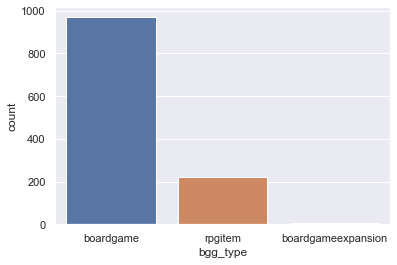

In [103]:
sns.countplot(x='bgg_type',data=bgg_df)

In [107]:
rpg_df = bgg_df[bgg_df['bgg_type'] == 'rpgitem']
bg_df = bgg_df[bgg_df['bgg_type'] == 'boardgame']

In [108]:
bg_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 970 entries, 0 to 1197
Data columns (total 32 columns):
bgg_average_rating           970 non-null float64
bgg_avg_complex_weight       735 non-null float64
bgg_categories               957 non-null object
bgg_categories_count         970 non-null float64
bgg_category                 0 non-null object
bgg_expansions               970 non-null float64
bgg_families                 788 non-null object
bgg_families_count           970 non-null float64
bgg_genre                    0 non-null object
bgg_integrations             970 non-null float64
bgg_is_compilation           970 non-null float64
bgg_is_reimplementation      970 non-null float64
bgg_mechanics                928 non-null object
bgg_mechanics_count          970 non-null int64
bgg_poll_best_age            525 non-null object
bgg_poll_best_num_players    625 non-null object
bgg_prod_team_size           970 non-null int64
bgg_rpg_id                   0 non-null object
bgg_rpg_val 

# Kickstarter Page 

In [105]:
def parse_rewards(html):
    page_props = dict()
    current_proj = re.search(r'window\.current_project = "({[^"]+})\";\s*', html).group(1)
    if current_proj:
        soup = BeautifulSoup(current_proj).find('p').text.replace('\\\\', '\\')
        try:
            j = json.loads(soup)
            #page_props['rewards'] = j['rewards']
            page_props['reward_count'] = len(j['rewards'])
            rewards = []
            for reward in j['rewards']:
                rewards.append(reward['converted_minimum'])
            page_props['reward_average'] = sum(rewards)/len(rewards)
            page_props['reward_median'] = np.median(rewards)
            page_props['reward_max'] = max(rewards)
            page_props['reward_std'] = np.std(rewards)
        except Exception as e:
            print(soup)
            raise e
    return page_props


In [106]:
def parse_description(html):
    page_props = dict()
    soup = BeautifulSoup(html, 'lxml')
    section = soup.find('section', class_='js-project-description-content')
    page_props['video_count'] = len(section.find_all('video'))
    page_props['image_count'] = len(section.find_all('div', class_='template asset'))
    page_props['mentions_stretch_goals'] = int(len(section(text=re.compile('stretch goal', re.IGNORECASE))) > 0)
    return page_props

In [110]:
ks_page_data = []
path='/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/'
file_mask = '.+\.html'
for idx, file in enumerate(filter(lambda f: re.search(file_mask, f), os.listdir(path))):
    matches = re.match(r'(\d+)_.+\.html',file)
    ks_profile_project_id = int(matches.group(1))
    print(idx, file, "KS id:", ks_profile_project_id)
    with open(path + file, 'r') as reader:
        print(path + file, flush=True)
        html = reader.read()
        ks_page_data.append({
            **{"profile_project_id":ks_profile_project_id}, 
            **parse_rewards(html), 
            **parse_description(html)
        })
            
ks_page_df = pd.DataFrame(ks_page_data)
ks_page_df.to_pickle('/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pickles/ks_pgs.pkl')

0 3223169_mythic-arcana-roll-dice-summon-gods-rule-the-heave.html KS id: 3223169
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3223169_mythic-arcana-roll-dice-summon-gods-rule-the-heave.html
1 963883_dump-the-ump.html KS id: 963883
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/963883_dump-the-ump.html
2 2579702_tinker-bits-i-steampunk-metal-meeples.html KS id: 2579702
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2579702_tinker-bits-i-steampunk-metal-meeples.html
3 2242211_guards-of-atlantis-tabletop-moba.html KS id: 2242211
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2242211_guards-of-atlantis-tabletop-moba.html
4 2765164_ouroboros-tales.html KS id: 2765164
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2765164_ouroboros-tales.html
5 3101134_game-anywheretm-table-gat-64-plus-portable-gaming.html KS id: 3101134
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3101134_game-anywheretm-tabl

48 2232990_heroes-and-tricks.html KS id: 2232990
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2232990_heroes-and-tricks.html
49 2944761_wild-west-fantasy-miniatures.html KS id: 2944761
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2944761_wild-west-fantasy-miniatures.html
50 2089464_siege-warfare-greco-persian-wars.html KS id: 2089464
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2089464_siege-warfare-greco-persian-wars.html
51 2895479_tall-pines-a-surreal-murder-mystery-roleplaying-ga.html KS id: 2895479
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2895479_tall-pines-a-surreal-murder-mystery-roleplaying-ga.html
52 2905912_bloody-monday-napoleon-at-the-gates-of-moscow.html KS id: 2905912
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2905912_bloody-monday-napoleon-at-the-gates-of-moscow.html
53 3065426_too-many-bones-undertow.html KS id: 3065426
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter

95 2714810_no-thank-you-evil-the-adventures-continue.html KS id: 2714810
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2714810_no-thank-you-evil-the-adventures-continue.html
96 2970636_rude-rats-tabletop-miniature-modular-multi-part-ki.html KS id: 2970636
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2970636_rude-rats-tabletop-miniature-modular-multi-part-ki.html
97 3551927_the-ultraviolet-grasslands.html KS id: 3551927
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3551927_the-ultraviolet-grasslands.html
98 516953_adventures-in-the-east-mark-the-red-box.html KS id: 516953
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/516953_adventures-in-the-east-mark-the-red-box.html
99 186827_ova-the-anime-role-playing-game.html KS id: 186827
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/186827_ova-the-anime-role-playing-game.html
100 3425525_dicetopia-roll-with-the-punches.html KS id: 3425525
/Users/kirill.kogan/Doc

143 3065808_heroes-of-karth-deathmatchtm.html KS id: 3065808
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3065808_heroes-of-karth-deathmatchtm.html
144 1311857_stuff-and-nonsense.html KS id: 1311857
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1311857_stuff-and-nonsense.html
145 3358832_so-long-my-world.html KS id: 3358832
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3358832_so-long-my-world.html
146 1375774_lost-world-lunch-dinosaur-card-game.html KS id: 1375774
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1375774_lost-world-lunch-dinosaur-card-game.html
147 3102771_mighty-dice-high-quality-awesome-value-totally-kic.html KS id: 3102771
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3102771_mighty-dice-high-quality-awesome-value-totally-kic.html
148 3251177_last-stand-1.html KS id: 3251177
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3251177_last-stand-1.html
149 3738838_heavy-fire

190 623019_toolcards-2-its-time-to-be-a-gamemaster-again.html KS id: 623019
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/623019_toolcards-2-its-time-to-be-a-gamemaster-again.html
191 3644755_mixtape-massacre-escape-from-tall-oaks.html KS id: 3644755
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3644755_mixtape-massacre-escape-from-tall-oaks.html
192 3277661_book-it-the-wrestling-promoter-card-game.html KS id: 3277661
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3277661_book-it-the-wrestling-promoter-card-game.html
193 3544238_strings-a-zine-supplement-for-many-ttrpgs.html KS id: 3544238
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3544238_strings-a-zine-supplement-for-many-ttrpgs.html
194 3442133_lyguyison-chronicles-modern-ninja.html KS id: 3442133
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3442133_lyguyison-chronicles-modern-ninja.html
195 3081897_riot-dice-a-website-for-dice-lovers-and-dice-de

236 2012888_cromlech-a-dice-and-card-game-of-magical-battle.html KS id: 2012888
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2012888_cromlech-a-dice-and-card-game-of-magical-battle.html
237 3358918_inexpensive-fate-fudge-dice.html KS id: 3358918
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3358918_inexpensive-fate-fudge-dice.html
238 2612760_electrum-campaign-coins.html KS id: 2612760
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2612760_electrum-campaign-coins.html
239 1513855_dynamic-colored-x-wing-attack-wing-template-sets.html KS id: 1513855
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1513855_dynamic-colored-x-wing-attack-wing-template-sets.html
240 2746803_me-myself-and-ice-cream.html KS id: 2746803
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2746803_me-myself-and-ice-cream.html
241 3426978_iron-edda-accelerated.html KS id: 3426978
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pag

281 3735587_infernal-chaos-dwarfs-and-hobgoblins-miniatures.html KS id: 3735587
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3735587_infernal-chaos-dwarfs-and-hobgoblins-miniatures.html
282 3155076_super-powered-legends-sourcebook-for-mandm.html KS id: 3155076
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3155076_super-powered-legends-sourcebook-for-mandm.html
283 2547434_island-hopper-scott-almes-reckless-romp-in-rarifie.html KS id: 2547434
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2547434_island-hopper-scott-almes-reckless-romp-in-rarifie.html
284 2855400_judge-dredd-and-the-worlds-of-2000-ad-roleplaying.html KS id: 2855400
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2855400_judge-dredd-and-the-worlds-of-2000-ad-roleplaying.html
285 1373512_get-laid-the-hilarious-game-about-the-game.html KS id: 1373512
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1373512_get-laid-the-hilarious-game-about-the-

327 2046056_mywuxing-card-game.html KS id: 2046056
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2046056_mywuxing-card-game.html
328 2844154_divinity-derby-a-racing-and-betting-game-of-mythic.html KS id: 2844154
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2844154_divinity-derby-a-racing-and-betting-game-of-mythic.html
329 1793847_iron-mask-miniatures-mounted-dwarf-musketeers.html KS id: 1793847
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1793847_iron-mask-miniatures-mounted-dwarf-musketeers.html
330 2768491_goal-markers-these-and-more-for-tabletop-fantasy-f.html KS id: 2768491
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2768491_goal-markers-these-and-more-for-tabletop-fantasy-f.html
331 1959622_ninja-camp.html KS id: 1959622
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1959622_ninja-camp.html
332 2947438_undead-resin-collection-vol-1.html KS id: 2947438
/Users/kirill.kogan/Documents/data/metis_p

373 1398786_holdfast-korea-1950-1951.html KS id: 1398786
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1398786_holdfast-korea-1950-1951.html
374 3669103_castles-and-cats.html KS id: 3669103
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3669103_castles-and-cats.html
375 3001088_play-big-the-game-to-raise-smart-and-curious-kids.html KS id: 3001088
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3001088_play-big-the-game-to-raise-smart-and-curious-kids.html
376 3332083_tabletop-network-boardgame-designers-retreat.html KS id: 3332083
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3332083_tabletop-network-boardgame-designers-retreat.html
377 2503182_hope-the-board-game-0.html KS id: 2503182
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2503182_hope-the-board-game-0.html
378 3644634_the-little-flower-shop-potpourri-pack.html KS id: 3644634
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3644634_t

419 3700854_biomech-overlord-miniature.html KS id: 3700854
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3700854_biomech-overlord-miniature.html
420 3437739_grim-and-the-wicked-a-dandd-5e-campaign.html KS id: 3437739
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3437739_grim-and-the-wicked-a-dandd-5e-campaign.html
421 2674401_take-the-galaxy.html KS id: 2674401
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2674401_take-the-galaxy.html
422 1761847_alien-frontiers-big-box-reloaded.html KS id: 1761847
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1761847_alien-frontiers-big-box-reloaded.html
423 3314709_limited-edition-miniatures-the-goblin-dragon-raide.html KS id: 3314709
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3314709_limited-edition-miniatures-the-goblin-dragon-raide.html
424 836131_tuscany-expand-the-world-of-viticulture.html KS id: 836131
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter

465 3510372_rn-estudio-3-new-fantasy-football-teams.html KS id: 3510372
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3510372_rn-estudio-3-new-fantasy-football-teams.html
466 318640_tome-of-horrors-complete-28mm-heroic-scale-miniatu.html KS id: 318640
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/318640_tome-of-horrors-complete-28mm-heroic-scale-miniatu.html
467 3274986_the-keyring-rpg.html KS id: 3274986
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3274986_the-keyring-rpg.html
468 1510587_exclusive-numenera-boxed-set-edition.html KS id: 1510587
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1510587_exclusive-numenera-boxed-set-edition.html
469 1082789_neptun-sail-and-deliver-goods-along-the-mediterran.html KS id: 1082789
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1082789_neptun-sail-and-deliver-goods-along-the-mediterran.html
470 3357848_village-pillage-a-30-minute-game-of-risk-and-betra.html KS id

512 3476084_print-and-play-artifacts.html KS id: 3476084
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3476084_print-and-play-artifacts.html
513 2889658_village-attacks.html KS id: 2889658
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2889658_village-attacks.html
514 2922602_the-app-of-holding.html KS id: 2922602
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2922602_the-app-of-holding.html
515 3378305_the-wyrmwood-magnetic-dice-tower-system-bespoke-ed.html KS id: 3378305
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3378305_the-wyrmwood-magnetic-dice-tower-system-bespoke-ed.html
516 1858210_the-foreign-king.html KS id: 1858210
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1858210_the-foreign-king.html
517 2641285_cards-of-liberty.html KS id: 2641285
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2641285_cards-of-liberty.html
518 3369534_patrol-a-coloring-card-game-secret-kickstarter.htm

561 1166930_the-resistance-hostile-intent-and-hidden-agenda.html KS id: 1166930
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1166930_the-resistance-hostile-intent-and-hidden-agenda.html
562 1376928_desert-island-0.html KS id: 1376928
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1376928_desert-island-0.html
563 3379165_era-of-kingdoms.html KS id: 3379165
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3379165_era-of-kingdoms.html
564 2116235_tiny-swords.html KS id: 2116235
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2116235_tiny-swords.html
565 585697_meeple-soap-dont-play-dirty.html KS id: 585697
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/585697_meeple-soap-dont-play-dirty.html
566 2702327_yokai-quest.html KS id: 2702327
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2702327_yokai-quest.html
567 3366796_dangerous-descents-5e.html KS id: 3366796
/Users/kirill.kogan/Documents/data/me

608 3163854_gobblin-the-goblin-rpg.html KS id: 3163854
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3163854_gobblin-the-goblin-rpg.html
609 2605911_prince-valiant-storytelling-game-by-greg-stafford.html KS id: 2605911
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2605911_prince-valiant-storytelling-game-by-greg-stafford.html
610 3273840_vital-hearts-isekai-tabletop-role-play-in-augmente.html KS id: 3273840
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3273840_vital-hearts-isekai-tabletop-role-play-in-augmente.html
611 2832214_the-shared-dream-0.html KS id: 2832214
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2832214_the-shared-dream-0.html
612 3064109_cachet-the-game-cash-or-crash-leave-your-mark-on-h.html KS id: 3064109
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3064109_cachet-the-game-cash-or-crash-leave-your-mark-on-h.html
613 2584673_frame-werx-affordable-modular-building-kit-files.html KS id:

/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3148273_empire-of-men-28mm-sci-fi-miniatures-collection.html
654 654609_infected.html KS id: 654609
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/654609_infected.html
655 3545421_the-seance-0.html KS id: 3545421
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3545421_the-seance-0.html
656 3473867_centurion-the-elderwood-deck-box.html KS id: 3473867
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3473867_centurion-the-elderwood-deck-box.html
657 3131890_butts-in-space-the-card-game.html KS id: 3131890
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3131890_butts-in-space-the-card-game.html
658 3407834_the-host-a-cybernetic-setting-guide-for-warsong.html KS id: 3407834
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3407834_the-host-a-cybernetic-setting-guide-for-warsong.html
659 3433266_summoning-a-dragon-fantasy-and-sci-fi-miniatures-b.html KS id: 

700 2665467_techno-bowl-arcade-football-unplugged-0.html KS id: 2665467
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2665467_techno-bowl-arcade-football-unplugged-0.html
701 2392376_the-carcass-exodus.html KS id: 2392376
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2392376_the-carcass-exodus.html
702 1775440_zoo-webs-wild-animal-conservation-card-game.html KS id: 1775440
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1775440_zoo-webs-wild-animal-conservation-card-game.html
703 2686897_zucati-dice-retro-classic-pure-aluminum-dice.html KS id: 2686897
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2686897_zucati-dice-retro-classic-pure-aluminum-dice.html
704 2607830_chickapig.html KS id: 2607830
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2607830_chickapig.html
705 3779530_plague-fields-miniatures-hungry-troll.html KS id: 3779530
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3779530_pla

746 3438315_spatial-multiplayer-ar-tabletop-gaming.html KS id: 3438315
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3438315_spatial-multiplayer-ar-tabletop-gaming.html
747 3353087_envyra-simultaneous-action-strategy-game.html KS id: 3353087
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3353087_envyra-simultaneous-action-strategy-game.html
748 3309659_goblin-tower-print-and-play.html KS id: 3309659
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3309659_goblin-tower-print-and-play.html
749 3498716_mastersweets.html KS id: 3498716
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3498716_mastersweets.html
750 596878_scrios-a-tabletop-3d-space-combat-role-playing-gam.html KS id: 596878
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/596878_scrios-a-tabletop-3d-space-combat-role-playing-gam.html
751 639802_a-war-of-kings-playing-cards-with-a-fantasy-art-tw.html KS id: 639802
/Users/kirill.kogan/Documents/data/met

793 3360817_the-ultimate-boardgame-backpack.html KS id: 3360817
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3360817_the-ultimate-boardgame-backpack.html
794 3453827_heroes-of-tenefyr.html KS id: 3453827
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3453827_heroes-of-tenefyr.html
795 527537_monsters-and-maidens.html KS id: 527537
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/527537_monsters-and-maidens.html
796 3368157_mike-and-odes-solarius-mission-2nd-edition.html KS id: 3368157
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3368157_mike-and-odes-solarius-mission-2nd-edition.html
797 890396_sheepdogs-take-a-hike.html KS id: 890396
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/890396_sheepdogs-take-a-hike.html
798 1687463_carson-city-big-box-edition.html KS id: 1687463
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1687463_carson-city-big-box-edition.html
799 2132900_burrows-and-badger

841 2831733_the-city-of-sands-for-5th-edition-and-pathfinder.html KS id: 2831733
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2831733_the-city-of-sands-for-5th-edition-and-pathfinder.html
842 2996585_termination-shock.html KS id: 2996585
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2996585_termination-shock.html
843 3722743_untamed-feral-factions.html KS id: 3722743
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3722743_untamed-feral-factions.html
844 3125116_warmonger-the-ultimate-card-game-of-war-for-1-4-pl.html KS id: 3125116
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3125116_warmonger-the-ultimate-card-game-of-war-for-1-4-pl.html
845 2427601_fine-art-dice-towers.html KS id: 2427601
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2427601_fine-art-dice-towers.html
846 3291406_drive-fighter.html KS id: 3291406
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3291406_drive-fighter.html


889 2715424_shadows-of-brimstone-forbidden-fortress.html KS id: 2715424
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2715424_shadows-of-brimstone-forbidden-fortress.html
890 3313068_daimyos-fall-dice-tuners.html KS id: 3313068
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3313068_daimyos-fall-dice-tuners.html
891 1367733_the-dice-chest-a-high-quality-dice-box-and-rolling.html KS id: 1367733
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1367733_the-dice-chest-a-high-quality-dice-box-and-rolling.html
892 685683_marrying-mr-darcy-the-pride-and-prejudice-card-gam.html KS id: 685683
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/685683_marrying-mr-darcy-the-pride-and-prejudice-card-gam.html
893 3337463_for-the-love-of-board-games-a-book-for-board-gamer.html KS id: 3337463
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3337463_for-the-love-of-board-games-a-book-for-board-gamer.html
894 3138197_a-pay-what-you-

934 1611897_the-witchborn.html KS id: 1611897
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1611897_the-witchborn.html
935 596057_i-am-zombie-field-manual-rpgx.html KS id: 596057
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/596057_i-am-zombie-field-manual-rpgx.html
936 3749806_orcs-in-shorts.html KS id: 3749806
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3749806_orcs-in-shorts.html
937 3173219_dark-naga-confronting-hastur-for-5th-edition.html KS id: 3173219
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3173219_dark-naga-confronting-hastur-for-5th-edition.html
938 897552_cursed-0.html KS id: 897552
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/897552_cursed-0.html
939 2747047_npc-for-hire.html KS id: 2747047
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2747047_npc-for-hire.html
940 3662282_from-the-shroud-issue-2.html KS id: 3662282
/Users/kirill.kogan/Documents/data/metis_p02_kicks

983 2180530_lands-of-ruin-hybrid-tabletop-gaming-as-it-should.html KS id: 2180530
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2180530_lands-of-ruin-hybrid-tabletop-gaming-as-it-should.html
984 1609641_hoyuk-anatolia.html KS id: 1609641
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1609641_hoyuk-anatolia.html
985 3742174_nocturna-models-n-paint-acrylic-colors-and-fantasy-figures.html KS id: 3742174
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3742174_nocturna-models-n-paint-acrylic-colors-and-fantasy-figures.html
986 3378488_the-book-of-many-things-print-edition.html KS id: 3378488
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3378488_the-book-of-many-things-print-edition.html
987 3263768_das-geheimnis-der-tempel.html KS id: 3263768
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3263768_das-geheimnis-der-tempel.html
988 2908878_forest-of-fate-a-storytelling-survival-adventure.html KS id: 2908878
/User

1029 2753078_polite-society-the-jane-austen-board-game.html KS id: 2753078
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2753078_polite-society-the-jane-austen-board-game.html
1030 2868050_mac-and-chess-miamis-first-board-game-cafe.html KS id: 2868050
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2868050_mac-and-chess-miamis-first-board-game-cafe.html
1031 3277754_dead-men-tell-no-tales-board-game-expansion-miniat.html KS id: 3277754
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3277754_dead-men-tell-no-tales-board-game-expansion-miniat.html
1032 539782_villages-a-construct-and-conquer-card-game.html KS id: 539782
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/539782_villages-a-construct-and-conquer-card-game.html
1033 2945514_28mm-world-war-2-wargaming-miniatures-disposable-h.html KS id: 2945514
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2945514_28mm-world-war-2-wargaming-miniatures-disposable-h.htm

1075 2435862_boxer-rebellion-28mm-miniatures.html KS id: 2435862
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2435862_boxer-rebellion-28mm-miniatures.html
1076 2625359_gondola-upgraded.html KS id: 2625359
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2625359_gondola-upgraded.html
1077 3771121_cthulhu-mythos-coins-limited-edition-final-minting.html KS id: 3771121
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3771121_cthulhu-mythos-coins-limited-edition-final-minting.html
1078 3682037_puzzlelock-playsets.html KS id: 3682037
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3682037_puzzlelock-playsets.html
1079 3149909_28mm-modular-wasteland-buildings-and-scenery-stl-o.html KS id: 3149909
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3149909_28mm-modular-wasteland-buildings-and-scenery-stl-o.html
1080 947494_coup-reformation-kickstarter-edition.html KS id: 947494
/Users/kirill.kogan/Documents/data/metis_p02_

1120 3804183_the-book-of-unusual-potions-for-use-with-fantasy-rpgs.html KS id: 3804183
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3804183_the-book-of-unusual-potions-for-use-with-fantasy-rpgs.html
1121 3795818_wolves-of-mercia-social-deduction-everyone-has-a-secret.html KS id: 3795818
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3795818_wolves-of-mercia-social-deduction-everyone-has-a-secret.html
1122 3531307_game-theory-in-the-age-of-chaos-goes-to-washington.html KS id: 3531307
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3531307_game-theory-in-the-age-of-chaos-goes-to-washington.html
1123 3127891_know-thy-neighbor.html KS id: 3127891
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3127891_know-thy-neighbor.html
1124 2022084_codex-2.html KS id: 2022084
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2022084_codex-2.html
1125 3162896_dragon-drop-adventures-5e-vol-3.html KS id: 3162896
/Users/kirill.ko

1167 3278920_zombie-a-social-club.html KS id: 3278920
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3278920_zombie-a-social-club.html
1168 2100094_no-mercy-a-kitty-vs-alien-card-game.html KS id: 2100094
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2100094_no-mercy-a-kitty-vs-alien-card-game.html
1169 2560751_jutaku.html KS id: 2560751
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2560751_jutaku.html
1170 3338048_law-of-the-forest-hk-ecological-board-game.html KS id: 3338048
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3338048_law-of-the-forest-hk-ecological-board-game.html
1171 2681131_scion-2nd-edition-tabletop-rpg.html KS id: 2681131
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2681131_scion-2nd-edition-tabletop-rpg.html
1172 349673_wild-guess-chase-the-fast-guessing-word-game-0.html KS id: 349673
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/349673_wild-guess-chase-the-fast-guess

1213 2377497_hologrid-monster-battle-augmented-reality-board-ga.html KS id: 2377497
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2377497_hologrid-monster-battle-augmented-reality-board-ga.html
1214 2356225_houdinis-poutini.html KS id: 2356225
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2356225_houdinis-poutini.html
1215 3427343_urban-insanity.html KS id: 3427343
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3427343_urban-insanity.html
1216 2967457_the-storymasters-tales-the-dark-fairytale.html KS id: 2967457
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2967457_the-storymasters-tales-the-dark-fairytale.html
1217 3515724_borders-of-kanta-a-tile-laying-game-for-2-6-player-0.html KS id: 3515724
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3515724_borders-of-kanta-a-tile-laying-game-for-2-6-player-0.html
1218 2989865_infamy-collectibles.html KS id: 2989865
/Users/kirill.kogan/Documents/data/metis_p02_k

1260 2532194_captains-of-the-golden-age.html KS id: 2532194
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2532194_captains-of-the-golden-age.html
1261 3684522_a-town-called-malice-a-nordic-horror-story-game.html KS id: 3684522
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3684522_a-town-called-malice-a-nordic-horror-story-game.html
1262 3216355_printable-scifi-structures-stl-file-pack-for-table.html KS id: 3216355
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3216355_printable-scifi-structures-stl-file-pack-for-table.html
1263 1361152_among-nobles-a-bloodline-building-board-game.html KS id: 1361152
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1361152_among-nobles-a-bloodline-building-board-game.html
1264 2868111_dicey-peaks.html KS id: 2868111
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2868111_dicey-peaks.html
1265 834348_coconuts-crazy-monkey-dexterity-game-for-2-4-playe.html KS id: 834348
/Users/

1306 3186315_goal-markers-and-scatter-terrain-volume-2-blacksmi.html KS id: 3186315
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3186315_goal-markers-and-scatter-terrain-volume-2-blacksmi.html
1307 3482631_arcanacon-2019-games-convention.html KS id: 3482631
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3482631_arcanacon-2019-games-convention.html
1308 2705589_the-five-cyclones.html KS id: 2705589
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2705589_the-five-cyclones.html
1309 3077555_fever-swamp-an-osr-swamp-crawl-adventure.html KS id: 3077555
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3077555_fever-swamp-an-osr-swamp-crawl-adventure.html
1310 3204194_simulacra-games-the-wilson-wolfe-affair.html KS id: 3204194
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3204194_simulacra-games-the-wilson-wolfe-affair.html
1311 2000505_roll-player-the-dice-game-that-builds-character.html KS id: 2000505
/Users/kir

1352 1399164_wizards-of-the-wild-the-card-game-of-animal-sorcer.html KS id: 1399164
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1399164_wizards-of-the-wild-the-card-game-of-animal-sorcer.html
1353 3676308_hp-lovecraft-the-dreams-in-the-witch-house-miniatu.html KS id: 3676308
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3676308_hp-lovecraft-the-dreams-in-the-witch-house-miniatu.html
1354 1056618_tiny-epic-defenders.html KS id: 1056618
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1056618_tiny-epic-defenders.html
1355 3720637_flexai-dynamic-monster-and-npc-rules-for-tabletop.html KS id: 3720637
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3720637_flexai-dynamic-monster-and-npc-rules-for-tabletop.html
1356 2664315_chupacabracon-4.html KS id: 2664315
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2664315_chupacabracon-4.html
1357 3547244_dark-rituals-malleus-maleficarum.html KS id: 3547244
/Users/kirill

1400 2678115_electromagnate-board-game.html KS id: 2678115
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2678115_electromagnate-board-game.html
1401 377467_fenris-games-rubble-city.html KS id: 377467
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/377467_fenris-games-rubble-city.html
1402 1671707_birds-of-a-feather.html KS id: 1671707
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1671707_birds-of-a-feather.html
1403 2567482_terra-49-0.html KS id: 2567482
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2567482_terra-49-0.html
1404 1704_laugh-riot-the-comedy-improv-card-game-11-2009.html KS id: 1704
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1704_laugh-riot-the-comedy-improv-card-game-11-2009.html
1405 3526137_yoz-a-world-of-adventure.html KS id: 3526137
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3526137_yoz-a-world-of-adventure.html
1406 3290770_roil-the-strategy-card-game.html KS id:

1447 3712868_slay-your-friends-a-vicious-card-game-for-the-remo.html KS id: 3712868
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3712868_slay-your-friends-a-vicious-card-game-for-the-remo.html
1448 2056491_nemos-war-second-edition.html KS id: 2056491
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2056491_nemos-war-second-edition.html
1449 3389335_dirt-cheap-dungeons-portable-rpg-gaming-accessorie.html KS id: 3389335
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3389335_dirt-cheap-dungeons-portable-rpg-gaming-accessorie.html
1450 3292198_castquest-a-new-strategic-party-game-with-a-touch.html KS id: 3292198
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3292198_castquest-a-new-strategic-party-game-with-a-touch.html
1451 2911481_march-of-the-dead-28mm-fantasy-undead-miniatures.html KS id: 2911481
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2911481_march-of-the-dead-28mm-fantasy-undead-miniatures.html
145

1494 526725_mischief-nightwhen-monsters-come-out-to-play.html KS id: 526725
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/526725_mischief-nightwhen-monsters-come-out-to-play.html
1495 2743985_foundations-4-rise-of-the-mimics.html KS id: 2743985
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2743985_foundations-4-rise-of-the-mimics.html
1496 3350565_dice-masters-dice-vault.html KS id: 3350565
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3350565_dice-masters-dice-vault.html
1497 2651716_thornwatch.html KS id: 2651716
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2651716_thornwatch.html
1498 3740036_cover-your-kingdom.html KS id: 3740036
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3740036_cover-your-kingdom.html
1499 2438941_forged-in-magic-reforged-400-magic-items-for-5th-e.html KS id: 2438941
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2438941_forged-in-magic-reforged-400-magic-item

1540 3307154_testudine-time-travelers.html KS id: 3307154
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3307154_testudine-time-travelers.html
1541 3760777_gatefall.html KS id: 3760777
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3760777_gatefall.html
1542 2223125_smog-riders-the-war-ensues.html KS id: 2223125
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2223125_smog-riders-the-war-ensues.html
1543 3303122_pestilence-fantasy-miniatures-of-filth-in-28mm.html KS id: 3303122
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3303122_pestilence-fantasy-miniatures-of-filth-in-28mm.html
1544 3370662_sainome-colosseum-r-english-edition.html KS id: 3370662
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3370662_sainome-colosseum-r-english-edition.html
1545 2698041_18cz.html KS id: 2698041
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2698041_18cz.html
1546 2949688_renaissance-skeleton-army-28mm-mini

1587 3198155_affectionate-cats-and-cuddles-its-treat-time.html KS id: 3198155
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3198155_affectionate-cats-and-cuddles-its-treat-time.html
1588 3464656_fiends-and-foes-adorably-deadly-chibi-style-5e-mon.html KS id: 3464656
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3464656_fiends-and-foes-adorably-deadly-chibi-style-5e-mon.html
1589 3736984_dwarfs-stl-files-for-a-dwarfen-army-or-adventure-party.html KS id: 3736984
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3736984_dwarfs-stl-files-for-a-dwarfen-army-or-adventure-party.html
1590 2884234_1-48tactic-fast-paced-cinematic-ww2-miniature-skir.html KS id: 2884234
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2884234_1-48tactic-fast-paced-cinematic-ww2-miniature-skir.html
1591 3481407_riders-of-the-storm-elves-dwarfs-miniatures-and-dr.html KS id: 3481407
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3481407_rider

/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2338482_orc-office-party.html
1633 1089525_asking-for-trobils.html KS id: 1089525
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1089525_asking-for-trobils.html
1634 3169227_henchman-the-game.html KS id: 3169227
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3169227_henchman-the-game.html
1635 3320622_munchkin-teenage-mutant-ninja-turtles.html KS id: 3320622
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3320622_munchkin-teenage-mutant-ninja-turtles.html
1636 3340735_dungeon-crawlers-the-evil-adventurers-metal-28mm-m.html KS id: 3340735
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3340735_dungeon-crawlers-the-evil-adventurers-metal-28mm-m.html
1637 2420911_landed-a-terraforming-board-game.html KS id: 2420911
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2420911_landed-a-terraforming-board-game.html
1638 1476484_epic-hero-and-villain-feat-card

1678 2231013_hungry-troll-3-bb-teams.html KS id: 2231013
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2231013_hungry-troll-3-bb-teams.html
1679 839901_chainmail-dice-bags-by-vitality-handmade-designs.html KS id: 839901
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/839901_chainmail-dice-bags-by-vitality-handmade-designs.html
1680 2658799_package-an-abstract-tabletop-game.html KS id: 2658799
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2658799_package-an-abstract-tabletop-game.html
1681 2280309_dnd-5th-edition-online-game-day.html KS id: 2280309
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2280309_dnd-5th-edition-online-game-day.html
1682 1007503_sci-fi-soundtracks-tabletop-gaming-soundscapes.html KS id: 1007503
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1007503_sci-fi-soundtracks-tabletop-gaming-soundscapes.html
1683 1812945_gamematz-gaming-terrain-game-mats.html KS id: 1812945
/Users/kirill.kogan

1727 2669011_its-just-a-theory-the-conspiracy-themed-card-game.html KS id: 2669011
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2669011_its-just-a-theory-the-conspiracy-themed-card-game.html
1728 3659649_diception-carnival-conquest.html KS id: 3659649
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3659649_diception-carnival-conquest.html
1729 2366082_police-precinct-online.html KS id: 2366082
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2366082_police-precinct-online.html
1730 2222471_trash-bash-bits-part-two.html KS id: 2222471
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2222471_trash-bash-bits-part-two.html
1731 3724682_balk.html KS id: 3724682
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3724682_balk.html
1732 3496298_make-100-heroes-ofterrabyte.html KS id: 3496298
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3496298_make-100-heroes-ofterrabyte.html
1733 3774582_pirates-of-the-

1775 1870758_playing-lean-relaunch-play-leaner.html KS id: 1870758
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1870758_playing-lean-relaunch-play-leaner.html
1776 2248470_dragon-kings-a-54-card-deck-building-experience.html KS id: 2248470
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2248470_dragon-kings-a-54-card-deck-building-experience.html
1777 499696_deluxe-exalted-3rd-edition.html KS id: 499696
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/499696_deluxe-exalted-3rd-edition.html
1778 731410_tower-a-board-game-of-buying-and-building.html KS id: 731410
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/731410_tower-a-board-game-of-buying-and-building.html
1779 2935085_industrial-bulkhead-terrain-for-28mm-wargaming.html KS id: 2935085
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2935085_industrial-bulkhead-terrain-for-28mm-wargaming.html
1780 3036734_triplock.html KS id: 3036734
/Users/kirill.kogan/Doc

1822 2359462_legendary-metal-coins-season-2.html KS id: 2359462
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2359462_legendary-metal-coins-season-2.html
1823 3268123_supershow-the-game-the-knockdown-by-srg-universe.html KS id: 3268123
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3268123_supershow-the-game-the-knockdown-by-srg-universe.html
1824 3409664_the-rpg-coloring-book.html KS id: 3409664
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3409664_the-rpg-coloring-book.html
1825 2104376_corvus-bellis-infinity-roleplaying-game.html KS id: 2104376
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2104376_corvus-bellis-infinity-roleplaying-game.html
1826 2521658_bad-people-the-party-game-you-probably-shouldnt-pl.html KS id: 2521658
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2521658_bad-people-the-party-game-you-probably-shouldnt-pl.html
1827 3320219_the-onepage-oneshots.html KS id: 3320219
/Users/kirill.k

1870 2782355_deep-madness-horror-soundscapes-by-darkraven-europ.html KS id: 2782355
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2782355_deep-madness-horror-soundscapes-by-darkraven-europ.html
1871 3745887_hellscape-modular-lava-terrain-from-dwarven-forge.html KS id: 3745887
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3745887_hellscape-modular-lava-terrain-from-dwarven-forge.html
1872 1978306_macrocosm-the-next-races.html KS id: 1978306
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1978306_macrocosm-the-next-races.html
1873 1847021_modern-figures-for-gaming.html KS id: 1847021
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1847021_modern-figures-for-gaming.html
1874 3669241_martin-wallaces-milito-game.html KS id: 3669241
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3669241_martin-wallaces-milito-game.html
1875 3441238_tactical-tokens-quality-game-pieces-for-tabletop-r.html KS id: 3441238
/Users/kiri

1915 3668196_3d-printable-airplanes-re-launch.html KS id: 3668196
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3668196_3d-printable-airplanes-re-launch.html
1916 3185789_critical-hit-and-fumble-dice.html KS id: 3185789
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3185789_critical-hit-and-fumble-dice.html
1917 3545427_tricky-kitty.html KS id: 3545427
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3545427_tricky-kitty.html
1918 2846869_xybrid-a-monster-building-transparent-card-game.html KS id: 2846869
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2846869_xybrid-a-monster-building-transparent-card-game.html
1919 2005197_bitches-a-dice-game.html KS id: 2005197
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2005197_bitches-a-dice-game.html
1920 3279554_small-star-empires-2nd-edition-two-expansions.html KS id: 3279554
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3279554_small-star-empires-

1961 2461782_the-princess-and-the-goblin-a-game-of-daring-escap.html KS id: 2461782
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2461782_the-princess-and-the-goblin-a-game-of-daring-escap.html
1962 1951452_cardboard-clothing-apparel-for-the-modern-board-ga.html KS id: 1951452
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1951452_cardboard-clothing-apparel-for-the-modern-board-ga.html
1963 3510032_brexit-the-board-game-of-second-chancestm.html KS id: 3510032
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3510032_brexit-the-board-game-of-second-chancestm.html
1964 2349867_fate-of-akalon-tribes-0.html KS id: 2349867
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2349867_fate-of-akalon-tribes-0.html
1965 2586320_zen-squire.html KS id: 2586320
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2586320_zen-squire.html
1966 2417074_minion-miniatures-the-monsters-of-underdeep-2.html KS id: 2417074
/Users/kirill.koga

2007 1895225_this-boardgame-is-4-the-birds.html KS id: 1895225
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1895225_this-boardgame-is-4-the-birds.html
2008 3366925_bringing-hlg-con-to-the-next-level.html KS id: 3366925
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3366925_bringing-hlg-con-to-the-next-level.html
2009 2427242_gloaming-forge-metal-gaming-dice.html KS id: 2427242
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2427242_gloaming-forge-metal-gaming-dice.html
2010 2603740_the-chronicles-of-aerthe-dark-fantasy-rpg.html KS id: 2603740
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2603740_the-chronicles-of-aerthe-dark-fantasy-rpg.html
2011 3671771_world-of-twilight-the-crooked-trade-outpost.html KS id: 3671771
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3671771_world-of-twilight-the-crooked-trade-outpost.html
2012 3048673_awful-fantasy-adventures.html KS id: 3048673
/Users/kirill.kogan/Documents

2054 335126_28mm-demons-and-devils-center-stage-miniatures.html KS id: 335126
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/335126_28mm-demons-and-devils-center-stage-miniatures.html
2055 3134625_cavaliers-of-mars-a-tabletop-roleplaying-game.html KS id: 3134625
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3134625_cavaliers-of-mars-a-tabletop-roleplaying-game.html
2056 1621231_boss-monster-the-next-level.html KS id: 1621231
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1621231_boss-monster-the-next-level.html
2057 3351633_one-week-ultimate-werewolf.html KS id: 3351633
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3351633_one-week-ultimate-werewolf.html
2058 2328669_small-star-empires.html KS id: 2328669
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2328669_small-star-empires.html
2059 938493_aetherium.html KS id: 938493
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/938493_aetherium.htm

2101 3421366_all-is-madness-horror-tabletop-rpg.html KS id: 3421366
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3421366_all-is-madness-horror-tabletop-rpg.html
2102 3465102_the-parsec-for-rpgs.html KS id: 3465102
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3465102_the-parsec-for-rpgs.html
2103 2073754_miniature-scenery-terrain-for-tabletop-gaming-and.html KS id: 2073754
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2073754_miniature-scenery-terrain-for-tabletop-gaming-and.html
2104 3123414_magic-item-card-catalog-5e-fantasy-reference-cards.html KS id: 3123414
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3123414_magic-item-card-catalog-5e-fantasy-reference-cards.html
2105 3662067_chameleon-a-modern-version-of-chess.html KS id: 3662067
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3662067_chameleon-a-modern-version-of-chess.html
2106 3049170_entrenched-trench-run-terrain-for-x-wing-miniature.html KS

2147 3172134_punkin-fight.html KS id: 3172134
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3172134_punkin-fight.html
2148 3300046_aquilae-western-realm-gazetteer-pathfinder-5e.html KS id: 3300046
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3300046_aquilae-western-realm-gazetteer-pathfinder-5e.html
2149 2319292_silly-street-the-family-game.html KS id: 2319292
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2319292_silly-street-the-family-game.html
2150 3137254_zod-3d-printable-terrain-tiles.html KS id: 3137254
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3137254_zod-3d-printable-terrain-tiles.html
2151 2928416_bullets-and-teeth.html KS id: 2928416
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2928416_bullets-and-teeth.html
2152 3252901_brutality.html KS id: 3252901
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3252901_brutality.html
2153 925805_28mm-zombie-and-survivor-miniatures.html

2195 1089112_slaughterball-brutally-deluxe-sci-fi-sports-board.html KS id: 1089112
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1089112_slaughterball-brutally-deluxe-sci-fi-sports-board.html
2196 3433574_continent-race-a-game-created-by-a-kid-for-kids.html KS id: 3433574
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3433574_continent-race-a-game-created-by-a-kid-for-kids.html
2197 1318395_peptide-a-protein-building-game.html KS id: 1318395
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1318395_peptide-a-protein-building-game.html
2198 3793643_barbarians-of-the-ruined-earth.html KS id: 3793643
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3793643_barbarians-of-the-ruined-earth.html
2199 1273948_operation-faust.html KS id: 1273948
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1273948_operation-faust.html
2200 3516087_make-100-fantasy-locations.html KS id: 3516087
/Users/kirill.kogan/Documents/data/metis_

2242 3649059_overlap-the-game-of-spatial-reasoning.html KS id: 3649059
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3649059_overlap-the-game-of-spatial-reasoning.html
2243 2560273_crisis.html KS id: 2560273
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2560273_crisis.html
2244 3534539_battlefx.html KS id: 3534539
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3534539_battlefx.html
2245 2693451_epic-digital-tabletop-art-core-set.html KS id: 2693451
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2693451_epic-digital-tabletop-art-core-set.html
2246 3331017_mr-cabbageheads-garden.html KS id: 3331017
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3331017_mr-cabbageheads-garden.html
2247 3394403_lost-kingdom-miniatures-cuetzpal-empire.html KS id: 3394403
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3394403_lost-kingdom-miniatures-cuetzpal-empire.html
2248 3728302_unbearable-winter-the-board-g

2289 2971734_gruff-rage-of-the-trolls.html KS id: 2971734
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2971734_gruff-rage-of-the-trolls.html
2290 3215510_tokyo-series-jidohanbaiki-metro-and-jutaku.html KS id: 3215510
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3215510_tokyo-series-jidohanbaiki-metro-and-jutaku.html
2291 2825997_heroes-of-the-halfling-skeletons.html KS id: 2825997
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2825997_heroes-of-the-halfling-skeletons.html
2292 2474311_13th-age-coins-and-icon-tokens.html KS id: 2474311
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2474311_13th-age-coins-and-icon-tokens.html
2293 2044902_domain-of-the-necromancer.html KS id: 2044902
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2044902_domain-of-the-necromancer.html
2294 985712_17-fantasy-football-teams-new-pro-elves-and-orcs-a.html KS id: 985712
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/

2335 1376260_worldbox-a-pathfinder-compatible-toolkit.html KS id: 1376260
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1376260_worldbox-a-pathfinder-compatible-toolkit.html
2336 3373971_camping-with-sasquatch-a-card-game-with-a-roar.html KS id: 3373971
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3373971_camping-with-sasquatch-a-card-game-with-a-roar.html
2337 1918185_pocket-imperium-prosperity.html KS id: 1918185
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1918185_pocket-imperium-prosperity.html
2338 3710502_inn-of-the-green-dragon-2-roleplaying-audio.html KS id: 3710502
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3710502_inn-of-the-green-dragon-2-roleplaying-audio.html
2339 2917319_tinker-bits-steampunk-metal-fairy-meeples.html KS id: 2917319
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2917319_tinker-bits-steampunk-metal-fairy-meeples.html
2340 3729197_demons-from-hell.html KS id: 3729197
/Us

2381 2950889_adventure-kit-oath-of-the-frozen-king.html KS id: 2950889
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2950889_adventure-kit-oath-of-the-frozen-king.html
2382 2165295_conspiracy.html KS id: 2165295
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2165295_conspiracy.html
2383 1577596_exploding-kittens.html KS id: 1577596
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1577596_exploding-kittens.html
2384 2461839_kill-the-king.html KS id: 2461839
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2461839_kill-the-king.html
2385 3545261_western-legends-ante-up.html KS id: 3545261
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3545261_western-legends-ante-up.html
2386 1724220_unpub-protospiel-san-jose-2015.html KS id: 1724220
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1724220_unpub-protospiel-san-jose-2015.html
2387 3468087_the-forest-hymn-and-picnic.html KS id: 3468087
/Users/kirill.

2430 2019429_side-quest-pocket-adventures.html KS id: 2019429
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2019429_side-quest-pocket-adventures.html
2431 3492766_sandstorm-wars-more-than-150-28mm-skirmish-figures.html KS id: 3492766
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3492766_sandstorm-wars-more-than-150-28mm-skirmish-figures.html
2432 1613526_assassincon-3-6-player-hidden-assassin-game.html KS id: 1613526
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1613526_assassincon-3-6-player-hidden-assassin-game.html
2433 3295830_coriolis-der-dritte-horizont-das-rollenspiel.html KS id: 3295830
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3295830_coriolis-der-dritte-horizont-das-rollenspiel.html
2434 3287206_mobster-metropolis-create-your-syndicate-rise-to-p.html KS id: 3287206
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3287206_mobster-metropolis-create-your-syndicate-rise-to-p.html
2435 3507774_th

2476 3677115_tsukuyumi-full-moon-down.html KS id: 3677115
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3677115_tsukuyumi-full-moon-down.html
2477 3331237_the-dryad-dice-tower-and-tray.html KS id: 3331237
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3331237_the-dryad-dice-tower-and-tray.html
2478 3518842_the-royal-court-of-the-common-or-garden-gnomes.html KS id: 3518842
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3518842_the-royal-court-of-the-common-or-garden-gnomes.html
2479 3669763_table-fighter-0.html KS id: 3669763
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3669763_table-fighter-0.html
2480 2320477_dice-drivin-boardgame-play-like-old-times.html KS id: 2320477
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2320477_dice-drivin-boardgame-play-like-old-times.html
2481 2887404_the-tabletop-rpg-we-have-all-been-waiting-for-has.html KS id: 2887404
/Users/kirill.kogan/Documents/data/metis_p02_kicksta

2523 3658592_the-refuge-terror-from-the-deep.html KS id: 3658592
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3658592_the-refuge-terror-from-the-deep.html
2524 3026606_sector-0141-modular-industrial-wargaming-terrain.html KS id: 3026606
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3026606_sector-0141-modular-industrial-wargaming-terrain.html
2525 1028384_arcknight-fun-virtual-tabletop-tokens.html KS id: 1028384
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1028384_arcknight-fun-virtual-tabletop-tokens.html
2526 1744736_battle-for-sularia-the-battle-beginstm.html KS id: 1744736
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1744736_battle-for-sularia-the-battle-beginstm.html
2527 3239338_legends-of-signum-battle-for-vallor.html KS id: 3239338
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3239338_legends-of-signum-battle-for-vallor.html
2528 3338287_grifters-nexus.html KS id: 3338287
/Users/kirill.kogan

2570 706524_war-and-empire-the-miniatures-game-of-ancient-warf.html KS id: 706524
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/706524_war-and-empire-the-miniatures-game-of-ancient-warf.html
2571 3775708_dicemail.html KS id: 3775708
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3775708_dicemail.html
2572 3383135_kyn-finvara-3d-printable-goblin-village.html KS id: 3383135
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3383135_kyn-finvara-3d-printable-goblin-village.html
2573 3792392_battle-bits-ratmen-conversion-parts.html KS id: 3792392
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3792392_battle-bits-ratmen-conversion-parts.html
2574 2641958_guardians-chronicles-clash-of-heroes.html KS id: 2641958
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2641958_guardians-chronicles-clash-of-heroes.html
2575 2775240_faith-the-sci-fi-rpg-core-book-miniatures.html KS id: 2775240
/Users/kirill.kogan/Documents/data/me

2617 3494741_kings-forge-masterworks.html KS id: 3494741
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3494741_kings-forge-masterworks.html
2618 2979192_the-happiest-apocalypse-on-earth-roleplaying-game.html KS id: 2979192
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2979192_the-happiest-apocalypse-on-earth-roleplaying-game.html
2619 3252651_super-chibi-round-4.html KS id: 3252651
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3252651_super-chibi-round-4.html
2620 3295800_dojo-play-mats-thematic-playing-surfaces-for-card.html KS id: 3295800
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3295800_dojo-play-mats-thematic-playing-surfaces-for-card.html
2621 757244_worst-game-ever.html KS id: 757244
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/757244_worst-game-ever.html
2622 877570_antidote-a-game-of-deduction-deception-and-mortali.html KS id: 877570
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter

2665 2560633_high-quality-round-metal-bases-for-miniatures.html KS id: 2560633
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2560633_high-quality-round-metal-bases-for-miniatures.html
2666 1318283_15mm-minis-and-rules-for-pulp-steam-punk-and-vsf-g.html KS id: 1318283
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1318283_15mm-minis-and-rules-for-pulp-steam-punk-and-vsf-g.html
2667 2780322_the-watch-rpg.html KS id: 2780322
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2780322_the-watch-rpg.html
2668 3205291_herotec-customize-supergear-for-tomorrows-superher.html KS id: 3205291
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3205291_herotec-customize-supergear-for-tomorrows-superher.html
2669 3151419_heart-of-varrul.html KS id: 3151419
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3151419_heart-of-varrul.html
2670 2319050_fantasy-champions-from-around-the-ancient-world-se-0.html KS id: 2319050
/Users/kirill

2711 2862145_28mm-fantasy-miniature-range-feral-orcs.html KS id: 2862145
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2862145_28mm-fantasy-miniature-range-feral-orcs.html
2712 3221787_lil-musa-miniature-and-minicomic.html KS id: 3221787
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3221787_lil-musa-miniature-and-minicomic.html
2713 2625891_the-great-apes-survival-game-featuring-dr-jane-goo.html KS id: 2625891
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2625891_the-great-apes-survival-game-featuring-dr-jane-goo.html
2714 2962213_darkness-surges-the-second-asatania-campaign-arc-f.html KS id: 2962213
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2962213_darkness-surges-the-second-asatania-campaign-arc-f.html
2715 3141003_galactic-contract-a-strategic-resource-management.html KS id: 3141003
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3141003_galactic-contract-a-strategic-resource-management.html
2716 

2758 3553560_scalecolor-artist-smooth-acrylic-paints.html KS id: 3553560
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3553560_scalecolor-artist-smooth-acrylic-paints.html
2759 1698799_pigs-vs-monsters.html KS id: 1698799
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1698799_pigs-vs-monsters.html
2760 2597850_handmade-solid-copper-metal-domino-game-set-in-box.html KS id: 2597850
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2597850_handmade-solid-copper-metal-domino-game-set-in-box.html
2761 1842826_fantasy-gaming-coins-project-omega.html KS id: 1842826
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1842826_fantasy-gaming-coins-project-omega.html
2762 3680287_top-dog.html KS id: 3680287
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3680287_top-dog.html
2763 3707728_the-turn-keeper.html KS id: 3707728
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3707728_the-turn-keeper.html
2764 3320222

2804 1927551_clear-map-grids.html KS id: 1927551
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1927551_clear-map-grids.html
2805 2073742_bitcrates-component-boxes-for-board-game-play.html KS id: 2073742
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2073742_bitcrates-component-boxes-for-board-game-play.html
2806 2487825_age-of-cthulhu-9-the-lost-expedition.html KS id: 2487825
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2487825_age-of-cthulhu-9-the-lost-expedition.html
2807 3683610_get-billy-the-kid-0.html KS id: 3683610
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3683610_get-billy-the-kid-0.html
2808 2079404_snaption.html KS id: 2079404
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2079404_snaption.html
2809 2546835_infamy-one-shots-captain-tara-kurkova.html KS id: 2546835
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2546835_infamy-one-shots-captain-tara-kurkova.html
2810 3722958_p

2851 1525845_blaster.html KS id: 1525845
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1525845_blaster.html
2852 2499918_life-and-legend-an-adventure-card-game.html KS id: 2499918
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2499918_life-and-legend-an-adventure-card-game.html
2853 3773282_bipolar-explorer.html KS id: 3773282
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3773282_bipolar-explorer.html
2854 3271312_cliques.html KS id: 3271312
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3271312_cliques.html
2855 3049745_dark-future-28mm-resin-sci-fi-and-fantasy-scatter.html KS id: 3049745
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3049745_dark-future-28mm-resin-sci-fi-and-fantasy-scatter.html
2856 3076152_summertime-by-terrains4games.html KS id: 3076152
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3076152_summertime-by-terrains4games.html
2857 3653121_egizia-shifting-sands.html KS i

2899 634583_inceptor-the-game-of-your-dreams.html KS id: 634583
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/634583_inceptor-the-game-of-your-dreams.html
2900 3157625_a-far-off-land-a-fate-rpg-in-two-worlds.html KS id: 3157625
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3157625_a-far-off-land-a-fate-rpg-in-two-worlds.html
2901 3107753_stephensons-rocket-the-classic-board-game-returns.html KS id: 3107753
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3107753_stephensons-rocket-the-classic-board-game-returns.html
2902 3414191_the-ancient-evil-cthulhu-mythos-miniatures.html KS id: 3414191
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3414191_the-ancient-evil-cthulhu-mythos-miniatures.html
2903 3766282_until-the-bitter-end-us-airborne.html KS id: 3766282
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3766282_until-the-bitter-end-us-airborne.html
2904 2345267_war-is-coming-shieldmaidens-army-reboot.html KS

2947 3309862_dimgaard-vol-xxvi-dnd-adventures.html KS id: 3309862
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3309862_dimgaard-vol-xxvi-dnd-adventures.html
2948 3275850_fickle-a-fairy-board-game-featuring-the-art-of-amy-brown.html KS id: 3275850
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3275850_fickle-a-fairy-board-game-featuring-the-art-of-amy-brown.html
2949 3387257_senet-and-aseb-ancient-egypt-board-games.html KS id: 3387257
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3387257_senet-and-aseb-ancient-egypt-board-games.html
2950 3071864_bagua-dice-comeback-collectable-metal-binary-dice.html KS id: 3071864
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3071864_bagua-dice-comeback-collectable-metal-binary-dice.html
2951 3057495_the-asphodel-complex.html KS id: 3057495
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3057495_the-asphodel-complex.html
2952 1606272_darklight-memento-mori-miniatures-dung

2993 3656422_dragon-masters.html KS id: 3656422
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3656422_dragon-masters.html
2994 3688379_dragons-interest.html KS id: 3688379
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3688379_dragons-interest.html
2995 3039407_deepwars-hunters-of-the-abyss.html KS id: 3039407
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3039407_deepwars-hunters-of-the-abyss.html
2996 3039191_vivat-imperium-the-ultimate-imperial-city-soundsca.html KS id: 3039191
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3039191_vivat-imperium-the-ultimate-imperial-city-soundsca.html
2997 2923546_era-hitman-paperback.html KS id: 2923546
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2923546_era-hitman-paperback.html
2998 3742212_the-ancient-guard.html KS id: 3742212
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3742212_the-ancient-guard.html
2999 3491918_the-return-of-the-cult-of-the

3039 1843148_eclecticon.html KS id: 1843148
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1843148_eclecticon.html
3040 3471417_cant-catch-harry.html KS id: 3471417
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3471417_cant-catch-harry.html
3041 2565190_sub-terra-a-cooperative-survival-horror-game-for-1.html KS id: 2565190
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2565190_sub-terra-a-cooperative-survival-horror-game-for-1.html
3042 2901898_the-halls-of-runehammer-a-classic-dungeon-crawl-fo.html KS id: 2901898
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2901898_the-halls-of-runehammer-a-classic-dungeon-crawl-fo.html
3043 1763522_the-planet-mercenary-role-playing-game.html KS id: 1763522
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1763522_the-planet-mercenary-role-playing-game.html
3044 2974614_shifting-realms.html KS id: 2974614
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/29746

3086 3446606_occams-razor-a-collection-of-scenarios-for-call-of.html KS id: 3446606
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3446606_occams-razor-a-collection-of-scenarios-for-call-of.html
3087 3667967_shapenanigans-sketch-for-the-win.html KS id: 3667967
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3667967_shapenanigans-sketch-for-the-win.html
3088 3483716_munchkin-steampunk-girl-genius.html KS id: 3483716
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3483716_munchkin-steampunk-girl-genius.html
3089 1725774_blades-in-the-dark.html KS id: 1725774
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1725774_blades-in-the-dark.html
3090 3188162_blame-space-a-card-game-for-starship-shirkers.html KS id: 3188162
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3188162_blame-space-a-card-game-for-starship-shirkers.html
3091 691652_befuddled-the-exciting-new-word-game-in-a-cup.html KS id: 691652
/Users/kirill.koga

3134 3684787_plakks-the-new-football-game.html KS id: 3684787
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3684787_plakks-the-new-football-game.html
3135 905273_allegiance-a-realm-divided-0.html KS id: 905273
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/905273_allegiance-a-realm-divided-0.html
3136 3468199_tribe-meat-a-necromunda-weekender-from-yaktribe.html KS id: 3468199
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3468199_tribe-meat-a-necromunda-weekender-from-yaktribe.html
3137 2997236_infinite-galaxies-core-rules.html KS id: 2997236
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2997236_infinite-galaxies-core-rules.html
3138 3224128_dungeon-alphabet-4th-printing.html KS id: 3224128
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3224128_dungeon-alphabet-4th-printing.html
3139 3289775_bugs-into-the-tunnels.html KS id: 3289775
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3289775_bu

3179 3648798_the-spirit-of-dice-range.html KS id: 3648798
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3648798_the-spirit-of-dice-range.html
3180 2511427_bon-appetit-a-fine-dining-frenzy.html KS id: 2511427
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2511427_bon-appetit-a-fine-dining-frenzy.html
3181 3433398_lexoccultum-carta-monstrorum.html KS id: 3433398
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3433398_lexoccultum-carta-monstrorum.html
3182 3739137_ghaulareths-vengeance-reloaded.html KS id: 3739137
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3739137_ghaulareths-vengeance-reloaded.html
3183 3086767_ortery-dice-aluminum-collectable-scifi-gaming-dice.html KS id: 3086767
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3086767_ortery-dice-aluminum-collectable-scifi-gaming-dice.html
3184 3754214_the-king-of-dungeons.html KS id: 3754214
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/

3225 3345931_imaginez-pictez-faites-deviner-imagine-it-guess-it.html KS id: 3345931
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3345931_imaginez-pictez-faites-deviner-imagine-it-guess-it.html
3226 3221814_postcard-dungeons.html KS id: 3221814
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3221814_postcard-dungeons.html
3227 451998_krosmaster-arena-anime-miniatures-board-game.html KS id: 451998
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/451998_krosmaster-arena-anime-miniatures-board-game.html
3228 3497921_party-backstory-generator-for-5e-and-other-systems.html KS id: 3497921
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3497921_party-backstory-generator-for-5e-and-other-systems.html
3229 1847631_pine-tar-baseball-1884-dice-simulation-of-a-classi.html KS id: 1847631
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1847631_pine-tar-baseball-1884-dice-simulation-of-a-classi.html
3230 1838140_princess-brid

3272 3703443_10days-re-run-sci-fi-postapocalyptic-3d-printable.html KS id: 3703443
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3703443_10days-re-run-sci-fi-postapocalyptic-3d-printable.html
3273 3266286_zombie-road.html KS id: 3266286
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3266286_zombie-road.html
3274 1918372_10-minutes-to-kill.html KS id: 1918372
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1918372_10-minutes-to-kill.html
3275 2332893_in-the-name-of-odin.html KS id: 2332893
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2332893_in-the-name-of-odin.html
3276 2297739_the-walking-dead-all-out-war-miniatures-game.html KS id: 2297739
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2297739_the-walking-dead-all-out-war-miniatures-game.html
3277 2528685_the-lost-lands-bards-gate-for-5e-pathfinder-and-sa.html KS id: 2528685
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2528685_the-lost

3319 3361897_cosmic-run-regeneration.html KS id: 3361897
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3361897_cosmic-run-regeneration.html
3320 3120471_temporal-odyssey-draft-the-future.html KS id: 3120471
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3120471_temporal-odyssey-draft-the-future.html
3321 3710796_descent-into-mirefen-a-dandd-5e-adventure.html KS id: 3710796
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3710796_descent-into-mirefen-a-dandd-5e-adventure.html
3322 3541695_quickstarter-jixia-academy.html KS id: 3541695
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3541695_quickstarter-jixia-academy.html
3323 787169_forgotten-temple-pdf-tile-set-plus-heroes-trail-mi.html KS id: 787169
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/787169_forgotten-temple-pdf-tile-set-plus-heroes-trail-mi.html
3324 2971013_manhattan-project-2-minutes-to-midnight-board-game.html KS id: 2971013
/Users/kirill.koga

3363 3803407_wargames-and-boardgames-scenery-bits.html KS id: 3803407
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3803407_wargames-and-boardgames-scenery-bits.html
3364 3273971_the-game-parlour.html KS id: 3273971
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3273971_the-game-parlour.html
3365 3281048_players-pride.html KS id: 3281048
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3281048_players-pride.html
3366 3036702_spookre-a-hauntingly-fun-card-game.html KS id: 3036702
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3036702_spookre-a-hauntingly-fun-card-game.html
3367 653508_combat-infantry-world-war-2-tactical-block-game.html KS id: 653508
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/653508_combat-infantry-world-war-2-tactical-block-game.html
3368 1367898_d6-shooter-a-fast-paced-press-your-luck-western-di.html KS id: 1367898
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1367898_d

3408 2909094_reichguard-knigths.html KS id: 2909094
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2909094_reichguard-knigths.html
3409 2852338_toucan-play-that-game-season-2.html KS id: 2852338
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2852338_toucan-play-that-game-season-2.html
3410 3449436_a-rude-awakening-a-dungeons-and-dragons-5e-module.html KS id: 3449436
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3449436_a-rude-awakening-a-dungeons-and-dragons-5e-module.html
3411 3082367_kingdoms-of-erden-king-of-the-mountain-strategy-ca.html KS id: 3082367
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3082367_kingdoms-of-erden-king-of-the-mountain-strategy-ca.html
3412 3186200_fear-the-con-2018-this-con-goes-to-11.html KS id: 3186200
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3186200_fear-the-con-2018-this-con-goes-to-11.html
3413 3118613_tyler-sigmans-crows.html KS id: 3118613
/Users/kirill.kogan/Docu

3455 1236970_drunk-stoned-or-stupid-a-party-game.html KS id: 1236970
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1236970_drunk-stoned-or-stupid-a-party-game.html
3456 3424892_total-party-kill-handbook-volume-2-5th-edition-enc.html KS id: 3424892
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3424892_total-party-kill-handbook-volume-2-5th-edition-enc.html
3457 1870828_the-game-doctors-board-game-inserts.html KS id: 1870828
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1870828_the-game-doctors-board-game-inserts.html
3458 2282605_have-a-nice-dice.html KS id: 2282605
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2282605_have-a-nice-dice.html
3459 2452692_mists-of-akuma-eastern-fantasy-noir-steampunk-for.html KS id: 2452692
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2452692_mists-of-akuma-eastern-fantasy-noir-steampunk-for.html
3460 2657166_trove-the-tabletop-gaming-subscription-box-0.html KS id: 26571

3501 3662067_the-asphodel-complex.html KS id: 3662067
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3662067_the-asphodel-complex.html
3502 2952328_sentinels-of-earth-prime.html KS id: 2952328
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2952328_sentinels-of-earth-prime.html
3503 545539_the-red-dragon-inn-4.html KS id: 545539
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/545539_the-red-dragon-inn-4.html
3504 2075466_chomp-zombie-apocalypse-role-playing-game.html KS id: 2075466
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2075466_chomp-zombie-apocalypse-role-playing-game.html
3505 3280231_the-curse-of-misfortune-lane.html KS id: 3280231
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3280231_the-curse-of-misfortune-lane.html
3506 3477480_trilemma-adventures-compendium.html KS id: 3477480
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3477480_trilemma-adventures-compendium.html
3507 281592

3548 2032034_elementos.html KS id: 2032034
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2032034_elementos.html
3549 3300483_alphatub-the-worlds-first-dynamic-alphabet-peg-boa.html KS id: 3300483
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3300483_alphatub-the-worlds-first-dynamic-alphabet-peg-boa.html
3550 2835607_pax-cthuliana-a-cthulhu-scenario.html KS id: 2835607
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2835607_pax-cthuliana-a-cthulhu-scenario.html
3551 2222313_torahline-card-game-exodus-from-egypt-shemos-vaeir.html KS id: 2222313
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2222313_torahline-card-game-exodus-from-egypt-shemos-vaeir.html
3552 3256114_hyperborea-beasts-and-cannibals.html KS id: 3256114
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3256114_hyperborea-beasts-and-cannibals.html
3553 849459_deluxe-anarchs-unbound.html KS id: 849459
/Users/kirill.kogan/Documents/data/metis_p02_ki

3596 3492831_twisting-chess-chess-with-a-twist.html KS id: 3492831
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3492831_twisting-chess-chess-with-a-twist.html
3597 3321910_3d-printable-snow-scenery.html KS id: 3321910
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3321910_3d-printable-snow-scenery.html
3598 3761110_ekphrasis-a-parlour-style-storytelling-game-for-two-people.html KS id: 3761110
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3761110_ekphrasis-a-parlour-style-storytelling-game-for-two-people.html
3599 3700908_latchkey.html KS id: 3700908
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3700908_latchkey.html
3600 3078000_container-10th-anniversary-jumbo-edition.html KS id: 3078000
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3078000_container-10th-anniversary-jumbo-edition.html
3601 3658953_anxiety-attack-the-board-game-by-the-awkward-yeti.html KS id: 3658953
/Users/kirill.kogan/Documents/data

3640 2004583_wild-west-horse-opera-rpg-three-book-bundle.html KS id: 2004583
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2004583_wild-west-horse-opera-rpg-three-book-bundle.html
3641 3284066_replicants-united-sol-colonies-expansion.html KS id: 3284066
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3284066_replicants-united-sol-colonies-expansion.html
3642 3418974_midnight-legion-portal-of-life.html KS id: 3418974
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3418974_midnight-legion-portal-of-life.html
3643 3534093_beast-masters-duel-a-dueling-game-with-custom-meep.html KS id: 3534093
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3534093_beast-masters-duel-a-dueling-game-with-custom-meep.html
3644 3567685_rust-the-afterworld-the-roleplaying-card-game.html KS id: 3567685
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3567685_rust-the-afterworld-the-roleplaying-card-game.html
3645 2919968_grimlight-tiny-m

3686 3367545_1347-the-black-plague-boardgame.html KS id: 3367545
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3367545_1347-the-black-plague-boardgame.html
3687 2693009_dialect-a-game-about-language-and-how-it-dies.html KS id: 2693009
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2693009_dialect-a-game-about-language-and-how-it-dies.html
3688 3480249_hard-city-the-board-game.html KS id: 3480249
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3480249_hard-city-the-board-game.html
3689 1546626_empire-in-peril-unfeasibly-miniatures.html KS id: 1546626
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1546626_empire-in-peril-unfeasibly-miniatures.html
3690 3103784_scylla-models-tabletop-champions.html KS id: 3103784
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3103784_scylla-models-tabletop-champions.html
3691 3411024_roman-judea-openlock-wargaming-tiles-3d-printable.html KS id: 3411024
/Users/kirill.kogan/Docu

3735 3389210_prior-lives-time-travel-npc-past-adventures-pathfinder-5e.html KS id: 3389210
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3389210_prior-lives-time-travel-npc-past-adventures-pathfinder-5e.html
3736 3005107_green-box-of-games-game-system-in-a-box.html KS id: 3005107
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3005107_green-box-of-games-game-system-in-a-box.html
3737 535715_beyonder-rpg-imagine-with-us.html KS id: 535715
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/535715_beyonder-rpg-imagine-with-us.html
3738 1493711_wamp-select-series-paintbrushes.html KS id: 1493711
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1493711_wamp-select-series-paintbrushes.html
3739 2501914_outlive.html KS id: 2501914
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2501914_outlive.html
3740 3124393_outbreak-undead-2e-the-survival-horror-simulation.html KS id: 3124393
/Users/kirill.kogan/Documents/data/metis_

3780 3758854_map-tiles-stls.html KS id: 3758854
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3758854_map-tiles-stls.html
3781 3670050_dandd-5e-path-edgar-allan-poe-themed-2-wk-fantasy.html KS id: 3670050
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3670050_dandd-5e-path-edgar-allan-poe-themed-2-wk-fantasy.html
3782 3078020_a-song-of-ice-and-fire-tabletop-miniatures-game.html KS id: 3078020
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3078020_a-song-of-ice-and-fire-tabletop-miniatures-game.html
3783 3002216_elemenz-the-duelling-dice-game-of-alien-shamans.html KS id: 3002216
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3002216_elemenz-the-duelling-dice-game-of-alien-shamans.html
3784 899443_epic-fantasy-soundtracks-tabletop-gaming-soundscap.html KS id: 899443
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/899443_epic-fantasy-soundtracks-tabletop-gaming-soundscap.html
3785 2984298_halloween.html KS id:

3827 2109145_backyard-bugs-a-family-card-game.html KS id: 2109145
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2109145_backyard-bugs-a-family-card-game.html
3828 3294655_gametee-finest-leather-notebooks-for-gamers-2nd-ed.html KS id: 3294655
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3294655_gametee-finest-leather-notebooks-for-gamers-2nd-ed.html
3829 2858474_ill-tempered-tikis.html KS id: 2858474
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2858474_ill-tempered-tikis.html
3830 3681713_sci-fi-postapocalyptic-3d-printable-playsets-for-w.html KS id: 3681713
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3681713_sci-fi-postapocalyptic-3d-printable-playsets-for-w.html
3831 948291_arsenal-arena-combat-a-tactical-mech-card-game.html KS id: 948291
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/948291_arsenal-arena-combat-a-tactical-mech-card-game.html
3832 2691651_emergence-event-galaxy-edition.html KS id: 

3873 3730549_dark-trails-rpg.html KS id: 3730549
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3730549_dark-trails-rpg.html
3874 2550368_basius-3-texturis.html KS id: 2550368
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2550368_basius-3-texturis.html
3875 2145067_raid-and-trade-war-on-the-streets.html KS id: 2145067
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2145067_raid-and-trade-war-on-the-streets.html
3876 2927430_meccakore-10.html KS id: 2927430
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2927430_meccakore-10.html
3877 3441367_tavern-masters-dockside-expansion-and-soundtrack.html KS id: 3441367
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3441367_tavern-masters-dockside-expansion-and-soundtrack.html
3878 679010_fairytale-games-the-miniatures-campaign.html KS id: 679010
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/679010_fairytale-games-the-miniatures-campaign.html
3879 3687

3919 2872023_minuit-meurtre-en-mer.html KS id: 2872023
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2872023_minuit-meurtre-en-mer.html
3920 3264847_barrage.html KS id: 3264847
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3264847_barrage.html
3921 3496321_the-black-iron-horror-fantasy-rpg.html KS id: 3496321
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3496321_the-black-iron-horror-fantasy-rpg.html
3922 3442216_power-rangers-heroes-of-the-grid-board-game.html KS id: 3442216
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3442216_power-rangers-heroes-of-the-grid-board-game.html
3923 3530070_tenfold-dungeon-modular-dungeon-crawling-terrain.html KS id: 3530070
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3530070_tenfold-dungeon-modular-dungeon-crawling-terrain.html
3924 2481536_ultimate-scheme-a-board-game-for-evil-geniuses.html KS id: 2481536
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/page

3965 3665192_over-the-hills-2nd-edition-the-napoleonic-wargames.html KS id: 3665192
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3665192_over-the-hills-2nd-edition-the-napoleonic-wargames.html
3966 2851953_feudum-the-queens-army.html KS id: 2851953
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2851953_feudum-the-queens-army.html
3967 2102071_littlecluus-custom-dice.html KS id: 2102071
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2102071_littlecluus-custom-dice.html
3968 3735456_strikerz-and-shooterz-card-games.html KS id: 3735456
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3735456_strikerz-and-shooterz-card-games.html
3969 2712207_bears-vs-babies-a-card-game.html KS id: 2712207
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2712207_bears-vs-babies-a-card-game.html
3970 3681690_modblokz-sci-fi-magnetic-modular-scenery-terrain-s-0.html KS id: 3681690
/Users/kirill.kogan/Documents/data/metis_p02_kickst

4011 2733309_the-bird-told-me-to-do-it.html KS id: 2733309
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2733309_the-bird-told-me-to-do-it.html
4012 2641268_rift-saga-of-a-dying-world.html KS id: 2641268
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2641268_rift-saga-of-a-dying-world.html
4013 955227_the-asphodel-complex.html KS id: 955227
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/955227_the-asphodel-complex.html
4014 2373962_watchmen-of-destiny.html KS id: 2373962
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2373962_watchmen-of-destiny.html
4015 3729306_red-carnations-on-a-black-grave.html KS id: 3729306
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3729306_red-carnations-on-a-black-grave.html
4016 3253353_pirates-of-treasure-island.html KS id: 3253353
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3253353_pirates-of-treasure-island.html
4017 2794432_post-captain-10mm-tactical-nav

4060 450984_fallen-4.html KS id: 450984
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/450984_fallen-4.html
4061 3398062_arcane-alley.html KS id: 3398062
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3398062_arcane-alley.html
4062 3505474_the-board-game-book-volume-2.html KS id: 3505474
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3505474_the-board-game-book-volume-2.html
4063 3646979_adventure-tactics-a-co-op-tactics-campaign-for-1-5-players.html KS id: 3646979
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3646979_adventure-tactics-a-co-op-tactics-campaign-for-1-5-players.html
4064 2915605_noggin-the-nog-the-miniatures.html KS id: 2915605
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2915605_noggin-the-nog-the-miniatures.html
4065 2821954_exegese-the-interpretative-game-generator.html KS id: 2821954
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2821954_exegese-the-interpretative-game-

4106 3789240_shovel-knight-dungeon-duels-0.html KS id: 3789240
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3789240_shovel-knight-dungeon-duels-0.html
4107 2345698_baker-street-casebooks-jack-the-ripper-and-mycroft.html KS id: 2345698
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2345698_baker-street-casebooks-jack-the-ripper-and-mycroft.html
4108 1336285_28mm-lizardmen-miniatures.html KS id: 1336285
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1336285_28mm-lizardmen-miniatures.html
4109 1248325_redacted-0.html KS id: 1248325
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1248325_redacted-0.html
4110 2844326_rampunctious-the-game-of-terrible-puns.html KS id: 2844326
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2844326_rampunctious-the-game-of-terrible-puns.html
4111 2233988_brilliants-relaunch.html KS id: 2233988
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2233988_brilliants-relaun

/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3191307_the-veil.html
4153 2191101_nina-and-pinta.html KS id: 2191101
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2191101_nina-and-pinta.html
4154 3498474_militia-miniatures-the-bad-guys.html KS id: 3498474
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3498474_militia-miniatures-the-bad-guys.html
4155 1571618_aftermath-the-beginning.html KS id: 1571618
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1571618_aftermath-the-beginning.html
4156 2969197_alone-3.html KS id: 2969197
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2969197_alone-3.html
4157 3658421_silver-swords-an-rpg-fanzine.html KS id: 3658421
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3658421_silver-swords-an-rpg-fanzine.html
4158 3147142_decors-pour-wargame-en-vrais-6mm-front-ouest-wwii.html KS id: 3147142
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3147142_

4200 904183_the-red-dragons-lair.html KS id: 904183
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/904183_the-red-dragons-lair.html
4201 3058855_habitats-2nd-edition.html KS id: 3058855
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3058855_habitats-2nd-edition.html
4202 3734259_boardgames-with-niramas-2019.html KS id: 3734259
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3734259_boardgames-with-niramas-2019.html
4203 2086409_escape-from-sunset-island-revival-edition.html KS id: 2086409
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2086409_escape-from-sunset-island-revival-edition.html
4204 2318147_dungeon-worlds-part-2.html KS id: 2318147
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2318147_dungeon-worlds-part-2.html
4205 3246379_fantasy-rpg-pre-painted-miniatures.html KS id: 3246379
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3246379_fantasy-rpg-pre-painted-miniatures.html
4206 1074

4247 2044989_geoengineering-101.html KS id: 2044989
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2044989_geoengineering-101.html
4248 1814773_get-naked-a-card-game-about-divestment.html KS id: 1814773
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1814773_get-naked-a-card-game-about-divestment.html
4249 3446295_the-bee-box.html KS id: 3446295
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3446295_the-bee-box.html
4250 3813699_soloman-temple-squares-ii.html KS id: 3813699
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3813699_soloman-temple-squares-ii.html
4251 3028416_agents-of-aarf-vol-1-a-pf-5e-compatible-adventure.html KS id: 3028416
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3028416_agents-of-aarf-vol-1-a-pf-5e-compatible-adventure.html
4252 945756_thy-realm-card-miniature-game.html KS id: 945756
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/945756_thy-realm-card-miniature-game.ht

4296 3463971_tks-28mm-fighter-aircraft-wave-1.html KS id: 3463971
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3463971_tks-28mm-fighter-aircraft-wave-1.html
4297 1641788_dungeon-desk-pad.html KS id: 1641788
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1641788_dungeon-desk-pad.html
4298 3335612_curses-and-blessings-a-deck-of-magic-items.html KS id: 3335612
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3335612_curses-and-blessings-a-deck-of-magic-items.html
4299 2387179_terrible-monster.html KS id: 2387179
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2387179_terrible-monster.html
4300 2472345_tanto-cuore-card-game-international-editions.html KS id: 2472345
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2472345_tanto-cuore-card-game-international-editions.html
4301 3321570_songbirds.html KS id: 3321570
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3321570_songbirds.html
4302 3717285_omn

4346 1533012_dungeon-wheels-critical-hits-and-fumbles.html KS id: 1533012
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1533012_dungeon-wheels-critical-hits-and-fumbles.html
4347 3671807_domina-anthology-featuring-pralaya-miraris-and-arg.html KS id: 3671807
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3671807_domina-anthology-featuring-pralaya-miraris-and-arg.html
4348 3170491_that-dragon-card-game.html KS id: 3170491
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3170491_that-dragon-card-game.html
4349 854127_in-a-world-of-dinosaurs-a-board-game-youll-totally.html KS id: 854127
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/854127_in-a-world-of-dinosaurs-a-board-game-youll-totally.html
4350 3200846_honeycomb-cavern-a-roll-and-write-game-book.html KS id: 3200846
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3200846_honeycomb-cavern-a-roll-and-write-game-book.html
4351 351353_the-college-experience-card-

4394 2483843_wordstacker-the-word-wrangling-card-game.html KS id: 2483843
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2483843_wordstacker-the-word-wrangling-card-game.html
4395 727158_iron-edda-war-of-metal-and-bone-for-fate-coretm.html KS id: 727158
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/727158_iron-edda-war-of-metal-and-bone-for-fate-coretm.html
4396 3139378_the-silence-of-hollowind-urban-fantasy-rpg.html KS id: 3139378
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3139378_the-silence-of-hollowind-urban-fantasy-rpg.html
4397 2078524_gloomhaven.html KS id: 2078524
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2078524_gloomhaven.html
4398 2790978_traveller-customizable-card-game.html KS id: 2790978
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2790978_traveller-customizable-card-game.html
4399 3520454_blizzone-and-blitzandroll-fantasy-football.html KS id: 3520454
/Users/kirill.kogan/Documents/

4441 3100424_brixiplestm-the-ethics-safety-common-sense-and-cou.html KS id: 3100424
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3100424_brixiplestm-the-ethics-safety-common-sense-and-cou.html
4442 3190600_pandorum-the-board-game.html KS id: 3190600
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3190600_pandorum-the-board-game.html
4443 3515220_haiclue.html KS id: 3515220
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3515220_haiclue.html
4444 3513134_death-bringers-fantasy-football-team.html KS id: 3513134
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3513134_death-bringers-fantasy-football-team.html
4445 468313_mutant-chronicles-warzone-resurrection.html KS id: 468313
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/468313_mutant-chronicles-warzone-resurrection.html
4446 2495850_rpg-and-tabletop-gaming-audio-pathfinder-dandd-and.html KS id: 2495850
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter

4490 2014198_fantasy-treasure-chest.html KS id: 2014198
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2014198_fantasy-treasure-chest.html
4491 3502259_officinalis-card-game-with-medicinal-plants.html KS id: 3502259
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3502259_officinalis-card-game-with-medicinal-plants.html
4492 3094838_dare-to-dream-an-asymmetric-card-game-of-nocturnal.html KS id: 3094838
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3094838_dare-to-dream-an-asymmetric-card-game-of-nocturnal.html
4493 1915269_drinkandplay-coasters-for-gamers-season-one.html KS id: 1915269
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1915269_drinkandplay-coasters-for-gamers-season-one.html
4494 3766310_disarm-the-base.html KS id: 3766310
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3766310_disarm-the-base.html
4495 3366472_kaboom-universe-tabletop-game-save-the-dinosaurs.html KS id: 3366472
/Users/kirill.kog

4536 2192936_king-of-the-jungle-can-you-survive-the-jungle-carn.html KS id: 2192936
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2192936_king-of-the-jungle-can-you-survive-the-jungle-carn.html
4537 3679801_last-aurora.html KS id: 3679801
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3679801_last-aurora.html
4538 3662503_temple-of-the-blood-moth.html KS id: 3662503
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3662503_temple-of-the-blood-moth.html
4539 2580970_vampires-vs-unicorns-floor-war-game.html KS id: 2580970
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2580970_vampires-vs-unicorns-floor-war-game.html
4540 3482885_twin-stars-adventure-series-ii-a-solo-game-system.html KS id: 3482885
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3482885_twin-stars-adventure-series-ii-a-solo-game-system.html
4541 3209547_mouse-adventure-by-cartoon-miniatures.html KS id: 3209547
/Users/kirill.kogan/Documents/data/m

4581 3000317_arcana-dungeon-tiles.html KS id: 3000317
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3000317_arcana-dungeon-tiles.html
4582 2831773_quodd-heroes-0.html KS id: 2831773
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2831773_quodd-heroes-0.html
4583 2923823_harem-wars-card-game.html KS id: 2923823
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2923823_harem-wars-card-game.html
4584 2555479_gobby-the-card-game-thats-a-gob-full-of-fun.html KS id: 2555479
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2555479_gobby-the-card-game-thats-a-gob-full-of-fun.html
4585 3524122_deck-of-wonder-after-dark-100-nsfw-random-spell-ef-0.html KS id: 3524122
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3524122_deck-of-wonder-after-dark-100-nsfw-random-spell-ef-0.html
4586 1600339_shogun-big-box.html KS id: 1600339
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1600339_shogun-big-box.html
4587 758

4628 1627283_band-of-brothers-wwii-board-game-series.html KS id: 1627283
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1627283_band-of-brothers-wwii-board-game-series.html
4629 2613216_polyhedral-dice-set-7-viking-dice.html KS id: 2613216
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2613216_polyhedral-dice-set-7-viking-dice.html
4630 2670824_robotlab-the-card-game.html KS id: 2670824
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2670824_robotlab-the-card-game.html
4631 2805751_rations-the-board-game.html KS id: 2805751
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2805751_rations-the-board-game.html
4632 3715906_g10-0-999-spin-down-life-counter.html KS id: 3715906
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3715906_g10-0-999-spin-down-life-counter.html
4633 3798135_spellbook-minis.html KS id: 3798135
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3798135_spellbook-minis.html
4634 343

4675 3364620_cubeamajigs-reusable-gaming-packs.html KS id: 3364620
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3364620_cubeamajigs-reusable-gaming-packs.html
4676 3756273_board-game-bag-and-board-game-calendar.html KS id: 3756273
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3756273_board-game-bag-and-board-game-calendar.html
4677 3449657_vertium-and-get-adler.html KS id: 3449657
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3449657_vertium-and-get-adler.html
4678 3354927_town-and-cityscapes-fantasy-civilization-series-fo.html KS id: 3354927
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3354927_town-and-cityscapes-fantasy-civilization-series-fo.html
4679 3158597_comet-lord-miniatures-legendary-monsters.html KS id: 3158597
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3158597_comet-lord-miniatures-legendary-monsters.html
4680 3257911_nightcrawl-the-film-noir-tabletop-role-playing-gam.html KS id: 32579

4723 3363911_pushido-the-way-of-sumo.html KS id: 3363911
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3363911_pushido-the-way-of-sumo.html
4724 2928077_downeast-dealer-bid-bargain-and-bluff.html KS id: 2928077
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2928077_downeast-dealer-bid-bargain-and-bluff.html
4725 657454_smashed-bros-the-beer-fueled-brawler.html KS id: 657454
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/657454_smashed-bros-the-beer-fueled-brawler.html
4726 2588183_demolish-a-destructive-card-game.html KS id: 2588183
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2588183_demolish-a-destructive-card-game.html
4727 1766030_the-brain-game.html KS id: 1766030
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1766030_the-brain-game.html
4728 3141421_horror-of-the-necrodarlings-a-5th-edition-dandd-ca.html KS id: 3141421
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3141421_horror-of

4769 2856992_rotted-capes-survivors-guide-vol-i.html KS id: 2856992
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2856992_rotted-capes-survivors-guide-vol-i.html
4770 1875534_3-d-fortress.html KS id: 1875534
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1875534_3-d-fortress.html
4771 2072749_wizard-school.html KS id: 2072749
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2072749_wizard-school.html
4772 2411612_dinomania-the-card-game.html KS id: 2411612
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2411612_dinomania-the-card-game.html
4773 1302179_mars-vs-earth-plan-b.html KS id: 1302179
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1302179_mars-vs-earth-plan-b.html
4774 3416454_lemonade-wars-episode-two-the-police-squad.html KS id: 3416454
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3416454_lemonade-wars-episode-two-the-police-squad.html
4775 3552889_dungeon-crawl-classics-soul-for-t

4815 363809_sentinels-of-the-multiverse-shattered-timelines.html KS id: 363809
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/363809_sentinels-of-the-multiverse-shattered-timelines.html
4816 1189558_hogger-logger.html KS id: 1189558
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1189558_hogger-logger.html
4817 2222594_white-elephant-gift-exchange-card-set.html KS id: 2222594
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2222594_white-elephant-gift-exchange-card-set.html
4818 2667210_massive-zeppelin-model-for-28mm-vsf-pulp-gaming.html KS id: 2667210
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2667210_massive-zeppelin-model-for-28mm-vsf-pulp-gaming.html
4819 3241247_from-beyond-distress-call-sci-fi-rpg-adventure.html KS id: 3241247
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3241247_from-beyond-distress-call-sci-fi-rpg-adventure.html
4820 2952536_board-game-garage.html KS id: 2952536
/Users/kirill.kog

4860 2867848_critically-fucked-card-deck.html KS id: 2867848
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2867848_critically-fucked-card-deck.html
4861 3093737_bruegelburg-a-day-at-the-fair.html KS id: 3093737
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3093737_bruegelburg-a-day-at-the-fair.html
4862 1606377_foam-brain-dice-metals-ii-more-colors-more-dice.html KS id: 1606377
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1606377_foam-brain-dice-metals-ii-more-colors-more-dice.html
4863 3730564_ethilia-3d-printable-fantasy-buildings.html KS id: 3730564
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3730564_ethilia-3d-printable-fantasy-buildings.html
4864 3497314_onna-bugeisha-and-the-women-of-feudal-japan-28mm-m.html KS id: 3497314
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3497314_onna-bugeisha-and-the-women-of-feudal-japan-28mm-m.html
4865 3334527_nuclear-bro-liferation-a-card-game.html KS id: 333

4905 735338_krosmaster-arena-anime-miniatures-game-frigost-exp.html KS id: 735338
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/735338_krosmaster-arena-anime-miniatures-game-frigost-exp.html
4906 2381592_fantasy-font-forge-steampunk-and-cthulhu-fonts.html KS id: 2381592
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2381592_fantasy-font-forge-steampunk-and-cthulhu-fonts.html
4907 3150242_trench-play-with-art-0.html KS id: 3150242
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3150242_trench-play-with-art-0.html
4908 3096068_bearded-meeple-reviews.html KS id: 3096068
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3096068_bearded-meeple-reviews.html
4909 2387033_judges-guild-deluxe-collectors-edition.html KS id: 2387033
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2387033_judges-guild-deluxe-collectors-edition.html
4910 3708026_crimopolis-its-nothing-personal-its-just-business.html KS id: 3708026
/Users/ki

4952 3647865_monster-in-the-woods.html KS id: 3647865
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3647865_monster-in-the-woods.html
4953 2466779_destination-planet-pulp.html KS id: 2466779
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2466779_destination-planet-pulp.html
4954 749429_steampunk-cthulhu-resurrection-playing-cards.html KS id: 749429
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/749429_steampunk-cthulhu-resurrection-playing-cards.html
4955 3022031_star-realms-frontiers.html KS id: 3022031
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3022031_star-realms-frontiers.html
4956 1755699_click-clack-lumberjack-20-dexterity-game-2-7-playe.html KS id: 1755699
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1755699_click-clack-lumberjack-20-dexterity-game-2-7-playe.html
4957 1044255_stipulations-party-game-let-your-negativity-shine.html KS id: 1044255
/Users/kirill.kogan/Documents/data/metis_p02_kick

4999 2148750_folklore-the-affliction-0.html KS id: 2148750
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2148750_folklore-the-affliction-0.html
5000 3672816_rpg-characters-hideout-volume-1-maps-and-plans-art.html KS id: 3672816
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3672816_rpg-characters-hideout-volume-1-maps-and-plans-art.html
5001 3134570_the-7th-continent-what-goes-up-must-come-down.html KS id: 3134570
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3134570_the-7th-continent-what-goes-up-must-come-down.html
5002 2530980_egyptian-dungeon-game-tiles.html KS id: 2530980
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2530980_egyptian-dungeon-game-tiles.html
5003 2138345_legends-of-british-steampunk-roleplay-and-wargames.html KS id: 2138345
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2138345_legends-of-british-steampunk-roleplay-and-wargames.html
5004 2484375_not-parent-approved.html KS id: 248437

5045 3030576_schleyscapes-an-rpg-adventure-series.html KS id: 3030576
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3030576_schleyscapes-an-rpg-adventure-series.html
5046 2637383_dice-bags-uber-custom-designs.html KS id: 2637383
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2637383_dice-bags-uber-custom-designs.html
5047 2931350_the-folio-14-1e-5e-format-adventure-module.html KS id: 2931350
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2931350_the-folio-14-1e-5e-format-adventure-module.html
5048 3408490_heck-yeah-oh-no-d20-dice.html KS id: 3408490
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3408490_heck-yeah-oh-no-d20-dice.html
5049 1662665_1066-tears-to-many-mothers-a-card-game-of-war-and.html KS id: 1662665
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1662665_1066-tears-to-many-mothers-a-card-game-of-war-and.html
5050 3245492_itherverse-fantasy-turn-based-game-dandd-5e-rpg-pl.html KS id: 3245492
/

5092 2961011_strongsword.html KS id: 2961011
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2961011_strongsword.html
5093 3137681_monster-highway.html KS id: 3137681
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3137681_monster-highway.html
5094 3175306_mortals-descent-of-the-gods.html KS id: 3175306
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3175306_mortals-descent-of-the-gods.html
5095 3219240_dodgeball-with-dragons-and-babies.html KS id: 3219240
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3219240_dodgeball-with-dragons-and-babies.html
5096 1767756_cosmic-run.html KS id: 1767756
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1767756_cosmic-run.html
5097 968426_go-extinct-go-fish-evolved.html KS id: 968426
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/968426_go-extinct-go-fish-evolved.html
5098 2069486_ultimate-dinosaur-fighting.html KS id: 2069486
/Users/kirill.kogan/Documents/dat

5140 2486183_1-labyrinth-tiles-digital-tiles-for-vtt-virtual-ta.html KS id: 2486183
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2486183_1-labyrinth-tiles-digital-tiles-for-vtt-virtual-ta.html
5141 2797405_band-of-brothers-epic-battles-battle-pack-1.html KS id: 2797405
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2797405_band-of-brothers-epic-battles-battle-pack-1.html
5142 497588_arena-rex-gladiator-combat-in-a-mythic-age-0.html KS id: 497588
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/497588_arena-rex-gladiator-combat-in-a-mythic-age-0.html
5143 1548531_character-quest-heroes-tavern-edition.html KS id: 1548531
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1548531_character-quest-heroes-tavern-edition.html
5144 1469429_3d-dungeon-starter.html KS id: 1469429
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1469429_3d-dungeon-starter.html
5145 3123179_trumped.html KS id: 3123179
/Users/kirill.kogan/Doc

5185 1023187_steamcraft-rpg-the-supplements-edition.html KS id: 1023187
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1023187_steamcraft-rpg-the-supplements-edition.html
5186 3677321_volleyball-high-road-to-the-nationals.html KS id: 3677321
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3677321_volleyball-high-road-to-the-nationals.html
5187 2171532_flip-dice-family-game-night-reimagined.html KS id: 2171532
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2171532_flip-dice-family-game-night-reimagined.html
5188 3477141_genghis-khan-the-conqueror-75-mm-scale.html KS id: 3477141
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3477141_genghis-khan-the-conqueror-75-mm-scale.html
5189 2618499_roll-player-monsters-and-minions-expansion-reprint.html KS id: 2618499
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2618499_roll-player-monsters-and-minions-expansion-reprint.html
5190 3643756_tramways-the-dystopian-expansi

5230 2547293_blank-marry-kill.html KS id: 2547293
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2547293_blank-marry-kill.html
5231 547797_all-quiet-on-the-martian-front-miniature-tanks-vs.html KS id: 547797
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/547797_all-quiet-on-the-martian-front-miniature-tanks-vs.html
5232 3424234_full-disclosure-the-dating-game.html KS id: 3424234
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3424234_full-disclosure-the-dating-game.html
5233 2852140_unauthorized.html KS id: 2852140
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2852140_unauthorized.html
5234 3769940_dwarves-kings-and-legends.html KS id: 3769940
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3769940_dwarves-kings-and-legends.html
5235 352536_vye-the-card-game.html KS id: 352536
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/352536_vye-the-card-game.html
5236 2203127_saltlands-sail-through-the-

5277 3056601_the-island-of-el-dorado.html KS id: 3056601
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3056601_the-island-of-el-dorado.html
5278 3466399_commander-playmats.html KS id: 3466399
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3466399_commander-playmats.html
5279 3374133_knot-dice-squared-more-celtic-knot-art-puzzles-and.html KS id: 3374133
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3374133_knot-dice-squared-more-celtic-knot-art-puzzles-and.html
5280 536301_chakra-chakrathe-alive-relationship-game.html KS id: 536301
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/536301_chakra-chakrathe-alive-relationship-game.html
5281 1697060_shadowcraft-the-glamour-war.html KS id: 1697060
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1697060_shadowcraft-the-glamour-war.html
5282 3551161_station-keepers.html KS id: 3551161
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3551161_station-keep

5323 3774703_bossbattle-bunnies-the-illustrated-2in1-cardgame.html KS id: 3774703
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3774703_bossbattle-bunnies-the-illustrated-2in1-cardgame.html
5324 3296683_rice-dice-a-spirits-of-the-rice-paddy-dice-game-fo.html KS id: 3296683
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3296683_rice-dice-a-spirits-of-the-rice-paddy-dice-game-fo.html
5325 2696644_knuckle-bust-dice-and-card-game.html KS id: 2696644
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2696644_knuckle-bust-dice-and-card-game.html
5326 3470567_do-you-like-to-party-then-lets-go-for-a-night-out.html KS id: 3470567
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3470567_do-you-like-to-party-then-lets-go-for-a-night-out.html
5327 2834918_hiddenforest-terrain-and-gaming-mats-for-tabletop.html KS id: 2834918
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2834918_hiddenforest-terrain-and-gaming-mats-for-table

5371 1104741_dungeon-escape-micro-edition-the-classic-game-of-m.html KS id: 1104741
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1104741_dungeon-escape-micro-edition-the-classic-game-of-m.html
5372 2323250_pyramid-arcade.html KS id: 2323250
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2323250_pyramid-arcade.html
5373 3203772_fshbwl-the-card-game-about-fish-and-killing-them.html KS id: 3203772
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3203772_fshbwl-the-card-game-about-fish-and-killing-them.html
5374 3487161_welcome-to-second-printing-new-neighborhood-expans.html KS id: 3487161
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3487161_welcome-to-second-printing-new-neighborhood-expans.html
5375 2452411_deadcert-1st-murder-mystery-card-drama.html KS id: 2452411
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2452411_deadcert-1st-murder-mystery-card-drama.html
5376 2692922_rise-of-the-animechs.html KS id:

5417 3435193_over-malvern-hill-the-american-civil-wargame.html KS id: 3435193
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3435193_over-malvern-hill-the-american-civil-wargame.html
5418 2438432_tinywargames-roads-and-river-cloths-4x4-feet.html KS id: 2438432
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2438432_tinywargames-roads-and-river-cloths-4x4-feet.html
5419 3327266_girl-genius-the-works.html KS id: 3327266
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3327266_girl-genius-the-works.html
5420 2639530_dwarves-at-arms.html KS id: 2639530
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2639530_dwarves-at-arms.html
5421 3696394_gordons-bluff-a-5e-dnd-and-pathfinder-adventure-mo.html KS id: 3696394
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3696394_gordons-bluff-a-5e-dnd-and-pathfinder-adventure-mo.html
5422 784983_the-shadow-over-westminister-co-op-horror-deckbuil.html KS id: 784983
/Users/kirill.k

5464 3118232_runequest-quickstarter-miniatures.html KS id: 3118232
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3118232_runequest-quickstarter-miniatures.html
5465 2622338_manor-of-madness-2-descent-into-hell-soundscapes.html KS id: 2622338
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2622338_manor-of-madness-2-descent-into-hell-soundscapes.html
5466 2143829_spawn-of-sharktipede.html KS id: 2143829
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2143829_spawn-of-sharktipede.html
5467 2778139_dime-adventures-pulp-alternate-history-roleplaying.html KS id: 2778139
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2778139_dime-adventures-pulp-alternate-history-roleplaying.html
5468 3031142_gore-ball-ogres.html KS id: 3031142
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3031142_gore-ball-ogres.html
5469 3775160_15mm-tjubgob-infantry.html KS id: 3775160
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/p

5510 2565675_deluxe-v20-becketts-jyhad-diary.html KS id: 2565675
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2565675_deluxe-v20-becketts-jyhad-diary.html
5511 1582105_banebeasts-mighty-monsters.html KS id: 1582105
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1582105_banebeasts-mighty-monsters.html
5512 3792481_merchants-cove.html KS id: 3792481
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3792481_merchants-cove.html
5513 3516226_space-battles-with-wow-factor-3d-print-stl-files.html KS id: 3516226
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3516226_space-battles-with-wow-factor-3d-print-stl-files.html
5514 2834938_pixel-glory-light-and-shadow.html KS id: 2834938
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2834938_pixel-glory-light-and-shadow.html
5515 3495213_scorched-kingdoms-the-2-player-battleground-card-g.html KS id: 3495213
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3495

5556 3454242_painted-character-meeples-for-viticulture-and-tusc.html KS id: 3454242
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3454242_painted-character-meeples-for-viticulture-and-tusc.html
5557 2383591_doosh-off-a-card-game-for-devils-advocates.html KS id: 2383591
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2383591_doosh-off-a-card-game-for-devils-advocates.html
5558 3208301_kongo-afrika.html KS id: 3208301
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3208301_kongo-afrika.html
5559 3136092_starfinder-masterclass-miniatures.html KS id: 3136092
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3136092_starfinder-masterclass-miniatures.html
5560 2562490_fantasy-coin-legacy-gaming-coins.html KS id: 2562490
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2562490_fantasy-coin-legacy-gaming-coins.html
5561 3475314_panzer-orders-tank-battles.html KS id: 3475314
/Users/kirill.kogan/Documents/data/metis_p02_ki

5602 2398848_death-by-dietm.html KS id: 2398848
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2398848_death-by-dietm.html
5603 2831743_pathogen-unclassified-a-roleplaying-game-rpg.html KS id: 2831743
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2831743_pathogen-unclassified-a-roleplaying-game-rpg.html
5604 3440366_channel-a-alpha-genesis-edition.html KS id: 3440366
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3440366_channel-a-alpha-genesis-edition.html
5605 3323199_wor-catalog-two-3d-printable-tabletop-terrain-for.html KS id: 3323199
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3323199_wor-catalog-two-3d-printable-tabletop-terrain-for.html
5606 3460641_beowulf-beastslayer.html KS id: 3460641
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3460641_beowulf-beastslayer.html
5607 3494170_the-old-ball-game-1.html KS id: 3494170
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3494170_the-old

5648 3757279_margraves-of-valeria.html KS id: 3757279
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3757279_margraves-of-valeria.html
5649 3358188_the-peasants-fell-bargain-dcctm-compatible-rpg-adv.html KS id: 3358188
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3358188_the-peasants-fell-bargain-dcctm-compatible-rpg-adv.html
5650 2099201_the-7th-continent-explore-survive-you-are-the-hero.html KS id: 2099201
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2099201_the-7th-continent-explore-survive-you-are-the-hero.html
5651 3344295_charcon-game-convention-july-13-15-2018-charleston.html KS id: 3344295
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3344295_charcon-game-convention-july-13-15-2018-charleston.html
5652 2819567_extraction-post-apocalyptic-rpg-scavenge-fight-sur.html KS id: 2819567
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2819567_extraction-post-apocalyptic-rpg-scavenge-fight-sur.html
5653 

5694 3378827_mythology-manual-fae-deities-and-shamanism-5e.html KS id: 3378827
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3378827_mythology-manual-fae-deities-and-shamanism-5e.html
5695 2678669_cog.html KS id: 2678669
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2678669_cog.html
5696 3545440_slash-accre-a-slasher-movie-board-game.html KS id: 3545440
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3545440_slash-accre-a-slasher-movie-board-game.html
5697 3385822_armybox-miniatures-transport.html KS id: 3385822
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3385822_armybox-miniatures-transport.html
5698 2228017_tiny-epic-western.html KS id: 2228017
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2228017_tiny-epic-western.html
5699 1581759_orcs-with-spear-and-shield-28mm.html KS id: 1581759
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1581759_orcs-with-spear-and-shield-28mm.html
5700 33259

5742 3502367_greenskin-wars-the-iron-orcs-and-bulbus-peppernose.html KS id: 3502367
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3502367_greenskin-wars-the-iron-orcs-and-bulbus-peppernose.html
5743 3649589_galactic-civilians-2.html KS id: 3649589
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3649589_galactic-civilians-2.html
5744 2502442_darkest-night-second-edition-0.html KS id: 2502442
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2502442_darkest-night-second-edition-0.html
5745 2206784_youre-fired.html KS id: 2206784
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2206784_youre-fired.html
5746 3460472_perfect-plastictm-evolved-and-reloaded.html KS id: 3460472
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3460472_perfect-plastictm-evolved-and-reloaded.html
5747 3214734_gone-in-61-seconds-0.html KS id: 3214734
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3214734_gone-in-61-seconds-0.h

5788 529363_mekton-zero.html KS id: 529363
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/529363_mekton-zero.html
5789 2699636_tables-board-game-spot-a-las-vegas-tabletop-cafe-a.html KS id: 2699636
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2699636_tables-board-game-spot-a-las-vegas-tabletop-cafe-a.html
5790 3281661_the-folio-18-and-19-1e-and-5e-adventures.html KS id: 3281661
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3281661_the-folio-18-and-19-1e-and-5e-adventures.html
5791 3509879_brave-new-worlds-a-race-for-discovery.html KS id: 3509879
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3509879_brave-new-worlds-a-race-for-discovery.html
5792 2439686_handmade-wood-deck-and-counter-box-for-tcg-and-tab.html KS id: 2439686
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2439686_handmade-wood-deck-and-counter-box-for-tcg-and-tab.html
5793 3089533_wicked-pacts.html KS id: 3089533
/Users/kirill.kogan/Docume

5836 1903262_outsider-a-sci-fi-card-game-of-sabotage-and-surviv.html KS id: 1903262
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1903262_outsider-a-sci-fi-card-game-of-sabotage-and-surviv.html
5837 2106576_secrets-of-the-lost-tomb-the-elite-missions.html KS id: 2106576
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2106576_secrets-of-the-lost-tomb-the-elite-missions.html
5838 2341987_world-championship-russian-roulette-by-anthony-bur.html KS id: 2341987
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2341987_world-championship-russian-roulette-by-anthony-bur.html
5839 3094726_drink-drank-drunk-the-game.html KS id: 3094726
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3094726_drink-drank-drunk-the-game.html
5840 3521745_uninvited-guests-a-dandd-5e-and-pathfinder-social.html KS id: 3521745
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3521745_uninvited-guests-a-dandd-5e-and-pathfinder-social.html
5841 3373

5881 2881396_chimera-station-euro-edition.html KS id: 2881396
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2881396_chimera-station-euro-edition.html
5882 3447758_thirteen-demon-princes-hells-favorite-dating-show.html KS id: 3447758
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3447758_thirteen-demon-princes-hells-favorite-dating-show.html
5883 3320003_warfighter-wwii-wave-2-pacific.html KS id: 3320003
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3320003_warfighter-wwii-wave-2-pacific.html
5884 1535780_red-dragons-lair-and-beyond.html KS id: 1535780
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1535780_red-dragons-lair-and-beyond.html
5885 3657497_harrowings-from-the-rime.html KS id: 3657497
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3657497_harrowings-from-the-rime.html
5886 1087973_kansas-pacific.html KS id: 1087973
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1087973_kansas-pac

5928 3108107_my-last-sunrise-gothic-horror-28mm-miniatures.html KS id: 3108107
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3108107_my-last-sunrise-gothic-horror-28mm-miniatures.html
5929 2761101_data-targets-3d-printed-sci-fi-miniatures-objectiv.html KS id: 2761101
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2761101_data-targets-3d-printed-sci-fi-miniatures-objectiv.html
5930 3015758_honk-and-hiss.html KS id: 3015758
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3015758_honk-and-hiss.html
5931 3371599_campaign-spell-book-and-campagin-notebook.html KS id: 3371599
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3371599_campaign-spell-book-and-campagin-notebook.html
5932 2691586_ako-poly-dice.html KS id: 2691586
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2691586_ako-poly-dice.html
5933 3450187_ghost-brush-a-paintbrush-set-for-miniature-painter.html KS id: 3450187
/Users/kirill.kogan/Documents/data/me

5975 3245887_cynerics-call-rpg-core-rulebook.html KS id: 3245887
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3245887_cynerics-call-rpg-core-rulebook.html
5976 3412045_dungeon-degenerates-hand-of-doom-second-printing.html KS id: 3412045
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3412045_dungeon-degenerates-hand-of-doom-second-printing.html
5977 2121119_stygmata.html KS id: 2121119
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2121119_stygmata.html
5978 652924_evolution-bicycle-playing-cards-deck.html KS id: 652924
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/652924_evolution-bicycle-playing-cards-deck.html
5979 3526092_civitas-nihilium-immersive-pixel-art-cyberpunk-tab.html KS id: 3526092
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3526092_civitas-nihilium-immersive-pixel-art-cyberpunk-tab.html
5980 845446_hoyuk.html KS id: 845446
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/84

6021 2519012_blend-off-relaunch-a-speed-dice-game.html KS id: 2519012
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2519012_blend-off-relaunch-a-speed-dice-game.html
6022 3725777_kachit-knight-pure-abstract-and-strategy-game.html KS id: 3725777
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3725777_kachit-knight-pure-abstract-and-strategy-game.html
6023 3123653_baker-street-strange-cases-and-hood-beyond-the-for.html KS id: 3123653
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3123653_baker-street-strange-cases-and-hood-beyond-the-for.html
6024 2560407_siege-of-the-citadel-2nd-edition-techno-fantasy-bo.html KS id: 2560407
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2560407_siege-of-the-citadel-2nd-edition-techno-fantasy-bo.html
6025 2740692_farflung-sci-fi-role-play-after-dark.html KS id: 2740692
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2740692_farflung-sci-fi-role-play-after-dark.html
6026 260127

6067 1246770_fisticuffs.html KS id: 1246770
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1246770_fisticuffs.html
6068 3133104_fightlings-the-card-game.html KS id: 3133104
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3133104_fightlings-the-card-game.html
6069 3359401_iron-golems-fantasy-football-halfling-team.html KS id: 3359401
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3359401_iron-golems-fantasy-football-halfling-team.html
6070 1922751_drakonheim-city-of-bones-a-systemless-setting.html KS id: 1922751
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1922751_drakonheim-city-of-bones-a-systemless-setting.html
6071 2209574_collision-the-game.html KS id: 2209574
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2209574_collision-the-game.html
6072 3095116_autumn-fire-originals-the-traveler.html KS id: 3095116
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3095116_autumn-fire-originals-the-tr

6114 2598619_steal-the-show-a-theatrical-party-card-game.html KS id: 2598619
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2598619_steal-the-show-a-theatrical-party-card-game.html
6115 2440459_isle-of-monsters-a-monster-wrangling-game-for-2-5.html KS id: 2440459
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2440459_isle-of-monsters-a-monster-wrangling-game-for-2-5.html
6116 3771983_konsrollspelet-the-gender-role-play-game.html KS id: 3771983
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3771983_konsrollspelet-the-gender-role-play-game.html
6117 3067735_twin-stars-adventure-series-i-a-solo-game-system.html KS id: 3067735
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3067735_twin-stars-adventure-series-i-a-solo-game-system.html
6118 3353146_ironrise-a-steampunk-adventure-board-game.html KS id: 3353146
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3353146_ironrise-a-steampunk-adventure-board-game.html
611

6160 2734605_mushimen-attack.html KS id: 2734605
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2734605_mushimen-attack.html
6161 3805771_forbidden-lands-the-bitter-reach-campaign-and-reprint.html KS id: 3805771
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3805771_forbidden-lands-the-bitter-reach-campaign-and-reprint.html
6162 1192841_battlemap-layers-peel-and-stick-game-tiles-and-obj.html KS id: 1192841
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1192841_battlemap-layers-peel-and-stick-game-tiles-and-obj.html
6163 3385091_heroes-map.html KS id: 3385091
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3385091_heroes-map.html
6164 3705265_robin-hood-hero-of-the-people.html KS id: 3705265
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3705265_robin-hood-hero-of-the-people.html
6165 551202_tsunami-an-apocalyptic-strategy-board-game.html KS id: 551202
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/

6206 3391970_eldritch-century-resin-miniatures-wave-1.html KS id: 3391970
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3391970_eldritch-century-resin-miniatures-wave-1.html
6207 1374806_clockwork-kingdom-overtime-re-launch.html KS id: 1374806
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1374806_clockwork-kingdom-overtime-re-launch.html
6208 2857358_the-claws-of-madness-a-pathfinder-adventure-module.html KS id: 2857358
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2857358_the-claws-of-madness-a-pathfinder-adventure-module.html
6209 3306535_help-me-build-a-dnd-fantasy-world.html KS id: 3306535
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3306535_help-me-build-a-dnd-fantasy-world.html
6210 3794977_the-catastrophes-of-blightmoor.html KS id: 3794977
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3794977_the-catastrophes-of-blightmoor.html
6211 3474627_antinomy-a-game-of-complex-maneuvers-of-time-and-s.htm

6253 681135_eminent-domain-battlecruisers-and-exotica.html KS id: 681135
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/681135_eminent-domain-battlecruisers-and-exotica.html
6254 2904533_merchants-and-markets-an-rpg-supplement.html KS id: 2904533
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2904533_merchants-and-markets-an-rpg-supplement.html
6255 3702374_iron-clays-and-spades.html KS id: 3702374
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3702374_iron-clays-and-spades.html
6256 3218070_the-faceless.html KS id: 3218070
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3218070_the-faceless.html
6257 2063357_the-great-debate-2015-expansion.html KS id: 2063357
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2063357_the-great-debate-2015-expansion.html
6258 2679275_the-folio-11-adventures-from-the-emerald-serpent.html KS id: 2679275
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2679275_the-fol

6300 2117338_deal-with-it-2016-explicit.html KS id: 2117338
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2117338_deal-with-it-2016-explicit.html
6301 3719127_sword-commander-project.html KS id: 3719127
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3719127_sword-commander-project.html
6302 3527782_the-worlds-most-versatile-painting-handle-and-grip.html KS id: 3527782
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3527782_the-worlds-most-versatile-painting-handle-and-grip.html
6303 3210520_rpg-tools-rpg-wargame-3d-printable-items.html KS id: 3210520
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3210520_rpg-tools-rpg-wargame-3d-printable-items.html
6304 2982054_the-stonebound-saga.html KS id: 2982054
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2982054_the-stonebound-saga.html
6305 636309_total-extinction-battle-for-karnak.html KS id: 636309
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/

6348 2827831_dungeon-crawl-classics-scratch-off-character-sheet.html KS id: 2827831
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2827831_dungeon-crawl-classics-scratch-off-character-sheet.html
6349 3132713_euphoria-ghost.html KS id: 3132713
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3132713_euphoria-ghost.html
6350 3393631_dawn-of-the-zeds-third-edition-reprint-three-expan.html KS id: 3393631
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3393631_dawn-of-the-zeds-third-edition-reprint-three-expan.html
6351 3311294_book-how-to-create-your-first-board-game.html KS id: 3311294
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3311294_book-how-to-create-your-first-board-game.html
6352 3717076_the-ice-realms-3d-printable-minis-and-scatter-terrain-stls.html KS id: 3717076
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3717076_the-ice-realms-3d-printable-minis-and-scatter-terrain-stls.html
6353 3391180_sideques

6395 3713183_aventuria-inn-of-the-black-boar-0.html KS id: 3713183
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3713183_aventuria-inn-of-the-black-boar-0.html
6396 3485023_the-nomad-caravan-perfect-for-post-apocalypse-and.html KS id: 3485023
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3485023_the-nomad-caravan-perfect-for-post-apocalypse-and.html
6397 528484_daemon-forge-studios-wargame-and-roleplaying-terra.html KS id: 528484
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/528484_daemon-forge-studios-wargame-and-roleplaying-terra.html
6398 3673841_the-grande-temple-of-jing-5th-edition-and-other-ed.html KS id: 3673841
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3673841_the-grande-temple-of-jing-5th-edition-and-other-ed.html
6399 385817_the-guide-to-glorantha.html KS id: 385817
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/385817_the-guide-to-glorantha.html
6400 3239617_hunters-mark-5e-adventure-book

6439 2448082_the-depths-of-durangrar-a-dungeon-crawlerin-the-da.html KS id: 2448082
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2448082_the-depths-of-durangrar-a-dungeon-crawlerin-the-da.html
6440 2811925_fears-sharp-little-needles-adventures-for-call-of.html KS id: 2811925
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2811925_fears-sharp-little-needles-adventures-for-call-of.html
6441 2075604_r-xwingtmg-0.html KS id: 2075604
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2075604_r-xwingtmg-0.html
6442 3696586_ultimate-character-compendium-for-pathfinder-rpg.html KS id: 3696586
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3696586_ultimate-character-compendium-for-pathfinder-rpg.html
6443 2332485_5e-creature-decks.html KS id: 2332485
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2332485_5e-creature-decks.html
6444 2305712_age-of-tyrants.html KS id: 2305712
/Users/kirill.kogan/Documents/data/metis_p02_

6483 2828301_age-of-towers.html KS id: 2828301
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2828301_age-of-towers.html
6484 1993827_rollover-reversible-gaming-dice-bags.html KS id: 1993827
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1993827_rollover-reversible-gaming-dice-bags.html
6485 1671662_baby-jesus.html KS id: 1671662
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1671662_baby-jesus.html
6486 3399534_knitting-the-card-game.html KS id: 3399534
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3399534_knitting-the-card-game.html
6487 3753423_the-deck-of-many-things-by-cometkins.html KS id: 3753423
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3753423_the-deck-of-many-things-by-cometkins.html
6488 1795290_counter-magnets-for-the-21st-century.html KS id: 1795290
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1795290_counter-magnets-for-the-21st-century.html
6489 3247473_auztralia-board

6531 2859577_the-folio-digital-quarterly-2.html KS id: 2859577
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2859577_the-folio-digital-quarterly-2.html
6532 3036523_gaslight-victorian-fantasy-3e-for-savage-worlds.html KS id: 3036523
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3036523_gaslight-victorian-fantasy-3e-for-savage-worlds.html
6533 3407961_32mm-big-vehicles-goliath-land-train.html KS id: 3407961
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3407961_32mm-big-vehicles-goliath-land-train.html
6534 3667989_graphic-novel-adventures-season-2.html KS id: 3667989
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3667989_graphic-novel-adventures-season-2.html
6535 3661659_love-letters-from-the-baker-house-band.html KS id: 3661659
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3661659_love-letters-from-the-baker-house-band.html
6536 2765072_world-of-twilight-the-twilight-traveller.html KS id: 2765072
/User

6576 3741782_demigods.html KS id: 3741782
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3741782_demigods.html
6577 3176744_nasty-feminist-a-game-for-women-who-are-nasty-and.html KS id: 3176744
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3176744_nasty-feminist-a-game-for-women-who-are-nasty-and.html
6578 953362_maha-yodha-an-epic-new-card-game-4000-years-in-the.html KS id: 953362
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/953362_maha-yodha-an-epic-new-card-game-4000-years-in-the.html
6579 2544057_galaxy-of-trian-new-order.html KS id: 2544057
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2544057_galaxy-of-trian-new-order.html
6580 3372859_travel-explore-discover.html KS id: 3372859
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3372859_travel-explore-discover.html
6581 3295097_darwinning-card-game-evolve-to-rule-the-food-chain.html KS id: 3295097
/Users/kirill.kogan/Documents/data/metis_p02_kickstart

6623 3473441_town-builder-coevorden.html KS id: 3473441
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3473441_town-builder-coevorden.html
6624 2905781_viral-outbreak-miniatures.html KS id: 2905781
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2905781_viral-outbreak-miniatures.html
6625 3054534_radiant-a-war-in-three-ages.html KS id: 3054534
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3054534_radiant-a-war-in-three-ages.html
6626 2150997_colosseum-emperors-edition.html KS id: 2150997
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2150997_colosseum-emperors-edition.html
6627 2850222_28mm-1-56th-ww2-wargames-terrain-daves-wargames.html KS id: 2850222
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2850222_28mm-1-56th-ww2-wargames-terrain-daves-wargames.html
6628 2940936_you-bet-cha-collect-on-your-intellect.html KS id: 2940936
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2940936_you-bet-c

/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2920240_dcc-lankhmar.html
6671 3464309_shooterz-hockey-card-game-head-2-head-hockey.html KS id: 3464309
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3464309_shooterz-hockey-card-game-head-2-head-hockey.html
6672 1266849_coolminiornot-base-system-featuring-micro-art-stud.html KS id: 1266849
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1266849_coolminiornot-base-system-featuring-micro-art-stud.html
6673 3450115_rise-of-the-powrie.html KS id: 3450115
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3450115_rise-of-the-powrie.html
6674 3782510_future-world-creator-modular-tiles-for-sci-fi-tabletop-rpgs.html KS id: 3782510
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3782510_future-world-creator-modular-tiles-for-sci-fi-tabletop-rpgs.html
6675 2438541_spank-the-yeti-the-party-game-of-questionable-deci.html KS id: 2438541
/Users/kirill.kogan/Documents/data/metis_

6718 916077_sakura-the-board-game.html KS id: 916077
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/916077_sakura-the-board-game.html
6719 456326_the-asphodel-complex.html KS id: 456326
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/456326_the-asphodel-complex.html
6720 3670217_metal-gods-of-ur-hadad-zine-returns.html KS id: 3670217
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3670217_metal-gods-of-ur-hadad-zine-returns.html
6721 3719376_historia-dark-fantasy-renaissance-setting-for-5e.html KS id: 3719376
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3719376_historia-dark-fantasy-renaissance-setting-for-5e.html
6722 2685904_guards-against-insanity-1-5-a-cards-against-humani.html KS id: 2685904
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2685904_guards-against-insanity-1-5-a-cards-against-humani.html
6723 2708026_battlecon-unleashed-the-ultimate-battlecon-edition.html KS id: 2708026
/Users/kirill.kogan

6764 2583854_ww2-highlanders-battalion-miniatures.html KS id: 2583854
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2583854_ww2-highlanders-battalion-miniatures.html
6765 3705955_sing-that-word-a-new-card-game-for-music-lovers.html KS id: 3705955
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3705955_sing-that-word-a-new-card-game-for-music-lovers.html
6766 2567037_pawns-and-pints-kansas-citys-board-game-cafe.html KS id: 2567037
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2567037_pawns-and-pints-kansas-citys-board-game-cafe.html
6767 538116_eclipse-playing-card-deck.html KS id: 538116
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/538116_eclipse-playing-card-deck.html
6768 3276405_wibbell-6-games-exploring-words-letters-and-langua.html KS id: 3276405
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3276405_wibbell-6-games-exploring-words-letters-and-langua.html
6769 2719149_ebonclad-a-5e-dnd-thieves-guild

6812 3333599_star-crossed-the-two-player-game-of-forbidden-love.html KS id: 3333599
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3333599_star-crossed-the-two-player-game-of-forbidden-love.html
6813 3783304_hope-rpg.html KS id: 3783304
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3783304_hope-rpg.html
6814 3473141_new-mexicon-2019.html KS id: 3473141
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3473141_new-mexicon-2019.html
6815 1776752_skulldug.html KS id: 1776752
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1776752_skulldug.html
6816 945149_gunmans-law-wild-west-shootout-rpg-and-tabletop-ga.html KS id: 945149
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/945149_gunmans-law-wild-west-shootout-rpg-and-tabletop-ga.html
6817 3474376_blood-by-moonlight-a-dandd-5e-adventure.html KS id: 3474376
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3474376_blood-by-moonlight-a-dandd-5e-adventure.

6859 2584151_miniature-holders-and-grips-for-painting-and-sculp.html KS id: 2584151
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2584151_miniature-holders-and-grips-for-painting-and-sculp.html
6860 3510276_rallyman-gt.html KS id: 3510276
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3510276_rallyman-gt.html
6861 1938894_iro-iro-iro-cards.html KS id: 1938894
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1938894_iro-iro-iro-cards.html
6862 3755441_darwinauts-a-game-of-interdimensional-exploration.html KS id: 3755441
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3755441_darwinauts-a-game-of-interdimensional-exploration.html
6863 3522586_silent-titans.html KS id: 3522586
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3522586_silent-titans.html
6864 1471683_lap-dance.html KS id: 1471683
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1471683_lap-dance.html
6865 1971199_exceed-card-fighting-ev

6907 3754434_standing-out.html KS id: 3754434
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3754434_standing-out.html
6908 802906_earthdawn-4th-edition.html KS id: 802906
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/802906_earthdawn-4th-edition.html
6909 3155541_galactic-warlords.html KS id: 3155541
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3155541_galactic-warlords.html
6910 2953007_plush-contessa-mascots.html KS id: 2953007
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2953007_plush-contessa-mascots.html
6911 2796108_maricopacon-2017-august-5th-and-6th.html KS id: 2796108
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2796108_maricopacon-2017-august-5th-and-6th.html
6912 3323763_28mm-1745-jacobite-rebellion-miniatures.html KS id: 3323763
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3323763_28mm-1745-jacobite-rebellion-miniatures.html
6913 2247597_wild-in-the-streets-a-miniatures

/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3002799_kokoro-avenue-of-the-kodama.html
6955 3536595_broken-jaws-pirate-orks.html KS id: 3536595
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3536595_broken-jaws-pirate-orks.html
6956 3662772_mysthea-legends-from-the-borderlands.html KS id: 3662772
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3662772_mysthea-legends-from-the-borderlands.html
6957 3787400_the-path-of-chaos-metal-rpg-dice-set.html KS id: 3787400
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3787400_the-path-of-chaos-metal-rpg-dice-set.html
6958 2980618_maximum-mayhem-dungeons-monsters-of-mayhem-1.html KS id: 2980618
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2980618_maximum-mayhem-dungeons-monsters-of-mayhem-1.html
6959 2862080_subf-x-gaming-mats-wave-ii-by-ceri-design-plus-cus.html KS id: 2862080
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2862080_subf-x-gaming-mats-

7001 265791_little-urban-achievers-28mm-miniatures.html KS id: 265791
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/265791_little-urban-achievers-28mm-miniatures.html
7002 3426155_duel-of-the-dragons.html KS id: 3426155
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3426155_duel-of-the-dragons.html
7003 3533919_dragon-scales-a-tabletop-rpg-game-of-chance.html KS id: 3533919
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3533919_dragon-scales-a-tabletop-rpg-game-of-chance.html
7004 2977566_lost-artifacts-of-greyghast-a-5e-magic-item-compen.html KS id: 2977566
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2977566_lost-artifacts-of-greyghast-a-5e-magic-item-compen.html
7005 3699143_5x7-dungeon-card-set.html KS id: 3699143
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3699143_5x7-dungeon-card-set.html
7006 2066778_the-coming-dark-chapter-one-into-the-light.html KS id: 2066778
/Users/kirill.kogan/Documents/da

7048 3717807_its-a-wonderful-world.html KS id: 3717807
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3717807_its-a-wonderful-world.html
7049 3715147_athena-commander-of-the-tenebris-division-dark-whi.html KS id: 3715147
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3715147_athena-commander-of-the-tenebris-division-dark-whi.html
7050 3515660_pocket-box-games-of-the-eighties.html KS id: 3515660
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3515660_pocket-box-games-of-the-eighties.html
7051 2128067_blue-and-gray-campaign-series.html KS id: 2128067
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2128067_blue-and-gray-campaign-series.html
7052 3474600_the-gardbuk-shrine-wargames-winter-complete-terrai.html KS id: 3474600
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3474600_the-gardbuk-shrine-wargames-winter-complete-terrai.html
7053 3262938_outfoxed.html KS id: 3262938
/Users/kirill.kogan/Documents/data/meti

7095 3733215_whisper-wave-3.html KS id: 3733215
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3733215_whisper-wave-3.html
7096 405009_zero-hour-survival-horror-card-game.html KS id: 405009
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/405009_zero-hour-survival-horror-card-game.html
7097 2706964_yonmoque-japanesque.html KS id: 2706964
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2706964_yonmoque-japanesque.html
7098 2692538_tavern-masters-card-game.html KS id: 2692538
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2692538_tavern-masters-card-game.html
7099 3322830_heroes-of-stalingrad-world-war-2-wargame-on-the-fr.html KS id: 3322830
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3322830_heroes-of-stalingrad-world-war-2-wargame-on-the-fr.html
7100 3334802_thats-not-lemonade.html KS id: 3334802
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3334802_thats-not-lemonade.html
7101 3697864_nigh

7141 3310427_graphic-novel-adventures.html KS id: 3310427
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3310427_graphic-novel-adventures.html
7142 2238515_gingerdead-house-a-grimm-tower-defense-board-game.html KS id: 2238515
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2238515_gingerdead-house-a-grimm-tower-defense-board-game.html
7143 730189_the-great-snowball-battle.html KS id: 730189
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/730189_the-great-snowball-battle.html
7144 3454741_the-four-horsemen-omega-war-game.html KS id: 3454741
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3454741_the-four-horsemen-omega-war-game.html
7145 2835952_the-freelancing-roleplayers-adventure-three-pack.html KS id: 2835952
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2835952_the-freelancing-roleplayers-adventure-three-pack.html
7146 1269919_amazing-space-adventures.html KS id: 1269919
/Users/kirill.kogan/Documents/data

7187 3015454_quirk-the-game.html KS id: 3015454
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3015454_quirk-the-game.html
7188 1537310_gruff-the-tactical-card-game-of-mutated-monster-go.html KS id: 1537310
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1537310_gruff-the-tactical-card-game-of-mutated-monster-go.html
7189 2140957_the-sky-is-the-limit.html KS id: 2140957
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2140957_the-sky-is-the-limit.html
7190 1668675_apotheca-the-secret-potion-society.html KS id: 1668675
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1668675_apotheca-the-secret-potion-society.html
7191 3435191_oer-the-hills-early-peninsula-war-scenarios-1808-1.html KS id: 3435191
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3435191_oer-the-hills-early-peninsula-war-scenarios-1808-1.html
7192 3448882_spellmasters-template-a-simple-spell-solution-for.html KS id: 3448882
/Users/kirill.kogan/Docume

7235 2832343_stop-thief-the-classic-1979-board-game-restored.html KS id: 2832343
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2832343_stop-thief-the-classic-1979-board-game-restored.html
7236 3138955_3d-printable-28mm-fantasy-scenery-openlock.html KS id: 3138955
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3138955_3d-printable-28mm-fantasy-scenery-openlock.html
7237 2025156_redacted-garden-party.html KS id: 2025156
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2025156_redacted-garden-party.html
7238 2015731_askrias-cube-game-aid-dice.html KS id: 2015731
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2015731_askrias-cube-game-aid-dice.html
7239 486665_the-last-parsec-savage-worlds.html KS id: 486665
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/486665_the-last-parsec-savage-worlds.html
7240 1919155_heroes-of-terra-the-mushroom-war-for-savage-worlds.html KS id: 1919155
/Users/kirill.kogan/Documents/data

7282 656262_steampunk-pirates-bicycle-deck.html KS id: 656262
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/656262_steampunk-pirates-bicycle-deck.html
7283 3686100_old-school-essentials.html KS id: 3686100
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3686100_old-school-essentials.html
7284 3324037_asking-for-a-friend-the-party-game-that-might-get.html KS id: 3324037
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3324037_asking-for-a-friend-the-party-game-that-might-get.html
7285 609792_stretchy-chainmail-dice-bags.html KS id: 609792
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/609792_stretchy-chainmail-dice-bags.html
7286 2108220_mythos.html KS id: 2108220
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2108220_mythos.html
7287 3451605_papillon-0.html KS id: 3451605
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3451605_papillon-0.html
7288 3225976_naval-secrets-of-wargame-design.html KS

7327 2656720_masters-of-the-deep-wargame.html KS id: 2656720
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2656720_masters-of-the-deep-wargame.html
7328 3483128_hunt-saboteur-a-tabletop-game-of-fox-hunters-and-s.html KS id: 3483128
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3483128_hunt-saboteur-a-tabletop-game-of-fox-hunters-and-s.html
7329 3280621_beehive-a-mathematics-puzzle-game.html KS id: 3280621
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3280621_beehive-a-mathematics-puzzle-game.html
7330 3227680_palm-island-portable-card-game.html KS id: 3227680
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3227680_palm-island-portable-card-game.html
7331 3271746_twilight-of-the-gods-seasons-of-revelation-packs.html KS id: 3271746
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3271746_twilight-of-the-gods-seasons-of-revelation-packs.html
7332 603320_mazing-deck-playing-cards-with-a-twist-and-a-turn.html KS

7373 3316339_flip-and-finds-diner.html KS id: 3316339
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3316339_flip-and-finds-diner.html
7374 3767115_hastybaker.html KS id: 3767115
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3767115_hastybaker.html
7375 2672066_5-minute-dungeon-the-most-fun-you-can-have-in-5-mi.html KS id: 2672066
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2672066_5-minute-dungeon-the-most-fun-you-can-have-in-5-mi.html
7376 2918097_archmage-origins.html KS id: 2918097
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2918097_archmage-origins.html
7377 3720104_hyper-miniatures-chibi-anime-minis-starter-pack.html KS id: 3720104
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3720104_hyper-miniatures-chibi-anime-minis-starter-pack.html
7378 629804_fast-food-legend-strategy-game-wrapped-in-fast-foo.html KS id: 629804
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/629804_fast-fo

7420 3738707_the-folio-artifacts-of-adventure.html KS id: 3738707
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3738707_the-folio-artifacts-of-adventure.html
7421 2957678_defense-of-the-citadel-0.html KS id: 2957678
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2957678_defense-of-the-citadel-0.html
7422 3523756_easy-dungeon-seamless-magnetic-dungeon-tiles.html KS id: 3523756
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3523756_easy-dungeon-seamless-magnetic-dungeon-tiles.html
7423 3803145_d20nn-a-news-network-for-tabletop-game-enthusiasts.html KS id: 3803145
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3803145_d20nn-a-news-network-for-tabletop-game-enthusiasts.html
7424 3286414_metal-gaming-coins-the-fantasy-series-by-d20-colle.html KS id: 3286414
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3286414_metal-gaming-coins-the-fantasy-series-by-d20-colle.html
7425 3402143_invisible-2.html KS id: 3402143


7466 2915215_100-5e-npcs-limitless-adventures.html KS id: 2915215
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2915215_100-5e-npcs-limitless-adventures.html
7467 894007_dark-sword-miniatures-grrm-masterworks-major-line.html KS id: 894007
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/894007_dark-sword-miniatures-grrm-masterworks-major-line.html
7468 2716741_pirate-campaign-compendium-for-5e-and-pathfinder-r.html KS id: 2716741
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2716741_pirate-campaign-compendium-for-5e-and-pathfinder-r.html
7469 2609077_epic-pvp-magic.html KS id: 2609077
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2609077_epic-pvp-magic.html
7470 3258913_kill-them-all-0.html KS id: 3258913
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3258913_kill-them-all-0.html
7471 3726879_paraphrase-songs-in-other-words.html KS id: 3726879
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/

7516 3131879_guardians-call.html KS id: 3131879
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3131879_guardians-call.html
7517 874396_dreadball-xtreme.html KS id: 874396
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/874396_dreadball-xtreme.html
7518 2512847_wequ-the-card-game-for-people-who-want-to-know-peo.html KS id: 2512847
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2512847_wequ-the-card-game-for-people-who-want-to-know-peo.html
7519 3531195_druglord-lord-of-drugs-board-game-january-2019-pri.html KS id: 3531195
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3531195_druglord-lord-of-drugs-board-game-january-2019-pri.html
7520 3450310_gorgeous-rpg-dice-sets-for-dnd-and-other-roleplayi.html KS id: 3450310
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3450310_gorgeous-rpg-dice-sets-for-dnd-and-other-roleplayi.html
7521 2883085_taco-cat-goat-cheese-pizza.html KS id: 2883085
/Users/kirill.kogan/Document

7563 3326839_sso-a-semi-co-op-narrative-sci-fi-game-for-1-6-pla.html KS id: 3326839
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3326839_sso-a-semi-co-op-narrative-sci-fi-game-for-1-6-pla.html
7564 3412569_roba-radiant-offline-battle-arena-competitive-card.html KS id: 3412569
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3412569_roba-radiant-offline-battle-arena-competitive-card.html
7565 3192234_gaming-with-edo-season-4.html KS id: 3192234
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3192234_gaming-with-edo-season-4.html
7566 688487_stranger-danger-a-social-card-game-for-daring-peop.html KS id: 688487
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/688487_stranger-danger-a-social-card-game-for-daring-peop.html
7567 1938306_crown-of-exile-restore-order-claim-power.html KS id: 1938306
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1938306_crown-of-exile-restore-order-claim-power.html
7568 2158883_7th-sea

7609 3302660_stonehaven-adventurers-2018.html KS id: 3302660
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3302660_stonehaven-adventurers-2018.html
7610 3125851_parcel.html KS id: 3125851
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3125851_parcel.html
7611 3147417_asgard-s-sons-fantasy-football-by-josemox-creador.html KS id: 3147417
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3147417_asgard-s-sons-fantasy-football-by-josemox-creador.html
7612 3086785_wild-west-printable-terrain.html KS id: 3086785
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3086785_wild-west-printable-terrain.html
7613 1247598_spirit-of-77-a-funky-1970s-tabletop-role-playing-g.html KS id: 1247598
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1247598_spirit-of-77-a-funky-1970s-tabletop-role-playing-g.html
7614 3509580_promo-paradise.html KS id: 3509580
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3509580_promo-pa

7656 3794821_the-onslaught-of-the-cult-of-the-kraken-lord.html KS id: 3794821
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3794821_the-onslaught-of-the-cult-of-the-kraken-lord.html
7657 2080558_creepiest-pet-shop.html KS id: 2080558
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2080558_creepiest-pet-shop.html
7658 1310498_50-shades-of-vorpal.html KS id: 1310498
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1310498_50-shades-of-vorpal.html
7659 1862129_skull-tales.html KS id: 1862129
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1862129_skull-tales.html
7660 2327840_darklands-savage-hordes-ii.html KS id: 2327840
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2327840_darklands-savage-hordes-ii.html
7661 3083323_the-metagame-the-games-expansion-w-shut-up-and-sit.html KS id: 3083323
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3083323_the-metagame-the-games-expansion-w-shut-up-and-sit.htm

7704 3110113_digital-dungeon-rooms.html KS id: 3110113
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3110113_digital-dungeon-rooms.html
7705 2613792_aventuria-adventure-card-game-english-edition.html KS id: 2613792
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2613792_aventuria-adventure-card-game-english-edition.html
7706 3745559_anna-and-valery.html KS id: 3745559
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3745559_anna-and-valery.html
7707 3694848_animal-adventures-tales-of-cats-and-catacombs.html KS id: 3694848
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3694848_animal-adventures-tales-of-cats-and-catacombs.html
7708 3700048_the-umerican-road-atlas-and-umerica-unnatural.html KS id: 3700048
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3700048_the-umerican-road-atlas-and-umerica-unnatural.html
7709 1621235_the-31st-god-zenet-senet-book-key-to-egyptian-magi.html KS id: 1621235
/Users/kirill.kogan

7749 3133317_oh-fruck.html KS id: 3133317
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3133317_oh-fruck.html
7750 1959953_the-warren-0.html KS id: 1959953
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1959953_the-warren-0.html
7751 3548259_dcc-rpg-module-reckoning-of-the-gods-into-the-shad.html KS id: 3548259
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3548259_dcc-rpg-module-reckoning-of-the-gods-into-the-shad.html
7752 2566699_nightmare-forest-alien-invasion.html KS id: 2566699
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2566699_nightmare-forest-alien-invasion.html
7753 2725469_legendary-showdown-presidential-edition.html KS id: 2725469
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2725469_legendary-showdown-presidential-edition.html
7754 3366496_infamous-a-game-of-evildoing-for-2-5-supervillains.html KS id: 3366496
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3366496_infamous-a

7799 2366044_battlecon-trials-the-fighting-board-game.html KS id: 2366044
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2366044_battlecon-trials-the-fighting-board-game.html
7800 3720280_war-altars-of-the-goatmen-savages.html KS id: 3720280
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3720280_war-altars-of-the-goatmen-savages.html
7801 925736_choose-your-crew-rockband-a-card-game-play-it-loud.html KS id: 925736
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/925736_choose-your-crew-rockband-a-card-game-play-it-loud.html
7802 1990717_spell-saga-new-language-launch.html KS id: 1990717
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1990717_spell-saga-new-language-launch.html
7803 3155511_nuther-mechanix-mutations-and-magic.html KS id: 3155511
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3155511_nuther-mechanix-mutations-and-magic.html
7804 3706896_the-power-d4.html KS id: 3706896
/Users/kirill.kogan/Docume

7847 1616987_dungeonmancer-the-next-level-in-forged-28mm-gaming.html KS id: 1616987
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1616987_dungeonmancer-the-next-level-in-forged-28mm-gaming.html
7848 2580684_deck-quest-an-open-ended-rpg-card-game.html KS id: 2580684
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2580684_deck-quest-an-open-ended-rpg-card-game.html
7849 3711019_the-squeaky-blinders-ratman-fantasy-football-team.html KS id: 3711019
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3711019_the-squeaky-blinders-ratman-fantasy-football-team.html
7850 3413387_classic-movie-miniatures-episode-2.html KS id: 3413387
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3413387_classic-movie-miniatures-episode-2.html
7851 3313213_overrunners-28mm-heroic-sci-fi-resin-figures-and-v.html KS id: 3313213
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3313213_overrunners-28mm-heroic-sci-fi-resin-figures-and-v.html
785

7894 3677827_prowlers-and-paragons-ultimate-edition.html KS id: 3677827
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3677827_prowlers-and-paragons-ultimate-edition.html
7895 3688279_the-island-of-el-dorado-revenge-expansion.html KS id: 3688279
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3688279_the-island-of-el-dorado-revenge-expansion.html
7896 889004_the-ancient-world.html KS id: 889004
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/889004_the-ancient-world.html
7897 3316799_until-the-bitter-end.html KS id: 3316799
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3316799_until-the-bitter-end.html
7898 3666530_board-game-design-advice-2nd-edition.html KS id: 3666530
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3666530_board-game-design-advice-2nd-edition.html
7899 3022281_rememorex.html KS id: 3022281
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3022281_rememorex.html
7900 2652193_ca

7940 3095061_world-of-aetaltis-rpg-campaign-setting-for-5e.html KS id: 3095061
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3095061_world-of-aetaltis-rpg-campaign-setting-for-5e.html
7941 2382850_diehard-miniatures-eru-kin-expansion.html KS id: 2382850
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2382850_diehard-miniatures-eru-kin-expansion.html
7942 3693034_maximum-hp-rpg-zine-issue-001.html KS id: 3693034
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3693034_maximum-hp-rpg-zine-issue-001.html
7943 697196_colony-clash-insect-warfare.html KS id: 697196
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/697196_colony-clash-insect-warfare.html
7944 2620357_maze-scale-games-in-my-pocket.html KS id: 2620357
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2620357_maze-scale-games-in-my-pocket.html
7945 3216407_glory-0.html KS id: 3216407
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3216407_glor

7987 3350801_venture-card-game.html KS id: 3350801
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3350801_venture-card-game.html
7988 2432680_kingdom-18-itty-bitty-dungeon-delve-and-shields-up.html KS id: 2432680
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2432680_kingdom-18-itty-bitty-dungeon-delve-and-shields-up.html
7989 1601175_thrones-the-best-of-cyvasse-chess-and-stratego.html KS id: 1601175
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1601175_thrones-the-best-of-cyvasse-chess-and-stratego.html
7990 1382325_deluxe-v20-dark-ages.html KS id: 1382325
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1382325_deluxe-v20-dark-ages.html
7991 2746670_shooterz-hockey-card-game.html KS id: 2746670
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2746670_shooterz-hockey-card-game.html
7992 2252745_the-faerie-ring-for-pathfinder-roleplaying-game.html KS id: 2252745
/Users/kirill.kogan/Documents/data/metis_p02_kic

8034 3767415_reversible-self-standing-microfiber-dice-bags-series-2.html KS id: 3767415
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3767415_reversible-self-standing-microfiber-dice-bags-series-2.html
8035 3325845_emissary-lost-epic-campaign-for-award-winning-cori.html KS id: 3325845
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3325845_emissary-lost-epic-campaign-for-award-winning-cori.html
8036 2043136_mahola.html KS id: 2043136
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2043136_mahola.html
8037 2103850_victorian-steampunk-terrain-and-road-river-tiles-i.html KS id: 2103850
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2103850_victorian-steampunk-terrain-and-road-river-tiles-i.html
8038 2512922_s0urce-c0de-a-tabletop-roleplaying-game.html KS id: 2512922
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2512922_s0urce-c0de-a-tabletop-roleplaying-game.html
8039 2628365_gnomi-play-anywhere.html KS id: 26

8079 3078887_battle-valor-fantasy-15mm-tabletop-wargame-phase-i.html KS id: 3078887
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3078887_battle-valor-fantasy-15mm-tabletop-wargame-phase-i.html
8080 449264_a-study-in-emerald.html KS id: 449264
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/449264_a-study-in-emerald.html
8081 3530366_robinson-crusoe-escape-from-despair-island-new-card-game.html KS id: 3530366
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3530366_robinson-crusoe-escape-from-despair-island-new-card-game.html
8082 2640813_darklands-savage-hordes-iii.html KS id: 2640813
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2640813_darklands-savage-hordes-iii.html
8083 2034799_honey-wars-the-award-winning-game-about-bees.html KS id: 2034799
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2034799_honey-wars-the-award-winning-game-about-bees.html
8084 3376699_arcadia-quest-riders.html KS id: 3376699
/Use

8125 3502200_zelda-nes-inspired-dungeons-and-dragons-character.html KS id: 3502200
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3502200_zelda-nes-inspired-dungeons-and-dragons-character.html
8126 2325504_jobstacles-the-hilarious-hiring-game.html KS id: 2325504
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2325504_jobstacles-the-hilarious-hiring-game.html
8127 3698265_batman-gotham-city-chronicles-season-2.html KS id: 3698265
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3698265_batman-gotham-city-chronicles-season-2.html
8128 3229020_the-floor-is-lava-board-game.html KS id: 3229020
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3229020_the-floor-is-lava-board-game.html
8129 918516_ironclaw-the-book-of-adventures.html KS id: 918516
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/918516_ironclaw-the-book-of-adventures.html
8130 2471159_borgata-a-families-game.html KS id: 2471159
/Users/kirill.kogan/Documen

8170 3661123_map-and-art-pack-3-years-compilation-at-1-price.html KS id: 3661123
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3661123_map-and-art-pack-3-years-compilation-at-1-price.html
8171 2639724_willy-miniatures-fantasy-football-draconian-team.html KS id: 2639724
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2639724_willy-miniatures-fantasy-football-draconian-team.html
8172 2149036_the-red-dragons-lair-christmas-special-2015.html KS id: 2149036
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2149036_the-red-dragons-lair-christmas-special-2015.html
8173 3759728_this-game-is-a-disaster.html KS id: 3759728
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3759728_this-game-is-a-disaster.html
8174 3407065_through-gamer-goggles-gen-con-2018-video-blitz.html KS id: 3407065
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3407065_through-gamer-goggles-gen-con-2018-video-blitz.html
8175 1922810_100-swords.html KS

8217 3384596_the-meeple-machine-artisan-crafted-hardwood-meeple.html KS id: 3384596
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3384596_the-meeple-machine-artisan-crafted-hardwood-meeple.html
8218 2630468_hunters-mark-long-live-the-hunt-new-5e-options.html KS id: 2630468
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2630468_hunters-mark-long-live-the-hunt-new-5e-options.html
8219 2752870_playsmart-dice.html KS id: 2752870
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2752870_playsmart-dice.html
8220 286943_mr-card-game.html KS id: 286943
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/286943_mr-card-game.html
8221 2965309_lore-of-the-gods-pfrpg-edition.html KS id: 2965309
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2965309_lore-of-the-gods-pfrpg-edition.html
8222 2789652_clustered-a-strategic-pattern-recognition-card-gam.html KS id: 2789652
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pag

8264 3781636_the-mirror-tells-her-lies.html KS id: 3781636
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3781636_the-mirror-tells-her-lies.html
8265 2967484_the-jack-hack-complete-a-dark-victorian-role-playi.html KS id: 2967484
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2967484_the-jack-hack-complete-a-dark-victorian-role-playi.html
8266 3358145_goblins-of-the-world-freedom-and-fungus-whisky.html KS id: 3358145
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3358145_goblins-of-the-world-freedom-and-fungus-whisky.html
8267 2860222_gorilla-warfare-0.html KS id: 2860222
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2860222_gorilla-warfare-0.html
8268 3650659_mega-dungeon-maker-d100-random-maze-generator-for.html KS id: 3650659
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3650659_mega-dungeon-maker-d100-random-maze-generator-for.html
8269 182190_it-came-from-beyond-the-still-here-come-the-factio.html KS 

8312 1635741_age-of-empires-iii-is-reborn-as-empires-age-of-dis.html KS id: 1635741
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1635741_age-of-empires-iii-is-reborn-as-empires-age-of-dis.html
8313 3764457_pine-tar-baseball-championship-series-1924-1946-1960-2016.html KS id: 3764457
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3764457_pine-tar-baseball-championship-series-1924-1946-1960-2016.html
8314 3476565_trailblazer-game-stamps.html KS id: 3476565
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3476565_trailblazer-game-stamps.html
8315 1743998_wasteman-a-game-of-desperate-conflicts-in-a-desola.html KS id: 1743998
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1743998_wasteman-a-game-of-desperate-conflicts-in-a-desola.html
8316 2455003_rum-and-bones-second-tide.html KS id: 2455003
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2455003_rum-and-bones-second-tide.html
8317 3723615_rocket-age-rpg-for-5e.

8358 2579890_fangcon-season-1.html KS id: 2579890
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2579890_fangcon-season-1.html
8359 3408841_situations-the-story-writing-card-game.html KS id: 3408841
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3408841_situations-the-story-writing-card-game.html
8360 2665368_suburbpunk-system-agnostic-role-playing-setting-bo.html KS id: 2665368
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2665368_suburbpunk-system-agnostic-role-playing-setting-bo.html
8361 3464531_suits-dice-modern-technologies-in-metal.html KS id: 3464531
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3464531_suits-dice-modern-technologies-in-metal.html
8362 3206030_orc-invaders-28mm-sci-fi-orc-miniatures.html KS id: 3206030
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3206030_orc-invaders-28mm-sci-fi-orc-miniatures.html
8363 2520682_spellbook-beautifully-crafted-rpg-metal-dice-set.html KS id: 2520682

8405 3072264_there-she-is-the-official-card-game.html KS id: 3072264
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3072264_there-she-is-the-official-card-game.html
8406 3542854_a-woman-with-hollow-eyes-season-2.html KS id: 3542854
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3542854_a-woman-with-hollow-eyes-season-2.html
8407 1441951_tiny-epic-kingdoms-edizione-italiana.html KS id: 1441951
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1441951_tiny-epic-kingdoms-edizione-italiana.html
8408 319458_judge-dredd-miniatures-game-block-war.html KS id: 319458
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/319458_judge-dredd-miniatures-game-block-war.html
8409 1771942_chibi-dungeon-monster-2-miniatures-w-art-book-and.html KS id: 1771942
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1771942_chibi-dungeon-monster-2-miniatures-w-art-book-and.html
8410 3058001_ogre-cheerleaders.html KS id: 3058001
/Users/kirill.kog

8453 3502879_nevera-duels-a-necromancer-card-game.html KS id: 3502879
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3502879_nevera-duels-a-necromancer-card-game.html
8454 3704439_tabletop-miniatures-by-aeo.html KS id: 3704439
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3704439_tabletop-miniatures-by-aeo.html
8455 2702491_god-hates-charades-wrath.html KS id: 2702491
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2702491_god-hates-charades-wrath.html
8456 616248_alice-of-wonderland-playing-cards-printed-by-uspcc.html KS id: 616248
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/616248_alice-of-wonderland-playing-cards-printed-by-uspcc.html
8457 3469664_carrot-and-stick-a-storytelling-card-game.html KS id: 3469664
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3469664_carrot-and-stick-a-storytelling-card-game.html
8458 2256725_jumbo-jets-jet-set-expansion-set-2.html KS id: 2256725
/Users/kirill.kogan/Docume

8500 3058816_cthulhu-grandmas-present-cthulhu-dice-bags.html KS id: 3058816
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3058816_cthulhu-grandmas-present-cthulhu-dice-bags.html
8501 3219489_stalingrad-inferno-on-the-volga-ww2-solo-2-3-playe.html KS id: 3219489
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3219489_stalingrad-inferno-on-the-volga-ww2-solo-2-3-playe.html
8502 488099_zooligans-card-game-you-build-the-zoo.html KS id: 488099
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/488099_zooligans-card-game-you-build-the-zoo.html
8503 2916979_beast-masters-the-dice-placement-game-0.html KS id: 2916979
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2916979_beast-masters-the-dice-placement-game-0.html
8504 3779416_scifi-armies-humans-vs-aliens.html KS id: 3779416
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3779416_scifi-armies-humans-vs-aliens.html
8505 1172193_impudent-mortals-warehouse-district.html 

8546 2811317_the-sailors-game-sails-again.html KS id: 2811317
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2811317_the-sailors-game-sails-again.html
8547 3391455_dark-naga-carcosa-for-5th-edition.html KS id: 3391455
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3391455_dark-naga-carcosa-for-5th-edition.html
8548 1879832_the-devils-run-route-666.html KS id: 1879832
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1879832_the-devils-run-route-666.html
8549 1240266_feng-shui-2-action-movie-roleplaying-game-by-robin.html KS id: 1240266
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1240266_feng-shui-2-action-movie-roleplaying-game-by-robin.html
8550 3304373_into-the-forest-exclusive-resin-kit-miniatures-col.html KS id: 3304373
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3304373_into-the-forest-exclusive-resin-kit-miniatures-col.html
8551 3701623_mine-city.html KS id: 3701623
/Users/kirill.kogan/Documents/da

8594 2833329_luxumbra-infinity-collectors.html KS id: 2833329
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2833329_luxumbra-infinity-collectors.html
8595 2923488_an-unlikely-party-28mm-miniatures.html KS id: 2923488
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2923488_an-unlikely-party-28mm-miniatures.html
8596 2479813_frog-pig-pug.html KS id: 2479813
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2479813_frog-pig-pug.html
8597 1852070_the-thin-blue-line-a-detroit-police-story.html KS id: 1852070
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1852070_the-thin-blue-line-a-detroit-police-story.html
8598 2607427_brace-for-impact.html KS id: 2607427
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2607427_brace-for-impact.html
8599 3463306_28-mm-warplanes.html KS id: 3463306
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3463306_28-mm-warplanes.html
8600 826175_the-dice-tower-2014-season-10.ht

8641 3653262_polo-shirts-for-gamers-shirts-by-shurts-junior-edition.html KS id: 3653262
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3653262_polo-shirts-for-gamers-shirts-by-shurts-junior-edition.html
8642 3763005_the-complete-illustrated-book-of-necromancy.html KS id: 3763005
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3763005_the-complete-illustrated-book-of-necromancy.html
8643 3480829_dcc-annual-and-other-forbidden-tomes.html KS id: 3480829
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3480829_dcc-annual-and-other-forbidden-tomes.html
8644 3713522_millennial-manatees.html KS id: 3713522
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3713522_millennial-manatees.html
8645 2976268_archive-historical-people-places-and-events-for-rp.html KS id: 2976268
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2976268_archive-historical-people-places-and-events-for-rp.html
8646 3738136_solid-brass-raised-pip-d6-di

8687 2839038_axolote-tiles-nature-set.html KS id: 2839038
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2839038_axolote-tiles-nature-set.html
8688 2222787_twisted-a-steampunk-miniatures-game.html KS id: 2222787
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2222787_twisted-a-steampunk-miniatures-game.html
8689 3291982_gruff-stuff-of-nightmares.html KS id: 3291982
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3291982_gruff-stuff-of-nightmares.html
8690 3735679_lgats-tome-of-amazing-creatures-volume-3.html KS id: 3735679
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3735679_lgats-tome-of-amazing-creatures-volume-3.html
8691 3662484_leviathan-rising-an-enlightenment-punk-role-playin.html KS id: 3662484
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3662484_leviathan-rising-an-enlightenment-punk-role-playin.html
8692 3769349_black-red-white-nonexistent-games.html KS id: 3769349
/Users/kirill.kogan/Documents/

8734 2832122_symbiosis.html KS id: 2832122
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2832122_symbiosis.html
8735 3375784_the-angry-gm-the-website-the-book.html KS id: 3375784
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3375784_the-angry-gm-the-website-the-book.html
8736 2821050_alas-for-the-awful-sea-myth-mystery-and-crime-in-1.html KS id: 2821050
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2821050_alas-for-the-awful-sea-myth-mystery-and-crime-in-1.html
8737 3647579_sci-fi-tank-sponson-turrets.html KS id: 3647579
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3647579_sci-fi-tank-sponson-turrets.html
8738 3475610_spirit-island-jagged-earth.html KS id: 3475610
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3475610_spirit-island-jagged-earth.html
8739 3329804_barhopoly-the-drinking-board-game.html KS id: 3329804
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3329804_barhopoly-the-dri

8783 3274455_gears-of-dwarves-fantasy-football-team-atlas-minia.html KS id: 3274455
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3274455_gears-of-dwarves-fantasy-football-team-atlas-minia.html
8784 2593919_boardom-busters-4-games-of-skill.html KS id: 2593919
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2593919_boardom-busters-4-games-of-skill.html
8785 3723214_the-maze-2.html KS id: 3723214
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3723214_the-maze-2.html
8786 3338080_fairy-god-plumber-match-the-monster-poop-to-win.html KS id: 3338080
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3338080_fairy-god-plumber-match-the-monster-poop-to-win.html
8787 3087504_cooking-rumble-a-fast-mentalism-game-for-all-ages.html KS id: 3087504
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3087504_cooking-rumble-a-fast-mentalism-game-for-all-ages.html
8788 2845755_rombomb-the-laugh-out-loud-hidden-agenda-card-game.html 

8829 2819070_scum-and-smugglers-miniatures.html KS id: 2819070
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2819070_scum-and-smugglers-miniatures.html
8830 3676924_adventures-great-and-glorious.html KS id: 3676924
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3676924_adventures-great-and-glorious.html
8831 3721512_venom-assault-reprint-plus-expansion-villains-and.html KS id: 3721512
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3721512_venom-assault-reprint-plus-expansion-villains-and.html
8832 2750277_special-artizan-service-miniatures-presents-contra.html KS id: 2750277
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2750277_special-artizan-service-miniatures-presents-contra.html
8833 3684956_potemkin-empire.html KS id: 3684956
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3684956_potemkin-empire.html
8834 1936864_molecules-a-chemistry-card-game.html KS id: 1936864
/Users/kirill.kogan/Documents/data/m

8875 3395934_city-council-the-deluxe-edition.html KS id: 3395934
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3395934_city-council-the-deluxe-edition.html
8876 2704496_adventurers-revised-print-edition.html KS id: 2704496
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2704496_adventurers-revised-print-edition.html
8877 3686357_wash-a-pig-a-playful-way-to-practice-creative-thin.html KS id: 3686357
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3686357_wash-a-pig-a-playful-way-to-practice-creative-thin.html
8878 3183106_fractured-zombies.html KS id: 3183106
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3183106_fractured-zombies.html
8879 2075393_kingdom-of-elbrandt-chess-adventure-supplement-car.html KS id: 2075393
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2075393_kingdom-of-elbrandt-chess-adventure-supplement-car.html
8880 1811225_historia-capitals-and-path-of-destiny-expansions.html KS id: 1811225
/

8921 793391_untold-dungeons-expanded-map-and-tile-set.html KS id: 793391
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/793391_untold-dungeons-expanded-map-and-tile-set.html
8922 3092224_the-mysterious-happenings-at-furlong-down-5th-ed-a.html KS id: 3092224
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3092224_the-mysterious-happenings-at-furlong-down-5th-ed-a.html
8923 3464250_5tdm-5th-edition-team-deathmatch.html KS id: 3464250
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3464250_5tdm-5th-edition-team-deathmatch.html
8924 3114909_alien-panty-raid-the-return.html KS id: 3114909
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3114909_alien-panty-raid-the-return.html
8925 3279852_kensei-wargame-wako-vs-namban.html KS id: 3279852
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3279852_kensei-wargame-wako-vs-namban.html
8926 1011042_friday-night-boards.html KS id: 1011042
/Users/kirill.kogan/Documents/data/me

8969 3534616_rune-1.html KS id: 3534616
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3534616_rune-1.html
8970 3095976_wanted-earth-miniatures-board-game.html KS id: 3095976
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3095976_wanted-earth-miniatures-board-game.html
8971 65607_westbound-steampunk-wild-west-for-pathfinder.html KS id: 65607
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/65607_westbound-steampunk-wild-west-for-pathfinder.html
8972 2313611_briefcase-for-yugioh-magic-the-gathering-pokemon-d.html KS id: 2313611
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2313611_briefcase-for-yugioh-magic-the-gathering-pokemon-d.html
8973 509975_voyager-bicycle-playing-cards.html KS id: 509975
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/509975_voyager-bicycle-playing-cards.html
8974 2996882_ghost-hunter-angels-and-demons.html KS id: 2996882
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2

9016 2754001_28mm-classic-movies-pulp-miniatures-range.html KS id: 2754001
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2754001_28mm-classic-movies-pulp-miniatures-range.html
9017 3123438_the-networks-executives.html KS id: 3123438
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3123438_the-networks-executives.html
9018 3455763_adventure-omnibus.html KS id: 3455763
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3455763_adventure-omnibus.html
9019 3172309_cartel-a-mexican-narcofiction-tabletop-roleplaying.html KS id: 3172309
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3172309_cartel-a-mexican-narcofiction-tabletop-roleplaying.html
9020 3140868_the-ruins-of-glendale-village-tabletop-gaming-terr.html KS id: 3140868
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3140868_the-ruins-of-glendale-village-tabletop-gaming-terr.html
9021 3766006_crit-dice.html KS id: 3766006
/Users/kirill.kogan/Documents/data/metis

/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/820910_one-million-bicycle-playing-cards-deck.html
9062 3694333_board-to-death-season-10.html KS id: 3694333
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3694333_board-to-death-season-10.html
9063 3186518_marbowling.html KS id: 3186518
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3186518_marbowling.html
9064 2716154_worldcontrol-boardgame-perfection.html KS id: 2716154
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2716154_worldcontrol-boardgame-perfection.html
9065 2793975_sci-fi-rpg-modular-rooms-maps-artpack.html KS id: 2793975
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2793975_sci-fi-rpg-modular-rooms-maps-artpack.html
9066 1398319_snake-oil-elixir-the-best-party-game-in-the-world.html KS id: 1398319
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1398319_snake-oil-elixir-the-best-party-game-in-the-world.html
9067 2962868_rpg-art-pack

9107 1701554_bad-decisions-0.html KS id: 1701554
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1701554_bad-decisions-0.html
9108 1460404_the-world-of-smog-on-her-majestys-service.html KS id: 1460404
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1460404_the-world-of-smog-on-her-majestys-service.html
9109 3422181_eddie-jonas-forgotten-dungeon-mega-adventure-for-a.html KS id: 3422181
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3422181_eddie-jonas-forgotten-dungeon-mega-adventure-for-a.html
9110 1630557_ancient-terrible-things-the-lost-charter-2nd-editi.html KS id: 1630557
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1630557_ancient-terrible-things-the-lost-charter-2nd-editi.html
9111 3131783_halfling-team-for-fantasy-football-the-chicken-dev.html KS id: 3131783
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3131783_halfling-team-for-fantasy-football-the-chicken-dev.html
9112 3678171_historical-metal-coi

9154 3330627_dungeons-of-infinity-0.html KS id: 3330627
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3330627_dungeons-of-infinity-0.html
9155 3178420_the-fingaz-bowl.html KS id: 3178420
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3178420_the-fingaz-bowl.html
9156 3147341_oceans-a-standalone-game-in-the-evolution-series.html KS id: 3147341
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3147341_oceans-a-standalone-game-in-the-evolution-series.html
9157 2913610_escape-the-dark-castle.html KS id: 2913610
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2913610_escape-the-dark-castle.html
9158 2716652_edge-clans-of-icosara.html KS id: 2716652
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2716652_edge-clans-of-icosara.html
9159 3494108_fight-like-a-girl-table-top-gaming-sticker.html KS id: 3494108
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3494108_fight-like-a-girl-table-top-gaming-sticker

9202 3073070_dungeons-of-doom-iii-dragon-slayers-star-hat-minia.html KS id: 3073070
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3073070_dungeons-of-doom-iii-dragon-slayers-star-hat-minia.html
9203 3095816_world-in-flames-collectors-edition.html KS id: 3095816
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3095816_world-in-flames-collectors-edition.html
9204 3548665_the-tome-of-magical-mystery-5e-compatible.html KS id: 3548665
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3548665_the-tome-of-magical-mystery-5e-compatible.html
9205 3077675_paladin-warriors-of-charlemagne.html KS id: 3077675
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3077675_paladin-warriors-of-charlemagne.html
9206 3648613_28mm-scale-orc-defence-turrets.html KS id: 3648613
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3648613_28mm-scale-orc-defence-turrets.html
9207 2424624_aargh-el-juego-de-cartas-de-survival-zombie.html KS id: 2424

9248 3655889_the-lesser-key-to-the-celestial-legion.html KS id: 3655889
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3655889_the-lesser-key-to-the-celestial-legion.html
9249 3734238_occult-the-card-game.html KS id: 3734238
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3734238_occult-the-card-game.html
9250 1627077_stalingrad-besieged.html KS id: 1627077
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1627077_stalingrad-besieged.html
9251 2529830_yokohama-deluxe-by-hisashi-hayashi-and-tmg.html KS id: 2529830
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2529830_yokohama-deluxe-by-hisashi-hayashi-and-tmg.html
9252 2835637_hollow-dice.html KS id: 2835637
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2835637_hollow-dice.html
9253 2914047_alexanders-campaign.html KS id: 2914047
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2914047_alexanders-campaign.html
9254 280819_battle-for-endemia.html 

9295 799911_spurs-a-tale-in-the-old-west.html KS id: 799911
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/799911_spurs-a-tale-in-the-old-west.html
9296 2790423_valley-of-kildar-for-5th-edition-and-other-rpg-gam.html KS id: 2790423
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2790423_valley-of-kildar-for-5th-edition-and-other-rpg-gam.html
9297 3682197_that-married-life.html KS id: 3682197
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3682197_that-married-life.html
9298 2989356_monarchies-of-mau-fantasy-tabletop-rpg.html KS id: 2989356
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2989356_monarchies-of-mau-fantasy-tabletop-rpg.html
9299 3388977_battle-at-the-farm-28mm-wargaming-terrain.html KS id: 3388977
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3388977_battle-at-the-farm-28mm-wargaming-terrain.html
9300 1304113_basius-2-the-deluxe-stamp-pad-terrain-tile-and-bas.html KS id: 1304113
/Users/kirill.ko

9341 1943031_molecular-the-strategic-chemistry-tile-game.html KS id: 1943031
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1943031_molecular-the-strategic-chemistry-tile-game.html
9342 3694975_the-deal-live-action-roleplaying-game.html KS id: 3694975
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3694975_the-deal-live-action-roleplaying-game.html
9343 3544185_gamma-zine-issue-1.html KS id: 3544185
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3544185_gamma-zine-issue-1.html
9344 2016258_scythe.html KS id: 2016258
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2016258_scythe.html
9345 2056533_tavarua.html KS id: 2056533
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2056533_tavarua.html
9346 3679203_poison-water-wine.html KS id: 3679203
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3679203_poison-water-wine.html
9347 607218_cthulhu-soundscape.html KS id: 607218
/Users/kirill.kogan/Document

9388 1132613_strange-aeons-2nd-edition.html KS id: 1132613
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1132613_strange-aeons-2nd-edition.html
9389 1061607_dragon-racer.html KS id: 1061607
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1061607_dragon-racer.html
9390 2737625_tales-from-the-taverns.html KS id: 2737625
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2737625_tales-from-the-taverns.html
9391 2427982_sparked-board-game-for-women.html KS id: 2427982
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2427982_sparked-board-game-for-women.html
9392 3519300_book-of-elves.html KS id: 3519300
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3519300_book-of-elves.html
9393 3733349_wranglers-of-westhallow-for-dandd-5e.html KS id: 3733349
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3733349_wranglers-of-westhallow-for-dandd-5e.html
9394 3122638_new-cinelinx-decks-the-best-movie-trivia-game-get

9436 3551052_aeons-end-the-new-age.html KS id: 3551052
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3551052_aeons-end-the-new-age.html
9437 3115690_trut-jeu-de-bluff-du-xviie-siecle-french-bluff-gam.html KS id: 3115690
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3115690_trut-jeu-de-bluff-du-xviie-siecle-french-bluff-gam.html
9438 2727730_thor-the-metal-avenger-and-the-electric-vikings.html KS id: 2727730
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2727730_thor-the-metal-avenger-and-the-electric-vikings.html
9439 2160732_questcore-rpg-system.html KS id: 2160732
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2160732_questcore-rpg-system.html
9440 3676634_quickstarter-kindness-dice-be-good-at-the-table.html KS id: 3676634
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3676634_quickstarter-kindness-dice-be-good-at-the-table.html
9441 3747344_habitats-xl-expansion.html KS id: 3747344
/Users/kirill.kogan/

9483 3261964_exclusive-fuzz-tracker-for-1000-year-beard-the-car.html KS id: 3261964
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3261964_exclusive-fuzz-tracker-for-1000-year-beard-the-car.html
9484 2640229_castle-ii-kickstarter-from-miniature-building-auth.html KS id: 2640229
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2640229_castle-ii-kickstarter-from-miniature-building-auth.html
9485 3731765_t19a-iron-cavalry.html KS id: 3731765
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3731765_t19a-iron-cavalry.html
9486 2024234_pixel-loot-arms-and-armor.html KS id: 2024234
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2024234_pixel-loot-arms-and-armor.html
9487 3030249_the-kings-guild.html KS id: 3030249
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3030249_the-kings-guild.html
9488 2401607_armoured-knights.html KS id: 2401607
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2401607_armoured-k

9529 3680902_the-jungles-awakening.html KS id: 3680902
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3680902_the-jungles-awakening.html
9530 3279575_mysthea.html KS id: 3279575
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3279575_mysthea.html
9531 3062799_wibbell-a-website-to-share-many-games-for-one-deck.html KS id: 3062799
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3062799_wibbell-a-website-to-share-many-games-for-one-deck.html
9532 3126004_in-darkness-delve-vol-1-dnd-5e-adventures-for-leve.html KS id: 3126004
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3126004_in-darkness-delve-vol-1-dnd-5e-adventures-for-leve.html
9533 3770703_creature-feature-quarterly-vol-5-5e-compatible.html KS id: 3770703
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3770703_creature-feature-quarterly-vol-5-5e-compatible.html
9534 3404905_incoming-transmission-16-bit-deduction-family-boar.html KS id: 3404905
/Users/kirill

9575 1756447_assault-on-doomrock-doompocalypse.html KS id: 1756447
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1756447_assault-on-doomrock-doompocalypse.html
9576 1982424_dark-soulstm-the-board-game.html KS id: 1982424
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1982424_dark-soulstm-the-board-game.html
9577 2850436_the-cardmogrifier-relaunch.html KS id: 2850436
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2850436_the-cardmogrifier-relaunch.html
9578 2937181_hot-and-dangerous.html KS id: 2937181
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2937181_hot-and-dangerous.html
9579 2022990_tron-2-cyber-universe-dice-for-tabletop-games.html KS id: 2022990
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2022990_tron-2-cyber-universe-dice-for-tabletop-games.html
9580 1681127_pandante-light-and-dark.html KS id: 1681127
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1681127_pandante-light-and-da

9623 3664677_theosis-godslayer.html KS id: 3664677
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3664677_theosis-godslayer.html
9624 1641916_castles-and-siege-engines-for-28mm-gamers.html KS id: 1641916
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1641916_castles-and-siege-engines-for-28mm-gamers.html
9625 3439698_war-is-coming-goblins.html KS id: 3439698
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3439698_war-is-coming-goblins.html
9626 3417087_planetarium-primordial-expand-your-planetarium-uni.html KS id: 3417087
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3417087_planetarium-primordial-expand-your-planetarium-uni.html
9627 3315359_far-away-land-tabletop-role-playing-game.html KS id: 3315359
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3315359_far-away-land-tabletop-role-playing-game.html
9628 1993762_addiction-the-rpg.html KS id: 1993762
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter

9670 2739763_eclipse-sisterhood-freeblades-fantasy-miniatures.html KS id: 2739763
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2739763_eclipse-sisterhood-freeblades-fantasy-miniatures.html
9671 3377181_the-savage-sign.html KS id: 3377181
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3377181_the-savage-sign.html
9672 2194830_dungeon-busters-3-5-player-20-minute-filler-family.html KS id: 2194830
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2194830_dungeon-busters-3-5-player-20-minute-filler-family.html
9673 1728797_seven7s.html KS id: 1728797
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1728797_seven7s.html
9674 1523552_heir-to-the-throne.html KS id: 1523552
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1523552_heir-to-the-throne.html
9675 2223656_hogswallow-a-card-game-of-mythic-storytelling.html KS id: 2223656
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2223656_hogswallow-a-card-g

9717 3748540_3d-printable-scifi-openlock-compatible-tiles-for-gaming-vol2.html KS id: 3748540
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3748540_3d-printable-scifi-openlock-compatible-tiles-for-gaming-vol2.html
9718 499851_deep-magic-a-tome-of-new-spells-for-pathfinder-rpg.html KS id: 499851
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/499851_deep-magic-a-tome-of-new-spells-for-pathfinder-rpg.html
9719 3376911_tabletop-village-collection-by-terrains4games.html KS id: 3376911
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3376911_tabletop-village-collection-by-terrains4games.html
9720 2785965_aradia-miniatures-the-divine-comedy-dantes-inferno.html KS id: 2785965
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2785965_aradia-miniatures-the-divine-comedy-dantes-inferno.html
9721 2295803_worldographer-hexographer-2-easy-map-world-creator.html KS id: 2295803
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/22

9762 3367931_3d-printable-files-stl-for-fantasy-scenery.html KS id: 3367931
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3367931_3d-printable-files-stl-for-fantasy-scenery.html
9763 1780041_underworld-races-and-classes-5th-edition-and-pathf.html KS id: 1780041
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1780041_underworld-races-and-classes-5th-edition-and-pathf.html
9764 2380710_aiviq-miniatures-from-ekmel-sword.html KS id: 2380710
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2380710_aiviq-miniatures-from-ekmel-sword.html
9765 3386106_rainbow-rabbits-the-card-game.html KS id: 3386106
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3386106_rainbow-rabbits-the-card-game.html
9766 1852488_argonauts.html KS id: 1852488
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1852488_argonauts.html
9767 616657_pulp-adventure-companion.html KS id: 616657
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/

9807 3234822_gentes-deluxifiedtm-edition.html KS id: 3234822
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3234822_gentes-deluxifiedtm-edition.html
9808 2248419_askrias-cube-game-aid-dice-2nd.html KS id: 2248419
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2248419_askrias-cube-game-aid-dice-2nd.html
9809 1303995_millennium-blades-the-ccg-simulator-board-game.html KS id: 1303995
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1303995_millennium-blades-the-ccg-simulator-board-game.html
9810 3454846_trailhead-the-wilderness-survival-game.html KS id: 3454846
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3454846_trailhead-the-wilderness-survival-game.html
9811 1076958_darkfast-dungeons.html KS id: 1076958
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1076958_darkfast-dungeons.html
9812 3468089_things-from-the-flood-sequel-to-tales-from-the-loo.html KS id: 3468089
/Users/kirill.kogan/Documents/data/metis_p02_

9854 3079220_mainland.html KS id: 3079220
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3079220_mainland.html
9855 3502768_reichbusters-projekt-vril.html KS id: 3502768
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3502768_reichbusters-projekt-vril.html
9856 3083867_the-folio-15-supplemental-1e-5e-mini-adventures.html KS id: 3083867
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3083867_the-folio-15-supplemental-1e-5e-mini-adventures.html
9857 441865_torn-world-28mm-miniatures.html KS id: 441865
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/441865_torn-world-28mm-miniatures.html
9858 3736977_trouble-in-templetown.html KS id: 3736977
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3736977_trouble-in-templetown.html
9859 1874180_monikers-shmonikers.html KS id: 1874180
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1874180_monikers-shmonikers.html
9860 2211116_fantasy-football-chaos-team-and-

9900 3771353_wowbuildings-war-across-europe.html KS id: 3771353
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3771353_wowbuildings-war-across-europe.html
9901 2074472_cthulhu-wars-onslaught-two.html KS id: 2074472
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2074472_cthulhu-wars-onslaught-two.html
9902 1526811_t-h-u-n-d-e-r-t-r-a-c-k-relaunch-from-turbo-rally.html KS id: 1526811
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1526811_t-h-u-n-d-e-r-t-r-a-c-k-relaunch-from-turbo-rally.html
9903 2495052_umbra-and-mirn-cosmic-mirror-rpg.html KS id: 2495052
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2495052_umbra-and-mirn-cosmic-mirror-rpg.html
9904 3520081_vulcania-role-playing-game.html KS id: 3520081
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3520081_vulcania-role-playing-game.html
9905 3717752_talespire.html KS id: 3717752
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3717752_tales

9947 827625_lagoon-land-of-druids.html KS id: 827625
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/827625_lagoon-land-of-druids.html
9948 2397654_aether-captains-0.html KS id: 2397654
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2397654_aether-captains-0.html
9949 3398614_gaming-mats-by-ceri-design-wave-3-plus-our-best-se.html KS id: 3398614
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3398614_gaming-mats-by-ceri-design-wave-3-plus-our-best-se.html
9950 752162_dice-crawl.html KS id: 752162
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/752162_dice-crawl.html
9951 3531189_ambient-music-for-dandd-waterdeep-dungeon-of-the-m.html KS id: 3531189
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3531189_ambient-music-for-dandd-waterdeep-dungeon-of-the-m.html
9952 642659_the-arcanum-30th-anniversary-edition.html KS id: 642659
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/642659_the-arcanum-30th-

9995 2633937_brides-and-bribes.html KS id: 2633937
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2633937_brides-and-bribes.html
9996 3790210_cometh-the-beasts-for-fantasy-and-sci-fi-gaming.html KS id: 3790210
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3790210_cometh-the-beasts-for-fantasy-and-sci-fi-gaming.html
9997 2934783_meanders-2-48-new-digital-sci-fi-maps-and-terrains.html KS id: 2934783
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2934783_meanders-2-48-new-digital-sci-fi-maps-and-terrains.html
9998 2602839_chaos-dwarf-female-wargames-miniatures.html KS id: 2602839
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2602839_chaos-dwarf-female-wargames-miniatures.html
9999 2194615_rpg-and-wargaming-tabletop-accessories.html KS id: 2194615
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2194615_rpg-and-wargaming-tabletop-accessories.html
10000 937305_symetra-hexagonal-card-game-of-elements-emotions-a.h

10040 3373720_amerigo-and-merlin.html KS id: 3373720
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3373720_amerigo-and-merlin.html
10041 2169074_diehard-miniatures-fantasy-miniatures.html KS id: 2169074
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2169074_diehard-miniatures-fantasy-miniatures.html
10042 2997859_the-crew-of-the-mother-hydra.html KS id: 2997859
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2997859_the-crew-of-the-mother-hydra.html
10043 3111327_scenic-flock-and-basing-materials.html KS id: 3111327
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3111327_scenic-flock-and-basing-materials.html
10044 3685173_monsterpunk.html KS id: 3685173
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3685173_monsterpunk.html
10045 3137087_solomon-kane.html KS id: 3137087
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3137087_solomon-kane.html
10046 2218532_hellion-witches.html KS id: 2218532


10088 3385761_explorersterrain.html KS id: 3385761
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3385761_explorersterrain.html
10089 3672213_the-7th-guest-expansion-pack-the-stauf-mysteries.html KS id: 3672213
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3672213_the-7th-guest-expansion-pack-the-stauf-mysteries.html
10090 1492493_gamer-geek-card.html KS id: 1492493
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1492493_gamer-geek-card.html
10091 3711000_far-away-land-old-school-role-playing-game.html KS id: 3711000
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3711000_far-away-land-old-school-role-playing-game.html
10092 880107_seven-swords.html KS id: 880107
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/880107_seven-swords.html
10093 2798303_relics-of-wizardry-custom-coins-for-card-games-and.html KS id: 2798303
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2798303_relics-of-wizardry-cu

10135 1266497_slap-45.html KS id: 1266497
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1266497_slap-45.html
10136 3451133_modular-dungeon-rooms-for-tabletop-role-playing-ga.html KS id: 3451133
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3451133_modular-dungeon-rooms-for-tabletop-role-playing-ga.html
10137 2590453_knowhere-coffee-comics-and-games-post-falls-shop.html KS id: 2590453
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2590453_knowhere-coffee-comics-and-games-post-falls-shop.html
10138 3373728_richard-borgs-red-alert-space-fleet-warfare-board.html KS id: 3373728
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3373728_richard-borgs-red-alert-space-fleet-warfare-board.html
10139 3279425_construction-and-corruption-0.html KS id: 3279425
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3279425_construction-and-corruption-0.html
10140 3250631_kamigakari-god-hunters-modern-action-anime-rolepla.html KS i

10180 3034951_the-appalachian-trail-game-the-me-ga-expansion-set.html KS id: 3034951
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3034951_the-appalachian-trail-game-the-me-ga-expansion-set.html
10181 906216_dice-fireball-dice-lightning-bolt-dice-dice.html KS id: 906216
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/906216_dice-fireball-dice-lightning-bolt-dice-dice.html
10182 2675132_acrylic-warboard-for-x-wing.html KS id: 2675132
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2675132_acrylic-warboard-for-x-wing.html
10183 3750723_the-ancient-ruined-city.html KS id: 3750723
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3750723_the-ancient-ruined-city.html
10184 3073409_squatch-the-board-game-time-to-catch-that-sneaky-d.html KS id: 3073409
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3073409_squatch-the-board-game-time-to-catch-that-sneaky-d.html
10185 3662435_night-life-tabletop-game.html KS id: 366243

10227 2815579_darklands-starter-hosts.html KS id: 2815579
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2815579_darklands-starter-hosts.html
10228 3429223_joshua-ac-newmans-bloody-handed-name-of-bronze.html KS id: 3429223
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3429223_joshua-ac-newmans-bloody-handed-name-of-bronze.html
10229 3204319_solaris-scifi-solar-system-rpg-audio-package.html KS id: 3204319
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3204319_solaris-scifi-solar-system-rpg-audio-package.html
10230 2234884_assault-19xx-expansion-print-and-play-version.html KS id: 2234884
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2234884_assault-19xx-expansion-print-and-play-version.html
10231 3711295_cracked.html KS id: 3711295
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3711295_cracked.html
10232 2679843_home-by-dark-a-story-game-of-hope-and-fear.html KS id: 2679843
/Users/kirill.kogan/Documents/dat

10271 3007135_axolote-tiles-3-fantasy-realms.html KS id: 3007135
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3007135_axolote-tiles-3-fantasy-realms.html
10272 2851477_black-slither-limited-edition-t-shirt-100-project.html KS id: 2851477
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2851477_black-slither-limited-edition-t-shirt-100-project.html
10273 3498947_grim-and-the-wicked-players-guide.html KS id: 3498947
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3498947_grim-and-the-wicked-players-guide.html
10274 3731378_beastchildren.html KS id: 3731378
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3731378_beastchildren.html
10275 2488428_gaming-paper-megadungeon-4-rooftops-and-alleyways.html KS id: 2488428
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2488428_gaming-paper-megadungeon-4-rooftops-and-alleyways.html
10276 1304456_sabacc-card-game.html KS id: 1304456
/Users/kirill.kogan/Documents/data/metis_

10315 3692920_sea-shanties-a-pirate-centric-board-game.html KS id: 3692920
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3692920_sea-shanties-a-pirate-centric-board-game.html
10316 3784228_yokai.html KS id: 3784228
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3784228_yokai.html
10317 3205227_wood-trick-0.html KS id: 3205227
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3205227_wood-trick-0.html
10318 3497979_gudasaga-ett-asbehandigt-rollspel.html KS id: 3497979
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3497979_gudasaga-ett-asbehandigt-rollspel.html
10319 700344_thrash-car.html KS id: 700344
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/700344_thrash-car.html
10320 3738715_break-kickstarter-capital-vices-a-micro-game-for-only-7.html KS id: 3738715
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3738715_break-kickstarter-capital-vices-a-micro-game-for-only-7.html
10321 963691_escape-b

10361 3763295_birdscapes.html KS id: 3763295
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3763295_birdscapes.html
10362 1203645_microvores-a-chemical-romance.html KS id: 1203645
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1203645_microvores-a-chemical-romance.html
10363 3644438_connect-the-lines-manufactured-a-tile-placement-ga.html KS id: 3644438
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3644438_connect-the-lines-manufactured-a-tile-placement-ga.html
10364 3036586_chimera-sanctuary.html KS id: 3036586
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3036586_chimera-sanctuary.html
10365 3142061_kids-on-bikes-rpg-strange-adventures-in-small-town.html KS id: 3142061
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3142061_kids-on-bikes-rpg-strange-adventures-in-small-town.html
10366 3138654_holdfast-tunisia.html KS id: 3138654
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3138654_holdfa

10410 3514000_undead-graveyard-ii-scenery-for-rpg-and-wargames.html KS id: 3514000
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3514000_undead-graveyard-ii-scenery-for-rpg-and-wargames.html
10411 1660970_wild-west-exodus-unfinished-business.html KS id: 1660970
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1660970_wild-west-exodus-unfinished-business.html
10412 2176759_yager.html KS id: 2176759
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2176759_yager.html
10413 3116548_westbound-revolvers-and-rituals.html KS id: 3116548
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3116548_westbound-revolvers-and-rituals.html
10414 3104295_tree-top-hop-the-big-board-game-for-little-speller.html KS id: 3104295
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3104295_tree-top-hop-the-big-board-game-for-little-speller.html
10415 3766293_the-three-hedge-pigs-and-the-big-bad-wulver.html KS id: 3766293
/Users/kirill.kogan/Do

10457 2625569_mounted-rennaisance-knights.html KS id: 2625569
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2625569_mounted-rennaisance-knights.html
10458 2827720_cthulhu-dark.html KS id: 2827720
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2827720_cthulhu-dark.html
10459 2934015_tmg-10th-anniversary-edition-belfort-with-new-cont.html KS id: 2934015
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2934015_tmg-10th-anniversary-edition-belfort-with-new-cont.html
10460 3709917_scratch-the-deck-a-cool-card-game-for-people-who-l.html KS id: 3709917
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3709917_scratch-the-deck-a-cool-card-game-for-people-who-l.html
10461 3192036_wooden-d6-dice.html KS id: 3192036
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3192036_wooden-d6-dice.html
10462 3794306_matchbreaker-the-retro-matchmaking-card-game.html KS id: 3794306
/Users/kirill.kogan/Documents/data/metis_p02_kickstarte

10503 3512558_castle-itter-the-strangest-battle-of-wwii.html KS id: 3512558
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3512558_castle-itter-the-strangest-battle-of-wwii.html
10504 2790450_pinball-showdown.html KS id: 2790450
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2790450_pinball-showdown.html
10505 1848029_guidebook-to-the-duchy-of-valnwall.html KS id: 1848029
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1848029_guidebook-to-the-duchy-of-valnwall.html
10506 3095194_spirit-of-dice-collection-last-chance.html KS id: 3095194
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3095194_spirit-of-dice-collection-last-chance.html
10507 3682064_devil-dogs-belleau-wood-1918.html KS id: 3682064
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3682064_devil-dogs-belleau-wood-1918.html
10508 3128028_end-of-the-trail-find-fortune-in-the-california-go.html KS id: 3128028
/Users/kirill.kogan/Documents/data/metis_p0

10550 3682088_rocket-dogs-the-card-game-relaunched.html KS id: 3682088
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3682088_rocket-dogs-the-card-game-relaunched.html
10551 648074_dangerous-times-muckrakers-and-magic-in-old-new-yo.html KS id: 648074
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/648074_dangerous-times-muckrakers-and-magic-in-old-new-yo.html
10552 1751035_reaper-miniatures-bones-3-the-search-for-mr-bones.html KS id: 1751035
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/1751035_reaper-miniatures-bones-3-the-search-for-mr-bones.html
10553 3754237_frontier-1.html KS id: 3754237
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3754237_frontier-1.html
10554 2974062_the-wyrmwood-adventurers-arsenal.html KS id: 2974062
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2974062_the-wyrmwood-adventurers-arsenal.html
10555 3130694_z-war-one-exodus.html KS id: 3130694
/Users/kirill.kogan/Documents/data/met

10597 3142893_the-potion-of-uncontrollable-reactions-a-fantasy-r.html KS id: 3142893
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3142893_the-potion-of-uncontrollable-reactions-a-fantasy-r.html
10598 2950590_dungeons-and-dragons-5e-modules-places-by-the-way.html KS id: 2950590
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2950590_dungeons-and-dragons-5e-modules-places-by-the-way.html
10599 2049713_fn-bs-the-game.html KS id: 2049713
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/2049713_fn-bs-the-game.html
10600 3411313_the-expanse-roleplaying-game.html KS id: 3411313
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3411313_the-expanse-roleplaying-game.html
10601 3179882_flash-gordontm-rpg-for-savage-worlds.html KS id: 3179882
/Users/kirill.kogan/Documents/data/metis_p02_kickstarter/pages/3179882_flash-gordontm-rpg-for-savage-worlds.html
10602 2457943_crystal-hall-board-game.html KS id: 2457943
/Users/kirill.kogan/Document

In [109]:
ks_page_df.sample(3)

,image_count,mentions_stretch_goals,profile_project_id,reward_average,reward_count,reward_max,reward_median,reward_std,video_count
32,35,1,3362558,31.900000,10,61.0,40.5,21.253000,2
58,21,0,2721241,32.444444,9,85.0,30.0,27.944831,0
7,62,1,2476267,210.500000,8,492.0,191.0,184.342073,0


# Selenium Kickstarter scraping exploration
Ended up being redundant

In [1]:
from bs4 import BeautifulSoup
import requests
import time, os
import string
import re
import random

from selenium import webdriver
from selenium.webdriver.common.keys import Keys
from selenium.common.exceptions import ElementNotInteractableException

chromedriver = "/Applications/chromedriver" # path to the chromedriver executable
os.environ["webdriver.chrome.driver"] = chromedriver

data_dir = "../data/selenium/"
category_id = 34
page = 1
url = f'https://www.kickstarter.com/discover/advanced?state=successful&category_id={category_id}&woe_id=0&sort=end_date&page=1&seed=2616749'

def scroll_scraper(data_dir, woe_id_start=4):
    driver = webdriver.Chrome(chromedriver)
    
    for woe_id in range (woe_id_start, 33424977):
        url = f"https://www.kickstarter.com/discover/advanced?state=successful&woe_id={woe_id}&category_id=34&sort=end_date&seed=2616863&page=1"
        driver.get(url)
        time.sleep(2)
        soup = BeautifulSoup(driver.page_source, 'html.parser')
        location_span = soup.find('span', id="location_filter")
        location_name_span = location_span.find('span', class_="js-title")
        location_name = location_name_span.text.strip()
        if location_name == 'Earth':
            print("skipping Earth woe_id")
            continue
        count_proj = soup.find('b', class_ ="count ksr-green-500")
        print("woe_id", woe_id, location_name, count_proj.text.strip())
        
        try:
            # does not scroll past 200
            for page in range(1,201):
                #Scroll
                load_more = driver.find_element_by_css_selector('div.load_more.mt3')
                driver.execute_script("arguments[0].scrollIntoView();", load_more)
                time.sleep(random.uniform(0,2))
                driver.execute_script(f"window.scrollBy(0,{-200-random.randint(1,200)} )", load_more)
                time.sleep(random.uniform(0,2))
                driver.execute_script(f"window.scrollBy(0,{-200-random.randint(1,200)} )", load_more)

                load_more.click()
                #Wait for page to load
                time.sleep(random.uniform(2,6))
                soup = BeautifulSoup(driver.page_source, 'html.parser')      
                savefile = data_dir + f"{re.sub('['+string.punctuation+']','_', url)}_{f'{page:05}'}.html"
                print(savefile)
                with open(savefile, "w") as file:
                    file.write(str(soup))
        except ElementNotInteractableException as err:
            print(f"hit end of woe_id {woe_id} list")
    

In [ ]:
data_dir ="../data/selenium/woe/"
try:
    os.mkdir(data_dir)
except FileExistsError:
    pass
scroll_scraper(
    data_dir,
    4
)
     
data_dir ="../data/selenium/100k_to_1m/"
try:
    os.mkdir(data_dir)
except FileExistsError:
    pass
scroll_scraper(
    "https://www.kickstarter.com/discover/advanced?category_id=34&pledged=3&sort=end_date&seed=2616863&page=1",
    data_dir
)

data_dir ="../data/selenium/1m_plus/"
try:
    os.mkdir(data_dir)
except FileExistsError:
    pass
scroll_scraper(
    "https://www.kickstarter.com/discover/advanced?category_id=34&pledged=4&sort=end_date&seed=2616863&page=1",
    data_dir
)